# **data preperation**

In [ ]:
import nibabel
import os 
import numpy as np 
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import torch 


In [48]:
image_path='/mnt/d/Dataset/dataset_sam/FLARE22Train/images'
mask_path='/mnt/d/Dataset/dataset_sam/FLARE22Train/labels'

In [49]:
image_names=os.listdir(image_path)
mask_names=os.listdir(mask_path)

In [18]:
input_img=nibabel.load(os.path.join(image_path,image_names[0]))
mask_true=nibabel.load(os.path.join(mask_path,mask_names[0]))

In [21]:
nii_data = input_img.get_fdata()
nii_aff  = input_img.affine
nii_hdr  = input_img.header

In [30]:
nii_data2 = mask_true.get_fdata()

In [14]:
input_img=np.asarray(input_img)
mask_true=np.asarray(mask_true)

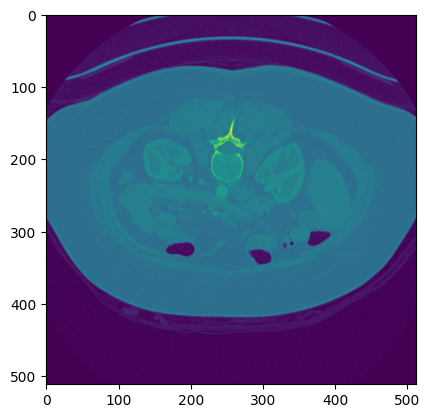

In [34]:
plt.imshow(nii_data[:,:,100].T)

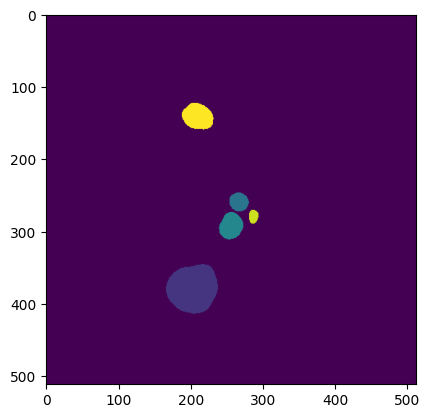

In [55]:
plt.imshow(nii_data2[:,:,0])

In [56]:
image_names

['FLARE22_Tr_0001_0000.nii.gz',
 'FLARE22_Tr_0002_0000.nii.gz',
 'FLARE22_Tr_0003_0000.nii.gz',
 'FLARE22_Tr_0004_0000.nii.gz',
 'FLARE22_Tr_0005_0000.nii.gz',
 'FLARE22_Tr_0006_0000.nii.gz',
 'FLARE22_Tr_0007_0000.nii.gz',
 'FLARE22_Tr_0008_0000.nii.gz',
 'FLARE22_Tr_0009_0000.nii.gz',
 'FLARE22_Tr_0010_0000.nii.gz',
 'FLARE22_Tr_0011_0000.nii.gz',
 'FLARE22_Tr_0012_0000.nii.gz',
 'FLARE22_Tr_0013_0000.nii.gz',
 'FLARE22_Tr_0014_0000.nii.gz',
 'FLARE22_Tr_0015_0000.nii.gz',
 'FLARE22_Tr_0016_0000.nii.gz',
 'FLARE22_Tr_0017_0000.nii.gz',
 'FLARE22_Tr_0018_0000.nii.gz',
 'FLARE22_Tr_0019_0000.nii.gz',
 'FLARE22_Tr_0020_0000.nii.gz',
 'FLARE22_Tr_0021_0000.nii.gz',
 'FLARE22_Tr_0022_0000.nii.gz',
 'FLARE22_Tr_0023_0000.nii.gz',
 'FLARE22_Tr_0024_0000.nii.gz',
 'FLARE22_Tr_0025_0000.nii.gz',
 'FLARE22_Tr_0026_0000.nii.gz',
 'FLARE22_Tr_0027_0000.nii.gz',
 'FLARE22_Tr_0028_0000.nii.gz',
 'FLARE22_Tr_0029_0000.nii.gz',
 'FLARE22_Tr_0030_0000.nii.gz',
 'FLARE22_Tr_0031_0000.nii.gz',
 'FLARE2

In [63]:
for i in range(len(mask_names)):
    input_img=nibabel.load(os.path.join(image_path,image_names[i]))
    mask_true=nibabel.load(os.path.join(mask_path,mask_names[i]))
    nii_data = np.asarray(input_img.get_fdata())
    nii_data2 = np.asarray(mask_true.get_fdata())
    print(nii_data.shape,nii_data2.shape)
    

(512, 512, 110) (512, 512, 110)
(512, 512, 107) (512, 512, 107)
(512, 512, 101) (512, 512, 101)
(512, 512, 87) (512, 512, 87)
(512, 512, 85) (512, 512, 85)
(512, 512, 93) (512, 512, 93)
(512, 512, 105) (512, 512, 105)
(512, 512, 99) (512, 512, 99)
(512, 512, 87) (512, 512, 87)
(512, 512, 96) (512, 512, 96)
(512, 512, 84) (512, 512, 84)
(512, 512, 103) (512, 512, 103)
(512, 512, 91) (512, 512, 91)
(512, 512, 71) (512, 512, 71)
(512, 512, 84) (512, 512, 84)
(512, 512, 93) (512, 512, 93)
(512, 512, 108) (512, 512, 108)
(512, 512, 98) (512, 512, 98)
(512, 512, 98) (512, 512, 98)
(512, 512, 92) (512, 512, 92)
(512, 512, 100) (512, 512, 100)
(512, 512, 98) (512, 512, 98)
(512, 512, 102) (512, 512, 102)
(512, 512, 99) (512, 512, 99)
(512, 512, 85) (512, 512, 85)
(512, 512, 104) (512, 512, 104)
(512, 512, 102) (512, 512, 102)
(512, 512, 89) (512, 512, 89)
(512, 512, 93) (512, 512, 93)
(512, 512, 99) (512, 512, 99)
(512, 512, 101) (512, 512, 101)
(512, 512, 103) (512, 512, 103)
(512, 512, 107) 

In [78]:
JPG_train='/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG'
JPG_label='/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB'
print(os.path.join(JPG_train,image_names[2][11:15]))
print(os.path.join(JPG_label,mask_names[2][11:15]))

/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG/0003
/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB/0003


In [73]:
def make_dirt(dirt):
    try:
        os.mkdir(dirt)
        print(f"Directory '{dirt}' created successfully.")
    except FileExistsError:
        print(f"Directory '{dirt}' already exists.")

In [79]:
for i in range(len(image_names)):
    make_dirt(os.path.join(JPG_train,image_names[i][11:15]))
    make_dirt(os.path.join(JPG_label,mask_names[i][11:15]))

Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG/0001' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB/0001' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG/0002' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB/0002' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG/0003' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB/0003' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG/0004' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB/0004' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG/0005' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB/0005' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG/0006' created successfully.
Directory '/mnt/d/Dataset/dataset_sam/FLARE

In [80]:
image_folder_jpg=[]
mask_folder_jpg=[]
for i in range(len(image_names)):
    image_folder_jpg.append(os.path.join(JPG_train,image_names[i][11:15]))
    mask_folder_jpg.append(os.path.join(JPG_label,mask_names[i][11:15]))

In [100]:
np_label='/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB_np'

'/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB_np/0001.npy'

'0001'

In [112]:
for i in range(len(mask_names)):
    input_img=nibabel.load(os.path.join(image_path,image_names[i]))
    mask_true=nibabel.load(os.path.join(mask_path,mask_names[i]))
    nii_data = np.asarray(input_img.get_fdata())
    nii_data2 = np.asarray(mask_true.get_fdata())
    npy_save_i=os.path.join(np_label,mask_names[i][11:15]+'.npy')
    np.save(npy_save_i,nii_data2)
    print(nii_data.shape,nii_data2.shape)
    for j in range(nii_data.shape[-1]):
        save_path_imp=os.path.join(image_folder_jpg[i],'{}.jpg'.format(j))
        save_path_mask=os.path.join(mask_folder_jpg[i],'{}.jpg'.format(j))

        imp_img=Image.fromarray(nii_data[:,:,j])
        imp_img=imp_img.convert('RGB')
        imp_img.save(save_path_imp)
        

        mask_img=Image.fromarray(nii_data2[:,:,j])
        mask_img=mask_img.convert('RGB')
        mask_img.save(save_path_mask)



(512, 512, 110) (512, 512, 110)
(512, 512, 107) (512, 512, 107)
(512, 512, 101) (512, 512, 101)
(512, 512, 87) (512, 512, 87)
(512, 512, 85) (512, 512, 85)
(512, 512, 93) (512, 512, 93)
(512, 512, 105) (512, 512, 105)
(512, 512, 99) (512, 512, 99)
(512, 512, 87) (512, 512, 87)
(512, 512, 96) (512, 512, 96)
(512, 512, 84) (512, 512, 84)
(512, 512, 103) (512, 512, 103)
(512, 512, 91) (512, 512, 91)
(512, 512, 71) (512, 512, 71)
(512, 512, 84) (512, 512, 84)
(512, 512, 93) (512, 512, 93)
(512, 512, 108) (512, 512, 108)
(512, 512, 98) (512, 512, 98)
(512, 512, 98) (512, 512, 98)
(512, 512, 92) (512, 512, 92)
(512, 512, 100) (512, 512, 100)
(512, 512, 98) (512, 512, 98)
(512, 512, 102) (512, 512, 102)
(512, 512, 99) (512, 512, 99)
(512, 512, 85) (512, 512, 85)
(512, 512, 104) (512, 512, 104)
(512, 512, 102) (512, 512, 102)
(512, 512, 89) (512, 512, 89)
(512, 512, 93) (512, 512, 93)
(512, 512, 99) (512, 512, 99)
(512, 512, 101) (512, 512, 101)
(512, 512, 103) (512, 512, 103)
(512, 512, 107) 

In [117]:
for i in range(len(mask_names)):
    mask_true=nibabel.load(os.path.join(mask_path,mask_names[i]))
    nii_data2 = np.asarray(mask_true.get_fdata())*18
    print(nii_data2.shape)
    for j in range(nii_data2.shape[-1]):

        save_path_mask=os.path.join(mask_folder_jpg[i],'{}.jpg'.format(j))
        mask_img=Image.fromarray(nii_data2[:,:,j])
        mask_img=mask_img.convert('RGB')
        mask_img.save(save_path_mask)


(512, 512, 110)
(512, 512, 107)
(512, 512, 101)
(512, 512, 87)
(512, 512, 85)
(512, 512, 93)
(512, 512, 105)
(512, 512, 99)
(512, 512, 87)
(512, 512, 96)
(512, 512, 84)
(512, 512, 103)
(512, 512, 91)
(512, 512, 71)
(512, 512, 84)
(512, 512, 93)
(512, 512, 108)
(512, 512, 98)
(512, 512, 98)
(512, 512, 92)
(512, 512, 100)
(512, 512, 98)
(512, 512, 102)
(512, 512, 99)
(512, 512, 85)
(512, 512, 104)
(512, 512, 102)
(512, 512, 89)
(512, 512, 93)
(512, 512, 99)
(512, 512, 101)
(512, 512, 103)
(512, 512, 107)
(512, 512, 94)
(512, 512, 101)
(512, 512, 89)
(512, 512, 79)
(512, 512, 109)
(512, 512, 100)
(512, 512, 93)
(512, 512, 98)
(512, 512, 93)
(512, 512, 85)
(512, 512, 83)
(512, 512, 113)
(512, 512, 93)
(512, 512, 113)
(512, 512, 95)
(512, 512, 87)
(512, 512, 95)


# **Some Function**

In [1]:


from sam2.build_sam import build_sam2_video_predictor
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.distributions as td
import os
device = torch.device("cuda")
checkpoint = "//mnt/e/weights/sam2/sam2.1_hiera_large.pt"
model_cfg = "//mnt/e/code/sam2-main/sam2/configs/sam2.1/sam2.1_hiera_l.yaml"
organs=np.arange(1,14)

In [2]:

def get_mask_all(organ,mask_dir,filenames):
    masks=[]
    for i in range(len(filenames)):
        mask=Image.open(os.path.join(mask_dir, filenames[i]))
        mask=np.asarray(mask)==organs[organ]
        masks.append(mask)
    return np.asarray(masks)

def get_input(mask_dir,filenames):
    IMGS=[]
    for i in range(len(filenames)):
        mask=Image.open(os.path.join(mask_dir, filenames[i]))
        mask=np.asarray(mask)#.convert("RGB")
        IMGS.append(mask)
    return np.asarray(IMGS)


def get_contour(mask_):
    contours, _ = cv2.findContours(mask_.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    M = cv2.moments(cnt)    
    cx = int(M['m10'] / M['m00'])
    cy = int(M['m01'] / M['m00'])
    return cx,cy

def radius(center,rad,sample_rate):
    x=np.cos(np.linspace(0,2*np.pi-0.001,sample_rate))*rad
    y=np.sin(np.linspace(0,2*np.pi-0.001,sample_rate))*rad
    x=center[0]+x
    y=center[1]+y
    output=np.stack((x,y)).T
    zzz=np.sum(output>0,axis=-1)==2
    return output[np.where(zzz==1)]

def get_means(position,POS,NEG,step):
    means_p=[]
    for i in range(step):
        kkk=radius(position,POS[i],int(POS[i]*5))
        means_p.append(kkk)
    means_n=[]
    for i in range(step):
        kkk=radius(position,NEG[i],int(NEG[i]*5))
        means_n.append(kkk)
    return means_p,means_n

def Get_gmm(mean,var):
    num_of_gaus=len(mean)
    covars=torch.ones((num_of_gaus,2,2))*torch.eye(2)*var
    mean=torch.Tensor(mean)
    MVN= td.MultivariateNormal(mean,covars)
    mix=td.Categorical(torch.ones((num_of_gaus,)))
    gmm = td.MixtureSameFamily(mix, MVN)
    return gmm


def extract_mask(res_,w_,h_):
    mask_output=[]
    for i in range(len(res_)):
        for out_obj_id, out_mask in res_[i].items():
            mask_output.append(out_mask.reshape((w_,h_,1))*1.0)
    mask_output=np.asarray(mask_output).astype(np.float32)
    return mask_output

def TV_dist(img1,img2):
    tv=img2-img1
    tv2=np.sum(np.abs(tv))
    return tv,tv2

def dm_dt_func(all_masks):
    dm_dt_img=[]
    dm_dt_val=[]
    for i in range(len(all_masks)-1):
        k1,k2=TV_dist(all_masks[i],all_masks[i+1])
        dm_dt_img.append(k1)
        dm_dt_val.append(k2)
    dm_dt2_img=[]
    dm_dt2_val=[]
    for i in range(len(dm_dt_img)-1):
        k1,k2=TV_dist(dm_dt_img[i],dm_dt_img[i+1])
        dm_dt2_img.append(k1)
    for i in range(len(dm_dt_val)-1):
        dm_dt2_val.append(np.sum(np.abs(dm_dt_val[i+1]-dm_dt_val[i])))
    return dm_dt_val/np.max(dm_dt_val),dm_dt2_val/np.max(dm_dt2_val)


def dm_dx_dy_func(all_masks):
    TV_dx=[]
    TV_dy=[]
    for i in range(len(all_masks)):
        TV_dx.append(np.sum(np.abs(all_masks[i][1:,:]-all_masks[i][:-1,:])))
        TV_dy.append(np.sum(np.abs(all_masks[i][:,1:]-all_masks[i][:,:-1])))
    TV_dy=np.asarray(TV_dy)
    TV_dx=np.asarray(TV_dx)
    outs=(TV_dx+TV_dy)/2
    return outs/np.max(outs)

def metrcis_func(all_masks):
    dm_dt,dm_dt2=dm_dt_func(all_masks)
    dm_dx_dy=dm_dx_dy_func(all_masks)
    return np.sum(dm_dt),np.sum(dm_dt2),np.sum(dm_dx_dy)

def iou(outputs: np.array, labels: np.array):
    SMOOTH = 1e-6
    intersection = (outputs & labels).sum()
    union = (outputs | labels).sum()
    iou = (intersection ) / (union + SMOOTH)
    return iou

def dice(outputs: np.array, labels: np.array):
    intersection = (outputs * labels).sum()
    union = np.sum(outputs).sum()+np.sum(labels).sum()
    dice = (2*intersection ) / (union + 1e-6)
    return dice

def dice_batch(outputs: np.array, labels: np.array):
    intersection = (outputs * labels).sum((1,2))
    union = np.sum(outputs).sum((1,2))+np.sum(labels).sum((1,2))
    dice = (2*intersection ) / (union + 1e-6)
    return dice.mean()

def get_region(mask_output_,ann_frame_idx_):
    for l in range(ann_frame_idx_):
        dice_scores_=dice(mask_output_[ann_frame_idx_-l],mask_output_[ann_frame_idx_])
        if dice_scores_==0:
            left_=ann_frame_idx_-l
            break
    for r in range(ann_frame_idx_,len(mask_output_)):
        dice_scores_=dice(mask_output_[r],mask_output_[ann_frame_idx_])
        if dice_scores_==0:
            right_=r
            break
    mask_output_[:left_]=mask_output_[:left_]*0
    mask_output_[right_:]=mask_output_[right_:]*0
    return mask_output_.astype(np.int16)

def dice_batch(outputs: np.array, labels: np.array):
    outputs=np.squeeze(outputs)
    labels=np.squeeze(labels)
    intersection = (outputs * labels).sum((1,2))
    union = outputs.sum((1,2))+labels.sum((1,2))
    dice = (2*intersection + 1e-8) / (union + 1e-8)
    return dice.mean()


    

def test_sam_func(pons,las,tres_,video_dir,ann_frame_idx_):
    predictor = build_sam2_video_predictor(model_cfg, checkpoint, device=device)
    inference_state = predictor.init_state(video_path=video_dir)
    predictor.reset_state(inference_state)

    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
        inference_state=inference_state,
        frame_idx=ann_frame_idx_,
        obj_id=1,
        points=pons,
        labels=las,
    )
    
    abs_mask_region=np.sum((out_mask_logits[0] > 0.0).cpu().numpy())

    if abs_mask_region>tres_:
        return None, abs_mask_region
    else:
        video_segments_f = {} 
        for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
            video_segments_f[out_frame_idx] = {
                out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
                for i, out_obj_id in enumerate(out_obj_ids)
            }
        for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state,reverse=True):
            video_segments_f[out_frame_idx] = {
                out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
                for i, out_obj_id in enumerate(out_obj_ids)
            }

        return video_segments_f, abs_mask_region
    
def dice_filter(results_,idx_):
    results_=np.squeeze(results_)
    imm_dim=results_.shape[1]
    final_mask=np.zeros((len(results_),imm_dim,imm_dim))

    keep=True
    for i in range(1,idx_):

        if dice(results_[idx_-i-1],results_[idx_-i])>0.5:
            keep=True
        else:
            keep=False
            final_mask[idx_-i]=results_[idx_-i]
            break
        if keep:
            final_mask[idx_-i]=results_[idx_-i]

    keep=True
    for i in range(idx_,len(results_)-1):
        
        if dice(results_[i+1],results_[i])>0.5:
            keep=True
        else:
            keep=False
            final_mask[i]=results_[i]
            break
        if keep:
            final_mask[i]=results_[i]
    return final_mask
def get_gmm_points(prompt,point_size,dist_pos_cata,dist_neg_cata,dist_gmm_pos,dist_gmm_neg):
    test_points=[]
    test_labels=[]
    if point_size==1:

        point_i=[]
        label_i=[]
        point_i.append(prompt[0].astype(np.int32))
        label_i.append(1.0)
        point_i.append(dist_gmm_neg[dist_neg_cata.sample((1,)).numpy()[0]].sample((1,)).numpy().astype(np.int32)[0])
        label_i.append(0.0)
        point_i=np.asarray(np.squeeze(point_i)).astype(np.float32)
        label_i=np.asarray(label_i).astype(np.int32)    
        test_points.append(point_i)
        test_labels.append(label_i)

    elif point_size>1:
        point_i=[]
        label_i=[]
        point_i.append(prompt[0])
        label_i.append(1.0)
        for j in range(point_size-1):
            point_i.append(dist_gmm_pos[dist_pos_cata.sample((1,)).numpy()[0]].sample((1,)).numpy().astype(np.int32)[0])
            label_i.append(1.0)
        for j in range(point_size):
            point_i.append(dist_gmm_neg[dist_neg_cata.sample((1,)).numpy()[0]].sample((1,)).numpy().astype(np.int32)[0])
            label_i.append(0.0)
        point_i=np.asarray(np.squeeze(point_i)).astype(np.float32)
        label_i=np.asarray(label_i).astype(np.int32)    
        test_points.append(point_i)
        test_labels.append(label_i)
    return test_points,test_labels

def get_score(results_,shape_,w_,h_):
    if results_==None:
        t1=1000
        t2=1000
        t3=1000
        mask_output_=np.ones(shape_)
    else:
        mask_output_=extract_mask(results_,w_,h_)
        t1,t2,t3=metrcis_func(mask_output_)
    return t1,t2,t3,mask_output_

def check_improvement(base_mask,mask_output_,k1_,k3_,t1_,t3_,mr,mr_,tres_mask):
    improvements=0
    improved=False
    if base_mask is not None:
        mask_compare=np.sum(np.abs(base_mask-mask_output_),axis=(1,2,3))

    else:
        mask_compare=np.ones((len(mask_output_)))*tres_mask
    
    imp_1=(k1_-t1_)/(k1_+1e-8) 
    imp_2=(k3_-t3_)/(k3_+1e-8)
    if imp_1>0 and imp_2>0 and mr<tres_mask:
        improvements=(imp_1 + imp_2)/2
    else:
        improvements=-np.inf 

    masks_diff_time=mask_compare>tres_mask

    add_rules=0
    if improvements>0.001 and np.sum(masks_diff_time)<=30.0 :
        print('New good points hit rule 1' )
        print('')
        print('')
        print('')
        improved=True
        add_rules=1
    elif improvements>0.1:
        print('New good points hit rule 2' )
        print('')
        print('')
        print('')
        improved=True
        add_rules=1
    elif t1_ !=1000 and (np.abs(imp_1)+np.abs(imp_2))/2<0.2:
        print('New good points hit rule 3' )
        print('')
        print('')
        print('')
        improved=True
        add_rules=1
    elif mr>tres_mask and mr_<tres_mask:
        improved=True
        print('New good points hit rule 4' )
        print('')
        print('')
        print('')
    elif mr_<mr:
        improved=True
        print('New good points hit rule 5' )
        print('')
        print('')
        print('')
    return improved,add_rules



# **Main**

In [3]:
image_folder_jpg='/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG/'
mask_folder_numpy='/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/LAB_np/'

In [4]:
patients=os.listdir(image_folder_jpg)


In [5]:
patients

['0001',
 '0002',
 '0003',
 '0004',
 '0005',
 '0006',
 '0007',
 '0008',
 '0009',
 '0010',
 '0011',
 '0012',
 '0013',
 '0014',
 '0015',
 '0016',
 '0017',
 '0018',
 '0019',
 '0020',
 '0021',
 '0022',
 '0023',
 '0024',
 '0025',
 '0026',
 '0027',
 '0028',
 '0029',
 '0030',
 '0031',
 '0032',
 '0033',
 '0034',
 '0035',
 '0036',
 '0037',
 '0038',
 '0039',
 '0040',
 '0041',
 '0042',
 '0043',
 '0044',
 '0045',
 '0046',
 '0047',
 '0048',
 '0049',
 '0050']

In [6]:
img_path=os.path.join(image_folder_jpg,patients[0])
img_path

'/mnt/d/Dataset/dataset_sam/FLARE22Train/JPG/IMG/0001'

In [7]:
def get_data_path_jpg(pat_num):
    video_dirt_t1_img=image_folder_jpg+patients[pat_num]
    video_dirt_t1_t=mask_folder_numpy+patients[pat_num]+'.npy'

    _frame_names_t1_img = [
            p for p in os.listdir(video_dirt_t1_img)
            if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
        ]
    _frame_names_t1_img.sort(key=lambda p: int(os.path.splitext(p)[0].split('_')[-1]))

    _img_fold_name=[video_dirt_t1_img , _frame_names_t1_img]

    return  _img_fold_name,video_dirt_t1_t

In [8]:
def check_init_img(predictor_img,image,pons,las, mask_t):
    predictor_img.set_image(image)
    masks, scores, logits = predictor_img.predict(
    point_coords=pons,
    point_labels=las,
    multimask_output=True,)
    sorted_ind = np.argsort(scores)[::-1]
    masks = masks[sorted_ind]
    scores = scores[sorted_ind]
    logits = logits[sorted_ind]
    mask_p=(masks[0] > 0.0)
    return dice(np.squeeze(mask_p),np.squeeze(mask_t))

def __promt_idx(data_img,data_mask):
    masked_index=np.where(data_mask.sum((1,2))>0)[0].tolist()
    print(masked_index)
    ini_check=[]
    ini_check_ind=[]

    sam2_model = build_sam2(model_cfg, checkpoint, device=device)
    predictor_img = SAM2ImagePredictor(sam2_model)
    for i in range(3):
        index=masked_index.pop(np.random.randint(0,len(masked_index)))
        print(index)
        try:
            # print('1')
            point_r,point_l=get_contour(data_mask[index])
            # print('2')
            center_point = np.array((point_r,point_l), dtype=np.float32)
            points = np.array(center_point[np.newaxis,...], dtype=np.float32)
            labels = np.array([1,], np.int32)
            # print('3')
            zzz=check_init_img(predictor_img,data_img[index],points,labels,data_mask[index])
            # print('4')
            ini_check.append(zzz)
            print(zzz,index)
            # print('5')
            ini_check_ind.append(index)
        except:
            print("Some Error.")
    print(ini_check_ind[np.argmax(ini_check)])
    return ini_check_ind[np.argmax(ini_check)]


In [9]:

def test_and_val_gp(imps_,masks_,input_dir,_sample_=3):
    w,h=np.asarray(imps_[0]).shape[:2]
    region_cover=0.5
    Size_to_cover=(w+h)/2*region_cover
    mask_region_limit=np.asarray(w*h*region_cover).astype(np.int64)
    print('Image size is ',w*h*region_cover,mask_region_limit)
    mask_frame_idx=1000
    for i in range(10):
        try:
            mask_frame_idx=__promt_idx(imps_,masks_)
        except:
            print("Mask not right.")
        if mask_frame_idx!=1000:
            break
    print('Prompt Index is ',mask_frame_idx)
    point_r,point_l=get_contour(masks_[mask_frame_idx])
    center_point = np.array((point_r,point_l), dtype=np.float32)
    points = np.array(center_point[np.newaxis,...], dtype=np.float32)
    labels = np.array([1,], np.int32)

    decay=0.5
    num_of_gaus=6
    variance=np.sqrt(Size_to_cover/(num_of_gaus*3))
    wave_length=Size_to_cover/num_of_gaus
    rads_pos=np.arange(1,num_of_gaus+1)*wave_length
    rads_neg=rads_pos+3*variance
    alpha=[]
    for i in range(num_of_gaus):
        alpha.append((1-decay)**i)
    alpha=np.asarray(alpha).astype(np.float32)
    beta=alpha[::-1]

    cata_alpha = td.Categorical(torch.tensor(alpha/np.sum(alpha)))
    cata_beta = td.Categorical(torch.tensor(beta/np.sum(beta)))

    dist_pos=[]
    dist_neg=[]
    means_pos,means_neg=get_means((point_r,point_l),rads_pos,rads_neg,num_of_gaus)

    for i in range(len(means_pos)):
        gmm=Get_gmm(means_pos[i],variance)
        dist_pos.append(gmm)
        gmm=Get_gmm(means_neg[i],variance)
        dist_neg.append(gmm)
    


    center_point = np.array((point_r,point_l), dtype=np.float32)
    points = np.array(center_point[np.newaxis,...], dtype=np.float32)
    labels = np.array([1,], np.int32)

    results,mr_original=test_sam_func(points,labels,w*h,input_dir,mask_frame_idx)
    mask_output=extract_mask(results,w,h)
    filtered_output=dice_filter(mask_output,mask_frame_idx)

    # print(mask_output[0])

    mask_output_shape=mask_output.shape
    k1,k2,k3=metrcis_func(mask_output)
    print('           Initial metrics:                   ',k1,k2,k3,mr_original)
    
    mask_candidate=[]
    mask_candidate.append(dice_batch(mask_output,masks_))

    for i in range(_sample_):
        test_points,test_labels=get_gmm_points(points,1,cata_alpha,cata_beta,dist_pos,dist_neg)
        results_test,mr_test=test_sam_func(test_points,test_labels,mask_region_limit,input_dir,mask_frame_idx)  
        t1,t2,t3,mask_output_=get_score(results_test,mask_output_shape,w,h)     
        improved,add_rules=check_improvement(mask_output,mask_output_,k1,k3,t1,t3,mr_original,mr_test,mask_region_limit)
        print(t1,t2,t3,mr_test)
        if improved:
            k1=t1
            k3=t3
            filtered_output=dice_filter(mask_output_,mask_frame_idx)
            mask_candidate.append(dice_batch(filtered_output,masks_))
    for j in (2,3):
        for i in range(_sample_):
            test_points,test_labels=get_gmm_points(points,j,cata_alpha,cata_beta,dist_pos,dist_neg)
            results_test,mr_test=test_sam_func(test_points,test_labels,mask_region_limit,input_dir,mask_frame_idx)  
            t1,t2,t3,mask_output_=get_score(results_test,mask_output_shape,w,h)     
            print(t1,t2,t3,mr_test)
            improved,add_rules=check_improvement(mask_output,mask_output_,k1,k3,t1,t3,mr_original,mr_test,mask_region_limit)
            if improved :
                k1=t1
                k3=t3
                filtered_output=dice_filter(mask_output_,mask_frame_idx)
                mask_candidate.append(dice_batch(filtered_output,masks_))

    return mask_candidate



In [10]:
def check_organ(org):
    reults_organ_3=[]
    for i in range(len(patients)):
        patients_i=[]
        f1,f2=get_data_path_jpg(i)
        mask_os=np.load(f2)
        mask_os=(mask_os==org).astype(np.float32)*1.0
        mask_reshape=np.zeros((mask_os.shape[-1],mask_os.shape[0],mask_os.shape[1]))
        for j in range(mask_os.shape[-1]):
            mask_reshape[j]=mask_os[:,:,j]
        input_imgaes=get_input(f1[0],f1[1]) 
        for j in range(2):
            kkk=test_and_val_gp(input_imgaes,mask_reshape,f1[0],2)
            patients_i.append(np.max(kkk))
        reults_organ_3.append(np.max(patients_i))
    return reults_organ_3


In [11]:
def check_pat_org(org,pat):
    patients_i=[]
    f1,f2=get_data_path_jpg(pat)
    mask_os=np.load(f2)
    mask_os=(mask_os==org).astype(np.float32)*1.0
    mask_reshape=np.zeros((mask_os.shape[-1],mask_os.shape[0],mask_os.shape[1]))
    for j in range(mask_os.shape[-1]):
        mask_reshape[j]=mask_os[:,:,j]
    input_imgaes=get_input(f1[0],f1[1]) 
    for j in range(2):
        kkk=test_and_val_gp(input_imgaes,mask_reshape,f1[0],2)
        patients_i.append(np.max(kkk))
    return np.max(patients_i)

In [ ]:

org=1
result=check_organ(org)
new_result=np.asarray(result).copy()
for _ in range(3):
    for i in range(len(new_result)):
        if new_result[i]<np.mean(new_result):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result[i]:
                new_result[i]=kkk


0
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
40
0.984148077789077 40
35
0.969567823069217 35
69
0.9650655021720775 69
40
Prompt Index is  40


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 40.02it/s]
/home/will/code/sam2-main/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/home/will/code/sam2-main/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.85it/s]


           Initial metrics:                    18.590206 7.5452285 53.219723 10627


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.84it/s]


New good points hit rule 3



18.773808 7.4123178 47.662228 10420


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.85it/s]


New good points hit rule 3



16.102823 7.0837903 56.976875 10550


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


20.107904 11.1963825 53.941715 11015
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


24.515617 13.134848 44.0961 12224


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


18.436583 7.314035 54.19437 10582
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


18.103823 9.866105 60.51182 10818
New good points hit rule 3



Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
46
0.9573649891002386 46
21
0.8840579706141042 21
62
0.9772813275079918 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


           Initial metrics:                    22.768404 12.750535 37.940712 35598


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


New good points hit rule 3



23.152077 11.479137 35.650246 31847


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


New good points hit rule 1



18.246004 14.318262 30.397705 30368


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


26.788862 13.0263195 41.519302 30645
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


26.964529 14.887338 36.952816 30736
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


18.383705 10.670646 47.506325 31271
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


24.023262 14.940267 32.04848 32141
New good points hit rule 5



2
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
54
0.720804330455681 54
61
0.34629222116223785 61
82
0.9793516752661576 82
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.14it/s]


           Initial metrics:                    6.361599 5.9661 17.556908 18736


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.15it/s]


New good points hit rule 3



6.4540257 6.5112967 16.203852 18611


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


New good points hit rule 3



6.532751 6.0900044 16.221865 18605


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


6.4616213 6.0197124 16.58721 18518
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.08it/s]


7.3691797 6.5200996 27.701267 18664
New good points hit rule 5





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


7.823746 5.9780035 27.500435 18684
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


34.285168 19.180416 33.12424 27420
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
55
0.746108949053449 55
59
0.23255068147800903 59
79
0.8421132235152516 79
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.03it/s]


           Initial metrics:                    19.784729 11.366896 44.21993 36199


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.06it/s]


New good points hit rule 5



29.24703 17.259611 47.867928 35482


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.07it/s]


New good points hit rule 1



20.191217 11.64704 46.33037 34378


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.04it/s]


14.277634 10.0265665 49.853306 36420
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.04it/s]


29.691515 9.683859 43.96379 128502


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 39.21it/s]


1000 1000 1000 164831


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.76it/s]


1000 1000 1000 200010
3
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
69
0.8157785587806811 69
17
0.8632054172175145 17
65
0.8655977431580415 65
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


           Initial metrics:                    16.400915 6.943793 23.256859 39185


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


New good points hit rule 1



13.735758 5.4366717 22.34038 38325


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


New good points hit rule 3



14.110092 8.128693 29.75 219


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


14.060075 8.418426 14.459801 37495
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.75it/s]


1000 1000 1000 159580


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


9.598282 5.0370817 22.574402 112479


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.12it/s]


12.558882 7.3996677 16.732708 34583
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
35
0.9750533154304888 35
27
0.9620671833630938 27
66
0.843869512869774 66
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.28it/s]


           Initial metrics:                    9.64042 6.0363564 32.37295 10335


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]


New good points hit rule 3



8.934319 5.7453074 33.713657 10056


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]


New good points hit rule 3



8.97593 5.541814 32.779343 10079


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


9.207827 5.5881433 33.296562 10119
New good points hit rule 3





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]


8.902594 5.596085 34.19759 10021
New good points hit rule 3





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.18it/s]


8.888678 5.623674 34.240543 9889
New good points hit rule 3





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


12.203352 6.293872 29.081055 11502
5
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
0
0.6802030439588755 0
22
0.9753588516163063 22
69
0.9465179907865748 69
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


           Initial metrics:                    12.266526 8.5836735 58.4786 8580


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.33it/s]


New good points hit rule 1



11.693468 7.508365 52.22587 8529


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


New good points hit rule 3



11.7281885 7.497942 57.424526 8577


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


12.71912 8.868102 58.650482 8352
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.93it/s]


1000 1000 1000 203624


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


13.454495 3.728111 51.98006 90373
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.47it/s]


1000 1000 1000 198987
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
34
0.9242809310208446 34
50
0.9813632329491685 50
70
0.9354985663119892 70
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


           Initial metrics:                    12.546645 9.300869 58.227356 22619


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


New good points hit rule 3



12.560371 9.273034 58.29554 22540


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


New good points hit rule 3



12.81257 7.132473 55.89389 22360


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


12.888432 8.578769 57.57615 22353
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


14.682754 7.673869 58.611935 23031
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


23.068104 11.153596 53.751507 24125


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


13.038549 8.725826 57.645218 22265
New good points hit rule 1



10
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
30
0.9902138455449586 30
49
0.98250941079004 49
16
0.9811890703032831 16
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


           Initial metrics:                    20.84254 7.7729955 46.203556 9683


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


New good points hit rule 1



20.769136 7.596031 44.669266 9430


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


New good points hit rule 3



21.937405 8.258513 50.622337 9467


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.26it/s]


20.587946 7.635527 50.521206 9410
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


21.233236 8.610596 30.841114 9617
New good points hit rule 5





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


25.794384 9.559907 48.311234 12507


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


22.47861 8.3547 44.329273 9027
New good points hit rule 5



Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
59
0.9665801320862512 59
61
0.9783024785521319 61
30
0.9902138455449586 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


           Initial metrics:                    20.84254 7.7729955 46.203556 9683


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.24it/s]


New good points hit rule 3



21.908993 8.24621 50.638298 9471


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.33it/s]


New good points hit rule 3



22.306103 8.32723 50.52297 9363


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


25.510107 10.239746 45.806934 9929
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.23it/s]


21.384632 7.569275 50.730972 9302
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.26it/s]


16.565886 8.805045 31.984026 8348
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


14.942752 10.458914 33.335052 114636
New good points hit rule 3



12
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
25
0.25381818172588433 25
39
0.9849651365127482 39
69
0.9645512928645312 69
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


           Initial metrics:                    10.002017 4.3674407 45.537453 13899


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


New good points hit rule 1



8.2339735 4.5115533 44.106144 13287


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.18it/s]


New good points hit rule 5



24.680756 13.913923 41.744877 13578


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


21.348787 9.252903 49.16953 13915
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


24.662725 13.676322 42.12547 13672
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


24.658096 13.780093 42.22139 13670
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 39.29it/s]


1000 1000 1000 179151
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
73
0.9413616286505213 73
44
0.989648755495765 44
57
0.978316521869936 57
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


           Initial metrics:                    18.336258 14.052594 25.52107 17306


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


New good points hit rule 1



17.897175 15.332413 25.109093 17026


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


New good points hit rule 3



17.47838 15.147885 27.046667 16988


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


17.31197 8.628619 21.582975 16919
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


11.815935 6.4217534 45.275043 17270
New good points hit rule 5





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


10.265307 6.3603916 32.352535 18103
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


8.405447 5.221254 31.06274 17061
New good points hit rule 1



18
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
60
0.9841507924111719 60
54
0.9311338044170899 54
69
0.3799330633179965 69
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


           Initial metrics:                    12.110132 9.719306 14.387247 10071


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


New good points hit rule 3



12.17664 12.023268 13.078483 9926


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


New good points hit rule 3



12.282384 9.7845955 14.21396 9998


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.04it/s]


13.721766 12.294902 31.92879 10196


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


12.292809 12.009108 12.906678 9927
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.06it/s]


12.427258 12.036041 12.619773 9910
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


12.4700365 9.772187 13.283996 9510
New good points hit rule 3



Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
66
0.9693614665409892 66
65
0.9171162593642993 65
52
0.22025316441756126 52
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.06it/s]


           Initial metrics:                    19.224134 12.291964 28.069042 23477


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


New good points hit rule 5



18.964624 10.622702 41.11589 22358


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


New good points hit rule 3



19.062216 12.316695 29.42985 22960


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


18.506634 10.347687 29.558893 22645
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


20.650711 10.444189 29.26349 26838
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


13.845166 8.035573 9.464328 15749
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


19.830296 9.785141 36.967693 22897
New good points hit rule 5



26
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
48
0.9796720725112955 48
84
0.9105802041566005 84
43
0.9729319022724919 43
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


           Initial metrics:                    7.1549315 5.083283 45.84731 11436


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


New good points hit rule 3



7.219082 4.7159505 36.715965 11322


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


New good points hit rule 3



7.223094 4.6483493 26.81582 11408


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


11.5710945 6.3992577 11.377739 11392
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


7.261185 4.8186107 43.288574 11264
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


7.1091523 4.728665 47.948658 11067
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


7.219485 4.7942896 23.489662 11143
New good points hit rule 5



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
53
0.24656849732001931 53
59
0.06700280111794574 59
46
0.9825951265764857 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


           Initial metrics:                    9.570614 5.2098594 31.566734 8482


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


New good points hit rule 3



9.411127 5.1691513 33.015152 8414


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


New good points hit rule 3



9.438411 5.1722355 32.70878 8444


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


10.4911995 6.3835955 29.38049 9637
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


10.088726 4.8088956 31.450506 8446
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


11.389572 8.135449 27.72942 4600
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


6.3578496 4.390518 39.60241 8754
27
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
55
0.31849264904041685 55
74
0.9736174849442883 74
57
0.5176054233011202 57
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.05it/s]


           Initial metrics:                    23.386967 11.403656 42.857674 24471


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


40.536537 22.550617 55.194813 58214


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.06it/s]


New good points hit rule 3



24.64677 10.418699 40.826164 23824


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


24.468195 12.464408 43.74332 103903
New good points hit rule 3





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.11it/s]


25.42704 13.107627 43.37003 60855
New good points hit rule 3





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


18.51474 10.119827 59.042793 112213


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


26.640385 10.737948 39.098976 23136
New good points hit rule 3



Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
25
0.9628832704029257 25
47
0.9771251931616257 47
53
0.28834507384705876 53
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


           Initial metrics:                    9.6602335 6.201795 31.705456 115161


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


New good points hit rule 3



11.066714 4.568703 37.98574 13111


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 3



12.448856 6.0066085 38.11858 13374


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


10.977794 4.7321773 40.71593 13177
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


11.672295 4.8355217 37.976788 12875
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


11.621169 4.8781843 38.522606 13082
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


18.240328 9.991838 50.60431 108236
New good points hit rule 5



30
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
41
0.7961260266279114 41
51
0.8180289751093532 51
40
0.79858239799194 40
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


           Initial metrics:                    28.541214 14.6744995 40.217487 11843


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


New good points hit rule 3



35.184624 13.98296 38.07303 11549


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 3



31.189226 10.713731 38.247215 11767


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


29.793745 15.099032 36.65638 11556
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


14.163788 5.2288194 39.081635 12119


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


28.983147 9.142322 36.45148 12206
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


21.586761 8.254147 35.807842 11603
New good points hit rule 1



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
63
0.9622626030402752 63
64
0.9591983391696104 64
44
0.8311171157767818 44
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


           Initial metrics:                    14.563748 9.429793 41.33138 24827


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


17.412357 11.258057 25.932861 24877


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.05it/s]


New good points hit rule 1



14.160563 9.151498 28.431276 25129


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


10.867184 9.957442 37.71347 25338


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


13.833302 7.646198 39.35502 23835
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


10.550634 7.078606 33.684498 24077
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


38.097813 15.505777 48.331257 73540
31
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
49
0.6660550458279125 49
55
0.8470440251217172 55
83
0.9674827849421396 83
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


           Initial metrics:                    12.859998 6.59688 36.345585 8093


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


New good points hit rule 3



12.90263 8.620092 35.029358 8074


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.02it/s]


New good points hit rule 3



12.841844 6.533674 36.138382 8112


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.05it/s]


12.184025 6.723783 40.595284 9167
New good points hit rule 3





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.03it/s]


12.835082 6.5353556 35.944954 8091
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.07it/s]


1000 1000 1000 202022


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


9.961946 5.17757 35.08014 8073
New good points hit rule 1



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
54
0.8678749177919112 54
56
0.847430460451884 56
60
0.7621263647558841 60
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


           Initial metrics:                    8.388027 5.4839144 29.872665 11577


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


New good points hit rule 3



8.857371 7.3819666 30.912586 11387


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 3



10.419794 7.647661 32.76182 11124


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


42.450512 16.188948 62.885696 90354


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


16.157549 14.394894 18.85172 1976
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


11.394719 8.921703 30.38019 11625


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


18.732424 7.064006 24.990614 94023
36
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
45
0.13136663176290672 45
39
0.9746694835672975 39
38
0.9796540288388533 38
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.19it/s]


           Initial metrics:                    12.677251 5.6691675 45.252895 18472


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


New good points hit rule 3



16.094503 7.75635 43.990746 18566


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.23it/s]


New good points hit rule 1



15.01807 6.7265897 36.607594 18669


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


18.951723 7.750746 45.414448 22500


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.23it/s]


10.360176 5.0542808 37.965614 17469
New good points hit rule 3





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.19it/s]


22.12965 7.885059 27.588617 18438
New good points hit rule 5





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.18it/s]


10.017113 4.864105 41.51551 17943
New good points hit rule 5



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
23
0.9617895750314787 23
47
0.4293323305156792 47
27
0.9777423816499249 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


           Initial metrics:                    13.11727 4.6258664 43.559242 12177


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.33it/s]


New good points hit rule 3



15.500072 5.80712 44.010838 12253


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


New good points hit rule 1



13.171079 4.5773425 43.815586 11990


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


13.244667 4.782668 43.38051 11592
New good points hit rule 3





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.33it/s]


13.265141 4.592858 44.114147 11827
New good points hit rule 3





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.33it/s]


14.075581 6.4178753 34.00928 8548
New good points hit rule 3





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.28it/s]


21.848919 7.3070297 45.43056 18234
39
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
49
0.2719906777994019 49
70
0.9680180502655967 70
43
0.9780625120955907 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


           Initial metrics:                    15.120975 8.679888 47.65953 12994


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


New good points hit rule 3



15.452208 8.816716 42.169872 12903


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


New good points hit rule 3



14.549524 7.505726 49.71161 12760


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


14.484939 9.221154 42.78331 12762
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]


17.910965 9.564871 38.16094 16083
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


16.97581 8.668723 60.42655 15939


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


18.589243 10.071427 31.157804 16316
New good points hit rule 3



Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
77
0.9483247650915546 77
37
0.9869186045959907 37
45
0.9821502127906717 45
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


           Initial metrics:                    12.756509 6.014 52.22126 9031


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


New good points hit rule 3



14.777834 6.0910716 40.869705 8432


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.17it/s]


12.519745 5.7014503 51.865513 9079


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.85it/s]


1000 1000 1000 168647


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


15.7830105 7.781831 57.570812 9530


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


12.458464 5.668206 37.18798 8858
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.20it/s]


13.935633 6.3031306 48.61078 8845
New good points hit rule 5



41
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
26
0.9647658127968352 26
33
0.9824875176255692 33
47
0.9830404514066599 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


           Initial metrics:                    6.8809586 4.2561965 31.887142 16625


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


New good points hit rule 3



7.5245633 3.733564 32.482758 15712


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 1



6.906291 4.1682625 28.97644 16088


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


7.5232077 3.8247874 33.21407 15813
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


6.661452 3.957128 26.190083 16139
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


11.924669 9.428607 24.534216 18831


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


7.598481 3.7916794 34.433334 15762
New good points hit rule 5



Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
31
0.9739770279097293 31
59
0.12297668736221193 59
30
0.975974793129581 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


           Initial metrics:                    7.7979326 5.058101 43.501034 5177


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


New good points hit rule 1



7.59965 4.392109 40.142857 5211


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


New good points hit rule 3



7.659956 4.6101904 39.085186 5177


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


20.860334 13.038969 30.906834 130024


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.24it/s]


7.849766 6.1750593 33.042286 106183
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


8.401222 5.2416544 37.16248 5644
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


10.408903 5.4867105 54.28172 6173
42
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
43
0.3246358725048911 43
59
0.5759338680136316 59
69
0.8000898977233377 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


           Initial metrics:                    11.205024 5.8877354 35.90505 26626


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


New good points hit rule 3



12.155623 5.510083 24.637476 26739


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


New good points hit rule 3



12.2963705 6.315408 33.042362 26388


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


18.222246 9.771745 29.0 20185
New good points hit rule 5





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.15it/s]


33.058403 11.408266 42.57457 24873
New good points hit rule 5





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


18.382196 8.104515 29.219742 21278
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


15.586162 10.974062 27.119356 25273
New good points hit rule 1



Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
64
0.9476054845124284 64
48
0.9157963196405449 48
74
0.6839624932865004 74
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.11it/s]


           Initial metrics:                    25.709932 9.659101 37.126472 23395


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.10it/s]


New good points hit rule 1



16.871119 7.3289676 29.675869 25023


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


18.81905 8.768621 38.741817 23877


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


20.333866 4.6664343 29.455126 55863
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


19.734365 8.0475445 27.593988 21119
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


9.062887 5.392955 32.872547 51703


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


12.526088 5.13973 25.864546 22556
New good points hit rule 1



43
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
70
0.7743862838323956 70
15
0.9672131146357703 15
64
0.9464449330917527 64
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.61it/s]


           Initial metrics:                    12.402884 5.2565055 43.167496 4211


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.61it/s]


New good points hit rule 3



14.9631605 6.6384716 46.001793 4205


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.66it/s]


New good points hit rule 1



14.877568 6.2736745 43.241608 4193


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.60it/s]


13.275971 5.2129526 39.56626 4691
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


22.099806 10.877229 25.959984 87429


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


14.377704 5.780977 45.255245 4331
New good points hit rule 3





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


17.443743 7.2625723 51.81863 7237
New good points hit rule 3



Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
54
0.9793986636800633 54
64
0.9464449330917527 64
30
0.9716074019878624 30
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


           Initial metrics:                    18.143457 6.4936857 46.252075 28845


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


New good points hit rule 1



16.372355 5.900839 44.47278 28908


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


New good points hit rule 3



19.183168 6.7741504 44.76332 29003


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


18.25969 6.8925896 46.01159 28082
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


14.177061 5.3061357 42.079678 22106
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.17it/s]


17.827108 5.6387305 45.91374 27719
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


17.250147 12.236644 26.080011 109477
New good points hit rule 1



47
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
85
0.8928276995495352 85
49
0.961721728055863 49
84
0.9208809133521857 84
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


           Initial metrics:                    13.568162 5.2043905 38.791702 137345


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


New good points hit rule 4



21.01969 8.843502 39.016434 18563


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


New good points hit rule 3



17.664091 8.805561 38.95212 18071


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


19.429415 14.843321 37.976128 17468
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


18.859093 13.67595 37.825626 17662
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


4.609879 4.201902 17.912458 6278
New good points hit rule 4





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


22.936531 14.406977 37.226494 17374
New good points hit rule 4



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
85
0.8928276995495352 85
75
0.9295479935288148 75
66
0.9741057204782897 66
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


           Initial metrics:                    37.67253 12.516934 53.252796 147986


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


New good points hit rule 4



8.064634 4.448659 47.23941 34495


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.06it/s]


New good points hit rule 4



10.129918 6.483548 16.02977 35187


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


10.022069 5.794452 32.69932 32048
New good points hit rule 4





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


10.63403 5.159467 47.331924 34309
New good points hit rule 4





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


10.473585 4.969594 49.96291 34629
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.68it/s]


1000 1000 1000 160684
0
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
24
0.9428506887411676 24
87
0.2692821728704772 87
54
0.9775389222584657 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


           Initial metrics:                    15.964267 8.551786 43.93134 24145


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


New good points hit rule 3



17.135706 9.136049 38.15273 23817


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 3



16.540615 8.237996 43.081398 24158


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


18.292313 10.211157 34.270554 9566
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


14.695933 6.4573894 39.74768 20083
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


16.098673 8.733867 46.70675 23557
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.48it/s]


1000 1000 1000 138473
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
59
0.10690248392518327 59
62
0.9772813275079918 62
48
0.9268307179943286 48
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


           Initial metrics:                    22.768404 12.750535 37.940712 35598


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


New good points hit rule 3



17.826298 9.507506 41.19599 30030


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


New good points hit rule 5



23.9622 12.383866 36.38405 31722


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


12.140708 7.7340174 26.352545 31363
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


23.819363 14.102208 35.099293 30935
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


29.330591 13.180244 33.799587 32476
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


25.050629 11.044219 29.793995 33475
New good points hit rule 1



2
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
82
0.9793516752661576 82
92
0.9682092554357938 92
80
0.818842942851245 80
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


           Initial metrics:                    6.361599 5.9661 17.556908 18736


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


New good points hit rule 3



6.462742 6.5038104 16.16466 18617


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


New good points hit rule 3



6.3435335 6.406155 16.57798 18517


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.08it/s]


6.5278893 6.408817 15.09801 18492
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


6.4374146 6.4934983 17.1988 18502
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


13.241888 9.167801 22.123728 19108


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


6.3610225 6.3791986 16.815834 18573
New good points hit rule 1



Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
53
0.8603351943291407 53
87
0.9794884780543813 87
70
0.9608935963442001 70
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.08it/s]


           Initial metrics:                    15.926428 11.044938 26.593998 12107


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.11it/s]


New good points hit rule 3



15.953634 9.437261 23.150787 11986


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


New good points hit rule 3



16.278828 10.867158 23.981718 12051


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


10.705556 7.871658 30.051645 12487


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


7.4337125 7.305917 15.763619 19836
New good points hit rule 1





propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


16.041739 10.079618 20.979918 11929
New good points hit rule 5





propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.04it/s]


12.58569 8.550522 32.451744 12242
3
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
38
0.9635672421604796 38
61
0.9063245986979515 61
53
0.8734697197587686 53
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.19it/s]


           Initial metrics:                    9.54074 6.0568485 26.855515 12515


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


New good points hit rule 3



9.128976 5.91419 28.288862 12360


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


New good points hit rule 3



9.5352335 5.92932 28.649145 12289


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


10.042513 4.991466 25.776182 12911
New good points hit rule 3





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


9.293903 6.005835 28.708641 12333
New good points hit rule 3





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


9.125957 5.8552384 28.403206 12005
New good points hit rule 1





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.19it/s]


9.178134 5.791569 28.474201 12216
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
20
0.9425403223431098 20
51
0.906048290687713 51
56
0.49672375723281775 56
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.44it/s]


           Initial metrics:                    7.9324846 5.2354503 24.485365 2084


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.39it/s]


New good points hit rule 3



8.441812 5.817798 17.557177 2061


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.52it/s]


New good points hit rule 3



9.165058 5.811815 18.160414 2082


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.62it/s]


1000 1000 1000 171670


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.44it/s]


10.342537 4.6812935 44.699997 7443


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]


20.531303 12.105193 36.48621 3369


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]


8.548738 5.0317793 25.943886 2135
5
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
51
0.9858290032853989 51
4
0.9192134563091178 4
43
0.9852424840633848 43
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


           Initial metrics:                    11.904643 6.2604203 63.16129 23420


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


New good points hit rule 5



16.033165 7.1844616 53.844215 21740


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


New good points hit rule 3



11.384635 4.60415 58.612473 23491


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


13.124535 7.799202 60.81701 22685
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


34.7193 14.608299 30.385212 87999


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


11.60845 6.2545366 57.69138 22174
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


13.124441 7.924365 43.626003 20341
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
58
0.9767412883462071 58
43
0.9852424840633848 43
76
0.42859009533142683 76
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


           Initial metrics:                    13.795677 8.505213 57.15934 18224


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.12it/s]


New good points hit rule 3



14.173539 8.178957 61.122288 18008


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


New good points hit rule 3



14.197478 6.799558 51.175896 18028


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


10.55799 5.1768126 43.826023 111087
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


12.399054 7.1948504 50.645412 18420
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


14.960943 10.024087 37.41224 17298
New good points hit rule 5





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


16.64328 8.688462 37.415207 20120
New good points hit rule 3



8
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
42
0.9857333079390738 42
31
0.9791811613069745 31
22
0.9770264411598367 22
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


           Initial metrics:                    15.519751 6.2286797 48.469635 15991


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


New good points hit rule 3



15.66256 6.292302 51.358376 15504


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


New good points hit rule 3



15.724524 6.6586814 48.26166 15964


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


17.710598 8.032016 48.802197 17322
New good points hit rule 3





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.12it/s]


9.165424 5.1874714 36.5536 14830
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.23it/s]


7.761667 4.6060452 33.687412 15358
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.76it/s]


1000 1000 1000 138977
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
63
0.9740027158212662 63
40
0.988399392314998 40
14
0.9340277774534627 14
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.25it/s]


           Initial metrics:                    15.709228 6.4891095 42.978687 14634


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


New good points hit rule 3



15.52289 6.0307097 47.50491 14185


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


New good points hit rule 3



15.514265 6.0719895 47.660114 14198


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


15.427681 6.1156454 47.358818 14166
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


15.600914 6.035857 43.83363 14323
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


15.590232 6.2519035 45.38837 14309
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.15it/s]


26.766863 12.295905 35.867912 18106
10
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
65
0.4065034682687525 65
21
0.9836238773566099 21
30
0.9902138455449586 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


           Initial metrics:                    20.84254 7.7729955 46.203556 9683


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


New good points hit rule 3



20.842615 7.6173296 44.566093 9453


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


New good points hit rule 3



20.796484 7.8095937 45.21994 9562


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


20.707699 7.5506496 44.623642 9460
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


20.773869 7.6054306 44.680187 9467
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.26it/s]


22.192493 8.250981 47.016396 9414
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


25.266764 8.122091 51.46856 115243
New good points hit rule 3



Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
63
0.41089457291677944 63
9
0.9054347821166114 9
47
0.9607000107818796 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


           Initial metrics:                    23.92917 9.764365 41.950844 23406


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 1



23.801172 9.683333 40.325676 23182


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 1



6.151646 3.0114563 20.725044 9675


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.65it/s]


1000 1000 1000 181552


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


12.074521 12.640378 43.85803 106662


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


7.770323 4.3203816 22.795034 6054
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


15.476936 9.393336 43.358227 74191
12
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
59
0.03205918618857134 59
58
0.9844159189244748 58
51
0.9868916101275638 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


           Initial metrics:                    9.089206 6.229435 47.444447 20841


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


New good points hit rule 1



8.677391 5.4237227 37.81939 20925


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


New good points hit rule 3



10.001156 6.2808905 41.70462 20716


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


3.6837516 3.1777537 3.9232802 568
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


7.8646355 4.958834 46.488724 20532
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


8.693509 4.996038 46.711864 20168
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


19.407082 9.766979 31.29021 17985
New good points hit rule 5



Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
74
0.7427260131463732 74
50
0.9898252928084716 50
29
0.9641352378004177 29
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.12it/s]


           Initial metrics:                    11.603752 5.175195 21.88547 20121


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


New good points hit rule 5



6.945921 3.3200026 40.44212 19852


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


New good points hit rule 3



6.890661 3.326111 46.63138 19874


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


7.034534 3.3544087 45.687504 19686
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


8.411769 5.85963 45.135372 18454
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


9.0096 4.8559127 27.38961 19967
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


6.8546677 3.3882313 45.690876 19546
New good points hit rule 5



13
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
28
0.9796387423467119 28
33
0.8068666833791468 33
41
0.3229779993048701 41
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.31it/s]


           Initial metrics:                    18.2264 7.17924 47.277008 16983


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


New good points hit rule 5



24.76302 8.62602 49.588238 16589


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.27it/s]


New good points hit rule 1



18.255733 7.0696564 47.984085 16962


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


17.82541 6.495083 45.87116 16881
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


32.741627 18.39893 22.160532 99090


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


12.11351 7.1611123 31.00571 94325
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.27it/s]


17.293858 7.192032 34.611465 8861
New good points hit rule 5



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
48
0.9727183513036154 48
2
0.9723150002989449 2
55
0.9811684924105069 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


           Initial metrics:                    11.492965 4.515978 49.811398 19431


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 5



17.86 8.50989 50.375492 19188


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


23.720621 8.444723 36.15817 20487


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


13.749544 7.942722 26.768658 100198
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


13.849964 7.897084 40.132473 18988
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


19.086742 6.0962477 49.644066 18680
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


21.333471 11.71132 30.777115 31015
15
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
28
0.9507881120261354 28
36
0.8908935999152562 36
30
0.9519650654118127 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


           Initial metrics:                    11.345077 8.125552 27.238209 5346


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


New good points hit rule 3



11.733384 7.0709324 27.573946 5267


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


New good points hit rule 3



11.983221 6.7439466 27.742926 5284


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


13.328288 9.517078 53.9045 6766


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


13.42905 8.971994 50.5948 6521


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.17it/s]


1000 1000 1000 132024


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.21it/s]


14.405652 11.847475 48.370255 5970
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
40
0.9084494365515192 40
51
0.05137060219937964 51
33
0.9218567155817282 33
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.22it/s]


           Initial metrics:                    11.725282 6.7487025 41.783337 7469


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.21it/s]


New good points hit rule 1



11.659334 9.7017355 41.616642 7311


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.19it/s]


New good points hit rule 1



11.523826 7.631084 25.603449 7317


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


11.615303 9.827326 42.21072 7339
New good points hit rule 5





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


22.556873 11.331712 22.681265 110385


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.20it/s]


11.609006 8.055681 31.23311 7189
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.21it/s]


15.29163 10.764451 24.79906 80427
18
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
82
0.9802785135325552 82
74
0.06025641025507833 74
89
0.9580381468779188 89
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


           Initial metrics:                    15.840551 8.080973 25.096527 38780


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


New good points hit rule 3



16.817589 10.227207 24.654531 38432


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


New good points hit rule 1



14.533616 9.008641 16.902878 38681


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 39.30it/s]


1000 1000 1000 210997


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.11it/s]


10.151802 7.843994 12.286142 38511
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


14.453958 9.249994 31.859589 35466
New good points hit rule 5





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


13.725857 11.236275 14.307536 37538
New good points hit rule 1



Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
78
0.9481401466183762 78
82
0.9802785135325552 82
56
0.969852170763607 56
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.08it/s]


           Initial metrics:                    15.840551 8.080973 25.096527 38780


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


New good points hit rule 3



16.142237 8.661476 24.89533 38243


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


New good points hit rule 1



15.123951 9.460562 18.07769 38911


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


11.111613 8.358517 17.057684 38279
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


16.1647 8.693414 25.149614 38235
New good points hit rule 5





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


11.469804 8.3248205 17.477333 38257
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


14.635742 9.025171 16.487103 38612
New good points hit rule 3



26
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
51
0.9837972876165668 51
54
0.9666874683971743 54
49
0.9807062249330297 49
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


           Initial metrics:                    8.778008 7.2243814 32.545982 14212


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


6.6401596 4.6310096 43.629314 14219


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


New good points hit rule 1



7.6395144 5.505608 30.288433 14097


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


7.4078813 5.0713677 33.371555 18767
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


10.7616415 6.038985 41.175797 15606


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


8.208805 6.4148836 31.515015 13732
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


11.160166 7.3470845 31.01261 11994
New good points hit rule 3



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
38
0.9558049001704133 38
72
0.963768409928921 72
63
0.876383490091149 63
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.12it/s]


           Initial metrics:                    12.108166 6.8237915 32.21464 25413


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


New good points hit rule 3



10.116123 7.352258 34.28281 25542


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


16.158228 7.9910173 16.202635 25414


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.03it/s]


10.2589035 5.4187794 13.562324 24641
New good points hit rule 5





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


12.356066 7.566001 30.663507 24848
New good points hit rule 5





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


9.537267 5.898931 42.736305 25186
New good points hit rule 5





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


11.170122 6.183626 38.014446 24801
New good points hit rule 3



31
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
60
0.7621263647558841 60
64
0.799166614037099 64
71
0.9398341918677593 71
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.10it/s]


           Initial metrics:                    13.089388 7.2799907 41.092438 26323


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


New good points hit rule 1



12.491873 6.991532 34.61028 24841


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.03it/s]


31.062244 15.7654705 52.97943 26728


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


25.511461 11.687657 51.126175 26111
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


14.620358 9.784205 42.452053 25184
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


27.574457 12.613802 38.800697 25349
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


25.462643 9.030266 56.524483 94476
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
84
0.9655423616984379 84
70
0.9734768957957225 70
44
0.8735232797520768 44
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


           Initial metrics:                    18.757372 12.962774 31.518387 26547


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


New good points hit rule 3



19.398695 15.807591 32.072464 26576


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


New good points hit rule 1



19.323189 11.44258 31.619047 26365


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


19.523594 15.122568 30.709187 25961
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.10it/s]


20.240244 13.09027 31.186207 25822
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.10it/s]


24.525127 13.7390995 59.219627 92390


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


21.97816 9.495218 57.09986 67635
36
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
40
0.9815335948692246 40
17
0.9624789993501512 17
57
0.9883888593636845 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


           Initial metrics:                    18.820242 7.358624 32.74179 39854


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


New good points hit rule 5



17.391436 7.827446 45.248947 39677


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


New good points hit rule 3



17.49545 7.2632947 37.577885 39417


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


15.987222 7.083426 43.60741 36872
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


16.6048 8.471579 28.328413 42053
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


18.427675 7.2178555 33.959335 39141
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


18.848299 7.583875 40.48098 39073
New good points hit rule 3



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
48
0.43807117513951405 48
52
0.9839607990014465 52
16
0.9449410807654468 16
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


           Initial metrics:                    16.695438 6.6750197 45.071552 37390


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


New good points hit rule 1



16.626244 6.237749 44.649036 36956


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


New good points hit rule 3



16.639524 6.1131706 42.490097 36806


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


16.51855 5.7349067 41.681953 36380
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 39.23it/s]


1000 1000 1000 168434


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


15.824328 5.8377953 46.2874 36878
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


17.045132 6.1097364 43.345562 35742
New good points hit rule 3



39
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
61
0.9420952455518299 61
67
0.9548409525299002 67
68
0.36889328036785285 68
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


           Initial metrics:                    24.985657 9.950403 18.144573 29849


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


New good points hit rule 5



26.609154 7.4097543 38.363976 29021


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


New good points hit rule 1



17.978022 7.9697237 23.286299 29090


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.06it/s]


19.62756 11.608101 27.358767 24124
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


18.107038 8.530952 20.658583 28455
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


15.045997 7.603794 22.877235 29796
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.12it/s]


17.348116 7.8994846 43.168545 29295
New good points hit rule 5



Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
82
0.8902472302327608 82
54
0.9720654888314664 54
67
0.9548409525299002 67
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


           Initial metrics:                    16.5803 9.360056 35.299522 21900


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


New good points hit rule 3



16.479261 9.082149 37.429848 21896


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 3



20.562124 8.277043 37.202366 21098


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


25.082493 16.930973 47.092148 122093


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


18.795088 8.740933 33.29487 20802
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


16.129648 9.699625 38.173344 20567
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


17.108042 8.564086 50.01541 20799
New good points hit rule 3



41
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
85
0.7779778747676929 85
38
0.9857949016838978 38
55
0.01459720828324983 55
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.20it/s]


           Initial metrics:                    10.922598 5.4211764 38.727444 10399


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.19it/s]


New good points hit rule 3



11.015833 5.533798 37.983364 10304


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.23it/s]


New good points hit rule 1



7.936325 4.5105176 34.52742 8909


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


10.786063 5.117421 39.16794 10243
New good points hit rule 5





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


7.959492 5.119089 36.958263 11177
New good points hit rule 1





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.19it/s]


7.983842 4.9613986 33.3273 11395
New good points hit rule 3





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.17it/s]


11.034075 5.6051106 38.219738 10291
New good points hit rule 5



Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
81
0.9168817758632867 81
35
0.9832333105869434 35
31
0.9739770279097293 31
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


           Initial metrics:                    11.253679 5.9435363 38.420372 8217


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


New good points hit rule 5



7.545925 4.4990296 41.873985 8034


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]


New good points hit rule 5



11.24652 5.7842116 39.394287 8049


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


11.087187 6.6398177 35.512123 9931
New good points hit rule 1





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


8.057976 5.0490246 44.26294 9224


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]


8.410036 4.715098 33.98077 8152
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.73it/s]


1000 1000 1000 138423
42
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
64
0.9476054845124284 64
56
0.5097417911288658 56
35
0.19360658261954972 35
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.14it/s]


           Initial metrics:                    25.709932 9.659101 37.126472 23395


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


New good points hit rule 1



17.350735 11.033461 25.68417 23513


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


New good points hit rule 5



25.222536 12.264183 32.74316 23094


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.12it/s]


23.658682 13.470954 39.637295 23644
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.10it/s]


22.932917 8.810057 25.226545 22834
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


15.563123 10.123102 34.90333 19147
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.11it/s]


22.10285 11.310064 24.813408 26527
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
30
0.9068408386203436 30
63
0.9487680707806421 63
46
0.39319096455288216 46
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


           Initial metrics:                    25.799694 11.474351 41.161537 24330


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


New good points hit rule 3



23.728592 8.578824 41.22818 24135


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


New good points hit rule 3



23.261255 8.086424 42.17103 23891


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


19.80796 9.712801 33.86467 23750
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


22.720718 7.9692698 39.244617 27234
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


17.025011 10.804732 35.2929 24432
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


19.373993 8.102401 37.848057 35432
New good points hit rule 3



43
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
23
0.9814926979620773 23
44
0.9690949227167368 44
49
0.9802582043049922 49
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.36it/s]


           Initial metrics:                    14.075766 6.229948 44.426373 7545


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.35it/s]


New good points hit rule 1



13.957608 6.0132256 43.1803 7464


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


New good points hit rule 3



17.231718 7.889921 43.652172 7536


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.40it/s]


14.443794 6.4571867 46.404762 7467
New good points hit rule 3





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


19.032766 8.601676 44.920662 8145
New good points hit rule 3





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.44it/s]


12.343296 7.1224413 15.578794 110653
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


17.582928 8.804643 46.19398 7826
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
28
0.973831585328692 28
17
0.9768014780356393 17
49
0.9802582043049922 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


           Initial metrics:                    17.96446 6.006613 45.134617 27255


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


New good points hit rule 3



18.424519 6.3388057 43.368664 26928


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


New good points hit rule 1



18.297522 7.0453296 38.810623 25765


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


18.334938 7.3418226 43.723503 26017
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


18.380869 7.303457 43.75 26177
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


18.52396 8.159696 36.0868 26449
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


18.48541 7.8121395 43.096626 25706
New good points hit rule 3



47
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
22
0.9449172954962394 22
60
0.9605955711356537 60
21
0.9487726785932457 21
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


           Initial metrics:                    9.154544 4.5796146 37.85932 31263


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.04it/s]


New good points hit rule 3



9.208904 4.274853 34.914375 29780


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.06it/s]


New good points hit rule 5



15.995114 6.6190157 43.157227 26445


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


25.905827 14.185992 42.73243 29333
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


9.979884 6.5446706 47.253906 25388
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


12.160026 8.051355 38.356434 29900
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


9.55328 4.439185 48.689518 33236
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
34
0.9848126897859819 34
15
0.925748060241689 15
84
0.9208809133521857 84
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.25it/s]


           Initial metrics:                    15.764952 8.366155 39.147995 9003


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


New good points hit rule 3



16.595173 8.483201 39.693054 8848


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.27it/s]


New good points hit rule 1



16.035603 8.439212 39.165516 8943


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.12it/s]


40.362457 11.487436 47.394173 125417


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 41.92it/s]


1000 1000 1000 139581


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.59it/s]


1000 1000 1000 142054


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.29it/s]


19.254627 11.901296 39.115963 8626
New good points hit rule 3



2
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
54
0.720804330455681 54
73
0.9440929853429684 73
63
0.10269390706615157 63
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


           Initial metrics:                    21.336994 9.462064 17.192669 49535


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.12it/s]


New good points hit rule 1



9.764679 9.943062 11.881773 864


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


16.816738 6.8890963 16.143486 51356


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


11.745661 6.3341284 15.673786 51614


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


40.30354 13.60189 56.68645 117897


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


27.765326 12.309975 35.64231 47931
New good points hit rule 5





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


11.417206 7.350944 27.022146 57251
New good points hit rule 1



Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
86
0.9822023194020667 86
78
0.9338951458227155 78
60
Some Error.
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.06it/s]


           Initial metrics:                    13.393076 11.813674 19.563622 13295


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.07it/s]


New good points hit rule 3



13.23381 11.487493 22.65255 13200


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.06it/s]


New good points hit rule 3



13.259135 11.508066 22.665062 13205


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.04it/s]


8.109184 6.0115585 21.826244 13014
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.04it/s]


7.700701 6.6937046 18.200785 12533
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.03it/s]


27.772537 17.002575 48.69274 113183


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.05it/s]


13.154955 11.116121 19.912355 13230
New good points hit rule 5



3
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
33
0.9740177072522413 33
67
0.8749688045763669 67
20
0.9425403223431098 20
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


           Initial metrics:                    10.727772 4.817498 23.374409 8777


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.24it/s]


New good points hit rule 3



9.002377 5.5274677 28.161709 8754


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.19it/s]


New good points hit rule 1



8.844238 5.1197467 23.442383 8731


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.22it/s]


11.80535 5.753939 32.464973 10524


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


8.880736 5.6984615 28.437578 8545
New good points hit rule 3





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.24it/s]


8.994869 5.8317013 28.771605 8849
New good points hit rule 3





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


10.848473 5.8319592 28.764402 8846
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
74
0.8149273572486062 74
72
0.5866078996241191 72
73
0.8852552253031952 73
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


           Initial metrics:                    10.617592 5.9056964 28.818834 7753


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


18.874025 12.923403 30.677359 8327


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


New good points hit rule 1



8.185613 5.0366926 28.10643 7624


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


11.418896 6.7731795 31.297499 23183


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


9.882518 9.979776 19.152666 48199


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


10.618966 7.2699656 21.701427 6838
New good points hit rule 5





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


11.564291 6.9988565 31.399038 15710
5
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
43
0.9852424840633848 43
60
0.9719164519562263 60
55
0.9739661211164464 55
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


           Initial metrics:                    13.795677 8.505213 57.15934 18224


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.12it/s]


New good points hit rule 3



13.862528 6.617789 54.07465 17896


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


New good points hit rule 3



14.711237 11.109143 56.74102 18161


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


13.354872 6.3122077 56.93186 17623
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


16.396513 10.821871 46.57566 20691


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


13.199978 6.3197975 56.47417 17531
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


24.4862 11.738631 40.237595 18317
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
42
0.9812725694655747 42
52
0.981769731812415 52
38
0.9742628367763643 38
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


           Initial metrics:                    10.576585 6.1688643 59.74766 23777


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


New good points hit rule 3



11.412852 6.375111 60.429108 23630


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


New good points hit rule 1



10.874262 6.1461635 55.110172 23300


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


17.218327 12.582039 41.044716 15389
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


11.0722 6.2370324 45.427574 23320
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


12.954977 7.140887 56.36444 24028


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


15.787509 10.062538 32.490383 22666
New good points hit rule 5



10
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
11
0.9220630369850823 11
59
0.9665801320862512 59
18
0.9839127009805475 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.52it/s]


           Initial metrics:                    9.679658 4.29708 35.55124 4496


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.50it/s]


New good points hit rule 3



9.58504 4.193233 38.473907 4474


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.53it/s]


New good points hit rule 3



9.592739 4.2097006 37.537827 4478


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


12.015638 6.3052235 36.04782 4720
New good points hit rule 3





propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.54it/s]


9.672064 4.2469163 37.28649 4463
New good points hit rule 3





propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


9.576184 4.1800704 38.329117 4543
New good points hit rule 3





propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


17.094633 8.118782 36.343174 4113
New good points hit rule 5



Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
44
0.9827114248431371 44
71
0.7280806899363227 71
66
0.9644777730045128 66
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


           Initial metrics:                    26.735483 8.434211 72.10883 113356


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


New good points hit rule 1



12.2826185 6.110696 20.410715 20550


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


New good points hit rule 5



22.683054 8.299149 51.87279 20574


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


22.649467 8.4044485 45.590343 19760
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


24.62752 9.082514 49.8268 20221
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


24.335072 8.957806 51.565834 111332
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


7.97023 5.2313223 17.12845 10885
New good points hit rule 1



12
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
60
0.9404559240594764 60
62
0.9418545383073543 62
78
0.6326364777782139 78
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


           Initial metrics:                    14.997407 11.155759 27.865215 25992


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


New good points hit rule 5



7.664886 4.4786882 51.485294 24659


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


New good points hit rule 3



7.693608 4.5947204 49.58586 25058


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


15.247683 9.082943 36.984898 21649
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


15.031612 10.638961 25.969696 22001
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


12.613274 9.863574 40.65522 20928
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


19.196627 11.475607 21.770876 22144
New good points hit rule 5



Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
43
0.986008725711268 43
38
0.9875461254232955 38
40
0.9865645618615922 40
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.20it/s]


           Initial metrics:                    8.494758 4.991824 49.54357 13129


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


New good points hit rule 1



8.239237 4.7830105 47.983738 12923


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.15it/s]


New good points hit rule 1



8.204391 4.8495374 47.37903 12837


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.12it/s]


27.917877 7.4324846 48.8991 14486


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.18it/s]


8.292548 4.8648524 47.94512 12919
New good points hit rule 3





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.16it/s]


7.343228 3.7851868 49.04615 12797
New good points hit rule 3





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.17it/s]


9.62478 7.1283097 56.517242 15263
15
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
58
0.9721762555133312 58
23
0.891285590834494 23
70
0.9527434480326338 70
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


           Initial metrics:                    13.06267 7.263254 49.12063 26516


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


New good points hit rule 3



17.722523 6.427068 47.788685 25400


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


New good points hit rule 1



13.200396 5.5404854 42.844826 26248


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


13.906658 7.115674 37.37512 21427
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


8.705669 4.0612993 35.29383 72473
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


15.277738 7.193498 45.968353 24289
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


15.566898 7.3112774 47.53223 25613
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
68
0.02319713134608893 68
27
0.9502202053983424 27
35
0.9111473626475721 35
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.26it/s]


           Initial metrics:                    12.375429 7.4602857 42.047283 3860


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.25it/s]


New good points hit rule 1



12.280999 7.4299827 41.937065 3845


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


New good points hit rule 3



12.269753 7.420762 42.26761 3827


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


10.8932705 5.0558176 34.89651 5104
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


14.380608 9.961662 45.44161 6748


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.31it/s]


21.227867 6.6074758 52.534977 9837


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.34it/s]


19.216034 10.51506 53.255592 5623
18
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
75
0.03671370747102694 75
62
0.983577320317174 62
66
0.9693614665409892 66
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


           Initial metrics:                    16.543388 9.171366 32.869728 13696


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


New good points hit rule 3



17.203352 9.912963 28.35817 13167


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


New good points hit rule 1



16.409637 8.5495 24.084726 13364


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


10.740223 9.34005 10.252476 12681
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


16.480774 8.829874 24.903671 13246
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


15.544141 12.516173 21.078127 13640
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


14.514934 10.9104 31.63111 14999
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
59
0.9769027328253362 59
87
0.97863018593622 87
58
0.9773360977352301 58
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.04it/s]


           Initial metrics:                    31.20988 18.49501 29.50741 28540


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.04it/s]


New good points hit rule 1



13.04908 10.840752 12.716925 28145


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.03it/s]


New good points hit rule 5



6.214527 4.0766573 13.878152 11400


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.06it/s]


15.181211 7.208248 36.887356 111123


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.00it/s]


11.739429 7.189078 33.507065 123226


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.02it/s]


23.966715 7.6377497 28.11751 110532


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.01it/s]


18.063366 9.128999 49.859238 94715
26
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
38
0.9558049001704133 38
69
0.9703030195019607 69
43
0.9729319022724919 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


           Initial metrics:                    9.458277 5.4678926 31.441238 5387


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


New good points hit rule 3



9.472808 5.5891466 31.510288 5390


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


New good points hit rule 3



9.466301 5.557258 31.664597 5369


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


9.57188 4.938011 30.756437 5779
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


9.474752 5.626878 31.897919 5365
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.12it/s]


18.895264 12.504713 30.160126 115100


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.10it/s]


9.376971 5.723914 32.035866 5270
New good points hit rule 3



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
74
0.9454039259875093 74
79
0.5460745129672133 79
48
0.9796720725112955 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


           Initial metrics:                    7.1549315 5.083283 45.84731 11436


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


New good points hit rule 5



7.1731787 4.5432644 27.427673 11381


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


New good points hit rule 5



7.3109536 4.800719 39.14722 11395


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


7.2604084 4.8175054 46.664505 11175
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


7.142268 4.600237 27.13191 11343
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.05it/s]


7.292549 4.8160005 36.163334 11284
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


7.2901645 5.0540104 25.51773 11106
New good points hit rule 1



31
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
66
0.97633446831366 66
70
0.9734768957957225 70
45
0.9346195067664266 45
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


           Initial metrics:                    21.874258 7.521028 29.362295 30156


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


New good points hit rule 1



20.89927 8.209706 19.495317 29848


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.04it/s]


New good points hit rule 3



22.778622 7.98452 19.602238 29681


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


13.803371 5.6476493 15.363926 29734
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


16.793558 6.7879014 15.576244 29631
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


18.424204 9.12956 23.610773 29378
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


40.259453 15.893365 45.0689 94642
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
43
0.6763636355438016 43
83
0.9674827849421396 83
78
0.9689672199274901 78
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


           Initial metrics:                    10.295921 5.253197 37.388382 13574


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.10it/s]


New good points hit rule 1



10.233306 5.1345906 36.261024 13438


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


New good points hit rule 3



10.09968 5.1022496 36.76773 13505


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.60it/s]


1000 1000 1000 225081


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


10.232098 5.0698442 36.239857 13469
New good points hit rule 3





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.05it/s]


10.252722 4.986261 35.702282 13412
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.38it/s]


1000 1000 1000 203799
36
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
46
0.139338367489532 46
20
0.9447660559187655 20
44
0.4053539410927116 44
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.49it/s]


           Initial metrics:                    12.492565 4.66112 46.130642 7926


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.51it/s]


New good points hit rule 3



12.806615 4.878815 44.279938 7774


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.45it/s]


New good points hit rule 3



12.406356 4.733017 44.61478 7705


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.41it/s]


22.648233 8.626689 41.359917 10950


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.37it/s]


14.807311 8.362234 37.567917 7987
New good points hit rule 3





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


17.17904 6.0648327 42.6513 8318
New good points hit rule 3





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


19.574736 10.913663 24.839935 7621
New good points hit rule 5



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
28
0.980728732030805 28
58
0.9861910969789236 58
18
0.9457561139929123 18
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


           Initial metrics:                    17.966953 9.14328 43.519367 39859


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


New good points hit rule 1



17.311567 6.629282 43.395348 39522


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


New good points hit rule 3



17.246939 6.5196204 44.109467 39517


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


17.702183 8.373736 44.383038 38971
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


17.546728 7.9053874 33.40919 39221
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


17.286308 7.128586 47.945683 39145
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


17.79018 8.374149 36.310635 38831
New good points hit rule 3



39
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
51
0.9759789912469818 51
63
0.013973290636659027 63
71
0.9629588513735391 71
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


           Initial metrics:                    20.006226 7.5606723 29.98174 19776


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


New good points hit rule 5



20.47079 7.3733525 42.0564 19429


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


New good points hit rule 1



14.644931 5.7022614 34.627033 19311


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


18.013388 8.755236 48.879223 18197
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


17.01004 7.416327 48.430096 18722
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


17.52968 7.3983507 43.78997 18641
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.00it/s]


1000 1000 1000 182551
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
61
0.9420952455518299 61
26
0.98230436473018 26
42
0.989547905392387 42
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


           Initial metrics:                    16.84478 9.278645 46.194447 12135


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


New good points hit rule 3



16.388346 8.364535 47.143875 11831


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.14it/s]


New good points hit rule 3



16.568447 8.7337675 46.06981 12093


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.14it/s]


16.491018 8.455113 46.92794 11908
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.01it/s]


1000 1000 1000 153569


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.16it/s]


16.481815 8.360192 47.219475 11822
New good points hit rule 3





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


16.661806 8.209989 45.132656 12010
New good points hit rule 3



41
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
60
0.944775351111391 60
54
0.9629813417784095 54
46
0.9787354870968344 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


           Initial metrics:                    6.483823 3.900251 19.687668 16209


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


New good points hit rule 3



6.54503 3.6212177 13.062572 15704


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


New good points hit rule 3



6.835192 3.7066545 15.148822 15312


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.50it/s]


1000 1000 1000 138704


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


6.5824738 3.6644073 12.942516 15466
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


6.336914 3.90848 27.127474 16019
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


7.3303843 7.2064147 38.163795 113139
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
78
0.6477994306807587 78
87
0.003467062902400113 87
37
0.9851684921657582 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


           Initial metrics:                    11.7024 6.517354 40.945522 9670


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


New good points hit rule 1



11.540863 6.104105 39.269665 9642


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.16it/s]


New good points hit rule 3



11.4841795 5.825945 41.03125 9537


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.28it/s]


1000 1000 1000 143460


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


11.508427 6.284743 40.405773 9730
New good points hit rule 3





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.19it/s]


8.450168 5.2021437 38.328403 9752
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


8.056377 4.8884125 42.319366 9022
New good points hit rule 3



42
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
67
0.9475019142192883 67
38
0.9431279620082424 38
54
0.5340644422783175 54
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


           Initial metrics:                    26.32395 11.07294 41.814003 21946


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


New good points hit rule 1



12.724957 6.338486 36.71509 22806


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


19.07168 9.413449 31.641415 22714


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


10.287079 5.1111116 31.95669 29882
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


11.5067425 5.904315 28.158047 50922
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


13.20537 9.395925 26.115814 127994
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


14.277317 7.4141583 33.598568 22402
New good points hit rule 3



Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
36
0.17647058823206632 36
55
0.5330009557937925 55
28
0.9198837690079111 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


           Initial metrics:                    11.375355 5.633031 37.434444 2526


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


New good points hit rule 3



9.226429 6.1455703 38.05317 2562


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.24it/s]


New good points hit rule 3



9.244635 6.186117 37.983677 2523


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.24it/s]


13.376963 7.5992446 32.833824 42572


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


9.036535 5.6318545 20.79083 76932
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


22.279121 15.322537 28.725227 78145


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


10.560999 5.4888954 44.85714 2914
43
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
54
0.9793986636800633 54
44
0.9690949227167368 44
62
0.9651113744357942 62
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    18.143457 6.4936857 46.252075 28845


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 1



18.031782 6.7653155 46.183167 28941


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 3



18.247707 6.745356 45.669952 28455


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


18.172806 5.917941 45.93596 27790
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


18.233263 6.41136 45.875206 28078
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


18.67422 6.0061874 43.601234 27073
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


18.124413 5.8319154 45.550488 27741
New good points hit rule 3



Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
50
0.9793188005809611 50
20
0.977843915263075 20
16
0.9759103640363125 16
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


           Initial metrics:                    18.118362 6.6612806 44.687504 27736


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


New good points hit rule 1



18.105879 6.5870004 39.671333 27768


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


New good points hit rule 3



18.46351 6.1129375 44.71248 27128


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.12it/s]


18.46498 6.6925654 44.53026 26716
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


20.502893 12.617459 28.994122 27404
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


17.902374 6.1089473 45.618267 26999
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.09it/s]


18.567987 6.250303 43.76935 26800
New good points hit rule 3



47
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
39
0.9836805830236995 39
65
0.9751486861670936 65
81
0.8502183674201748 81
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.14it/s]


           Initial metrics:                    16.963934 8.763935 39.795265 12791


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


New good points hit rule 1



15.623504 7.976268 38.50133 12624


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.15it/s]


New good points hit rule 3



18.053558 10.446687 39.850975 12530


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.14it/s]


20.875889 11.255176 40.039536 17224
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


16.539213 8.652124 43.210762 13027
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


20.612968 10.775477 37.295124 11178
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.11it/s]


18.666265 10.992796 39.76997 12410
New good points hit rule 3



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
66
0.9741057204782897 66
47
0.956668163421737 47
85
0.8928276995495352 85
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


           Initial metrics:                    37.67253 12.516934 53.252796 147986


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.06it/s]


New good points hit rule 4



12.214606 5.846002 34.107285 35014


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


New good points hit rule 4



12.330853 6.022597 47.84638 34610


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


11.168218 5.7012596 38.16373 30980
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


10.550261 7.1348267 34.934322 27263
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


9.6566515 5.6655035 50.14993 34459
New good points hit rule 4





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


24.912287 12.291644 24.292223 30798
New good points hit rule 4





In [212]:
new_result

array([0.95762629, 0.966499  , 0.90092086, 0.92270301, 0.9729306 ,
       0.95020122, 0.97108473, 0.97149473, 0.9551659 , 0.96576749,
       0.94920102, 0.9690479 , 0.93203323, 0.96402368, 0.95891481,
       0.95765988, 0.96861427, 0.97101963, 0.9676773 , 0.96204545,
       0.96098138, 0.96763363, 0.9718452 , 0.97065751, 0.96218157,
       0.96413392, 0.94704347, 0.96297663, 0.960353  , 0.95659891,
       0.96205527, 0.94059851, 0.95742988, 0.97144259, 0.96945119,
       0.9682291 , 0.88853037, 0.9718826 , 0.9628152 , 0.90322281,
       0.96171119, 0.94577107, 0.88973848, 0.91948588, 0.97474573,
       0.9559467 , 0.96577542, 0.95008496, 0.97722144, 0.95605185])

In [213]:
np.mean(new_result)

np.float64(0.955024529076643)

In [201]:

result2=check_organ(2)
new_result2=np.asarray(result2).copy()
for _ in range(3):
    for i in range(len(new_result2)):
        if new_result2[i]<np.mean(new_result2):
            print(i)
            kkk=check_pat_org(2,i)
            if kkk>new_result2[i]:
                new_result2[i]=kkk

Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
29
0.9405298758539276 29
34
0.9501381395934563 34
32
0.9764243613561009 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


           Initial metrics:                    12.399591 10.32496 31.0 3579


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


New good points hit rule 3



11.9543085 10.387125 33.682877 3631


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


New good points hit rule 3



11.931778 10.384978 35.57399 3664


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


5.4923162 4.327912 23.813667 6639
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


5.6571198 5.7826266 17.574856 3697
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.09it/s]


1000 1000 1000 148234


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


8.599222 6.1598115 27.381264 4813
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
55
0.9752623686937453 55
50
0.8094125788727906 50
28
0.93335380821048 28
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.08it/s]


           Initial metrics:                    5.538246 4.9810257 32.286034 4016


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 3



5.6381383 4.9727077 33.936367 3834


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


New good points hit rule 1



5.5661225 5.063199 32.350994 3908


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


7.343584 4.9038296 23.083334 4206


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


14.297815 14.009058 26.687832 4138


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


10.920389 6.1582956 26.853437 122818


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


5.1552134 6.097829 31.775305 4500
New good points hit rule 1



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
52
0.9774804903060244 52
55
0.8568088831929813 55
11
0.923256719546842 11
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


           Initial metrics:                    9.268071 8.336507 21.93311 2217


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


New good points hit rule 3



9.629174 8.577682 20.59468 2220


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


New good points hit rule 1



9.4729185 8.460179 20.15432 2219


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


16.54806 14.033656 38.479496 5226


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


8.631143 5.5858297 36.50509 13102


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


27.772615 16.48145 68.445305 128264


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


33.044067 19.205942 32.10814 3141
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
25
Some Error.
31
0.942192560512102 31
11
0.923256719546842 11
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


           Initial metrics:                    3.0037515 3.1149144 14.541468 4846


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.31it/s]


New good points hit rule 3



2.9059455 3.0215714 15.564768 4860


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


New good points hit rule 3



3.0000522 3.1638472 15.732639 4815


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.24it/s]


16.763145 10.898957 29.544235 7063


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


2.959468 3.0453622 14.511811 4873
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.23it/s]


30.071592 16.736893 79.12978 124224


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


2.9362063 3.1261008 6.762562 5025
New good points hit rule 1



Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
37
0.9452175443112175 37
51
0.9634852680730942 51
54
0.1593099948860198 54
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


           Initial metrics:                    13.849129 14.501752 32.723404 3989


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


New good points hit rule 1



8.134347 8.422284 16.890886 3855


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 3



7.8013144 7.6923647 17.753326 3808


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


6.8541384 7.987605 14.344263 3958
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


15.224723 11.868558 20.410229 4180


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


5.7712274 4.215705 12.804722 5038
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


42.04525 13.819116 82.4797 112980
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
31
0.9820022494426316 31
46
Some Error.
48
Some Error.
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


           Initial metrics:                    10.245264 8.814539 28.094488 1771


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


New good points hit rule 3



10.302905 8.580453 29.835655 1768


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.34it/s]


New good points hit rule 3



10.378281 8.426087 29.461746 1768


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


37.66809 14.072592 73.39747 104286


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


21.55987 9.367992 30.12706 99316


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.24it/s]


18.868252 7.9176736 30.025578 83018


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.25it/s]


40.480457 15.166457 70.12175 103978
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
33
0.9670353268584736 33
43
0.9760996693394228 43
24
0.9789394101977601 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.33it/s]


           Initial metrics:                    11.863066 7.9632597 37.65722 4711


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.35it/s]


New good points hit rule 1



7.282376 8.754967 24.261215 4711


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.40it/s]


New good points hit rule 5



11.665266 7.882063 36.83291 4708


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


12.161637 7.7426567 33.033936 4703
New good points hit rule 3





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.40it/s]


6.2076974 5.1693087 6.1634116 4938
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


6.2059503 6.280242 5.699315 5777
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


4.05587 4.4214015 22.298538 5646
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
23
0.972936552389339 23
24
0.9789394101977601 24
26
0.9785743715514447 26
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


           Initial metrics:                    11.863066 7.9632597 37.65722 4711


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.34it/s]


New good points hit rule 1



11.668458 7.894914 37.225975 4712


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


New good points hit rule 1



7.2802773 8.758187 24.188974 4715


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.37it/s]


15.882118 5.839098 35.24501 112495


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


36.761017 20.135393 51.687412 115206


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.40it/s]


11.774283 3.8440912 24.652748 128999


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


3.7805967 7.345044 24.312193 5189
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
60
0.9737717026325188 60
38
0.06305873305726667 38
41
Some Error.
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


           Initial metrics:                    10.229616 7.7836223 42.569443 1322


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


New good points hit rule 3



9.950244 7.6698785 45.271843 1338


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.17it/s]


New good points hit rule 1



9.938809 7.672428 45.15534 1334


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.16it/s]


23.545952 9.854008 56.428074 5328


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


44.631313 17.080297 58.7023 5388


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.72it/s]


1000 1000 1000 150221


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.85it/s]


1000 1000 1000 147930
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
57
0.9769820969784777 57
42
0.0686293436287916 42
28
0.9840255589204988 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.36it/s]


           Initial metrics:                    4.398222 4.029895 20.004032 2630


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.31it/s]


New good points hit rule 3



4.31485 3.7115386 20.095142 2610


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


New good points hit rule 3



4.3474097 3.735308 19.939516 2610


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


3.3772426 3.6592238 27.475685 3337


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


3.6878495 4.388022 23.317696 3105
New good points hit rule 3





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


8.141578 2.8704996 14.007746 3043


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.31it/s]


12.88411 8.214704 30.196802 126822
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
34
0.34532721556500184 34
52
0.9316338349179409 52
43
0.9786096255145313 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


           Initial metrics:                    11.21868 9.955719 14.473136 3211


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


New good points hit rule 5



7.0822325 6.827317 15.472868 3152


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


New good points hit rule 5



10.818521 9.977384 25.630854 3146


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.61it/s]


1000 1000 1000 195548


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


20.236362 17.305021 24.723215 4231


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


28.245758 20.627598 49.435013 5661


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


17.11093 17.019007 21.181913 83608
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
19
0.9646968530450127 19
35
0.9604845686529442 35
36
0.9658753707765763 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.25it/s]


           Initial metrics:                    12.626203 11.634018 9.452648 3332


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.19it/s]


7.1185956 5.227814 15.299353 3356


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


New good points hit rule 3



8.168217 7.368341 9.836035 3310


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


13.523952 9.179232 23.254387 103590


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


11.46004 5.319243 46.63845 15149


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.28it/s]


1000 1000 1000 174160


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.21it/s]


18.407969 6.272507 38.750504 96413
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
47
Some Error.
48
Some Error.
32
Some Error.
Mask not right.
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
35
0.9799029797332115 35
68
0.9738842973596885 68
30
0.9367588926635316 30
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


           Initial metrics:                    15.679617 14.197019 20.495184 2901


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


New good points hit rule 5



12.009289 12.628077 33.193478 2896


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


New good points hit rule 3



12.283148 10.314768 23.682642 2893


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


15.230106 14.789939 24.480362 2996
New good points hit rule 3





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


36.29642 10.801734 82.17306 118539


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


11.768693 10.357914 36.120483 103053


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


15.527323 4.9794893 29.92507 110807
New good points hit rule 3



Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
60
0.9653475496242211 60
46
Some Error.
42
0.9776867520774294 42
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.20it/s]


           Initial metrics:                    6.0561748 6.3099337 8.012261 4696


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


New good points hit rule 5



7.0427227 10.243044 5.6648326 4436


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.16it/s]


New good points hit rule 5



8.5377445 9.178846 24.914013 1462


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


6.622873 5.7085085 10.266949 5462
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.19it/s]


6.6714215 4.6694403 35.103703 111911


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


21.188831 5.2952166 47.263393 119658


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


12.581126 9.863577 11.172415 4766
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
19
0.9641232944308366 19
32
Some Error.
27
0.9631313950035518 27
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.51it/s]


           Initial metrics:                    18.254229 13.043878 37.415466 3001


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.55it/s]


New good points hit rule 1



3.7461288 3.7624397 14.163427 2756


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.57it/s]


New good points hit rule 5



7.6932096 6.0036926 21.628975 2900


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.52it/s]


19.179214 10.873482 48.92966 131046


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.50it/s]


18.996061 8.744846 29.518627 106754


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.50it/s]


8.839401 6.0339556 43.942284 5907


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.43it/s]


24.08069 12.401259 42.00889 118099
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
26
0.9591513614694187 26
21
0.9532882604558561 21
14
0.9721473492146908 14
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.71it/s]


           Initial metrics:                    23.011457 14.403145 29.481663 1664


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.65it/s]


New good points hit rule 3



23.197716 14.422356 29.506186 1654


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.73it/s]


New good points hit rule 3



23.294569 14.592138 29.780148 1665


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.70it/s]


13.548636 7.03796 33.65196 2466


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.71it/s]


4.9167314 2.8392365 43.747917 5987


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.63it/s]


25.68409 12.684665 33.202187 2191
New good points hit rule 3





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.74it/s]


11.632038 5.8473835 38.89248 109151
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
19
0.9753670065967446 19
40
0.9813365440535146 40
36
0.966616989423753 36
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


           Initial metrics:                    29.906876 10.26087 49.226852 2454


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


New good points hit rule 3



29.931063 10.299904 49.376743 2430


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


New good points hit rule 3



29.789246 10.278937 49.46047 2449


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


9.66775 8.103242 37.60234 106585
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.55it/s]


1000 1000 1000 187087


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


4.113238 2.9050243 10.964462 4870
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


15.005245 4.579523 21.815891 113228
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
37
0.9820099254060157 37
38
0.9698327872832558 38
36
0.966616989423753 36
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.28it/s]


           Initial metrics:                    4.154923 2.7984648 39.80205 3200


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


New good points hit rule 1



4.1408515 2.776624 39.42517 2879


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


New good points hit rule 3



4.315095 2.739928 41.246662 2870


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


29.966177 12.41469 66.67012 94638


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


6.7546935 3.9118307 15.958817 116117


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


18.079227 7.1605983 56.575817 15680


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


20.725367 14.428951 32.905373 98086
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
34
0.8998949026668556 34
52
0.9859943975289461 52
49
0.9847956919567951 49
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


           Initial metrics:                    5.2131343 5.756078 18.040897 2113


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 3



5.241115 5.262843 15.680555 2139


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


New good points hit rule 5



5.8912597 5.34208 22.904615 2086


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


13.908676 7.3682046 13.856094 13282


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


15.981233 10.145939 37.245285 7454


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


40.122734 19.586784 52.954765 116554


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


29.681465 11.920474 38.828506 9476
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
26
0.9743842362932045 26
36
Some Error.
34
0.8998949026668556 34
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


           Initial metrics:                    4.3591123 3.7687547 20.727758 3021


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.35it/s]


New good points hit rule 3



4.362386 3.8056936 20.156967 3043


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.32it/s]


New good points hit rule 1



4.361543 3.7991807 20.0703 3035


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.39it/s]


18.086094 9.210519 35.725517 105104


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.36it/s]


5.047939 3.3052037 23.246574 4683
New good points hit rule 3





propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.36it/s]


33.043247 14.810668 40.04296 125572


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.37it/s]


20.703236 7.4428234 44.109383 107161
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
47
0.9773052543493548 47
33
0.12280701751821073 33
42
0.9506458190413806 42
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.21it/s]


           Initial metrics:                    10.302231 9.726528 18.353874 2464


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.22it/s]


New good points hit rule 5



12.143431 9.8883915 23.66542 2452


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


New good points hit rule 3



14.040506 9.810256 22.54348 2469


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


9.263715 5.3632417 27.879112 19595


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


4.2468977 3.3219357 7.253902 3454
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


4.226769 3.7603076 13.847414 4010


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


12.855734 8.494103 25.033627 3599
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
20
0.9826704074958458 20
34
Some Error.
30
0.875404128217433 30
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.47it/s]


           Initial metrics:                    5.4187136 3.6660273 26.464664 3060


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.44it/s]


New good points hit rule 5



18.048027 8.353773 34.457005 3050


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


New good points hit rule 3



17.99957 8.369639 34.838303 3048


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.44it/s]


17.615173 8.366757 36.190735 3166
New good points hit rule 3





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.51it/s]


27.383593 8.44614 32.938828 115327


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.72it/s]


1000 1000 1000 132967


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]


18.373484 5.9805555 23.104261 97297
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
50
0.9841109707480175 50
24
0.14406302753402841 24
21
0.9764911597092497 21
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


           Initial metrics:                    11.868245 10.83938 27.776472 1970


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


New good points hit rule 3



11.180525 9.606852 31.814716 1974


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


15.288691 12.1057 39.931976 1980


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


14.545606 10.526883 27.081081 2334


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


18.374363 12.711597 37.228188 2322


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


10.617831 8.1998205 34.06294 114384
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


23.713549 18.095615 45.220345 4622
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
25
0.9556547617625514 25
42
0.9143389198038921 42
36
Some Error.
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.44it/s]


           Initial metrics:                    13.419099 9.065737 28.631372 3429


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


New good points hit rule 5



15.519821 10.116699 14.757201 3376


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


New good points hit rule 5



20.103962 13.223722 20.08513 3384


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


20.575136 11.345029 31.27812 106969


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


11.9854965 7.8168306 25.98305 3366
New good points hit rule 5





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.42it/s]


12.590031 8.409456 36.345535 107113


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.34it/s]


17.158474 12.448392 46.345505 5900
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
4
0.9706161134374041 4
16
0.9820485743159915 16
29
0.2582405091479335 29
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.61it/s]


           Initial metrics:                    3.939203 2.866933 30.385416 3749


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.62it/s]


New good points hit rule 3



3.830429 4.5351863 33.74468 3645


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.58it/s]


New good points hit rule 3



3.8445442 4.5534267 33.61776 3650


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.61it/s]


22.892582 5.623418 33.316204 117167


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.64it/s]


21.984118 6.535343 33.064953 121264


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


11.364781 6.2872486 24.241877 104013


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 37.44it/s]


1000 1000 1000 133641
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
20
0.9771552895054181 20
27
0.20312136030675018 27
8
0.9740561816113694 8
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.47it/s]


           Initial metrics:                    5.648715 2.8576388 26.827726 3648


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


New good points hit rule 3



5.6223803 2.8751292 28.281565 3586


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


New good points hit rule 1



5.5718427 2.8180344 27.891811 3626


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.49it/s]


27.129358 22.073427 38.94492 13371


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.44it/s]


9.656729 6.5832787 25.32458 31873


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.49it/s]


25.110735 7.4435835 32.498634 116810


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]


16.207779 12.853586 44.398903 7278
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
43
0.9764882438778169 43
17
0.9788654056437281 17
36
0.885638297704096 36
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.64it/s]


           Initial metrics:                    11.876175 7.0374002 30.170855 1327


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.63it/s]


New good points hit rule 3



11.797808 7.1714025 32.683064 1320


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


New good points hit rule 3



11.793888 7.1822214 33.38547 1321


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.55it/s]


15.369776 9.823784 29.744555 9478


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


19.937672 9.527254 43.727276 1934


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


21.41031 7.848541 32.349056 5402


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.52it/s]


5.9600663 3.437394 35.027493 82785
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
20
0.9510853832268928 20
14
0.9729729723614249 14
38
0.918787878602265 38
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.71it/s]


           Initial metrics:                    13.470926 6.3339 29.097563 798


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.72it/s]


New good points hit rule 3



14.2364235 6.887153 29.21359 796


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.74it/s]


New good points hit rule 1



13.045057 6.076167 29.108374 794


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.72it/s]


7.536545 4.9651833 40.312614 77386


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 39.38it/s]


1000 1000 1000 144166


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.76it/s]


6.0790577 3.3858063 42.250412 80019


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.67it/s]


21.55404 8.413555 39.393646 10690
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]
22
0.9846479617803443 22
23
0.9849481546454512 23
28
0.9814714875010844 28
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.48it/s]


           Initial metrics:                    11.719543 12.773213 29.391144 4475


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


New good points hit rule 3



13.117868 12.076127 25.495176 4459


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.46it/s]


New good points hit rule 3



13.0870695 12.048724 26.10231 4426


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


13.117938 10.432299 16.329182 4910
New good points hit rule 3





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


12.469469 9.196508 21.224852 4898
New good points hit rule 3





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.35it/s]


10.888013 4.9151235 28.085003 9307


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


8.718954 5.9535875 20.411428 5665
New good points hit rule 1



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]
26
0.9748743717232168 26
22
0.9846479617803443 22
11
0.93372177703322 11
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.47it/s]


           Initial metrics:                    11.063322 7.262675 24.242422 4717


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.47it/s]


New good points hit rule 3



11.087488 7.2104254 24.50153 4708


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.50it/s]


New good points hit rule 3



11.318978 7.344188 24.0 4510


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.46it/s]


19.169193 9.026441 37.01626 2347
New good points hit rule 5





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


40.27432 22.460646 67.248 122205


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


17.90741 8.858996 36.76975 118375
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.39it/s]


10.356837 7.5771794 9.571278 2453
New good points hit rule 1



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
28
0.9557930530779944 28
37
0.9604058051345067 37
18
0.9890630694515014 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.54it/s]


           Initial metrics:                    5.7438383 5.7170177 21.83256 2744


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.55it/s]


New good points hit rule 1



4.9013977 6.523362 20.352352 2708


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.53it/s]


New good points hit rule 1



4.5025463 5.6829925 18.907274 2687


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.50it/s]


7.131732 7.1782904 30.365854 3275


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.56it/s]


8.244286 9.097671 11.815813 3655


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


5.3401146 5.5966535 12.379175 4068


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.55it/s]


12.921765 4.625946 38.55839 61928
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
35
0.9505344269263566 35
12
0.977628634799984 12
30
0.9554744524385067 30
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.83it/s]


           Initial metrics:                    10.055739 6.597403 40.76355 904


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.84it/s]


New good points hit rule 3



9.916598 6.490668 40.97525 911


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.81it/s]


New good points hit rule 3



9.97043 6.530192 40.91133 916


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.83it/s]


18.684275 10.136632 32.187023 1828


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.87it/s]


29.908222 24.491804 29.415117 100789


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.83it/s]


19.039915 6.8864093 80.28571 68840


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.81it/s]


22.027534 6.340746 46.613953 65868
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
56
0.23656927421381496 56
28
0.888888887392443 28
42
0.2643530419313725 42
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


           Initial metrics:                    23.793743 12.026178 33.259346 315


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.37it/s]


New good points hit rule 1



5.212862 3.4289927 13.192522 313


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.38it/s]


New good points hit rule 3



5.2930875 3.4129853 13.545231 300


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


38.67025 10.730843 41.387596 105221


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


5.719972 5.0982113 16.339844 902
New good points hit rule 3





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


43.11394 15.902358 50.667503 87469


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


19.2443 5.7984066 29.89108 107832
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
63
0.9818913478909674 63
46
0.10032797461689726 46
53
0.03274682306140107 53
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


           Initial metrics:                    4.8192854 4.6479554 27.282373 2450


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


New good points hit rule 1



4.75446 4.923221 26.306839 2297


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


New good points hit rule 3



5.421202 5.5502853 26.932728 2350


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


47.583954 24.03644 78.435905 124104


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


10.966834 5.9950714 50.29856 18920


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


13.380658 12.04432 34.22561 101074


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 38.46it/s]


1000 1000 1000 134930
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
38
0.980106743823335 38
69
0.9834398604033352 69
39
0.9686333080774334 39
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


           Initial metrics:                    13.695225 12.052716 36.083332 3482


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


New good points hit rule 3



12.6787195 9.527697 39.561226 3421


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


New good points hit rule 3



13.529527 9.930866 39.550003 3438


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


33.846436 12.740484 47.4565 34156


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.00it/s]


9.017888 4.6879454 11.541705 30883
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


22.710478 9.873456 70.48532 121786


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


30.520355 17.470015 49.638763 127996
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
60
0.988726919243078 60
59
0.9934828444514584 59
50
0.9527469398017724 50
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


           Initial metrics:                    13.887508 11.195642 33.8156 5225


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


New good points hit rule 3



13.971353 10.927771 35.218224 5094


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


New good points hit rule 3



16.531393 12.743732 30.742393 5119


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


26.675941 12.7648535 43.27396 129157


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


16.345715 13.121625 34.124443 5202
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


15.291558 7.296697 37.5869 127196
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.73it/s]


1000 1000 1000 172464
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
62
0.9715564076427682 62
49
0.9794674365592342 49
46
0.9858910352739427 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


           Initial metrics:                    8.350078 6.6920147 22.285904 4538


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


New good points hit rule 5



9.848034 8.37801 11.349098 4443


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


New good points hit rule 5



14.208463 12.023546 15.094834 4311


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 39.14it/s]


1000 1000 1000 137434


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.74it/s]


1000 1000 1000 168400


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


28.216524 7.104244 22.460144 102488


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


22.552729 5.658157 20.020573 105473
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
62
0.9715564076427682 62
42
0.9530201326291609 42
60
0.12947122859069377 60
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


           Initial metrics:                    14.272145 9.341016 18.257587 3052


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


New good points hit rule 1



9.616857 7.820442 6.544866 2926


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


New good points hit rule 5



14.261794 9.222937 12.002696 2951


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


13.772107 9.658566 16.501608 3686


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


9.695156 7.288432 15.838987 3617


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.38it/s]


1000 1000 1000 149698


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


23.512075 11.307363 35.07073 121446
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
13
0.894586892038214 13
23
0.9852280024108496 23
51
0.9897028536349363 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.22it/s]


           Initial metrics:                    7.9813952 5.1606126 43.23 3389


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


New good points hit rule 1



2.7601898 2.9586365 22.445736 3366


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 5



8.004834 5.4688563 44.082474 3327


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


32.02194 16.66384 61.332214 123111


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


11.03307 6.5571527 32.507385 4182


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


19.327616 9.625999 31.055822 11129


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


34.32164 21.50074 52.736504 122568
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
19
0.9854862116629205 19
15
0.9605351164143577 15
34
0.9723009813552561 34
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.48it/s]


           Initial metrics:                    9.161324 5.291412 35.889603 2049


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.51it/s]


New good points hit rule 5



11.222645 6.572763 28.054455 2041


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.50it/s]


New good points hit rule 3



11.177063 6.6109104 29.381817 2039


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.54it/s]


6.108413 3.984859 15.303289 4691
New good points hit rule 1





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.52it/s]


24.524702 8.619431 41.215206 115464


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.51it/s]


14.231483 12.495131 25.733015 5694


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.44it/s]


21.869322 6.876026 33.348766 113126
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
48
0.8999020566307733 48
43
Some Error.
29
0.9800796809495088 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]


           Initial metrics:                    8.639205 7.6465015 17.437365 1498


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.32it/s]


New good points hit rule 3



8.664541 7.9499636 20.882355 1489


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.30it/s]


New good points hit rule 3



8.664429 8.108246 23.421688 1493


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.26it/s]


11.276574 7.7874575 26.45079 108689


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.24it/s]


11.65116 7.7218213 14.572396 77038


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.27it/s]


12.544012 14.892099 14.653698 86710


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.36it/s]


21.93623 7.5473022 43.717907 46418
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
55
0.9785407722697047 55
52
0.9566220579241758 52
36
0.18613138677639993 36
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


           Initial metrics:                    8.261398 7.7475038 20.057327 1880


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 5



5.687426 4.5543027 32.145454 1877


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 5



8.358652 7.8485537 19.792719 1864


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


7.689235 6.4331145 18.178354 2042
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


13.016703 8.450411 64.55508 126921


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.08it/s]


5.37372 4.4771733 14.076184 5171
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


14.250279 11.110299 66.78192 126659
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
53
0.9809929730467696 53
66
0.9811081122430373 66
57
0.24060150372171027 57
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


           Initial metrics:                    8.187489 7.305198 20.40778 3133


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


New good points hit rule 5



14.972527 12.169464 13.770534 3111


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


New good points hit rule 1



14.829467 12.2831 13.734603 3087


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.06it/s]


8.567828 7.671425 22.785112 3340


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


22.606035 18.331646 17.491127 5570


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.86it/s]


1000 1000 1000 192234


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


19.242191 15.657763 26.66396 5835
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
60
0.9648550027880877 60
55
0.170008873084293 55
65
0.9796785760420137 65
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


           Initial metrics:                    10.276962 9.511753 16.722984 3760


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


New good points hit rule 3



10.041409 9.625908 18.301193 3715


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.98it/s]


New good points hit rule 3



10.140054 9.73727 18.608164 3668


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.13it/s]


8.68165 7.73909 17.607906 3950
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.13it/s]


9.006818 7.727498 27.898579 4165


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.14it/s]


18.990828 10.73266 29.80357 12993


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.13it/s]


6.7682977 4.4427567 17.611052 6126
New good points hit rule 3



Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
46
0.9565776774021945 46
33
0.8939338458569591 33
45
0.9492508455898379 45
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


           Initial metrics:                    10.832443 8.22234 39.128098 1596


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


13.013916 9.728014 25.564104 1600


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


13.139144 9.825329 27.727776 1601


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


10.4348955 5.8368354 24.269505 11529
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


18.984982 10.626526 23.349878 86468


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]


18.193592 10.073163 26.070347 76018


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


23.853035 11.413378 27.139782 77455
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
26
0.17071908945403025 26
47
0.9650170644347197 47
18
0.9776264586684696 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.52it/s]


           Initial metrics:                    6.871726 6.1129837 7.7098947 1022


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.54it/s]


New good points hit rule 3



5.6707087 4.8586125 7.73873 1021


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.53it/s]


New good points hit rule 3



6.2798266 5.820907 8.152357 1022


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.54it/s]


13.290578 10.498052 37.112087 113607


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.55it/s]


18.862253 6.8032074 32.460205 79234


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.53it/s]


12.350016 4.73923 28.779175 50729


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.56it/s]


14.824249 8.875143 25.574858 90148
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
51
0.978552278558029 51
52
0.9682717428263263 52
20
0.9873957725446197 20
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.42it/s]


           Initial metrics:                    14.8816395 14.91712 19.676058 2556


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


New good points hit rule 3



14.77963 14.90743 20.644735 2492


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


New good points hit rule 3



16.33389 15.822561 20.707636 2517


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.52it/s]


23.614494 7.9384837 44.504036 83900


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]


8.421301 7.1918473 14.066754 4066
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.47it/s]


16.248468 12.907894 21.555 3057


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.43it/s]


25.64243 9.078467 47.820217 86830
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
32
Some Error.
35
Some Error.
23
0.9729325555596032 23
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


           Initial metrics:                    13.573894 13.64924 35.00345 3333


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


New good points hit rule 1



13.500272 13.769897 34.423206 3300


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.38it/s]


New good points hit rule 3



13.675378 13.925538 34.636364 3258


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.36it/s]


29.188738 10.100597 43.124634 84405


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


17.534517 14.2856245 10.1483755 4046


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.35it/s]


12.333244 5.6361513 30.447287 103322
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.34it/s]


13.089315 5.2722397 24.741974 119850
New good points hit rule 3



Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
10
0.9819150959486169 10
28
0.8760124609227394 28
7
0.9743438510839446 7
10
Prompt Index is  10


propagate in video: 100%|██████████| 11/11 [00:01<00:00,  9.98it/s]


           Initial metrics:                    5.1432185 3.9699697 20.661596 2596


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.07it/s]


New good points hit rule 3



5.1940274 4.008352 20.908241 2580


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.00it/s]


New good points hit rule 3



5.2793956 4.126935 19.951473 2546


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.06it/s]


28.45146 13.719907 40.610542 76867


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.08it/s]


6.928984 3.432399 24.07479 85115


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.06it/s]


20.709152 13.770647 40.44264 67717


propagate in video: 100%|██████████| 11/11 [00:01<00:00,  9.97it/s]


10.023972 4.3525867 32.527657 58897
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
24
0.9619293710659897 24
13
0.9741531544430642 13
6
0.9808259583404034 6
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.80it/s]


           Initial metrics:                    13.5024185 9.098231 35.375004 1337


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.81it/s]


New good points hit rule 1



13.172456 9.30989 24.575863 1296


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.86it/s]


New good points hit rule 1



12.988774 9.249891 23.684383 1316


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.90it/s]


24.350393 7.752754 34.37654 73184


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.66it/s]


10.603795 7.7386823 43.95864 1903


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.78it/s]


5.0812173 4.9232078 22.488863 2137
New good points hit rule 1





propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.80it/s]


17.977676 9.797666 33.594997 85233
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
65
0.9828947366804449 65
71
0.8951399115029248 71
62
0.9765325668159643 62
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


           Initial metrics:                    19.246382 10.400723 42.5188 2991


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


New good points hit rule 1



14.996725 11.315644 20.806818 2827


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.05it/s]


New good points hit rule 3



16.320219 11.947029 22.902245 2877


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


16.476519 7.104841 36.352806 4099


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


11.711441 6.254597 31.432938 3378


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


22.069384 15.626908 36.77485 10198


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


24.63357 14.3880825 42.19905 11682
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
81
0.9321438224027727 81
76
0.972411980954754 76
63
0.9739519737537745 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


           Initial metrics:                    13.418599 11.733578 18.491463 2391


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


New good points hit rule 3



11.963978 9.105815 19.97688 2407


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


New good points hit rule 3



11.914593 8.924635 20.80645 2375


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


16.433313 10.761774 17.580196 3185


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


13.1031065 3.9161487 29.669456 60235


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


23.573463 6.95643 17.329494 102227


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


17.28297 13.162502 34.59945 6081
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
45
0.979057591256897 45
33
Some Error.
24
0.9599200620672899 24
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.23it/s]


           Initial metrics:                    15.050426 7.3092346 40.864258 1318


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


New good points hit rule 3



19.55278 9.880504 42.14953 1328


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


New good points hit rule 3



19.552864 9.834829 42.079437 1314


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


16.53422 9.704369 37.350677 3990
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.88it/s]


1000 1000 1000 131097


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


33.316757 8.155927 36.195534 87738


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


10.8841915 6.4013863 40.337975 106155
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
11
0.9452332647614267 11
27
0.06749622924820961 27
48
0.9391634963133774 48
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


           Initial metrics:                    35.225063 22.900497 42.57931 497


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.91it/s]


New good points hit rule 1



28.579472 14.1288395 41.632454 488


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.95it/s]


New good points hit rule 3



28.516083 13.812553 41.859993 490


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.95it/s]


21.062174 15.396697 27.818367 117884
New good points hit rule 1





propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


25.968956 12.424747 42.87943 1198


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.94it/s]


12.313916 6.2196484 28.848923 109008


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.91it/s]


23.032574 7.038479 32.653828 67716
New good points hit rule 3



Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
11
0.9795175236733005 11
7
0.9767441855056787 7
21
0.9552196233663406 21
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.88it/s]


           Initial metrics:                    18.730835 11.621914 24.105263 2178


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.90it/s]


New good points hit rule 1



14.789522 9.370062 23.918278 2162


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.91it/s]


New good points hit rule 3



19.058674 12.5142145 25.18797 2184


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


43.27723 13.415204 69.042175 62184


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.99it/s]


11.475288 7.5287085 59.45439 128017


propagate in video: 100%|██████████| 12/12 [00:01<00:00, 10.01it/s]


24.312298 9.132652 29.417145 49924


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.20it/s]


1000 1000 1000 176105
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
32
0.9590995559671687 32
44
0.9680170570532958 44
43
0.9767054904423023 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.26it/s]


           Initial metrics:                    8.030443 5.03468 31.637096 1193


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


10.5188675 6.5371904 35.27111 1211


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


9.364988 5.152089 40.892475 1202


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


11.207027 5.781585 52.444447 12349


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


14.627479 8.289885 75.53455 108520


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


14.032172 5.6016426 16.676826 96907


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


20.94107 7.9663925 42.443237 61310
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
8
0.7128712835996471 8
13
0.9737191396406374 13
28
0.2419127988322938 28
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


           Initial metrics:                    7.773932 7.011565 14.830671 1858


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


New good points hit rule 3



7.847664 7.0819907 14.887095 1862


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.71it/s]


New good points hit rule 1



7.8452826 7.1015906 14.798078 1862


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


20.419125 14.170082 29.698494 94263


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


19.282612 8.5938835 29.8439 101453


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.26it/s]


1000 1000 1000 145019


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.83it/s]


6.0485134 4.5092373 12.336755 3613
New good points hit rule 1



Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
44
0.9786891833620068 44
42
0.9758308154642924 42
13
0.9737191396406374 13
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


           Initial metrics:                    9.127394 8.791065 24.715345 1235


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


New good points hit rule 3



9.134285 8.79927 24.254854 1235


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


New good points hit rule 3



9.331945 9.0158 24.985186 1250


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


13.513949 7.297763 37.676975 117191


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


20.442646 12.625936 21.611073 14235


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


13.792889 12.157889 38.26884 8808


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


40.345726 15.356109 68.57792 108965
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
14
0.9724550894321538 14
42
0.9798887460462369 42
32
0.9504829440089885 32
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.24it/s]


           Initial metrics:                    13.161002 9.029089 42.429718 2315


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


New good points hit rule 3



13.223298 9.028908 44.367085 2292


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.16it/s]


New good points hit rule 3



13.224835 9.054286 44.629787 2302


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


12.087597 11.219061 30.059155 3954
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.20it/s]


12.555523 7.944992 40.73624 12182
New good points hit rule 3





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


27.864803 18.6625 70.30812 107164


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


11.462082 11.389038 21.27005 3623
New good points hit rule 1



Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
47
0.7336065558737571 47
17
0.97976941462263 17
28
0.9612319328702915 28
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.55it/s]


           Initial metrics:                    9.184567 6.5863967 25.712122 2260


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


New good points hit rule 3



9.213893 7.4918942 24.178104 2176


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.50it/s]


New good points hit rule 3



9.10031 7.690666 24.691149 2233


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


9.236349 7.834674 8.412447 1888
New good points hit rule 5





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


22.191921 15.604509 40.03948 102794


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.58it/s]


13.420366 3.920354 20.302809 62616


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


32.21183 10.493319 48.39247 116573
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
51
0.964562117733376 51
28
0.9814847467851375 28
41
0.28895041523056875 41
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


           Initial metrics:                    18.821075 12.168471 28.388723 2864


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


New good points hit rule 1



16.314014 12.505708 27.08211 2795


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.28it/s]


New good points hit rule 1



9.26311 7.09462 7.499238 2789


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


16.748407 10.482496 37.965466 28343


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


42.13006 12.106441 91.17463 59580


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 39.29it/s]


1000 1000 1000 148297


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.38it/s]


14.970032 9.23209 9.708229 3851
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
22
0.9792785874983583 22
30
0.9769497946042074 30
53
0.9586885239615156 53
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


           Initial metrics:                    3.3043692 2.6201785 10.55534 1310


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


New good points hit rule 3



3.2818646 2.6096635 10.5581875 1306


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


New good points hit rule 3



3.293571 2.5809455 10.550198 1309


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


39.6427 16.913916 84.32507 58448


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.43it/s]


10.577156 6.850517 24.582506 2873


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


10.669205 8.765576 22.201899 78409


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


37.2211 15.700261 67.60109 58061
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
31
0.899148117491186 31
33
0.8458731536323417 33
21
0.7930515111162716 21
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


           Initial metrics:                    6.468874 6.996693 24.78543 3342


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


New good points hit rule 1



5.555099 6.100199 8.99588 2264


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


New good points hit rule 1



5.546719 5.9793186 8.17767 2307


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 39.06it/s]


1000 1000 1000 216893


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.86it/s]


1000 1000 1000 141874


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.25it/s]


29.169422 8.065416 36.130592 87463


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.23it/s]


16.74701 6.38469 22.229649 111841
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
6
0.030213385062679277 6
18
0.797729309750251 18
8
0.9747149229115729 8
8
Prompt Index is  8


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.33it/s]


           Initial metrics:                    8.343067 5.0795665 9.967397 2040


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.37it/s]


New good points hit rule 3



8.122633 5.044208 10.527509 2075


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.35it/s]


New good points hit rule 3



8.08758 5.0793366 10.687139 2004


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.39it/s]


19.957592 9.400828 89.26135 81971


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.34it/s]


11.954185 3.8621445 24.620287 89165


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.36it/s]


9.38925 3.9967399 29.228619 84451


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.35it/s]


1000 1000 1000 153734
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
51
0.09111933392897333 51
66
0.9867986794608917 66
52
0.9625286769102053 52
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.13it/s]


           Initial metrics:                    6.6987467 7.592361 36.76101 1203


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


New good points hit rule 3



7.0638027 6.036377 29.177944 1217


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


5.451023 4.536204 41.970036 1219


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


33.509296 12.778112 66.40323 84775


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.30it/s]


1000 1000 1000 181150


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


8.567075 4.284712 64.48569 83507


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


13.302303 5.984359 36.81835 32718
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
63
0.9869141087349715 63
47
0.9730339895932479 47
46
0.9468741613969849 46
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


           Initial metrics:                    11.541198 8.955906 38.41875 2107


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


New good points hit rule 5



5.524436 4.752372 45.12857 2097


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


New good points hit rule 3



5.6376367 4.701889 28.31991 2128


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.75it/s]


1000 1000 1000 171531


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


8.259773 7.4962764 14.330713 3735


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


32.63166 15.741888 49.47027 83367


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


5.073109 4.285693 17.633142 3792
New good points hit rule 1



Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
29
0.24539325837182172 29
41
0.02228142406822925 41
27
0.8959874113460287 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.34it/s]


           Initial metrics:                    7.701923 7.723874 19.768888 3184


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


New good points hit rule 5



10.267839 8.60166 21.694445 2945


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.35it/s]


New good points hit rule 1



9.823132 8.045767 21.175343 2970


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


21.73722 11.006769 28.235294 3446


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.38it/s]


18.974337 12.53344 39.1403 129359


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


3.9896846 2.9200451 23.067226 4800


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.28it/s]


12.268943 11.872809 20.119074 93563
New good points hit rule 3



Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
26
0.9063926939161133 26
37
0.9226037928084823 37
41
0.02228142406822925 41
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.25it/s]


           Initial metrics:                    7.1341634 6.398186 19.421818 3731


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


New good points hit rule 1



6.3265357 5.5742784 12.602352 3510


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


New good points hit rule 5



11.302774 7.7872734 24.134172 3554


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.16it/s]


7.3561606 6.1547484 21.778673 3989
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


7.02792 6.3750935 12.501159 3507
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.19it/s]


27.415718 10.5577965 25.612686 117708


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.20it/s]


26.419626 14.556062 25.78905 120849
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
33
0.9496161226128559 33
32
0.9460205872593471 32
51
0.9727164884999485 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


           Initial metrics:                    8.410512 8.709079 21.816217 2132


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


New good points hit rule 1



7.979857 8.071063 16.966148 1991


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 3



8.10262 8.203952 21.180035 2003


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


13.156518 7.5891843 81.22415 3844


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


8.639913 5.750252 11.512853 2972


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


33.578857 13.863482 41.783607 70961


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


22.938314 18.187897 35.64427 4168
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
33
0.9496161226128559 33
40
0.9334516413191101 40
28
0.9774758666508846 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


           Initial metrics:                    11.486741 11.11317 24.513351 1383


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


New good points hit rule 5



14.744138 13.944414 16.9477 1329


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


New good points hit rule 3



13.167292 12.723289 17.177591 1338


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


21.801157 9.768768 31.176554 79876


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


25.529924 21.337616 32.39143 1659


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


22.671389 8.115909 30.497076 55016


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


18.48961 10.031847 37.03856 76641
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
53
0.9812468319865062 53
28
0.9659520804625594 28
24
0.9758198075601789 24
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


           Initial metrics:                    12.860176 11.189304 22.607428 1954


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 3



13.467681 11.800452 25.659943 1944


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


New good points hit rule 1



12.674673 10.536134 24.593122 1966


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


16.543182 13.9498825 15.405634 2245


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


12.388388 11.29964 35.02509 2598


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


22.307064 16.537947 48.363926 75213


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


20.289843 10.946814 50.016422 74061
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
59
0.8061538436733728 59
56
0.9735729381746443 56
54
0.9788235291238755 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


           Initial metrics:                    12.069708 9.925565 21.46667 1683


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


15.082168 12.66863 26.369774 1698


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 3



12.403456 10.593945 25.496988 1677


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


8.450845 7.6733303 17.842405 3264
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


11.187647 7.5020065 45.108692 1986


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.01it/s]


1000 1000 1000 213925


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


8.516627 4.5503435 51.590538 22180
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
26
0.9619103085658811 26
35
0.9631946615615478 35
13
0.9723476295224753 13
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.82it/s]


           Initial metrics:                    17.086155 10.980347 37.518517 1773


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


17.731403 11.323221 21.495455 1784


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.84it/s]


17.52893 11.187175 22.465393 1781


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.84it/s]


6.216723 5.4575067 23.018953 6838
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


33.463627 9.4664 45.88881 97404


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.70it/s]


31.51599 7.7256637 45.057728 96140


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.74it/s]


10.153597 5.2084365 42.91849 94902
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
51
0.9825800374334792 51
42
0.9746461017351947 42
23
0.9729149265036493 23
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


           Initial metrics:                    14.097345 6.9739165 23.79847 2117


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


New good points hit rule 3



14.468134 6.668697 25.056602 2085


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 3



14.538032 6.774615 24.9437 2099


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


12.62943 7.502054 12.8635845 3323
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


25.303345 10.388594 33.905613 3376


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


30.912254 22.923595 28.218025 3451


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


14.514252 5.0163836 23.414194 4680
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
61
0.9566786999292967 61
43
0.9249855740154377 43
62
0.9315960904465829 62
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


           Initial metrics:                    16.915255 11.303406 23.14737 1111


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


11.114571 7.671109 29.905228 1117


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


New good points hit rule 3



17.279604 11.9791 26.348703 1145


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


17.603212 7.1595416 46.038647 122408


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


4.132541 4.50334 49.60295 119200


frame loading (JPEG): 100%|██████████| 109/109 [00:02<00:00, 38.75it/s]


1000 1000 1000 132353


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


36.754696 20.39152 60.76389 3686
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
23
0.9553381535706772 23
22
0.9716509166361028 22
29
0.9781642510187122 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.29it/s]


           Initial metrics:                    14.313161 14.3395605 33.707916 2557


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.29it/s]


New good points hit rule 1



12.003311 13.952288 21.601639 2530


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.33it/s]


New good points hit rule 5



16.480953 15.381964 43.142044 2537


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.32it/s]


11.364683 9.303824 23.502851 97691
New good points hit rule 1





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.26it/s]


6.2466125 4.165725 16.508886 3712
New good points hit rule 1





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.32it/s]


16.332085 17.73545 22.354858 101663


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]


21.238392 17.678522 29.027323 100475
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
13
0.9666153051018924 13
25
0.9644781968441354 25
23
0.05738736469736034 23
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.73it/s]


           Initial metrics:                    16.921389 10.231476 35.312496 982


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


New good points hit rule 3



17.195196 9.947351 35.608253 984


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


New good points hit rule 1



17.053131 9.939568 35.254456 986


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


22.076332 7.154345 31.782358 70414
New good points hit rule 3





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.73it/s]


13.052196 6.7551703 34.22393 2434


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.78it/s]


13.348484 5.6100183 34.552517 95491


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.81it/s]


13.278404 3.489315 23.801077 99702
New good points hit rule 1



Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
11
0.955294115399308 11
47
0.976951283138567 47
39
0.9258108610754553 39
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


           Initial metrics:                    14.207566 11.069306 40.17132 1905


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


New good points hit rule 3



13.411936 8.014236 43.147465 1899


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 3



13.442821 8.366264 42.71689 1893


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


17.449041 7.2942753 42.373642 118374
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


17.365755 8.514872 40.875397 2389
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


12.349127 13.885396 36.091217 114434
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


20.785387 12.841483 36.172897 9127
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
50
0.9851643190638188 50
38
0.9165690865168956 38
46
0.9769722179502344 46
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


           Initial metrics:                    13.474585 14.553496 38.167885 2623


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


New good points hit rule 3



12.158577 12.164696 38.448906 2578


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


New good points hit rule 3



12.109642 11.960243 38.79336 2593


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


14.958754 10.836642 28.266413 3864


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


11.917113 8.460985 29.771887 2945
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


5.732883 4.936996 38.03584 108006


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


13.607208 6.414957 40.516335 113062
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
32
0.9604709838855521 32
35
0.07092868137433629 35
47
0.9784778538711044 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


           Initial metrics:                    4.974612 5.6262183 15.638046 3198


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


New good points hit rule 3



4.4866867 5.07217 16.53223 3134


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


New good points hit rule 1



4.1181946 4.549578 15.387248 2940


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


5.5962577 4.6635876 17.480062 3479


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.36it/s]


1000 1000 1000 146301


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


33.64397 10.677062 40.260006 109976


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


14.11024 9.250469 35.13746 103917
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
13
0.9791599870184097 13
16
0.9454126930375841 16
34
0.9782699538281926 34
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


           Initial metrics:                    6.366182 5.321164 12.0793295 3143


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.78it/s]


10.029982 8.896085 19.131191 3146


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.72it/s]


New good points hit rule 3



6.433993 5.5366855 10.338984 3079


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


22.084057 7.087679 64.88043 46228


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.70it/s]


9.63377 8.283617 11.573426 3233


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.78it/s]


22.53148 11.425787 57.226585 83645


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.84it/s]


15.351429 14.482538 15.555614 63933
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
23
0.9783355743346278 23
34
0.9782699538281926 34
35
0.9734473445154258 35
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


           Initial metrics:                    8.914315 5.0239797 10.418883 3349


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


New good points hit rule 3



8.449042 5.1735554 11.049859 3291


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


New good points hit rule 3



7.975752 4.9576635 12.310589 3209


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 39.62it/s]


1000 1000 1000 137608


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


32.979023 17.10669 46.47101 76272


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


17.204037 9.084328 51.23657 78188


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.35it/s]


39.614037 19.644695 47.053406 7883
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
6
0.9463601523502296 6
46
0.9785742107601971 46
41
0.9845545975243256 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


           Initial metrics:                    9.768085 6.465475 28.348913 2744


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


New good points hit rule 3



7.4444084 5.7323217 29.318968 2709


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


New good points hit rule 1



7.417916 6.2229967 28.604164 2678


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


35.594612 13.47924 60.448933 5998


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


11.670284 8.715103 21.349422 3707


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


14.132217 6.4773145 27.694874 6236


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.96it/s]


1000 1000 1000 139145
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
19
0.23268698055570475 19
33
0.9184483419640956 33
46
0.9785742107601971 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


           Initial metrics:                    10.567787 4.820559 42.315273 1247


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


New good points hit rule 5



18.333847 10.610984 46.5914 1240


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


New good points hit rule 3



19.28537 13.200855 46.870277 1240


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


9.005136 4.487104 35.419277 17091
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.96it/s]


1000 1000 1000 151389


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.34it/s]


1000 1000 1000 142563


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.21it/s]


26.417076 6.9077764 33.65567 110615
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
50
0.9594594591507531 50
13
0.9770408160149743 13
47
0.9702927973989542 47
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


           Initial metrics:                    3.9020638 4.0357533 22.193848 1594


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


New good points hit rule 3



3.9376044 4.081132 22.865814 1517


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


New good points hit rule 1



3.9262137 4.066803 22.77143 1566


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.81it/s]


14.199797 9.693116 15.501154 58913


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.72it/s]


3.6062627 3.5924208 17.086578 1703
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


20.290117 17.14323 20.363302 58947


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


30.360994 7.415307 58.885864 44733
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
21
0.9853071338315972 21
14
0.9767441857728372 14
16
0.9786443823169348 16
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.44it/s]


           Initial metrics:                    2.7102308 2.609642 15.733606 2858


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.42it/s]


New good points hit rule 3



2.6873856 2.5737011 16.595186 2770


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.44it/s]


New good points hit rule 3



2.9198048 2.8036172 17.4375 2798


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.44it/s]


5.837624 4.7263203 8.394884 1692
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 39.01it/s]


1000 1000 1000 154546


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.45it/s]


19.158466 10.486862 19.96372 56119


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.48it/s]


11.460212 8.437542 26.610205 89335
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
21
0.18438914021934696 21
13
0.9840861596231978 13
15
0.9814609410582378 15
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


           Initial metrics:                    7.8230453 5.253097 28.49855 3077


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.78it/s]


New good points hit rule 1



7.727615 5.162981 27.791428 3050


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


New good points hit rule 3



7.743742 5.1886024 28.270115 3065


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.83it/s]


15.92103 7.781721 15.838095 4767


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.78it/s]


33.240246 13.457344 47.795006 7308


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.76it/s]


26.708395 20.924446 25.009241 78984


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


11.553044 8.770223 25.831156 109559
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
23
0.9454251010614696 23
21
0.18438914021934696 21
30
0.16163410297168915 30
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


           Initial metrics:                    12.202209 5.375531 13.331018 2952


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.44it/s]


New good points hit rule 1



11.380095 5.1214733 12.541935 2928


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.45it/s]


New good points hit rule 5



8.551136 4.109091 14.665988 2937


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


19.744682 12.249125 47.006554 4116


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.34it/s]


33.021812 18.909504 49.477097 4673


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


7.195985 4.3205585 13.243994 5202
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


20.793123 13.884726 27.087494 110840
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
31
0.05087056575875237 31
46
0.9732744594531083 46
23
0.9386991107567151 23
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


           Initial metrics:                    6.0572996 4.59068 17.475754 2093


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


New good points hit rule 3



6.887874 4.9745755 18.010141 2013


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


New good points hit rule 3



6.488163 4.8622303 20.122417 1944


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


6.36647 5.4183393 22.011265 3616
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


45.255272 15.123763 64.014366 111246


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


12.857085 5.249648 42.528736 116864


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


8.851747 5.3109183 16.079445 8083
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
41
0.9359638854813637 41
33
0.04613292757902382 33
20
0.9740259738452641 20
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.47it/s]


           Initial metrics:                    4.332789 3.8944907 27.061502 2634


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


New good points hit rule 5



4.6660986 4.1574364 15.478709 2550


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


New good points hit rule 3



4.5427995 4.1197534 16.548557 2619


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.52it/s]


1000 1000 1000 216894


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.42it/s]


31.117744 19.485497 54.318398 112133


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.45it/s]


24.36988 6.661584 35.55799 108122


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.49it/s]


33.217552 8.521046 46.648342 109446
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
32
0.9693609569639099 32
14
0.9648437481155395 14
18
0.9646616537726836 18
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


           Initial metrics:                    8.253228 6.729093 13.687685 3657


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


New good points hit rule 5



7.437105 4.3567305 23.484375 1390


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


New good points hit rule 5



14.803246 11.054794 16.850847 2273


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


11.450262 8.323569 22.060587 107117


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


13.6814 5.8545527 31.226622 105242


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


11.030408 7.613686 22.981327 85980


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


29.765043 15.856815 50.342564 96475
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
19
0.9663416165566714 19
23
0.9759932014072672 23
42
0.9646348474748944 42
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.40it/s]


           Initial metrics:                    9.458663 8.705179 33.164223 2295


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


New good points hit rule 1



9.4474325 8.685919 32.912537 2292


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


New good points hit rule 1



9.420437 8.703344 32.805225 2273


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


23.86 13.624177 39.818047 113203


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


10.080294 5.6936007 19.723879 100873


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.40it/s]


16.074038 7.042622 28.601639 106017


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.20it/s]


1000 1000 1000 169285
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
83
0.9346092489081193 83
38
0.9889867835963728 38
84
0.0029869852783386574 84
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


           Initial metrics:                    16.162844 16.334993 39.056274 896


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


New good points hit rule 3



17.714977 16.886366 43.285046 892


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


New good points hit rule 3



17.522686 16.823122 43.68572 886


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


19.731995 7.526584 24.378073 84151


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.20it/s]


12.131281 4.731823 40.078735 95076
New good points hit rule 1





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


7.8195276 4.0750294 27.891691 83350
New good points hit rule 1





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.26it/s]


14.892055 6.785634 40.338364 40456
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
57
0.9741156167010103 57
75
0.9799349238123821 75
51
0.9854264892873067 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


           Initial metrics:                    10.060565 7.1068215 24.02143 2311


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


New good points hit rule 3



10.709864 7.6684527 24.040667 2312


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


New good points hit rule 3



14.240406 10.267169 24.782198 2268


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


13.012968 6.3443103 22.605957 5952
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


13.546487 11.451926 20.386871 2667
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


21.501106 23.305817 29.519428 75312


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


26.032692 21.416264 33.32227 73916
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
60
0.03430901412527807 60
59
0.04091175608296019 59
15
0.9870193483973769 15
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.66it/s]


           Initial metrics:                    11.193936 8.373758 35.495865 4025


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


New good points hit rule 3



11.449338 8.742665 33.11376 3885


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


New good points hit rule 1



11.170567 8.446327 25.280153 3998


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


5.633296 5.323864 12.906026 4176
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.66it/s]


12.228625 4.05761 23.473837 120308


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


12.956196 5.051182 26.076876 103660


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


8.243221 8.061983 15.136508 4768
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
53
0.8504372523469289 53
33
0.20352997293631261 33
20
0.9850316636936258 20
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.40it/s]


           Initial metrics:                    4.0543156 4.5285406 28.443523 5163


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.45it/s]


New good points hit rule 3



5.387391 7.660761 27.97911 5090


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


New good points hit rule 3



5.632766 5.8502913 27.990305 4882


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]


4.338549 5.7759204 16.649958 5164
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.49it/s]


19.943987 11.240381 34.221684 9794


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.43it/s]


27.654663 18.66541 35.467236 6996


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.47it/s]


7.438491 7.301809 16.29321 5178
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
49
0.9834077854206432 49
19
0.9767932484299613 19
56
0.9589147283104982 56
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


           Initial metrics:                    4.2655716 4.0683494 20.096476 3106


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


New good points hit rule 3



4.788519 4.542345 14.823892 3057


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


New good points hit rule 5



4.2519 4.0542083 21.200392 3098


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


8.273626 5.8190994 20.194519 6731


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.43it/s]


1000 1000 1000 139475


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


19.209164 6.5772123 46.892437 95395


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


12.595108 10.129604 38.03405 5114
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
34
0.9336075204269084 34
28
0.9798076921506718 28
23
0.979797979573049 23
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


           Initial metrics:                    4.7667947 5.1806526 15.800865 3097


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


New good points hit rule 5



3.5765212 4.3113804 18.50288 3031


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


New good points hit rule 3



4.103233 4.501065 14.962395 2967


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


15.838158 7.195476 25.303782 103606


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.45it/s]


1000 1000 1000 140291


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


17.407547 7.019956 27.638573 98474


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.91it/s]


1000 1000 1000 142253
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
47
0.9785067872196259 47
40
0.9563829786216613 40
33
0.9566739604731328 33
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


           Initial metrics:                    5.289986 4.4524474 10.192437 4421


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


New good points hit rule 1



5.068187 4.4014626 9.712971 4414


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 5



4.2710834 4.9489436 16.731976 4411


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


11.657838 5.015292 53.83202 115981


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


22.713217 5.740009 44.234406 125932


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 39.27it/s]


1000 1000 1000 189398


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


13.798946 9.651356 21.836363 4334
New good points hit rule 5



Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
25
0.9794856976337062 25
40
0.9563829786216613 40
32
0.9474133028784233 32
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


           Initial metrics:                    4.7593217 3.1352081 5.271094 3466


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.42it/s]


New good points hit rule 1



4.3585343 3.539623 5.2305584 3399


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


New good points hit rule 3



5.379212 4.384752 4.988685 3448


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


4.7278056 3.6775248 4.980047 3498
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


12.800019 7.4287696 23.44505 17943


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.33it/s]


18.39535 8.264193 36.94149 3964


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.34it/s]


6.902072 5.2385645 25.316498 4183
1
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
51
0.9838621938379216 51
40
0.9660472807699146 40
38
Some Error.
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


           Initial metrics:                    10.166571 9.354241 16.286842 2735


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


9.237804 7.897175 22.182995 2747


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


New good points hit rule 5



8.778182 7.791144 21.517118 2727


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


8.177931 5.4315343 23.040258 13238
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.52it/s]


1000 1000 1000 200512


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


25.53872 14.665847 98.59523 127821


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


9.887233 4.7681947 33.47799 3816
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
35
0.9423911993686779 35
32
0.9481256331359548 32
46
0.9841793918029743 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


           Initial metrics:                    7.6690507 7.3970795 11.474609 3608


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


New good points hit rule 3



7.864809 8.1814995 10.602162 3592


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


New good points hit rule 3



7.4504876 6.920299 12.067428 3609


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


10.908974 6.8863554 34.74395 10498


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.23it/s]


28.14266 17.521246 92.46814 127169


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


33.060566 17.7656 57.726093 123099


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


22.958982 12.563704 92.42166 125975
2
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
46
Some Error.
43
0.9187740745404833 43
61
0.9817216978237849 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


           Initial metrics:                    13.554473 11.542725 25.763817 1681


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


New good points hit rule 5



11.174999 8.439198 38.140076 1677


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


New good points hit rule 3



11.477908 8.271014 27.181084 1676


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


10.15917 10.52157 35.651756 2408


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


11.592405 8.981534 24.316921 20413
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


31.285803 12.83826 51.81276 114931


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


22.183493 19.264114 44.14726 3089
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
27
0.9489436611364932 27
50
0.9565647814680652 50
45
0.8989294708912264 45
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


           Initial metrics:                    8.473086 8.246845 24.683231 4026


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


New good points hit rule 1



8.129593 8.523552 10.83107 3825


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.12it/s]


New good points hit rule 1



8.093707 8.705491 10.097618 3839


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


15.701171 10.650912 30.433737 115508


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


21.196857 6.7556343 32.82318 124528


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


31.213173 10.460648 38.860508 122871


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


19.327627 7.404343 27.927378 105962
3
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
22
0.9762044307846437 22
26
0.9785743715514447 26
34
0.9498177138162323 34
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.39it/s]


           Initial metrics:                    12.304132 9.996072 40.987877 4909


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


New good points hit rule 5



13.273134 9.701133 24.426441 4838


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


New good points hit rule 5



12.836082 9.142723 38.686565 4897


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


10.763679 9.176684 15.169043 5018
New good points hit rule 1





propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.33it/s]


12.955529 9.197883 39.144577 4938


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.35it/s]


3.6837647 3.9923282 13.007057 5201
New good points hit rule 1





propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.36it/s]


11.480296 6.061623 33.534573 9009
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
42
0.9798850573539409 42
28
0.9731988177954551 28
34
0.9498177138162323 34
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


           Initial metrics:                    10.869352 7.183195 41.07343 4231


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.19it/s]


New good points hit rule 3



12.412178 8.834591 35.83714 4099


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


New good points hit rule 3



12.464591 8.832664 35.597736 4197


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.19it/s]


10.4270735 6.168408 33.144806 4384
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


11.521622 7.5171185 27.85083 19071
New good points hit rule 3





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.14it/s]


16.672636 13.999226 35.681934 5203


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


26.105513 7.4101357 43.449337 118405
7
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
40
0.9700095509130832 40
43
0.9821240796576961 43
30
0.05155692096469816 30
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


           Initial metrics:                    9.886027 8.992843 23.274075 1899


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


New good points hit rule 3



10.470383 9.180881 21.133484 1889


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


New good points hit rule 3



10.485307 9.137488 20.848217 1879


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.78it/s]


1000 1000 1000 140354


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


5.078549 3.5895076 23.852669 2069


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]


47.622818 13.271042 63.967793 123452


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


7.107046 5.719816 10.137966 2507
New good points hit rule 1



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
13
0.9709023937492073 13
11
0.9586776852301444 11
31
0.919999999860606 31
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


           Initial metrics:                    8.058962 7.6293316 20.236067 1365


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.81it/s]


New good points hit rule 3



7.947477 7.479726 22.870848 1360


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


New good points hit rule 3



7.961391 7.359501 21.887718 1368


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


14.813848 8.419354 29.480145 2994


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


19.895996 8.157137 40.639996 111401


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.81it/s]


11.035531 3.9839013 25.83424 109757


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


10.476938 4.599662 24.700743 4683
8
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
32
0.9466073413589255 32
21
Some Error.
6
0.0058865663865873994 6
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


           Initial metrics:                    19.328419 9.23565 51.925922 3565


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


New good points hit rule 3



20.092909 9.730652 52.855816 3512


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


New good points hit rule 1



19.742842 9.511751 34.92945 3536


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


22.741096 11.175265 64.90659 92494


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


10.184599 9.641402 40.879837 5871


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.24it/s]


1000 1000 1000 148677


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


16.775555 7.784076 69.545456 94052
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
33
0.9570160841712401 33
29
Some Error.
17
0.971340263982672 17
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.55it/s]


           Initial metrics:                    4.601887 2.8718026 37.71061 3567


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


New good points hit rule 3



4.621228 2.8378603 38.249996 3537


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.53it/s]


New good points hit rule 3



4.6435776 2.8699713 38.048542 3438


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.54it/s]


12.865247 3.7477498 65.5098 86400


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


10.214603 10.633897 17.831854 104546


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


29.621246 14.779381 62.02521 7631


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.58it/s]


17.147747 8.598705 30.437958 90552
10
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
24
0.19615467699370173 24
22
0.9662610618132935 22
26
0.21003642245851142 26
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.47it/s]


           Initial metrics:                    3.4175766 3.0044124 9.886716 3631


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


New good points hit rule 3



3.42131 3.0064263 9.850404 3596


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.47it/s]


New good points hit rule 5



8.318452 6.1904764 9.439024 432


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.50it/s]


8.3909235 5.954526 21.288319 104901


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.36it/s]


19.039444 5.534099 25.550291 114766


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.46it/s]


18.423658 6.591784 21.613483 97949


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


3.2423213 2.9662895 7.0474367 4177
New good points hit rule 1



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
20
0.9826704074958458 20
48
0.9632653058911728 48
34
Some Error.
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.47it/s]


           Initial metrics:                    5.4187136 3.6660273 26.464664 3060


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


New good points hit rule 5



18.284369 8.289936 34.668316 3046


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


New good points hit rule 1



5.4489155 3.6445475 26.805454 3015


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.49it/s]


23.71035 9.554724 42.36201 8246


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.42it/s]


11.183554 6.1971054 15.838802 3571


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


13.604855 6.3217044 29.315348 104483


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.49it/s]


25.301903 10.209524 44.27141 119024
11
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
56
0.08881875561568557 56
42
0.9143389198038921 42
39
0.9458453905269608 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


           Initial metrics:                    10.120638 7.088905 14.2158165 3780


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


New good points hit rule 5



16.08917 12.592231 14.541151 3613


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


New good points hit rule 5



13.681553 12.399625 23.109053 3683


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.15it/s]


13.234619 9.50733 18.100998 4254
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


17.499903 14.147042 35.38629 4955


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


32.373966 13.966216 42.973602 105085


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


15.130331 10.339309 42.762836 105632
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
31
Some Error.
25
0.9556547617625514 25
41
0.9145780049981358 41
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


           Initial metrics:                    13.419099 9.065737 28.631372 3429


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


New good points hit rule 3



14.627319 11.660384 26.709503 3431


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


New good points hit rule 3



12.801145 8.753041 31.243849 3418


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


14.771574 10.69185 31.193794 111517
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


8.724477 6.072587 20.80836 3744
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


25.016104 15.251872 50.313454 100018


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.34it/s]


14.045224 10.903851 37.371227 104683
13
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
19
0.9826695041098603 19
11
0.4767441832747431 11
16
0.9755892251786241 16
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.49it/s]


           Initial metrics:                    8.23835 5.4637003 28.52018 1616


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.46it/s]


New good points hit rule 1



8.177581 5.413112 27.946665 1576


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.48it/s]


New good points hit rule 3



8.323873 5.4680257 26.441668 1606


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.14it/s]


17.721779 7.5835447 39.323963 10275


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.20it/s]


8.515329 7.1344285 32.339584 46438
New good points hit rule 3





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.10it/s]


12.763263 8.203166 9.531679 3677


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.13it/s]


7.960685 3.6196437 40.01224 78704
New good points hit rule 3



Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
27
0.8734145732719686 27
14
0.9729729723614249 14
46
0.9789513964871981 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.78it/s]


           Initial metrics:                    9.625835 6.75025 23.312977 1296


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.80it/s]


New good points hit rule 1



9.529947 6.825837 17.04132 1297


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.93it/s]


New good points hit rule 3



9.527046 6.853341 17.536932 1292


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.80it/s]


9.826148 5.588141 38.054295 1722


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.71it/s]


12.359869 12.015607 22.724377 6816


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.80it/s]


22.833822 8.497211 46.631252 5612


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


10.527255 8.970732 20.870617 117609
New good points hit rule 3



23
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
45
0.9605364971678441 45
25
0.9426240123115368 25
34
Some Error.
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


           Initial metrics:                    4.412315 4.707369 27.615927 3929


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


New good points hit rule 5



6.691741 6.5209346 13.333686 3880


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


New good points hit rule 5



17.383125 12.937215 24.882496 3764


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


17.770702 12.715664 31.734997 6262
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


7.323462 6.278389 29.942795 4080
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


16.435678 5.982016 36.394913 128309


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


15.523622 5.8920727 30.533808 128171
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
49
0.9808443368084723 49
37
Some Error.
22
0.9843400445854362 22
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


           Initial metrics:                    16.283905 12.847002 27.704197 3094


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.39it/s]


New good points hit rule 1



15.8533745 12.843051 26.742527 3003


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


New good points hit rule 3



15.909655 13.259135 27.052994 2989


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.38it/s]


16.860624 9.219362 31.136911 3726
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


14.131638 6.9407563 28.345196 122537
New good points hit rule 2





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


28.864443 14.774795 39.950764 123614


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.39it/s]


29.413982 21.97686 50.951958 129153
28
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
31
0.877864245473642 31
11
0.9709762528711626 11
46
0.9431192643245518 46
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.98it/s]


           Initial metrics:                    9.761734 7.457844 8.499561 1121


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.90it/s]


New good points hit rule 1



9.482049 7.3225584 8.461938 1125


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.92it/s]


New good points hit rule 3



11.09616 8.563453 8.687836 1123


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.94it/s]


20.69026 15.38156 31.106697 100175


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.96it/s]


10.004012 4.9062004 45.015926 5277


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.88it/s]


16.452696 5.716641 25.069527 65248


propagate in video: 100%|██████████| 12/12 [00:01<00:00, 10.00it/s]


8.604977 7.1009192 10.342713 1265
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
29
Some Error.
38
0.9716748766977101 38
11
0.9709762528711626 11
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.26it/s]


           Initial metrics:                    14.822904 12.372861 20.473686 3260


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.19it/s]


New good points hit rule 1



6.1833405 5.991898 19.315144 3109


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.20it/s]


New good points hit rule 3



5.8174267 5.548893 20.177122 3110


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


18.810972 10.127287 39.252396 115058


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.17it/s]


9.392617 10.994555 16.611275 3799


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.19it/s]


28.120216 12.668265 55.799374 107180


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


8.682929 7.085529 20.634146 4444
31
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
39
0.9245639838359815 39
47
0.9683406108251416 47
49
0.959417272674904 49
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


           Initial metrics:                    16.592445 11.518256 24.610523 896


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


New good points hit rule 3



16.02779 12.343113 28.098509 894


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 1



15.825319 12.009683 24.574026 885


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


17.058676 11.594299 32.240967 4125
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


19.826157 12.566442 23.8291 1436


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


3.6646547 3.2008224 16.383627 5833
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


6.0708456 4.868363 16.702896 2289
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
37
0.9522058821584546 37
14
0.8620242723150672 14
43
0.9698224849201709 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


           Initial metrics:                    6.366099 5.1939025 5.4173512 1712


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]


7.2424726 7.429893 10.659779 1740


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


9.863687 7.966436 16.083004 1748


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


5.314213 5.6675386 14.208259 5582


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


22.092201 14.877279 59.953068 88234


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.23it/s]


11.947568 5.6919246 27.97591 96582


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


21.023415 21.00722 27.748034 113076
32
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
47
0.9730339895932479 47
36
0.9603321031733806 36
24
0.9881001226967173 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.41it/s]


           Initial metrics:                    10.647534 8.641428 38.101562 1219


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


New good points hit rule 3



12.305338 9.94155 36.278168 1212


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.34it/s]


New good points hit rule 3



10.666668 8.459172 38.019306 1211


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


27.535915 22.21954 52.287056 91224


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.40it/s]


25.372211 13.857657 59.17384 74907


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.31it/s]


14.895596 8.90135 34.397495 127297


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.37it/s]


18.97676 7.7165976 60.74722 5720
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
55
0.9807508531084299 55
27
0.9854595333373225 27
49
0.9761609137104345 49
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.31it/s]


           Initial metrics:                    10.81767 7.687811 42.287197 1810


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


New good points hit rule 3



9.74986 7.542857 42.670174 1756


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.31it/s]


New good points hit rule 3



10.861269 7.727613 38.415092 1784


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


9.397338 3.5537603 28.319313 39389
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.25it/s]


15.194338 8.099823 36.4292 85540


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.16it/s]


1000 1000 1000 171622


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


6.4579725 5.735215 54.53271 1905
33
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
18
0.9739776946500384 18
46
0.9795854269818489 46
45
0.9641102008988667 45
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


           Initial metrics:                    18.652489 16.509333 33.427376 3156


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


New good points hit rule 1



17.96747 14.372843 31.908573 3017


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


New good points hit rule 3



18.098026 15.370257 31.827295 3112


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


7.385414 5.3481355 16.893835 4814
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


11.202754 9.866848 20.808466 3094
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


12.994422 5.824065 21.68714 107305
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


12.558626 8.488755 24.925348 8269
New good points hit rule 3



Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
28
0.8743779217502069 28
43
0.12436486810443627 43
52
0.9737302973822312 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


           Initial metrics:                    11.161239 7.4853992 18.996317 1416


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


New good points hit rule 3



11.335541 9.240315 16.966494 1419


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


New good points hit rule 3



10.434283 8.628735 17.7342 1405


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


12.490367 10.470866 19.384218 3893
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


14.528708 8.630788 26.07166 16763


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


8.16866 6.4035244 29.427717 99214


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


18.678877 13.240018 43.56395 4400
40
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
30
0.9795727427133053 30
38
0.9679321780435193 38
32
0.9758021148994798 32
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


           Initial metrics:                    7.321115 5.1627645 16.328886 3203


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.26it/s]


New good points hit rule 3



7.464796 5.2144623 15.582088 3050


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


New good points hit rule 3



7.468017 5.161746 16.071085 3034


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.30it/s]


1000 1000 1000 144558


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


7.2773943 7.9196234 8.311964 3207
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


11.949511 7.2806616 63.38868 77049


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.24it/s]


15.717465 7.896841 24.516525 67104
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
0
0.9527170070905313 0
31
0.9764065334142209 31
12
0.981350057603342 12
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.85it/s]


           Initial metrics:                    6.6415524 5.3068905 15.6091795 3068


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.88it/s]


New good points hit rule 3



6.7606673 5.3350353 16.177359 2938


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.85it/s]


New good points hit rule 1



6.6466675 5.2754397 15.576732 3050


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.93it/s]


20.241215 7.9580092 28.744034 4043


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.79it/s]


11.886983 6.249812 27.359806 80438


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.85it/s]


25.375025 18.934086 47.190125 86365


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.85it/s]


28.07346 31.987923 37.530277 99283
43
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
5
0.9745934956873492 5
17
0.9624595467698285 17
35
0.9770328986184496 35
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


           Initial metrics:                    6.781218 5.447761 30.039217 2382


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]


New good points hit rule 1



6.448254 4.986251 30.011673 2320


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


New good points hit rule 3



6.4840846 4.771092 29.110266 2305


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


25.235188 6.425369 37.24324 86682


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


20.07317 10.130039 38.974026 3776


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]


10.810592 8.115644 21.27916 90911


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


24.377075 7.8397636 31.572334 82485
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
34
0.9789029533987528 34
28
0.983061287190782 28
45
0.8264058659501079 45
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


           Initial metrics:                    9.0230255 5.852362 21.737226 3221


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


New good points hit rule 1



4.5018764 3.9052222 7.5325704 3073


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.28it/s]


New good points hit rule 5



9.849167 7.0836477 35.192142 3113


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.27it/s]


24.684278 10.171393 26.815569 96652


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


10.915942 8.12959 20.798353 107263


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


8.390707 3.031176 12.815408 95141
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.87it/s]


1000 1000 1000 136782
47
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
16
0.16446402346035996 16
40
0.901094276031068 40
35
0.29093655584729056 35
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


           Initial metrics:                    9.443121 6.6697426 38.00413 4767


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


New good points hit rule 3



9.538195 6.442396 36.55777 4649


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


New good points hit rule 3



7.0760775 5.9875 39.660553 4524


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.25it/s]


7.207493 3.8492942 48.69163 6883
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


8.9887 6.685856 18.95571 6332


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


14.312599 5.9834795 30.005262 5661


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


16.296509 7.3284235 60.750416 12084
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
46
0.9015827337480875 46
43
0.8070532914728015 43
50
0.8669923995068545 50
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


           Initial metrics:                    7.8689604 6.3729343 32.659424 7337


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


New good points hit rule 3



7.472499 5.9620104 34.413383 7087


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


32.49571 7.976242 43.775 7565


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


32.192253 11.655023 70.89332 126637


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


17.560295 12.843162 30.622873 18053


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


7.2877064 5.9364767 33.539062 6966
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


33.014065 10.223995 45.616455 125161
1
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
52
0.9774804903060244 52
30
Some Error.
32
0.9481256331359548 32
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


           Initial metrics:                    9.268071 8.336507 21.93311 2217


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


New good points hit rule 3



9.362251 8.253238 28.168564 2206


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 3



9.444696 7.4713693 30.745722 2226


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


27.526606 14.877407 92.57341 128778


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


33.269123 12.60606 29.764479 2538


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


21.95818 12.213665 29.737778 3893


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


16.676327 8.681235 21.533625 3277
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
33
0.9649805446508051 33
40
0.9660472807699146 40
45
0.9789587266011655 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


           Initial metrics:                    8.79714 6.586444 20.00327 3628


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


New good points hit rule 3



9.161102 6.8638997 21.806957 3624


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


New good points hit rule 3



9.376559 7.143044 21.835379 3614


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


9.896487 6.1149945 11.189244 6025


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


22.654766 12.528897 101.66316 126886


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


22.621098 13.362102 87.89233 125354


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


24.98861 16.033905 42.81587 4413
2
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
37
0.9452175443112175 37
53
0.1287128712552691 53
55
0.9653222204248664 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


           Initial metrics:                    5.910234 4.970256 18.293102 3385


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


New good points hit rule 5



7.9462047 9.181099 7.6917534 3369


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


New good points hit rule 1



7.5477552 9.8650675 6.4624615 3188


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


15.8876095 13.6982565 24.943895 3641


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


16.489874 8.540897 28.290182 116889


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


22.351786 21.451448 33.432285 121361


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 39.07it/s]


1000 1000 1000 206869
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
39
Some Error.
54
0.1593099948860198 54
46
Some Error.
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


           Initial metrics:                    8.552452 6.7622595 20.90351 444


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


New good points hit rule 5



11.037305 8.066392 8.161731 443


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


6.1162915 6.404225 11.572981 3462


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


20.0536 11.694952 30.808859 114626


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


25.688156 8.045309 38.88454 125316


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


30.239233 12.297961 54.206608 106202


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


40.93921 12.501948 86.19448 114358
3
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
38
0.9494084046359232 38
25
0.9789650819332177 25
22
0.9762044307846437 22
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


           Initial metrics:                    10.033991 9.443314 24.06173 4831


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


New good points hit rule 3



10.353903 9.058159 22.894867 4802


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


New good points hit rule 1



6.0836997 5.7100143 4.926335 4880


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


24.321869 11.579536 52.012657 11140


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.29it/s]


5.3224998 5.8323545 12.192307 5065


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.30it/s]


19.11618 10.144698 27.522293 107549


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


7.6541815 5.4461675 47.344074 80576
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
45
0.9797110358162141 45
9
0.8930817581978561 9
35
0.9527257679784084 35
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


           Initial metrics:                    8.431289 6.648909 32.894733 3295


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


New good points hit rule 1



8.419634 6.8186364 31.282827 3284


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


New good points hit rule 3



8.417743 6.8315616 31.555935 3304


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


5.8412805 4.705418 46.163544 119920


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


8.557899 6.1185417 21.30932 19872
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


21.450682 14.384886 39.937588 9736


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


11.30272 4.7257633 42.30398 114943
6
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
57
0.9672085461247367 57
53
0.969540526487399 53
34
0.9753950788206851 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.19it/s]


           Initial metrics:                    12.181105 8.1380415 36.401085 2519


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.23it/s]


New good points hit rule 3



14.302287 10.934903 33.691727 2535


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


New good points hit rule 1



13.87047 10.070901 29.668652 2496


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.24it/s]


10.025629 4.819488 24.447638 104920
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.16it/s]


11.5220375 9.939167 20.744226 2866
New good points hit rule 3





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.26it/s]


19.80798 9.8809395 55.406853 116199


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.27it/s]


21.541336 6.708856 54.915413 115340
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
68
0.9738842973596885 68
47
Some Error.
28
0.0018227465006549616 28
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.09it/s]


           Initial metrics:                    10.478595 9.710548 13.474434 3052


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.10it/s]


17.563633 11.732565 22.752914 3143


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.01it/s]


14.234177 9.775787 29.283688 3073


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.06it/s]


18.339476 11.5498 29.514935 14622


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.13it/s]


21.612812 12.903146 25.800909 40862


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.07it/s]


25.067432 14.631821 46.37266 125051


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


9.199234 5.5702305 37.04895 112945
7
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
41
0.9744016647295729 41
17
0.9807465616933699 17
16
0.978294233506184 16
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


           Initial metrics:                    10.733765 8.896633 7.3517785 2526


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.58it/s]


New good points hit rule 3



10.626403 8.884733 7.7463 2502


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.54it/s]


New good points hit rule 3



10.6399145 8.87017 7.600412 2508


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.53it/s]


16.368599 9.601324 27.08551 110602


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


4.5831113 4.00162 4.0205126 2603
New good points hit rule 1





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


20.18686 5.705246 30.63087 109837


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.54it/s]


22.411623 14.610317 39.337036 4349
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
23
0.9579325196040297 23
27
0.9631313950035518 27
16
0.978294233506184 16
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.66it/s]


           Initial metrics:                    23.560846 16.399595 32.543934 2270


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.61it/s]


New good points hit rule 3



23.595274 15.377333 32.461113 2254


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


New good points hit rule 3



23.619654 15.298341 32.63092 2257


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.65it/s]


17.793163 6.5320477 36.05922 106820
New good points hit rule 3





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


23.640348 17.38178 24.36111 2332


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


19.648512 9.915463 33.85582 112052
New good points hit rule 3





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.61it/s]


31.98568 12.807205 36.920883 121982
8
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
24
0.906351693273912 24
19
0.9753670065967446 19
42
0.9734734732298616 42
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.55it/s]


           Initial metrics:                    5.2730217 3.761729 15.667081 4046


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.46it/s]


New good points hit rule 3



5.2984095 3.6880405 16.642763 3970


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.50it/s]


New good points hit rule 1



5.2378125 3.662423 15.457668 4013


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.47it/s]


5.2461805 3.6561024 15.906565 4025
New good points hit rule 3





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.46it/s]


8.117646 5.6627164 32.23274 4177


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.50it/s]


4.922071 3.2893715 42.91409 4226


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.46it/s]


4.93513 3.4923282 42.106163 4273
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
10
0.9797946336602205 10
30
Some Error.
39
0.9819376024481047 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


           Initial metrics:                    3.5388844 2.8334787 32.708687 2719


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


New good points hit rule 5



5.245159 3.3162706 5.3458767 2702


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


New good points hit rule 3



5.8741264 3.5289955 4.9832873 2710


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


22.752535 7.008392 51.12169 17074


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


5.4744897 3.3972292 5.151689 2869
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.19it/s]


11.853607 11.048326 21.330452 114731


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


6.9913926 6.7519345 34.7723 3792
10
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
14
0.8812499993115234 14
18
0.9722711265465952 18
22
0.9662610618132935 22
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.58it/s]


           Initial metrics:                    4.4738417 4.690871 30.553192 2305


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.54it/s]


New good points hit rule 1



3.8102698 3.803731 30.35821 2298


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


New good points hit rule 3



3.8518968 3.780812 30.135592 2288


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.55it/s]


8.92176 6.2234497 14.064205 3259


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.58it/s]


23.161877 10.296297 44.799995 6553


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.57it/s]


10.401343 3.938068 19.167376 108543


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.55it/s]


4.0861287 3.5872352 27.386934 3461
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
13
0.9063670395011854 13
24
0.19615467699370173 24
25
0.22474695306243606 25
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


           Initial metrics:                    17.100891 7.3757324 29.772549 254


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


New good points hit rule 1



16.426012 9.447235 29.453125 249


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


New good points hit rule 3



16.694801 9.582165 29.533333 253


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


27.785849 9.251835 30.51224 106103


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


21.5849 7.84756 23.575478 105289


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.76it/s]


14.223741 7.5834746 47.44681 4209


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.78it/s]


15.28207 5.173244 28.773441 121115
New good points hit rule 1



13
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
23
0.938609112484746 23
48
0.9626307915077497 48
27
0.8734145732719686 27
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


           Initial metrics:                    8.306565 5.820886 25.113924 674


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


New good points hit rule 1



8.250354 5.6690354 21.677656 677


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


New good points hit rule 3



8.272642 5.636203 21.487366 676


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


12.2238655 7.0565305 22.607475 1291


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


20.164968 9.155514 29.354305 1539


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


21.669548 9.3289585 45.657627 2991


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


23.006407 14.39577 39.037132 3232
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
11
0.4767441832747431 11
25
0.9114510892648466 25
17
0.9788654056437281 17
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.58it/s]


           Initial metrics:                    11.876175 7.0374002 30.170855 1327


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


New good points hit rule 3



11.793102 7.0676765 33.233334 1324


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.61it/s]


New good points hit rule 1



11.790752 7.112889 32.846157 1322


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


12.409884 7.530982 21.470898 10258
New good points hit rule 3





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.53it/s]


15.770946 9.783289 37.37291 8162


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.61it/s]


9.204652 6.8336005 17.146523 110851
New good points hit rule 1





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.62it/s]


7.301841 5.4369526 32.124016 82242
23
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
32
Some Error.
28
0.9263744246880147 28
41
0.1711229946197244 41
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


           Initial metrics:                    3.493885 3.4167733 26.651764 4347


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.25it/s]


New good points hit rule 3



3.779581 3.3944383 27.259903 4203


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.26it/s]


New good points hit rule 3



3.7882829 3.4160893 27.6275 4326


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


17.640388 7.9577975 29.937592 130420


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.26it/s]


3.9177217 3.549 7.8159294 4271
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.40it/s]


1000 1000 1000 137591


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


12.85351 10.7857275 29.558523 114336
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
48
0.984310487038099 48
52
0.9682717428263263 52
26
0.9347310619075588 26
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


           Initial metrics:                    18.349236 14.960375 32.785557 3015


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


New good points hit rule 1



17.482834 17.601776 31.58784 3004


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


New good points hit rule 3



19.020945 16.184656 33.39434 2998


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


29.399216 22.599585 40.106514 4653


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


15.184893 10.120773 29.027473 7789
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.30it/s]


1000 1000 1000 206978


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


26.084036 13.347704 43.50981 3720
28
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
36
0.13102595794041386 36
26
0.15661949987272347 26
20
Some Error.
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


           Initial metrics:                    7.8949685 7.103085 10.230496 1239


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


New good points hit rule 1



7.806427 6.331507 8.992932 1191


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


New good points hit rule 3



8.046259 7.3432245 11.605263 1165


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.31it/s]


40.043774 13.074639 55.060276 87650


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.33it/s]


21.389866 8.126455 51.2668 96436


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.29it/s]


13.465724 5.846286 10.947867 3699


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.35it/s]


41.284958 24.740564 52.864983 101334
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
17
0.9545302572794165 17
27
0.24305431076482265 27
40
0.9831316463177242 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


           Initial metrics:                    10.765296 11.894517 19.374802 2713


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


New good points hit rule 3



10.819725 11.604874 18.230658 2716


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


7.164345 8.2541065 21.757812 2846


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.15it/s]


5.722753 6.49954 13.492074 5707
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.16it/s]


9.173077 8.566054 31.389757 4403


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


37.131893 15.592783 66.76455 109779


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.67it/s]


1000 1000 1000 135098
31
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
36
0.9307007353986254 36
26
0.741017265429186 26
24
0.7698437663028369 24
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


           Initial metrics:                    7.639397 5.3006744 12.67347 2550


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


New good points hit rule 1



7.4712267 5.145993 9.402262 2432


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.18it/s]


New good points hit rule 3



7.0398684 4.754355 12.461894 2473


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


25.468178 12.261786 83.45595 88339


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.19it/s]


8.803314 5.6117887 32.125893 2862


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


47.400475 26.519026 77.12677 86490


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.19it/s]


46.630512 25.2299 68.15077 86019
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
15
0.8405253282374434 15
46
0.974425660609265 46
13
0.9071502056446565 13
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


           Initial metrics:                    14.89692 8.996856 36.41148 1146


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


New good points hit rule 3



15.758339 8.897421 35.63348 1141


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


New good points hit rule 3



15.802018 8.919925 35.309418 1142


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


10.7632475 7.411514 25.857971 1597
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


14.701293 8.0711565 36.208954 1934


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.45it/s]


1000 1000 1000 179630


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


23.32668 11.790193 85.84456 89355
32
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
60
0.9894892124304832 60
34
0.973981344955984 34
54
0.972506308809602 54
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


           Initial metrics:                    10.676759 8.205352 51.1102 2697


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


New good points hit rule 3



10.66512 8.512904 52.884125 2687


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


New good points hit rule 1



10.62097 8.47451 52.772533 2668


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


33.350807 13.806164 35.70218 9279


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


34.42356 12.129412 73.23707 83771


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


7.4691 3.383726 49.17647 79884
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


32.341793 15.948203 49.106388 5194
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
48
0.986689672049952 48
21
0.9764603304477241 21
22
0.9842866115749298 22
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


           Initial metrics:                    19.472223 10.632075 39.270515 4057


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


New good points hit rule 3



15.283039 10.05543 41.814816 4085


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


New good points hit rule 3



15.603734 10.259329 36.699184 4122


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


6.6507707 6.490685 17.322792 4630
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


17.513083 11.646997 46.924606 4342


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


37.02737 15.673266 58.555187 6472


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


19.403793 15.51959 25.523046 109860
33
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
32
0.8641699272129444 32
26
0.9063926939161133 26
46
0.9795854269818489 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


           Initial metrics:                    18.652489 16.509333 33.427376 3156


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


New good points hit rule 1



17.908466 15.20091 32.265537 3103


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


New good points hit rule 3



17.974922 14.440184 31.060942 3040


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.21it/s]


27.570229 19.256496 25.41421 3358


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


9.473251 5.130528 41.531097 13146


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


21.942625 14.136072 54.220795 103318


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


16.030966 13.850113 20.091627 119298
New good points hit rule 1



Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
46
0.9795854269818489 46
22
0.9787424477559313 22
25
0.9375537586551601 25
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


           Initial metrics:                    18.652489 16.509333 33.427376 3156


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


New good points hit rule 1



17.47544 14.119589 31.583569 3093


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


New good points hit rule 3



17.914001 15.23469 31.915966 3104


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


18.81723 16.181568 31.150537 3142
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


9.218613 4.9220796 39.029224 13122


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


11.796148 6.465475 27.196558 14337
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


19.416847 12.038583 28.509499 3214
43
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
40
0.9710852418433777 40
36
0.9788953747240917 36
26
0.9638183216375953 26
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


           Initial metrics:                    9.834099 8.321532 28.066175 2234


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.25it/s]


New good points hit rule 5



11.866815 7.740741 35.423256 2174


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.20it/s]


New good points hit rule 1



11.794246 7.596522 34.790913 2173


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


14.492221 10.765287 44.216312 3428


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.18it/s]


11.921375 6.1521597 37.560787 16369
New good points hit rule 3





propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.26it/s]


19.553637 9.6840925 26.628056 7675


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.26it/s]


14.391993 5.697439 23.872234 121120
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
16
0.9795918365785089 16
32
0.9795567770177707 32
14
0.9863361930431623 14
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.77it/s]


           Initial metrics:                    3.4519722 4.3447495 18.775318 3124


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.68it/s]


New good points hit rule 1



3.4209585 4.2019467 15.993447 3097


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.76it/s]


New good points hit rule 3



3.4489636 4.336397 19.067963 3113


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.72it/s]


3.6244674 4.617939 18.409462 3159
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.35it/s]


1000 1000 1000 241168


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.76it/s]


21.824078 16.467955 22.099518 80219


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.77it/s]


26.05084 13.6085615 39.23222 84573
47
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
49
0.9062049061426369 49
15
0.9870193483973769 15
41
0.8562995183426829 41
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


           Initial metrics:                    11.193936 8.373758 35.495865 4025


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


New good points hit rule 1



6.21929 5.3101745 33.103546 3785


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.66it/s]


New good points hit rule 1



3.1792843 4.3042336 8.7793665 3830


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


11.202319 8.434042 25.088633 4001
New good points hit rule 5





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


13.158796 4.4795322 16.85741 92029


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


3.2256973 4.2413 8.250275 4160
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


34.06396 9.531085 40.383377 120404
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
12
0.9894978665918119 12
49
0.9062049061426369 49
61
0.024568228016374663 61
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.87it/s]


           Initial metrics:                    7.251396 5.3603315 49.532314 3020


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.78it/s]


New good points hit rule 1



5.1283464 5.2802167 19.35411 3005


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.82it/s]


New good points hit rule 3



5.1821513 5.4041486 17.315985 3022


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.83it/s]


15.078837 9.223345 31.975397 4349


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.85it/s]


25.078878 11.357716 55.174953 115677


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.87it/s]


21.259739 5.514763 28.323631 112466


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.85it/s]


23.595362 6.3280253 33.943733 115491
1
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
21
0.9656671011554033 21
54
0.9702098845733887 54
20
0.188558899703297 20
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    18.918474 11.924324 23.692133 1469


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 5



14.469387 11.325315 36.528244 1468


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


New good points hit rule 1



14.356804 10.536923 34.846405 1453


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


5.544754 2.9729276 9.219884 5155
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.23it/s]


1000 1000 1000 189559


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 39.33it/s]


1000 1000 1000 136341


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.90it/s]


1000 1000 1000 189862
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
35
0.9423911993686779 35
55
0.8568088831929813 55
51
0.9838621938379216 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


           Initial metrics:                    10.166571 9.354241 16.286842 2735


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 3



9.540997 8.43211 18.750002 2722


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


New good points hit rule 1



9.26938 9.130181 16.212564 2715


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


9.205204 7.191368 16.646912 2917
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


18.231878 10.263359 60.97826 3143


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


19.156548 11.269801 24.174267 3414


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


19.653198 8.553871 55.462307 130331
2
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
63
0.9514824791432058 63
39
Some Error.
38
0.9449589374550132 38
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


           Initial metrics:                    11.982211 7.97041 25.013056 768


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


14.986849 9.958969 36.35898 774


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


New good points hit rule 5



15.088853 9.871005 37.875553 767


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


11.970157 9.642108 25.052376 12516
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


18.886887 11.92704 44.983192 1141


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


11.09947 5.153608 21.022575 93873
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


15.853168 9.368737 28.118017 3244
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
41
0.9198570697771214 41
36
0.9600426210335565 36
45
0.8989294708912264 45
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.20it/s]


           Initial metrics:                    3.5319293 2.951081 19.87826 2853


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.25it/s]


New good points hit rule 5



7.029426 5.2710805 10.089382 2755


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


New good points hit rule 5



3.5361552 2.954361 20.871166 2824


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 39.01it/s]


1000 1000 1000 147741


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.30it/s]


8.504915 6.7050314 7.934257 3296


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


35.64175 12.112038 58.65916 105506


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.22it/s]


25.163198 9.806861 31.025805 102761
3
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
14
0.9647116084291283 14
45
0.9797110358162141 45
37
0.19670477468111888 37
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


           Initial metrics:                    8.431289 6.648909 32.894733 3295


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


New good points hit rule 5



10.189041 9.198366 18.884754 3289


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.01it/s]


New good points hit rule 3



10.161582 9.153447 18.98574 3297


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


16.262772 12.788452 34.10106 3785


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


10.763703 8.3921175 39.079117 3945


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


6.852598 6.0984106 40.464542 119589


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


12.531079 9.269704 32.241936 4477
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
20
0.9760123805808598 20
41
0.9820977735847948 41
43
0.9760996693394228 43
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


           Initial metrics:                    13.189286 10.568946 11.859232 4371


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


New good points hit rule 5



16.45893 11.718535 31.248098 4121


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


New good points hit rule 1



5.733712 4.7573066 29.718906 4316


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


10.21619 6.286167 39.749126 4580


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


12.444478 9.5117235 29.697618 4584


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


4.6604753 4.007437 19.779882 6476
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


31.913763 14.498897 53.564785 122379
6
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
66
Some Error.
69
0.9770551037078491 69
56
Some Error.
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


           Initial metrics:                    12.193847 11.978984 22.37436 2797


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


New good points hit rule 1



9.876423 9.185432 20.20807 2802


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


New good points hit rule 3



11.288527 10.477927 17.302095 2815


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


20.273048 4.8417773 44.430447 130985


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


21.64904 14.911667 38.56164 3689


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


40.452656 9.65867 68.36731 125945


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


20.947584 5.667034 50.8414 123817
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
56
Some Error.
36
Some Error.
46
Some Error.
Mask not right.
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
32
Some Error.
40
0.9809104257335467 40
75
0.9526184530734675 75
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


           Initial metrics:                    14.68915 14.584608 33.498913 4480


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


New good points hit rule 3



15.131748 14.186256 36.577293 4351


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


New good points hit rule 1



14.55101 13.367958 36.376816 4361


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


16.217321 13.178051 37.558537 4500
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


7.0893803 5.7660017 21.04054 5377
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


23.277752 11.655222 34.34096 112447


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


24.738976 12.1452055 34.083336 114874
7
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
20
0.1771788990317721 20
27
0.9631313950035518 27
38
0.9467712329473099 38
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.30it/s]


           Initial metrics:                    6.154072 4.830387 25.772926 3119


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


New good points hit rule 3



6.1561413 5.1495557 21.823753 3248


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.34it/s]


New good points hit rule 3



6.270071 4.896173 26.24 3060


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


31.995052 10.068106 39.79131 119663


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


26.165754 10.251459 32.097923 124402


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


20.464315 18.991636 37.31116 6133


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


33.349583 9.628463 36.120796 119230
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
39
0.949402670247821 39
17
0.9807465616933699 17
14
0.9721473492146908 14
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.60it/s]


           Initial metrics:                    10.733765 8.896633 7.3517785 2526


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.54it/s]


New good points hit rule 3



10.589901 8.952852 7.8 2485


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


New good points hit rule 3



10.604645 8.902555 7.762208 2498


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


6.421505 5.625167 21.385864 3084


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


49.086887 17.320074 56.666668 21321


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


14.473169 9.412034 27.259422 123817


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.53it/s]


17.568588 15.552313 32.013683 117806
8
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
17
0.971340263982672 17
14
0.9838886852830668 14
42
0.9734734732298616 42
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.71it/s]


           Initial metrics:                    5.0731664 3.320367 41.22337 2693


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.74it/s]


New good points hit rule 1



4.742327 3.2928047 39.431435 2619


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.73it/s]


New good points hit rule 3



4.7433534 3.314229 39.249165 2564


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.74it/s]


4.9825573 3.1156778 38.68471 2728
New good points hit rule 3





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.69it/s]


5.246513 4.5966067 30.878082 4633
New good points hit rule 3





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.67it/s]


5.1192446 3.209844 42.095398 3242
New good points hit rule 3





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.74it/s]


14.095726 7.070734 16.454262 91414
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
45
0.9686274505055747 45
15
0.9852022359445572 15
22
0.055231252794065724 22
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


           Initial metrics:                    4.860255 3.187725 34.92836 3025


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


New good points hit rule 1



3.5063918 2.8962328 24.168142 2592


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


New good points hit rule 5



4.746328 2.9142005 35.92515 2992


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


18.163752 12.613292 25.56818 4353


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.61it/s]


4.46879 4.786257 15.991568 3475
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.66it/s]


19.236063 7.7242455 29.360188 79492


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.67it/s]


12.494329 4.43744 52.90243 86383
10
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
26
0.21003642245851142 26
32
0.14291754753849523 32
34
Some Error.
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.35it/s]


           Initial metrics:                    9.657086 7.114958 10.613559 1037


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.37it/s]


3.0390728 3.0936797 13.081137 4258


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.36it/s]


New good points hit rule 1



9.517891 7.195185 10.304918 1038


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


27.9069 15.595744 50.270065 8895


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.37it/s]


8.1101 7.4636574 18.327059 4444


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.31it/s]


14.278326 8.669958 17.168541 4314


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.37it/s]


3.0267508 3.124771 14.645011 4386
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
39
0.9273613961848869 39
45
0.9795983934169319 45
36
0.8680555554479097 36
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


           Initial metrics:                    11.6504135 9.730659 25.284111 3144


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


New good points hit rule 3



9.29158 7.523984 27.20946 3077


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


New good points hit rule 5



12.1549225 9.962179 19.934813 3122


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


11.276091 9.297235 26.79802 3565


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


3.1265485 3.3227754 22.43005 3284


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 39.10it/s]


1000 1000 1000 154344


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


27.894371 11.641884 69.848854 113040
13
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
11
0.4767441832747431 11
26
0.849768687399618 26
41
0.9791621909819199 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


           Initial metrics:                    7.962096 7.997164 21.526691 2317


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


New good points hit rule 3



8.837809 8.931443 20.238253 2239


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


New good points hit rule 3



8.077606 8.161877 21.512455 2294


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


19.498375 11.103105 31.274723 100366


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


23.54849 15.202932 38.881325 103449


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


19.023886 13.31719 26.070143 91876


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


3.6071725 3.6601827 10.626197 4400
New good points hit rule 1



Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
15
0.9741035851722591 15
33
0.9708468299465879 33
36
0.885638297704096 36
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


           Initial metrics:                    11.693209 6.8088236 34.105877 986


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.66it/s]


New good points hit rule 3



11.602815 6.547015 34.105877 984


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.71it/s]


New good points hit rule 3



11.6173725 6.530612 34.099995 988


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.67it/s]


15.8709 6.5282507 35.791203 9233


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


15.584237 10.858223 26.1982 127512


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


13.8230715 9.386397 29.078964 95956
New good points hit rule 3





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.67it/s]


6.751021 4.2044206 28.23903 83404
New good points hit rule 1



23
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
39
Some Error.
23
0.9729325555596032 23
37
Some Error.
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.36it/s]


           Initial metrics:                    13.573894 13.64924 35.00345 3333


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.35it/s]


New good points hit rule 3



13.574818 13.736489 34.481358 3327


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


New good points hit rule 3



13.573127 13.768492 34.702053 3319


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.38it/s]


5.161449 4.8823156 23.555557 3765
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


32.322605 10.430039 43.718876 85686


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.31it/s]


20.210884 7.0495567 36.57029 127861


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.38it/s]


28.557817 13.9070835 34.961666 123427
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
40
0.9170762312122684 40
17
0.9798224370541476 17
32
Some Error.
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.55it/s]


           Initial metrics:                    16.3607 10.359041 20.076403 1227


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.49it/s]


New good points hit rule 3



15.732055 10.5161495 22.32015 1246


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.55it/s]


New good points hit rule 3



15.979283 10.533399 21.14107 1225


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


16.89375 13.744294 33.591076 4891


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


20.238613 6.3228984 33.48745 125737


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


28.465977 14.461412 57.6756 93959


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.60it/s]


26.936558 7.676485 48.431854 130413
28
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
24
Some Error.
43
0.9734848481775616 43
32
Some Error.
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


           Initial metrics:                    8.538533 9.813508 19.450504 1577


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.22it/s]


New good points hit rule 5



8.878757 9.3370285 32.410347 1567


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


New good points hit rule 3



8.844707 9.169135 32.694447 1571


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


31.616638 15.732989 66.71401 109657


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


6.318603 6.0021257 16.094439 3317
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


11.740111 6.788711 22.460567 4729


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


16.791452 7.3267655 38.09243 112771
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
20
Some Error.
30
Some Error.
11
0.9709762528711626 11
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.99it/s]


           Initial metrics:                    9.761734 7.457844 8.499561 1121


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


New good points hit rule 3



11.917846 9.076959 8.973124 1120


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.95it/s]


New good points hit rule 1



11.369857 8.789103 8.809999 1113


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.94it/s]


14.104837 6.855734 27.806313 101438


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.85it/s]


26.571817 18.744009 27.516129 94331


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.91it/s]


17.086386 6.3645444 44.540558 75533


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.92it/s]


23.772661 9.112303 33.119263 96712
31
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
14
0.8620242723150672 14
40
0.03741496597048684 40
47
0.9683406108251416 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


           Initial metrics:                    16.592445 11.518256 24.610523 896


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


New good points hit rule 3



15.970531 12.47215 27.92515 893


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


New good points hit rule 3



16.022144 12.178249 26.2687 891


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


14.67449 10.108803 28.559557 1592
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


12.043606 7.0536685 27.87594 1505
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


10.227303 6.0648274 42.45781 5455


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


19.929783 13.322944 55.68554 5944
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
37
0.9522058821584546 37
18
0.797729309750251 18
35
0.9058961341456665 35
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


           Initial metrics:                    5.3364286 4.010155 5.1099553 2500


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.19it/s]


New good points hit rule 3



5.4596386 4.1294575 5.81276 2424


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.17it/s]


New good points hit rule 3



5.7797613 3.9538522 6.3963447 2365


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.18it/s]


7.6481123 5.9379377 18.862364 2981


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.17it/s]


45.297726 23.90865 80.21582 87640


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.18it/s]


31.290667 14.307309 71.207275 87800


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.18it/s]


33.67625 16.923634 59.21533 87905
32
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
58
0.9888994606741358 58
30
0.9851132683958762 30
19
0.7368421013850416 19
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


           Initial metrics:                    11.24022 8.128063 31.692125 3125


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


New good points hit rule 5



13.481927 8.4212475 44.628376 3073


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


New good points hit rule 1



11.965875 8.865622 27.329245 3093


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


5.7538466 6.772418 34.82426 3325


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.16it/s]


10.571748 8.123982 24.886654 3355
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


4.7996454 5.4411283 30.239462 4457


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


22.139044 8.938319 48.156834 75219
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
23
0.9840954269462746 23
31
0.9846276699970796 31
45
0.9585831061364328 45
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.23it/s]


           Initial metrics:                    22.421368 12.3442135 40.797203 2483


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


New good points hit rule 1



6.744918 5.9544244 19.839529 2257


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


New good points hit rule 3



7.9097543 6.14105 21.764706 2338


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


19.483057 18.193403 28.212786 86570


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.30it/s]


6.7562394 6.984476 7.4371014 3424
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.24it/s]


7.799096 3.9307017 31.816765 64426


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


18.520697 11.944791 27.21156 78250
33
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
24
0.9533527695055843 24
40
0.8835403725728105 40
49
0.9713563603682905 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


           Initial metrics:                    17.695856 12.522359 26.310024 2356


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


New good points hit rule 3



21.987799 12.410185 27.352215 2358


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


New good points hit rule 3



21.891281 12.4325695 27.518608 2348


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


17.191904 9.797134 56.542583 109243


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


10.759978 9.311041 17.558481 4130
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


16.846384 12.35454 65.55292 106322


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


18.439924 8.471785 49.496582 127343
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
22
0.9787424477559313 22
25
0.9375537586551601 25
50
0.9694713325963089 50
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.38it/s]


           Initial metrics:                    5.486602 4.923573 22.121687 2216


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


New good points hit rule 1



5.4801292 4.9347315 21.68673 2166


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.44it/s]


New good points hit rule 3



5.483276 4.9324594 21.989046 2171


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


15.819915 8.250772 26.025227 115261


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.38it/s]


13.482325 12.23594 24.393595 100916


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


27.179506 14.54912 37.15994 110806


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.39it/s]


9.759646 5.670101 28.726162 102422
43
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
43
0.9689243020167932 43
9
0.9804432853454194 9
7
0.9791359323542389 7
9
Prompt Index is  9


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.17it/s]


           Initial metrics:                    3.5211504 2.8093104 23.17284 2641


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.23it/s]


New good points hit rule 3



3.5240786 2.7727885 23.229427 2602


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.15it/s]


New good points hit rule 3



3.5286808 2.7421644 23.181143 2607


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.23it/s]


1000 1000 1000 231170


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.16it/s]


18.283726 7.4903607 51.64754 4469


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.05it/s]


10.315884 3.893919 27.02871 106403


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.24it/s]


11.917228 5.8887873 27.110159 67801
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
30
0.16163410297168915 30
15
0.9814609410582378 15
19
0.9669977569742073 19
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.67it/s]


           Initial metrics:                    5.3306913 4.5489798 22.429953 3106


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.71it/s]


New good points hit rule 3



5.2507615 4.499506 23.610687 3093


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


New good points hit rule 3



5.2567058 4.5012326 23.518988 3095


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


4.9978104 3.1958637 33.402542 4404


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


11.439053 4.701858 28.262156 127995


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


28.281483 12.085505 34.84064 85331


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.58it/s]


24.456192 11.202865 31.079866 84247
47
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
48
0.8999793771293064 48
58
0.04735313502634658 58
46
0.9015827337480875 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


           Initial metrics:                    7.8689604 6.3729343 32.659424 7337


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


New good points hit rule 3



7.432462 5.8654833 36.961704 7021


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


New good points hit rule 3



9.3817215 6.725442 34.270992 7062


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


7.3417444 5.697958 33.146152 7085
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


8.383258 6.132886 27.069908 7197
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


17.631763 7.7493343 26.946468 8210


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


8.257542 6.5955896 33.795918 6346
New good points hit rule 3



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
31
0.22635799663695597 31
35
0.29093655584729056 35
26
0.8984117469884715 26
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.29it/s]


           Initial metrics:                    4.3214364 4.563661 10.693116 4476


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.27it/s]


5.432281 6.895882 13.824219 4500


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.41it/s]


6.041085 7.7754087 10.800604 4491


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.49it/s]


1000 1000 1000 134308


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


3.855489 3.592355 11.957876 4642
New good points hit rule 3





propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


5.3235793 4.489861 19.597296 4917


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.31it/s]


22.281012 7.8205724 26.361483 112800


In [203]:
np.mean(new_result2)

np.float64(0.9738183193356066)

In [208]:
org=3
result3=check_organ(org)
new_result3=np.asarray(result3).copy()
for _ in range(3):
    for i in range(len(new_result3)):
        if new_result3[i]<np.mean(new_result3):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result3[i]:
                new_result3[i]=kkk

Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
76
0.9588253101788032 76
56
0.7822164947949602 56
72
0.9766225273028754 72
72
Prompt Index is  72


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.62it/s]
/home/will/code/sam2-main/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/home/will/code/sam2-main/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


           Initial metrics:                    11.243056 8.254805 23.802807 6061


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.00it/s]


New good points hit rule 1



5.653243 4.685654 20.239178 6074


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


New good points hit rule 3



5.66163 4.6852236 18.662863 6060


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


9.325593 8.497649 24.682089 6083


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


12.223809 9.240903 20.383759 6007
New good points hit rule 5





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


4.650031 2.5625298 7.8437705 4933
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


16.05122 6.8567677 31.440643 126411
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
62
0.9891171506146123 62
50
0.9872669392934817 50
51
0.9709280654172702 51
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


           Initial metrics:                    8.125584 6.312258 9.6994915 8510


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


New good points hit rule 5



15.55735 12.557089 28.423199 8413


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.00it/s]


New good points hit rule 1



14.053233 12.384623 27.426003 8437


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


8.3156185 7.016659 9.147452 8475
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


8.539217 7.1741457 9.136767 8459
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


13.754734 9.907948 24.183025 9264


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


8.196238 6.008109 9.11385 8438
New good points hit rule 1



Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
87
0.9860164429073138 87
80
0.9749732401766159 80
76
0.9874207403872254 76
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.05it/s]


           Initial metrics:                    26.247295 14.305879 93.50376 131838


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


New good points hit rule 4



11.642743 12.850773 12.575741 9346


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


New good points hit rule 3



10.727729 12.089868 11.852249 9380


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.01it/s]


10.86317 10.945025 12.232883 9495
New good points hit rule 3





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


9.804514 8.949363 15.070808 9538
New good points hit rule 3





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


6.160722 4.471362 24.309856 21095
New good points hit rule 4





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.01it/s]


6.8077946 6.232409 20.620062 11503
New good points hit rule 3



Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
80
0.9749732401766159 80
77
0.13886432608612795 77
74
0.9558594963757197 74
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.06it/s]


           Initial metrics:                    8.758665 6.3425207 35.46171 9798


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.01it/s]


New good points hit rule 5



8.575043 6.292487 56.349266 9546


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.99it/s]


New good points hit rule 3



8.582467 6.2875986 56.38235 9512


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.05it/s]


9.121961 6.5097213 26.256117 9502
New good points hit rule 5





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.01it/s]


8.738285 6.197401 57.174553 9538
New good points hit rule 5





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.04it/s]


24.84445 17.836233 39.434902 11404


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.75it/s]


1000 1000 1000 214708
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
66
0.9855114882210578 66
57
0.9804738348111853 57
38
0.9416342407217152 38
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


           Initial metrics:                    6.0119247 6.4554873 19.200222 3371


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


New good points hit rule 5



8.574115 7.6699357 11.534111 3358


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


New good points hit rule 1



7.6341877 8.061807 10.562537 3345


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.03it/s]


12.498816 9.152662 12.902627 3590


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


12.668933 8.8994255 14.112093 3625


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


36.337795 11.412908 86.73902 117910


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


8.244821 6.8068886 16.39187 3590
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
70
0.984338292681218 70
76
0.9623287662993759 76
75
0.966761632969249 75
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


           Initial metrics:                    4.2389154 4.1329837 43.910892 2538


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


5.222404 5.2373447 19.955465 2555


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


New good points hit rule 5



5.9889197 6.229062 18.551249 2527


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


9.637068 7.480815 13.940155 8774


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


38.85033 11.535762 63.58396 119565


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.04it/s]


5.9248915 6.41647 17.013416 2842
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.06it/s]


20.87301 11.98725 35.838978 118256
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
54
0.9831261831440343 54
40
0.9795137324426482 40
35
0.9776482019796487 35
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


           Initial metrics:                    12.25587 10.373393 23.09253 5871


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 1



11.16843 9.215498 19.14757 5704


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


New good points hit rule 1



9.956398 8.981357 13.9301 5429


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


10.714317 8.055971 22.236813 6108


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.05it/s]


1000 1000 1000 146452


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


22.059246 9.776713 39.087708 11205


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


13.544349 6.458512 19.237373 129939
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
55
0.9692073901488276 55
33
0.9547491037287748 33
31
0.9424902283961528 31
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


           Initial metrics:                    8.95524 6.5544767 19.483837 6383


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 3



8.946067 6.516268 20.916256 6160


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


New good points hit rule 3



8.944108 6.5042524 20.99011 6150


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.07it/s]


8.90226 6.46402 19.98962 6291
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


16.410553 11.916172 24.571613 6234
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


7.044513 5.4138675 44.99092 6691


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


14.532198 4.517225 30.787548 122594
New good points hit rule 3



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
56
0.9902612458656468 56
65
0.9711004074684049 65
61
0.9827377991771871 61
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


           Initial metrics:                    7.599599 6.2321925 12.623624 6392


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


New good points hit rule 3



7.7188 6.2645187 12.385621 6377


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


New good points hit rule 3



7.6867523 6.157628 12.727747 6345


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


7.1268916 5.4277 13.654457 6266
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


7.983205 5.824138 11.921287 6261
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


7.5525827 6.124853 13.163293 6693
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


6.265467 3.8176148 23.349316 8372
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
45
0.9707792199912505 45
67
0.9852477618225636 67
65
0.9711004074684049 65
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.06it/s]


           Initial metrics:                    6.0631056 5.3628125 21.846062 3906


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


11.345076 6.3076754 27.457317 3907


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


6.5371585 6.10419 14.675085 3944


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


14.280391 7.7532883 21.043955 4609


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


39.92237 21.32329 56.734375 124967


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


6.472767 6.2642922 19.721886 3864
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.13it/s]


1000 1000 1000 159222
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
60
0.992033252396717 60
61
0.9928418936339517 61
42
0.9437939099018807 42
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


           Initial metrics:                    7.199805 7.904636 31.426228 3980


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


New good points hit rule 5



17.721104 13.456506 26.456205 3937


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


New good points hit rule 3



18.067383 16.362228 35.065857 3951


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.10it/s]


13.326439 7.8652678 40.055603 81670


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


7.872874 4.9407496 29.037119 83207
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


20.602741 17.842766 28.28788 3989


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


13.760691 8.483712 30.985945 3991
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
52
0.09457855162354994 52
61
0.9928418936339517 61
45
0.976802507632852 45
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


           Initial metrics:                    7.199805 7.904636 31.426228 3980


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


New good points hit rule 5



13.75488 8.530913 35.867966 3977


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


New good points hit rule 5



17.49748 12.842437 29.415821 3971


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


10.434713 8.593106 32.508606 6103


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


39.186317 12.826413 41.111954 87672


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


11.461044 9.398286 31.1694 6941


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.10it/s]


10.372495 9.078686 37.6362 5938
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
39
0.9858833297710314 39
75
0.9887423995551897 75
82
0.9645061720952883 82
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.07it/s]


           Initial metrics:                    11.034493 9.720411 16.937054 8268


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.02it/s]


New good points hit rule 3



9.291191 8.512633 17.696331 8362


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.05it/s]


New good points hit rule 3



9.503561 8.692042 16.125154 8154


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.03it/s]


9.163264 9.0434265 18.183195 8186
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.05it/s]


6.299256 6.13063 14.2141485 8367
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.04it/s]


19.628391 13.879185 35.043476 16785


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.07it/s]


9.247723 9.24816 16.208935 8345
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
64
0.9770123329944529 64
80
0.9838882920079962 80
59
0.967941176399416 59
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.10it/s]


           Initial metrics:                    13.864788 12.576613 18.17652 3237


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.02it/s]


New good points hit rule 1



8.634479 7.6571507 17.21043 3261


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.04it/s]


New good points hit rule 3



8.968967 8.145738 21.694725 3252


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.05it/s]


3.6452637 2.8979917 49.393143 3790


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.05it/s]


13.387888 10.518825 34.77163 8006


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.05it/s]


8.926697 4.369755 15.523661 25446
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.65it/s]


1000 1000 1000 138588
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
45
0.95999999968 45
64
0.10338657684013627 64
48
0.9542763156325202 48
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


           Initial metrics:                    16.573889 13.727608 22.172415 1525


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


New good points hit rule 1



14.046586 11.175864 19.4847 1501


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


New good points hit rule 3



12.961808 9.905506 21.377995 1490


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.08it/s]


9.226659 6.3563895 27.421648 1915


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.90it/s]


1000 1000 1000 142937


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


12.357636 4.854741 35.300602 93311


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


25.330118 17.83989 33.70551 127156
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
71
0.058580631768920234 71
72
0.954273759570491 72
46
0.975983648192135 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


           Initial metrics:                    55.045956 21.94974 83.98258 129184


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


New good points hit rule 1



8.38956 7.9914827 25.584635 1852


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


New good points hit rule 3



9.032596 7.123036 23.939154 1932


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]


51.19633 19.954802 75.1843 128856
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


11.503922 8.290445 24.048546 2211
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


4.634781 3.5768452 16.618208 5489
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]


10.606242 6.19483 26.042017 2724
New good points hit rule 5



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
68
0.9695030495980899 68
51
0.0015675534454503335 51
72
0.9714892861746963 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.08it/s]


           Initial metrics:                    6.24753 4.100884 10.048286 2852


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


New good points hit rule 5



16.18034 8.717315 33.197014 2844


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.11it/s]


New good points hit rule 3



16.44693 8.829956 34.405487 2859


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


9.263334 4.053313 64.037445 109092


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


10.2909155 4.0795813 61.844364 108814


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.43it/s]


1000 1000 1000 201687


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.11it/s]


7.4644284 3.147657 45.853733 107250
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
75
0.9782608690055715 75
51
0.0015675534454503335 51
53
0.9784780933979715 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


           Initial metrics:                    4.8945637 3.779749 12.028389 1281


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


New good points hit rule 5



19.173811 10.084401 52.456223 1257


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


New good points hit rule 3



19.053417 9.991604 52.516273 1258


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


10.957864 6.589245 11.826506 2286
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.52it/s]


1000 1000 1000 195679


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 35.96it/s]


1000 1000 1000 145404


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


16.261747 5.975867 33.42396 107790
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
47
0.9880662982333628 47
79
0.9385403323056719 79
69
0.10214193271634026 69
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


           Initial metrics:                    6.4847755 4.171064 34.70117 4550


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


New good points hit rule 1



5.3522515 3.5698597 29.914814 4493


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


New good points hit rule 3



5.994819 4.0876117 34.839676 4538


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


7.3890033 5.207662 34.627586 8232
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


5.6410494 4.0423613 31.019306 4624
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


5.2967176 4.0646644 27.53143 5132
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


7.2390633 5.13218 19.99445 4884
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
39
0.9849065102534564 39
42
0.9880971272832729 42
61
0.11551778883139907 61
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.19it/s]


           Initial metrics:                    7.994939 6.547835 17.91911 3131


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


New good points hit rule 1



7.5878105 5.274976 9.702475 3107


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


New good points hit rule 3



7.585217 5.274375 9.820795 3091


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


9.104614 4.7265553 31.794521 7020


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 37.45it/s]


1000 1000 1000 166748


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.77it/s]


1000 1000 1000 149851


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.25it/s]


15.838175 14.405462 42.304947 114565
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
61
0.9872333548006437 61
50
0.981433224675779 50
72
0.9784277877553148 72
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


           Initial metrics:                    5.841486 6.2920523 9.708152 6113


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


New good points hit rule 3



5.764632 6.0911813 10.067308 5833


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


New good points hit rule 3



5.79632 6.1907725 9.921915 5855


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


5.8646836 5.9343414 16.394508 7111


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


6.533502 5.287781 54.36813 9794


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


11.036792 5.3414106 18.272655 90064


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


5.572439 5.822375 12.247805 6384
New good points hit rule 3



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
47
0.9527956801121062 47
60
0.9857063886136218 60
41
0.9887079518615585 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


           Initial metrics:                    15.985668 7.057723 42.313656 4230


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


New good points hit rule 1



15.914868 6.8465223 40.88849 4162


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.10it/s]


New good points hit rule 3



15.920578 6.840754 40.532143 4182


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


25.964489 12.604871 42.79594 112972


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


5.1677814 3.3867364 39.845165 7018
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 37.76it/s]


1000 1000 1000 131627


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


5.6866617 4.4498844 12.34206 4840
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
75
0.9146868245601043 75
65
0.9775403005816391 65
60
0.9338677353539745 60
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


           Initial metrics:                    8.631944 3.4252813 52.331635 109607


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


New good points hit rule 5



13.439368 10.19162 28.325214 5371


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.06it/s]


New good points hit rule 3



15.733062 11.583946 27.10877 5814


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.06it/s]


13.140344 12.657313 24.138313 5406
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


17.62409 10.565498 19.788292 122923


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


11.121205 6.8964453 30.171574 5635
New good points hit rule 5





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


16.116518 8.435707 59.444202 101196
New good points hit rule 5



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
61
0.92816059536166 61
71
0.0619174078095254 71
57
0.8257874013716074 57
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


           Initial metrics:                    9.698594 9.73561 21.940783 4394


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.00it/s]


New good points hit rule 5



11.357822 12.422889 16.56932 4069


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


New good points hit rule 3



12.508438 11.844964 13.292701 4020


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


10.500719 10.6347885 21.215408 7406


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


8.121888 6.2743225 20.132153 4528


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


9.287783 7.8554177 18.408724 4701


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


11.989032 8.897836 30.881495 25683
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
59
0.9842511579017754 59
47
0.9845263273979153 47
67
0.966878082816463 67
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


           Initial metrics:                    6.0340605 4.840948 18.580307 4508


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 5



4.5488195 4.06966 22.337269 4325


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


5.588918 4.4082446 28.70588 4786


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.78it/s]


1000 1000 1000 132511


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.52it/s]


1000 1000 1000 132362


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.73it/s]


1000 1000 1000 156533


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 37.68it/s]


1000 1000 1000 159960
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
57
0.981780024708406 57
66
0.946045823861531 66
33
0.0020228549988007827 33
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


           Initial metrics:                    8.37762 4.699151 16.360209 5249


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


New good points hit rule 1



8.201923 4.5274596 16.168798 5272


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


New good points hit rule 3



8.4370365 4.7159996 15.684343 5207


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


10.997946 3.899858 20.328989 56082


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


8.706703 5.357667 31.690475 5123
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


5.7787757 4.3429017 25.98494 6361
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


5.479214 3.878075 27.787945 5890
New good points hit rule 3



Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
51
0.9879951979803926 51
43
0.9864204235756197 43
34
0.9797297294933084 34
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


           Initial metrics:                    8.77567 5.534858 18.992481 4930


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 3



10.756919 7.901333 20.054796 4954


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


New good points hit rule 3



10.824418 7.966733 19.722433 4955


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


11.499315 7.0190654 39.623074 108395


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


11.143413 8.244164 20.419102 4915
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


9.7919235 8.734161 18.8046 6410
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.32it/s]


1000 1000 1000 213524
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
52
0.9846059112290019 52
39
0.9860692228944321 39
56
0.9584673470901318 56
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


           Initial metrics:                    9.358749 6.633944 26.39211 3456


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.19it/s]


New good points hit rule 3



12.073007 10.670951 25.359156 3407


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.19it/s]


New good points hit rule 3



12.275 10.129677 25.297674 3490


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


16.208342 13.734841 25.218931 4251
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.19it/s]


11.850569 6.432194 35.906464 8436


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


8.637403 5.16844 25.34961 4302


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


13.488523 12.95266 22.373018 3836
New good points hit rule 1



Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
71
0.9352159460670963 71
47
0.11631048705741286 47
49
0.9819669297123946 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


           Initial metrics:                    8.90987 4.0030966 9.441797 8682


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


New good points hit rule 3



8.947058 3.9780543 9.679977 8564


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


New good points hit rule 3



9.029865 3.9929528 9.818387 8421


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


9.513781 4.0907016 9.710857 8380
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.60it/s]


1000 1000 1000 151193


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


7.1571894 5.1416698 21.035433 5881
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


12.501171 6.2824006 24.317074 8492
New good points hit rule 5



Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
49
0.9819669297123946 49
65
0.9742489269285917 65
50
0.9848349687229686 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


           Initial metrics:                    6.484872 3.680222 24.48637 9000


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


New good points hit rule 1



6.3816047 3.7621684 24.317003 8800


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


New good points hit rule 3



6.409252 3.7781518 24.282015 8783


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


8.927507 3.7948666 27.923912 9237


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


6.4376397 3.7728045 24.550432 8639
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.68it/s]


1000 1000 1000 157651


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


9.3787365 4.5267773 10.042662 8895
New good points hit rule 5



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
71
0.9244712986946607 71
70
0.9552812068709792 70
52
0.9594256134647811 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


           Initial metrics:                    15.796303 9.883207 35.927746 3010


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


New good points hit rule 1



15.008947 9.170761 34.55977 2942


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


New good points hit rule 3



15.897649 10.049519 30.305767 2928


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


23.653334 13.915298 50.173153 106671


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


9.176178 7.8023076 31.137884 4725


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


26.048927 18.684658 28.679815 4594


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


21.245771 12.683846 44.143093 5764
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
57
0.9501014884176165 57
51
0.6116731515129676 51
65
0.9481220397678024 65
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.07it/s]


           Initial metrics:                    21.776394 10.947108 30.393534 6212


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


New good points hit rule 3



21.307861 10.990217 31.284164 6087


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


New good points hit rule 5



14.47028 7.2514844 38.640537 6009


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


12.604676 9.158684 29.695807 4614
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.07it/s]


14.231873 11.489992 23.438871 6668
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


19.388485 10.577998 29.800798 6385


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


8.420188 6.4518585 22.679638 7671
New good points hit rule 1



Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
76
0.9857904084382069 76
62
0.0679946222429881 62
55
0.8919667577673591 55
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


           Initial metrics:                    7.072825 5.3890905 35.214558 5585


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.06it/s]


New good points hit rule 3



6.0754666 4.410559 38.401245 5478


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.07it/s]


New good points hit rule 3



6.2238197 4.506479 36.198856 5385


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


6.076067 4.406571 39.254772 5457
New good points hit rule 3





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


9.181787 5.9308176 27.15225 6253


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.99it/s]


8.146438 4.509054 21.350338 108903


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 37.37it/s]


1000 1000 1000 158404
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
86
0.8753738774921497 86
74
0.978655462102634 74
71
0.9830428637947054 71
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


           Initial metrics:                    48.609715 15.08851 95.17397 125632


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


New good points hit rule 1



8.045914 5.548082 35.51185 6372


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


New good points hit rule 3



8.111983 5.639896 36.126163 6325


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


8.312352 5.7199626 39.533474 6260
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


42.377464 20.469278 71.99784 10420
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


36.534973 12.35657 56.157547 121310
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


8.242042 5.619097 40.12955 6411
New good points hit rule 1



Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
65
0.9732905977706781 65
89
0.9289007520191941 89
66
0.9435819761667619 66
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


           Initial metrics:                    11.237896 6.927492 16.90943 945


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


26.1424 9.432312 41.186745 969


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


26.535624 9.983461 38.580555 966


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.05it/s]


11.976414 5.6819057 22.002718 105898
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.29it/s]


1000 1000 1000 134181


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


30.406923 12.862192 35.99035 129305


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.92it/s]


1000 1000 1000 134044
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
82
0.07029969474090389 82
83
0.9760051188038813 83
69
0.985008818124998 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


           Initial metrics:                    13.365102 8.182573 20.906778 2273


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


New good points hit rule 1



12.759984 9.67696 18.541042 2250


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


New good points hit rule 3



11.58903 9.205493 23.53223 2341


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


5.842115 4.0402136 58.199024 4421


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.70it/s]


1000 1000 1000 134428


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


23.627268 16.932598 32.328896 3824


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.05it/s]


12.625919 6.647193 41.795364 121066
Image size is  131072.0 131072
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
77
0.9886176721502323 77
76
0.9866159212821684 76
80
0.9877518765984785 80
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.09it/s]


           Initial metrics:                    13.757557 10.029696 24.955147 7520


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.07it/s]


New good points hit rule 3



14.704009 11.79005 25.450054 7445


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.03it/s]


21.540234 16.542902 17.51656 7541


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


20.625387 15.284297 21.192043 7550


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.06it/s]


14.807538 10.137678 24.210398 8212
New good points hit rule 3





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.06it/s]


15.496173 15.673675 22.057703 9335
New good points hit rule 3





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


11.794725 7.771453 26.648119 7534
Image size is  131072.0 131072
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
70
0.9820756802429573 70
67
0.8507462670695033 67
68
0.9479574700906784 68
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


           Initial metrics:                    15.81806 10.236223 14.082653 2297


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.94it/s]


New good points hit rule 3



14.212061 9.665904 14.723368 2232


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


New good points hit rule 5



19.92716 18.034056 13.758461 2276


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.31it/s]


1000 1000 1000 141127


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 39.05it/s]


1000 1000 1000 180442


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


56.790787 20.793661 36.07892 120040


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


25.240164 9.008388 24.57667 57517
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
58
0.9775406377356036 58
59
0.9885714285100266 59
50
0.9915715670178584 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


           Initial metrics:                    9.750987 7.32633 20.542212 6703


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


New good points hit rule 3



9.87365 7.556344 24.015366 6643


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


New good points hit rule 3



11.339967 8.60022 20.858932 6730


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


9.873912 7.4799056 29.11724 6601
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


23.691753 6.1640015 37.99068 126687


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


11.327578 9.646964 20.386234 6815


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


10.922555 7.1810637 40.992188 47251
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
54
0.08274259150694449 54
39
0.9818607371296283 39
51
0.9928214051923122 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


           Initial metrics:                    11.777584 11.806901 30.032375 6891


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


New good points hit rule 3



11.828344 12.413846 27.721855 6910


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


New good points hit rule 1



11.316985 9.87479 26.274141 6828


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


30.14979 12.26094 51.295235 123434


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


9.78445 8.798322 32.14242 7183
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


17.285715 15.123665 35.34218 8647


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


7.3464994 6.6955442 12.64885 7820
New good points hit rule 1



Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
81
0.7864077650815345 81
66
0.9791062984628478 66
68
0.9816820429226257 68
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.09it/s]


           Initial metrics:                    8.936695 6.504148 14.27335 3710


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.08it/s]


New good points hit rule 5



12.831219 7.3452187 29.913607 3641


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.04it/s]


New good points hit rule 3



10.397159 7.1290164 30.5881 3655


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.08it/s]


8.526433 6.896757 29.218355 8201
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.03it/s]


11.577445 5.70825 40.02941 7415


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.03it/s]


16.026901 10.622343 28.539062 116742


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.07it/s]


8.781913 6.8210254 29.407408 7390
New good points hit rule 3



Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
68
0.9816820429226257 68
79
0.97759999960896 79
73
0.9867421419653296 73
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


           Initial metrics:                    9.431576 6.8211923 11.748897 3352


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


New good points hit rule 5



9.627266 6.9626064 22.857658 3321


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


New good points hit rule 3



9.64191 6.988567 23.315788 3403


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


12.133077 12.140051 19.048624 8032


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


13.579471 7.399355 40.076004 124399


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


18.28131 16.204264 25.289846 57600


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.02it/s]


12.2079525 9.738523 24.422182 85029
New good points hit rule 3



Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
71
0.9688958005564169 71
76
0.979604643763246 76
72
0.9817073168593842 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


           Initial metrics:                    20.509842 14.270082 15.295201 2285


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


19.400635 14.619591 30.512066 2286


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.03it/s]


New good points hit rule 5



19.829098 14.895027 29.019432 2279


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


17.679161 14.031712 24.297298 3037
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


22.053108 14.715609 21.419191 2581
New good points hit rule 3





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


25.34836 11.256987 33.69778 91847


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


20.160484 6.2032976 24.932352 99343
New good points hit rule 3



Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
74
0.971173719028481 74
78
0.966687041417071 78
81
0.9216300925993258 81
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


           Initial metrics:                    12.5559225 8.793513 26.679787 4487


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


New good points hit rule 3



12.807947 8.667922 33.617413 4318


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


New good points hit rule 3



14.193946 9.6358385 33.320858 4298


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


20.96185 10.652801 32.206627 112987


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


5.004842 2.9366648 3.8817935 4610
New good points hit rule 1





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


19.550528 13.208594 40.237564 122197


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


15.577732 8.593178 27.207256 3550
New good points hit rule 5



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
59
0.9859737869641326 59
63
0.9858042680280338 63
66
0.9847068818194811 66
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


           Initial metrics:                    7.8991647 7.424041 18.243435 4349


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.03it/s]


New good points hit rule 1



6.0053377 4.740503 15.9892235 4305


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


New good points hit rule 3



6.5493383 4.17327 12.156473 4320


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


13.382834 10.619736 24.323463 6775


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


7.2877235 4.5721617 20.842388 7754


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


6.6240206 4.4572773 31.331509 50362


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.03it/s]


19.476473 9.243819 21.51937 64209
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
71
0.9854590776081879 71
63
0.9858042680280338 63
66
0.9847068818194811 66
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


           Initial metrics:                    7.344248 5.459292 15.826325 5293


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


New good points hit rule 5



24.042194 4.3572516 30.610092 5121


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.05it/s]


New good points hit rule 3



24.455841 4.057229 30.607306 5301


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


23.546356 21.472439 39.98741 99848
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


17.423286 10.735139 43.91907 7138
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 39.08it/s]


1000 1000 1000 148180


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


20.499949 12.357394 25.33954 100013
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
84
0.977961432057869 84
80
0.9678503885337569 80
49
0.9752572802769307 49
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


           Initial metrics:                    14.085589 6.98793 34.769028 1067


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


New good points hit rule 3



14.210468 7.121381 34.612568 1055


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


New good points hit rule 3



14.3075485 7.2818894 34.167957 1061


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


9.302544 3.9749537 22.694319 130944
New good points hit rule 2





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


17.981554 5.5306716 34.06638 129134


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


17.202776 6.157309 41.569344 124530


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


10.887324 6.670317 36.292965 4194
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
64
0.9834407971143434 64
63
0.9873361801658566 63
49
0.9752572802769307 49
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


           Initial metrics:                    7.3469906 5.8862 14.57559 6786


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


New good points hit rule 3



7.6758785 5.6469164 14.790436 6745


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.03it/s]


New good points hit rule 1



7.6299796 5.5302525 14.782793 6730


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


6.7666407 5.0465174 14.780812 6532
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.05it/s]


5.44984 3.9942267 15.951068 7306
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


6.849768 5.2807097 16.36051 7213
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


10.388226 4.1537185 26.546778 106959
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
59
0.9815673681791452 59
60
0.9818502645598878 60
58
0.9891564888723711 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


           Initial metrics:                    11.810624 9.713474 19.343475 4367


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.14it/s]


New good points hit rule 3



10.362092 8.352599 20.625 4323


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


New good points hit rule 3



10.363618 7.630174 20.179403 4317


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


13.129172 4.8411126 30.082767 126659


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


24.212854 7.4570293 24.63136 116305


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.78it/s]


1000 1000 1000 178681


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


13.744492 4.9993744 20.651432 103461
New good points hit rule 3



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
54
0.9851353066973528 54
50
0.9839867474721172 50
46
0.5255474433374181 46
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


           Initial metrics:                    11.505052 8.036044 24.769999 3937


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 5



17.577864 9.419236 20.492228 3921


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 1



14.295549 9.251072 19.237015 3883


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


17.992744 11.94859 21.63009 4717
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


9.958158 6.261154 16.63684 3977
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.03it/s]


1000 1000 1000 186895


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


25.270931 7.8239384 34.131283 77708
Image size is  131072.0 131072
[75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
80
0.9685851866616405 80
81
0.9613848200568033 81
86
0.9813205905774716 86
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.03it/s]


           Initial metrics:                    20.892452 13.928343 24.13017 2269


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.03it/s]


New good points hit rule 3



20.310564 13.16422 24.53154 2234


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.03it/s]


New good points hit rule 1



20.071909 12.996657 23.846313 2225


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.00it/s]


13.914108 9.793073 20.953442 39837
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.03it/s]


25.613949 13.404527 31.05965 2532


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.03it/s]


44.23685 19.633532 51.668983 70559


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.01it/s]


8.690522 4.5813627 17.199356 62559
New good points hit rule 1



Image size is  131072.0 131072
[75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
89
0.9275362306620076 89
82
0.9404944584926692 82
84
0.9880257904531737 84
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


           Initial metrics:                    20.788496 10.214531 21.936852 3234


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.02it/s]


New good points hit rule 1



17.639174 8.725847 20.81826 3224


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.99it/s]


New good points hit rule 3



17.842388 9.168465 20.922155 3195


frame loading (JPEG): 100%|██████████| 104/104 [00:02<00:00, 39.44it/s]


1000 1000 1000 164550


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


16.61101 14.103793 20.479645 3118
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


20.686289 9.44873 54.830082 68629


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


15.664829 5.6479673 54.67666 3687
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
47
0.9867561361492572 47
71
0.9793698038612983 71
61
0.9782225779841295 61
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


           Initial metrics:                    4.8337283 4.3404427 22.185946 2860


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 3



4.9467163 4.3938117 17.336666 2863


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


6.787838 5.7848053 15.400391 2881


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


4.2352257 3.7563322 10.576256 4693
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]


7.910577 7.1398654 12.733162 2878


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


12.297587 8.357291 44.37059 4436


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.09it/s]


19.664547 6.4962654 22.978373 118678
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
68
0.9890731859925262 68
75
0.9571929822322355 75
47
0.9867561361492572 47
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.03it/s]


           Initial metrics:                    6.0716996 6.037009 18.299145 6357


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


New good points hit rule 3



6.15546 6.156168 20.843235 6336


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


New good points hit rule 3



6.133437 6.3810444 24.869968 6249


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.62it/s]


1000 1000 1000 144190


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.06it/s]


13.64525 11.173354 43.244854 9787


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.06it/s]


5.145312 4.7094426 33.484848 6717


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 39.02it/s]


1000 1000 1000 149490
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
64
0.9779250910853214 64
79
0.9780331191317956 79
75
0.9926289925181339 75
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.07it/s]


           Initial metrics:                    37.834755 15.21503 55.451847 53081


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.04it/s]


New good points hit rule 1



11.635758 7.3765535 27.900827 4442


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.06it/s]


New good points hit rule 1



11.623242 7.4801188 27.863636 4440


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.03it/s]


21.876324 10.200351 29.71265 100333


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.06it/s]


24.798567 11.997439 43.86157 112742


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.05it/s]


17.8488 10.66936 44.90712 9525
New good points hit rule 5





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.97it/s]


15.730661 14.04432 25.461363 68856
New good points hit rule 1



Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
37
0.9765013053130546 37
41
0.982511019339896 41
48
0.9860775513765875 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


           Initial metrics:                    10.632451 7.3556085 49.3097 4393


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


New good points hit rule 3



10.649415 7.685871 33.05985 4382


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


New good points hit rule 3



10.575287 7.7555017 34.150257 4325


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


10.426745 5.288889 61.042316 122918


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 39.49it/s]


1000 1000 1000 169508


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


14.430107 5.550016 26.11532 60277


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


12.300936 10.299999 48.336422 5409
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
71
0.9876336586715356 71
70
0.9591097307661223 70
53
0.9581239514939297 53
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


           Initial metrics:                    14.021294 9.997878 16.67613 5390


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


New good points hit rule 5



8.75526 6.027392 20.20158 5358


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.09it/s]


New good points hit rule 5



13.069627 11.872809 18.195538 5332


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


14.032486 9.505148 20.515568 6638
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  9.00it/s]


15.282663 11.469067 17.069008 5372
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


8.973482 3.5503166 54.11609 108597


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.77it/s]


1000 1000 1000 157503
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
63
0.9782265697929707 63
70
0.9591097307661223 70
55
0.9761061942583601 55
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


           Initial metrics:                    14.745831 12.454464 22.175737 4695


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


New good points hit rule 3



13.249456 12.608521 24.918148 4646


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


New good points hit rule 5



14.885859 10.783976 15.286686 4521


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


13.462894 8.23336 39.232437 34986


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


13.269507 12.635698 25.281818 4559
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


16.335981 7.7704 25.819672 4921
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


11.352332 6.601237 42.029774 114807
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
49
0.9388468253122615 49
53
0.976982769830727 53
66
0.8604026839863068 66
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.24it/s]


           Initial metrics:                    4.1121798 4.1747403 28.280127 3728


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


New good points hit rule 3



5.342111 5.0260663 28.934319 3783


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


New good points hit rule 3



4.343315 4.3777614 31.358877 3715


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


7.2175508 5.6898494 29.626932 4830


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


18.326025 11.79959 59.231182 4812


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.06it/s]


1000 1000 1000 135979


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.77it/s]


1000 1000 1000 201424
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
59
0.9882153093759194 59
58
0.9870613807072703 58
49
0.9388468253122615 49
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.12it/s]


           Initial metrics:                    5.1182985 4.6329093 27.826017 4674


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


New good points hit rule 3



5.2544823 4.699791 28.666668 4617


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


New good points hit rule 3



5.1891413 4.74232 31.665363 4591


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


7.050805 6.691953 30.069998 4758


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.99it/s]


1000 1000 1000 184277


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


8.3436 7.015777 12.670643 6654


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.17it/s]


1000 1000 1000 198038
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
76
0.9833679832219531 76
47
0.9599999989028571 47
70
0.9911463897884943 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


           Initial metrics:                    11.107394 7.6612706 36.182774 6554


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


New good points hit rule 3



9.421616 7.875868 37.523808 6546


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


New good points hit rule 5



13.904509 7.211324 26.057863 6466


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


9.729791 7.4754643 19.364717 6483
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


13.480826 7.436871 27.128088 6526
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.06it/s]


5.9893622 4.420313 10.961961 9736
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 39.29it/s]


1000 1000 1000 164280
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
77
0.983568074924967 77
52
0.983652312403578 52
51
0.9800137833723837 51
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


           Initial metrics:                    7.1840954 5.071578 28.464897 2539


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


New good points hit rule 5



7.504359 4.1414776 17.080462 2503


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


New good points hit rule 3



7.502571 4.1175976 17.36111 2494


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


35.309666 15.848605 47.742855 4391


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 39.05it/s]


1000 1000 1000 210416


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.65it/s]


1000 1000 1000 178421


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.54it/s]


1000 1000 1000 210912
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
83
0.9640237509730969 83
79
0.981783620943801 79
77
0.9876350382679115 77
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.07it/s]


           Initial metrics:                    7.4163585 9.776195 9.933332 3793


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.06it/s]


New good points hit rule 3



7.3935733 9.807294 10.049633 3745


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.08it/s]


New good points hit rule 3



7.373245 9.744591 10.187385 3749


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.07it/s]


17.14301 10.674407 28.072054 7070


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.06it/s]


28.729843 11.391529 55.278725 91124


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


17.055338 9.657238 39.395744 11004


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


18.360397 11.346739 33.40361 6228
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
68
0.9766922538762467 68
81
0.9878048778410838 81
74
0.09156454248272504 74
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


           Initial metrics:                    10.699881 9.298833 29.136263 2370


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.11it/s]


New good points hit rule 1



10.570843 8.913809 28.126316 2343


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.04it/s]


New good points hit rule 3



10.560796 8.923158 28.556747 2343


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.04it/s]


7.174994 5.0694556 15.736147 2549
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.03it/s]


20.279182 7.2431417 34.270893 3321


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.05it/s]


10.535361 7.833003 24.010443 2843


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.04it/s]


17.73122 6.9038367 42.321228 3356
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
53
0.9724770631049575 53
54
0.9695473243048992 54
57
0.9761583441402797 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


           Initial metrics:                    7.0054846 5.8166666 26.018286 1124


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


New good points hit rule 3



6.925236 6.124803 26.216835 1091


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


New good points hit rule 1



6.90856 6.1907625 24.96708 1096


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


22.11644 14.686 26.007507 1250


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


15.118101 12.625265 21.598738 2488


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


11.54484 7.2480564 35.446953 88138


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


12.237324 8.050677 32.276947 91367
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
56
0.9730301422670384 56
78
0.9642264863861106 78
80
0.9608127714362751 80
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


           Initial metrics:                    27.238703 17.536863 32.968555 962


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


New good points hit rule 1



13.53748 7.7365403 27.06982 932


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


New good points hit rule 1



13.278815 7.6408505 26.741648 933


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


25.037035 12.940021 56.51224 2118


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


4.9976544 4.412973 19.04117 1445
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


27.883095 12.137819 45.232044 89841


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


8.427361 3.8062232 24.223831 88262
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
74
0.9747474745013264 74
64
0.9775644602101167 64
63
0.9754696660314144 63
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


           Initial metrics:                    6.97456 4.7684283 10.760658 4501


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


New good points hit rule 5



11.618418 6.9667907 20.370325 4379


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


New good points hit rule 1



11.024519 7.77814 16.06032 4504


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 39.24it/s]


1000 1000 1000 135470


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


7.7593136 4.8066306 12.517925 4414
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.05it/s]


14.469583 6.9610105 19.343582 91058


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.11it/s]


15.142133 6.610614 15.339225 116684
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
59
0.9587028120195838 59
55
0.6550522643518799 55
65
0.97246763910289 65
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


           Initial metrics:                    14.38984 10.09263 29.286753 4932


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.06it/s]


New good points hit rule 1



11.055638 5.2850933 27.579687 4757


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.05it/s]


New good points hit rule 1



10.964451 5.149664 27.530329 4740


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


18.407026 13.321063 29.446306 118874


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.05it/s]


11.533729 6.3139944 38.515022 110903


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


20.928608 7.5463915 19.169592 112308


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 39.31it/s]


1000 1000 1000 168064
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
59
0.9789859262599782 59
76
0.987326120251213 76
61
0.9662942988283615 61
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.07it/s]


           Initial metrics:                    16.106796 9.187378 21.96009 1624


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.05it/s]


New good points hit rule 1



8.986175 3.2995396 21.36842 1677


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


15.445469 7.625263 27.350428 1644


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.03it/s]


57.72757 21.992287 93.74257 58355


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


18.435358 9.963867 26.087427 100667


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


20.015404 12.145584 31.651276 86599


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


11.749286 7.845635 29.792616 5122
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
59
0.9789859262599782 59
73
0.9882913274482453 73
74
0.98050139253006 74
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


           Initial metrics:                    10.866735 8.637844 25.47175 2520


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


New good points hit rule 1



6.9689975 3.7674823 24.06338 2516


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


11.130345 8.908998 22.934513 2561


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


20.595085 9.868727 33.366817 3012


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


13.38035 8.78847 48.662113 4567


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


11.763776 8.726596 31.765009 3841


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


56.993015 25.429874 76.43029 57834
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
64
0.9886394618750668 64
46
0.9625850337407639 46
62
0.9842632331074422 62
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.11it/s]


           Initial metrics:                    8.837753 5.6479464 19.182796 5527


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.04it/s]


New good points hit rule 3



9.676749 6.6487794 21.045856 5422


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


New good points hit rule 3



9.876314 6.601975 20.261093 5427


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


11.112365 6.1751876 33.917374 71470


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.00it/s]


10.964144 7.972895 56.990566 6957


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


26.261976 9.121829 24.12092 101063


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.05it/s]


12.493553 8.026412 52.094406 6563
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
69
0.9675054970721346 69
65
0.9817373658342122 65
72
0.7195155516874441 72
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


           Initial metrics:                    8.11849 4.995948 10.701365 5193


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


New good points hit rule 3



8.821295 5.569708 12.263262 5072


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.03it/s]


New good points hit rule 3



8.939436 5.6164327 11.491276 5152


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.06it/s]


9.946024 4.7398496 37.65795 29274


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.97it/s]


1000 1000 1000 168068


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


7.5880995 5.010765 11.9880705 5174
New good points hit rule 3





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


9.473025 6.8929906 16.394941 5362
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
51
0.9850878487387356 51
39
0.0004958736230608165 39
41
0.9252587194613804 41
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


           Initial metrics:                    14.804109 9.881918 20.68495 6829


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


New good points hit rule 3



14.060004 9.516322 22.48682 6727


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


New good points hit rule 3



14.200352 9.661637 21.971386 6735


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 38.93it/s]


1000 1000 1000 161962


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


14.24331 10.010775 22.378084 6687
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


14.13817 9.447336 21.553064 6880
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


13.31966 9.041595 32.485565 113502
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
58
0.9758774003428363 58
48
0.9694649994922628 48
46
0.9641286285833126 46
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


           Initial metrics:                    11.275383 8.481578 18.214989 5343


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


New good points hit rule 3



12.025346 9.283863 19.87569 5334


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


New good points hit rule 3



12.02919 9.287374 19.945984 5332


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


19.812275 13.109049 42.74767 14554


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


12.398071 8.790109 21.618616 5303
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


11.197583 4.493619 20.674109 5661
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


7.8460474 5.6296983 14.871988 102313
New good points hit rule 1



Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
70
0.987508630909076 70
69
0.9803721640976056 69
83
0.9831193772381361 83
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.04it/s]


           Initial metrics:                    33.93374 8.810209 64.50184 125958


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


New good points hit rule 1



6.287157 5.075958 17.47036 7987


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


New good points hit rule 5



7.941684 4.739928 19.988497 7945


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.04it/s]


8.704206 6.9416537 13.512699 10239
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


6.4617248 5.2048116 16.698044 7799
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


22.11552 10.818104 27.709408 128800


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.04it/s]


10.017593 6.5471797 32.335995 14629
New good points hit rule 5



Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
88
0.9711055274856931 88
93
0.9706840386362569 93
64
0.10207697982263096 64
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.01it/s]


           Initial metrics:                    9.8189945 5.238633 19.176819 3093


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  8.96it/s]


New good points hit rule 5



9.977333 5.6959953 27.117516 3073


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.01it/s]


New good points hit rule 3



9.967232 5.744416 28.068966 3055


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.04it/s]


11.028413 6.600876 19.523605 3013
New good points hit rule 5





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.06it/s]


13.943237 11.000273 25.081755 3688


frame loading (JPEG): 100%|██████████| 109/109 [00:02<00:00, 39.19it/s]


1000 1000 1000 170156


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.05it/s]


13.199628 8.602016 17.159851 2890
New good points hit rule 3



Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
59
0.9876653957732863 59
71
0.9818553538856468 71
73
0.10254257056136737 73
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.00it/s]


           Initial metrics:                    13.904571 9.01486 17.52991 8951


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


New good points hit rule 3



15.528469 9.6121645 20.176365 8716


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


New good points hit rule 1



10.951457 7.19649 12.863703 9045


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


15.360574 9.567811 20.272726 8732
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


15.778538 9.662941 20.779427 8740
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.04it/s]


13.261772 11.97616 16.664165 9301
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


19.028502 12.818789 16.907175 9938
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
86
0.021572748541794314 86
76
0.08391543477691463 76
77
0.9814149295634649 77
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.03it/s]


           Initial metrics:                    18.502449 8.311357 70.70401 124766


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.00it/s]


New good points hit rule 1



13.313429 8.955934 18.186192 4926


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


New good points hit rule 3



13.2577915 8.82516 18.816212 4919


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.04it/s]


16.758926 10.734496 21.702248 6683
New good points hit rule 5





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.03it/s]


7.6337533 5.98548 15.8073845 8265
New good points hit rule 1





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.02it/s]


33.597363 21.82127 48.841373 122816
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.92it/s]


1000 1000 1000 131894
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
52
0.9791574277931769 52
51
0.988450267024918 51
42
0.9002217274939651 42
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


           Initial metrics:                    12.268138 8.943014 28.816666 2931


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


New good points hit rule 3



12.45206 8.778599 28.075533 2899


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


New good points hit rule 1



12.430228 8.822196 27.52488 2874


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


18.971495 12.068098 26.96468 4850


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


17.973679 12.710712 26.443058 5730


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


9.499121 5.2336364 49.30028 8280


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.04it/s]


1000 1000 1000 180399
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
49
0.9829321660868857 49
75
0.8684099534229417 75
59
0.983898146322421 59
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


           Initial metrics:                    11.488065 7.2368374 21.827003 5403


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


New good points hit rule 3



11.580922 7.1071362 19.67536 5343


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


New good points hit rule 1



6.4980035 4.511212 8.498382 5313


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.12it/s]


1000 1000 1000 201966


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


11.823624 7.240341 19.738848 5268
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


13.933204 11.639629 31.038807 114571


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.04it/s]


13.560695 8.502502 19.348501 5606
New good points hit rule 3



Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
44
0.9675434547042695 44
47
0.9686182668655013 47
66
0.8673323810737056 66
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


           Initial metrics:                    7.996295 9.351945 34.912323 4397


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


New good points hit rule 1



6.3060966 7.2013254 34.889675 4370


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


New good points hit rule 3



6.3242846 7.074228 23.324812 4346


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


6.3701906 7.2588596 38.1599 4652


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


12.464212 7.3122015 56.016926 80247


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.06it/s]


14.523132 7.2970767 45.209446 78556


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


18.547066 9.545782 40.790295 81221
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
45
0.9649075080298003 45
46
0.9687617612634849 46
53
0.9829291948610156 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


           Initial metrics:                    9.910154 6.963505 36.192307 5163


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 1



9.8772 6.942861 34.217037 5025


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


New good points hit rule 3



9.770327 6.8616934 38.976902 5092


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


15.715473 7.7827196 44.125553 82888


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


10.344414 7.6948323 26.483309 5559
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


12.609909 8.067477 54.264572 85158


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


12.495656 6.8394547 56.248592 83857
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
53
0.9849686846571013 53
52
0.9904507648639027 52
47
0.04926710987126716 47
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


           Initial metrics:                    3.7370503 3.5446246 17.849648 4815


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 1



3.7261755 3.5317948 17.418638 4785


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


New good points hit rule 3



3.722642 3.5357842 17.53986 4800


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


34.009224 15.314864 48.654488 118147


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


12.114904 6.6998243 38.24006 112297


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


10.403165 8.044858 44.416767 42545


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


12.583254 8.385414 44.934288 115340
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
43
0.9843227959433763 43
48
0.9898483517997433 48
62
0.9641393437683712 62
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


           Initial metrics:                    3.8553622 3.8215578 15.898698 3960


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


New good points hit rule 3



4.143599 4.0729733 16.069267 3867


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


New good points hit rule 3



4.131418 4.10924 16.354166 3917


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


4.0925817 4.2299385 15.39943 4212
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


7.5482025 6.1563196 55.79985 113384


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


18.026453 10.696997 52.46879 116524


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


3.844405 3.6779525 15.242424 4242
New good points hit rule 1



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
44
0.9589614736352758 44
46
0.9586342741435869 46
41
0.005516613822735891 41
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


           Initial metrics:                    7.019266 4.648267 10.858048 1241


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


New good points hit rule 1



6.9645505 4.5667977 10.668774 1231


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


New good points hit rule 3



6.991076 4.541421 10.392375 1210


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.76it/s]


1000 1000 1000 154458


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


15.019382 7.653907 23.31624 66764


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 36.74it/s]


1000 1000 1000 151794


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


16.03949 6.28424 25.281853 96250
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
63
0.9818431910616446 63
58
0.11944176378666317 58
64
0.9721476034253997 64
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


           Initial metrics:                    7.25461 6.0168915 28.810425 3669


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


New good points hit rule 3



7.252417 5.8727784 29.32452 3718


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


New good points hit rule 3



7.0814204 5.709057 29.552822 3603


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


17.12911 6.4627247 45.50627 33328


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


6.2000165 4.963445 28.435331 43259
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


16.07217 14.4156065 26.003998 47779


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


8.072567 6.964658 15.562575 4176
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
39
0.9861329519676721 39
35
0.9841463412633848 35
53
0.9928539525465773 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


           Initial metrics:                    7.438481 9.159387 23.457092 4486


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 3



8.156614 7.3112674 20.88697 4512


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


New good points hit rule 3



8.081081 6.709911 21.299677 4410


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


8.091466 6.7851343 20.953524 4432
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


8.357672 5.83772 23.893171 5237
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


8.635528 7.766567 26.623508 5560
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


11.213447 5.155728 36.705353 14019
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
37
0.9867115221216632 37
45
0.9892976587525866 45
35
0.9841463412633848 35
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


           Initial metrics:                    9.745658 6.9019527 27.773626 4494


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


New good points hit rule 3



9.848259 6.9433885 24.418428 4456


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


New good points hit rule 3



9.853929 6.9813585 26.875265 4443


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


12.943045 7.197117 21.87113 85354


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


9.668061 9.111557 20.682009 4843
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 39.21it/s]


1000 1000 1000 165280


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


6.5564556 4.906204 15.5844145 61575
New good points hit rule 1



Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
42
0.9850327404186002 42
78
0.9922073660083498 78
41
0.9825918755753759 41
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.06it/s]


           Initial metrics:                    5.462778 4.516723 23.95944 6052


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.01it/s]


New good points hit rule 3



5.320237 3.9941342 24.913578 6005


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.02it/s]


New good points hit rule 3



5.773547 4.6000714 22.981506 5950


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.04it/s]


5.590715 4.3645687 22.977573 5988
New good points hit rule 1





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.98it/s]


33.001972 12.753973 98.555305 108235


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.00it/s]


34.352127 7.96131 43.860302 109528


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.05it/s]


18.66148 7.7551427 38.496777 98203
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
86
0.9864967378263546 86
67
0.989876814185274 67
47
0.9882352939062597 47
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.06it/s]


           Initial metrics:                    6.293064 5.1566973 18.80732 8131


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.02it/s]


New good points hit rule 1



6.1609507 4.7747517 17.601002 7962


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.01it/s]


New good points hit rule 3



5.8960238 4.9986153 18.144192 8097


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.02it/s]


11.3986225 9.1398945 24.67363 9618


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.03it/s]


5.464617 4.659778 20.142033 8165
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.03it/s]


15.43684 11.08328 24.603283 8483


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.00it/s]


24.046556 7.053552 28.08306 129367
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
75
0.9598393567872561 75
49
0.9657029477089423 49
60
0.9515622663364058 60
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


           Initial metrics:                    9.6108675 6.4707255 15.505791 3486


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


New good points hit rule 5



15.8960495 6.8291063 33.91854 3415


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


New good points hit rule 3



15.914583 6.8241663 34.7147 3420


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


10.887294 6.6402717 26.112614 4642
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


7.1863804 5.2931666 17.693409 3890
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


10.731873 8.372917 12.646259 4839


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


15.993681 6.8631005 33.069893 3482
New good points hit rule 5



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
49
0.9657029477089423 49
76
0.9273742999490237 76
45
0.959677419078434 45
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


           Initial metrics:                    9.6108675 6.4707255 15.505791 3486


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


New good points hit rule 5



16.364447 7.0373354 33.903046 3417


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


New good points hit rule 3



15.808017 6.7894516 34.114845 3422


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


8.4274025 6.489055 9.735012 4498
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


12.908208 8.005642 21.098145 3854


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


10.006419 6.1639776 24.831198 3756


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


10.759913 6.989614 15.737108 4174
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
68
0.9498381873180267 68
91
0.9813542686984583 91
74
0.9575585520287354 74
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.00it/s]


           Initial metrics:                    17.142046 12.7907915 34.825962 2540


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.99it/s]


New good points hit rule 1



16.634085 13.371974 28.316427 2553


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.00it/s]


New good points hit rule 3



16.941242 13.982077 30.532085 2540


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.03it/s]


16.757353 13.469002 27.386417 2526
New good points hit rule 1





propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.01it/s]


18.744007 12.981794 52.008495 3049


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.67it/s]


1000 1000 1000 173056


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.04it/s]


16.453842 12.303617 37.81995 2940
New good points hit rule 3



Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
90
0.9835943324042515 90
76
0.9688469652514773 76
94
0.9751357527936165 94
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.04it/s]


           Initial metrics:                    12.066556 9.091181 26.271002 2677


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.98it/s]


18.373919 12.872348 39.506428 2693


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.99it/s]


New good points hit rule 3



12.808474 9.355288 23.475845 2614


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 39.31it/s]


1000 1000 1000 186401


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.02it/s]


18.62334 16.40004 32.67408 109575


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.01it/s]


14.151401 8.054068 59.146267 38534


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.02it/s]


25.483086 7.7050996 38.53557 123488
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
24
0.9886924341088926 24
73
0.9860452693472628 73
69
0.9882364012333786 69
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.30it/s]


           Initial metrics:                    6.022352 3.252072 22.887354 4871


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.33it/s]


New good points hit rule 3



6.025873 3.2371264 22.48198 4848


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.29it/s]


New good points hit rule 3



6.0646863 3.2720864 22.106428 4852


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 39.13it/s]


1000 1000 1000 145015


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 36.17it/s]


1000 1000 1000 145435


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.37it/s]


4.631363 4.0899744 55.063004 8066


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.26it/s]


7.2994876 4.434366 22.080383 5053
New good points hit rule 3



Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
60
0.9903736483876832 60
48
0.9910663153710304 48
71
0.98864987563568 71
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


           Initial metrics:                    11.211496 8.768042 26.853682 8757


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


New good points hit rule 3



11.466723 9.996256 26.91 8556


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


New good points hit rule 3



10.951769 9.265898 27.12913 8460


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


13.166711 8.380517 24.812895 9953
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


13.069879 6.600136 22.888424 10296
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


14.1316185 11.094894 32.225273 9314


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


11.3366785 6.063546 25.390207 10806
New good points hit rule 3



Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
43
0.9788609127536204 43
42
0.9855438595108008 42
51
0.9853797692873671 51
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


           Initial metrics:                    11.333506 9.938908 21.075037 3584


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.13it/s]


New good points hit rule 3



10.165817 10.392232 22.171288 3537


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


New good points hit rule 3



10.252637 10.04343 23.959576 3532


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.12it/s]


10.500788 10.372413 20.879713 3528
New good points hit rule 3





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


6.18656 4.44923 22.270876 6857


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.10it/s]


9.629354 9.428793 27.14342 3714
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.66it/s]


1000 1000 1000 225068
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
47
0.9850993376318472 47
43
0.9788609127536204 43
61
0.8993387213630898 61
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


           Initial metrics:                    14.01785 10.366386 16.775957 4251


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


New good points hit rule 5



15.6585655 11.429796 21.940424 4237


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


New good points hit rule 3



15.969231 11.415953 21.568438 4264


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


12.572668 9.578966 23.943941 4350
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


15.315395 11.059013 23.628086 4210
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


13.495012 12.90365 17.348166 4801
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


22.328789 12.571568 56.53008 25967
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
83
0.9725829721151598 83
53
0.9843391900335486 53
70
0.0965216010157519 70
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


           Initial metrics:                    7.4327645 5.352049 37.92857 2629


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


New good points hit rule 3



7.3032923 5.1209884 39.916 2545


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 5



10.32641 6.0254703 29.825687 2563


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.69it/s]


1000 1000 1000 132592


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


25.66819 14.558683 50.839203 113355


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.70it/s]


1000 1000 1000 184439


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.99it/s]


1000 1000 1000 155343
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
48
0.9143686488906115 48
60
0.9843415760259826 60
76
0.976486860200395 76
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


           Initial metrics:                    8.30897 8.398628 22.444565 5914


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


New good points hit rule 1



4.789769 4.6434355 18.641245 5828


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


New good points hit rule 3



4.8497705 4.63781 17.469246 5814


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


11.084181 8.374403 24.4375 7728


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


16.81796 5.956701 47.96911 130319


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.03it/s]


13.1715555 4.836117 26.704634 119128


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


11.551204 8.9615135 26.059578 11054
2
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
39
0.9824561399404945 39
74
0.9702549571635075 74
42
0.9734755261215544 42
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


           Initial metrics:                    11.516559 6.187079 32.540745 1208


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


14.495529 8.726396 44.540535 1224


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.11it/s]


14.317985 8.903455 37.816093 1238


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.13it/s]


17.149775 7.107036 22.757128 109732


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.15it/s]


14.686819 8.727431 35.480457 1458
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.12it/s]


7.3913455 5.641252 14.7587595 4803
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


6.2077103 7.728981 8.399682 3398
New good points hit rule 1



Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
48
0.9837037035417772 48
36
0.005008819029565589 36
51
0.9823874753902773 51
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


           Initial metrics:                    4.321503 3.7586052 43.566772 3079


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


New good points hit rule 5



4.7864428 4.3042827 14.424546 3064


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


New good points hit rule 5



4.2156405 3.753117 41.822784 3055


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


17.337427 6.546771 26.15257 118374


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.05it/s]


5.1576786 5.1477976 18.85592 3508


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


41.676167 13.637109 74.22156 111886


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.93it/s]


1000 1000 1000 158676
3
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
39
0.9836647726108351 39
61
0.9848115506295883 61
51
0.08411723667299834 51
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


           Initial metrics:                    9.174163 6.410419 28.284243 5361


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


New good points hit rule 1



6.8245554 6.215967 23.390306 5347


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


New good points hit rule 5



9.676565 7.4516783 25.118181 5316


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


8.6289 7.2805495 18.866663 5492
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


11.72953 5.431555 21.428833 19328


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


17.737547 4.941087 29.10661 122615


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.70it/s]


1000 1000 1000 133905
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
48
0.985488126556211 48
51
0.08411723667299834 51
33
0.9547491037287748 33
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


           Initial metrics:                    13.476329 9.058013 12.087345 5298


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


New good points hit rule 3



11.145037 8.774251 13.789763 5243


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


New good points hit rule 1



11.070881 8.774486 12.688069 5232


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.05it/s]


5.5436716 5.6310077 11.7247095 5274
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


22.910133 17.43743 33.88562 121232


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


8.807581 8.403342 15.2994375 4860
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


7.607047 5.9239855 6.738187 6205
New good points hit rule 1



8
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
55
0.8148959472475583 55
63
0.9719739695469003 63
67
0.9629980125898554 67
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


           Initial metrics:                    5.9756637 4.4732466 29.744541 5824


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


7.4040866 6.1443415 23.16996 5853


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


New good points hit rule 1



4.7690234 3.6625865 17.943134 5811


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


4.784639 3.7954378 20.465044 6038
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


15.163676 8.759046 28.319519 7702


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.04it/s]


1000 1000 1000 161807


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


11.369801 9.250803 24.653942 121572
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
70
0.9780084011640711 70
69
0.9786806562140103 69
57
0.9526902978459694 57
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


           Initial metrics:                    6.601792 4.349152 11.604377 4460


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


New good points hit rule 5



16.025997 6.7974386 38.737587 4457


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


New good points hit rule 1



15.849276 6.8745203 38.730495 4415


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


16.881355 8.96674 41.584267 4429
New good points hit rule 3





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.05it/s]


9.396204 3.8162117 64.23424 108975


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


11.132703 4.00826 43.127827 106000
New good points hit rule 3





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.05it/s]


27.330576 14.066279 50.872562 88208
10
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
73
0.9679269880135783 73
58
0.9875582015886147 58
59
0.9879295763059944 59
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


           Initial metrics:                    10.283028 7.4730024 9.873592 6468


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


New good points hit rule 5



16.230167 8.039937 24.512634 6360


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


New good points hit rule 3



16.347061 7.712709 22.132835 6224


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


8.687284 6.783217 8.940245 6305
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


11.125824 7.93385 14.916094 7888


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


4.0945144 3.581182 11.133362 9022


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


12.140613 7.1929154 18.373531 6796
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
74
0.8403361340614678 74
41
0.9887079518615585 41
58
0.9875582015886147 58
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.09it/s]


           Initial metrics:                    15.985668 7.057723 42.313656 4230


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.13it/s]


New good points hit rule 1



15.854517 6.8405275 41.75735 4222


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


New good points hit rule 3



15.935522 6.819383 40.666664 4150


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


6.81578 4.392061 11.968605 5930
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.78it/s]


1000 1000 1000 172409


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.24it/s]


19.830294 12.271885 40.430504 10529


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


11.529241 7.0618 19.871017 5085
11
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
68
0.083125043393016 68
72
0.9790982896909486 72
55
0.9653304436807527 55
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


           Initial metrics:                    9.898821 9.789373 29.607677 2893


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


New good points hit rule 3



10.25343 9.273464 21.603218 2832


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.11it/s]


New good points hit rule 1



9.564553 8.857298 20.827366 2889


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


14.89954 14.519333 28.978796 5115


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


24.149124 11.642789 51.615673 110393


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


13.923654 9.627171 19.198027 4804


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.59it/s]


1000 1000 1000 145245
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
57
0.8257874013716074 57
52
0.921658984051477 52
69
0.07446222711623655 69
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


           Initial metrics:                    11.46567 8.077123 25.41026 221


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


New good points hit rule 3



12.955054 8.845238 21.634876 224


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


New good points hit rule 3



13.068966 8.784223 20.672678 220


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


18.080776 12.640789 29.830202 2421


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


21.814795 10.551841 38.18037 105825


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


15.448401 9.644483 55.575714 5832


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


6.6149716 4.2253766 23.262375 96687
12
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
41
0.9879937356902743 41
56
0.9880522366409139 56
53
0.9843068064830247 53
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


           Initial metrics:                    5.824957 4.7651906 23.715372 5335


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


New good points hit rule 1



4.7324924 3.9499345 18.924938 5328


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


New good points hit rule 3



3.7642603 3.6599047 22.202265 5262


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


3.8061757 3.6743162 30.54318 5220
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


12.157192 5.4648995 42.56057 5667


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


12.758634 11.108002 23.775576 117226


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


5.561956 5.472257 22.539268 5979
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
36
0.966914805224601 36
60
0.9818222122609375 60
70
0.7092198531261004 70
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


           Initial metrics:                    9.906484 6.555134 13.360786 4423


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


New good points hit rule 3



10.980242 7.028777 14.030739 4297


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.01it/s]


New good points hit rule 3



9.111747 7.283548 14.541668 4299


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


8.8680315 5.545943 34.71088 6858


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


28.114914 7.434016 41.611767 125756


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


9.709127 6.0475974 24.131376 4851


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 39.08it/s]


1000 1000 1000 131753
13
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
44
0.9810198008637508 44
57
0.9813463096542828 57
43
0.9864204235756197 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


           Initial metrics:                    9.060917 6.1379967 18.17379 4636


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


New good points hit rule 3



9.222465 7.068854 19.970814 4518


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.11it/s]


New good points hit rule 3



9.300444 6.881945 20.644447 4415


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


9.331954 6.8964233 19.99505 4446
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.12it/s]


28.813337 10.791575 26.013336 110587


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


11.119428 6.415373 21.303577 103761
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


17.751495 8.559324 25.522047 116045
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
54
0.9839725874893365 54
42
0.978015448487461 42
55
0.9647956670402762 55
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


           Initial metrics:                    7.935573 6.690011 19.701923 4451


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


New good points hit rule 3



8.99599 5.935956 18.613354 4446


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


New good points hit rule 3



9.726524 6.292939 17.90284 4433


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


10.129776 6.8154116 25.754992 5432


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


12.992369 9.706335 29.309608 6923


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


11.3282795 8.562768 11.133843 8284


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.55it/s]


1000 1000 1000 206049
21
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
81
0.9216300925993258 81
73
0.9855892254564863 73
71
0.9688958005564169 71
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


           Initial metrics:                    11.508172 8.208831 30.055824 3705


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


New good points hit rule 3



12.789315 9.507587 24.977146 3641


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


New good points hit rule 3



12.875217 9.774671 29.556286 3663


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


16.946262 7.6813116 28.10805 114340
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 39.21it/s]


1000 1000 1000 187312


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


12.9211035 9.592529 25.634401 3647
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


19.655327 9.503757 46.310818 105008
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
79
0.8588870624891084 79
75
0.9781259537106393 75
77
0.9684705881213563 77
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.04it/s]


           Initial metrics:                    15.387568 12.528883 28.381132 4874


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.06it/s]


New good points hit rule 1



13.942444 8.768341 23.022783 4727


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.06it/s]


New good points hit rule 3



14.363609 8.934324 24.394737 4755


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.04it/s]


6.4756455 4.4128566 13.557161 5208
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.08it/s]


24.70772 12.345215 48.20115 124330


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.04it/s]


8.996734 6.70974 32.654682 4646
New good points hit rule 5





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.98it/s]


17.378502 10.464227 30.275606 4137
New good points hit rule 5



24
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
53
0.9911622923150559 53
66
0.9733009705784889 66
47
0.9471733077412665 47
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


           Initial metrics:                    8.779321 7.304815 23.457699 3735


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


New good points hit rule 1



8.774362 7.1090627 23.354214 3715


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


New good points hit rule 3



8.826397 7.191387 23.769234 3705


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


14.429332 8.15807 37.031048 5165


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


30.783566 8.375454 38.718376 82392


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


5.6400723 4.166932 24.667847 4932
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


18.145224 13.270807 29.698597 100568
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
54
0.9851353066973528 54
52
0.9866628422505861 52
65
0.9784868259660413 65
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


           Initial metrics:                    14.569685 10.196508 29.143213 3489


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


9.624739 7.398206 34.191223 3495


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


9.65796 7.426096 34.07812 3499


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


19.521206 12.407728 29.561798 5581
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


9.688265 7.4634147 32.40653 3473
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


24.88889 13.611685 30.602268 4028


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 39.47it/s]


1000 1000 1000 170443
29
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
54
0.988972721881721 54
60
0.985161870392855 60
63
0.9849859241499865 63
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


           Initial metrics:                    4.484841 4.8638563 24.087217 4272


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


New good points hit rule 3



4.3370075 4.553788 25.662937 4086


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


New good points hit rule 3



4.4839897 4.894633 24.77054 4240


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


4.3165774 3.63878 21.05006 4611
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.04it/s]


13.535193 10.73033 17.020704 4850


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.99it/s]


12.721037 7.8053026 20.149574 4211
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.04it/s]


29.703764 11.73802 42.178574 117714
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
62
0.9540540539251278 62
48
0.9739130413610586 48
61
0.9692050607580323 61
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


           Initial metrics:                    18.478403 13.350873 31.092802 224


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


New good points hit rule 3



17.775883 14.619499 33.93347 214


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


New good points hit rule 3



18.265326 14.729634 34.869377 221


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


13.438089 12.554545 37.545048 5206
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.02it/s]


1000 1000 1000 162959


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


19.249374 7.0332274 30.998178 82556


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.06it/s]


29.492622 11.71312 44.57725 65780
33
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
58
0.9583057574591973 58
56
0.8729508192249227 56
74
0.9747474745013264 74
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.03it/s]


           Initial metrics:                    7.8462853 4.8922596 37.204384 1989


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


New good points hit rule 3



8.090487 5.2381635 34.85512 2003


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


New good points hit rule 1



8.041179 5.1697845 34.46853 1989


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


15.828284 9.943529 31.41772 4058


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


16.345648 8.594037 21.035189 97334


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


15.857298 8.988081 23.885996 3928


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


11.771281 10.647966 32.737087 100841
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
60
0.9656331712802328 60
54
0.5473041703486224 54
73
0.98198037449028 73
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


           Initial metrics:                    8.213088 4.5221586 30.92926 2814


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


New good points hit rule 1



3.7046666 2.7034848 16.608345 2848


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.02it/s]


New good points hit rule 5



6.184675 3.910975 12.516212 2809


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


5.652927 3.6605818 6.953885 3186
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


16.096117 10.96253 22.174187 119712


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.98it/s]


17.489344 6.313674 15.883059 111708


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.02it/s]


12.052719 6.395065 29.145845 109032
36
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
64
0.9512820500624589 64
63
0.9608372717890489 63
41
0.9252587194613804 41
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


           Initial metrics:                    10.201375 5.7465196 32.57177 1470


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


12.937626 6.2906837 20.440002 1470


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


New good points hit rule 5



15.211808 8.443256 19.315588 1453


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


12.914356 7.43434 25.326235 2644


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


15.114005 7.9624057 34.088196 113102


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


35.59713 15.025662 55.626602 115811


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


17.088661 5.2569785 35.510727 115003
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
62
0.9731974328098909 62
59
0.9869355003613892 59
43
0.9409799552819265 43
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


           Initial metrics:                    13.636852 9.981587 21.098362 4877


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


New good points hit rule 1



11.796375 7.2770176 13.992785 4815


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.12it/s]


New good points hit rule 1



11.74147 7.137852 13.866073 4837


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


11.630764 8.790233 13.040087 5273
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


10.498065 6.6247826 15.317987 5807
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


11.817661 7.177963 13.75153 4823
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


13.769185 11.291195 19.640089 6250
38
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
73
0.10254257056136737 73
82
0.9318854884635961 82
61
0.9846390168430634 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


           Initial metrics:                    12.92243 8.691404 21.643003 9084


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


New good points hit rule 3



12.238116 9.034738 26.253601 9056


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


New good points hit rule 3



12.222787 9.021301 27.072918 9047


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


11.229275 9.218729 19.898886 9583
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


39.087814 17.3391 61.04281 120292


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


12.337794 9.073047 25.736696 9034
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


5.6253934 5.1642947 22.160467 11800
New good points hit rule 1



Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
63
0.975325637987116 63
37
0.9692307686094674 37
74
0.10159229044778573 74
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


           Initial metrics:                    9.1515465 4.493869 19.653366 9607


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


New good points hit rule 3



9.352763 5.0635395 22.426533 9302


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.98it/s]


New good points hit rule 5



11.116846 6.578559 44.499996 9522


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


14.4175415 8.7830105 28.50452 10718


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


22.70253 10.952173 38.77687 10773


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


13.4814205 6.8416986 37.865982 9492
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


15.182719 8.712551 32.784313 10318
New good points hit rule 3



43
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
61
0.9823953821118628 61
38
0.9786975044159011 38
56
0.9910737725136421 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


           Initial metrics:                    7.2304387 6.6261864 21.539604 3797


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


New good points hit rule 1



6.5379887 4.8396096 21.2798 3764


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


New good points hit rule 3



6.59492 4.860131 21.324545 3774


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


27.63649 13.255162 46.800545 5430


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


6.2636137 4.8124766 21.35786 3711
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.40it/s]


1000 1000 1000 146692


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


46.257656 20.83158 64.623985 86157
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
41
0.9904662399124374 41
27
0.9598540128469817 27
50
0.9899693801087562 50
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


           Initial metrics:                    8.554185 4.5537424 30.23166 3816


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


New good points hit rule 3



6.7346997 3.3339026 30.5451 3777


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


New good points hit rule 3



6.7515683 3.3362806 30.25681 3752


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


11.431779 9.376779 30.502863 100112


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


7.331921 4.667137 29.324562 6705
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.14it/s]


1000 1000 1000 141988


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 39.23it/s]


1000 1000 1000 182699
46
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
89
0.986723313686188 89
83
0.9751230542802816 83
75
0.967852890465954 75
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.06it/s]


           Initial metrics:                    18.784374 16.631937 26.880537 2805


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.01it/s]


New good points hit rule 5



11.344978 7.968053 31.108507 2771


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.04it/s]


New good points hit rule 5



19.326344 14.267477 30.511765 2788


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.02it/s]


14.736352 11.97171 18.46732 3035
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.01it/s]


21.304 17.186504 45.063293 10558


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.65it/s]


1000 1000 1000 188831


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.04it/s]


12.929074 8.868507 40.147804 111251
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
81
0.9825349300171488 81
64
0.9616519164585526 64
78
0.9751948971208132 78
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.02it/s]


           Initial metrics:                    13.37068 9.850518 40.042686 4079


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.04it/s]


18.238806 8.814625 22.827225 4180


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.02it/s]


New good points hit rule 1



12.959272 8.811092 38.571003 4060


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.07it/s]


10.931272 5.133675 53.07273 85350


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


16.891369 14.369305 59.693092 33932


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


14.000226 9.234717 35.425835 84817
New good points hit rule 3





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.01it/s]


26.21663 11.476903 50.279736 88245
48
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
61
0.8993387213630898 61
39
0.8272921106782061 39
36
0.9285714262026239 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.17it/s]


           Initial metrics:                    5.695775 4.4613175 24.27512 201


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.16it/s]


New good points hit rule 3



5.593486 4.4276743 25.683937 220


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.12it/s]


New good points hit rule 3



5.595598 4.4416523 26.039684 199


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.09it/s]


19.819067 9.341843 42.41425 106120


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.34it/s]


1000 1000 1000 180175


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.18it/s]


11.185517 6.630057 28.914688 99611


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.19it/s]


9.552723 4.1319413 26.438835 116975
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
57
0.9815890274333882 57
56
0.9841726617524973 56
41
0.9784851162719591 41
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


           Initial metrics:                    13.491991 13.517328 18.442427 4145


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


New good points hit rule 5



13.770024 11.172131 27.903662 4120


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


New good points hit rule 3



13.44779 10.947074 28.624752 4147


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


5.5425243 6.1615624 17.853027 4958
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


12.299677 5.573935 35.80806 5850


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


7.4561234 6.1707616 22.3215 5452


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


11.821427 10.057404 18.081646 9874
2
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
62
0.9718604650032721 62
67
0.9794142257775038 67
35
0.000430610812071794 35
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


           Initial metrics:                    6.3509235 7.06719 22.710926 2981


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


New good points hit rule 3



6.6746526 7.42138 23.492308 2969


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


New good points hit rule 1



6.2222095 7.238302 18.038542 2944


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


24.51392 8.428426 28.713818 67807


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


17.022348 14.00263 30.025347 124975


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


6.7032795 7.0571985 26.44786 3273


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.06it/s]


9.700682 10.298034 9.19228 8433
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
67
0.9794142257775038 67
76
0.9623287662993759 76
71
0.9797267516571778 71
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


           Initial metrics:                    4.753136 4.508957 25.046076 2224


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


New good points hit rule 3



4.8827076 4.6804695 25.133333 2215


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


New good points hit rule 3



4.865079 4.6672535 25.63986 2193


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.02it/s]


6.7681584 6.140988 18.03561 4137


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.03it/s]


9.060211 8.719511 12.089503 7971


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


12.324622 5.0677633 18.920628 130949


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


13.913408 10.484666 30.50169 4454
3
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
43
0.9818626451006864 43
54
0.9831261831440343 54
65
0.14723252300171147 65
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


           Initial metrics:                    12.25587 10.373393 23.09253 5871


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


New good points hit rule 1



11.463439 9.694569 13.147268 5414


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


New good points hit rule 5



11.793572 9.084348 24.197218 5800


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


8.624036 7.414847 24.595997 7764
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


8.199285 7.8622227 13.492021 5300
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


18.25923 9.984437 30.022482 118505


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


10.048392 9.74044 13.906141 5324
New good points hit rule 3



Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
29
0.8229665032393947 29
57
0.988490841223173 57
33
0.9547491037287748 33
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


           Initial metrics:                    10.742449 7.208701 10.6164665 6149


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


New good points hit rule 3



10.522351 7.234736 10.868587 6106


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


New good points hit rule 1



10.506104 7.226401 10.861925 6099


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


12.602151 6.5527945 26.721195 128540


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


10.320149 7.096307 12.0559845 6002
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.32it/s]


1000 1000 1000 138496


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


15.810841 10.309018 15.627726 5318
New good points hit rule 5



8
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
68
0.9695030495980899 68
71
0.9772209565806917 71
62
0.9767109841191477 62
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


           Initial metrics:                    7.796278 5.044643 7.245951 3558


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


New good points hit rule 5



5.8018103 4.2980866 10.959565 3511


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


New good points hit rule 3



5.974011 4.4164515 11.498367 3479


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


24.317171 8.291011 34.41778 123793


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


7.016153 4.904493 9.7957535 3548
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


13.56834 9.09497 31.91 58233


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


11.607961 4.4805527 57.1383 108438
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
74
0.9781545480997214 74
51
0.0015675534454503335 51
52
0.012988676069617578 52
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.08it/s]


           Initial metrics:                    4.15917 3.1879754 22.91392 1524


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


New good points hit rule 5



7.53561 4.8052874 6.7140803 1513


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


New good points hit rule 3



8.09905 5.003254 7.5131 1504


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.03it/s]


15.934916 6.506804 29.371542 101357


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.05it/s]


12.32046 7.3560185 24.13157 35436


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


10.471557 5.882573 28.448755 37207


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.06it/s]


12.952317 7.481222 34.43206 39528
9
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
55
0.9911945764052681 55
66
0.11725827501112551 66
76
0.9665089875181628 76
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


           Initial metrics:                    5.1942225 3.443075 33.46541 6370


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 1



3.9221807 3.3480055 23.452856 6261


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 3



3.8083189 3.2683747 26.360657 6404


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


5.948042 3.6048336 37.460663 13507


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.94it/s]


1000 1000 1000 184720


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


9.103211 5.511296 30.210045 6361
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 39.16it/s]


1000 1000 1000 143785
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
34
0.9002557521732589 34
72
0.031262854785836514 72
40
0.9850393698848348 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


           Initial metrics:                    4.2985888 4.0991383 25.780823 2555


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


New good points hit rule 1



4.252181 4.099383 24.981514 2533


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


New good points hit rule 1



4.191102 4.016189 18.598522 2570


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.14it/s]


3.7820952 3.8174462 13.354897 2677
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


3.8318024 3.8771224 12.446738 2727
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.12it/s]


25.319445 7.8166265 33.44213 109209


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.12it/s]


7.6746807 5.526242 35.31443 5188
10
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
74
0.8403361340614678 74
35
0.9762959101390217 35
33
0.9387239412894984 33
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


           Initial metrics:                    10.978928 7.254201 16.772121 1908


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.15it/s]


New good points hit rule 5



13.884834 10.50823 13.350638 1893


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]


New good points hit rule 1



13.706182 10.451019 13.186242 1886


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


13.234161 4.506518 22.411438 4607


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]


22.662722 4.983235 36.881058 1983


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]


20.764189 12.130924 27.017437 79423


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]


22.094555 9.902645 26.062101 97982
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
67
0.983918276425213 67
55
0.9867640346122954 55
45
0.9870129869166084 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.07it/s]


           Initial metrics:                    10.295502 8.305509 16.33749 5162


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


New good points hit rule 3



10.981163 6.959939 12.996833 5059


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


New good points hit rule 3



10.922344 10.043383 16.007284 5074


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


10.880576 10.388693 15.43 5115
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


10.117565 7.731473 24.614582 7109


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


7.659303 5.912167 16.88566 6216
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


24.702602 20.08361 27.995792 128179
11
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
52
0.921658984051477 52
65
0.9775403005816391 65
66
0.09322471755224214 66
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


           Initial metrics:                    8.631944 3.4252813 52.331635 109607


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.06it/s]


New good points hit rule 5



13.33252 9.930424 24.964933 5637


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


New good points hit rule 1



10.224075 8.899365 22.728626 5465


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.05it/s]


31.825813 12.633398 33.312565 117103


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


11.890518 8.17155 24.716747 5663
New good points hit rule 3





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.03it/s]


14.1995735 9.441579 39.499783 107440
New good points hit rule 5





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.05it/s]


25.795254 10.032345 24.53342 112930
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
72
0.9790982896909486 72
60
0.9338677353539745 60
67
0.0896198678695858 67
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


           Initial metrics:                    9.898821 9.789373 29.607677 2893


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.00it/s]


New good points hit rule 1



8.607676 8.015693 17.328373 2884


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


New good points hit rule 3



8.617971 8.047465 17.387888 2913


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.99it/s]


5.460513 5.322818 17.740704 6612
New good points hit rule 3





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


11.376232 11.712447 25.541822 3121


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


18.008432 10.565341 52.287445 111170


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


10.566327 10.594627 24.435757 3504
12
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
61
0.9808252425994144 61
59
0.9842511579017754 59
70
0.7092198531261004 70
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


           Initial metrics:                    9.135098 7.359459 8.734201 4803


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.15it/s]


New good points hit rule 5



12.508437 10.040843 22.0597 4764


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


New good points hit rule 3



12.847382 10.092199 29.14977 4729


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


14.49974 7.7378902 34.21499 4611
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.18it/s]


9.599854 6.941588 34.34322 5097
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.19it/s]


17.63738 6.3859754 23.583208 107384


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 37.43it/s]


1000 1000 1000 134174
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
36
0.966914805224601 36
62
0.977413283009221 62
54
0.9869083584192155 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


           Initial metrics:                    8.225174 6.5635257 12.3172035 5399


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 5



5.9617815 4.4114475 31.597775 5381


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


New good points hit rule 5



7.7239614 6.3683248 10.396164 5380


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


10.197556 9.076133 13.819978 5192
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


7.468701 4.454913 18.028393 5192
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


6.5568914 3.9778526 8.54675 4809
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


31.180561 18.816807 70.58592 124368
13
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
58
0.9764896633610681 58
41
0.989183140496185 41
36
0.9826847884969866 36
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


           Initial metrics:                    12.96666 8.341387 20.91409 3985


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.14it/s]


New good points hit rule 3



10.153582 6.781237 22.840155 4006


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


New good points hit rule 3



13.172356 8.706315 20.914234 3983


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.55it/s]


1000 1000 1000 131204


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.23it/s]


11.587846 7.8101554 21.963564 106648
New good points hit rule 3





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.14it/s]


8.866872 6.8934484 21.971563 4843
New good points hit rule 3





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


14.035954 7.749508 23.141481 83712
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
30
0.9442815240036349 30
60
0.9431372544396386 60
34
0.9797297294933084 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.27it/s]


           Initial metrics:                    8.32648 7.1138244 21.975363 2049


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.26it/s]


New good points hit rule 3



9.996616 7.800919 22.84649 2060


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


New good points hit rule 3



8.23856 6.8400574 23.207588 2062


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.28it/s]


9.486803 7.962321 21.607841 2418
New good points hit rule 3





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.23it/s]


14.805262 7.7084317 32.874542 94264


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.24it/s]


10.665927 5.2747273 21.59245 109131
New good points hit rule 3





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.18it/s]


9.317503 5.488492 27.055927 102461
New good points hit rule 3



15
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
64
0.9627791562319822 64
57
0.9501014884176165 57
68
0.9723295716536822 68
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.07it/s]


           Initial metrics:                    15.487944 6.6887007 55.363636 3314


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


New good points hit rule 3



16.396664 8.07674 46.10357 3262


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.06it/s]


New good points hit rule 3



16.608526 10.902327 31.455446 3295


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.39it/s]


1000 1000 1000 164081


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.10it/s]


1000 1000 1000 133194


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.06it/s]


15.273659 8.218536 50.18947 57066


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.09it/s]


22.889257 7.868964 20.322111 85089
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
62
0.9768057147035183 62
68
0.9723295716536822 68
54
0.9703958309158004 54
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


           Initial metrics:                    14.050686 10.979405 35.797497 5863


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


New good points hit rule 1



12.019744 9.7042 33.2315 5690


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


New good points hit rule 3



9.663051 7.529319 37.79837 5676


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


13.8808975 10.668852 38.832867 5802
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


28.145493 11.138596 38.783783 33891


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.46it/s]


1000 1000 1000 169673


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


11.775626 7.43373 20.267563 6064
New good points hit rule 1



16
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
83
0.979435850595189 83
81
0.9662463379230357 81
69
0.9870821262830124 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.04it/s]


           Initial metrics:                    7.7839746 5.549087 49.055134 6317


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.02it/s]


New good points hit rule 1



7.6996684 5.4780235 47.012287 6290


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


New good points hit rule 3



7.7379 5.5065823 48.07214 6186


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.04it/s]


6.081205 6.7693768 17.014828 9144
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


8.943678 6.5499105 29.711227 6680


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.03it/s]


8.47022 5.9951177 35.286716 6499


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


10.875051 7.714726 17.006649 6821
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
64
0.983328727919008 64
86
0.8753738774921497 86
55
0.8919667577673591 55
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


           Initial metrics:                    16.053694 10.470822 38.907475 5400


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


New good points hit rule 3



15.87041 10.141702 39.757576 5331


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


New good points hit rule 3



16.351553 10.620532 40.659798 5112


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.99it/s]


8.955289 6.455861 35.069023 5526
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


35.945515 8.174689 61.349422 125677


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.02it/s]


16.321396 11.841288 44.467014 34036


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 39.84it/s]


1000 1000 1000 167465
19
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
64
0.9810759664111195 64
66
0.9917761893019924 66
49
0.9898039214909957 49
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.06it/s]


           Initial metrics:                    9.1557045 8.669975 18.438297 6486


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


New good points hit rule 3



8.5711 8.762972 19.792082 6462


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


New good points hit rule 3



10.623598 7.9616113 19.140732 6506


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


8.716761 8.803616 19.90773 6421
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.06it/s]


8.880724 9.009659 20.105066 6512
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


10.90653 11.185764 17.485325 6557
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.06it/s]


35.552624 17.047152 40.138226 122031
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
68
0.9870921476347174 68
49
0.9898039214909957 49
44
0.9916963225502322 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


           Initial metrics:                    10.923605 11.161178 30.086727 4653


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


New good points hit rule 1



9.005461 9.774687 28.746204 4554


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


New good points hit rule 1



8.994424 9.807091 27.745302 4554


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


8.913524 9.708282 26.767069 4619
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


10.20216 4.367288 30.667856 130119
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


17.477726 10.646648 44.65256 7820


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


7.095382 4.8365235 10.319564 7854
New good points hit rule 1



23
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
53
0.9874680616878613 53
72
0.9864838771011311 72
69
0.9868698329561623 69
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


           Initial metrics:                    7.811401 6.2193274 23.61832 4127


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


11.657402 11.1285715 18.101694 4130


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.00it/s]


New good points hit rule 5



9.270631 7.4488688 18.210201 4073


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  9.00it/s]


13.204971 9.014846 19.325624 6253


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


16.695887 12.7431755 24.807756 7796


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.89it/s]


1000 1000 1000 140220


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


16.303734 11.136835 27.946848 5601
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
77
0.9789824610843626 77
59
0.9865419332852009 59
66
0.983941167568367 66
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


           Initial metrics:                    13.82906 8.549883 15.417873 6086


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


New good points hit rule 5



12.988407 8.965807 27.269917 5955


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.03it/s]


New good points hit rule 3



13.036304 8.82677 27.586885 6063


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.03it/s]


12.038196 6.7227955 65.63158 6708


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


19.6258 15.818239 33.666935 13531


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.97it/s]


10.078208 6.7476997 16.132496 5372
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.75it/s]


1000 1000 1000 158289
24
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
61
0.98141163779884 61
66
0.9733009705784889 66
52
0.9866628422505861 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


           Initial metrics:                    14.569685 10.196508 29.143213 3489


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


New good points hit rule 5



9.622282 7.3783274 32.583332 3463


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 3



9.579397 7.3676534 32.677612 3484


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


9.496309 6.809817 26.455246 3421
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


9.674475 8.165196 25.076233 3512
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


18.803566 9.489216 36.414864 4260


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.72it/s]


1000 1000 1000 173108
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
62
0.9813849589007617 62
63
0.9816138915591396 63
58
0.9891564888723711 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


           Initial metrics:                    11.810624 9.713474 19.343475 4367


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


New good points hit rule 1



7.402817 6.4364676 10.209665 4352


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


New good points hit rule 5



10.393397 8.055134 20.637417 4316


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


29.22082 8.710974 42.272125 76782


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


15.802926 5.029501 26.858723 72995


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


12.228544 4.774908 17.982563 99605
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


10.549823 7.520607 26.663757 34559
26
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
61
0.9782225779841295 61
38
0.944344702074785 38
52
0.9881422923641282 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


           Initial metrics:                    4.686653 3.7492466 24.104792 3924


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


New good points hit rule 5



3.6882923 3.2793014 33.985294 3752


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 3



3.732323 3.2895064 34.221672 3815


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 39.62it/s]


1000 1000 1000 194512


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


3.6872246 3.294381 34.081482 3835
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


4.3239193 3.6973543 20.27123 3938


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


4.0888476 3.6656234 25.493029 3985
New good points hit rule 3



Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
43
0.9810108089450743 43
66
0.9889831769399298 66
50
0.9865282064290586 50
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


           Initial metrics:                    5.179144 4.5362597 32.8563 6741


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


New good points hit rule 3



5.101538 4.5518584 33.7495 6725


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


New good points hit rule 3



5.137257 4.6116257 34.78719 6727


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.96it/s]


1000 1000 1000 153238


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


13.907761 11.162738 29.621454 8049


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.04it/s]


5.556497 4.8970265 32.1711 6784
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.03it/s]


5.8377533 4.892603 25.652233 6970
New good points hit rule 3



28
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
66
0.9734560728417682 66
72
0.9854591586820084 72
78
0.9607920788274091 78
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.04it/s]


           Initial metrics:                    12.532248 11.815781 12.598884 5057


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


New good points hit rule 1



10.259594 8.842233 12.361202 5061


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


New good points hit rule 1



9.986943 8.698938 12.259411 5033


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.21it/s]


1000 1000 1000 155814


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.03it/s]


12.224529 11.334968 13.608098 5860
New good points hit rule 3





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


12.127072 6.693307 20.590462 6878


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


22.243769 15.379945 42.2946 9187
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
62
0.9829230426942867 62
68
0.2554318273103191 68
67
0.9808185272712084 67
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


           Initial metrics:                    7.755295 7.2605834 17.218273 4493


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


New good points hit rule 3



9.836828 7.6081657 15.329402 4349


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


New good points hit rule 3



9.955144 7.6586323 15.369932 4338


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


7.708462 5.8914576 32.70978 8066


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


7.1836424 4.1260324 16.903637 4512
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


11.591309 5.449421 47.70316 112113


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


8.261242 4.8535094 19.62083 4754
New good points hit rule 3



29
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
53
0.976982769830727 53
48
0.9739130413610586 48
57
0.9873285159715857 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


           Initial metrics:                    4.4867992 4.155887 25.541666 4737


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


New good points hit rule 3



4.900496 4.611454 28.467257 4677


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.04it/s]


New good points hit rule 3



5.128552 4.8096824 31.051823 4670


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


4.501985 4.207094 25.002954 4771
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.25it/s]


1000 1000 1000 173017


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


25.538792 14.566081 82.65845 106993


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.06it/s]


29.331333 13.859212 56.256294 105258
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
66
0.8604026839863068 66
58
0.9870613807072703 58
50
0.9736842101602692 50
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.03it/s]


           Initial metrics:                    5.1990705 4.674984 25.47927 4776


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.92it/s]


New good points hit rule 3



5.2896066 4.748829 33.63482 4684


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


New good points hit rule 3



5.332783 4.7052336 22.014986 4705


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.03it/s]


5.3397756 4.818865 34.248917 4722
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


11.83502 6.4274383 46.80357 5265


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.04it/s]


4.960974 4.674154 30.171589 4639
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


6.5176506 5.7221575 34.373455 4644
New good points hit rule 5



33
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
61
0.9753602973848814 61
71
0.983163327887039 71
74
0.9747474745013264 74
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


           Initial metrics:                    8.524068 4.6873527 30.608562 4084


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


New good points hit rule 3



8.49027 4.5932612 35.812504 4048


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.03it/s]


New good points hit rule 3



8.493241 4.6184497 35.801468 4054


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


8.394706 4.701962 33.770832 4049
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 39.05it/s]


1000 1000 1000 151183


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 39.34it/s]


1000 1000 1000 133034


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.09it/s]


21.964325 11.547163 34.096638 109409
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
65
0.97246763910289 65
69
0.9843446228400343 69
59
0.9587028120195838 59
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


           Initial metrics:                    7.9326625 5.100908 14.414227 4945


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


New good points hit rule 5



11.411137 9.8355255 27.456789 4811


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


New good points hit rule 1



8.088397 5.025106 17.608995 4893


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.98it/s]


11.630074 4.0418854 27.58293 105926


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


9.990273 7.5104623 14.978041 5287
New good points hit rule 3





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.03it/s]


17.081804 8.304095 33.99296 119172


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.01it/s]


17.137968 13.734762 23.031921 23360
36
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
43
0.9409799552819265 43
54
0.9822512135177297 54
61
0.9731160327381089 61
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


           Initial metrics:                    14.237993 6.191889 13.374886 6677


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


New good points hit rule 5



14.489458 7.145009 19.092157 6590


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


New good points hit rule 1



14.292322 6.9724674 19.047815 6611


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


34.95593 16.411215 47.957176 117308


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


22.9227 12.02099 31.498304 7363


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


23.15148 12.531723 35.85482 117909


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


7.7107086 4.1764174 39.7566 14477
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
52
0.9823165339682938 52
55
0.9844851903318849 55
50
0.9830458714874828 50
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


           Initial metrics:                    13.573089 7.3880353 29.786177 6433


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 3



13.59021 8.8936825 28.602911 6352


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


New good points hit rule 3



13.629991 8.903067 27.218937 6397


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


13.136175 6.9143662 19.16017 6757
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


9.25197 5.3201385 11.810057 6600
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


3.8193164 3.5196693 25.615673 8880


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


14.180674 6.7201552 18.110733 130798
38
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
78
0.07065046281664686 78
36
0.5873320526154855 36
50
0.9848797250182213 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


           Initial metrics:                    9.785954 6.3313646 33.467598 7344


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


New good points hit rule 3



10.640824 7.4251785 26.128271 7531


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.09it/s]


New good points hit rule 3



11.93951 8.794247 26.775373 7526


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


11.454992 5.2274556 36.10224 76986
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.08it/s]


9.567393 5.997055 35.772293 7151
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


12.105711 7.504478 47.68752 82830


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.06it/s]


13.095792 9.250721 27.900436 7777
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
48
0.9878664555740548 48
78
0.07065046281664686 78
37
0.9692307686094674 37
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


           Initial metrics:                    13.663294 9.190251 25.81657 6687


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


New good points hit rule 3



13.832099 9.323051 26.215664 6610


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


New good points hit rule 3



13.855712 9.335499 26.751537 6515


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


13.937341 9.358741 26.118422 6527
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


13.573374 12.364633 25.834229 7803
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


13.14824 8.835244 28.438812 7474
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


19.259386 12.084673 30.640736 7289
43
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
32
0.9786975042669819 32
62
0.9696202527554345 62
39
0.9861329519676721 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


           Initial metrics:                    12.181717 6.937173 36.718124 3524


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


New good points hit rule 3



12.339015 7.137946 36.379192 3441


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


New good points hit rule 3



12.436505 7.221934 38.063156 3451


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


10.737979 5.15874 28.741737 5004
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.15it/s]


19.884142 12.680589 30.652779 4686


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.12it/s]


12.924798 6.176655 15.504612 4149


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


17.679892 13.415172 29.899519 130586
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
36
0.9873045076380303 36
57
0.9866321688965599 57
43
0.9839689092805478 43
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


           Initial metrics:                    12.221935 6.726876 35.11465 2732


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


New good points hit rule 1



11.927961 6.577948 34.196205 2690


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.21it/s]


New good points hit rule 5



14.069407 9.164313 19.692787 2717


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.22it/s]


5.2947016 4.185648 19.654125 5381
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.22it/s]


8.80882 6.509281 27.956701 5034


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


13.395381 6.0743957 29.8411 4997


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


12.850561 7.6218214 44.321705 3108
46
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
80
0.9777885664549352 80
84
0.9786156442067225 84
78
0.9751948971208132 78
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.01it/s]


           Initial metrics:                    12.726933 12.277453 20.067987 3581


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


New good points hit rule 5



13.907701 13.15775 27.341896 3506


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


New good points hit rule 3



14.431728 13.082135 30.03268 3568


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.97it/s]


12.706657 11.478321 47.81046 3828


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


11.852387 6.4979086 74.99368 87908


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.95it/s]


12.721749 10.218083 34.86892 2525
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 39.08it/s]


1000 1000 1000 186377
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
81
0.9825349300171488 81
83
0.9751230542802816 83
72
0.8065395093677342 72
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.04it/s]


           Initial metrics:                    13.37068 9.850518 40.042686 4079


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.00it/s]


New good points hit rule 3



13.603303 9.70733 48.643124 4134


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.98it/s]


New good points hit rule 1



13.338699 9.442037 48.359848 3929


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.99it/s]


13.407375 9.502487 49.7722 3949
New good points hit rule 3





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.99it/s]


12.417978 9.694246 17.039099 4259
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.02it/s]


9.690388 7.2075796 33.03512 99248


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.99it/s]


14.420033 11.356274 24.799768 5874
48
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
51
0.9853797692873671 51
44
0.9820215739802874 44
36
0.9285714262026239 36
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


           Initial metrics:                    12.663133 12.288072 22.615934 4214


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


New good points hit rule 3



12.632033 12.062508 22.95936 4149


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


New good points hit rule 1



12.598741 11.864114 22.667612 4201


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


11.459794 9.604736 24.991058 4513
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


12.143363 9.885479 21.179192 4690
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


17.230047 12.265581 24.960127 4548


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


12.650297 9.6052065 19.749403 4511
New good points hit rule 3



Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
55
0.9813209619116932 55
41
0.9784851162719591 41
56
0.9841726617524973 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


           Initial metrics:                    13.491991 13.517328 18.442427 4145


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


13.634924 11.077438 27.875479 4168


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


15.532829 13.773752 28.466925 4165


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


9.399971 6.860232 36.273968 4360


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


7.161871 6.397499 16.895306 5280
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.54it/s]


1000 1000 1000 169202


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.72it/s]


1000 1000 1000 183324
2
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
68
0.9804200781451726 68
49
0.9812265330129495 49
48
0.9837037035417772 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


           Initial metrics:                    4.321503 3.7586052 43.566772 3079


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


4.6771426 3.9881518 19.896553 3093


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


4.9039464 4.413627 14.81286 3218


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


7.330354 7.031466 19.487644 6344


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


5.8189096 5.401135 15.525594 4982


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


16.12842 5.974366 20.425064 120123


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 42.73it/s]


1000 1000 1000 148817
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
63
0.9840400189394902 63
73
0.9774614469224611 73
44
0.9806185564988414 44
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


           Initial metrics:                    6.0683866 6.0054984 21.070366 4185


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


New good points hit rule 3



7.437614 8.903729 17.457298 4163


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


New good points hit rule 3



7.4411893 8.873449 16.692625 4183


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


4.316 4.5261207 9.89295 6028
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


14.896642 6.900311 35.691193 112054


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


7.1060653 7.556736 12.464308 4865


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


10.789486 4.804305 14.868507 118404
3
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
40
0.9795137324426482 40
64
0.9666949254006667 64
66
0.10269499286583351 66
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.15it/s]


           Initial metrics:                    5.212449 4.246554 15.786239 4533


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


New good points hit rule 5



7.7357693 5.6223574 18.681356 4374


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.15it/s]


New good points hit rule 3



7.836814 5.482957 23.45582 4388


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.61it/s]


1000 1000 1000 138993


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.02it/s]


1000 1000 1000 161335


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


7.258174 5.953901 19.142859 4517
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.12it/s]


8.481477 3.0107508 21.056858 129382
New good points hit rule 3



Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
54
0.9831261831440343 54
40
0.9795137324426482 40
53
0.9437571289862458 53
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


           Initial metrics:                    12.25587 10.373393 23.09253 5871


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 1



10.021525 9.824295 14.186179 5447


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


New good points hit rule 3



10.092754 9.226813 12.387326 5531


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


6.696732 4.7872386 8.641477 8063
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


10.741697 10.717156 11.7944 5358
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.67it/s]


1000 1000 1000 178765


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


7.9134874 5.781515 13.821607 5928
8
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
52
0.012988676069617578 52
69
0.9786806562140103 69
55
0.8148959472475583 55
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


           Initial metrics:                    6.601792 4.349152 11.604377 4460


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


New good points hit rule 5



16.04607 6.7865167 37.986115 4455


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.03it/s]


New good points hit rule 3



16.062408 6.8225675 38.744682 4451


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


15.601862 6.715149 38.712765 4365
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


9.298152 6.372211 8.705592 4698
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


8.642298 5.803035 14.794412 5083


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.58it/s]


1000 1000 1000 138067
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
61
0.9697139128720795 61
71
0.9772209565806917 71
53
0.9784780933979715 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


           Initial metrics:                    4.8945637 3.779749 12.028389 1281


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


New good points hit rule 5



19.05429 9.93883 52.041473 1249


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


New good points hit rule 3



19.06373 10.018166 52.92488 1240


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


10.680982 10.056781 18.881712 91492
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


20.750336 10.091946 39.051018 2575


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.67it/s]


1000 1000 1000 205269


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.61it/s]


1000 1000 1000 179519
10
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
63
0.9851627043512761 63
37
0.9843609561415853 37
54
0.9909125619709116 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    12.456181 7.5645676 27.829788 6530


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


New good points hit rule 1



10.419111 6.23291 27.422619 6247


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


New good points hit rule 3



11.911418 7.2780867 25.81081 6164


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


4.805762 4.73404 17.05922 11056
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


22.326319 8.821834 21.688305 98824


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 39.16it/s]


1000 1000 1000 171920


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


7.583481 5.4493103 12.323914 5332
New good points hit rule 5



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
45
0.9870129869166084 45
36
0.9863072312823475 36
37
0.9843609561415853 37
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


           Initial metrics:                    10.295502 8.305509 16.33749 5162


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


New good points hit rule 3



10.941138 10.083136 16.038624 5083


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


New good points hit rule 1



10.859419 10.362208 15.690574 5106


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.42it/s]


1000 1000 1000 151469


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 39.47it/s]


1000 1000 1000 138557


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


14.0434475 8.333026 20.900856 5278


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


3.3640926 2.7310076 19.545326 6725
11
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
76
0.868035188070278 76
64
0.9804826116944213 64
51
0.7870967691155047 51
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.13it/s]


           Initial metrics:                    10.76664 9.058897 28.814814 5605


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.11it/s]


New good points hit rule 1



9.875543 7.7268534 28.486437 5514


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


New good points hit rule 3



10.906838 8.960957 26.994907 5536


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


11.448879 7.116005 19.334549 5683
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


9.9830675 5.184767 73.98633 4831
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.02it/s]


11.903223 9.4555855 17.936216 7065


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.04it/s]


15.065572 9.924094 41.73632 11183
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
59
0.9500800464342773 59
69
0.07446222711623655 69
60
0.9338677353539745 60
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.12it/s]


           Initial metrics:                    10.986921 9.123542 21.70813 3334


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.02it/s]


New good points hit rule 3



12.256692 13.2840805 24.262865 3473


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


New good points hit rule 1



11.376868 7.913259 12.8091755 3259


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


12.928544 5.418505 47.33637 115375


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.01it/s]


19.345566 13.343091 31.832842 18235


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.03it/s]


17.31153 11.459811 39.568897 97113


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


11.655944 9.864953 27.637524 114636
12
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
67
0.966878082816463 67
50
0.9823901858941047 50
51
0.9733862381715488 51
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


           Initial metrics:                    3.1618986 2.4764333 38.388203 4973


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


New good points hit rule 5



8.301963 6.2799253 13.048241 4803


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.12it/s]


New good points hit rule 5



8.409516 6.3285923 19.404581 4907


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


8.657266 6.755952 19.37519 4927
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


7.5776486 5.5424414 11.674667 4886
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.08it/s]


11.862819 5.60077 22.481855 117374


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


6.6903806 4.801417 20.39939 95718
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
63
0.9757502271937328 63
37
0.9738643431941928 37
53
0.9843068064830247 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


           Initial metrics:                    8.516293 5.300446 17.637701 5323


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


New good points hit rule 1



8.502829 6.069063 14.966468 5263


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


New good points hit rule 5



10.837939 6.641916 21.486238 5207


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


9.804076 7.9986033 19.574331 5884
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


16.570658 10.232337 14.2186575 2892
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 39.34it/s]


1000 1000 1000 148292


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


12.212522 9.454495 23.276896 4189
New good points hit rule 5



13
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
53
0.98118822393653 53
59
0.9702970294284874 59
51
0.9879951979803926 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


           Initial metrics:                    8.77567 5.534858 18.992481 4930


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


New good points hit rule 3



10.343898 6.0500374 21.37952 4920


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


New good points hit rule 3



10.7174635 7.855383 19.846004 4958


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


8.157589 6.7693396 20.855227 5724
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


12.758592 10.244134 18.71953 5297


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


8.380132 6.811337 24.5 6948
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


26.205065 15.36114 40.796963 96241
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
43
0.9864204235756197 43
56
0.9584673470901318 56
46
0.9898507461701641 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


           Initial metrics:                    6.7879467 4.525131 23.517828 4971


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


New good points hit rule 3



7.5058265 4.6372447 23.245346 5121


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


New good points hit rule 1



7.1623096 4.713238 23.137419 5060


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


9.984606 7.683797 21.95432 5291


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


14.132256 8.171817 26.240986 5437


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


23.23012 10.206743 20.170439 105395


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


5.95209 4.7377677 25.074074 5983
New good points hit rule 3



15
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
71
0.9244712986946607 71
55
0.9675350700433332 55
51
0.6116731515129676 51
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


           Initial metrics:                    14.050598 10.545786 31.593534 5092


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


New good points hit rule 3



16.352549 12.852968 25.934654 4727


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.04it/s]


New good points hit rule 3



15.618416 12.209954 29.1566 4839


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


7.2731285 6.505436 36.710785 5128


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


15.088132 11.833915 35.06163 5047
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.03it/s]


15.058201 11.625437 35.047222 5037
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


17.000984 14.066898 29.755852 5001
New good points hit rule 3



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
55
0.9675350700433332 55
58
0.9751665656333679 58
64
0.9627791562319822 64
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


           Initial metrics:                    14.400533 9.746619 31.357985 5881


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


New good points hit rule 1



14.221307 10.23846 20.966621 5714


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.04it/s]


New good points hit rule 3



14.347284 10.345422 19.911266 5691


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.03it/s]


25.83124 15.650366 36.555035 5948


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.04it/s]


9.292075 8.698898 21.07243 6847


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


19.105442 14.440724 34.06871 10748


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


21.558725 11.626 33.957504 6030
16
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
59
0.241882041006666 59
77
0.9842437964917214 77
70
0.9865267115003504 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.04it/s]


           Initial metrics:                    50.793648 14.154723 91.31862 125883


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


New good points hit rule 1



8.881417 5.815833 46.346516 6339


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


New good points hit rule 5



9.342622 7.154982 25.98515 6332


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.04it/s]


9.039819 6.0047 39.53877 6208
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


9.125507 5.892335 44.12889 6553
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


12.688294 8.451005 55.68462 35943
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


12.260836 9.712414 43.298523 33518
New good points hit rule 1



Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
81
0.9662463379230357 81
76
0.9857904084382069 76
86
0.8753738774921497 86
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


           Initial metrics:                    7.072825 5.3890905 35.214558 5585


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.05it/s]


New good points hit rule 3



6.077287 4.4136596 38.384613 5480


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


New good points hit rule 3



6.0831275 4.3879676 38.26087 5477


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.01it/s]


27.622171 21.633715 39.720608 83454


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.00it/s]


18.332994 11.61672 23.481161 7339


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.01it/s]


49.234062 15.380497 90.04458 126830


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.96it/s]


8.282724 5.9705276 31.782314 6862
19
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
41
0.9874088799221459 41
64
0.9810759664111195 64
34
0.9827420898890837 34
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.14it/s]


           Initial metrics:                    9.727512 6.950467 23.689798 3792


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.13it/s]


New good points hit rule 3



10.368253 9.694874 28.048466 3929


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.14it/s]


New good points hit rule 1



8.050104 5.368584 19.386013 3777


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


10.367261 7.6134667 16.969883 5279


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 39.03it/s]


1000 1000 1000 198017


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 37.09it/s]


1000 1000 1000 189139


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


23.124449 7.191532 25.403358 114426
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
65
0.9896966227110978 65
45
0.9871147303384069 45
46
0.9798644337141283 46
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


           Initial metrics:                    8.313453 9.276996 18.278242 6945


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.04it/s]


New good points hit rule 3



8.309188 9.404409 18.635876 6913


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.04it/s]


New good points hit rule 1



8.283849 9.404998 18.541845 6922


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.06it/s]


8.343934 9.376705 22.359314 6858
New good points hit rule 3





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.03it/s]


12.025767 10.520321 27.932379 9949


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.03it/s]


8.32552 6.567722 12.917408 7383
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.06it/s]


31.087837 19.702852 53.10216 122365
23
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
70
0.9798508101706378 70
51
0.9864885378796889 51
52
0.9912520501652198 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


           Initial metrics:                    9.563061 7.652687 10.595704 3632


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


New good points hit rule 3



10.617997 8.246682 9.591638 3628


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


8.245254 6.2079706 11.625851 3653


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.48it/s]


1000 1000 1000 132716


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


4.405348 3.1112733 49.443424 6397


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


13.444323 10.044699 53.872944 7854


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


7.7275395 6.9856725 28.451048 4181
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
77
0.9789824610843626 77
47
0.951797385232109 47
86
0.9683350347616598 86
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.04it/s]


           Initial metrics:                    12.88453 9.282377 32.379086 3387


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.01it/s]


New good points hit rule 3



12.999498 8.902288 36.220337 3336


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.03it/s]


New good points hit rule 1



11.0304785 7.823176 15.257291 3419


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.02it/s]


11.97383 7.9784946 30.229637 4261


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.99it/s]


16.872276 11.035242 27.444443 3480


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.01it/s]


21.597355 12.544267 58.316254 7741


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.99it/s]


10.422264 4.039022 27.504417 3938
24
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
65
0.9784868259660413 65
56
0.986425339252068 56
52
0.9866628422505861 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


           Initial metrics:                    14.569685 10.196508 29.143213 3489


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


New good points hit rule 5



9.57634 7.3418202 32.084793 3468


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


New good points hit rule 3



10.210356 8.109586 29.387268 3481


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


24.072989 9.341854 42.37607 3729


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


8.479038 6.6317925 20.640545 3842
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


9.820668 6.7438335 16.487524 5388
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.93it/s]


26.358065 10.327325 48.086433 79421
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
52
0.9866628422505861 52
47
0.9471733077412665 47
66
0.9733009705784889 66
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


           Initial metrics:                    14.569685 10.196508 29.143213 3489


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


New good points hit rule 5



9.59424 7.392136 31.55043 3480


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


New good points hit rule 3



9.583271 7.345584 32.564182 3471


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.91it/s]


22.182428 10.52255 31.076248 3937


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


17.48693 7.5427 23.108059 109085


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


20.466259 7.220459 19.930275 118732


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


15.046946 5.5578723 18.141468 112165
26
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
76
0.889661163818566 76
70
0.9857155690426992 70
53
0.9870952031912472 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


           Initial metrics:                    3.7397301 3.3208168 36.32134 4110


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.01it/s]


New good points hit rule 3



3.7560632 3.3300276 36.1718 4053


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


New good points hit rule 3



3.7563622 3.326302 36.321335 4041


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


5.527945 4.3506894 31.377708 5108


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


14.05583 8.980148 32.182262 117130


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


4.703246 3.6515877 17.70737 5692


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 34.49it/s]


1000 1000 1000 179198
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
47
0.9867561361492572 47
50
0.9865282064290586 50
57
0.9797521908955623 57
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


           Initial metrics:                    4.8337283 4.3404427 22.185946 2860


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.09it/s]


New good points hit rule 1



4.7996917 4.306406 21.848047 2852


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  8.99it/s]


New good points hit rule 3



4.8024516 4.3029084 21.766905 2861


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.09it/s]


13.20652 6.046904 46.581642 115421


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.00it/s]


4.9931993 3.6265938 20.723186 3793
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]


34.291462 15.013165 53.157486 112253


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


3.5490513 2.6522653 18.681318 3294
New good points hit rule 1



28
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
70
0.9591097307661223 70
54
0.9753979732450087 54
78
0.9607920788274091 78
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


           Initial metrics:                    4.095752 3.2070904 22.827839 673


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


New good points hit rule 5



13.887323 9.762742 28.770084 652


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.04it/s]


New good points hit rule 1



4.0343237 3.269774 16.994022 684


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


17.404924 10.178588 11.969902 1099


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


24.15365 16.740114 23.982262 112612


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


19.40868 12.130882 24.218771 110999


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


14.685179 7.7625394 33.978184 39615
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
67
0.9808185272712084 67
55
0.9761061942583601 55
70
0.9591097307661223 70
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.99it/s]


           Initial metrics:                    12.470798 8.465544 22.621706 5636


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


New good points hit rule 3



12.413679 8.916976 27.739544 5495


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


New good points hit rule 1



12.315279 8.915139 18.903645 5553


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


12.668487 5.540075 12.652901 6272
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


12.44006 9.496677 24.346087 5497
New good points hit rule 5





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.05it/s]


37.43309 23.648401 32.291683 125266


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.44it/s]


1000 1000 1000 175151
29
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
53
0.976982769830727 53
57
0.9873285159715857 57
55
0.98297109556543 55
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.06it/s]


           Initial metrics:                    4.4867992 4.155887 25.541666 4737


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


New good points hit rule 3



4.9163737 4.662443 29.05244 4698


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


New good points hit rule 3



5.618026 5.3310995 31.17442 4628


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


5.9118695 5.66436 32.321568 4550
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.02it/s]


8.539554 5.110579 48.196827 101583


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.98it/s]


27.007908 13.977273 34.36923 121651


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.02it/s]


8.053293 6.9307995 14.987898 93903
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
57
0.9873285159715857 57
62
0.9540540539251278 62
53
0.976982769830727 53
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


           Initial metrics:                    4.4867992 4.155887 25.541666 4737


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


New good points hit rule 3



5.2065377 4.940881 31.238373 4653


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.92it/s]


New good points hit rule 1



4.8397603 4.522812 29.676525 4694


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.01it/s]


1000 1000 1000 162398


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


7.911733 5.916716 31.780582 8625


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.00it/s]


29.633488 22.358274 36.274014 117060


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.02it/s]


25.65465 12.214136 83.994354 105908
33
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
73
0.98198037449028 73
63
0.9754696660314144 63
69
0.9843446228400343 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


           Initial metrics:                    7.9326625 5.100908 14.414227 4945


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.03it/s]


New good points hit rule 3



8.171592 5.1146054 17.527683 4895


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.03it/s]


New good points hit rule 1



7.5537415 4.61501 17.481417 4879


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.04it/s]


9.287278 6.348604 13.956336 5044


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.97it/s]


14.989061 10.823426 12.441801 4866
New good points hit rule 5





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.97it/s]


6.001149 3.824014 16.3256 5424


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.93it/s]


7.4623575 6.0949697 36.069836 4931
New good points hit rule 5



Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
56
0.8729508192249227 56
72
0.055821423356619396 72
55
0.6550522643518799 55
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


           Initial metrics:                    4.155633 2.7787502 12.93188 1070


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


New good points hit rule 5



16.006987 11.273419 23.60124 1047


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.94it/s]


10.905538 6.0033956 40.065414 1181


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


24.270382 16.160625 17.79848 3487


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


17.047258 8.604561 59.803154 106963


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


13.362395 8.929866 21.569557 96172
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


16.238369 10.514431 56.55549 106382
36
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
51
0.9850878487387356 51
60
0.9816364480495541 60
49
0.984827795403973 49
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


           Initial metrics:                    14.804109 9.881918 20.68495 6829


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


New good points hit rule 3



14.236723 9.592569 21.832083 6738


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


New good points hit rule 3



14.319206 10.101596 21.334316 6666


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


13.796027 7.6995487 23.60625 7131
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


14.734673 9.800777 20.538147 6897
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


15.424413 8.393695 24.1252 7142
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


7.2962832 4.787744 14.992249 6922
New good points hit rule 1



Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
41
0.9252587194613804 41
40
0.9581395337696051 40
44
0.9820653744602161 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


           Initial metrics:                    10.877605 7.973432 31.098394 3458


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


New good points hit rule 3



11.48006 10.357887 25.797688 3389


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


New good points hit rule 3



11.321412 10.202316 29.948431 3433


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


5.9594398 5.2339473 20.18288 4261
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


11.634528 9.66259 31.962214 4790


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


20.43872 11.575735 31.373932 4739


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


8.982852 4.2609563 33.29608 7289
38
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
76
0.08391543477691463 76
86
0.021572748541794314 86
56
0.9766725602591301 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


           Initial metrics:                    14.620842 10.667774 31.610859 8980


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


New good points hit rule 3



13.767155 14.237956 40.680084 8829


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


17.499353 10.861204 14.691239 9302


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


14.12996 14.437121 27.144096 8886
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


24.5979 12.549068 43.855072 10425


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


21.362799 13.558097 31.947294 9399


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


14.379469 11.661991 33.303757 10278
New good points hit rule 3



Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
49
0.9894707285561231 49
56
0.9766725602591301 56
41
0.9855543515735726 41
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


           Initial metrics:                    11.033793 6.3872924 22.420944 7122


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


New good points hit rule 1



10.935488 6.612454 22.066736 7001


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


New good points hit rule 3



11.010045 6.6408186 22.557993 7057


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]


11.46454 7.7116294 22.170464 7625
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]


8.150408 4.7170253 42.766186 9323


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


14.737761 7.2230268 30.135775 109846


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


18.93109 9.67756 42.358955 85465
43
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
27
0.9598540128469817 27
62
0.9696202527554345 62
28
0.9708171196781934 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.24it/s]


           Initial metrics:                    14.586901 8.197411 22.974844 511


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.18it/s]


New good points hit rule 5



15.60014 8.519273 33.461906 508


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.27it/s]


New good points hit rule 1



4.988271 3.9215655 26.495113 506


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.27it/s]


10.909646 5.0369573 13.950385 107150


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


8.063145 5.588373 22.21192 102398


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.20it/s]


19.94007 6.351795 27.87908 85414


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.23it/s]


16.919456 8.184899 27.569183 82169
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
48
0.9903928265381732 48
35
0.9841463412633848 35
44
0.9879713161013218 44
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


           Initial metrics:                    8.325393 8.066375 17.483395 4696


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


New good points hit rule 1



7.0645533 6.263308 14.561385 4594


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


New good points hit rule 3



8.2575655 6.6001334 14.13258 4630


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


25.661564 14.018442 35.595394 9283


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


6.3804708 5.402387 19.881557 4792


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


12.786754 5.705231 44.13661 6396


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


23.739342 13.253584 30.067404 8376
46
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
73
0.9776491395758724 73
94
0.9751357527936165 94
90
0.9835943324042515 90
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.00it/s]


           Initial metrics:                    12.066556 9.091181 26.271002 2677


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.95it/s]


New good points hit rule 5



17.113644 15.977206 35.534092 2660


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.97it/s]


New good points hit rule 1



12.689547 9.324533 24.43829 2643


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.97it/s]


25.28211 21.897873 27.351948 113477


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.01it/s]


15.195143 10.265483 46.993668 2692


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.92it/s]


19.389332 6.9661193 30.43789 122914


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.87it/s]


19.847723 14.822422 30.09536 3187
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
66
0.9502460355657484 66
96
0.8768267205076686 96
86
0.9902646788880035 86
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.02it/s]


           Initial metrics:                    10.5067215 7.6101694 26.480978 3268


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.91it/s]


New good points hit rule 3



10.660017 7.5784683 34.387325 3263


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.03it/s]


New good points hit rule 3



10.657286 7.562005 34.53357 3259


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.89it/s]


17.197922 10.308545 57.989292 38914


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.96it/s]


14.958117 7.7368364 54.95135 48339


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.97it/s]


30.33059 9.5746565 43.472946 82464


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.01it/s]


25.857693 18.816 24.36797 4814
48
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
41
0.9784851162719591 41
59
0.9639586409211287 59
61
0.8993387213630898 61
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


           Initial metrics:                    14.263171 9.308883 22.223785 3438


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


New good points hit rule 5



12.181328 8.394285 32.027096 3354


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.12it/s]


New good points hit rule 1



12.117605 7.839116 29.71789 3429


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


14.21187 11.082946 24.870049 3876
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 34.71it/s]


1000 1000 1000 139295


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.03it/s]


16.117752 11.549819 18.443316 4508
New good points hit rule 3





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.11it/s]


4.5476584 3.5779123 30.280533 6461
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
41
0.9784851162719591 41
46
0.9865713932503916 46
62
0.9669625244164294 62
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.02it/s]


           Initial metrics:                    12.355112 9.15339 17.072685 4049


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


New good points hit rule 3



11.537914 9.195011 17.52467 4007


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


New good points hit rule 5



11.017224 9.726369 25.099318 3996


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.31it/s]


1000 1000 1000 148094


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


11.692104 10.721387 22.262686 4198
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]


22.59194 11.141485 57.19451 107569


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.04it/s]


13.839374 9.553543 15.726249 4596


In [214]:
np.mean(new_result3)

np.float64(0.983745774771888)

In [215]:


org=4
result4=check_organ(org)
new_result4=np.asarray(result4).copy()
for _ in range(3):
    for i in range(len(new_result4)):
        if new_result4[i]<np.mean(new_result4):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result4[i]:
                new_result4[i]=kkk



Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
39
0.8514412414753779 39
35
0.7444682367078986 35
50
0.024113993414645967 50
39
Prompt Index is  39


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.42it/s]
/home/will/code/sam2-main/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/home/will/code/sam2-main/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.25it/s]


           Initial metrics:                    7.6291804 5.485297 28.748564 2463


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.30it/s]


New good points hit rule 5



18.690027 9.904421 43.66782 1967


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


New good points hit rule 1



18.25747 10.619385 35.36017 1564


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


18.515436 8.821269 32.348938 7923
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.11it/s]


19.423502 12.354562 30.650585 117466
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.78it/s]


1000 1000 1000 144935


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.96it/s]


1000 1000 1000 146803
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
46
0.6390041491736342 46
37
0.6662078456833659 37
40
0.7416490484689959 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.27it/s]


           Initial metrics:                    13.632207 9.543545 46.13468 2476


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


New good points hit rule 1



12.8516035 9.878338 35.92996 1854


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


New good points hit rule 1



12.486701 8.586983 30.994226 2484


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


5.596001 3.824202 34.852978 2588


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


14.24569 10.26421 32.120167 119391
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


6.2776537 4.638816 34.287018 3523


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.13it/s]


19.753239 11.033185 34.367165 110367
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
45
0.05053272448994438 45
37
0.01186636596574382 37
68
0.045134996696198894 68
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


           Initial metrics:                    7.4246917 5.288889 9.284314 181


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


New good points hit rule 3



7.8271956 5.569405 8.64151 161


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


New good points hit rule 3



7.5289474 5.3473682 9.168316 169


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.20it/s]


7.742337 8.046543 9.303348 1341
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


24.55201 16.199446 48.495823 3437


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


23.387157 11.079094 80.92688 124938


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


51.1077 24.47205 74.13217 4455
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
69
0.032915065897548924 69
62
0.8451672009058251 62
58
0.029097594699914166 58
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


           Initial metrics:                    21.660486 16.884014 30.290138 1941


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


New good points hit rule 1



16.038124 11.895506 17.272034 2088


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


New good points hit rule 5



19.796955 15.031331 32.987247 1829


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


26.854918 14.698326 66.65679 128463


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


24.717093 19.545677 42.28386 4010


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


23.67529 9.886586 32.849586 119108
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]


30.39435 16.147842 36.706184 120077
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
53
0.05181917449179455 53
55
0.062217762136368406 55
47
0.0059555088446390765 47
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


           Initial metrics:                    6.8076277 5.7659554 11.861112 670


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


9.501222 7.8421307 20.470589 774


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


9.317971 6.5180597 6.924472 685


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


21.893585 10.403326 29.31261 1121


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


16.435745 10.259953 24.461805 1228


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


5.4488325 4.843121 37.918705 108660


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


29.809868 9.987438 40.29781 111391
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
35
0.7984994636663989 35
38
0.7820163485962723 38
52
0.0 52
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]


           Initial metrics:                    9.272106 11.490012 14.371838 754


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


New good points hit rule 3



9.178262 11.520169 14.384039 778


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


New good points hit rule 1



4.142973 5.4418845 6.8656845 768


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


4.970421 4.8664093 19.127592 2384


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


13.904318 13.174989 22.328245 83917


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


13.744838 6.1753464 27.744146 82162


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


8.129722 7.1348505 11.043798 4186
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
35
0.6662273473916879 35
40
0.7271686228561167 40
41
0.06634570784163445 41
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


           Initial metrics:                    7.405117 8.222381 18.982424 2583


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


New good points hit rule 5



10.699121 10.980823 15.901796 2446


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


New good points hit rule 1



6.8273163 6.3309774 14.309716 2446


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


11.613349 3.0241976 26.648748 127385


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.27it/s]


9.0770035 7.705283 15.687857 2643


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


10.5433445 3.0443172 24.466833 127988


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


18.250893 5.309534 37.58623 120687
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
41
0.06634570784163445 41
45
0.038671577342847735 45
36
0.5876441026935726 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.31it/s]


           Initial metrics:                    4.0685897 3.8046246 17.81218 1089


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


New good points hit rule 3



4.2094154 3.3070161 12.61519 1129


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


New good points hit rule 3



4.030214 3.5967298 14.206299 1021


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.31it/s]


10.420236 4.0210047 33.53954 112107


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


4.6097507 3.9534612 14.104276 2323
New good points hit rule 3





propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.31it/s]


5.244782 3.0247862 29.983047 110524


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


9.471704 5.874179 17.057789 18588
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
49
0.05512930697667686 49
39
0.8097360298903887 39
29
0.8589743587240751 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.33it/s]


           Initial metrics:                    5.3816304 5.6366577 14.646823 1744


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]


New good points hit rule 3



5.427335 5.606367 14.657627 1729


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.23it/s]


New good points hit rule 3



6.9466014 6.5580277 16.023005 1581


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.43it/s]


5.325447 5.2394133 16.698425 2198
New good points hit rule 3





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.46it/s]


44.27126 17.118153 48.17827 118534


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.44it/s]


22.179537 10.859791 27.637995 113361


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.41it/s]


20.141397 7.204913 27.682848 112148
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
24
0.005510016006155018 24
39
0.8097360298903887 39
46
0.05978500725001746 46
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.30it/s]


           Initial metrics:                    7.717881 6.7681136 20.780146 1983


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


New good points hit rule 5



9.904986 7.8368053 17.201666 1342


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.25it/s]


New good points hit rule 1



9.850585 7.9278173 15.274448 1433


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


11.864575 6.9000254 16.455313 2835
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


29.952394 9.038075 45.185318 116248


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


10.878556 4.9814186 55.85432 116627


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.29it/s]


6.518875 3.8879514 47.649624 116987
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
42
0.6679725757424161 42
53
0.04334308704797521 53
33
0.7423049388896547 33
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.29it/s]


           Initial metrics:                    13.518618 10.932161 27.737259 1394


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.31it/s]


New good points hit rule 3



11.561663 12.176726 31.182882 1514


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.35it/s]


New good points hit rule 3



15.023535 13.574308 32.150406 1482


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.19it/s]


27.080593 16.949236 45.97264 4321


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.30it/s]


11.365307 5.7482104 23.67837 106983
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


10.868617 7.2180114 28.649366 114381
New good points hit rule 3





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


25.423714 10.216482 28.288704 106130
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
42
0.6679725757424161 42
44
0.8455598453784727 44
26
0.8346803814587211 26
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


           Initial metrics:                    22.079708 16.077375 29.948309 1989


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


New good points hit rule 3



19.152672 12.716385 33.18396 1986


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


New good points hit rule 3



19.954575 17.778227 30.287014 1922


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


13.239217 9.044818 20.276838 9114
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.02it/s]


1000 1000 1000 181940


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


14.515906 7.805929 26.3162 97648
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


18.643312 6.6000323 38.068695 123209
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
53
0.012459882950262433 53
62
0.00232938093464526 62
47
0.7038846241675076 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


           Initial metrics:                    30.617775 8.169354 70.01241 121699


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


New good points hit rule 1



16.457924 10.139453 24.523417 1525


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


New good points hit rule 5



27.699806 7.4909616 62.85427 120804


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.25it/s]


31.411886 10.265227 54.12093 116922
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.07it/s]


25.807907 8.002741 56.036 118193
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


28.784975 8.960408 49.11585 116779
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


12.46704 9.887098 40.5515 44519
New good points hit rule 1



Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
46
0.6949233714811006 46
35
0.7465152293513085 35
43
0.8892914651994179 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.26it/s]


           Initial metrics:                    12.626654 9.148363 25.218182 2264


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


New good points hit rule 3



11.805254 11.443915 27.871473 2352


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


New good points hit rule 3



14.22006 10.378481 25.959349 2190


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


9.365717 3.9744756 45.679226 122048


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 39.06it/s]


1000 1000 1000 208758


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.23it/s]


21.356464 8.951504 33.673138 83571


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


18.92629 6.52401 29.355265 86269
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
25
0.7981183846342147 25
39
0.031164069646579255 39
31
0.02386934672617169 31
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


           Initial metrics:                    5.498563 4.1909876 11.4730835 1015


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


New good points hit rule 1



4.4814296 3.473739 11.0441885 1031


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


New good points hit rule 3



4.5482774 4.094758 10.560399 1062


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


18.649466 5.416583 26.851294 112266


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


9.243062 9.233112 12.654993 2205


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.40it/s]


10.440833 4.2819724 31.54955 131067


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


34.757298 11.397412 41.03759 114065
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
53
0.008998875138076807 53
36
0.020756115633522566 36
26
0.7892996691345658 26
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.41it/s]


           Initial metrics:                    8.433636 6.825598 17.116245 1296


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.37it/s]


New good points hit rule 1



7.3629684 5.9836636 14.015536 1274


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


New good points hit rule 3



7.337693 5.5527067 14.949178 1379


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.39it/s]


9.576655 8.7062 16.385536 2279


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.35it/s]


4.3576984 3.301739 17.690865 2352


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.42it/s]


15.423237 6.9938545 33.10848 115443


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


25.535992 8.02758 41.639256 124389
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
21
0.027290657290793524 21
30
0.042932084496985795 30
57
0.8244274808016061 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.18it/s]


           Initial metrics:                    13.290645 11.829241 51.043335 3282


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.20it/s]


New good points hit rule 1



12.560617 9.828363 50.60544 3158


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


New good points hit rule 3



12.345212 9.697453 50.792645 3294


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


14.588656 11.23531 56.06289 3815
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.49it/s]


1000 1000 1000 210666


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


9.364708 7.3322654 35.49687 40360
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.36it/s]


1000 1000 1000 177856
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
45
0.7950191568342851 45
34
0.042404868278747454 34
21
0.027290657290793524 21
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


           Initial metrics:                    9.771538 6.862964 41.120373 1259


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.24it/s]


New good points hit rule 3



12.658166 11.185896 43.432102 1258


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.20it/s]


New good points hit rule 3



12.660781 11.254359 43.846874 1262


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


16.366035 12.837637 39.170956 2807
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


15.931748 10.211853 41.165573 2304
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.20it/s]


23.011547 8.650644 33.425484 105188


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.23it/s]


17.890112 9.768608 38.099144 3405
New good points hit rule 3



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
58
0.04391870023914235 58
43
0.018279164731391975 43
22
0.007444031908177003 22
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


           Initial metrics:                    40.467934 16.113623 49.827766 121918


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.17it/s]


New good points hit rule 3



28.57893 11.064116 54.21555 118683


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


New good points hit rule 1



21.807487 10.649852 38.19868 114613


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.17it/s]


39.50148 12.307579 51.283333 118585
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


26.40178 16.865519 30.72708 11617
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.19it/s]


12.454682 7.616859 33.072933 35321
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


25.310452 13.62335 46.704193 121012
New good points hit rule 5



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
26
0.024240521781379788 26
27
0.026998444789806723 27
39
0.025292021828121663 39
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


           Initial metrics:                    47.835506 19.872318 69.48572 111001


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


New good points hit rule 3



48.501762 23.164902 61.9342 110246


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


New good points hit rule 1



16.268711 9.480895 41.891293 106348


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.35it/s]


15.876641 7.6112056 64.239426 106103
New good points hit rule 5





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.43it/s]


21.02248 7.275311 47.40235 106839
New good points hit rule 5





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.35it/s]


11.164131 6.4393406 42.961403 75799
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


21.361092 10.696645 24.719252 90861
New good points hit rule 5



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
40
0.32203389820761685 40
38
0.015363177146704729 38
30
0.6984515074578438 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.35it/s]


           Initial metrics:                    12.052174 11.03665 25.08134 1419


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


New good points hit rule 3



12.516546 11.521505 23.171053 1366


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


New good points hit rule 3



12.607143 11.732833 23.774775 1379


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


19.364357 14.899529 37.840992 4998


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


23.382805 10.326522 43.433064 9518


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


14.431976 12.715204 28.199425 46017
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


16.462328 10.208044 36.646793 108359
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
51
0.022328148519619312 51
26
0.7816826402750984 26
27
0.8278931744600199 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.38it/s]


           Initial metrics:                    6.0895686 6.0436926 11.120773 546


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.38it/s]


7.84466 5.9902916 20.192308 590


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.35it/s]


7.615846 5.085234 8.938547 618


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.34it/s]


10.658375 4.9777102 35.157898 102186


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


20.557264 9.7072935 45.793243 7833


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


10.843431 5.6946616 36.50073 34788


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.33it/s]


12.49676 10.914098 31.975988 102197
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
34
0.9081177517371045 34
40
0.028314373613540868 40
53
0.07011662946852293 53
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.30it/s]


           Initial metrics:                    10.875789 9.750928 11.477187 1710


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.25it/s]


New good points hit rule 1



10.67004 8.893935 11.065633 1690


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.25it/s]


New good points hit rule 1



10.499907 9.817126 9.908189 1664


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.17it/s]


17.403011 8.7189455 46.978725 10235


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.23it/s]


12.804222 6.5181103 46.239952 103401


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.25it/s]


32.92929 10.645281 44.030556 106983


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.29it/s]


14.493277 6.0771303 19.981188 75312
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
50
0.03636141358893124 50
36
0.8671679195278297 36
41
0.8803363515910944 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.23it/s]


           Initial metrics:                    12.078008 9.867186 14.033129 1533


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


New good points hit rule 1



6.4753914 4.985675 6.240662 1430


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


New good points hit rule 1



6.2162933 4.656589 6.16047 1485


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


13.252947 12.111214 49.551067 105729


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


15.599044 10.055236 29.276525 4651


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.24it/s]


21.038044 7.248045 30.403963 92328


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


9.776168 10.44958 13.061184 5159
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
28
0.015977970797572898 28
38
0.08045977006356336 38
43
0.026988636344468298 43
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.31it/s]


           Initial metrics:                    4.316968 3.1137776 9.881355 228


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.26it/s]


New good points hit rule 3



4.802249 3.2383268 9.979167 281


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.28it/s]


New good points hit rule 1



4.5420904 3.2432694 9.436842 247


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.26it/s]


19.521854 5.9393697 29.850233 119435


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.24it/s]


11.116522 9.09131 31.095547 113497


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.52it/s]


1000 1000 1000 211031


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.25it/s]


38.709915 13.365988 57.24144 3903
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
45
0.015182884737623957 45
48
0.04194929523226096 48
33
0.5624599613829404 33
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


           Initial metrics:                    18.889086 5.345948 26.402563 112845


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.29it/s]


New good points hit rule 5



27.828428 10.941604 34.145866 103729


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


New good points hit rule 1



13.7754545 9.169966 12.328483 1708


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


11.977747 9.35164 30.610798 100643
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.89it/s]


1000 1000 1000 131912


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.30it/s]


23.35846 9.50056 38.515797 26063
New good points hit rule 5





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


24.178593 10.283779 29.018288 103266
New good points hit rule 3



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
32
0.09962688002366017 32
33
0.09182677910673365 33
39
0.02850730766350891 39
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.35it/s]


           Initial metrics:                    17.055733 10.758166 36.01867 99306


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


New good points hit rule 1



12.087768 7.2650886 17.492146 105323


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


New good points hit rule 5



14.817339 6.8703227 34.037083 96423


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


13.882907 14.34081 18.893013 106307
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


19.900589 9.318994 43.340572 95120
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


24.700777 10.173741 25.492054 75941
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


11.405192 5.8149376 21.995674 23105
New good points hit rule 1



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
41
0.03810430069634256 41
14
0.029262005873219858 14
27
0.0942810086875188 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.39it/s]


           Initial metrics:                    14.250026 8.688988 43.340145 97941


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.34it/s]


New good points hit rule 5



19.68598 10.590961 41.017765 91335


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.39it/s]


New good points hit rule 1



19.204458 8.665117 23.614975 84291


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 39.30it/s]


1000 1000 1000 229500


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.41it/s]


18.585018 10.414182 35.03247 94274
New good points hit rule 5





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.39it/s]


15.391125 9.73704 29.61818 88078
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.39it/s]


27.284431 10.390662 30.693045 77197
New good points hit rule 5



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
53
0.0002882121241095104 53
11
0.898849181769322 11
45
0.315374825758579 45
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.95it/s]


           Initial metrics:                    4.7420382 3.5533323 14.394148 856


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.94it/s]


New good points hit rule 3



4.1866465 3.5150225 18.1377 911


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


6.416519 4.265373 6.5680003 1022


propagate in video: 100%|██████████| 12/12 [00:01<00:00, 10.01it/s]


12.4804735 7.8627424 26.845955 115964


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.86it/s]


19.11673 9.915556 33.7847 2226


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.99it/s]


21.101116 12.021461 30.653711 121456


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.92it/s]


13.969246 4.300774 38.142086 110958
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
46
0.05719769959261371 46
19
0.848314606601402 19
33
0.14344746158693994 33
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.47it/s]


           Initial metrics:                    5.0172505 3.8552372 18.809267 3461


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.54it/s]


New good points hit rule 5



6.7523437 6.5149317 9.117239 3245


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.57it/s]


26.614769 13.856434 42.470848 120076


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.49it/s]


6.5549026 7.0074368 10.559049 4873
New good points hit rule 3





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.53it/s]


29.490557 12.053061 44.347965 121445


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.56it/s]


21.755539 5.629049 38.274437 119349


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.50it/s]


5.111916 4.0964174 13.625202 3417
New good points hit rule 5



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
42
0.0658527561724555 42
50
0.806893743953468 50
43
0.01939864208878156 43
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


           Initial metrics:                    22.099329 11.079516 50.17966 2981


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


New good points hit rule 3



22.47523 12.829295 46.596092 2904


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


New good points hit rule 3



24.398787 14.113825 46.70287 2986


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


19.16621 12.417634 46.754765 5939
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


28.784473 12.947121 40.212112 98267


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


29.888178 21.311903 57.41862 46787


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


19.510996 14.586624 31.863445 4480
New good points hit rule 3



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
35
0.8556491429405608 35
48
0.9084959681069888 48
28
0.02894206195985484 28
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


           Initial metrics:                    10.613669 5.963513 16.13 3891


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.22it/s]


New good points hit rule 3



10.099754 8.320026 19.661572 3329


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


New good points hit rule 1



9.003926 5.7222414 15.075758 3631


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


24.62817 12.030669 46.320118 2313
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


17.757252 13.49218 36.926136 4881
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


25.001787 13.814842 36.927322 4245


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


12.773625 8.961625 24.657534 5912
New good points hit rule 1



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
57
0.0430601384128486 57
65
0.001999064953473383 65
39
0.023105428789568824 39
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


           Initial metrics:                    48.732063 16.587877 91.94903 125255


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


New good points hit rule 1



15.511471 10.082887 36.10194 115912


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


New good points hit rule 5



23.393139 5.666211 46.96663 122869


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


30.398756 7.793681 53.788776 126201


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


9.489084 5.7201633 32.617672 113644
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


23.576487 13.052946 62.590378 55596
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


48.17143 14.785714 74.850784 125095
New good points hit rule 5



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
42
0.026367138639896207 42
65
0.001999064953473383 65
55
0.05937034808175205 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


           Initial metrics:                    29.194538 7.7848654 55.522858 122647


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 1



16.155779 4.9640117 29.365719 119808


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


33.26054 8.979474 63.243683 123742


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


13.639682 4.3552833 28.743862 116013
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


10.75689 6.341456 26.380312 111676
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


16.878841 4.8756075 34.525146 119019
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


9.802786 4.5018754 38.362957 112776
New good points hit rule 5



Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
69
0.7181889143495792 69
38
0.14285714281219097 38
54
0.036988574710881246 54
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.15it/s]


           Initial metrics:                    28.765175 12.842916 51.67255 125521


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


New good points hit rule 1



12.723819 7.441169 18.627712 936


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


New good points hit rule 3



12.724553 7.053157 19.085 967


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


25.99188 13.361671 41.5318 16662
New good points hit rule 5





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.16it/s]


11.512504 9.064842 34.972088 9329
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


14.747048 9.863037 32.365578 9598
New good points hit rule 3





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


12.088982 7.886407 28.62538 6657
New good points hit rule 1



Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
62
0.0739381023118379 62
67
0.8789868663794621 67
64
0.46118299434815546 64
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.13it/s]


           Initial metrics:                    13.066885 9.469136 25.038464 1185


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


New good points hit rule 3



14.73781 12.706057 24.91243 1185


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.14it/s]


New good points hit rule 3



13.422686 8.739437 29.91791 1246


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


11.991273 8.051855 28.188057 49297
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.14it/s]


28.512503 11.154499 44.07015 123368


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


14.192296 13.069046 53.707066 119556


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.01it/s]


18.028412 7.5722284 56.18374 30145
Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
68
0.10057003255281555 68
55
0.7270628962913659 55
61
0.8467650395353541 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.19it/s]


           Initial metrics:                    8.5474825 6.8392677 10.949947 1997


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


New good points hit rule 5



11.101054 11.342518 15.004566 1965


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


New good points hit rule 1



5.497156 3.5384693 7.9048276 1777


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.49it/s]


1000 1000 1000 193062


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


7.7913723 6.9463086 11.937916 2804


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


12.495022 8.345191 27.698105 21990


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.16it/s]


21.598156 7.12484 34.441628 101151
Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
70
0.4314133156720969 70
53
0.29096045177192054 53
56
0.8846394981552854 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.01it/s]


           Initial metrics:                    8.740786 5.4939947 11.477763 1828


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


New good points hit rule 5



11.0884495 8.204104 17.40678 1538


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.94it/s]


New good points hit rule 5



11.435265 8.520839 7.731579 1384


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.20it/s]


57.026325 22.676672 59.60968 115186


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


29.208591 11.389277 31.52925 117658


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.03it/s]


32.02742 8.154338 56.78607 113858


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.85it/s]


1000 1000 1000 185391
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
24
0.009447854790861163 24
42
0.03499955990465941 42
31
0.020285718918579144 31
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.03it/s]


           Initial metrics:                    29.052921 15.398375 74.24387 123243


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.21it/s]


New good points hit rule 1



27.976656 15.34058 57.674137 119809


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


New good points hit rule 1



24.766174 11.437363 55.91673 119007


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.14it/s]


33.63144 14.1873865 60.406128 120508
New good points hit rule 5





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


30.233883 14.99934 57.05236 119532
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.28it/s]


14.816399 4.6805305 22.797707 118897
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.22it/s]


26.320486 9.368808 43.44928 119641
New good points hit rule 5



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
52
0.2467494521368335 52
45
0.6825143585382076 45
36
0.018445078218451448 36
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


           Initial metrics:                    8.655114 7.799487 21.062725 2302


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.09it/s]


New good points hit rule 1



5.621837 3.759989 10.872093 1769


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


New good points hit rule 5



21.004667 16.08342 33.16029 2141


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.04it/s]


37.570095 11.711092 56.038864 116621


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 39.19it/s]


1000 1000 1000 184130


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


9.032222 4.9532375 29.163363 35392
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


14.100851 9.347494 45.085625 27794
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
48
0.01695564411762377 48
52
0.032583806356802476 52
51
0.02767340512706497 51
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


           Initial metrics:                    16.583523 9.502693 34.37757 118300


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


New good points hit rule 1



13.23338 9.907992 27.696451 96671


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


New good points hit rule 3



11.782472 7.1658797 27.735 97265


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


14.246367 8.759809 36.973553 121584


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


16.666018 14.7893915 34.40194 53267
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


15.48001 8.034503 45.126022 43858
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


15.842639 15.411877 22.087236 83988
New good points hit rule 5



Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
40
0.020903154475678 40
59
0.018193785758736616 59
49
0.03401450618596145 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


           Initial metrics:                    16.241596 8.519132 38.402817 119350


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


New good points hit rule 5



22.561405 17.93507 29.773489 113668


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


14.711615 8.67325 32.485184 120322


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


16.798447 11.754814 19.513752 84224
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


11.799574 10.524287 22.354137 2023
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


29.689558 9.380654 22.11848 100067
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


13.97437 7.332402 29.81301 106163
New good points hit rule 5



Image size is  131072.0 131072
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]
73
0.8939617077364052 73
69
0.737745386065858 69
74
0.007059276173211057 74
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


           Initial metrics:                    12.121028 9.017128 23.251558 683


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


New good points hit rule 3



12.902986 9.272516 22.572254 704


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.16it/s]


New good points hit rule 3



12.869839 8.9057865 22.782867 670


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


17.565037 10.529978 39.966022 12874


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


13.42288 8.300204 38.89201 115091


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.13it/s]


20.149422 14.436484 21.377428 3231


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.14it/s]


18.875109 6.536586 45.337677 113618
Image size is  131072.0 131072
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]
63
0.5899653976687002 63
74
0.007059276173211057 74
70
0.5917914189104082 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.14it/s]


           Initial metrics:                    11.182241 8.135567 15.07528 9193


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


13.648691 10.100548 25.262638 10067


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.15it/s]


New good points hit rule 5



14.783052 11.086781 21.232695 2794


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.14it/s]


7.2658277 4.665436 23.12669 2266
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


10.855343 5.907983 13.362001 4071
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.12it/s]


18.610455 7.630949 36.633644 112645


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


31.206379 12.055943 41.71468 111643
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
61
0.7088274041682796 61
36
0.03442291003660911 36
46
0.40471976389241304 46
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.16it/s]


           Initial metrics:                    16.45263 9.781857 14.620555 8043


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


New good points hit rule 5



25.572113 14.639131 43.383957 796


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.16it/s]


New good points hit rule 1



13.53757 7.9885297 38.30423 1090


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.16it/s]


39.886955 17.945295 72.18843 73963


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


9.511747 5.956586 29.523771 51891
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


11.550373 6.242765 35.936813 47030


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 39.82it/s]


1000 1000 1000 180852
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
33
0.012057132257093392 33
44
0.6140642301732934 44
50
0.06752501295424398 50
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


           Initial metrics:                    15.710895 10.129424 37.24254 2151


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


19.521862 9.6951275 13.42815 2430


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


New good points hit rule 5



19.767738 11.859112 20.079441 2107


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


30.548431 15.302401 55.15471 10422


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


12.747977 6.2151866 19.105331 53556
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


15.652409 12.2221575 35.026752 38003


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


12.664971 7.8600454 32.240833 4590
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
60
0.04449353333064101 60
34
0.003967138350014314 34
44
0.02888117459574265 44
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.16it/s]


           Initial metrics:                    50.333332 12.8148155 84.66702 138277


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.97it/s]


New good points hit rule 5



1000 1000 1000 136325


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.07it/s]


New good points hit rule 5



1000 1000 1000 138218


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


7.2713327 5.007445 35.119354 124095
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.63it/s]


1000 1000 1000 134909
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.18it/s]


1000 1000 1000 132569
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


17.350267 6.724917 35.311584 126479
New good points hit rule 4



Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
50
0.05043610688044831 50
53
0.02636348656675507 53
39
0.02408031941679978 39
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


           Initial metrics:                    21.873861 12.368151 53.602646 144182


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.88it/s]


New good points hit rule 5



1000 1000 1000 140166


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 36.42it/s]


New good points hit rule 5



1000 1000 1000 141726


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


8.292631 3.906712 44.601715 85152
New good points hit rule 4





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


21.300514 7.725374 40.01152 129359
New good points hit rule 4





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


11.55698 7.4000564 30.347376 69920
New good points hit rule 4





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


27.700891 6.6673255 33.73299 100500
New good points hit rule 4



Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
31
0.9144164755540428 31
21
0.06873428326174828 21
22
0.17176128080657838 22
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


           Initial metrics:                    6.2759824 5.3189507 9.090535 1118


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


New good points hit rule 5



8.939856 7.5113535 10.760331 1061


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.30it/s]


New good points hit rule 1



6.2911267 4.857648 8.228053 1070


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.90it/s]


1000 1000 1000 183144


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


8.4880905 8.477984 24.26571 1336


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.34it/s]


30.425749 14.704024 32.032307 81520


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.34it/s]


14.1109705 8.481903 38.123085 22071
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
35
0.02156586965702491 35
33
0.9229177439612427 33
26
0.809722221659915 26
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.33it/s]


           Initial metrics:                    16.484444 9.222336 38.042168 921


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.31it/s]


New good points hit rule 1



14.843168 9.839916 37.482353 977


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


New good points hit rule 5



18.673681 11.69656 46.340744 909


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.30it/s]


7.0286407 5.274618 31.61935 47264
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.30it/s]


17.502722 8.498837 29.080591 14905


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.32it/s]


29.971693 27.86285 26.469343 112786


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.09it/s]


16.411852 11.418035 25.454363 13943
Image size is  131072.0 131072
[64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
78
0.4599204091927458 78
75
0.9092379872335806 75
64
0.6159420287623398 64
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.03it/s]


           Initial metrics:                    23.84016 17.625807 21.125942 2827


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.06it/s]


New good points hit rule 3



23.787636 16.661812 21.341602 2684


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


New good points hit rule 1



12.742464 6.6172237 20.355516 2995


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.92it/s]


19.096134 15.549396 18.321596 2732
New good points hit rule 5





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


19.389229 23.876362 33.41352 4534


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


17.164354 17.542854 31.743023 5588


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.05it/s]


27.897245 24.612978 38.642498 124493
Image size is  131072.0 131072
[64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
78
0.4599204091927458 78
72
0.6234761405003566 72
66
0.5257002152891043 66
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.11it/s]


           Initial metrics:                    26.393192 19.145222 30.66597 1225


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


New good points hit rule 1



18.007427 12.299853 24.204947 1293


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.04it/s]


New good points hit rule 3



16.3471 12.125787 31.494251 1324


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


7.5851808 6.5138874 11.566 3602
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.03it/s]


15.038142 10.248377 31.007654 2556


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.67it/s]


37.550495 20.322355 38.96144 32921


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.00it/s]


22.779573 12.632361 26.139366 88328
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
35
0.03059142912522326 35
42
0.029148822969925353 42
31
0.030059425838718106 31
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]


           Initial metrics:                    48.47259 21.550854 55.332676 129464


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]


New good points hit rule 1



32.28609 11.63536 34.090103 127313


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


New good points hit rule 1



26.004652 8.770666 31.463877 126556


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.97it/s]


23.164675 7.557439 28.450499 107417
New good points hit rule 1





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.17it/s]


20.329481 11.932694 32.921383 112558
New good points hit rule 3





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.10it/s]


14.074982 10.909863 22.198889 118241
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 39.40it/s]


1000 1000 1000 191539
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
22
0.5395752893148769 22
55
0.04134112371729278 55
52
0.07176586449776719 52
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


           Initial metrics:                    16.350418 10.136364 26.085346 1448


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.39it/s]


New good points hit rule 5



13.639433 7.8072486 47.36391 1370


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.02it/s]


New good points hit rule 3



13.73111 7.8344746 47.29787 1405


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.34it/s]


7.4483576 6.832074 42.943047 1948
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


8.9496975 6.5229344 36.01566 5683
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.33it/s]


17.897581 9.0983305 25.87427 93976


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


23.444757 7.314644 28.829111 109049
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
59
0.004896382223790523 59
52
0.05264623955309549 52
41
0.7043824698388915 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


           Initial metrics:                    18.0671 13.1066065 35.85854 1505


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.06it/s]


New good points hit rule 5



27.9515 16.791565 32.502644 1064


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


New good points hit rule 5



18.574633 12.089565 40.214657 1475


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


17.163261 6.5595922 27.886053 60263
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


23.779877 10.389032 48.920437 11144


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.13it/s]


17.964428 6.5882955 21.072502 101289
New good points hit rule 3





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.10it/s]


19.08865 11.879236 31.130537 52042
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
57
0.6756843798145944 57
31
0.034217245330125705 31
37
0.7490478202500856 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  8.99it/s]


           Initial metrics:                    7.644764 6.03386 14.095239 1437


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.20it/s]


New good points hit rule 3



7.735393 5.716174 14.588697 1278


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.10it/s]


New good points hit rule 1



7.6270537 6.2103767 13.0643635 1493


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.07it/s]


15.756432 5.455974 46.595222 106024


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


22.190594 8.635031 24.366941 98302


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.12it/s]


17.687363 7.5650764 26.615818 100171


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.28it/s]


16.387463 5.327936 36.48504 59578
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
51
0.03573847356051282 51
42
0.8224195333948837 42
40
0.9057806095103411 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


           Initial metrics:                    11.517994 10.948389 13.145428 1063


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.29it/s]


New good points hit rule 3



12.536216 9.705897 16.242952 1053


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


New good points hit rule 1



6.740797 5.104556 16.069372 1029


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.09it/s]


14.243277 7.0341043 39.56548 109749


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


38.472725 14.051421 59.788105 108577


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


35.933628 13.038179 53.36066 108050


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


38.34879 13.5751095 45.36308 103709
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
36
0.030219129674217936 36
47
0.34035909419175714 47
39
0.8241923362794169 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


           Initial metrics:                    10.842656 9.787629 12.060071 1136


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


New good points hit rule 3



11.483331 8.518587 11.81259 1126


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


New good points hit rule 3



10.932521 7.7038493 11.8385935 1124


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.18it/s]


40.983646 15.907666 66.09306 107413


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


32.907383 12.511002 57.585346 109459


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.92it/s]


1000 1000 1000 162301


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


37.731102 17.805826 58.017452 105823
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
23
0.7948051944611233 23
25
0.6909016223678575 25
40
0.6917859828999351 40
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.48it/s]


           Initial metrics:                    10.260524 8.331536 16.87244 929


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.40it/s]


New good points hit rule 1



9.074791 6.7710137 15.895546 997


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


10.874306 9.109883 19.265682 945


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


19.843021 6.233149 25.037992 100691


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


22.829159 12.518445 25.036959 100802


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


31.8528 9.555318 36.147892 94170


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.47it/s]


6.8893476 8.302947 14.139685 2019
New good points hit rule 1



Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
28
0.7173085059844883 28
51
0.9295671309869526 51
27
0.46384688085257003 27
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


           Initial metrics:                    7.4750814 8.025056 28.1968 1348


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


8.25446 6.6367574 14.584012 1354


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


8.56658 6.800347 15.032078 1356


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


7.3383207 6.044223 18.699633 1441
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.98it/s]


20.868704 14.457093 41.396633 2448


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


24.988512 14.101511 81.094505 106525


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


11.703431 7.6659784 39.0109 41946
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
52
0.03431084222566296 52
37
0.8602065127640165 37
48
0.7187225827831685 48
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


           Initial metrics:                    19.703941 14.951669 34.962852 1558


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


New good points hit rule 1



10.948647 12.1382475 18.109116 1363


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


New good points hit rule 5



22.886236 18.01333 35.665577 1350


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.28it/s]


37.25355 14.964402 61.56383 59569


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


21.487144 13.875364 48.01293 66416


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


16.17851 12.27142 52.849186 62828


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.57it/s]


1000 1000 1000 197393
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
54
0.679640718054161 54
27
0.014235223219143684 27
29
0.021127540127759508 29
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.21it/s]


           Initial metrics:                    18.869566 13.679088 35.488373 885


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.20it/s]


New good points hit rule 3



20.809168 13.766887 41.54717 885


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.20it/s]


New good points hit rule 3



21.06355 13.702044 39.05338 868


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


19.544138 12.09686 25.061598 2333
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


16.264946 14.472899 20.377296 123053
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 34.83it/s]


1000 1000 1000 148479


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.89it/s]


1000 1000 1000 202178
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
48
0.7082521113006809 48
43
0.021338851617977384 43
65
0.8985074613455113 65
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.00it/s]


           Initial metrics:                    12.20006 8.345735 19.244606 345


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.13it/s]


15.367593 12.092395 10.9482765 364


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


12.3965025 12.64451 10.648811 355


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.14it/s]


13.349076 6.954808 63.984825 91634


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.17it/s]


18.831284 9.920544 63.621895 37526


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.17it/s]


15.752535 6.9548626 59.19102 33403


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.18it/s]


16.210358 10.349469 55.17967 33327
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
47
0.8616010848971498 47
64
0.8775313395587933 64
50
0.7113760552849597 50
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.22it/s]


           Initial metrics:                    10.402555 8.897332 21.671679 484


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.19it/s]


New good points hit rule 1



7.947422 7.3815727 12.945824 490


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.14it/s]


9.696567 7.246377 19.65 537


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.20it/s]


49.11111 23.184713 69.925995 93124


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.21it/s]


30.788853 12.880667 46.388683 95407


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.16it/s]


37.68308 25.252167 54.107307 94412


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.13it/s]


18.478354 8.604305 45.300457 47224
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
68
0.042696852344087294 68
59
0.06260491068772091 59
61
0.038732106816165617 61
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.12it/s]


           Initial metrics:                    34.87655 18.28022 65.79849 83777


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.15it/s]


New good points hit rule 1



21.737888 15.101124 26.202969 415


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


New good points hit rule 3



15.923077 12.161751 29.66845 458


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.20it/s]


36.43187 17.405651 59.951263 83468
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.18it/s]


12.915412 6.494421 35.971222 62123
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


28.33504 11.579933 60.64725 85601


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


32.969994 8.1544 59.274075 81366
New good points hit rule 5



Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
66
0.17424490239077037 66
58
0.16599190280346118 58
46
0.8280773140630461 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


           Initial metrics:                    15.849222 14.247242 34.101086 1807


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


17.737776 14.838021 17.484684 1811


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


New good points hit rule 1



11.47797 9.777959 23.564987 1612


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


4.665341 3.1927605 21.33832 5738
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


24.632692 10.07716 76.297806 80419


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 39.87it/s]


1000 1000 1000 167686


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


9.17977 7.394407 60.336906 71220
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
44
0.3068992861590407 44
58
0.04872098635383511 58
40
0.0075539847754432 40
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


           Initial metrics:                    8.960812 6.572444 30.85821 1914


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


New good points hit rule 5



15.104257 11.602659 16.369125 520


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


8.326469 5.68477 31.719666 2003


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


10.976414 6.5370646 42.060863 101408


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


14.348912 13.525327 28.617014 97331


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


8.27999 6.5501637 33.571224 90773


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


20.337376 11.578381 52.085163 103844
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
60
0.0458644541573932 60
44
0.3068992861590407 44
49
0.5977170527161131 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


           Initial metrics:                    16.844011 14.613661 39.783337 1964


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


24.288122 16.126492 36.32921 2238


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]


New good points hit rule 1



15.97904 13.900387 27.793003 1853


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


10.063593 7.3263226 44.289318 103744


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


18.007433 11.148689 23.94748 1964
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


11.591259 6.2174444 36.795647 14826


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


13.954977 8.692593 24.97427 11890
New good points hit rule 3



Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
28
0.8560235055278907 28
47
0.6794995185500483 47
49
0.8181818178584261 49
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.36it/s]


           Initial metrics:                    16.459972 10.285715 19.720001 562


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


12.840288 6.7978535 27.914532 634


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


14.226245 8.213333 27.838984 610


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.26it/s]


20.477755 5.262175 31.719107 59085


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


9.207358 4.195729 55.666233 25388


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


39.540844 10.377297 45.07378 57627


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.31it/s]


20.06613 9.671835 29.0748 47139
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
26
0.005343895385221177 26
45
0.6504927973273341 45
60
0.6400902592553253 60
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.24it/s]


           Initial metrics:                    14.885365 9.721034 22.106623 1713


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


New good points hit rule 3



15.680632 13.104331 20.57611 1639


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


New good points hit rule 5



11.460974 11.108692 25.87992 1119


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.26it/s]


9.471719 6.1488976 18.58799 66209
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.27it/s]


23.206268 16.450527 27.990213 71501


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.95it/s]


1000 1000 1000 135695


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.26it/s]


37.667774 9.757785 46.967297 56309
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
24
0.6647864622623746 24
41
0.8367181150135182 41
35
0.039493670866079154 35
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.28it/s]


           Initial metrics:                    17.677784 9.026879 26.382595 3640


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.04it/s]


New good points hit rule 5



8.6652565 6.932262 37.343864 1194


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


New good points hit rule 1



8.596717 7.2275577 29.060127 1212


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


8.504402 5.215122 31.570587 10836
New good points hit rule 3





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


20.059978 19.44125 26.186295 2019
New good points hit rule 5





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.23it/s]


7.086803 6.3705406 10.790281 3539
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.14it/s]


17.757654 13.319236 36.31345 74744
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
16
0.891373801442293 16
42
0.43845193497167245 42
38
0.10894596983660498 38
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.62it/s]


           Initial metrics:                    8.67993 8.220241 17.016605 915


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.68it/s]


New good points hit rule 3



7.349021 7.5980153 17.953815 1042


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.67it/s]


7.0979223 6.8482223 29.33808 970


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 39.19it/s]


1000 1000 1000 134691


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.66it/s]


29.044943 13.608914 27.602802 76053


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


18.635283 14.611146 25.51656 61098


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.72it/s]


26.226536 11.583857 26.421728 77676
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
17
0.9117647050443338 17
42
0.713330604350753 42
36
0.47274393026277045 36
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.62it/s]


           Initial metrics:                    16.108585 10.375513 27.790243 563


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.62it/s]


New good points hit rule 1



8.619827 5.838473 14.120254 564


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.60it/s]


New good points hit rule 5



7.0079594 6.3218393 21.834225 562


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.51it/s]


21.760777 19.008924 34.876793 3716


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


13.91171 12.0357 19.45068 1888


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


18.687498 12.603942 17.119621 108242


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.50it/s]


7.725904 2.985281 11.797207 109676
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
52
0.0006171093569153351 52
51
0.005376669403938483 51
27
0.8420673508298095 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.42it/s]


           Initial metrics:                    6.082016 5.139499 10.554899 3122


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.38it/s]


New good points hit rule 3



6.3978205 5.321162 12.422808 2834


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


New good points hit rule 5



9.899956 4.9863377 11.044776 2602


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.33it/s]


19.2684 9.863027 38.282055 11835


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.34it/s]


28.488789 15.89421 38.65237 100473


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.28it/s]


4.31345 3.3084674 14.013086 4954


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


12.330455 6.9804564 29.977854 29132
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
57
0.8463271740214839 57
46
0.6388308974812698 46
58
0.8376598214499575 58
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.22it/s]


           Initial metrics:                    5.6554146 4.919016 10.60033 1254


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


New good points hit rule 1



5.4956117 4.9182863 6.622792 1155


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


6.984709 5.3234262 10.010739 1277


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


20.1381 16.134914 39.463066 2163


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


10.312544 5.741839 51.08128 47770


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


40.458256 15.593379 55.504955 42382


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


45.4257 18.43684 46.174976 45839
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
53
0.7561342009233178 53
39
0.8389923320492965 39
46
0.6388308974812698 46
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.18it/s]


           Initial metrics:                    18.447147 15.113058 33.539856 410


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


New good points hit rule 1



17.935282 17.927017 22.597498 459


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


New good points hit rule 1



17.893118 20.016808 17.493277 393


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.25it/s]


41.969246 12.950724 57.06483 92141


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


36.139343 8.012361 47.996418 91880


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.27it/s]


8.759244 7.1479287 37.48704 64946


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


12.394743 8.448993 29.03006 34918
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
47
0.824102251476505 47
49
0.009506530608816064 49
37
0.010078454522812742 37
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.21it/s]


           Initial metrics:                    10.595084 6.777059 21.615763 1018


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.21it/s]


33.614906 15.639261 48.82029 119828


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.22it/s]


New good points hit rule 3



10.685934 7.625 27.035397 932


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


38.47355 10.598026 49.480812 116664


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.21it/s]


35.23906 11.974882 44.179314 118497


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.74it/s]


1000 1000 1000 138249


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


31.04007 7.8605304 40.076427 113721
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
51
0.42356687881227434 51
48
0.15733504161981612 48
33
0.10253082407363347 33
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


           Initial metrics:                    10.223242 7.969857 10.457811 962


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


12.467258 8.884573 27.931938 1024


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


12.596973 9.058857 28.408604 990


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


26.712673 8.014925 36.475357 116132


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


8.640799 9.071731 29.981401 111475


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


33.772686 15.457152 38.113503 124624


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


14.373081 6.564092 32.204517 59116
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
44
0.7955801102774641 44
45
0.8067463103279177 45
43
0.7284384693426187 43
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


           Initial metrics:                    20.617779 11.714814 32.192825 1203


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.05it/s]


New good points hit rule 3



22.382946 14.462606 28.41772 1124


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


New good points hit rule 1



21.908195 13.5288315 27.82449 1161


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.61it/s]


1000 1000 1000 187909


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


21.247808 10.587902 27.086718 102342
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.24it/s]


12.332133 7.689385 18.938547 85182
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


14.484508 7.627634 42.435974 109548
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
42
0.8388565644222473 42
62
0.9355648533607605 62
45
0.8067463103279177 45
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.18it/s]


           Initial metrics:                    5.8037977 4.384405 22.089764 2257


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


7.8394847 6.3893876 25.028915 2259


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


7.945926 6.5201263 25.508476 2278


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


8.431789 5.9122806 42.18909 8879


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


7.977336 6.6113195 25.952854 2259


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


12.504029 9.653279 27.486015 5034


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


8.114849 6.2536254 22.880394 28708
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
49
0.09556077997180332 49
46
0.012195906394975031 46
38
0.02093414685434286 38
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


           Initial metrics:                    22.781864 12.1353855 53.968662 25462


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]


New good points hit rule 3



22.201797 10.40416 54.091038 9065


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


New good points hit rule 3



22.388758 14.191523 55.84203 22647


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]


10.899558 11.113812 34.76215 29742
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


16.463993 17.343409 29.937986 25942


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]


21.598951 18.564579 56.021854 27794


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


12.341762 7.4801717 65.762405 82317
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
49
0.09556077997180332 49
46
0.012195906394975031 46
52
0.023861018383282466 52
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


           Initial metrics:                    22.781864 12.1353855 53.968662 25462


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]


New good points hit rule 1



11.709274 4.9545455 29.975828 14007


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


New good points hit rule 5



20.15674 12.817657 49.13125 24651


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]


6.677003 3.6435263 52.596325 57708


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


15.419999 13.234456 39.418976 24683
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


12.714737 7.335245 25.941914 22750
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


13.700056 7.239217 68.24825 82349
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
46
0.03862982769812512 46
40
0.7255499151520982 40
49
0.7245302988291796 49
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


           Initial metrics:                    6.118842 7.768622 24.210445 1182


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


New good points hit rule 1



5.377402 4.98486 16.473684 1261


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


New good points hit rule 1



3.9964707 3.6831334 12.419672 1151


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


6.978496 4.551405 28.252207 113532


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


10.146284 5.2846127 38.984417 11337


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.18it/s]


1000 1000 1000 143162


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.29it/s]


5.3602285 2.9459143 34.263107 110076
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
54
0.9188514353229915 54
46
0.03862982769812512 46
44
0.6070790130114126 44
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.20it/s]


           Initial metrics:                    24.783216 10.859129 42.943512 118857


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.21it/s]


New good points hit rule 1



5.2069964 5.5283804 30.286089 1161


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.22it/s]


New good points hit rule 3



5.2599344 4.561511 21.965517 1187


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.20it/s]


16.257814 5.7131925 34.465904 112179
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.22it/s]


12.253894 10.6072235 43.26917 116104
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.69it/s]


1000 1000 1000 162929


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


17.346725 12.360709 38.929916 113904
New good points hit rule 5



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
42
0.14861032322824144 42
28
0.7161997561038572 28
32
0.6814276270054767 32
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.37it/s]


           Initial metrics:                    4.9813886 4.1467023 16.238888 1187


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.38it/s]


New good points hit rule 3



5.736266 4.3414927 14.069785 1237


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


New good points hit rule 5



6.8769355 4.474326 11.000647 967


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.37it/s]


8.512692 5.593014 23.935104 3398


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


5.313449 3.3003519 29.58365 2057


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


10.451503 7.63397 34.737263 22772


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 39.04it/s]


1000 1000 1000 175459
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
32
0.6814276270054767 32
44
0.13840579705130227 44
40
0.6351566645591308 40
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


           Initial metrics:                    5.2516313 4.3846803 15.6706 2026


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.35it/s]


New good points hit rule 5



6.1904325 5.1279397 20.121754 1082


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


New good points hit rule 5



7.2110553 6.059299 13.060242 133


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 39.00it/s]


1000 1000 1000 168751


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.35it/s]


12.043195 4.583161 22.63521 76128


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


19.161444 6.952361 38.45396 52146


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


8.0543165 3.9613824 26.347383 34233
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
41
0.8384379783999927 41
29
0.9322033894543167 29
30
0.8911739499180917 30
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.32it/s]


           Initial metrics:                    11.791973 8.590006 26.234818 1213


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.33it/s]


16.28918 11.029363 34.07083 1240


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.28it/s]


14.043182 11.763069 14.926631 1305


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.34it/s]


11.581376 4.414271 47.20447 9779


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]


4.6290708 3.947617 26.549755 3809


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.37it/s]


6.9679003 3.908789 26.197018 81467
New good points hit rule 1





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.35it/s]


16.548588 4.868173 27.211565 85374
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
30
0.8911739499180917 30
32
0.04395555703206989 32
13
0.8897637788269576 13
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


           Initial metrics:                    6.0770936 5.431651 15.458715 1222


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


New good points hit rule 5



11.155527 7.2827764 18.315126 1186


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.35it/s]


New good points hit rule 1



7.8072085 8.557951 14.737655 1259


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


11.434353 7.896348 24.540897 3191


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.38it/s]


17.528545 5.085255 27.429731 84316


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.85it/s]


1000 1000 1000 183062


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.39it/s]


17.586224 6.7497916 31.816046 41653
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
53
0.21993335346260728 53
41
0.696308724540139 41
49
0.802919707540803 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


           Initial metrics:                    8.613207 6.927539 15.961164 923


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


New good points hit rule 5



13.365561 10.700353 25.22281 870


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


New good points hit rule 1



9.233679 8.585325 16.056683 928


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


9.245274 7.7170105 16.397476 1858
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


30.559162 8.157169 58.208252 109118


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


29.35979 8.54856 44.78263 107012


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


9.189199 8.614758 27.849531 4060
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
64
0.8752327744412789 64
66
0.9468414777242332 66
36
0.222508038442117 36
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.17it/s]


           Initial metrics:                    7.8716793 7.770803 30.418068 2065


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


New good points hit rule 3



8.249972 8.366058 23.115208 2020


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.16it/s]


New good points hit rule 3



8.001175 8.720971 24.374384 1947


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


7.7708187 9.466793 33.421284 2149
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


8.945258 9.499595 20.04129 2354


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


28.647396 12.337336 60.801094 108730


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.16it/s]


21.853497 17.295176 51.624146 99886
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
48
0.568421052401449 48
47
0.5220949261366225 47
40
0.919056261009417 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


           Initial metrics:                    11.703558 8.447972 30.946236 1420


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.25it/s]


New good points hit rule 1



10.84903 7.686504 17.351145 979


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


New good points hit rule 5



9.379795 6.1599145 36.572605 998


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.25it/s]


7.8967423 5.564056 36.859055 4171
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.06it/s]


16.365963 13.328547 46.33987 2900


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


17.347261 5.1514297 33.338707 96698


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.27it/s]


22.698673 6.551021 45.650642 97861
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
34
0.7530364370124458 34
52
0.8895204259717512 52
33
0.6996865201568381 33
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


           Initial metrics:                    13.438459 9.625376 29.604397 1512


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


New good points hit rule 5



8.068202 6.9156075 32.40671 1468


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.81it/s]


New good points hit rule 5



12.182539 8.205489 32.586285 1507


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


11.023394 5.372823 35.070316 104794
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


7.782689 3.9271824 29.561844 91533
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


13.893226 10.325309 38.21328 4093


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


36.38083 10.568738 55.013996 101227
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
58
0.8206586115089649 58
48
0.03110704481651096 48
36
0.3131716302385104 36
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.87it/s]


           Initial metrics:                    9.458847 9.151135 19.154995 2427


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


8.37298 8.593602 27.360502 2492


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.14it/s]


14.55246 13.365059 33.22824 2450


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


16.612207 11.77422 38.088562 2834


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.70it/s]


1000 1000 1000 181009


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


12.292526 4.9512534 46.09214 88127


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.94it/s]


1000 1000 1000 145914
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
57
0.7784915534669303 57
50
0.841726618503183 50
49
0.03986135180248642 49
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


           Initial metrics:                    16.993061 14.671759 20.052158 2067


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


14.640077 9.500483 28.695538 2109


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.09it/s]


New good points hit rule 1



10.550953 8.392437 16.092424 1995


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


10.27547 8.986881 40.370415 3537


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.92it/s]


10.981232 12.080594 17.903889 2469
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


13.309597 4.9366193 47.525284 90478


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


14.384667 5.4421935 21.300383 103458
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
35
0.6786661612961981 35
33
0.9201474198648196 33
50
0.0188643652139682 50
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.31it/s]


           Initial metrics:                    11.002205 10.210173 25.573078 1505


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.14it/s]


New good points hit rule 1



6.7299604 6.935746 16.381538 1815


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.26it/s]


10.395277 8.972471 23.753677 1526


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.14it/s]


39.013233 11.439942 48.99122 129688


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.90it/s]


1000 1000 1000 189495


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.22it/s]


33.11052 11.35331 53.60467 125946


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.33it/s]


30.22882 10.167398 42.932777 125432
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
41
0.06805417903268775 41
43
0.0498310874925046 43
27
0.014755473671968257 27
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


           Initial metrics:                    11.379208 10.399642 34.13143 675


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.06it/s]


New good points hit rule 3



11.985196 10.190654 24.836 735


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


New good points hit rule 1



4.1138725 5.445153 16.876827 2873


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


41.2408 13.080776 59.04239 126377


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.24it/s]


11.2362585 8.785022 29.243824 2439


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.05it/s]


1000 1000 1000 139296


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


24.175486 22.250364 36.779972 5868
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
35
0.5639926513888571 35
29
0.8289920720107632 29
30
0.02122611819596175 30
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.37it/s]


           Initial metrics:                    9.257494 5.8555284 8.612613 808


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.30it/s]


8.966343 10.702479 20.777779 987


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.34it/s]


13.647858 9.606308 22.351353 1104


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]


13.370699 6.882635 38.70238 86314


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.37it/s]


9.011363 7.0065484 25.306267 4396


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.33it/s]


22.233736 12.204905 26.59199 63888


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.35it/s]


12.008359 4.896106 25.817831 91542
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
31
0.8996598635630698 31
41
0.06367959303981423 41
35
0.5639926513888571 35
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.31it/s]


           Initial metrics:                    11.607468 9.656549 22.571428 1143


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


38.681816 14.30293 43.52542 99700


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.34it/s]


New good points hit rule 5



21.256098 12.042683 33.486954 1118


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


9.817984 7.372648 32.582794 96456
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.23it/s]


9.900155 8.519465 39.190033 94458
New good points hit rule 3





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.98it/s]


27.987581 8.791725 35.033 98383


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.29it/s]


26.708214 9.003666 37.86515 96099
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
32
0.7902584489114023 32
41
0.7667506295297858 41
40
0.7481870465745969 40
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.35it/s]


           Initial metrics:                    13.6384 13.682028 24.949541 814


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


New good points hit rule 3



13.787303 16.095373 24.652584 824


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


New good points hit rule 3



16.74743 19.04866 25.826088 906


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


34.47782 17.449785 47.00885 105287


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.36it/s]


16.578033 5.2499456 45.454224 110011


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 39.23it/s]


1000 1000 1000 196246


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


10.233765 6.0529947 40.895855 105961
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
37
0.7939890708213145 37
50
0.36951649043563356 50
48
0.041853512674249985 48
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.30it/s]


           Initial metrics:                    5.7990494 4.3716564 26.133879 1613


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


9.392193 7.816964 18.125 1736


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


New good points hit rule 1



5.4945264 3.4886374 19.717289 1685


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


11.201563 9.045121 22.069195 2041


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


15.372836 5.060811 40.20394 113196


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  8.94it/s]


14.302303 5.4862366 49.799248 112951


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


26.345615 9.0196495 60.984768 104301
8
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
35
0.04287922705272581 35
45
0.7950191568342851 45
39
0.8303528272522105 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


           Initial metrics:                    13.020533 10.430145 42.844006 2481


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


New good points hit rule 3



13.180026 8.6834345 26.931507 2332


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


New good points hit rule 5



15.911655 11.406794 20.47379 2442


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


8.307156 5.761459 18.70513 5129
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


11.684832 10.621825 15.827201 2762


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.43it/s]


1000 1000 1000 165073


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


6.958957 7.154014 12.014892 2917
New good points hit rule 1



Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
55
0.10611259261740823 55
25
0.8111011636501564 25
31
0.043515620204550874 31
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.44it/s]


           Initial metrics:                    8.793372 5.563201 26.39967 2510


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


New good points hit rule 3



9.185423 5.5400314 30.44867 2617


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.44it/s]


New good points hit rule 1



8.616728 5.999696 27.221151 2431


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


11.146461 8.35464 29.168034 2881
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


16.151226 6.418345 40.97964 92714


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


14.029824 10.126368 30.630745 3584
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.42it/s]


8.937219 5.8651223 27.1425 3420
New good points hit rule 1



9
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
31
0.033269859518976846 31
42
0.02203938471183863 42
22
0.007444031908177003 22
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.36it/s]


           Initial metrics:                    29.23548 8.963894 45.067924 108996


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


New good points hit rule 1



25.465906 7.74439 38.16162 106037


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


New good points hit rule 1



23.127737 10.8977375 30.82265 112221


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.29it/s]


9.60688 8.903057 33.489662 102693
New good points hit rule 5





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.34it/s]


40.0538 9.87892 62.409737 98869
New good points hit rule 5





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


13.714221 8.708996 34.752308 47714
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


9.966157 7.3046474 36.55845 103339
New good points hit rule 3



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
45
0.015846114735905043 45
50
0.015316606516764376 50
55
0.05473854189793175 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


           Initial metrics:                    40.69001 17.914433 71.45463 118513


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


New good points hit rule 1



39.381298 12.3796425 55.935368 114892


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


New good points hit rule 3



40.885876 14.239574 60.8739 117105


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.26it/s]


35.605858 15.688305 53.587322 119650
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


23.670525 10.922971 68.00625 115533
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.26it/s]


13.530176 5.3513446 62.02557 47921
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 39.45it/s]


1000 1000 1000 172960
10
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
44
0.043585064570083654 44
50
0.030161752406443747 50
25
0.7478753530483352 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


           Initial metrics:                    12.817764 8.889399 31.127518 261


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.23it/s]


New good points hit rule 1



11.196101 8.829887 26.315437 270


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


New good points hit rule 1



11.155213 8.739929 26.046665 270


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.45it/s]


14.411764 8.906653 30.272177 102656


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.07it/s]


16.896238 10.338622 30.19571 99365


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.43it/s]


12.079054 9.831232 44.274826 102605


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


4.899595 4.154869 13.75253 4695
New good points hit rule 1



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
52
0.01099671373031655 52
32
0.7385697535214656 32
31
0.6782538396611747 31
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


           Initial metrics:                    13.426051 9.017847 29.857143 1541


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


New good points hit rule 3



13.592901 9.075679 29.601063 1523


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


New good points hit rule 3



14.153326 9.938326 33.322037 1548


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.36it/s]


18.881594 17.56163 23.597925 2342


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


8.086609 8.927774 21.060051 1995
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


8.140953 5.594229 31.89593 56366


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


7.208914 5.3421984 29.85982 107748
12
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
28
0.015977970797572898 28
44
0.020547945191405514 44
39
0.08951235798963769 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.25it/s]


           Initial metrics:                    6.943557 5.1670356 12.425926 228


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


New good points hit rule 1



6.668127 5.0182233 11.768292 237


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


New good points hit rule 3



6.749436 5.1163335 13.06081 234


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.30it/s]


11.7682085 7.3774214 27.820189 1471


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.25it/s]


26.994913 20.093218 44.86059 4312


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.29it/s]


14.414097 4.9708323 43.366856 41003


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 39.05it/s]


1000 1000 1000 132656
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
27
0.4086799275194648 27
36
0.7084583081258373 36
31
0.026424019910451135 31
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.34it/s]


           Initial metrics:                    11.177784 8.764662 20.5 1839


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


New good points hit rule 5



16.274296 12.4789295 18.133003 1672


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.29it/s]


11.072397 9.326944 25.576923 1944


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


14.301754 11.362826 36.775913 106221


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


11.09 8.162685 28.260225 111361


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.32it/s]


9.011467 4.111464 27.015415 102551


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


17.126358 5.9590197 24.577463 104716
13
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
42
0.007182878842818761 42
40
0.026057272899430522 40
39
0.02850730766350891 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


           Initial metrics:                    11.861488 8.253919 27.790554 108049


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


New good points hit rule 1



6.3134427 3.8465943 13.041364 8405


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


New good points hit rule 5



16.080526 8.638708 24.630651 100042


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.95it/s]


1000 1000 1000 197837


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


13.358176 10.626031 40.56557 102188
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.23it/s]


1000 1000 1000 174720


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.27it/s]


9.632432 7.708235 30.805735 29048
New good points hit rule 1



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
33
0.09182677910673365 33
34
0.02764696946260869 34
31
0.11780370024326024 31
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


           Initial metrics:                    16.359415 8.864816 45.53853 94497


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.34it/s]


New good points hit rule 1



5.976939 5.1955967 13.9015255 3269


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


New good points hit rule 5



16.846113 7.7094836 36.13055 93521


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.37it/s]


9.617737 5.856423 21.27154 9262
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


15.605856 7.358189 37.93599 95013


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


25.16062 14.055096 35.314552 92323
New good points hit rule 5





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


24.453733 12.430407 32.513927 93422
New good points hit rule 1



15
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
34
0.037465830518945795 34
50
0.806893743953468 50
43
0.01939864208878156 43
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


           Initial metrics:                    22.099329 11.079516 50.17966 2981


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


New good points hit rule 3



24.512043 13.38867 46.86408 3116


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


New good points hit rule 1



23.292059 16.458351 44.63694 2940


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.21it/s]


24.296692 13.933945 30.129423 4842
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


23.269459 13.662287 33.690865 2938
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


21.748526 12.165098 40.001236 8097
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


8.599327 7.0664763 39.138218 4572
New good points hit rule 1



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
35
0.8556491429405608 35
50
0.806893743953468 50
48
0.9084959681069888 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


           Initial metrics:                    10.613669 5.963513 16.13 3891


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


New good points hit rule 5



15.412808 11.12543 24.98445 3573


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


New good points hit rule 3



16.899637 11.534636 26.957727 3519


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


22.819128 16.675488 29.640102 3850
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


20.791195 13.056078 40.698368 2208
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


16.071077 10.219265 31.042992 3737
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


13.295727 10.382139 39.56439 8092
16
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
40
0.024088193870913766 40
45
0.032265808010725476 45
38
0.0234895904202656 38
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


           Initial metrics:                    33.789577 13.008788 42.2845 119677


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


New good points hit rule 1



21.328152 13.313229 34.68564 1203


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.20it/s]


New good points hit rule 1



6.8551307 4.904187 27.972338 1509


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


13.587843 5.2864575 22.740145 115653
New good points hit rule 5





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


12.876328 4.527294 26.161434 116018
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


13.298397 5.1767764 24.526777 110783
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


20.754576 6.5995746 27.939537 101936
New good points hit rule 5



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
41
0.025180927540229263 41
56
0.04241113409784331 56
38
0.0234895904202656 38
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


           Initial metrics:                    48.14158 20.026201 95.343475 125084


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


New good points hit rule 1



15.457523 4.5647926 33.504444 119613


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


New good points hit rule 3



17.945028 4.9326487 39.075336 121763


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


47.632385 13.7491 60.225605 92357
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


14.069509 4.282587 27.398499 119133
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


14.628499 4.7206297 27.618519 116664
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


12.77966 6.7515726 31.870872 108458
New good points hit rule 3



17
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
63
0.44438964236197415 63
70
0.003674112551341177 70
48
0.020662907798938642 48
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


           Initial metrics:                    28.095675 11.471666 47.432842 126261


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


New good points hit rule 1



15.407955 11.541813 23.845373 4850


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


New good points hit rule 5



27.837831 13.090124 43.465435 124000


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


6.7461295 5.766917 14.362466 2865
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.02it/s]


13.707338 9.3203745 50.404076 117870
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


14.692182 7.423171 52.234715 30581
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


12.786069 8.219108 34.871067 27882
New good points hit rule 1



Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
44
0.4784575100027475 44
62
0.0739381023118379 62
63
0.44438964236197415 63
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


           Initial metrics:                    5.0342746 3.9342685 13.614786 2652


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


New good points hit rule 3



6.5308046 8.302253 12.77507 2440


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


New good points hit rule 3



6.2902913 8.774021 15.29582 2639


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


15.6046915 11.740055 31.054234 118717


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 39.24it/s]


1000 1000 1000 134115


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


14.485574 8.183002 31.971386 118474


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.84it/s]


1000 1000 1000 137892
19
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
29
0.018764596923421403 29
27
0.6047326903572601 27
28
0.017710482582409055 28
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.39it/s]


           Initial metrics:                    21.11084 14.576861 35.975105 1194


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.41it/s]


New good points hit rule 1



18.55855 13.437704 35.872726 1094


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


New good points hit rule 1



15.268555 10.529381 30.898787 1290


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.41it/s]


17.808737 10.666668 34.313107 2157
New good points hit rule 3





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.42it/s]


12.291589 7.198808 28.969759 114744
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.41it/s]


15.0736 4.9829664 28.089445 115533
New good points hit rule 3





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.34it/s]


16.37326 5.683165 25.796661 112281
New good points hit rule 3



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
51
0.028357595196740214 51
49
0.04457470449898085 49
36
0.018445078218451448 36
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


           Initial metrics:                    27.263157 13.063732 68.27606 121803


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]


New good points hit rule 1



22.77832 17.057629 38.30246 2973


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


New good points hit rule 3



25.281075 14.566332 46.650322 3411


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


35.20287 15.394737 58.676987 121866


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 36.50it/s]


1000 1000 1000 175308


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


27.085379 12.28054 55.034206 120097
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


26.513119 17.843302 35.18561 3586
New good points hit rule 1



20
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
32
0.023825898997253243 32
60
0.007357461982955308 60
50
0.025056588755005462 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


           Initial metrics:                    15.971896 10.795233 33.585876 120554


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


New good points hit rule 3



19.742867 11.953361 30.442034 116720


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


New good points hit rule 3



25.911112 9.101863 32.694565 59294


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


27.859741 8.416813 32.981987 53586
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


18.74513 10.416713 32.847393 116732
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


25.595732 14.33773 26.819508 80223
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


11.494658 6.8602877 39.463875 38759
New good points hit rule 5



Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
37
0.026641138969251865 37
44
0.017612732095303844 44
42
0.01272407852758256 42
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.33it/s]


           Initial metrics:                    19.098299 8.9268875 47.303616 48303


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


New good points hit rule 1



16.255096 9.712653 31.132822 113607


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.31it/s]


New good points hit rule 3



16.645527 9.577165 23.024837 107573


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


13.605064 9.12926 39.349113 99718


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.25it/s]


15.850199 10.2491 30.873344 108057
New good points hit rule 3





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


15.565699 10.198702 23.487024 119685
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


11.045378 6.0903254 31.051273 40717
New good points hit rule 5



23
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
37
0.019999419465182435 37
41
0.7968545214162898 41
43
0.027629567674937055 43
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


           Initial metrics:                    9.347361 7.6051874 31.265535 2083


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


New good points hit rule 5



9.967004 8.246588 17.902779 2040


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.04it/s]


New good points hit rule 1



9.763167 7.768091 12.958333 1981


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


15.231709 12.256598 33.33895 26436


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.48it/s]


1000 1000 1000 206436


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.12it/s]


1000 1000 1000 137394


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


27.224 9.01848 49.918087 111317
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
62
0.03388014536584852 62
53
0.02636348656675507 53
44
0.02888117459574265 44
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


           Initial metrics:                    24.414862 7.419278 53.11281 136942


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


New good points hit rule 4



33.98723 16.523048 39.04113 5700


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.24it/s]


New good points hit rule 5



1000 1000 1000 135813


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


18.86485 8.259027 54.535767 33286
New good points hit rule 4





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


18.990168 13.258583 24.557673 29647
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.30it/s]


1000 1000 1000 132851
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


16.098381 11.915548 35.012543 36515
New good points hit rule 4



24
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
47
0.7423349055509529 47
46
0.5801357965292695 46
27
0.8024096380708375 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.41it/s]


           Initial metrics:                    9.619015 8.25832 25.503225 665


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.41it/s]


New good points hit rule 1



7.4942966 5.784134 18.118555 649


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.44it/s]


New good points hit rule 1



4.219421 4.6459513 17.683517 672


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


5.1901407 4.305684 10.970744 1389


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.33it/s]


15.506431 4.8331795 26.078718 78049


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


19.221972 5.39985 37.66154 79143


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


9.690038 7.4454412 32.129723 75691
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
41
0.46467817884231344 41
45
0.8235162872798397 45
21
0.06873428326174828 21
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


           Initial metrics:                    21.988533 12.623349 34.53701 4963


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.23it/s]


New good points hit rule 3



25.448458 13.808627 36.491226 4275


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


New good points hit rule 1



17.79372 10.816716 34.811745 3489


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.20it/s]


26.081144 9.398323 53.157646 79596


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


34.879604 11.547664 45.655197 78839


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


5.566942 2.700463 10.73676 56526
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


37.572754 11.228211 47.798615 78185
26
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
46
0.06024615006140358 46
35
0.03059142912522326 35
49
0.0853014535126404 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]


           Initial metrics:                    33.810146 17.559568 62.71819 112060


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


New good points hit rule 1



20.817938 6.90262 54.09237 110601


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


New good points hit rule 3



21.136358 7.082414 55.333336 110684


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


7.0562177 3.8349538 38.947666 104796
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.97it/s]


1000 1000 1000 183839


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


21.768873 10.792653 32.640846 2683
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


12.258114 6.8136506 47.759422 102646
New good points hit rule 5



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
44
0.0390466449106307 44
22
0.5395752893148769 22
28
0.02403488581453183 28
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.47it/s]


           Initial metrics:                    16.350418 10.136364 26.085346 1448


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.52it/s]


New good points hit rule 5



13.694294 7.748468 47.28875 1358


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


New good points hit rule 3



13.720626 7.758337 48.21052 1428


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


22.642946 17.550646 36.67349 98393


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.39it/s]


21.349062 11.043598 30.028498 5471


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.39it/s]


13.416502 4.700631 21.43257 101730
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.46it/s]


17.590836 8.044653 32.356323 90196
27
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
43
0.0215139974608757 43
59
0.004896382223790523 59
38
0.8149882900163989 38
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.26it/s]


           Initial metrics:                    7.2777843 5.3201914 27.372839 1360


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.23it/s]


New good points hit rule 5



8.70439 6.8692513 18.53204 1036


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.29it/s]


New good points hit rule 1



7.4354057 6.7553515 11.507343 995


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


19.826946 7.4176254 35.33185 102836


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


10.232969 5.924717 15.746736 89170


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.27it/s]


28.917526 12.298982 34.428707 5394


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.25it/s]


15.880135 4.720866 23.92931 52985
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
26
0.004207646488396873 26
33
0.713118279263175 33
38
0.8149882900163989 38
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.26it/s]


           Initial metrics:                    7.2777843 5.3201914 27.372839 1360


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.23it/s]


New good points hit rule 5



8.125827 6.579868 18.467213 1015


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.26it/s]


New good points hit rule 5



7.0529327 6.2696443 24.300732 1183


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.27it/s]


7.6592793 5.5366197 33.5621 48509


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.14it/s]


7.83687 8.383626 24.060326 1578
New good points hit rule 3





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.25it/s]


8.961815 8.107219 34.014557 45823


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.26it/s]


12.841442 4.1335316 54.573483 44507
38
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
48
0.15733504161981612 48
51
0.42356687881227434 51
40
0.010686210965326435 40
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.23it/s]


           Initial metrics:                    10.223242 7.969857 10.457811 962


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.06it/s]


12.437149 8.777777 30.848837 974


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


53.5995 21.58746 54.8528 120122


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


16.711205 17.274088 15.751663 2082


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


30.042978 9.540434 35.87178 88520


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


13.988345 13.38289 17.768656 2340


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


10.436381 6.717421 28.395973 68030
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
45
0.012520207185406947 45
55
0.2467043313726603 55
57
0.04496230978246086 57
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


           Initial metrics:                    5.5963707 4.620054 9.358636 950


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


New good points hit rule 3



5.727916 4.097978 10.261996 947


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


8.414797 6.492503 9.380953 956


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


6.828236 6.3529973 6.934965 2152


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


32.11688 9.4015465 39.857456 115509


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


7.034617 3.3020132 39.71242 116690


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


27.950348 12.809085 40.84318 123204
39
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
64
0.9353000332097553 64
66
0.003996900362951206 66
42
0.8388565644222473 42
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.14it/s]


           Initial metrics:                    19.014206 15.039179 32.172306 1441


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.20it/s]


New good points hit rule 3



21.492075 18.674877 27.985964 1445


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.12it/s]


New good points hit rule 1



15.016921 11.185016 21.981434 1446


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.10it/s]


21.739347 14.311094 35.39477 10389


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.18it/s]


16.398455 9.762899 26.56314 7611
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.17it/s]


10.347407 6.6874332 26.138336 10309
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.17it/s]


41.121483 17.3533 64.75932 120892
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
57
0.951647757840134 57
53
0.4257727469687042 53
46
0.7926102500617968 46
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


           Initial metrics:                    4.6951265 4.047694 19.632973 3599


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


New good points hit rule 3



5.4833198 4.1527863 23.500002 3449


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


New good points hit rule 1



5.4293303 4.216651 22.235384 3531


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


5.3441567 4.7223215 30.091728 4302
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


5.5425835 4.29344 25.780575 3543
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


6.900358 6.046692 49.961243 113689


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


10.929007 10.164712 17.953894 4701
40
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
51
0.11368621143026443 51
31
0.07177063882128767 31
38
0.02093414685434286 38
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


           Initial metrics:                    23.826017 11.717461 55.51666 24719


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


New good points hit rule 1



20.321066 13.987423 49.73752 7888


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.06it/s]


New good points hit rule 3



25.655453 18.968462 44.493786 8628


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


23.40102 20.696924 38.285362 4669
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.03it/s]


29.005844 20.32634 46.459927 7152
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


10.926848 6.9614077 37.962215 11780
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


10.574649 8.189327 44.158916 58237
New good points hit rule 3



Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
39
0.01447096410429738 39
21
0.0035354428141678397 21
41
0.7694656476802051 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.27it/s]


           Initial metrics:                    11.19653 7.875095 30.513285 18345


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.23it/s]


New good points hit rule 1



9.586706 7.1849713 15.720339 865


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.08it/s]


11.892148 7.3303576 55.218105 80838


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.05it/s]


14.87825 13.455328 25.321096 21943


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


17.082064 10.861918 33.77015 72203


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.84it/s]


1000 1000 1000 177921


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


13.898506 9.793742 28.797543 73892
41
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
54
0.9188514353229915 54
29
0.0180166223866369 29
56
0.010481707164084007 56
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


           Initial metrics:                    24.783216 10.859129 42.943512 118857


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


New good points hit rule 1



5.307947 4.461894 26.812363 1181


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.21it/s]


New good points hit rule 3



5.2167983 4.4651647 33.616714 1255


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


18.08622 11.526558 22.69078 99448
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


19.888296 9.262323 36.62822 116388
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


11.095556 3.7960439 55.543385 50550
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


15.497854 9.888073 46.12756 118874
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
45
0.4859934851837155 45
49
0.7245302988291796 49
40
0.7255499151520982 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


           Initial metrics:                    6.118842 7.768622 24.210445 1182


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


9.747369 7.2652173 28.064865 1282


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


New good points hit rule 5



10.628863 8.640233 11.163043 797


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


10.975832 7.8171554 23.485243 115099


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


12.8372965 10.086549 37.53346 114878


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.25it/s]


15.063524 11.19522 45.606346 45705


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


30.471445 11.997026 42.585968 103436
42
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
57
0.012559402579502728 57
29
0.6522988503404099 29
31
0.039330170700252805 31
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.38it/s]


           Initial metrics:                    4.359847 3.2191272 23.740599 1935


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.37it/s]


New good points hit rule 3



5.194208 3.6847746 19.22924 1134


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.38it/s]


New good points hit rule 3



4.4184356 3.590546 23.582088 1160


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.26it/s]


5.5020223 4.650697 14.752748 3806


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.37it/s]


11.7691555 5.4836125 29.579214 42295


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.39it/s]


20.080002 6.1497083 34.30861 46117


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]


11.625873 9.168722 21.039032 63582
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
36
0.04000526962849101 36
50
0.7418467582039593 50
34
0.9006266782002567 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.03it/s]


           Initial metrics:                    5.8509436 4.8852167 19.34159 1097


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.26it/s]


New good points hit rule 3



6.325114 6.503732 19.304447 1683


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.28it/s]


New good points hit rule 1



5.050874 4.991402 7.034271 1249


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.09it/s]


8.973108 7.6140647 20.84359 57799


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.05it/s]


6.7259617 6.915712 24.3309 2198


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.14it/s]


16.346292 7.1982517 39.225277 71908


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.12it/s]


20.920671 14.148753 30.588842 6475
47
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
22
0.07329842930192802 22
30
0.7171398525980179 30
49
0.02761842135078102 49
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.33it/s]


           Initial metrics:                    8.128632 7.186699 34.744186 2461


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


New good points hit rule 3



10.028524 9.093103 35.276993 2387


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


New good points hit rule 1



8.502937 7.3319397 34.34419 2357


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


17.526266 5.098159 45.461006 108611


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.13it/s]


11.757785 8.0137 27.791624 113005


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.33it/s]


14.938572 4.9874377 34.24021 110216


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.35it/s]


15.004919 4.653702 28.489717 110816
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
33
0.9201474198648196 33
26
0.013224770948862898 26
24
0.2234769687300217 24
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.26it/s]


           Initial metrics:                    11.002205 10.210173 25.573078 1505


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.29it/s]


New good points hit rule 1



10.063999 8.759277 22.632301 1581


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.19it/s]


New good points hit rule 3



11.253935 10.888851 23.876812 1587


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.19it/s]


56.238743 23.08225 64.5995 127442


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.30it/s]


12.118959 9.262096 49.985916 2832


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.33it/s]


7.269617 4.0704055 37.977734 116866


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


14.0532675 4.6295323 37.124767 112885
0
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
39
0.8514412414753779 39
35
0.7444682367078986 35
48
0.7180974475875588 48
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.27it/s]


           Initial metrics:                    7.6291804 5.485297 28.748564 2463


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


New good points hit rule 3



7.7365 8.634229 31.650831 1628


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


New good points hit rule 5



21.355968 10.869865 46.615658 1720


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


14.90458 11.005726 30.58644 1273
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


7.6414475 6.2504363 32.26694 3000


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.18it/s]


20.315067 12.027458 37.680878 114362


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


11.7397995 10.175995 24.995798 123429
New good points hit rule 1



Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
48
0.7180974475875588 48
47
0.6112795631863919 47
33
0.2289361701153463 33
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


           Initial metrics:                    9.020946 7.3126884 29.355623 1303


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


New good points hit rule 3



9.573162 8.908243 30.54202 1380


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


10.081503 9.89333 18.00967 1461


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


11.048799 9.89503 21.645601 3599


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


23.583197 18.286133 44.3472 118754


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.14it/s]


1000 1000 1000 152366


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


19.957186 10.340439 47.330223 119735
2
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
56
0.006715701950691862 56
35
0.7984994636663989 35
48
0.021383227527333237 48
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.32it/s]


           Initial metrics:                    9.272106 11.490012 14.371838 754


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


New good points hit rule 1



9.07933 11.590968 12.2537155 766


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]


New good points hit rule 3



9.005641 11.484641 12.478355 723


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]


8.366175 6.116476 25.71515 88288


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]


15.062881 6.1442294 20.675798 97622


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


7.1082187 6.1572604 20.994085 88732


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


21.674274 10.923282 22.742584 77328
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
35
0.7984994636663989 35
54
0.03097665413736318 54
34
0.46308724810014995 34
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]


           Initial metrics:                    9.272106 11.490012 14.371838 754


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


New good points hit rule 1



9.165898 11.424466 12.765641 714


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]


New good points hit rule 1



4.088449 5.1850348 7.6083565 788


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


8.441856 8.516604 15.016193 1262


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]


6.488006 8.703571 13.034168 1964


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


18.820774 11.847542 43.618168 85964


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]


15.718653 13.184469 27.904808 84889
8
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
57
0.8244274808016061 57
24
0.8063397719647499 24
25
0.8111011636501564 25
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


           Initial metrics:                    13.290645 11.829241 51.043335 3282


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


New good points hit rule 1



12.386127 10.372431 49.343334 3004


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


New good points hit rule 3



12.427759 9.509315 49.976746 3274


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


12.594589 9.702315 48.88779 3121
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.20it/s]


9.407007 3.3474386 48.36602 106600
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.19it/s]


15.139832 4.896331 51.474483 106454


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.23it/s]


20.692171 10.621773 40.584904 7265
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
49
0.6116642957505254 49
32
0.041899413724164836 32
47
0.7360185451358973 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.28it/s]


           Initial metrics:                    10.002816 9.549299 15.612175 1332


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.23it/s]


New good points hit rule 3



11.302214 9.653244 14.605526 1427


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


14.417061 10.106049 19.583893 1524


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


7.4006405 7.4475636 36.945087 101339


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


9.98507 9.183948 16.86893 1698
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


15.579315 10.004449 52.261124 3580


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.21it/s]


12.623661 6.0492163 39.433296 102764
9
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
55
0.05473854189793175 55
42
0.02203938471183863 42
38
0.02562150959636841 38
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


           Initial metrics:                    40.69001 17.914433 71.45463 118513


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


New good points hit rule 1



25.100302 17.333996 49.066177 111713


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


New good points hit rule 5



30.646269 11.091657 65.34077 116835


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


43.632893 15.401251 60.940094 116318
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


11.522488 13.66734 47.58307 112869
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


14.969604 5.3082767 46.788235 110720
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


12.190451 7.734733 21.268764 105026
New good points hit rule 2



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
56
0.05549710034946292 56
26
0.024240521781379788 26
40
0.024322008707451156 40
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.19it/s]


           Initial metrics:                    42.13117 20.539215 67.37388 119000


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


New good points hit rule 1



28.124226 11.307102 48.11609 118300


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.17it/s]


New good points hit rule 5



40.772854 14.9358835 55.815083 117146


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


16.435251 8.074594 37.99124 39809
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.20it/s]


14.291519 6.709593 45.542282 114231
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


14.577776 9.767923 35.074875 37766
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.20it/s]


14.032245 10.743649 37.262573 31504
New good points hit rule 3



13
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
39
0.02850730766350891 39
13
0.02497357725764654 13
20
0.039200599347609694 20
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.53it/s]


           Initial metrics:                    11.590872 10.744443 23.785818 102170


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.55it/s]


New good points hit rule 5



10.957591 6.1845274 32.807514 83872


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.53it/s]


New good points hit rule 1



7.84904 4.3960457 22.730755 72668


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


8.361926 4.248328 36.273582 82482
New good points hit rule 5





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.49it/s]


48.9547 12.332867 53.682396 81271
New good points hit rule 5





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]


24.074457 6.6887097 25.79398 76710
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


35.145523 13.602434 41.253777 79893
New good points hit rule 5



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
14
0.029262005873219858 14
24
0.048907763015153684 24
32
0.09962688002366017 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


           Initial metrics:                    17.055733 10.758166 36.01867 99306


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


New good points hit rule 1



16.295803 8.595781 34.65342 95877


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


New good points hit rule 1



14.369874 6.7456746 25.646357 94158


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.35it/s]


31.043715 18.18914 32.20419 101124


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


22.62712 12.21796 27.070717 92831
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


16.236042 9.24101 42.293102 100961


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.14it/s]


14.223933 7.2588134 33.671062 96404
New good points hit rule 5



14
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
31
0.040050497080321525 31
19
0.848314606601402 19
37
0.5847750864377422 37
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.58it/s]


           Initial metrics:                    5.0172505 3.8552372 18.809267 3461


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.51it/s]


New good points hit rule 3



5.426713 4.618957 14.335342 3307


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.55it/s]


New good points hit rule 5



11.122465 8.489349 15.025242 2566


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 39.57it/s]


1000 1000 1000 179204


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.52it/s]


27.177511 10.605218 45.941414 120656


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.68it/s]


1000 1000 1000 166103


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.51it/s]


12.1071415 9.928976 18.174238 4329
New good points hit rule 3



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
16
0.9285221785960647 16
50
0.04243948443718801 50
53
0.0002882121241095104 53
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.64it/s]


           Initial metrics:                    7.6811023 5.552651 17.694372 2365


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.77it/s]


4.720524 3.519155 21.051428 3165


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.68it/s]


New good points hit rule 5



10.00728 5.5830965 11.412435 2302


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.58it/s]


6.1004906 7.082115 5.33529 2649
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.61it/s]


23.668552 12.590724 42.494072 119775


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 39.67it/s]


1000 1000 1000 183670


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.75it/s]


3.6439261 2.973953 12.124556 6029
15
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
35
0.8556491429405608 35
46
0.11203154774359476 46
52
0.8916256155439346 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


           Initial metrics:                    12.317516 8.997518 20.268908 1934


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


New good points hit rule 5



12.332829 8.117741 32.885986 1794


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


New good points hit rule 3



12.690639 8.410333 33.90025 1753


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


10.231179 7.138804 38.19503 3598
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


17.723608 12.252517 33.196167 3528


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


14.203286 10.683295 22.975784 3712


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


9.352689 6.1392727 24.17177 90549
New good points hit rule 1



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
38
0.10002619858265585 38
41
0.0564924114433 41
37
0.6599093089730836 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.31it/s]


           Initial metrics:                    11.528755 8.5680485 20.079185 7297


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


New good points hit rule 5



15.624636 9.238127 25.699999 1967


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.31it/s]


New good points hit rule 1



13.938358 10.366078 24.85168 1878


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.25it/s]


7.8350787 5.188344 24.476336 93053
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.28it/s]


12.292802 5.8782997 38.1014 74602


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


13.396548 8.240508 26.405815 80604


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


8.105568 4.4913287 26.004066 88627
New good points hit rule 3



17
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
62
0.0739381023118379 62
53
0.025377185783525526 53
54
0.036988574710881246 54
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


           Initial metrics:                    27.844824 14.30015 49.37181 125412


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


New good points hit rule 3



24.756954 11.136472 58.597214 24570


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.24it/s]


New good points hit rule 1



12.145322 7.660384 34.72049 27314


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


39.036896 19.876701 63.52105 31513
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


8.7409725 6.9793663 15.505411 11920
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 39.10it/s]


1000 1000 1000 141473


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]


21.21068 13.574233 31.904177 70487
New good points hit rule 5



Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
40
0.38233383841040613 40
70
0.003674112551341177 70
50
0.019325982443817315 50
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


           Initial metrics:                    6.3298984 5.469551 16.317436 3679


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


New good points hit rule 5



9.687513 4.7234974 11.746283 3498


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.29it/s]


New good points hit rule 5



6.9549656 6.1000423 15.566717 3668


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


7.8346252 6.5417185 19.60111 114142
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


11.021014 5.08262 33.790874 58992


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


12.322759 8.214043 23.40694 5410


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


6.289448 5.455468 20.210423 3475
New good points hit rule 3



19
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
23
0.00543987378173583 23
42
0.03499955990465941 42
32
0.6589358797206903 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


           Initial metrics:                    16.92405 13.764115 47.13665 1666


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.35it/s]


New good points hit rule 1



16.817991 14.193388 47.06875 1601


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


New good points hit rule 3



16.994576 13.614749 44.8503 1582


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


33.991226 11.576174 44.18732 119618


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


11.352733 8.665541 45.89659 9118
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


23.602951 7.5313463 39.841553 115975


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


14.043802 6.396794 36.124428 2026
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
36
0.018445078218451448 36
33
0.01971764205760202 33
52
0.2467494521368335 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


           Initial metrics:                    16.11216 6.5661383 56.912132 14080


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


New good points hit rule 1



13.38029 8.543723 27.873615 1641


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.24it/s]


New good points hit rule 3



15.68706 12.079742 31.019278 1665


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


28.180906 11.383345 54.0341 125147


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


17.516834 10.91547 37.208485 4936
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 37.85it/s]


1000 1000 1000 207003


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.27it/s]


28.1316 19.676306 25.537258 5146
New good points hit rule 5



20
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
56
0.04589189908165331 56
48
0.01695564411762377 48
54
0.039362811972962014 54
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


           Initial metrics:                    11.157247 10.167334 23.423088 86747


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


New good points hit rule 5



20.056124 6.2594337 24.702078 72866


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.17it/s]


New good points hit rule 1



13.514097 5.0929546 17.119291 78477


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.19it/s]


46.619675 15.427652 56.152622 71670
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


29.081211 9.757108 57.005608 69100
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


17.549183 11.223411 44.98709 121780
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.46it/s]


1000 1000 1000 167396
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
53
0.05281969817245407 53
41
0.011516136521834074 41
48
0.01695564411762377 48
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


           Initial metrics:                    26.405647 9.461618 37.653122 74422


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


New good points hit rule 1



15.75326 5.5423117 19.736486 76123


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


New good points hit rule 5



38.529663 14.693137 49.943573 71057


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


27.796362 18.40234 26.438461 2437
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


13.269736 5.1737533 17.999727 75910
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


14.790603 9.876594 29.344671 116927


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


14.847078 8.464398 41.50398 45748
New good points hit rule 5



23
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
42
0.02691819981737953 42
35
0.009304074056597403 35
40
0.8349354570626379 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


           Initial metrics:                    13.62955 9.78801 31.021023 2015


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.30it/s]


New good points hit rule 1



10.8495865 7.4354105 22.447006 1942


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.28it/s]


New good points hit rule 1



9.807431 7.829076 18.78794 1967


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


18.450773 6.2052865 30.78854 117292


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.56it/s]


1000 1000 1000 140007


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.31it/s]


11.718176 8.021816 38.738724 127665


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


13.5692835 8.70226 32.578125 123566
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
56
0.003462603877516862 56
61
0.04207947236813071 61
37
0.019999419465182435 37
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


           Initial metrics:                    47.7358 17.954903 90.00767 138847


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.85it/s]


New good points hit rule 5



1000 1000 1000 136277


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.04it/s]


1000 1000 1000 138936


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.55it/s]


1000 1000 1000 132474
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.15it/s]


1000 1000 1000 138907


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


14.726371 9.2693405 56.505283 42319
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.82it/s]


1000 1000 1000 134486
New good points hit rule 5



24
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
41
0.46467817884231344 41
28
0.7074380162365959 28
32
0.9089005230843452 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.37it/s]


           Initial metrics:                    13.323616 10.046296 24.761744 927


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


New good points hit rule 3



10.8026085 8.895282 24.78125 927


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


New good points hit rule 3



13.869259 11.236069 23.282543 956


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


8.3101225 5.1996727 30.239733 6889


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


16.862764 17.610811 34.819447 1460


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


15.16024 11.887089 30.66922 42542


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


32.795177 17.292124 46.383125 80821
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
36
0.01626751015984297 36
46
0.5801357965292695 46
32
0.9089005230843452 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


           Initial metrics:                    13.323616 10.046296 24.761744 927


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


New good points hit rule 3



13.452552 10.38165 21.744047 909


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


New good points hit rule 1



8.834799 7.5600777 19.758524 944


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


12.863767 4.4550567 19.36937 86122


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 39.76it/s]


1000 1000 1000 189824


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.40it/s]


36.6736 10.814085 48.59071 80217


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.39it/s]


15.526378 6.3694553 21.215464 47149
26
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
24
0.07950290766830627 24
23
0.610724518783985 23
54
0.07670928291364389 54
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


           Initial metrics:                    9.73515 6.0103903 14.077823 1614


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.45it/s]


New good points hit rule 5



7.777041 4.633007 47.138298 1539


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.50it/s]


New good points hit rule 3



7.771916 4.737812 47.450397 1551


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


32.164375 9.782983 34.312954 105917


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.47it/s]


6.570387 5.19559 16.745832 2049
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.45it/s]


16.908127 7.1819353 28.965115 113418


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.45it/s]


6.455918 5.222187 18.677084 1762
New good points hit rule 3



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
25
0.43236409597158937 25
26
0.5810498512442887 26
41
0.2674016784377652 41
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.36it/s]


           Initial metrics:                    10.128085 7.2742248 15.731657 1764


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.29it/s]


13.327163 8.336579 45.68929 3325


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.32it/s]


New good points hit rule 5



11.110951 7.6376667 40.602943 1367


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.41it/s]


16.438965 9.105504 29.12801 110314


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.31it/s]


25.535585 11.858285 27.277897 108671


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


20.634235 16.928778 21.214254 105667


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


16.446589 9.702301 23.871302 91909
27
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
31
0.034217245330125705 31
36
0.8824644545580738 36
45
0.024201226440922995 45
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


           Initial metrics:                    9.852676 7.116705 25.011236 1147


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


New good points hit rule 1



5.896682 3.8189814 12.333334 1084


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


New good points hit rule 5



6.2246275 5.462794 23.744825 1130


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.34it/s]


22.418886 8.696268 27.445612 100871


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.37it/s]


25.105295 7.068364 47.752697 62805


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


28.286179 10.857611 37.240803 100265


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


16.3358 6.4480834 54.354816 107006
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
41
0.7043824698388915 41
48
0.012402903117004337 48
35
0.8590287596138478 35
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]


           Initial metrics:                    9.530918 8.1875305 22.566034 1141


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]


New good points hit rule 1



8.788937 7.9858484 8.112776 996


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


New good points hit rule 5



13.829905 10.330396 35.30282 1046


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]


17.396837 11.103476 31.563276 1561
New good points hit rule 3





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]


10.368658 4.9379487 54.40898 107688


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]


20.124054 7.9126205 24.618385 60436
New good points hit rule 3





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]


15.650412 7.5733438 77.893654 108804
31
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
58
0.6881143872313543 58
43
0.021338851617977384 43
50
0.7113760552849597 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


           Initial metrics:                    13.628541 9.386146 25.023672 4607


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.21it/s]


New good points hit rule 1



12.086613 10.944596 18.767948 1757


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


New good points hit rule 1



11.776358 10.062267 16.292463 1641


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.21it/s]


29.088089 12.185427 83.3271 89858


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.21it/s]


12.814433 7.0569677 16.763023 69197
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


32.620964 14.627181 68.476425 91554


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


46.882286 22.85528 58.7749 88974
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
54
0.8738898741138723 54
47
0.8616010848971498 47
51
0.5715517238915726 51
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


           Initial metrics:                    10.882982 8.278029 26.112001 331


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


23.134472 11.1178055 79.03876 89506


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.23it/s]


14.994378 15.246752 22.01163 469


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.27it/s]


21.060575 13.896382 34.103207 1496


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


15.273486 7.7544756 49.87023 1006


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.17it/s]


29.120403 13.647637 44.757084 3719


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.27it/s]


55.335983 27.780025 73.76238 90041
38
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
42
0.5532544375970145 42
59
0.04508956637266066 59
61
0.02143216308209811 61
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.21it/s]


           Initial metrics:                    5.49192 4.021918 12.389456 1344


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.24it/s]


36.4637 11.725881 49.644905 120029


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.22it/s]


17.632385 5.997812 40.982136 117541


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.27it/s]


29.106468 8.671342 37.499805 114713


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.22it/s]


4.4249334 4.964778 23.77961 2180


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.16it/s]


24.21192 12.126164 62.96055 105953


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.21it/s]


15.325592 9.434465 38.9942 125409
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
55
0.2467043313726603 55
40
0.010686210965326435 40
38
0.012832280002335404 38
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


           Initial metrics:                    5.5963707 4.620054 9.358636 950


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


New good points hit rule 3



5.7717643 4.141444 11.298714 1002


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


8.136164 7.0334516 10.705472 1015


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


33.90036 19.614857 44.572594 122360


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


42.758846 16.06628 60.101566 120594


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


35.48039 11.909159 41.024452 116752


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


13.32106 7.2533336 33.25164 83257
40
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
40
0.011737647711796632 40
44
0.8379562031562683 44
28
0.06351039260890262 28
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


           Initial metrics:                    6.9682 7.429591 11.204505 347


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


19.312258 15.663968 26.818537 462


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


8.878709 7.506263 5.2700586 909


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


13.217071 8.567552 30.139244 1071


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


13.97986 8.2835 30.883305 76744


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


11.930077 6.690048 49.097645 78708


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


9.030188 9.7620325 33.509216 73074
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
32
0.06977733654710774 32
38
0.02093414685434286 38
55
0.019713129825692302 55
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


           Initial metrics:                    12.27271 6.348802 76.02499 75392


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


New good points hit rule 5



46.353622 24.766068 87.17288 54987


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


New good points hit rule 1



12.412234 6.420746 75.66668 75363


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


47.824963 16.781553 66.01908 54575
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


10.403344 11.96556 27.391289 62313
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


18.236336 12.911214 29.682917 99064


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


33.42807 13.30591 44.41872 56515
New good points hit rule 5



41
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
53
0.027958914754637642 53
32
0.689535172585251 32
26
0.00452596070716419 26
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.34it/s]


           Initial metrics:                    6.582329 7.791271 11.682354 2588


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


New good points hit rule 3



7.3502727 6.4358563 9.910485 2278


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


New good points hit rule 5



9.169629 7.4320745 23.796492 2442


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


12.055608 11.10187 23.158333 119419
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


13.156528 10.966052 33.181416 2670


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


18.611605 11.682588 33.182766 125867


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.48it/s]


1000 1000 1000 138138
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
37
0.7427511016602293 37
26
0.00452596070716419 26
46
0.03862982769812512 46
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.34it/s]


           Initial metrics:                    5.8270497 5.3604054 23.322369 2478


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.32it/s]


New good points hit rule 1



5.4982057 4.193316 19.820614 2441


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


New good points hit rule 5



13.343741 9.048922 41.55639 2474


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.20it/s]


4.384522 5.3577566 34.65732 2431
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.33it/s]


16.03486 10.776096 44.827587 2802


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.30it/s]


10.9719095 6.770333 44.56151 109834


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


17.194973 11.899627 30.387007 117878
42
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
28
0.7161997561038572 28
43
0.20199041643863236 43
24
0.013840168377864656 24
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.38it/s]


           Initial metrics:                    4.9813886 4.1467023 16.238888 1187


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.31it/s]


New good points hit rule 3



5.7074356 4.2313223 14.497115 1247


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


New good points hit rule 1



5.698757 4.5957565 10.584959 1114


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.38it/s]


18.782108 22.018877 48.657143 1192


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.38it/s]


8.215607 4.6011567 25.771378 120577


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 39.67it/s]


1000 1000 1000 160290


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


6.554451 5.902361 20.201035 4790
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
48
0.2206606391450783 48
45
0.1658692184478886 45
34
0.9006266782002567 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.29it/s]


           Initial metrics:                    5.8509436 4.8852167 19.34159 1097


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.30it/s]


New good points hit rule 1



4.649048 4.4859886 18.373432 1514


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.27it/s]


New good points hit rule 5



11.039045 9.69972 11.743539 993


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


12.363444 6.305069 18.525612 69972


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.26it/s]


6.1389656 5.1407866 9.061574 2318
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.28it/s]


11.133785 10.625214 34.552425 55411


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.30it/s]


6.43851 4.846983 20.248413 3057
47
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
47
0.03349704258949399 47
27
0.014755473671968257 27
40
0.6104743430417079 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


           Initial metrics:                    14.180723 10.45557 36.07258 3492


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.32it/s]


43.58977 15.007455 62.68983 126663


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.33it/s]


New good points hit rule 3



14.437348 9.799233 42.29032 3293


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


36.41514 13.010912 60.78672 125957


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


11.158164 7.7987123 50.23214 2619
New good points hit rule 5





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.31it/s]


7.21561 3.0012412 37.85543 120492
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.14it/s]


38.180798 13.240309 48.729767 124705
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
49
0.02761842135078102 49
39
0.03482791718059305 39
33
0.9201474198648196 33
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.32it/s]


           Initial metrics:                    11.002205 10.210173 25.573078 1505


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


New good points hit rule 1



3.7222393 3.1282904 22.281252 2193


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


11.924738 8.758882 41.80165 2310


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.32it/s]


9.221516 6.6222386 48.048306 2700


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.30it/s]


12.672212 4.3092556 31.438234 112665


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.26it/s]


9.430547 4.622744 27.80742 115988


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


11.265384 10.288589 30.86519 115812
49
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
39
0.7464968151281323 39
41
0.7667506295297858 41
50
0.36951649043563356 50
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.24it/s]


           Initial metrics:                    23.960428 15.140897 46.31051 112243


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


New good points hit rule 1



15.506049 15.299999 13.445653 2257


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


New good points hit rule 5



12.349742 9.457402 16.8787 2294


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


17.89618 14.472812 25.284006 2450
New good points hit rule 5





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


28.261177 8.049777 40.973045 103637
New good points hit rule 5





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


23.556244 18.87436 34.70336 5461
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


24.836212 12.040853 43.35696 120819
New good points hit rule 3



Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
59
0.08511521692233438 59
37
0.7939890708213145 37
48
0.041853512674249985 48
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.32it/s]


           Initial metrics:                    5.7990494 4.3716564 26.133879 1613


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.36it/s]


11.476885 8.7422 16.662394 1660


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


New good points hit rule 1



5.4880247 3.4862092 20.066507 1678


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


19.716558 15.02832 24.68326 6633


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.34it/s]


3.5045395 3.1139302 7.590057 2168
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


15.284544 10.779921 18.511833 2467


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.28it/s]


46.190956 22.049295 69.20624 104749
2
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
39
0.7640805245953222 39
49
0.014312489348387716 49
55
0.062217762136368406 55
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


           Initial metrics:                    8.393391 7.217766 16.230803 3211


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


New good points hit rule 5



6.6655335 5.03161 19.73218 2267


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.27it/s]


New good points hit rule 3



6.6978745 5.453433 16.893322 2091


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


5.613817 5.70091 11.408269 2537
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


4.600894 4.106396 14.06328 3052
New good points hit rule 5





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.25it/s]


6.37672 5.644464 16.214626 4019


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


5.5165887 4.7762275 13.935028 4084
New good points hit rule 3



Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
52
0.0 52
44
0.06636772856131237 44
54
0.03097665413736318 54
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


           Initial metrics:                    40.046795 14.755841 58.099922 112597


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


New good points hit rule 3



43.156025 14.373322 68.213776 110319


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


New good points hit rule 1



35.963234 12.031016 44.28388 108874


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


32.61271 11.483841 40.14733 108088
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


40.475597 18.368032 66.26286 86578
New good points hit rule 5





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


19.081821 7.2769227 22.28026 79219
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


20.26681 7.7464323 28.635002 105628
New good points hit rule 3



8
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
26
0.7744466234871262 26
54
0.7330299934317922 54
30
0.042932084496985795 30
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.37it/s]


           Initial metrics:                    14.082343 9.837516 19.934576 1591


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.40it/s]


13.911946 12.479117 29.304762 1637


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.45it/s]


New good points hit rule 1



5.530095 5.5643883 7.1332235 1223


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.44it/s]


11.046083 7.3480473 8.936472 1503
New good points hit rule 5





propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


9.369183 8.768516 28.324776 78781


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.42it/s]


24.852663 7.1821146 43.01125 88389


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.39it/s]


8.979236 7.105063 30.690239 81154
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
32
0.041899413724164836 32
28
0.862906724324749 28
27
0.04119020535192092 27
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


           Initial metrics:                    10.654345 7.716529 29.553808 102078


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.41it/s]


New good points hit rule 5



8.208052 6.0608087 38.184525 2264


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.39it/s]


New good points hit rule 5



9.71117 5.5009084 28.238657 2490


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


17.455484 8.1402645 32.94422 95189
New good points hit rule 5





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


12.240034 4.123012 44.112434 92510
New good points hit rule 5





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.31it/s]


12.326078 7.837405 31.462687 3555
New good points hit rule 3





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


15.822412 5.4113493 32.704086 94349
New good points hit rule 3



9
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
23
0.011861825759291659 23
54
0.047849250196923106 54
46
0.016237186239359443 46
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.17it/s]


           Initial metrics:                    35.908443 13.584177 55.64438 119843


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.20it/s]


New good points hit rule 3



38.7002 15.061823 55.520203 118131


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


New good points hit rule 3



33.36353 13.59126 61.966934 116585


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


24.5391 13.363973 58.11372 115888
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


9.211237 7.2615457 46.525463 113031
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


14.829359 12.190367 43.325233 52074
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.24it/s]


27.982779 13.988122 58.423195 114201
New good points hit rule 5



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
32
0.03288752466534306 32
25
0.022387451434785793 25
27
0.026998444789806723 27
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


           Initial metrics:                    30.201912 12.218117 53.857655 109194


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.35it/s]


New good points hit rule 1



20.008709 11.882667 40.114407 105990


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.35it/s]


New good points hit rule 5



37.895832 12.151758 45.551178 108789


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.39it/s]


13.373694 7.9395857 31.576565 103559
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


13.829446 3.7178051 30.66758 110926
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


14.611307 7.866519 37.81413 77666
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.95it/s]


1000 1000 1000 221150
10
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
34
0.016335785188742274 34
39
0.014336606134205088 39
37
0.015967638918316943 37
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.32it/s]


           Initial metrics:                    23.422716 7.9756103 39.85896 111251


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.31it/s]


New good points hit rule 1



7.9190183 5.8503065 15.694444 562


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.30it/s]


New good points hit rule 5



9.416758 5.279651 11.351515 525


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.29it/s]


9.877818 6.4656606 36.408566 48050
New good points hit rule 5





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.26it/s]


11.23983 4.434968 30.871717 109197
New good points hit rule 3





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.28it/s]


11.509152 5.4645634 50.29108 103521
New good points hit rule 5





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.33it/s]


18.225037 4.935449 28.188068 101472
New good points hit rule 5



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
45
0.04800420628271477 45
34
0.016335785188742274 34
52
0.01099671373031655 52
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


           Initial metrics:                    28.923023 11.215214 70.996826 111316


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.24it/s]


New good points hit rule 1



17.220335 12.356512 21.406023 1195


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.26it/s]


New good points hit rule 5



28.46822 12.151877 38.307438 108394


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


28.1016 11.675439 49.947712 110897
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


6.5690455 3.351746 43.02589 108736
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


24.719395 11.186646 56.873028 115314


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


21.279278 14.669478 39.26581 45748
New good points hit rule 5



13
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
22
0.5866666664847545 22
27
0.0942810086875188 27
20
0.039200599347609694 20
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.55it/s]


           Initial metrics:                    7.355569 6.5461006 17.235727 1100


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.53it/s]


9.458725 7.793785 13.282467 1342


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.51it/s]


10.082619 9.621836 20.83908 1184


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.46it/s]


6.7009416 3.5932467 8.386956 2961
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.50it/s]


32.128635 10.603275 34.454742 80698


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.54it/s]


7.2056985 3.9499104 29.147505 83899


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.44it/s]


5.693805 2.9562228 43.28623 82290
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
17
0.03401799939678317 17
31
0.11780370024326024 31
34
0.02764696946260869 34
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.36it/s]


           Initial metrics:                    16.359415 8.864816 45.53853 94497


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.34it/s]


New good points hit rule 1



5.4609385 5.016118 13.453635 2717


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.34it/s]


New good points hit rule 1



5.063298 5.112769 11.000821 2643


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.36it/s]


26.941273 14.241887 21.994879 103557


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.36it/s]


22.108362 11.419363 36.34771 93260
New good points hit rule 5





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.31it/s]


19.661474 12.125679 38.88549 91306
New good points hit rule 3





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.31it/s]


10.87637 9.100887 17.45555 4365
New good points hit rule 1



14
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
9
0.7816954232695458 9
23
0.043260188074213106 23
24
0.0248554913222961 24
9
Prompt Index is  9


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.20it/s]


           Initial metrics:                    6.22224 4.3942304 12.411765 588


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.16it/s]


New good points hit rule 3



7.8030963 6.0312977 12.050657 619


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.19it/s]


12.538674 10.307985 17.196161 771


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.14it/s]


20.791952 16.349545 32.329967 120376


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.27it/s]


25.262127 18.70792 25.769829 117672


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.23it/s]


26.489449 18.883232 26.700829 116474


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.08it/s]


13.690989 4.9937677 27.92442 110467
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
44
0.8796570537116402 44
22
0.035610229836319125 22
38
0.07052038274078905 38
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


           Initial metrics:                    25.511988 18.471733 34.5061 7050


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


New good points hit rule 1



21.660007 15.000722 30.764706 7039


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


New good points hit rule 1



10.793047 6.3305 29.934582 6947


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


28.428308 18.809998 43.972584 7296


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


24.559175 14.63116 55.24536 129350


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


11.649121 7.6174297 20.90702 6327
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


19.03277 7.788915 39.456985 125895
17
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
63
0.44438964236197415 63
68
0.011182524348320788 68
67
0.8789868663794621 67
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.20it/s]


           Initial metrics:                    13.066885 9.469136 25.038464 1185


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.16it/s]


New good points hit rule 3



13.727004 8.782129 29.85128 1234


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.14it/s]


New good points hit rule 3



14.795799 12.902847 26.39938 1230


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.14it/s]


16.693615 11.024252 47.434826 32848


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.13it/s]


25.111328 9.4158125 42.885944 121907


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


13.984111 7.737221 43.81125 33279


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.15it/s]


21.84524 12.96811 37.254925 130229
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
68
0.011182524348320788 68
39
0.4327142390248569 39
66
0.0202082554945645 66
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


           Initial metrics:                    9.169289 6.138078 34.360962 2101


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


New good points hit rule 1



6.3325167 5.582611 10.616107 2632


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


4.918615 4.95516 14.454352 2465


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


13.403471 6.741948 14.028621 2119


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


5.8664446 4.7110486 14.026195 3286
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.19it/s]


10.257572 7.8480453 29.703682 111915


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


12.441397 12.785464 27.062498 113151
19
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
54
0.015454066165682631 54
52
0.2467494521368335 52
42
0.03499955990465941 42
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


           Initial metrics:                    16.11216 6.5661383 56.912132 14080


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


New good points hit rule 1



13.54628 5.811249 54.659725 16004


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


New good points hit rule 1



13.297006 9.005727 27.663017 1654


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 39.71it/s]


1000 1000 1000 149051


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


19.142282 12.318654 36.146282 5776
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


31.155775 9.8688965 45.175117 122590


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


20.864233 12.488556 23.401903 2385
New good points hit rule 5



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
43
0.045627071312997 43
38
0.01588914549640236 38
48
0.054723984178492745 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


           Initial metrics:                    21.890657 11.949711 31.522709 8442


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


New good points hit rule 1



13.896793 14.489659 16.998848 2350


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


17.582268 9.728611 22.879816 13139


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


35.05974 17.196468 67.06162 118427


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


21.488142 13.53792 23.913017 22584


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


20.869488 15.984203 19.658436 2263
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


30.690857 16.74887 58.16201 124087
20
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
45
0.06045751629047588 45
43
0.014310099321514589 43
50
0.025056588755005462 50
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


           Initial metrics:                    13.121603 9.1273365 19.69919 333


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.20it/s]


10.689688 5.275127 25.041096 359


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.23it/s]


New good points hit rule 1



8.982709 11.008065 17.015625 366


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.57it/s]


1000 1000 1000 191963


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.83it/s]


1000 1000 1000 134609


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


14.629014 5.456191 17.10284 70675


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


26.568384 11.057275 24.533735 104055
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
34
0.009042657754987856 34
39
0.02214430069227464 39
56
0.04589189908165331 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


           Initial metrics:                    11.157247 10.167334 23.423088 86747


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


New good points hit rule 5



30.833849 12.833825 39.92905 35649


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


New good points hit rule 1



10.462302 8.777679 21.080473 1381


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.25it/s]


15.994476 16.428333 19.28748 79377
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.17it/s]


26.68176 8.130858 35.735214 72547
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.66it/s]


1000 1000 1000 135197


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


16.378542 8.342285 55.822582 30193
New good points hit rule 5



23
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
51
0.06395391773086216 51
61
0.04207947236813071 61
57
0.10323235740341304 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.26it/s]


           Initial metrics:                    18.103088 16.235247 20.963856 554


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


New good points hit rule 3



20.631237 17.219069 21.674772 515


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


22.325777 13.28951 33.00966 579


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.18it/s]


1000 1000 1000 146803


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.70it/s]


1000 1000 1000 138646


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.38it/s]


1000 1000 1000 181863


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.19it/s]


8.243433 7.1436267 48.313705 127773
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
56
0.003462603877516862 56
55
0.05346505883285412 55
42
0.02691819981737953 42
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.27it/s]


           Initial metrics:                    21.091503 18.615742 26.218563 1421


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


New good points hit rule 3



18.573765 16.53237 31.788847 1385


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.21it/s]


New good points hit rule 3



18.611639 16.433853 28.294325 1344


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.49it/s]


1000 1000 1000 136420


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


18.662315 16.913471 33.555088 1391
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


15.348091 8.877629 36.311325 70630
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


7.1076555 3.837828 45.979317 124792
24
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
52
0.5078459336549986 52
41
0.46467817884231344 41
48
0.6156374734407989 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


           Initial metrics:                    11.895002 11.14122 13.404256 1628


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


New good points hit rule 5



21.854128 19.506334 24.438662 1491


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


New good points hit rule 3



18.215965 15.558912 27.334055 1512


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


24.348345 19.578056 33.396606 2920


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.29it/s]


6.793534 3.3450563 14.893962 94876
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.30it/s]


24.32114 14.424614 38.991173 6208


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


25.214783 17.911512 39.109283 3642
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
50
0.5661861070994848 50
49
0.2817073170159131 49
26
0.809722221659915 26
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


           Initial metrics:                    8.367971 6.5513935 25.204226 611


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.44it/s]


New good points hit rule 1



7.25074 6.3393483 18.044117 624


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.47it/s]


16.998224 12.280597 34.71717 646


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


22.6358 8.590995 34.787125 36918


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.41it/s]


15.511235 9.992901 28.971668 20821


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.30it/s]


13.203 6.0873637 36.138443 75365


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.41it/s]


13.046338 6.200356 32.993782 54873
26
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
23
0.610724518783985 23
55
0.04134112371729278 55
37
0.031235653494091575 37
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.44it/s]


           Initial metrics:                    9.73515 6.0103903 14.077823 1614


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.36it/s]


New good points hit rule 5



7.7538157 3.8201542 42.447063 1564


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


New good points hit rule 3



7.814303 4.6544 45.630768 1551


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.40it/s]


30.167036 11.727794 43.740986 105506


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 39.40it/s]


1000 1000 1000 153815


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


25.14411 13.216922 28.874178 112781


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


20.241703 7.028099 28.02008 105825
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
49
0.0853014535126404 49
50
0.08200269052981725 50
48
0.0793190040427383 48
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


           Initial metrics:                    33.810146 17.559568 62.71819 112060


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


New good points hit rule 1



31.051832 16.397585 58.279274 111464


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


New good points hit rule 1



15.547721 8.5938425 39.09474 111312


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


15.720044 9.331654 42.803684 113416
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]


32.766285 10.702597 40.168636 127787


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]


12.858149 11.416536 40.272343 106113
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


14.920901 11.820725 45.785038 106824
New good points hit rule 3



29
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
40
0.6917859828999351 40
48
0.924184260814735 48
42
0.8259493657817257 42
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.30it/s]


           Initial metrics:                    13.246968 7.2815356 22.570343 2202


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


New good points hit rule 5



18.596382 10.628099 20.588028 2085


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


New good points hit rule 5



10.971355 8.089644 30.956284 2072


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


16.298634 8.934641 29.19091 2384


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


25.025501 8.573805 34.050457 101032


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


27.411745 14.86228 63.21658 105707


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


8.451414 4.5928173 25.694822 84116
New good points hit rule 1



Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
45
0.450939456888699 45
36
0.9336016091883291 36
49
0.9302093716524902 49
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


           Initial metrics:                    10.738274 7.8743587 35.5625 963


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


New good points hit rule 3



10.814618 8.114797 35.560284 953


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.31it/s]


New good points hit rule 3



10.5949335 7.9789796 35.764843 947


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


27.055351 14.113749 61.68634 106017


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


11.301619 6.0161076 39.08675 1655
New good points hit rule 3





propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


6.035716 5.193978 14.572791 2883
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


29.677809 22.968073 83.0451 108463
38
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
46
0.013135663408869177 46
37
0.010078454522812742 37
48
0.15733504161981612 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


           Initial metrics:                    35.31036 24.34408 46.76191 7375


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


New good points hit rule 1



23.024632 13.686602 31.856285 1316


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


New good points hit rule 3



20.206123 12.604767 33.23871 1368


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.27it/s]


15.266711 15.85127 35.79922 112919
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


23.350077 7.9033904 65.26293 106630


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


11.8225 3.5916557 20.641403 88783
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.28it/s]


16.534943 5.404754 29.962418 81744
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
46
0.013135663408869177 46
43
0.011718311665317017 43
55
0.2467043313726603 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.21it/s]


           Initial metrics:                    5.5963707 4.620054 9.358636 950


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 3



5.7142663 4.146845 8.585192 968


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


New good points hit rule 3



5.6465006 4.059522 10.14425 926


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


17.640577 6.8657947 37.2025 112505


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


11.624377 9.02258 31.0 1957


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.03it/s]


1000 1000 1000 138415


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


23.30054 8.726243 48.2689 117089
40
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
25
0.0682389697464711 25
23
0.034168797953265086 23
50
0.03468278091920653 50
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


           Initial metrics:                    39.497395 12.337673 86.37205 50783


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.29it/s]


New good points hit rule 1



15.179388 7.5871367 65.97047 77262


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


18.419167 10.06202 39.348915 74894


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.47it/s]


36.301342 11.229954 46.63775 48516
New good points hit rule 5





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


10.17605 10.115322 24.03867 61545
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.40it/s]


14.341178 10.6752205 48.430405 56876


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.40it/s]


32.068295 11.224625 68.792534 49497
New good points hit rule 5



Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
54
0.0091738642462161 54
25
0.0682389697464711 25
49
0.09556077997180332 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


           Initial metrics:                    22.781864 12.1353855 53.968662 25462


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


New good points hit rule 1



14.983945 9.939224 52.531963 21459


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]


21.2673 11.90745 53.039425 25839


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


11.467937 7.5394745 45.335903 25920
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


11.452384 8.752547 23.668552 55232
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


15.100521 10.319166 44.900375 75700


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


6.942428 6.239337 30.608936 24874
New good points hit rule 5



41
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
33
0.6868402531815997 33
55
0.8748495782943143 55
43
0.6662320727945789 43
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


           Initial metrics:                    13.798925 8.772226 17.455357 794


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.23it/s]


New good points hit rule 3



9.723217 5.495467 18.814241 788


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


New good points hit rule 3



9.22534 5.0301886 23.789255 776


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


8.923009 9.106974 22.898943 2070
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.22it/s]


17.34154 6.788033 42.582485 114917


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


11.242095 4.545882 42.15538 113914


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


15.486949 7.812491 45.764744 116022
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
41
0.705696202308324 41
32
0.689535172585251 32
33
0.6868402531815997 33
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


           Initial metrics:                    5.32748 5.746157 18.003159 1350


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.28it/s]


New good points hit rule 1



4.9853277 5.076196 15.318322 1433


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.26it/s]


New good points hit rule 1



4.482095 4.5944543 15.049521 1372


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


12.244246 9.194012 37.31768 112851


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


5.932241 3.4688756 31.44473 110634


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


5.0407643 2.8488817 31.815538 110326


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.82it/s]


1000 1000 1000 166096
42
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
42
0.14861032322824144 42
34
0.9006266782002567 34
35
0.9007565639070955 35
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


           Initial metrics:                    8.320687 7.0486856 15.09957 1194


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]


New good points hit rule 1



4.8572607 5.130213 15.057529 1457


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.39it/s]


New good points hit rule 3



5.24439 4.8772573 19.08889 1253


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


8.700559 6.1183467 18.902945 5807


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


11.597597 4.061028 17.548935 57690


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.36it/s]


7.717036 8.126132 17.226992 55316


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]


10.221741 5.5760736 24.223612 49277
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
47
0.485423728703859 47
33
0.7748917746122325 33
30
0.08623853203097381 30
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.26it/s]


           Initial metrics:                    7.4215264 6.991331 23.97751 1703


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.36it/s]


New good points hit rule 1



4.932419 4.890066 13.143791 1520


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.36it/s]


New good points hit rule 5



7.3743973 6.838539 24.253143 1612


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.36it/s]


8.284496 6.8563075 19.39337 58036
New good points hit rule 3





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.34it/s]


6.4238353 5.3979225 18.995546 1992
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


10.696182 5.65992 16.1271 54760


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.33it/s]


14.189371 11.157846 23.572063 61916
44
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
45
0.6816986092891024 45
68
0.8217391301795841 68
36
0.222508038442117 36
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.13it/s]


           Initial metrics:                    16.592941 11.141878 17.37095 1327


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.16it/s]


New good points hit rule 5



10.775252 8.996307 27.14244 1302


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.15it/s]


New good points hit rule 3



11.233099 9.00027 27.76923 1308


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.13it/s]


13.102474 9.9902725 46.928513 91829


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.11it/s]


10.4861555 6.986771 52.527977 98158


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.09it/s]


29.332767 9.637707 58.701622 111816


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.06it/s]


15.360552 11.121207 43.455463 8868
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
54
0.20435510880926128 54
49
0.802919707540803 49
39
0.38956365254630515 39
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]


           Initial metrics:                    8.613207 6.927539 15.961164 923


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


New good points hit rule 1



6.7315626 7.572882 13.487479 1006


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


New good points hit rule 3



7.722512 5.7501035 15.654618 893


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


15.355705 12.198444 23.830566 1628


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


8.617876 4.6783094 16.54105 1623
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


31.114988 8.979477 44.717613 108852


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


32.219994 12.489771 58.92395 111299
47
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
37
0.7368421051110748 37
48
0.7525597267484188 48
25
0.2815092319289512 25
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.27it/s]


           Initial metrics:                    15.246425 7.0430307 74.7512 128682


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


New good points hit rule 1



10.518908 8.539989 12.162772 1682


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


New good points hit rule 5



14.245946 11.358455 15.380344 1957


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


23.766962 11.5631275 71.433716 128566
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


22.492592 11.422044 48.350735 117430
New good points hit rule 2





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


9.437653 4.057555 36.202488 122883
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.71it/s]


1000 1000 1000 138428
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
22
0.07329842930192802 22
43
0.0498310874925046 43
47
0.03349704258949399 47
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.43it/s]


           Initial metrics:                    9.272768 10.154668 19.538242 1284


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


9.791504 6.570474 43.04641 1721


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.47it/s]


9.640091 6.340925 41.92623 1757


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


17.85312 8.967058 38.452927 100466


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


4.695382 4.9354944 20.62926 3214


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.53it/s]


21.685219 9.801192 25.352453 120876


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.56it/s]


10.213472 6.5618014 51.022827 2916
49
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
37
0.7939890708213145 37
32
0.7902584489114023 32
44
0.8690119757226752 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


           Initial metrics:                    15.549595 16.061668 23.752493 1281


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


New good points hit rule 3



16.02224 13.43783 22.77976 1223


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


New good points hit rule 5



8.415905 7.522537 29.33333 1157


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


30.135136 7.94107 46.641075 106811


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


41.584137 12.404086 61.265396 108403


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


40.13068 11.735675 55.773994 108448


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


7.53099 6.1639366 24.411945 4527
New good points hit rule 1



Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
36
0.5601617794944155 36
47
0.08927381739555375 47
49
0.6540284357371701 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


           Initial metrics:                    13.280929 10.875583 29.451391 1551


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


New good points hit rule 1



10.996728 9.916983 26.191614 1412


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


New good points hit rule 3



13.075064 10.492642 27.006495 1257


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


8.712033 6.251918 25.98325 3563
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


18.840584 13.335943 19.931107 1653


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


13.526535 8.222858 23.181818 3812


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


7.45237 5.312396 31.506985 3307
New good points hit rule 3





In [216]:
print(new_result4)
print(np.mean(new_result4))

[0.82431568 0.79845511 0.80438762 0.78751157 0.83508927 0.80448442
 0.86099829 0.85966093 0.76303204 0.41255075 0.81965176 0.8193863
 0.81008067 0.5637256  0.76381072 0.80419763 0.82970538 0.74405207
 0.91639422 0.74002229 0.74089465 0.89066849 0.81477062 0.74918041
 0.76626437 0.89620622 0.67845385 0.79411699 0.82510245 0.9085901
 0.89259359 0.79554728 0.84634132 0.82815887 0.83981652 0.81911113
 0.85813158 0.81120707 0.78592031 0.7971235  0.68350767 0.81448538
 0.70063015 0.81003526 0.79030305 0.81534408 0.8317523  0.77494499
 0.81432798 0.86672792]
0.7960354088611764


In [12]:

org=5
result5=check_organ(org)
new_result5=np.asarray(result5).copy()
for _ in range(2):
    for i in range(len(new_result5)):
        if new_result5[i]<np.mean(new_result5):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result5[i]:
                new_result5[i]=kkk


Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
85
0.9839712132862378 85
45
0.8235294113832657 45
83
0.9656992081247694 83
85
Prompt Index is  85


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.72it/s]
/home/will/code/sam2-main/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/home/will/code/sam2-main/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 86/86 [00:09<00:00,  8.80it/s]


           Initial metrics:                    3.8445456 2.923112 32.079575 1520


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 40.49it/s]
/home/will/code/sam2-main/sam2/sam2_video_predictor.py:185: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:253.)
  points = torch.tensor(points, dtype=torch.float32)
propagate in video: 100%|██████████| 86/86 [00:09<00:00,  8.79it/s]


New good points hit rule 3



3.859809 2.9190903 32.210667 1523


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  8.78it/s]


New good points hit rule 3



3.8533883 2.8990483 32.254013 1519


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  8.78it/s]


16.4827 10.598885 39.498447 22014


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  8.76it/s]


18.823742 10.629098 24.87516 125418


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  8.77it/s]


11.617386 5.519666 30.25327 123880


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  8.76it/s]


11.164314 5.7459183 47.0498 112021
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
15
0.9331514318327753 15
58
0.8609738881930227 58
95
0.9390563561798636 95
95
Prompt Index is  95


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  8.74it/s]


           Initial metrics:                    4.385807 2.9721076 24.890034 1431


propagate in video: 100%|██████████| 96/96 [00:11<00:00,  8.73it/s]


New good points hit rule 1



4.362079 2.9500487 24.857876 1451


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  8.74it/s]


New good points hit rule 3



4.3657885 2.9238625 25.042953 1435


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.69it/s]


1000 1000 1000 134080


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  8.76it/s]


20.810966 14.803095 26.773218 126323


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.93it/s]


1000 1000 1000 141815


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  8.75it/s]


23.118093 16.653236 35.227062 3801
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
75
0.9760705283526003 75
45
0.9547641954237109 45
8
0.918429001633793 8
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.79it/s]


           Initial metrics:                    39.517242 25.216494 82.72727 799


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.76it/s]


New good points hit rule 3



39.525818 20.195488 82.32052 813


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.75it/s]


New good points hit rule 1



28.891802 13.852792 68.68086 874


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.79it/s]


27.927801 13.984679 67.428894 129488
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.75it/s]


21.977648 11.988599 41.324524 1993
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.73it/s]


27.483835 8.170167 50.7395 89695


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.76it/s]


29.058136 14.850219 69.48943 128385
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
88
0.9692470832612687 88
74
0.9807572929976677 74
41
0.954802258987945 41
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.76it/s]


           Initial metrics:                    38.009617 20.77143 86.35136 811


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.11it/s]


New good points hit rule 1



24.728613 13.020101 81.59494 801


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.12it/s]


New good points hit rule 3



31.683205 17.094597 85.973335 819


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.11it/s]


12.432974 9.669811 37.9385 72757
New good points hit rule 1





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.13it/s]


14.561619 8.208569 34.306057 2040
New good points hit rule 3





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.17it/s]


35.845467 16.318703 47.83675 125825


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.13it/s]


20.710068 13.259956 30.393742 11129
Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
97
0.9759584139207547 97
73
0.9666884382973948 73
33
0.9663409327184137 33
97
Prompt Index is  97


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.06it/s]


           Initial metrics:                    24.71841 11.507772 63.293476 762


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.07it/s]


New good points hit rule 3



24.776173 11.598958 71.79012 768


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.11it/s]


New good points hit rule 3



24.953238 11.671875 66.35228 773


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.08it/s]


17.902225 12.999492 43.230156 2726
New good points hit rule 1





propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.17it/s]


13.717301 8.160859 32.292225 15833
New good points hit rule 1





propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.08it/s]


26.191776 11.259115 28.437517 105972


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.08it/s]


12.800978 7.0791845 32.43157 15760
New good points hit rule 3



Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
4
0.9473684202075214 4
41
0.9701789254769593 41
7
0.9628217340678533 7
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.29it/s]


           Initial metrics:                    22.36076 12.224389 68.52941 512


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.31it/s]


New good points hit rule 3



21.878126 11.956332 71.15853 514


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


New good points hit rule 3



21.718266 11.61039 72.825005 509


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


33.806503 9.805106 84.65689 110077


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


18.611122 9.2673645 77.94203 4415
New good points hit rule 3





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


16.66581 7.2470126 27.051434 100256
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


30.075102 9.502482 40.13286 77792
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
14
0.9575645747623942 14
58
0.9533814832873397 58
76
0.963052694752845 76
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.10it/s]


           Initial metrics:                    5.58233 3.1880958 32.92683 834


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.12it/s]


New good points hit rule 3



5.6578035 3.2144566 32.830303 860


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.10it/s]


New good points hit rule 3



5.653263 3.2423332 33.32099 830


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.15it/s]


16.305565 13.156298 22.881676 26551


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.16it/s]


9.229975 5.6140456 22.659672 17035


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.13it/s]


14.86144 11.241493 38.595272 3891


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.14it/s]


9.151318 5.1965003 15.236963 18176
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
43
0.9078590779757052 43
9
0.9540954086821822 9
37
0.3781179137250233 37
9
Prompt Index is  9


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.17it/s]


           Initial metrics:                    22.124567 11.680851 68.337654 572


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.19it/s]


New good points hit rule 1



22.031916 11.668604 68.05195 556


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.23it/s]


New good points hit rule 3



25.035715 14.574626 69.350655 558


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.31it/s]


15.192191 8.774089 31.71318 3058
New good points hit rule 1





propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


15.486129 11.127094 47.400436 104828


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.10it/s]


24.99757 20.757408 23.814932 108704


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.15it/s]


10.79727 8.72897 23.80437 2265
New good points hit rule 1



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
8
0.9558665221142448 8
59
0.9640044988953855 59
30
0.9535655050136271 30
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.25it/s]


           Initial metrics:                    13.556006 6.2946863 47.20909 913


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.27it/s]


New good points hit rule 3



14.997825 7.7286825 53.887753 928


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.15it/s]


New good points hit rule 3



15.087527 7.784777 53.846935 908


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


6.342998 3.6532114 21.04175 2509
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.15it/s]


45.403637 20.72547 64.13559 127363


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.21it/s]


8.453367 7.0150065 49.521706 123750


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


31.547012 11.18589 47.600708 121988
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
39
0.7502601452912278 39
27
0.9457364332939392 27
15
0.9478672976797465 15
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


           Initial metrics:                    16.341232 9.529851 53.77551 546


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.73it/s]


New good points hit rule 1



15.948113 9.71795 53.459183 540


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


New good points hit rule 1



15.912737 9.663004 53.45918 542


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.72it/s]


23.152529 5.9636517 28.957508 79540


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


19.579197 13.993212 30.198599 4868


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.72it/s]


31.078096 12.400396 32.60332 103110


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.67it/s]


12.991929 5.744281 26.984476 103689
New good points hit rule 1



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
61
0.96848137443316 61
30
0.9381598779213275 30
64
0.9665653485647767 64
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


           Initial metrics:                    22.938145 12.72093 67.27694 516


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


New good points hit rule 3



23.06349 11.398374 68.09232 513


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


New good points hit rule 3



22.946808 11.731706 68.23078 517


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


22.532776 12.3821745 67.14516 2889
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


18.774591 6.53442 46.938904 24991
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.26it/s]


17.762835 9.7739315 45.80566 24126
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


9.521299 6.5782833 23.211061 75606
New good points hit rule 1



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
60
0.9713193107348763 60
29
0.9580093297698145 29
64
0.9665653485647767 64
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.16it/s]


           Initial metrics:                    22.862432 10.701612 67.92309 519


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.20it/s]


New good points hit rule 3



22.732983 11.04 68.32309 520


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.22it/s]


New good points hit rule 1



22.722513 10.92 68.21539 520


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


36.464237 16.31934 31.89783 82115


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.17it/s]


14.961788 10.67643 37.335945 14032
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.16it/s]


12.378773 7.3126335 27.65908 74128
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.18it/s]


12.689083 6.234833 15.296124 65400
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
88
0.9593373486751977 88
31
0.9549071605372584 31
22
0.9489414683076695 22
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.12it/s]


           Initial metrics:                    3.275479 2.5517468 26.389141 659


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


New good points hit rule 3



3.3129883 2.524693 24.99308 663


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


New good points hit rule 1



3.041606 2.4907236 22.823717 664


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.08it/s]


20.169672 5.1667314 40.370613 125729


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.10it/s]


6.568322 5.1212835 17.259716 16681


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.08it/s]


13.714993 9.409828 52.90818 4417


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.10it/s]


17.410545 4.869222 35.171642 120447
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
48
0.9510869552295014 48
60
0.9568162565988008 60
41
0.9580052480866073 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


           Initial metrics:                    32.039772 16.479168 84.68255 384


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


New good points hit rule 1



30.04301 16.61438 83.265625 398


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


New good points hit rule 3



30.862637 17.174828 83.015625 386


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


46.02675 13.368069 87.153435 121271


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.29it/s]


31.076103 22.319857 47.521843 3479


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


23.848577 12.573293 42.160248 120776
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.27it/s]


21.172915 12.372753 52.514423 6343
New good points hit rule 3



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
65
0.9604292414752318 65
33
0.9762376227958043 33
18
0.964059195598246 18
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.35it/s]


           Initial metrics:                    12.639846 9.473431 53.351856 501


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.26it/s]


New good points hit rule 3



13.24551 9.283068 54.26852 490


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


New good points hit rule 3



13.221557 9.417553 54.83177 495


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.19it/s]


30.289076 17.891172 63.72222 3821


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


11.035072 4.62545 48.299034 91565
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.84it/s]


1000 1000 1000 135245


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


36.027916 22.880148 55.886 3842
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
77
0.962866448884126 77
35
0.9660678633073175 35
36
0.9674134409700474 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


           Initial metrics:                    13.38477 9.314286 54.719624 481


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.22it/s]


New good points hit rule 3



13.13215 9.020618 55.08411 478


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.26it/s]


New good points hit rule 1



13.063116 9.125642 55.01869 484


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


11.631662 9.547109 28.469385 1466
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.16it/s]


53.27726 22.321878 71.62445 126288


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


9.323855 5.1011662 33.994064 1988
New good points hit rule 3





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.18it/s]


11.925176 6.035579 37.500843 89077
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
81
0.8785638854917824 81
9
0.802309782336172 9
31
0.902610857479233 31
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.36it/s]


           Initial metrics:                    33.598682 17.247475 71.516846 1222


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


New good points hit rule 3



39.02713 16.618813 72.44318 1202


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.42it/s]


New good points hit rule 3



38.549614 16.435644 72.579544 1212


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.40it/s]


9.186388 6.39385 24.686073 2595
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.25it/s]


12.377355 3.931883 63.488327 93911


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.25it/s]


20.357286 15.648191 35.40995 3427


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.39it/s]


17.223412 8.0833 68.52371 92289
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
3
0.9733085034305967 3
86
0.976649745697132 86
38
0.9236111105766139 38
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.25it/s]


           Initial metrics:                    33.0459 17.526627 71.56179 966


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.17it/s]


New good points hit rule 3



33.009872 15.739129 71.71909 979


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.18it/s]


New good points hit rule 3



32.842625 14.494897 71.73034 980


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.17it/s]


9.617598 3.7910516 70.53091 105723
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.19it/s]


6.755998 2.109274 39.94318 108471
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.20it/s]


4.008422 2.9260175 32.250923 109093
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.15it/s]


27.271523 8.754042 66.46836 104215
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
72
0.9627942285779846 72
20
0.8568019082854392 20
47
0.7486338792700588 47
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


           Initial metrics:                    17.045683 9.061889 59.578316 639


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.12it/s]


New good points hit rule 3



16.330023 8.823718 59.795185 646


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.08it/s]


New good points hit rule 3



16.507427 9.0415325 59.843376 659


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.14it/s]


18.30763 6.824438 51.725414 118775
New good points hit rule 3





propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.13it/s]


14.216483 7.034565 75.37291 3390


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.12it/s]


11.744355 12.6765785 35.95292 116105
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


41.737286 24.25 61.347507 121229
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
25
0.9668571417521633 25
29
0.9428571416326531 29
59
0.9506172832171162 59
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


           Initial metrics:                    24.498053 8.612613 78.109375 425


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


New good points hit rule 1



23.842102 9.168181 69.263885 414


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.43it/s]


New good points hit rule 3



23.350552 9.045454 70.16901 409


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.49it/s]


40.088993 23.783941 73.58989 5420


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


23.122715 15.706184 38.540623 97258
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


11.617275 7.4273562 27.369656 103018
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.47it/s]


33.490658 13.075548 43.770874 93840
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
18
0.9503816784824601 18
75
0.9768611665106331 75
55
0.9195402293817513 55
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.22it/s]


           Initial metrics:                    3.8606458 2.6728148 25.027151 984


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.12it/s]


New good points hit rule 1



3.6659591 2.5268457 24.272728 990


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


New good points hit rule 3



3.8335533 2.612557 24.371796 979


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.12it/s]


22.35764 9.262365 70.20494 115177


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.14it/s]


15.365768 8.58111 44.744488 3782


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.14it/s]


32.585613 14.874322 55.816208 108262


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.16it/s]


21.187983 9.893086 36.754017 19194
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
54
0.8609201476145318 54
79
0.9578947363379501 79
70
0.9755351676985039 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.16it/s]


           Initial metrics:                    18.553125 9.746032 59.616283 980


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.12it/s]


New good points hit rule 3



19.268852 12.470589 59.651165 984


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.12it/s]


New good points hit rule 3



19.586885 9.548077 59.7907 1001


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.15it/s]


13.633238 6.288793 33.84199 4789
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.16it/s]


11.117129 6.449128 29.20773 1218
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.12it/s]


20.861269 11.016512 45.639175 3527


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


11.056258 9.030438 40.405685 101607
New good points hit rule 3



Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]
4
0.896952103197457 4
21
0.9537166887044647 21
35
0.9647058814799041 35
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


           Initial metrics:                    19.789375 11.55024 56.716812 562


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


New good points hit rule 3



19.556202 11.03342 57.36284 575


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


31.788927 10.670543 81.66667 591


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.32it/s]


39.006744 13.153889 50.738106 107947


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]


19.841042 16.463722 48.073265 2764
New good points hit rule 3





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


35.88662 18.583582 42.642265 110794


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


18.217962 11.153993 46.864315 101010
New good points hit rule 1



Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]
43
0.7457627114926407 43
74
0.9686141955728566 74
34
0.8912848150123226 34
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.17it/s]


           Initial metrics:                    22.343048 13.417004 56.57522 1018


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


32.51203 11.488806 64.33332 1088


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


New good points hit rule 3



22.217487 12.806451 56.69912 1024


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.08it/s]


18.994596 7.987666 52.781166 101665
New good points hit rule 1





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.13it/s]


22.553148 12.796791 32.59242 1417


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.08it/s]


15.048339 7.9919324 39.24684 30612
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.16it/s]


1000 1000 1000 215738
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
83
0.9699879946158535 83
90
0.9788029919084769 90
89
0.9735516366665291 89
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.14it/s]


           Initial metrics:                    19.918568 10.45749 61.392853 783


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.14it/s]


New good points hit rule 3



20.651314 11.592593 60.383724 786


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.12it/s]


New good points hit rule 1



20.394136 11.408907 60.372097 791


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.16it/s]


26.20937 9.951566 48.702717 112528


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.15it/s]


6.700696 2.252282 14.220606 66786
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.17it/s]


22.76325 12.528409 43.451405 87512


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.16it/s]


17.477537 7.624845 50.03104 90074
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
43
0.9473684202216066 43
39
0.9503280216023167 39
66
0.9843840364462787 66
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


           Initial metrics:                    24.488638 11.899999 60.930233 861


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


New good points hit rule 1



22.772896 13.178404 60.837215 859


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.13it/s]


New good points hit rule 3



22.952028 12.976851 60.872097 860


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.19it/s]


10.061672 3.9454637 39.2751 130313
New good points hit rule 2





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.21it/s]


19.757553 13.390492 50.915524 4962


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


21.141464 14.73226 39.80934 5046


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


8.091549 7.7272215 42.08452 114377
New good points hit rule 3



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
58
0.9444444436246141 58
70
0.9850511400589683 70
21
0.972881354283252 21
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.31it/s]


           Initial metrics:                    8.718675 4.4344597 28.880878 622


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.31it/s]


14.20765 6.508772 56.000004 634


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.21it/s]


14.256832 6.464706 55.06897 633


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.21it/s]


6.48591 5.234297 19.786667 8578
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.19it/s]


12.723374 7.0236697 21.177397 57873


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.26it/s]


12.187952 8.438867 35.47251 2975


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 39.11it/s]


1000 1000 1000 208056
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
46
0.9114194227199366 46
35
0.9500756415278735 35
25
0.9598662191306585 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.49it/s]


           Initial metrics:                    20.094204 11.929577 55.77587 294


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.46it/s]


New good points hit rule 1



17.491018 10.607143 54.96611 291


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


New good points hit rule 3



17.30769 9.905171 55.879314 293


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


18.542442 10.7075 43.930027 94620
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.45it/s]


25.23548 13.817114 39.84143 1801


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


11.126572 6.77341 35.047974 85311
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.43it/s]


25.016176 15.515289 37.676575 91375
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
57
0.9664107480967319 57
16
0.9389438936147326 16
52
0.9820754712348702 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.22it/s]


           Initial metrics:                    24.621918 7.756329 65.16853 1062


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


New good points hit rule 3



25.161646 8.168751 65.44944 1074


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


New good points hit rule 1



24.849728 8.330189 65.213486 1051


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


17.940737 9.240462 56.35145 5388
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


22.396652 6.830124 41.27758 126060


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.22it/s]


33.542362 9.624868 55.418056 127092


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


29.45045 8.069662 46.776672 126356
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
26
0.948159278025425 26
64
0.985126858711668 64
56
0.9510556617317392 56
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.23it/s]


           Initial metrics:                    26.74627 8.878048 55.682697 1138


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.23it/s]


New good points hit rule 3



26.889225 8.916376 56.0 1160


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.13it/s]


New good points hit rule 3



26.891893 9.052447 56.495148 1159


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.12it/s]


14.011712 4.121662 22.05168 116794
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.20it/s]


45.505356 11.958923 72.41639 126821


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.23it/s]


37.78841 9.8422785 53.454544 124482


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.14it/s]


20.140762 6.0625515 31.7968 120993
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
84
0.9729286292264736 84
47
0.9349349339990641 47
28
0.9404761890766723 28
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.13it/s]


           Initial metrics:                    22.892378 12.733765 65.07143 606


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.10it/s]


New good points hit rule 3



22.955357 13.934783 65.04286 612


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.13it/s]


New good points hit rule 3



23.17778 14.737227 65.1 621


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.13it/s]


6.7185097 4.4859705 30.34334 11114
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


8.13389 4.2935863 18.142757 22019


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


7.545959 5.1364202 26.482527 11458
New good points hit rule 3





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


12.595994 9.219309 41.1239 89151
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
47
0.9349349339990641 47
53
0.9711790384531187 53
30
0.9374045787215197 30
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


           Initial metrics:                    23.396225 11.698114 71.109375 585


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.19it/s]


New good points hit rule 3



21.147827 12.532467 72.09375 613


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


New good points hit rule 3



21.166668 12.713333 71.875 593


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


38.369602 18.765734 48.416973 109674


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


19.62648 7.9246435 33.758442 16793
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


18.195065 6.0658245 43.87095 49032
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


30.508183 9.470928 28.379526 102484
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
31
0.9723618078236661 31
33
0.9773869334454938 33
106
0.9629130135111846 106
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.33it/s]


           Initial metrics:                    11.276894 7.390411 73.873405 394


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.29it/s]


35.033337 17.833334 78.88 398


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.21it/s]


34.986668 17.805555 78.799995 395


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.35it/s]


11.492229 9.1243725 26.995447 104001


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


19.91067 7.026954 73.07017 815


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.24it/s]


10.549407 4.7594404 33.4819 95783
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.33it/s]


14.360535 4.4215713 35.10694 120286
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
24
0.9690444132314342 24
84
0.975826971389423 84
48
0.9681818170816116 48
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


           Initial metrics:                    17.20427 9.161173 84.724625 776


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.10it/s]


New good points hit rule 3



15.357527 9.161405 85.347824 803


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.10it/s]


New good points hit rule 1



15.16 9.125873 85.0 786


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.02it/s]


31.87468 21.008612 58.91451 3000


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


24.573982 9.627181 39.213257 117320


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


21.01252 9.052254 41.581665 118809


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


17.178467 11.375907 56.71513 2821
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
51
0.9824773407960862 51
62
0.807692307375317 62
66
0.9795719839593522 66
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


           Initial metrics:                    27.292479 10.297794 66.64356 824


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


New good points hit rule 1



24.59322 10.39039 65.625 818


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 3



24.55825 10.308157 65.79807 822


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


20.291252 7.7510233 26.988503 122865
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


13.426009 6.220047 47.366077 2388


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.24it/s]


11.930585 5.3549805 38.67088 68184


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.49it/s]


1000 1000 1000 140105
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
90
0.9822695031977768 90
42
0.8049281310036303 42
55
0.4590897785478513 55
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.16it/s]


           Initial metrics:                    23.484913 13.080925 60.596485 1428


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.07it/s]


New good points hit rule 1



15.065031 7.791501 46.807945 1437


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.15it/s]


New good points hit rule 3



15.462026 8.087791 46.675495 1420


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.17it/s]


27.684225 15.795879 51.11477 41045


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.11it/s]


13.5494585 10.627595 27.215435 2611
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.13it/s]


25.623865 8.525407 27.943764 108119


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.13it/s]


18.720879 8.76372 33.151142 116432
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
85
0.9525283792814611 85
69
0.9476439784374057 69
72
0.9705128198906968 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.13it/s]


           Initial metrics:                    23.123844 11.552198 48.69307 774


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.16it/s]


New good points hit rule 3



23.269018 11.577348 49.35 769


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


New good points hit rule 3



23.438663 11.343407 48.83168 772


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


49.104637 22.723387 62.28526 128150


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


46.682133 15.114939 38.29117 125769


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.14it/s]


55.82404 16.387493 41.75104 125047


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.16it/s]


14.938872 6.5514517 32.72046 127301
New good points hit rule 1



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
72
0.9705128198906968 72
82
0.9819724278992723 82
76
0.970379146344562 76
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


           Initial metrics:                    6.1975183 3.5616584 28.144234 928


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


New good points hit rule 5



9.264874 6.4182067 32.40777 926


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


15.287898 11.650404 24.833893 948


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


33.342735 9.010891 30.388418 114193


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.08it/s]


52.65428 17.19704 44.346134 122500


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.56it/s]


1000 1000 1000 172631


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.19it/s]


44.406097 20.1284 37.101383 118378
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
19
0.9789368094494114 19
44
0.9547395380403589 44
17
0.9893162382592775 17
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.54it/s]


           Initial metrics:                    42.270718 23.972477 74.0 470


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.62it/s]


New good points hit rule 3



40.60215 22.391304 75.15584 461


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.71it/s]


New good points hit rule 3



39.97355 22.059828 75.18181 466


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.58it/s]


21.642103 8.202928 28.424595 111083
New good points hit rule 1





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.69it/s]


17.068768 6.5584335 39.42082 98778


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.69it/s]


9.33033 8.3821125 41.92081 55681


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.61it/s]


13.008159 5.788889 37.852226 100008
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
89
0.9763481546942535 89
51
0.9620253158758135 51
64
0.9397849457312983 64
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.20it/s]


           Initial metrics:                    46.45912 22.711338 74.714294 1046


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.15it/s]


New good points hit rule 3



47.810127 23.322582 74.83117 1057


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.12it/s]


New good points hit rule 3



47.2625 23.083334 74.870125 1071


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.13it/s]


19.01497 13.972662 43.151512 1640
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.12it/s]


12.141313 3.6522026 17.120304 103961
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.10it/s]


15.107318 6.5383606 38.882397 23447


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.16it/s]


38.807877 19.675785 52.86311 113693
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
70
0.9728539978188891 70
78
0.9819672123098628 78
8
0.9170731692405314 8
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.13it/s]


           Initial metrics:                    31.030304 11.910256 76.64285 617


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.12it/s]


New good points hit rule 3



30.834171 11.448051 77.171425 634


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


New good points hit rule 3



31.156567 12.18421 77.45714 632


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.06it/s]


18.620571 19.266346 29.793322 87877
New good points hit rule 1





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


10.968808 8.42568 41.808437 1125


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.16it/s]


24.55644 20.078804 29.957485 10174
New good points hit rule 3





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.19it/s]


8.778979 4.913835 20.192635 121804
New good points hit rule 1



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
49
0.8888888881518333 49
21
0.9115442265194239 21
16
0.9532428341580048 16
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


           Initial metrics:                    28.768473 11.7423315 73.29578 344


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.72it/s]


New good points hit rule 3



36.64557 17.0 82.15625 342


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.75it/s]


New good points hit rule 1



35.120483 14.370689 82.140625 352


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.67it/s]


12.275743 6.3319 45.13796 9200
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


7.2404246 4.5103664 15.67608 80855
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.65it/s]


26.266554 8.416525 37.175865 43823


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.67it/s]


28.867361 15.487609 39.509804 3020
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
58
0.9608465598297921 58
74
0.9742233965801563 74
97
0.9694656482382533 97
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.19it/s]


           Initial metrics:                    31.52683 15.449815 54.96875 772


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.12it/s]


New good points hit rule 3



31.900002 15.522556 56.0 763


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


New good points hit rule 3



31.895123 15.539326 55.98947 755


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


28.073277 13.584718 28.225533 1469
New good points hit rule 1





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.14it/s]


14.951576 8.214426 37.569977 112204


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.18it/s]


18.168446 11.146374 29.325243 123600
New good points hit rule 3





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


27.440395 9.289563 41.07165 109891
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
79
0.946657663101514 79
84
0.9642857136479591 84
74
0.9742233965801563 74
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.11it/s]


           Initial metrics:                    31.52683 15.449815 54.96875 772


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


New good points hit rule 3



31.880487 15.575758 55.905266 757


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


New good points hit rule 3



31.895123 15.583334 55.936844 760


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


20.219027 11.258196 24.902683 1242
New good points hit rule 1





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.18it/s]


12.189579 7.7015047 45.475773 115519


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.16it/s]


11.684195 5.501345 46.184696 115827


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


12.610211 6.006978 60.13053 117413
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
100
0.9815078229150015 100
92
0.9801136356675328 92
65
0.6716417907106259 65
100
Prompt Index is  100


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.16it/s]


           Initial metrics:                    12.688252 6.589511 47.663723 695


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.17it/s]


New good points hit rule 1



12.681683 6.2733803 46.62932 692


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.14it/s]


New good points hit rule 3



12.765766 6.131295 46.620697 691


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.12it/s]


17.096659 10.060751 46.304356 2626
New good points hit rule 3





propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.17it/s]


4.6749325 3.139738 34.650486 1724
New good points hit rule 1





propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.17it/s]


16.848501 10.212923 67.45416 85948


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.15it/s]


29.511168 9.986479 58.78501 84800
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
60
0.9053747154387776 60
41
0.9609756085841761 41
70
0.9517923356293001 70
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


           Initial metrics:                    29.069265 10.451978 75.2029 414


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


New good points hit rule 1



27.058828 10.487562 74.92856 404


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


New good points hit rule 3



28.711296 11.545454 75.11427 411


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


13.273555 6.930591 40.50621 16076
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


16.376938 13.111891 25.147923 108772


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


16.340727 12.568202 30.163496 84635


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.50it/s]


1000 1000 1000 193691
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
13
0.9610389602588969 13
9
0.9575289566047017 9
93
0.9783183495619681 93
93
Prompt Index is  93


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.07it/s]


           Initial metrics:                    22.18356 13.3714285 67.0 935


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.06it/s]


New good points hit rule 1



21.814493 10.4404335 66.42697 946


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.05it/s]


New good points hit rule 3



21.814493 10.6109085 66.404495 941


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.15it/s]


18.905079 8.877999 48.96482 14160
New good points hit rule 1





propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.14it/s]


12.207548 4.6284285 25.209599 119044
New good points hit rule 2





propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.06it/s]


10.9228735 6.2604237 32.18507 59986
New good points hit rule 3





propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.06it/s]


21.69487 11.658687 36.577175 15671
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
61
0.9277389271982873 61
98
0.9372031657323465 98
32
0.9606126904150846 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


           Initial metrics:                    23.860317 12.487288 74.20252 468


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


New good points hit rule 1



21.5731 11.025547 67.712654 456


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


New good points hit rule 3



21.576023 11.062272 67.724144 461


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


11.790057 7.170681 42.122166 110798
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


24.676645 9.751507 35.116707 4212


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


11.193942 8.33629 46.212776 42505
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


13.229706 4.7430053 25.373962 125947
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
13
0.9392265176073177 13
53
0.942884800636123 53
30
0.9404388699993121 30
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


           Initial metrics:                    24.0 13.351725 63.428574 548


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


New good points hit rule 1



22.195452 11.365271 62.875 559


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.19it/s]


New good points hit rule 3



22.251143 11.403615 62.828125 558


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.24it/s]


18.786734 10.668448 42.06849 1750
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.24it/s]


9.352753 3.6828513 15.495778 87560
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


16.424051 5.2490764 22.519096 84389


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


36.384186 14.046913 51.195187 79374
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
37
0.9251496992138477 37
10
0.9228007164761208 10
44
0.9285714273431595 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


           Initial metrics:                    30.615896 13.669642 68.762695 383


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


New good points hit rule 1



17.08303 7.3865547 67.74999 376


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


New good points hit rule 5



23.864323 11.067114 66.47541 379


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


15.188488 10.229342 34.991447 1849
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


13.061932 7.8796797 44.92079 701


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


12.232713 7.121757 35.97537 3092
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


38.1626 10.188362 60.499454 78500
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103]
89
0.9680054452225967 89
77
0.9504950483285952 77
57
0.8885754571388217 57
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.19it/s]


           Initial metrics:                    13.28904 9.730049 30.282513 709


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.15it/s]


New good points hit rule 3



13.346842 9.809524 30.255606 705


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.08it/s]


New good points hit rule 3



13.36219 9.835048 30.215248 705


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.12it/s]


22.928335 9.569899 83.641846 81707


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.17it/s]


23.048769 12.796274 59.206123 86105


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.15it/s]


24.674915 16.299543 46.621407 88504


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.11it/s]


18.91664 12.55295 31.441107 26400
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103]
52
0.9210526302323792 52
102
0.9379217267625358 102
73
0.9159663852717558 73
102
Prompt Index is  102


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.13it/s]


           Initial metrics:                    11.623567 9.276819 11.397524 750


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.10it/s]


New good points hit rule 1



11.567849 9.321889 11.216916 762


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.10it/s]


New good points hit rule 1



11.532759 9.27102 11.215659 757


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.17it/s]


16.402952 14.790388 17.786837 1165


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.11it/s]


9.389251 5.8324676 22.304142 12701


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.08it/s]


20.35185 9.265542 58.167156 83185


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.06it/s]


9.331345 6.3088937 19.380802 12878
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
65
0.9707529552142171 65
59
0.9439446360249517 59
28
0.9536585354223677 28
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


           Initial metrics:                    30.64407 15.341881 78.535194 772


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


New good points hit rule 3



30.480227 13.409449 79.40001 765


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.19it/s]


New good points hit rule 1



30.206701 13.88189 78.49295 781


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.16it/s]


15.330396 8.79507 31.740507 19814
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


9.967899 5.3230777 51.266296 62416


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.20it/s]


15.508553 8.340546 39.646225 22555
New good points hit rule 3





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.22it/s]


10.120251 7.7134175 38.311802 104620
New good points hit rule 1



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
55
0.9675850883569002 55
53
0.9154704936878225 53
25
0.9425837309299238 25
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


           Initial metrics:                    34.564938 15.757282 82.83583 606


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


New good points hit rule 3



35.555557 15.978494 84.803024 600


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.22it/s]


New good points hit rule 3



35.331036 16.161291 84.83333 601


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


20.578606 9.961724 55.61873 110241
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


25.18359 13.516641 55.520607 109141
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.07it/s]


31.587288 15.851203 50.47298 105984
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


7.626042 6.0505085 49.9306 105677
New good points hit rule 1



Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
76
0.9421915436219227 76
11
0.9549549535210886 11
77
0.9584717600012692 77
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.13it/s]


           Initial metrics:                    35.858025 15.420169 68.31818 585


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.17it/s]


New good points hit rule 3



35.180725 16.034483 68.68182 600


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.17it/s]


New good points hit rule 3



35.333332 15.784482 67.68657 601


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.10it/s]


8.243465 4.4936533 40.473614 20976
New good points hit rule 1





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.12it/s]


28.656067 17.84527 47.97059 2680


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.12it/s]


22.402084 7.6953 23.76521 95871


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.12it/s]


19.58562 14.891098 58.470436 32166
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
22
0.9683908032063351 22
10
0.9570747202590227 10
67
0.96334185766126 67
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.43it/s]


           Initial metrics:                    28.695652 16.324787 57.5 346


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.54it/s]


New good points hit rule 3



33.22619 18.306122 67.25373 346


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.51it/s]


New good points hit rule 3



33.90303 18.340425 67.22388 347


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.46it/s]


21.386051 9.442329 24.034542 110311
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


21.71712 14.395408 19.020077 117067
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.51it/s]


22.33604 11.167095 20.278885 117012
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.53it/s]


10.153201 5.152172 66.8528 120748
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
59
0.9117808214182023 59
58
0.9507042247941876 58
83
0.9495955190108304 83
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.22it/s]


           Initial metrics:                    42.442707 22.198112 75.706665 898


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.22it/s]


New good points hit rule 1



41.505104 14.463087 75.67105 931


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.20it/s]


New good points hit rule 3



40.804016 15.66 76.666664 918


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.19it/s]


8.433868 3.6803422 72.955376 111527
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.19it/s]


8.74509 3.989776 70.63559 112408
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


10.698299 5.6416044 15.8358 85032


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


11.354774 7.894618 50.570614 46298
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
79
0.9769850397140477 79
66
0.9697336555873283 66
26
0.9470046072039118 26
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.10it/s]


           Initial metrics:                    8.281529 3.6857874 39.875004 865


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.16it/s]


New good points hit rule 1



5.1500616 2.8927057 32.40332 872


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.18it/s]


New good points hit rule 3



5.15643 2.8924184 32.611115 876


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.10it/s]


10.371471 6.04936 55.39347 107300


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.12it/s]


38.426884 15.050976 72.53802 110187


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.09it/s]


22.060465 9.929294 58.7572 82244


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.08it/s]


16.503765 7.439092 28.732517 63649
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
28
0.9722557286221282 28
2
0.9534883708611261 2
40
0.9663137623038365 40
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


           Initial metrics:                    27.365 12.844595 79.42647 407


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


New good points hit rule 3



35.535034 19.801981 76.591545 402


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.36it/s]


New good points hit rule 3



37.483223 23.043957 73.56756 402


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


20.572693 5.86 26.909063 95334
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


18.109848 5.516807 24.697943 98472
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


27.68461 13.829335 40.876053 4953


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


30.96192 15.96259 42.29202 106949
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
40
0.9663137623038365 40
79
0.9882515542582919 79
82
0.969042475904217 82
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.12it/s]


           Initial metrics:                    27.035173 14.640288 79.29411 714


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.13it/s]


New good points hit rule 3



27.530611 13.384059 79.45588 705


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.14it/s]


New good points hit rule 3



28.270834 14.196968 79.5147 716


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.14it/s]


13.238615 6.0772533 23.995415 15366
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.06it/s]


12.611968 7.771004 74.62123 2225


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.08it/s]


29.865265 18.49513 64.32014 103296


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.09it/s]


29.206493 11.079403 62.51438 100665
Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
53
0.8810720260627537 53
36
0.9603841525085425 36
96
0.9635258351340988 96
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.08it/s]


           Initial metrics:                    3.4671452 2.4978616 25.855324 658


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.11it/s]


New good points hit rule 3



3.4460857 2.4974382 25.914532 656


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.07it/s]


New good points hit rule 3



3.4539504 2.5086558 25.931625 656


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.06it/s]


15.02601 14.655052 37.117477 117833


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.04it/s]


5.825983 3.3638673 22.353611 81962


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.04it/s]


31.083796 12.067661 35.30016 77331


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.03it/s]


19.908781 5.751136 43.99858 72929
Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
89
0.9610182967692773 89
33
0.9528301875556248 33
8
0.9295039152356346 8
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.17it/s]


           Initial metrics:                    5.666288 3.092253 33.824993 625


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.11it/s]


New good points hit rule 3



5.6970577 3.1375375 33.899994 623


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.01it/s]


New good points hit rule 3



5.7009234 3.1158466 33.937496 624


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.13it/s]


6.916412 4.362274 23.175222 72544


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.14it/s]


5.296327 3.0136256 21.202265 61186
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.08it/s]


9.926726 4.3115053 24.334661 5975


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.11it/s]


29.792513 12.2289505 57.086372 13160
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]
51
0.9266903907995085 51
43
0.9552495688853273 43
86
0.9781386627244605 86
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.13it/s]


           Initial metrics:                    29.835167 10.014778 68.61628 790


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.13it/s]


New good points hit rule 3



29.636366 10.214633 68.639534 788


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.11it/s]


New good points hit rule 3



29.566788 10.169084 68.72093 796


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.06it/s]


10.856887 10.525736 19.555994 4237
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.07it/s]


22.636187 6.946269 28.63327 93064


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.07it/s]


41.49921 13.8547325 49.62986 85566


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.13it/s]


26.867397 16.375166 65.59237 2611
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]
23
0.9730893423325195 23
22
0.9781659377967621 22
30
0.9803921557319583 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


           Initial metrics:                    34.357445 11.699387 76.934204 432


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.22it/s]


New good points hit rule 3



37.554497 11.328768 74.83334 432


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


New good points hit rule 3



43.379128 14.172414 75.0 432


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.17it/s]


24.54459 8.727339 88.42361 85632


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.22it/s]


32.85445 11.596335 48.70861 80848
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.35it/s]


24.463354 8.975463 84.03416 85009


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.39it/s]


41.946507 16.942179 68.83675 3921
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
106
0.9514388480652527 106
97
0.9379432615798374 97
104
0.9666666657716049 104
104
Prompt Index is  104


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.06it/s]


           Initial metrics:                    5.371121 3.513355 37.239727 537


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.14it/s]


New good points hit rule 3



6.236322 5.114897 35.15556 538


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.16it/s]


New good points hit rule 3



6.2978 5.2632947 37.40964 544


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.12it/s]


3.352079 3.1073368 27.768517 660
New good points hit rule 1





propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.15it/s]


9.255408 4.7902822 49.106987 86786


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.13it/s]


34.666355 14.596597 42.228878 14023


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.15it/s]


8.47634 4.7599673 40.98915 86222
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
5
0.9379310331890607 5
72
0.9732824418193868 72
43
0.8148148140206483 43
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.15it/s]


           Initial metrics:                    40.798317 18.787502 86.11291 526


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.08it/s]


18.972761 8.095745 89.23333 529


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


18.702291 8.21875 89.48333 539


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


28.335266 9.259843 51.6931 84577
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.16it/s]


16.540531 8.863908 41.02181 31780
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.14it/s]


20.504036 14.092323 26.91216 27394


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.08it/s]


21.247862 18.556414 34.497547 97023
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
31
0.9396267827226928 31
69
0.9860012166853309 69
46
0.9209896241652117 46
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


           Initial metrics:                    24.309816 12.624999 74.75341 807


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


New good points hit rule 3



24.7125 12.879397 60.901096 832


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


New good points hit rule 3



24.850002 13.120602 55.530003 832


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


12.429532 8.871026 34.093334 107880
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.17it/s]


13.58893 9.712451 21.520197 28831


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


18.404175 12.786572 32.09424 6087


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


14.609457 10.427478 45.399998 10284
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
71
0.9794520542354725 71
68
0.9585492221771054 68
51
0.9245421238648043 51
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.20it/s]


           Initial metrics:                    23.99711 15.207318 73.74325 858


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.19it/s]


New good points hit rule 3



24.1821 11.728155 73.36 866


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.17it/s]


New good points hit rule 3



24.263157 11.524272 74.32432 858


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.17it/s]


28.478971 12.248961 42.80552 111725


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.16it/s]


9.607646 3.3260167 45.09248 99417
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.13it/s]


13.994866 13.241775 32.034134 103876


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.20it/s]


23.759296 14.676395 43.8415 113861
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
15
0.9555950249456572 15
0
0.9310872880075233 0
30
0.9774193532622268 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.16it/s]


           Initial metrics:                    42.586205 24.179108 85.89285 314


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


New good points hit rule 3



42.9823 27.20408 85.76785 338


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


New good points hit rule 1



42.24561 25.288462 85.410706 323


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.33it/s]


18.19524 9.503758 40.312145 794
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.38it/s]


24.041008 15.512993 54.132614 1854


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


17.676624 9.796722 31.198013 55855
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


20.721329 12.343234 33.01554 93893
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
30
0.9774193532622268 30
8
0.9285714269922255 8
35
0.9770290949815787 35
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


           Initial metrics:                    42.586205 24.179108 85.89285 314


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


New good points hit rule 1



40.913795 26.941177 85.14285 314


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


New good points hit rule 1



40.538464 26.18868 85.125 314


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


17.691893 9.440061 33.186646 56855
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


24.27721 14.196587 25.069998 74598


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.24it/s]


13.377324 6.2500405 27.471525 54811
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.91it/s]


22.645365 13.760588 32.356586 100560
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
24
0.9220779205810423 24
30
0.9456868994477845 30
37
0.9239598265079486 37
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.17it/s]


           Initial metrics:                    27.40625 11.572579 70.881355 320


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.00it/s]


New good points hit rule 3



30.657341 11.866071 70.63333 341


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.88it/s]


New good points hit rule 3



30.368793 12.428572 71.47457 316


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.92it/s]


8.103231 3.9559355 23.084492 67620
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.89it/s]


8.919459 5.9347353 19.576351 83845
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.94it/s]


14.050535 6.70459 29.56191 62610


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


11.820748 6.875985 26.101112 103288
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
81
0.9715189865731653 81
78
0.9611021061903547 78
67
0.9630793393848551 67
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.14it/s]


           Initial metrics:                    32.386368 12.718448 71.89655 640


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.11it/s]


New good points hit rule 1



27.146343 10.969465 71.166664 646


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.14it/s]


New good points hit rule 1



26.630302 11.308271 70.11667 635


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


27.51556 15.690726 58.763718 68524
New good points hit rule 3





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


28.656506 7.987611 47.59873 70521
New good points hit rule 3





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.10it/s]


41.431656 12.531353 71.15048 69902


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


9.9192505 5.6673064 40.7761 70727
New good points hit rule 1



Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
2
0.8998967998969073 2
3
0.9549902143297552 3
55
0.9339460075049132 55
3
Prompt Index is  3


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.51it/s]


           Initial metrics:                    22.104477 12.046512 63.094593 524


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.33it/s]


New good points hit rule 3



22.509727 11.023809 63.540543 516


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.22it/s]


New good points hit rule 3



22.535156 11.120481 63.51351 513


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.42it/s]


13.390281 8.913071 37.069202 3454
New good points hit rule 1





propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.35it/s]


40.79607 11.051165 56.181477 98097


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.33it/s]


14.437592 8.9704485 31.407711 4110
New good points hit rule 3





propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.47it/s]


21.149313 10.671258 32.37856 4364
Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
3
0.9549902143297552 3
30
0.9667250429363178 30
23
0.9695780167128774 23
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.53it/s]


           Initial metrics:                    24.296137 10.824326 63.297302 508


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.53it/s]


New good points hit rule 3



30.899998 12.725662 62.95946 516


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.49it/s]


New good points hit rule 3



31.095507 11.923729 62.891895 512


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


15.207985 8.66711 37.294754 98192
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.52it/s]


31.392128 15.337149 46.560562 104804


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.54it/s]


24.300447 11.012846 36.338474 98422


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.51it/s]


24.483866 6.5351863 28.984396 88442
Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108]
63
0.9538216552915432 63
53
0.9701619770075345 53
41
0.9727810639375372 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


           Initial metrics:                    24.905798 15.969232 71.287506 418


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


New good points hit rule 3



26.494118 14.826817 70.92593 435


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.28it/s]


New good points hit rule 1



26.416342 14.486339 70.888885 437


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


71.69063 25.70854 85.248764 92673


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.24it/s]


14.62769 8.350769 41.567005 1701
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


26.491478 20.988182 23.147213 109713


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


9.199186 5.485953 29.406727 100372
New good points hit rule 1



Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108]
82
0.9671993263522293 82
93
0.9547892712990119 93
68
0.9686098646021435 68
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.11it/s]


           Initial metrics:                    23.865671 13.169492 70.925 558


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.07it/s]


New good points hit rule 3



24.47368 13.405407 72.91139 556


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.19it/s]


New good points hit rule 1



24.124086 13.249999 72.79747 570


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.19it/s]


30.038301 9.7477045 61.979694 121596
New good points hit rule 3





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.13it/s]


6.6145415 4.7019377 51.348347 115331
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 109/109 [00:02<00:00, 38.74it/s]


1000 1000 1000 181841


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.18it/s]


42.433628 11.44646 51.56676 100919
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
21
0.9732016911520428 21
69
0.9777777769730223 69
71
0.947129908650204 71
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


           Initial metrics:                    29.3242 12.582354 76.98462 584


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.15it/s]


New good points hit rule 1



23.554096 13.6301365 73.66665 590


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.17it/s]


New good points hit rule 3



29.143496 12.421967 76.57577 602


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.15it/s]


15.506235 8.788521 38.330387 6261
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


34.75616 14.009655 41.338684 117453


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


14.102807 13.575225 34.254345 114139
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


29.399519 11.781131 38.448822 114803
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
78
0.9801113755130378 78
79
0.9644268767079629 79
93
0.9672386887931055 93
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.08it/s]


           Initial metrics:                    31.990433 18.178572 75.80596 614


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.10it/s]


New good points hit rule 3



28.650602 17.237288 78.99999 622


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.13it/s]


New good points hit rule 1



26.992395 21.15625 62.209297 630


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.10it/s]


12.682251 4.9014554 30.398184 103698
New good points hit rule 1





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


13.410966 11.721533 29.81422 108561
New good points hit rule 3





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.10it/s]


25.931705 15.040328 52.14676 125536


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.06it/s]


11.561593 7.25012 38.10856 111872
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
92
0.9729729722622549 92
71
0.9585454538483305 71
65
0.9696969690439751 65
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.13it/s]


           Initial metrics:                    16.318842 9.962857 47.112152 669


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.22it/s]


New good points hit rule 3



15.685934 9.538875 47.222225 687


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.23it/s]


New good points hit rule 1



15.651924 9.429334 47.212967 683


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.12it/s]


13.124149 6.086285 21.01556 104992
New good points hit rule 1





propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.12it/s]


11.892689 5.0314903 18.365248 111278
New good points hit rule 1





propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.22it/s]


10.370775 4.7528663 21.64152 102675
New good points hit rule 3





propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.21it/s]


34.153263 10.907614 66.44487 65419
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
41
0.9535160894475374 41
72
0.9770290957296867 72
39
0.9612220905273536 39
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.18it/s]


           Initial metrics:                    16.02559 9.082229 47.13889 636


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.15it/s]


New good points hit rule 3



15.605009 9.205406 47.392525 629


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.15it/s]


New good points hit rule 1



15.563707 9.15946 47.29907 629


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.17it/s]


15.300866 7.9078946 37.2005 30066
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.17it/s]


47.41173 12.714391 53.64385 120525


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.12it/s]


9.194778 3.7303522 34.81211 115973
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.08it/s]


26.371181 14.434243 53.080673 4720
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
95
0.9606784880796618 95
81
0.9685039362452724 81
88
0.9588014974091373 88
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


           Initial metrics:                    31.526627 25.644737 66.272736 630


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


New good points hit rule 3



23.709251 13.25 69.75342 632


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


New good points hit rule 1



5.983744 5.106905 24.983711 734


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.08it/s]


7.9672675 6.2874475 33.90472 12483


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


21.113434 10.734158 50.181007 37361


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.07it/s]


28.487175 15.403544 32.9397 91736


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.07it/s]


12.24441 7.928005 41.84995 12250
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
3
0.9233511569993741 3
40
0.9716024330916812 40
44
0.8623131385819722 44
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


           Initial metrics:                    33.308174 17.72549 77.33847 492


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


New good points hit rule 3



42.991302 29.8 80.85715 501


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


New good points hit rule 3



43.385967 29.122807 80.77779 499


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


20.45108 8.785714 45.17962 1223
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.28it/s]


14.453561 6.765112 66.741936 1184


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.30it/s]


28.588924 16.853218 38.18967 98585


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.27it/s]


28.735193 10.486791 48.4164 3871
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
32
0.9859719428998277 32
30
0.967423493615574 30
34
0.9404861685327022 34
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


           Initial metrics:                    41.076927 15.171052 76.82895 495


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.38it/s]


New good points hit rule 3



47.421387 19.165218 77.05263 498


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


New good points hit rule 3



47.471703 18.81739 77.07894 496


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.36it/s]


10.157203 4.007304 40.816723 4582
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


26.035051 16.20011 70.2486 4409


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


13.153993 12.216396 23.409092 114563


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


15.518234 12.998221 24.094204 120740
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
39
0.9498725565421643 39
57
0.9721492375343409 57
44
0.9788029919084769 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


           Initial metrics:                    19.070938 7.56658 56.161903 801


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


New good points hit rule 3



18.84045 7.7061996 57.153847 799


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


New good points hit rule 1



18.74382 7.6080003 57.115387 796


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


17.673405 10.374745 36.14055 1817
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


18.130255 9.715247 28.204113 125565
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


9.587645 6.5359416 30.387547 111362


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


4.764146 2.7935374 30.67209 110636
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
59
0.9285714274278677 59
44
0.895582327518911 44
24
0.9536423820007894 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.50it/s]


           Initial metrics:                    19.844595 13.420168 63.45099 231


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.51it/s]


New good points hit rule 3



16.531427 9.348993 64.78432 232


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.37it/s]


New good points hit rule 3



17.20958 9.376711 63.882362 219


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.40it/s]


20.555195 6.079534 36.5036 43385


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.51it/s]


18.14731 15.56726 20.659233 59910


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.46it/s]


16.795477 10.474422 26.515015 59680
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.47it/s]


25.140932 6.9852653 33.954575 44275
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
64
0.9663760884603038 64
76
0.9343065682064396 76
44
0.895582327518911 44
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.16it/s]


           Initial metrics:                    15.59204 9.762821 50.0597 408


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.18it/s]


19.248407 10.371901 64.13462 410


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.22it/s]


New good points hit rule 3



15.534314 8.594937 65.26923 410


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.21it/s]


17.530876 11.762491 30.849152 1515


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.17it/s]


11.3702545 7.107074 30.451828 51907
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.11it/s]


15.50087 8.900329 44.50367 3139


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.12it/s]


14.624614 7.008375 24.125626 56213
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
42
0.93064876853395 42
43
0.9687861260476461 43
34
0.8874598056471708 34
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


           Initial metrics:                    22.443113 12.341085 63.084747 419


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.22it/s]


New good points hit rule 3



25.986578 12.882354 62.86667 418


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.28it/s]


New good points hit rule 3



25.986576 12.529412 62.85 414


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


40.80427 19.334476 56.807568 3179


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


47.19256 16.454666 52.611267 88130


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


15.445714 9.217931 17.827103 100988
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


19.536295 5.221578 29.370201 84545
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
12
0.9737302960179854 12
48
0.966223131047878 48
16
0.9072164932865696 16
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.77it/s]


           Initial metrics:                    27.251852 14.704082 65.96429 288


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.95it/s]


New good points hit rule 3



27.346155 13.309278 67.36363 284


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.98it/s]


New good points hit rule 3



27.496122 12.72449 67.63637 291


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.99it/s]


24.071712 14.547825 40.64912 573
New good points hit rule 1





propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.84it/s]


24.189243 11.298543 50.358696 1891
New good points hit rule 3





propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.92it/s]


23.409233 22.55311 22.792936 77191
New good points hit rule 1





propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.99it/s]


13.898075 6.098361 29.125895 63702
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
41
0.9651063821573562 41
47
0.945512819755198 47
108
0.9509999995245 108
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.26it/s]


           Initial metrics:                    28.560974 10.324894 90.554054 560


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


New good points hit rule 3



29.1362 10.616438 90.49999 567


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.26it/s]


New good points hit rule 1



28.964287 10.731817 90.47297 572


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.28it/s]


25.719524 8.102716 37.352592 109171
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


34.721535 11.537269 58.62542 113320


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


31.533684 11.238928 51.64966 111265


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


20.872278 6.0205164 32.584534 106729
New good points hit rule 1



Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
24
0.9509509499990481 24
51
0.9334532365706355 51
31
0.9740375998441918 31
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.25it/s]


           Initial metrics:                    29.934708 13.305441 86.03846 542


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.29it/s]


New good points hit rule 3



29.031803 11.455752 90.18918 545


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


New good points hit rule 3



29.17376 11.379463 90.148636 542


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


20.222565 13.600811 35.16519 20671
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.21it/s]


23.084152 14.245283 53.432747 1155


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.20it/s]


25.151121 22.741714 41.16788 3510


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


24.230429 19.602417 47.25129 3246
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
79
0.9422521650903503 79
59
0.9789203079799895 59
24
0.9425070679146963 24
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.24it/s]


           Initial metrics:                    21.210026 11.156442 60.391754 967


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


New good points hit rule 3



20.364677 10.975831 61.350513 985


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.12it/s]


New good points hit rule 1



20.1977 10.890244 61.185566 977


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.21it/s]


7.8583913 4.8984776 52.372547 96820
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.71it/s]


1000 1000 1000 140812


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.24it/s]


8.923223 3.5336447 56.421013 98992
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.18it/s]


17.329197 8.136408 48.11373 99219
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
83
0.9502868064291172 83
34
0.9578438141272675 34
61
0.9276169259868502 61
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.35it/s]


           Initial metrics:                    18.49115 10.354592 62.934067 696


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.36it/s]


25.763636 12.771626 66.55172 702


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.33it/s]


New good points hit rule 3



18.410595 10.0 64.28889 715


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.32it/s]


24.631275 10.77089 58.624996 1300


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.25it/s]


9.180979 2.9782786 18.092716 104473
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.27it/s]


12.054721 7.50113 25.082256 86345


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.23it/s]


9.286199 8.079391 48.650684 4419
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
97
0.9529880470494119 97
40
0.9548989098679643 40
106
0.9626016252336571 106
106
Prompt Index is  106


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.08it/s]


           Initial metrics:                    29.349558 12.256983 64.49451 622


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.14it/s]


25.019083 11.1 80.788734 631


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.06it/s]


New good points hit rule 3



30.423424 12.45122 76.67532 631


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.03it/s]


18.41284 14.6833 38.583572 102581
New good points hit rule 1





propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.04it/s]


12.262838 4.4468856 19.033972 67463
New good points hit rule 1





propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.06it/s]


15.107974 6.6036496 24.582298 125780


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.09it/s]


15.592685 13.114424 20.793365 99766
New good points hit rule 3



Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
44
0.9617151593235602 44
17
0.9496402864033953 17
21
0.9584569718717255 21
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


           Initial metrics:                    30.881279 15.275451 82.323524 334


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


New good points hit rule 3



28.911629 14.786666 90.91936 334


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


New good points hit rule 3



28.454128 14.284769 92.19672 332


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


15.660427 13.229926 46.776443 56266
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


22.247692 11.704099 36.586708 2521


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


12.951273 13.223465 26.254799 103332
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


23.562809 9.499515 31.02028 83969
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
83
0.9740124735062304 83
6
0.9636216645403219 6
8
0.919896640034542 8
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.15it/s]


           Initial metrics:                    6.9285235 4.1002746 40.512665 931


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.13it/s]


New good points hit rule 3



6.951832 4.0786905 40.518997 939


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.08it/s]


New good points hit rule 3



6.981645 4.1161647 40.405064 929


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


7.7237735 5.144415 20.709501 17799


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


17.805061 9.873398 44.82788 10853


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.27it/s]


1000 1000 1000 147517


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.33it/s]


1000 1000 1000 134521
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
17
0.6091503265319607 17
51
0.9611411702109487 51
3
0.9797144996395833 3
3
Prompt Index is  3


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.45it/s]


           Initial metrics:                    29.906883 16.32995 79.450005 658


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.45it/s]


New good points hit rule 1



29.862347 16.375633 79.4 663


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.37it/s]


New good points hit rule 3



30.892704 16.085226 79.075005 657


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.62it/s]


1000 1000 1000 156711


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.22it/s]


15.233163 4.460852 22.668188 97826
New good points hit rule 1





propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.28it/s]


8.714605 4.259513 23.567616 97081


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.48it/s]


10.756383 9.325663 45.606243 3504
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
20
0.9414758257742037 20
26
0.9459459449626342 26
34
0.9353905487604719 34
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.46it/s]


           Initial metrics:                    32.07143 9.9112425 70.62858 482


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.31it/s]


New good points hit rule 1



19.2451 6.4699645 67.945206 483


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


New good points hit rule 3



19.636665 6.730216 67.02703 469


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.43it/s]


14.18629 10.819866 27.971266 85274
New good points hit rule 1





propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.46it/s]


10.539006 4.4728775 21.21456 89776
New good points hit rule 1





propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.38it/s]


6.09744 3.640607 40.454544 5990


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.41it/s]


19.301939 7.763963 24.843433 97811
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
43
0.8397645514455431 43
74
0.970005658760608 74
75
0.971659918466362 75
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.20it/s]


           Initial metrics:                    4.61017 2.892037 28.76571 839


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.18it/s]


New good points hit rule 1



4.144135 2.6981711 26.236454 843


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.16it/s]


New good points hit rule 3



4.604938 2.8990147 28.702858 835


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.16it/s]


28.321075 13.190835 50.96312 101524


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


22.221447 8.4053955 56.020496 101614


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


4.6602902 3.9977717 37.35824 99339
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


21.73945 10.996871 42.345146 2607
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
83
0.9632020652271128 83
58
0.9769938642814463 58
8
0.9405162727940334 8
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.22it/s]


           Initial metrics:                    21.675375 10.890409 72.95774 647


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.21it/s]


New good points hit rule 3



20.53546 11.446808 74.50703 658


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


New good points hit rule 3



20.843203 11.48085 74.19717 650


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.16it/s]


32.609043 20.167171 59.905174 2826


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


26.673138 21.471363 55.75148 3024


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


48.601036 18.974611 63.18221 113150


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


40.857048 18.83744 80.51914 115720
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
83
0.9632020652271128 83
33
0.9365426685595813 33
14
0.9464285703722896 14
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.16it/s]


           Initial metrics:                    22.865078 12.662921 74.48572 762


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.18it/s]


New good points hit rule 3



22.935486 12.748571 74.19999 754


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


New good points hit rule 1



21.41418 13.67052 73.154915 762


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.16it/s]


24.945585 13.55636 31.512259 2031


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.19it/s]


24.64458 7.7245398 34.757927 108457


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.14it/s]


12.0248375 6.16787 34.38384 121862
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.15it/s]


38.073425 12.361822 51.656097 114361
0
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
15
0.9331514318327753 15
54
0.950791612772447 54
23
0.8835300149391841 23
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.21it/s]


           Initial metrics:                    15.181141 9.597419 70.42969 1175


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


New good points hit rule 3



16.165047 9.008439 72.15323 1170


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.20it/s]


New good points hit rule 1



14.450368 8.7825575 62.308228 1212


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


20.191011 14.096921 39.121864 2116


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


6.7601576 4.0450826 29.641474 2835
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.47it/s]


1000 1000 1000 141603


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


25.442263 13.451794 40.53831 119846
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
23
0.8835300149391841 23
84
0.9739703456428435 84
65
0.9254928162627822 65
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.15it/s]


           Initial metrics:                    3.8180428 2.8208838 31.657894 1495


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


New good points hit rule 3



3.8228152 2.8429325 31.576315 1486


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


New good points hit rule 3



4.273723 2.9782581 30.860851 1500


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


12.172978 5.729542 32.324833 99745


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


19.8006 7.9694934 69.5156 80129


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


17.640528 7.7058187 27.100609 120342


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.17it/s]


31.742636 22.126623 53.504547 5990
1
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
85
0.9571815712969205 85
91
0.9660377353282815 91
10
0.9138840054237539 10
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.08it/s]


           Initial metrics:                    25.984423 11.115556 82.77923 931


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.09it/s]


New good points hit rule 3



24.223837 12.967742 83.23377 924


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.16it/s]


New good points hit rule 3



24.855457 13.758294 83.350655 929


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.09it/s]


18.210464 13.867918 41.247425 47017
New good points hit rule 1





propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.10it/s]


34.817734 20.642065 52.86962 2707


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.11it/s]


26.460695 15.024644 57.779892 4418


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.10it/s]


31.1359 16.466953 62.933853 127160
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
11
0.9450171805068434 11
89
0.9663512087453463 89
67
0.9756097555026769 67
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.18it/s]


           Initial metrics:                    25.192192 12.920561 84.22369 834


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


New good points hit rule 1



24.11111 13.196173 83.22078 818


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


New good points hit rule 3



23.890804 12.728971 83.41559 834


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


27.184862 14.429048 64.066376 129198
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.16it/s]


29.31302 14.927547 44.988197 126052
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.16it/s]


24.546278 12.628686 59.93537 5716


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.05it/s]


28.024296 14.568544 57.605766 128477
New good points hit rule 3



5
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
27
0.9348171686250919 27
87
0.9702380942755574 87
90
0.9673202605347149 90
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.10it/s]


           Initial metrics:                    23.89785 11.576272 68.076935 507


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.08it/s]


New good points hit rule 3



22.856382 12.278689 68.46155 510


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.08it/s]


New good points hit rule 1



22.677248 12.120967 68.38463 522


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.09it/s]


20.78123 10.213277 32.03981 7607
New good points hit rule 1





propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.17it/s]


28.000753 9.420884 39.061085 70144


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.10it/s]


17.860943 13.756396 29.7191 2330
New good points hit rule 1





propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


12.701923 11.41332 28.656364 72582
New good points hit rule 1



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
7
0.9367521351508511 7
18
0.9355828206509466 18
34
0.9687034262761499 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.37it/s]


           Initial metrics:                    28.797298 22.683334 73.644066 337


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.32it/s]


New good points hit rule 1



23.165749 10.484375 73.35 350


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.31it/s]


41.128708 26.543476 73.18033 383


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.30it/s]


9.268108 4.8655605 40.830013 15891
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.99it/s]


1000 1000 1000 156112


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.37it/s]


8.399416 4.648983 26.16727 106416
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.34it/s]


12.665647 7.7408996 26.497437 107841
6
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
33
0.9102902362661078 33
31
0.9549071605372584 31
21
0.9420289843695302 21
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.29it/s]


           Initial metrics:                    27.135513 13.611703 84.890625 390


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


New good points hit rule 3



31.14516 16.272108 84.265625 390


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.24it/s]


New good points hit rule 3



30.930107 15.729729 84.34375 391


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.25it/s]


26.727833 6.800633 55.561558 115865
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.35it/s]


6.930436 5.4593086 42.659096 4617
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.18it/s]


47.01073 20.718622 72.25122 4074


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.29it/s]


14.362125 10.102197 21.112864 3763
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
94
0.938608457749926 94
93
0.9512727265808925 93
24
0.9530685909108682 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


           Initial metrics:                    31.84239 15.329114 84.85715 422


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


New good points hit rule 1



31.054646 17.75 84.77778 423


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


New good points hit rule 3



32.585228 18.419117 84.952385 417


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.43it/s]


26.316883 13.667228 66.6865 5178
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.42it/s]


18.347157 4.834386 35.91285 110466
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.23it/s]


28.228992 7.664099 41.000717 71394


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.46it/s]


11.103756 3.4907541 25.36371 106049
New good points hit rule 1



7
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
35
0.9660678633073175 35
89
0.983093299321795 89
62
0.9736477108365826 62
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.13it/s]


           Initial metrics:                    12.9158325 9.421466 53.601852 800


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.08it/s]


New good points hit rule 1



12.7928295 9.48052 53.55556 802


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.07it/s]


New good points hit rule 3



12.780438 9.438462 53.64815 807


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.11it/s]


7.6859217 4.448694 32.55398 118266
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.14it/s]


3.9800909 3.7610528 15.76963 16100
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.12it/s]


26.189728 12.021003 37.633377 122255


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.06it/s]


12.385597 5.3656244 58.090614 123719
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
12
0.9599083608706662 12
43
0.7148594373408723 43
98
0.9751364457397595 98
98
Prompt Index is  98


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.11it/s]


           Initial metrics:                    12.887095 9.296297 53.101852 838


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.12it/s]


New good points hit rule 1



12.8773 7.3893566 52.861115 841


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.15it/s]


New good points hit rule 3



12.83267 9.491892 53.722225 856


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.14it/s]


8.692023 5.633866 39.7789 4543
New good points hit rule 1





propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.10it/s]


11.19454 3.6443563 55.77322 119678


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.11it/s]


10.675094 3.6945965 35.636974 115888
New good points hit rule 3





propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.09it/s]


14.917659 6.7355995 50.038666 21857
8
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
68
0.8545966224884631 68
48
0.8835008865266109 48
40
0.9551414762214344 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.16it/s]


           Initial metrics:                    31.645569 17.707693 72.36363 724


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


New good points hit rule 3



34.855125 21.695312 72.73863 728


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.33it/s]


New good points hit rule 1



34.799294 21.945312 72.67045 729


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


15.883285 7.7295265 38.123016 1876
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


9.559435 4.7174726 31.909246 12497
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.32it/s]


26.543436 16.751608 43.057808 4603


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.58it/s]


1000 1000 1000 211679
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
73
0.8821002382424343 73
12
0.7653824034602121 12
22
0.8539999997153334 22
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.22it/s]


           Initial metrics:                    33.359737 16.729168 72.49999 956


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.15it/s]


New good points hit rule 1



28.119047 16.283186 60.805553 958


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.19it/s]


New good points hit rule 3



28.207447 15.571429 60.712963 962


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.90it/s]


1000 1000 1000 185159


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.20it/s]


8.082146 3.1228113 54.52825 106352
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.19it/s]


6.119325 4.4610305 40.14109 110103
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.16it/s]


17.703968 8.085657 43.90934 18524
9
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
55
0.9611940291334372 55
54
0.9294478520479693 54
93
0.9426957215958871 93
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


           Initial metrics:                    17.289743 9.26246 59.73494 674


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


New good points hit rule 3



17.51302 9.111111 61.097553 677


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


New good points hit rule 3



17.887434 9.077441 60.81707 670


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


11.764359 6.9503937 40.5 1879
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.23it/s]


9.182412 7.087821 46.8163 112266
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


12.191106 6.181012 38.4467 71616


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


20.78763 12.590804 46.951965 65243
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
55
0.9611940291334372 55
80
0.9384255643504087 80
87
0.9553208765594468 87
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


           Initial metrics:                    17.289743 9.26246 59.73494 674


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


New good points hit rule 3



17.564768 8.824916 60.89024 682


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 3



17.620419 8.861486 60.89024 671


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


18.863209 8.802324 37.5 1983


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


18.371035 11.9533205 48.398773 3536
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


39.15731 13.554017 56.026543 115156


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


28.864601 19.6286 47.439255 3773
12
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
57
0.9199549036527875 57
15
0.9593852898360206 15
28
0.9502645492589793 28
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.81it/s]


           Initial metrics:                    23.31698 9.729613 60.488373 469


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


New good points hit rule 3



24.368 9.899082 61.34118 460


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.78it/s]


New good points hit rule 3



24.373493 9.798165 61.4353 463


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.77it/s]


29.555412 8.620387 42.23759 124428


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.77it/s]


18.826939 10.686198 35.295574 2872
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.76it/s]


1000 1000 1000 133074


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.76it/s]


23.399677 18.597042 44.396984 4821
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
62
0.9694524490089611 62
14
0.9458333323480903 14
70
0.9693383534323086 70
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


           Initial metrics:                    22.434164 13.008929 61.488373 875


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


New good points hit rule 3



22.248228 12.517858 62.11765 875


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


New good points hit rule 3



22.0669 12.318777 62.833336 872


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


12.813084 9.9797 30.509148 14346
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


26.79946 9.554007 52.29766 125097


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


15.162745 11.47476 44.365917 3422


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


17.69441 13.059727 39.882828 3338
13
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
52
0.9681208045569455 52
30
0.9627118627750646 30
10
0.9083969448313035 10
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


           Initial metrics:                    18.496973 11.242106 57.271194 607


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


New good points hit rule 3



19.91724 11.142858 57.034477 599


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


New good points hit rule 3



19.625849 10.989129 57.05172 605


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


20.054897 10.601518 26.496124 91277


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


22.289871 13.388541 42.486427 98898
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.26it/s]


19.091898 10.596526 35.554882 96017
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.28it/s]


29.033157 13.61663 31.510916 98030
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
42
0.9622411681336892 42
67
0.9611197504190359 67
40
0.9680111252183433 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


           Initial metrics:                    21.8062 10.562498 55.465527 358


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.25it/s]


New good points hit rule 3



19.375 10.230771 55.931034 378


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.32it/s]


New good points hit rule 3



19.552446 10.400002 55.89655 377


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.32it/s]


8.182319 5.300984 36.452866 25705
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


17.09978 12.504289 19.098722 87032


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.27it/s]


17.27654 10.211784 28.10142 98538


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.31it/s]


16.64034 7.8613343 30.44253 114215
15
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
87
0.9679539844141708 87
76
0.9781659381527176 76
70
0.9712643671183445 70
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.18it/s]


           Initial metrics:                    26.4 14.419118 64.82857 681


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.16it/s]


New good points hit rule 1



25.790817 14.679106 64.14085 682


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.18it/s]


New good points hit rule 1



25.46193 14.948148 64.11268 685


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.09it/s]


15.018955 13.650268 30.4814 10300
New good points hit rule 1





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.11it/s]


29.516336 10.032074 54.60149 19418


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


10.152028 5.088731 53.57551 98351


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.14it/s]


32.670116 15.736019 37.607704 100706
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
45
0.8644610449685581 45
82
0.9764705874147305 82
53
0.9711790384531187 53
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.13it/s]


           Initial metrics:                    22.836285 15.279411 64.0 590


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


New good points hit rule 3



22.90625 15.407408 64.87144 590


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


New good points hit rule 3



23.009008 14.846715 64.828575 583


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


9.370857 5.101597 55.710262 96463
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


16.616034 12.843962 32.05399 87714


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.12it/s]


8.785575 8.944932 41.360718 93253
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.13it/s]


25.41205 16.264694 49.53782 2790
16
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
19
0.9728260856347472 19
44
0.9809523797845805 44
38
0.9807692295904216 38
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


           Initial metrics:                    36.319725 21.488892 78.95947 416


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


New good points hit rule 3



33.251575 17.290909 79.081085 404


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


New good points hit rule 3



28.655556 11.9776125 79.83784 415


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


25.431742 10.089609 49.011368 24187
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


24.467403 7.7064285 31.60796 117122
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


31.13 21.293364 53.221977 3087


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


14.605453 11.517462 45.087437 129545
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
58
0.962774956884285 58
70
0.9162629751444546 70
75
0.9716859710606911 75
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


           Initial metrics:                    27.525772 13.586955 78.62666 786


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.12it/s]


New good points hit rule 3



25.922329 13.162162 79.87839 790


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.07it/s]


New good points hit rule 3



26.768473 13.88112 78.933334 794


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.07it/s]


17.79534 10.085679 34.198666 19348
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.05it/s]


30.626831 12.155141 72.3832 122658


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


12.780102 7.723831 31.160326 106370
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


21.358362 8.070717 40.61489 120543
20
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
59
0.9322314041882385 59
98
0.9304029297213164 98
92
0.9639970602762695 92
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.10it/s]


           Initial metrics:                    27.179039 11.919355 74.098595 670


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.04it/s]


New good points hit rule 3



27.99103 12.56044 72.24657 679


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.08it/s]


New good points hit rule 3



27.728888 12.481081 72.30136 682


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.05it/s]


11.056852 7.7010307 29.19218 119159
New good points hit rule 1





propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


19.66536 19.315348 25.180162 87098


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


10.837026 7.0273495 24.292427 118394
New good points hit rule 1





propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.07it/s]


17.35576 13.760238 35.836243 48751
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
6
0.8983957203237153 6
81
0.9722442498237555 81
27
0.9340659327828764 27
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.16it/s]


           Initial metrics:                    31.065325 14.880001 76.85714 621


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.17it/s]


New good points hit rule 1



30.994972 13.933774 76.657135 617


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.13it/s]


New good points hit rule 3



31.62245 13.839161 77.22855 635


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


17.106775 8.591604 43.0322 3280
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


18.109034 7.1422668 44.72385 3352
New good points hit rule 3





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.14it/s]


15.353955 10.590627 25.878796 107894
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.13it/s]


20.709784 10.300915 21.404974 81222
22
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
68
0.9227748685060373 68
71
0.9428571423390895 71
95
0.9730496446999647 95
95
Prompt Index is  95


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  9.09it/s]


           Initial metrics:                    11.045113 3.9257247 67.075935 681


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  9.05it/s]


New good points hit rule 1



10.820742 3.8851593 66.94936 679


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  9.06it/s]


New good points hit rule 3



10.829376 3.9557521 66.87341 675


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  9.09it/s]


13.567958 11.619138 35.485508 88240


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  9.15it/s]


28.104029 10.476739 52.291603 85405


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  9.07it/s]


21.06125 12.068321 70.87598 75927


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  9.05it/s]


19.244026 17.941904 23.263664 108182
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
98
0.9705248016027859 98
90
0.9592123762593442 90
62
0.9361091163416302 62
98
Prompt Index is  98


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.05it/s]


           Initial metrics:                    10.998497 3.663063 67.05062 690


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.05it/s]


New good points hit rule 1



10.920421 3.9063063 67.037964 699


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.08it/s]


12.554055 6.303957 48.09821 700


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.16it/s]


37.30482 13.965187 50.5642 87138


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.07it/s]


15.165949 10.003858 56.879967 89013


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.08it/s]


46.57241 21.321505 62.05133 81558


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.17it/s]


7.9076815 3.0940201 51.05665 88159
New good points hit rule 1



23
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
16
0.9555555546707818 16
58
0.9727843677789362 58
61
0.9277389271982873 61
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.14it/s]


           Initial metrics:                    21.632353 11.498155 66.67045 716


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


New good points hit rule 3



26.27562 12.716216 67.29545 744


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.18it/s]


New good points hit rule 1



24.946487 12.196582 67.26136 736


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.16it/s]


8.072454 7.1613507 25.938862 5217
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


18.91309 12.568057 49.32044 3483


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.03it/s]


1000 1000 1000 136253


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.82it/s]


1000 1000 1000 134124
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
33
0.9671772418302218 33
32
0.9606126904150846 32
89
0.9462140987226035 89
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


           Initial metrics:                    22.066666 10.724014 73.612495 465


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.20it/s]


New good points hit rule 1



21.647228 11.404332 68.00001 458


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.22it/s]


New good points hit rule 3



21.74344 11.389892 67.9885 459


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.99it/s]


1000 1000 1000 133365


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.37it/s]


7.978294 5.463665 28.792421 6089
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.20it/s]


9.836687 5.420169 37.402626 24909


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


17.917452 10.128134 32.285995 121352
24
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
38
0.9062980016800338 38
74
0.9674185455577121 74
78
0.9492934322948516 78
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.11it/s]


           Initial metrics:                    16.327103 7.1161976 65.78689 586


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


New good points hit rule 3



16.368715 6.495327 50.024387 603


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.11it/s]


23.77451 10.772152 63.619053 586


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.12it/s]


20.295856 6.379985 33.36247 116767


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.19it/s]


14.556496 8.53186 46.069115 2645
New good points hit rule 1





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.15it/s]


27.91981 19.345583 33.27304 90433


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.11it/s]


17.606869 10.985101 50.227783 3155
New good points hit rule 3



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
32
0.917933129304053 32
11
0.9236234441853935 11
81
0.968646863887255 81
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.20it/s]


           Initial metrics:                    22.639812 10.619048 62.265625 610


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.21it/s]


New good points hit rule 3



22.966507 10.724551 63.30159 618


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.13it/s]


New good points hit rule 3



23.07143 10.678571 63.333336 625


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.13it/s]


32.193867 12.848606 41.646667 76761


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.18it/s]


15.813794 8.374363 45.60013 3948
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.20it/s]


13.632973 5.309811 20.963085 73899
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.19it/s]


8.564074 4.8117924 21.472288 70022
New good points hit rule 3



26
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
38
0.9532293976021944 38
61
0.961416824186327 61
25
0.9425837309299238 25
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


           Initial metrics:                    30.852272 15.181818 79.90001 789


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


New good points hit rule 1



27.74372 15.575001 77.819435 793


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.10it/s]


New good points hit rule 3



32.127274 14.59091 82.264694 788


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


31.996788 18.736647 63.126865 4083
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


29.261772 11.62378 42.943474 124528
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


9.053784 7.017281 38.89991 107128
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


16.652605 9.309722 35.527756 113274
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
26
0.9495192296279817 26
20
0.9732142846281091 20
7
0.9523809509637188 7
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.42it/s]


           Initial metrics:                    37.47143 18.141024 84.34848 445


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


New good points hit rule 3



34.113327 18.921345 84.5 449


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.43it/s]


New good points hit rule 3



34.09333 18.999996 84.51515 451


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.60it/s]


31.141045 14.290546 46.45791 15794
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.56it/s]


10.202171 7.1219687 32.606155 1725
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


14.613809 8.720193 33.32029 108872


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]


43.90339 14.777923 54.741035 113644
28
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
77
0.9570765655701411 77
79
0.9769850397140477 79
72
0.961165047960458 72
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.16it/s]


           Initial metrics:                    8.281529 3.6857874 39.875004 865


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.15it/s]


New good points hit rule 1



5.1581106 2.8988097 32.35912 869


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.11it/s]


New good points hit rule 3



5.1490145 2.9132655 32.381218 867


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.16it/s]


9.432646 3.978225 55.295525 107619


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.15it/s]


21.101227 11.157286 53.07148 109733


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.67it/s]


1000 1000 1000 135941


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.17it/s]


9.130052 5.8871813 38.43289 35358
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
28
0.9801633594163788 28
81
0.9584352072381203 81
24
0.9775280887892943 24
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


           Initial metrics:                    42.061222 19.160585 75.973335 420


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.38it/s]


24.330383 10.232726 79.549286 422


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


24.230995 10.442857 77.465744 422


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.37it/s]


10.446545 6.6166997 45.746605 99489
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


20.674383 11.921954 60.349037 4397


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


29.980875 10.319945 36.558884 106602


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


54.68868 11.531324 58.84134 90733
38
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
41
0.957983192271026 41
15
0.943444728864467 15
50
0.9609053488056529 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


           Initial metrics:                    27.359997 14.743589 79.015625 485


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


New good points hit rule 3



26.681276 12.90625 81.65079 501


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.08it/s]


New good points hit rule 1



26.574297 13.025478 81.3492 499


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.25it/s]


9.745374 8.881294 30.861023 113264
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


37.26403 14.059352 40.32665 120346


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


15.10461 12.588601 32.08945 115230


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


41.690365 10.670679 49.02222 107710
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
70
0.9609120513347621 70
78
0.9801113755130378 78
46
0.9256038638399962 46
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.17it/s]


           Initial metrics:                    31.990433 18.178572 75.80596 614


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.10it/s]


New good points hit rule 1



27.726562 23.305883 75.04227 629


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.11it/s]


New good points hit rule 3



28.890686 23.151163 78.22059 630


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.16it/s]


23.228918 12.059564 43.162567 120315
New good points hit rule 1





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.14it/s]


22.411648 6.9628663 64.5629 21304


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.12it/s]


17.019444 7.1583433 31.850458 103237
New good points hit rule 1





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


26.988838 15.115601 67.10987 122940
39
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
14
0.955193481715689 14
54
0.736917562195758 54
63
0.9773507199880914 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


           Initial metrics:                    17.281008 9.187831 48.68807 748


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


New good points hit rule 1



16.166668 8.72441 47.52778 738


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


New good points hit rule 3



17.490158 8.733508 48.66972 791


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


16.81868 11.74023 46.76842 3239
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


21.539309 16.730896 38.63777 2893


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


8.651461 3.6847827 37.35996 112574
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


8.318742 3.7457044 50.83234 115012
New good points hit rule 3



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
92
0.9729729722622549 92
18
0.9704984730717208 18
58
0.9405233933857863 58
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.13it/s]


           Initial metrics:                    16.318842 9.962857 47.112152 669


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.12it/s]


New good points hit rule 3



15.653847 9.509332 47.17593 682


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.17it/s]


New good points hit rule 3



15.636539 9.463999 47.15741 680


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.20it/s]


5.9931493 4.638995 24.290966 102622
New good points hit rule 1





propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.09it/s]


19.202555 15.5352335 45.298874 2777


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.11it/s]


10.682713 3.771175 41.753532 118249


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.22it/s]


11.598719 4.1210933 37.83114 118440
45
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
78
0.9566929129150132 78
22
0.9400921650321731 22
67
0.9357408385896224 67
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.14it/s]


           Initial metrics:                    19.222471 10.392764 64.37363 965


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.16it/s]


New good points hit rule 3



19.311256 10.142857 64.81319 957


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.18it/s]


New good points hit rule 3



19.368073 10.234535 64.9011 963


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.17it/s]


26.93008 6.5665793 46.00806 103119


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.14it/s]


26.307081 7.9756513 42.24526 104751


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.16it/s]


15.408473 4.778184 26.287085 100544
New good points hit rule 1





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.08it/s]


23.361935 9.777118 53.140583 60357
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
75
0.9696366346592151 75
30
0.9538977359984092 30
69
0.9608815421703132 69
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.08it/s]


           Initial metrics:                    22.513855 11.875796 65.184784 998


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


New good points hit rule 1



20.962086 10.7565975 63.42106 999


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.17it/s]


New good points hit rule 3



20.981045 11.355346 63.410534 994


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.12it/s]


33.26798 11.742373 54.09437 103055


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


17.855587 8.181106 40.11963 19365
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


10.1243925 6.9220543 42.07733 105488


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.08it/s]


11.171112 5.545813 27.854736 85135
New good points hit rule 1



46
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
102
0.9566613154440919 102
71
0.9408224664585532 71
89
0.9266666658944444 89
102
Prompt Index is  102


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.07it/s]


           Initial metrics:                    19.46978 11.710409 73.3875 644


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.03it/s]


30.86842 13.903956 57.798084 666


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.14it/s]


31.13393 13.971426 70.37647 664


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.62it/s]


1000 1000 1000 138370


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.03it/s]


22.432798 14.31949 37.31982 1489


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.08it/s]


8.18067 4.5304904 28.056004 106229
New good points hit rule 1





propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.13it/s]


14.225598 5.4940457 29.9362 117048
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
19
0.939481266657808 19
89
0.9266666658944444 89
71
0.9408224664585532 71
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.16it/s]


           Initial metrics:                    29.163717 16.5 81.811584 521


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.15it/s]


New good points hit rule 3



27.285126 14.458565 88.41538 587


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.12it/s]


New good points hit rule 3



26.76824 14.22807 89.571434 533


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.74it/s]


18.650883 15.716473 42.962097 2186
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.71it/s]


26.089642 19.874538 50.70674 2744


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.73it/s]


25.340744 11.851182 31.157843 77847


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


14.027269 5.2355013 19.010147 71909
New good points hit rule 1



48
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
12
0.9565217378308128 12
31
0.9397590352010452 31
86
0.970702044792315 86
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.22it/s]


           Initial metrics:                    11.8845005 5.5276117 17.21301 895


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.21it/s]


9.669462 4.9860353 23.048382 900


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.13it/s]


9.695803 5.0697436 23.252903 912


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.12it/s]


19.916231 9.020156 36.213615 3094


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.15it/s]


31.256678 13.08102 50.332638 101358


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.11it/s]


12.080913 6.643953 35.120247 95143


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.13it/s]


23.192831 10.718411 30.659529 118189
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
42
0.9348171693681898 42
61
0.9513064127367539 61
31
0.9397590352010452 31
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


           Initial metrics:                    25.150213 9.583784 62.461536 822


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


New good points hit rule 1



23.346718 10.056996 60.98809 842


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


New good points hit rule 1



21.37097 9.4 60.321426 845


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


38.782715 18.732948 56.886654 100379


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


20.696321 14.558741 49.04525 2828
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


18.017817 8.278167 33.287315 60854
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


29.27509 13.874545 55.806683 99658
49
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
48
0.9535353525721865 48
10
0.9277899333393983 10
66
0.9848584588644775 66
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.20it/s]


           Initial metrics:                    22.471485 12.58911 71.12329 752


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.17it/s]


New good points hit rule 3



21.81852 12.548078 72.416664 748


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.19it/s]


New good points hit rule 3



21.829626 12.49763 72.722206 754


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.17it/s]


19.171413 8.993848 35.079628 57167
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


8.369454 5.682839 29.074625 1801
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


38.748405 13.959435 79.105484 116467


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


16.813274 12.569187 45.28716 3322
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
79
0.9671916004152286 79
10
0.9277899333393983 10
94
0.9755129047150808 94
94
Prompt Index is  94


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.14it/s]


           Initial metrics:                    5.0986233 4.4267993 27.762964 755


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.18it/s]


New good points hit rule 1



5.0873384 4.4248366 27.695171 753


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.15it/s]


New good points hit rule 3



5.086892 4.4404645 27.805973 753


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.11it/s]


6.4889092 4.3086786 41.720547 1866


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.09it/s]


14.437875 12.660592 28.781933 17389


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.14it/s]


11.287316 8.29042 26.458809 18148


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.12it/s]


27.966074 10.466425 55.01212 113414
0
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
89
0.9327259982716447 89
100
0.941798941522105 100
99
0.955266954991265 99
99
Prompt Index is  99


propagate in video: 100%|██████████| 100/100 [00:10<00:00,  9.13it/s]


           Initial metrics:                    4.4070983 3.0179346 28.528372 1725


propagate in video: 100%|██████████| 100/100 [00:10<00:00,  9.13it/s]


New good points hit rule 3



4.596134 3.2627861 29.829315 1821


propagate in video: 100%|██████████| 100/100 [00:11<00:00,  9.02it/s]


New good points hit rule 1



4.3389974 3.0143867 29.051691 1778


propagate in video: 100%|██████████| 100/100 [00:10<00:00,  9.11it/s]


15.12864 11.0339365 25.640503 130255


propagate in video: 100%|██████████| 100/100 [00:10<00:00,  9.12it/s]


11.1774645 7.369795 24.995995 101722


propagate in video: 100%|██████████| 100/100 [00:11<00:00,  9.08it/s]


35.554726 10.463073 60.93966 81873


propagate in video: 100%|██████████| 100/100 [00:10<00:00,  9.10it/s]


14.052533 9.25865 22.040693 107359
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
49
0.8748692921314503 49
48
0.8671096342634188 48
85
0.9839712132862378 85
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.11it/s]


           Initial metrics:                    3.8445456 2.923112 32.079575 1520


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.12it/s]


New good points hit rule 3



3.854492 2.9230855 32.199997 1517


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.03it/s]


New good points hit rule 1



3.8485343 2.897862 32.154667 1515


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.03it/s]


12.778361 6.7453866 43.06471 107742


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.04it/s]


11.004042 7.4526153 24.426308 124708


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.08it/s]


7.964208 5.3666 35.586403 115621


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.11it/s]


21.913652 10.584212 34.08439 4185
1
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
46
0.8553157467183726 46
41
0.954802258987945 41
31
0.9737118812053502 31
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.24it/s]


           Initial metrics:                    41.054455 18.251656 88.708336 466


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.21it/s]


New good points hit rule 1



39.575 16.469797 80.294876 459


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.21it/s]


New good points hit rule 3



39.562817 15.700001 86.7639 457


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


26.335543 13.699916 87.30452 123508
New good points hit rule 3





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.37it/s]


16.614885 11.696615 32.231155 2292
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


34.0057 17.830645 67.625786 120199


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.21it/s]


26.998074 14.421686 79.07433 122900
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
38
0.9470588226009228 38
89
0.9663512087453463 89
58
0.965618141210228 58
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.09it/s]


           Initial metrics:                    25.779875 11.153847 83.24676 959


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.14it/s]


New good points hit rule 1



24.626865 13.592233 83.23377 945


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.08it/s]


New good points hit rule 1



24.541668 13.200956 83.19481 937


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.10it/s]


9.027074 6.6084375 25.416666 6841
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.38it/s]


1000 1000 1000 131119


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.14it/s]


16.360355 8.752059 58.386894 2459


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.12it/s]


25.63451 14.908664 102.21387 130883
5
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
58
0.9696969687490743 58
18
0.9355828206509466 18
56
0.965779466762567 56
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


           Initial metrics:                    22.962767 12.342104 67.523094 504


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


New good points hit rule 1



18.851696 10.304054 66.65152 505


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


New good points hit rule 3



19.26087 11.206897 67.6154 498


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


14.113472 9.142995 30.19959 1696
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.20it/s]


24.831545 10.274621 40.010834 27567


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.19it/s]


15.656905 9.49213 38.418568 2942
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


13.002924 9.220741 30.888994 32649
New good points hit rule 1



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
19
0.9489953617480752 19
22
0.9513991149463931 22
39
0.9118457287715623 39
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.35it/s]


           Initial metrics:                    32.244278 16.988636 74.15518 350


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.48it/s]


New good points hit rule 3



24.847948 11.116666 75.53449 364


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


New good points hit rule 3



25.896341 12.375001 75.37932 354


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.44it/s]


20.552519 9.6273575 29.919872 92914
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.53it/s]


20.861403 10.386583 27.345236 93552
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.50it/s]


21.081266 9.680362 37.674736 88922
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


12.1189575 10.157131 19.18873 79193
New good points hit rule 1



6
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
13
0.9519890247572167 13
86
0.9655667137980152 86
71
0.9618320603344792 71
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.13it/s]


           Initial metrics:                    4.700415 2.421434 22.888138 693


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.15it/s]


New good points hit rule 1



3.365873 2.5732725 22.255384 701


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.11it/s]


New good points hit rule 1



3.3607879 2.56481 21.063583 695


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.10it/s]


8.310503 6.2180266 29.895311 20844


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.12it/s]


18.154293 5.060206 31.956121 123247


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.11it/s]


14.88602 8.833825 36.05578 2890


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.10it/s]


16.556154 4.815547 30.434034 119265
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
52
0.260533707773689 52
51
0.9643328917247914 51
58
0.8925081425956773 58
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


           Initial metrics:                    35.347824 19.201492 83.34375 382


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


New good points hit rule 3



30.93956 14.506494 85.57143 394


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 1



29.473682 13.937887 84.65625 418


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.02it/s]


1000 1000 1000 148589


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


15.456364 11.752316 45.824425 1045
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


25.558456 5.9630623 52.605747 121901


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


26.690918 6.1554246 56.546185 122727
8
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
11
0.7694070464710951 11
58
0.9625425647204638 58
27
0.8799348795767461 27
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


           Initial metrics:                    33.773026 19.964497 70.755554 895


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


New good points hit rule 1



24.437351 11.495327 64.0297 888


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


New good points hit rule 1



24.427898 11.568255 63.851482 913


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.22it/s]


19.521288 9.425056 58.546635 104215
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.21it/s]


24.330044 5.896644 56.916664 104304
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.14it/s]


11.557362 5.2331953 52.227867 106937
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


27.972315 13.904563 43.949253 4658
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
59
0.9685314679670561 59
43
0.911182108043973 43
4
0.9599109126058402 4
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


           Initial metrics:                    28.274931 14.991266 60.111107 848


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.19it/s]


New good points hit rule 1



27.230156 15.316455 60.101852 850


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


New good points hit rule 3



27.743244 15.665198 60.03704 848


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


7.4125724 4.81053 40.15271 1775
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.19it/s]


9.531469 3.4581296 53.469063 107516


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


14.078865 6.3321395 56.75491 106410


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.22it/s]


25.51639 8.515202 57.942154 106412
9
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
43
0.9217391294328923 43
86
0.9001560055380997 86
36
0.8837209292049757 36
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


           Initial metrics:                    25.241507 11.96602 66.13334 451


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


New good points hit rule 1



23.15771 10.611939 65.75 432


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


New good points hit rule 3



24.067413 14.047945 66.40001 414


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


13.882008 7.363809 60.615387 110184
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.24it/s]


9.011704 7.581547 48.445786 109048
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


19.521544 9.039013 60.81583 110479


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


8.580172 6.2453113 58.253586 109414
New good points hit rule 3



Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
17
0.9216152008056827 17
35
0.9054842463179881 35
89
0.9553496200881637 89
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.08it/s]


           Initial metrics:                    27.36956 11.333334 51.092785 559


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.07it/s]


16.591478 8.895239 59.590363 566


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.06it/s]


16.602015 8.900958 59.43374 560


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.14it/s]


15.239325 7.6057663 38.356834 17754
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.73it/s]


1000 1000 1000 187712


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.18it/s]


20.081644 10.714286 63.931267 114090


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.05it/s]


24.743402 12.571376 51.32026 4564
12
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
18
0.9519343482392328 18
15
0.9593852898360206 15
79
0.9812154690711516 79
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.15it/s]


           Initial metrics:                    23.677904 13.490196 61.77647 902


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.16it/s]


New good points hit rule 3



23.863634 13.214633 61.611767 901


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.16it/s]


New good points hit rule 3



23.705662 13.190244 61.69412 906


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.13it/s]


20.690746 10.879243 42.306984 15090
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.14it/s]


22.332985 19.543158 33.761402 2633
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.15it/s]


24.455488 7.1293936 33.38121 107817
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.17it/s]


26.8272 8.432793 38.656776 113457
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
25
0.9443207116432955 25
31
0.950354608966206 31
27
0.9696287953097539 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


           Initial metrics:                    26.07595 11.077982 69.90541 447


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


New good points hit rule 1



23.806204 11.106796 61.29412 444


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.26it/s]


New good points hit rule 3



24.90795 9.821256 69.45334 447


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.35it/s]


3.8543935 3.430364 22.584095 1845
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.28it/s]


26.29242 11.739496 55.510204 523


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


3.4831264 2.9163783 12.910086 1640
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.28it/s]


14.437441 11.624707 25.115784 109947
13
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
16
0.9352013994129573 16
36
0.959398494797897 36
59
0.942528734798825 59
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


           Initial metrics:                    15.488372 6.6513157 55.672417 328


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.29it/s]


New good points hit rule 3



17.091465 9.676766 55.44068 351


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.25it/s]


New good points hit rule 3



21.75385 14.677966 55.322037 331


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


18.062366 8.629344 21.42615 1978
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.18it/s]


17.889791 8.798175 28.443436 9522
New good points hit rule 3





propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.33it/s]


25.71666 9.729702 31.717264 75601


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.36it/s]


13.154811 5.9459896 26.993994 108172
New good points hit rule 1



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
62
0.955056179008783 62
17
0.9574105605495561 17
15
0.9522123876951993 15
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.55it/s]


           Initial metrics:                    15.937142 6.7239265 55.610176 300


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.61it/s]


New good points hit rule 3



18.164555 11.745282 54.694923 294


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.68it/s]


New good points hit rule 3



18.09434 11.7663555 54.76272 300


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.61it/s]


6.010848 2.8600452 42.261177 80768
New good points hit rule 1





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.67it/s]


6.2283154 3.174942 32.93512 79016
New good points hit rule 3





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.60it/s]


15.279847 7.556173 23.027817 103204


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.63it/s]


7.9051223 5.1850915 27.218027 82286
15
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
48
0.874400766179865 48
37
0.9512893969179235 37
34
0.931623930296832 34
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.30it/s]


           Initial metrics:                    25.979382 13.284768 66.338234 361


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.25it/s]


New good points hit rule 3



27.226803 15.661764 64.92958 367


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


New good points hit rule 3



26.968912 14.510949 65.23943 360


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


5.594549 3.7419765 19.90452 91989
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


13.903816 11.651572 60.95161 2965


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


24.33967 22.043783 39.59259 3378


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.26it/s]


1000 1000 1000 180980
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
89
0.9411764698400822 89
81
0.9813765174239866 81
29
0.9385307332255911 29
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


           Initial metrics:                    25.591835 14.548148 64.428566 607


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.14it/s]


New good points hit rule 3



25.984377 13.9776125 64.828575 598


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


New good points hit rule 3



25.922277 14.156716 64.9 604


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.10it/s]


12.848091 6.075591 35.19346 87343
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


11.006291 6.9154997 39.589466 89679
New good points hit rule 3





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


7.6685004 6.0061593 35.650196 91880
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


13.044863 8.777385 28.05583 3833
16
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
45
0.9713603807024339 45
32
0.9712858914216156 32
91
0.977215189254927 91
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.14it/s]


           Initial metrics:                    25.780375 11.750001 78.85333 774


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.10it/s]


New good points hit rule 3



26.171432 11.647435 79.972984 778


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.01it/s]


New good points hit rule 3



26.270142 13.032051 80.135155 782


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.11it/s]


44.449368 15.152318 81.62403 124332


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.10it/s]


35.527657 11.858083 69.74459 122411


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.08it/s]


24.021439 8.900987 48.089756 119460
New good points hit rule 1





propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.09it/s]


48.441387 18.931034 101.81774 125893
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
71
0.932090545318182 71
83
0.9654739479187231 83
56
0.8592592585520499 56
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.08it/s]


           Initial metrics:                    28.192894 13.5617285 85.149254 795


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.10it/s]


New good points hit rule 1



26.422535 13.895426 79.399994 801


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.03it/s]


New good points hit rule 3



26.178404 12.414474 80.14866 785


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


31.967182 8.391629 62.499275 123925


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.02it/s]


18.880018 7.0296926 28.730843 119425
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


14.878761 5.4445763 24.249594 114425
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.10it/s]


17.571148 6.4360023 64.23247 4083
20
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
70
0.9728539978188891 70
44
0.9181818173471074 44
20
0.9256449151355919 20
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


           Initial metrics:                    30.514706 13.641026 74.638885 686


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


New good points hit rule 3



31.50769 12.834437 77.31428 697


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


New good points hit rule 3



31.370556 13.220779 77.54285 710


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


20.916775 9.103105 51.292725 4258
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


43.312897 18.511433 79.2596 72745


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


13.450908 9.855674 26.026152 111810
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


14.123288 10.746347 28.89643 100825
New good points hit rule 3



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
74
0.9670498076880844 74
72
0.9609097363461906 72
61
0.969502406926563 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


           Initial metrics:                    34.596592 14.217055 76.87142 635


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


New good points hit rule 1



34.542854 14.0 76.785706 637


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


New good points hit rule 1



33.793297 14.274075 76.71428 646


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


30.045935 12.23323 70.106316 3862
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


17.668808 11.997539 70.36973 121625


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


31.225943 8.489898 47.409653 67328
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


19.36986 9.136286 25.353954 81179
New good points hit rule 1



22
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
46
0.9645093935652302 46
88
0.9643097636603974 88
55
0.9340463449785682 55
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


           Initial metrics:                    41.095806 14.75 75.16902 485


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


New good points hit rule 3



32.047394 10.526012 75.58571 470


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


New good points hit rule 1



32.028297 10.931036 74.676056 483


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


11.511237 8.847614 26.038828 71353
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


13.471318 10.441197 30.366089 73261
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


8.734485 6.3416853 20.533197 91892
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


13.595175 10.046077 19.720322 88037
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
40
0.9445843816818836 40
70
0.9517923356293001 70
43
0.9641693800606196 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


           Initial metrics:                    30.07792 12.468926 73.73239 461


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


New good points hit rule 3



33.019325 10.200001 74.66197 449


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


New good points hit rule 1



32.369667 10.211957 74.633804 449


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


37.504097 13.608316 50.804836 35586


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


12.685341 8.902214 23.240072 1582
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


14.134509 9.878096 44.24825 79544


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


12.487138 12.635863 24.638012 77179
New good points hit rule 3



23
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
21
0.9185667742469417 21
18
0.9614457819741618 18
10
0.9349349339990641 10
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.54it/s]


           Initial metrics:                    24.009434 12.485231 73.575005 423


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.56it/s]


New good points hit rule 1



23.055717 12.110702 66.47191 420


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.53it/s]


New good points hit rule 3



23.279413 12.026023 66.5618 420


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.10it/s]


1000 1000 1000 134524


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.60it/s]


20.790482 15.718611 45.186977 3610
New good points hit rule 1





propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.52it/s]


21.6974 16.778751 25.205904 102901


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


54.970642 18.42161 59.95937 86431
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
82
0.9615784003314753 82
51
0.9643410845237665 51
84
0.9595015571342151 84
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


           Initial metrics:                    21.060171 10.559859 67.72415 650


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


New good points hit rule 3



21.73314 11.318519 72.195114 647


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


New good points hit rule 3



21.39003 10.718518 72.87656 657


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


14.640154 8.65607 35.002403 47170
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.57it/s]


1000 1000 1000 138926


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.64it/s]


1000 1000 1000 148327


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


9.805141 6.7275114 29.868351 119632
New good points hit rule 1



24
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
62
0.971269693261103 62
14
0.9448529394396086 14
59
0.965127237544649 59
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


           Initial metrics:                    24.896042 12.221428 45.588886 541


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


New good points hit rule 5



19.708172 8.719048 54.399998 536


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


New good points hit rule 5



24.745 12.201493 44.086018 537


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


17.488998 16.276554 19.849 84953
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


9.770244 4.539774 17.737423 87023
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


17.81052 5.641171 27.26127 82479


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


8.270607 6.072921 38.202427 69437
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
78
0.9492934322948516 78
43
0.9097744349501573 43
21
0.9193825027111793 21
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.11it/s]


           Initial metrics:                    23.980198 10.941559 63.666668 624


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.18it/s]


New good points hit rule 1



23.743841 11.31788 63.634922 626


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.19it/s]


New good points hit rule 3



23.793102 11.298701 63.698414 624


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.16it/s]


10.072404 8.687071 26.09621 1182
New good points hit rule 1





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.13it/s]


14.476096 12.127677 49.92613 2132


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.16it/s]


15.231885 8.960519 38.671642 13026


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.14it/s]


18.87227 13.43202 37.174408 12800
26
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
88
0.9665379659159987 88
69
0.9369592083207915 69
87
0.9556714465738777 87
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.13it/s]


           Initial metrics:                    16.055408 8.078767 59.50527 753


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.02it/s]


New good points hit rule 3



16.31347 7.7864413 76.094604 795


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.05it/s]


New good points hit rule 3



16.494764 8.081633 76.06757 785


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.03it/s]


23.626198 9.206819 38.74187 16854


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.06it/s]


13.637222 6.420187 43.66301 16536
New good points hit rule 1





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.13it/s]


33.65125 12.719083 56.221966 92656


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.06it/s]


29.418064 11.398295 64.38285 100193
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
45
0.9472527462118102 45
61
0.961416824186327 61
37
0.9643652550508182 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.25it/s]


           Initial metrics:                    36.20139 18.214287 84.04545 443


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.17it/s]


New good points hit rule 3



39.88 23.28125 84.77272 444


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


New good points hit rule 1



39.687996 29.807693 84.590904 437


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.17it/s]


25.396475 7.6450024 32.95244 110294
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


11.452535 10.225115 24.647831 105140
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


25.973677 8.304273 38.700504 100005


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.16it/s]


43.62176 19.233019 77.816826 94999
28
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
15
0.9302670616244308 15
21
0.9540034063424161 21
10
0.9594916592855506 10
10
Prompt Index is  10


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.03it/s]


           Initial metrics:                    39.20096 16.687075 62.582424 642


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.11it/s]


New good points hit rule 5



24.56932 10.847273 76.86301 628


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.05it/s]


New good points hit rule 3



24.39766 10.594981 77.01369 629


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.00it/s]


21.01253 10.6583395 53.8145 4562
New good points hit rule 1





propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.01it/s]


23.711658 15.572068 36.61103 96164


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.03it/s]


16.997387 15.047125 32.202656 86524
New good points hit rule 1





propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.17it/s]


15.85326 13.22993 26.658783 88906
New good points hit rule 1



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
59
0.9117808214182023 59
82
0.9641734751953654 82
69
0.9739027277734859 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


           Initial metrics:                    19.938272 8.223684 77.91548 834


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


New good points hit rule 3



20.019802 8.801326 79.88572 848


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


New good points hit rule 1



19.88395 9.00987 79.81429 849


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


9.051189 3.7635915 68.65537 111031
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


20.693043 9.847875 62.507523 5117


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


16.359278 11.471876 40.522255 3986


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


41.210697 16.322222 66.96081 110911
38
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
81
0.9811888630690828 81
90
0.9651898726541218 90
34
0.9549945104775033 34
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.07it/s]


           Initial metrics:                    29.905579 17.10294 78.35385 651


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


New good points hit rule 1



28.346773 11.437499 66.115395 651


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


New good points hit rule 3



27.96016 11.210526 66.8961 649


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


19.191914 11.106347 62.38554 1913
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.13it/s]


25.09794 10.373509 49.8252 81331


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.03it/s]


26.442383 14.547504 43.51512 3710


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.02it/s]


26.296087 7.2312183 31.952623 93992
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
58
0.9005235595358836 58
36
0.9586426288879718 36
76
0.966061561984166 76
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.13it/s]


           Initial metrics:                    31.291847 12.959537 68.402596 636


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.10it/s]


New good points hit rule 3



28.004082 13.641026 77.72728 650


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.12it/s]


New good points hit rule 3



28.277344 12.867133 78.80596 667


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.11it/s]


31.089045 14.029198 61.857143 121068
New good points hit rule 3





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.14it/s]


37.027523 19.323492 43.78418 118893


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.09it/s]


25.42878 9.747506 67.34494 117963
New good points hit rule 3





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


8.004613 5.6331463 26.458729 107513
New good points hit rule 1



39
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
83
0.9533239031447497 83
60
0.7423529407397923 60
51
0.905519175953677 51
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


           Initial metrics:                    15.797643 9.745257 47.280376 688


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


New good points hit rule 3



16.09252 8.754667 47.555557 686


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.12it/s]


New good points hit rule 3



15.956947 8.69496 47.850468 678


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.16it/s]


12.668439 6.3902135 28.466213 114178
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.12it/s]


28.751642 10.899091 42.222576 65190


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.08it/s]


8.738741 4.745882 56.122963 121115


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


8.567224 4.0820847 45.03876 119586
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
15
0.9137055828287253 15
23
0.9819413081467931 23
83
0.9533239031447497 83
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.38it/s]


           Initial metrics:                    16.71811 8.4153 50.139996 444


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.30it/s]


New good points hit rule 3



17.494825 8.603306 50.643566 431


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


New good points hit rule 3



17.560167 8.602778 50.722775 448


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.46it/s]


16.28549 8.076784 30.95127 76444
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


17.893875 5.859414 34.94292 119151
New good points hit rule 3





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.33it/s]


18.754086 10.013414 30.190392 3054
New good points hit rule 3





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.38it/s]


15.096708 9.226241 33.401676 77676
New good points hit rule 3



42
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
51
0.9436201766415131 51
42
0.7913385811194122 42
71
0.9503546088057274 71
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.19it/s]


           Initial metrics:                    20.90909 14.774192 63.627457 422


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.14it/s]


New good points hit rule 1



19.929937 14.826531 58.38597 444


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.15it/s]


New good points hit rule 1



19.89172 14.438775 58.368423 441


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.17it/s]


16.216652 10.979871 35.212368 3461
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.17it/s]


13.883928 10.26 38.426903 3512
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.15it/s]


11.428571 7.835805 44.038956 3545
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.12it/s]


14.823769 6.7611833 41.82716 31443
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
52
0.9508196707141287 52
16
0.9330143518348939 16
32
0.9514066471831032 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


           Initial metrics:                    20.268967 14.385965 63.117653 194


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


New good points hit rule 3



19.465755 12.116071 63.576927 217


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


New good points hit rule 3



19.86111 13.099999 64.00001 199


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


12.153197 8.865514 21.5091 65408
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


5.9770966 4.49699 17.222042 1937
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


19.522371 11.36944 23.772188 84759


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


27.799849 6.567376 42.593082 47834
45
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
28
0.9348392693876287 28
31
0.9377990423143547 31
14
0.9408163255705956 14
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.65it/s]


           Initial metrics:                    19.53153 10.704189 65.5618 504


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.63it/s]


New good points hit rule 3



20.124138 10.4582205 67.27272 525


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.74it/s]


New good points hit rule 1



18.848072 10.304 64.22472 508


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.74it/s]


15.695171 7.560803 38.676353 1587
New good points hit rule 1





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.69it/s]


17.689087 9.911749 36.94631 5452
New good points hit rule 3





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.74it/s]


15.197972 4.706723 25.48423 86191
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.68it/s]


1000 1000 1000 201355
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
75
0.9696366346592151 75
84
0.949233716020482 84
60
0.9657079640676394 60
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.22it/s]


           Initial metrics:                    22.513855 11.875796 65.184784 998


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.17it/s]


New good points hit rule 1



21.440475 11.305637 63.621056 1015


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


New good points hit rule 1



21.016628 10.855457 62.760418 993


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.12it/s]


9.723824 5.641716 45.80615 101106
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.15it/s]


19.255587 9.864031 31.594376 23868


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


12.4441395 7.942843 52.430256 98874


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.12it/s]


11.936573 6.928744 27.207602 4546
46
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
17
0.9496402864033953 17
91
0.9350862769637746 91
88
0.9701230219946194 88
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.02it/s]


           Initial metrics:                    28.179916 11.180852 72.46914 585


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


New good points hit rule 3



29.9163 14.397659 73.07407 594


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.05it/s]


19.286503 10.474454 80.39726 635


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


10.253939 5.695012 26.613234 60315
New good points hit rule 1





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.08it/s]


19.781023 9.428202 59.43823 2226


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.03it/s]


12.675876 7.016475 36.39149 77678


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.03it/s]


14.714403 12.45866 30.150162 110791
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
74
0.9325735983546308 74
90
0.8978328166425442 90
104
0.9724473249818092 104
104
Prompt Index is  104


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.01it/s]


           Initial metrics:                    24.327206 10.968609 80.61972 626


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.04it/s]


New good points hit rule 3



26.298042 14.039023 75.973335 626


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.10it/s]


New good points hit rule 3



26.307392 14.004877 75.03948 638


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.10it/s]


14.259726 9.54301 40.06667 1857
New good points hit rule 1





propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.04it/s]


14.025257 4.8541803 18.791904 85320
New good points hit rule 1





propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.09it/s]


10.984585 9.295788 19.67688 84304
New good points hit rule 3





propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.10it/s]


8.80172 3.547111 20.491198 73289
New good points hit rule 3



48
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
31
0.9397590352010452 31
41
0.9381443292060793 41
28
0.9518935507145408 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


           Initial metrics:                    29.297981 10.197862 70.246376 474


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


New good points hit rule 3



27.00939 9.259258 72.2174 472


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.31it/s]


New good points hit rule 1



26.820753 8.939698 70.88573 470


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.37it/s]


15.682758 8.337227 37.38236 1377
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.36it/s]


12.993885 10.863345 34.031673 1221
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


16.780588 10.713231 32.807014 2168
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.07it/s]


1000 1000 1000 170643
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
21
0.9258836933570311 21
59
0.9575971725809204 59
22
0.9440715873108819 22
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


           Initial metrics:                    26.362865 10.136095 64.512825 826


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


New good points hit rule 1



20.645958 8.63786 59.26437 829


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


New good points hit rule 3



22.628471 10.611113 58.471268 821


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.15it/s]


12.593442 7.007788 21.020763 25643
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


40.223694 15.172737 68.70605 3718


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


6.289569 5.024453 52.4206 100172


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.12it/s]


6.4198422 4.7760587 40.626316 1729
49
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
66
0.9848584588644775 66
8
0.9405162727940334 8
13
0.8944954118182392 13
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


           Initial metrics:                    22.471485 12.58911 71.12329 752


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


New good points hit rule 3



21.963099 12.60849 72.77777 759


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


New good points hit rule 1



21.90406 12.683963 72.70833 758


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.19it/s]


44.256676 25.795267 84.42199 117896


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


22.75405 16.156204 55.2699 3428
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.20it/s]


48.360695 20.695583 70.57726 115724


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.23it/s]


32.76434 12.730103 62.165962 115189
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
25
0.9350935083222294 25
81
0.9496124024873305 81
92
0.9770889481286462 92
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


           Initial metrics:                    5.027351 4.1739197 37.289944 740


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.10it/s]


New good points hit rule 3



5.00112 4.1659164 38.581043 762


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.14it/s]


New good points hit rule 1



4.9886575 4.160666 37.975903 764


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


18.987108 8.651949 57.705482 3878


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


28.593481 22.086678 32.004005 108182


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


25.912317 6.922463 35.238724 108548


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.10it/s]


17.98725 9.415069 50.681976 5245


In [13]:
print(new_result5)
print(np.mean(new_result5))

[0.87462564 0.89547532 0.92462545 0.95409236 0.95529681 0.89508565
 0.87946393 0.902918   0.90163181 0.89327868 0.92999743 0.92635895
 0.82371985 0.82298301 0.95664434 0.80406636 0.85722595 0.95871344
 0.95031551 0.92059876 0.89163843 0.92640606 0.78900884 0.86648613
 0.87021033 0.91918625 0.9026337  0.93794049 0.87043114 0.95761082
 0.90790152 0.93341893 0.90898174 0.92049798 0.93559641 0.94694481
 0.93422096 0.91817755 0.83337942 0.85145744 0.95275973 0.96028566
 0.90229567 0.91959168 0.90771976 0.84217528 0.85520132 0.95519357
 0.89631824 0.87791751]
0.902374092318732


In [61]:
org=5
# result5=check_organ(org)
# new_result5=np.asarray(result5).copy()
for _ in range(4):
    for i in range(len(new_result5)):
        if new_result5[i]<np.mean(new_result5):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result5[i]:
                new_result5[i]=kkk


0
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
27
0.9396728011555865 27
90
0.944972825765974 90
87
0.984019040807882 87
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.51it/s]


           Initial metrics:                    4.311579 2.7748468 24.236889 1445


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.53it/s]


New good points hit rule 3



4.3386993 2.7610958 24.077312 1454


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.48it/s]


New good points hit rule 1



4.3024616 2.6999338 23.984898 1443


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.47it/s]


14.321519 8.260702 45.332066 4191


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.63it/s]


1000 1000 1000 143720


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.43it/s]


8.400816 6.944368 28.37579 23228


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.89it/s]


1000 1000 1000 142407
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
96
0.9495663344203128 96
87
0.984019040807882 87
83
0.9656992081247694 83
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.48it/s]


           Initial metrics:                    4.311579 2.7748468 24.236889 1445


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.56it/s]


New good points hit rule 3



4.327941 2.7656782 24.062185 1449


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.62it/s]


New good points hit rule 3



4.4207354 2.8686054 24.668964 1466


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.76it/s]


4.5918036 3.2391999 32.3423 10246
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.96it/s]


1000 1000 1000 139679


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.60it/s]


10.302404 5.197997 33.459194 126475


propagate in video: 100%|██████████| 88/88 [00:10<00:00,  8.60it/s]


23.868505 11.211805 32.490383 27732
1
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
104
0.9772841994057121 104
10
0.9138840054237539 10
45
0.9547641954237109 45
104
Prompt Index is  104


propagate in video: 100%|██████████| 105/105 [00:12<00:00,  8.60it/s]


           Initial metrics:                    34.759655 23.720722 85.55405 990


propagate in video: 100%|██████████| 105/105 [00:12<00:00,  8.58it/s]


New good points hit rule 1



3.7386851 2.8405828 29.506493 982


propagate in video: 100%|██████████| 105/105 [00:12<00:00,  8.61it/s]


New good points hit rule 3



3.739697 2.8445122 29.519478 989


propagate in video: 100%|██████████| 105/105 [00:12<00:00,  8.56it/s]


14.359312 9.419223 56.40067 4391


propagate in video: 100%|██████████| 105/105 [00:12<00:00,  8.59it/s]


20.52733 12.344271 36.04073 21419


propagate in video: 100%|██████████| 105/105 [00:12<00:00,  8.59it/s]


14.364941 7.041777 30.979803 22167


propagate in video: 100%|██████████| 105/105 [00:12<00:00,  8.59it/s]


12.539863 8.337124 34.412052 48928
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
32
0.9407114615210361 32
16
0.960784312379854 16
56
0.9589816117687541 56
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.07it/s]


           Initial metrics:                    27.746794 13.929245 85.05405 368


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.07it/s]


New good points hit rule 3



29.414034 14.586388 83.3158 359


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


New good points hit rule 3



27.693604 13.907767 88.30556 373


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.10it/s]


23.933626 12.220087 70.48026 4916
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


28.320427 10.896004 37.146126 114902


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.13it/s]


20.86075 12.976956 42.34872 2617
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.15it/s]


27.127678 13.561522 52.87573 5103
5
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
79
0.9672276342185759 79
64
0.9665653485647767 64
30
0.9381598779213275 30
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.62it/s]


           Initial metrics:                    24.04396 12.616073 67.969246 573


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.60it/s]


New good points hit rule 3



23.069895 11.848741 68.076935 571


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.60it/s]


New good points hit rule 3



23.059137 11.731094 68.10771 572


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.63it/s]


5.073428 3.917558 27.55178 8493
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.61it/s]


19.042543 13.578337 47.587353 1843


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.59it/s]


16.000217 7.865896 22.472567 81795


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.62it/s]


9.332915 5.8044453 34.80693 84062
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
67
0.9671957661722796 67
15
0.9282576853173387 15
18
0.9355828206509466 18
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.63it/s]


           Initial metrics:                    23.317457 12.6833315 67.87693 460


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.63it/s]


New good points hit rule 3



22.903742 11.100841 68.20001 461


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.61it/s]


New good points hit rule 3



22.867723 11.311476 68.430786 471


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.50it/s]


1000 1000 1000 172449


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.63it/s]


22.090698 14.367012 47.28239 2294
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.59it/s]


18.568563 10.837837 17.627937 110789
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.65it/s]


13.883433 4.8751354 26.166183 62120
6
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
23
0.9633251821964239 23
53
0.36331877713392197 53
81
0.9620253157791664 81
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.94it/s]


           Initial metrics:                    31.037434 14.937109 84.15874 416


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.91it/s]


New good points hit rule 3



28.767677 14.982455 85.14286 419


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.89it/s]


New good points hit rule 1



28.623116 14.422857 84.90477 422


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.94it/s]


11.196291 6.3547473 20.998228 93510
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.89it/s]


23.250595 12.3522835 59.847637 5374


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.92it/s]


26.357882 7.0511675 40.071346 107024


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.89it/s]


9.813536 5.1622324 36.29905 57733
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
65
0.9646504312924976 65
102
0.9677419347743826 102
25
0.9368932027464888 25
102
Prompt Index is  102


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  8.61it/s]


           Initial metrics:                    3.3522835 2.5785222 24.138048 660


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  8.58it/s]


New good points hit rule 3



3.3556929 2.5539532 24.996504 667


propagate in video: 100%|██████████| 103/103 [00:12<00:00,  8.54it/s]


New good points hit rule 3



3.3565464 2.557915 24.905924 665


propagate in video: 100%|██████████| 103/103 [00:12<00:00,  8.53it/s]


10.690426 8.266521 26.319553 2487


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.63it/s]


1000 1000 1000 140563


propagate in video: 100%|██████████| 103/103 [00:12<00:00,  8.56it/s]


14.051096 8.379225 34.8255 103378


propagate in video: 100%|██████████| 103/103 [00:12<00:00,  8.56it/s]


9.37943 9.117454 27.700932 111970
7
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
41
0.8928571422193877 41
60
0.9659011823480158 60
10
0.9648484836789716 10
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.56it/s]


           Initial metrics:                    12.753967 7.29091 53.046303 727


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.54it/s]


New good points hit rule 3



12.756099 9.863222 53.324078 709


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.58it/s]


New good points hit rule 1



12.358267 6.926582 52.93519 710


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.63it/s]


10.111024 6.58691 60.43522 127406
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.57it/s]


10.8924055 3.5520017 56.68892 123202
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.60it/s]


27.891336 12.110624 48.793037 54081


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.62it/s]


9.804482 3.4417465 47.410824 123891
New good points hit rule 1



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
21
0.9718004327854659 21
96
0.9641772914607302 96
69
0.9687707634758997 69
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.88it/s]


           Initial metrics:                    13.5606365 10.688481 53.462967 457


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.90it/s]


New good points hit rule 3



13.336614 9.543815 55.11321 453


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.93it/s]


New good points hit rule 3



13.104329 9.04092 55.914288 458


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.92it/s]


12.65016 9.923829 25.271051 1743
New good points hit rule 1





propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.93it/s]


10.356969 8.205353 27.449135 1339
New good points hit rule 3





propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.96it/s]


17.108467 4.941377 24.773354 111567


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.91it/s]


23.689653 12.268283 63.394146 5208
8
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
63
0.8740515928811069 63
9
0.802309782336172 9
57
0.9632876707050478 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.62it/s]


           Initial metrics:                    24.797619 12.42671 65.62627 945


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.66it/s]


New good points hit rule 1



24.646778 12.162868 64.75 943


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.64it/s]


New good points hit rule 3



24.567696 12.0418005 64.78 945


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.63it/s]


15.873567 5.7154284 52.6799 105002
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.60it/s]


1000 1000 1000 166282


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.63it/s]


10.511175 4.056351 48.045834 106768
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.63it/s]


31.240017 15.232573 55.23446 102227
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
21
0.83434753183423 21
69
0.9061488668949844 69
19
0.7338732195660784 19
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.61it/s]


           Initial metrics:                    33.70033 19.19681 71.37777 995


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.61it/s]


New good points hit rule 1



27.1519 14.318548 59.981815 1017


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.62it/s]


New good points hit rule 3



26.858538 15.898831 60.28182 1057


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.61it/s]


10.834021 3.7536607 61.22989 109794


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.62it/s]


12.318965 7.0437403 68.602325 109271


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.64it/s]


11.087519 6.9289346 39.30109 4622
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.61it/s]


13.341358 4.4162908 59.818512 109285
9
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
89
0.9553496200881637 89
24
0.9062844532455518 24
81
0.955177742693062 81
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.57it/s]


           Initial metrics:                    27.36956 11.333334 51.092785 559


propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.57it/s]


16.661652 8.838607 59.614456 565


propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.57it/s]


16.7 8.6340685 59.590363 559


propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.58it/s]


19.275126 13.550776 37.879208 18760
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.57it/s]


4.8479085 3.5810132 26.032846 1032
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.57it/s]


43.716106 19.664108 52.439445 117504


propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.58it/s]


7.8873525 6.5776186 38.9226 32856
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
11
0.9530386727167974 11
21
0.8919540219632712 21
72
0.9627942285779846 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.61it/s]


           Initial metrics:                    17.045683 9.061889 59.578316 639


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.59it/s]


New good points hit rule 3



16.751245 8.977491 59.783134 652


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.60it/s]


New good points hit rule 1



16.654133 9.045454 59.74699 637


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.58it/s]


25.17107 11.326193 48.40782 117857


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.61it/s]


42.269753 25.184563 65.70779 121320


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.60it/s]


13.819662 4.781014 43.64991 112754
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.76it/s]


1000 1000 1000 135913
12
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
41
0.97251184741942 41
84
0.9727385371916117 84
64
0.9734199639849852 64
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.59it/s]


           Initial metrics:                    23.468403 15.212291 62.188236 853


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.64it/s]


New good points hit rule 1



21.675959 12.539129 61.98824 849


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.63it/s]


New good points hit rule 3



22.19929 13.0814495 62.105885 853


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.63it/s]


23.075335 6.7264757 34.297447 118717


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 39.22it/s]


1000 1000 1000 180464


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.65it/s]


10.289556 10.854643 42.0037 113909
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.61it/s]


34.06641 10.006134 50.6024 121703
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
34
0.9549902143297552 34
72
0.9863611560358094 72
22
0.9384098533724414 22
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.62it/s]


           Initial metrics:                    25.355997 13.544503 62.035294 914


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.58it/s]


New good points hit rule 3



24.757812 13.842641 62.682354 930


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.61it/s]


New good points hit rule 1



23.832714 14.246073 62.000004 937


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.60it/s]


15.590691 5.4611397 53.28634 117882
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 39.21it/s]


1000 1000 1000 156021


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.59it/s]


20.12109 12.538683 39.452763 61683


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.60it/s]


37.41919 11.678402 52.499348 119578
13
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
33
0.9635258344019364 33
16
0.9352013994129573 16
26
0.9705372600164 26
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.88it/s]


           Initial metrics:                    21.713175 13.914287 55.51725 287


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.87it/s]


New good points hit rule 3



20.475521 12.518073 57.931038 292


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.84it/s]


New good points hit rule 1



16.3125 9.306452 55.568974 289


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.86it/s]


12.091965 9.531128 23.060259 113277
New good points hit rule 1





propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.85it/s]


13.317857 9.308462 28.60094 91089
New good points hit rule 3





propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.85it/s]


11.408066 6.578842 28.76152 89380
New good points hit rule 3





propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.84it/s]


12.526364 6.8097796 20.308578 129537
New good points hit rule 3



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
49
0.945841391735163 49
51
0.9315789465512464 51
32
0.9563862913451927 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.76it/s]


           Initial metrics:                    21.261194 14.180556 57.103455 317


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.77it/s]


New good points hit rule 3



21.968252 13.857143 55.389835 322


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.82it/s]


New good points hit rule 3



22.258062 13.956522 56.206894 319


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.78it/s]


18.90587 12.054039 16.839218 69412
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.80it/s]


19.787785 15.383086 22.30036 2219
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.79it/s]


9.9885235 5.6939864 35.508286 84747


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.75it/s]


20.786255 12.029921 28.476645 93808
New good points hit rule 3



15
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
18
0.9292929279519583 18
53
0.9711790384531187 53
92
0.9607535314279799 92
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.64it/s]


           Initial metrics:                    23.396225 11.698114 71.109375 585


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.64it/s]


New good points hit rule 3



21.05677 12.572369 71.890625 597


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.63it/s]


New good points hit rule 3



21.126087 12.441558 72.046875 603


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.65it/s]


9.356812 7.484755 22.455069 86199
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.64it/s]


11.960129 7.3315864 23.645874 84953
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.66it/s]


14.471398 7.2811227 31.0852 78830


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.66it/s]


10.877241 6.2307096 28.822115 84126
New good points hit rule 3



Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
92
0.9607535314279799 92
43
0.9245508970963462 43
79
0.977307109699465 79
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.60it/s]


           Initial metrics:                    26.523558 15.597015 64.57143 655


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.59it/s]


New good points hit rule 1



25.10606 15.570371 63.971832 656


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.59it/s]


New good points hit rule 3



25.352043 15.558824 63.94367 658


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.60it/s]


12.240698 5.1860166 42.43881 83161
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.60it/s]


7.5729294 6.043328 35.714485 37052
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.59it/s]


7.8353763 5.1127806 47.005833 89656
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.60it/s]


13.480028 8.75309 52.056156 86702
16
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
13
0.9436795983182984 13
52
0.9753914977903898 52
94
0.967263742453821 94
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.67it/s]


           Initial metrics:                    36.514088 18.708738 74.85896 437


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s]


New good points hit rule 3



24.763033 15.644231 79.67568 449


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s]


15.3002825 7.6968503 90.138466 462


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s]


12.802499 6.4929028 49.64228 56663
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s]


17.945156 14.735235 25.406792 104804


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s]


27.070055 6.9508095 48.563007 122451


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.67it/s]


15.233141 5.3155313 29.943687 115049
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
74
0.9528118933724551 74
92
0.9708617476932041 92
54
0.9586776849600437 54
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.56it/s]


           Initial metrics:                    25.980953 12.210526 79.75677 794


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.55it/s]


New good points hit rule 3



25.980951 12.457517 79.837845 792


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.57it/s]


New good points hit rule 5



15.196238 7.972973 85.897064 791


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.55it/s]


48.580578 25.200361 65.14462 3161


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.55it/s]


19.048325 13.957424 52.81365 2902


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.58it/s]


40.368362 12.858864 40.58922 16095


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.58it/s]


13.361888 5.7295227 31.735758 116308
New good points hit rule 1



20
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
25
0.9315068480390317 25
80
0.9770114934507294 80
24
0.9398907090985099 24
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.58it/s]


           Initial metrics:                    30.565 13.072846 76.4857 613


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.57it/s]


New good points hit rule 3



30.243778 13.324675 76.72856 621


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.56it/s]


New good points hit rule 3



30.663317 13.249999 76.55714 612


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.58it/s]


23.70912 10.66821 26.271927 84468
New good points hit rule 1





propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.59it/s]


16.275698 12.703661 27.23963 112658
New good points hit rule 3





propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.53it/s]


14.4236 8.348347 30.470558 100814
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.06it/s]


1000 1000 1000 131434
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
56
0.8888888881406658 56
53
0.9464627142003224 53
18
0.9629629615912209 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.01it/s]


           Initial metrics:                    32.659218 14.962405 75.246376 356


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.99it/s]


New good points hit rule 3



36.279503 15.991071 81.703125 361


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.97it/s]


New good points hit rule 3



35.956787 15.504426 81.71875 361


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.99it/s]


22.60841 19.933416 22.119171 93683
New good points hit rule 1





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.97it/s]


19.113443 18.195314 15.21219 70914
New good points hit rule 1





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.05it/s]


31.689156 12.131246 68.35543 52596


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.97it/s]


18.577755 8.84695 19.495213 87668
New good points hit rule 3



22
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
93
0.9751243774164005 93
62
0.9361091163416302 62
76
0.9478935693193494 76
93
Prompt Index is  93


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.56it/s]


           Initial metrics:                    10.874627 4.1192164 65.899994 692


propagate in video: 100%|██████████| 94/94 [00:11<00:00,  8.54it/s]


New good points hit rule 1



10.808605 4.1486726 65.12346 694


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.57it/s]


New good points hit rule 3



10.744462 4.052632 65.22223 697


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.57it/s]


22.055305 17.369385 51.354977 44411


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.57it/s]


31.054464 8.074146 37.730938 81413


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.56it/s]


9.516465 6.3030906 25.192171 88725
New good points hit rule 1





propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.57it/s]


14.4994135 7.6999245 40.447544 93574
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
27
0.9550264537631925 27
38
0.9399999986571429 38
34
0.9624838279916121 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  8.75it/s]


           Initial metrics:                    34.2551 11.145695 76.75001 393


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.73it/s]


New good points hit rule 1



33.21078 11.012422 75.9857 387


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  8.78it/s]


New good points hit rule 3



41.193943 14.285715 75.436615 395


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  8.76it/s]


23.895761 7.619515 63.330116 69824
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.74it/s]


9.396243 7.0575647 29.045465 95641
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  8.76it/s]


35.489323 16.113155 88.57551 69013


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 39.09it/s]


1000 1000 1000 184466
23
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
76
0.9700598797114535 76
33
0.9671772418302218 33
53
0.8299492380520626 53
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.59it/s]


           Initial metrics:                    27.825926 13.004785 69.08047 895


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.60it/s]


New good points hit rule 1



24.727575 13.906103 66.59551 921


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.56it/s]


New good points hit rule 3



23.255384 12.3902445 66.809 939


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.59it/s]


20.12669 15.606879 46.131027 1645
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.42it/s]


1000 1000 1000 132455


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.61it/s]


29.993513 11.0022135 45.39378 125059


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.57it/s]


10.5923 6.6815777 34.676384 3498
New good points hit rule 1



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
18
0.9614457819741618 18
71
0.9617250668669945 71
89
0.9462140987226035 89
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.60it/s]


           Initial metrics:                    23.263323 12.167364 67.068184 897


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.60it/s]


New good points hit rule 3



23.2454 11.995967 68.18391 899


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.60it/s]


New good points hit rule 3



22.942596 11.583655 68.27586 913


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.59it/s]


16.20978 10.897273 26.596392 11156
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.59it/s]


31.26479 8.541104 50.57491 125341


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.93it/s]


1000 1000 1000 135866


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.61it/s]


13.005843 4.5080466 35.382175 111136
24
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
70
0.9523809515711046 70
73
0.9815126042172162 73
65
0.9787626953104683 65
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.62it/s]


           Initial metrics:                    15.561959 6.498392 61.393948 593


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.60it/s]


24.21608 11.092106 63.634926 593


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.61it/s]


New good points hit rule 5



24.241205 11.098684 63.571434 591


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.59it/s]


21.94082 11.405354 36.634872 13296
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.60it/s]


24.623552 13.634309 28.486498 16267
New good points hit rule 3





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.59it/s]


21.983484 20.385818 27.897089 102352
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.57it/s]


23.860079 12.035207 48.222687 61462
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
70
0.9523809515711046 70
29
0.9678456576079651 29
60
0.9707271001220706 60
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.55it/s]


           Initial metrics:                    24.205885 11.757354 52.42308 530


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.61it/s]


New good points hit rule 3



24.09852 11.693432 63.5 531


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.59it/s]


New good points hit rule 3



24.163364 11.698529 63.5 532


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.61it/s]


10.0101185 5.881968 28.0591 2226
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.61it/s]


12.326769 6.9702725 43.829887 18449


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.63it/s]


30.709389 9.666995 48.10767 80904


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.58it/s]


14.198586 4.7926874 24.95755 74352
26
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
27
0.9659367384842619 27
22
0.9609467444249151 22
70
0.9456790117619265 70
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.78it/s]


           Initial metrics:                    36.399998 19.839506 83.78787 406


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.70it/s]


New good points hit rule 3



40.756104 31.07843 84.42424 421


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


New good points hit rule 1



38.924236 25.807018 83.95454 409


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.21it/s]


31.340067 9.8568325 32.774086 112088
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.79it/s]


33.117317 8.8512335 36.643177 85727
New good points hit rule 3





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.79it/s]


24.24044 7.8216906 53.94264 87690


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.75it/s]


22.637964 14.372189 38.104397 106021
New good points hit rule 3



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
54
0.9526813872612921 54
95
0.9503063301903972 95
56
0.9527498056136716 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.65it/s]


           Initial metrics:                    33.331253 18.132074 84.25757 635


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.64it/s]


New good points hit rule 3



33.529415 17.406591 85.13635 646


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.64it/s]


New good points hit rule 3



34.08054 18.179775 84.83333 626


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 39.67it/s]


1000 1000 1000 138778


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.64it/s]


7.8301 5.0395575 49.53546 108428
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.66it/s]


6.645974 5.7429557 42.074272 106817
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.62it/s]


22.073301 10.881695 40.685127 85075
28
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
92
0.9763673187195359 92
36
0.9482071703703115 36
54
0.9626221961112005 54
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.64it/s]


           Initial metrics:                    5.2533655 2.9649642 32.233334 728


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.63it/s]


10.379822 4.871524 27.442402 18270


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.63it/s]


10.4272375 4.844618 27.417007 18333


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.63it/s]


22.973112 14.233121 46.02934 2338


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.62it/s]


20.93287 15.464926 35.39623 2015


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.61it/s]


21.483067 10.563739 42.837128 67466


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  8.60it/s]


28.210756 15.544505 42.62709 106474
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
24
0.9775280887892943 24
81
0.9584352072381203 81
19
0.9621710518403198 19
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.93it/s]


           Initial metrics:                    43.14062 18.514706 74.789474 441


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.89it/s]


New good points hit rule 3



43.089005 25.326735 76.09333 435


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.86it/s]


New good points hit rule 3



43.449738 24.009525 76.04 427


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.87it/s]


33.075718 14.988479 39.20458 91652
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.85it/s]


8.839823 6.62431 17.632143 2413
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.90it/s]


21.700518 19.422625 40.360775 3454


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.88it/s]


31.121521 15.055261 43.12315 102142
38
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
74
0.9669992317981586 74
44
0.9329268283201964 44
15
0.943444728864467 15
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.68it/s]


           Initial metrics:                    27.7459 14.397261 77.43941 668


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.54it/s]


New good points hit rule 3



30.154184 16.460938 77.149254 690


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.55it/s]


New good points hit rule 1



26.405798 16.089285 62.93023 669


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.59it/s]


10.924561 7.8053994 16.887527 2722
New good points hit rule 1





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.60it/s]


12.494001 8.106792 51.628906 2017


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.59it/s]


28.488333 11.558303 36.710373 103620


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.57it/s]


25.322952 11.114676 52.355907 6459
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
85
0.9608150462689536 85
77
0.9782433513471044 77
14
0.9376558591799802 14
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.62it/s]


           Initial metrics:                    24.582489 20.103449 74.2817 606


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.57it/s]


New good points hit rule 1



19.098446 9.694339 62.43023 612


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.57it/s]


New good points hit rule 3



17.44552 7.829932 70.42105 612


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.56it/s]


21.169127 8.460867 25.728266 112411


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.61it/s]


23.522167 9.977148 70.85748 4453
New good points hit rule 3





propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.59it/s]


25.615778 15.261182 82.86364 122970
New good points hit rule 3





propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.58it/s]


24.255587 16.525644 56.901745 5744
New good points hit rule 1



39
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
91
0.9683927364032328 91
42
0.9677419342831985 42
78
0.9587301579692616 78
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.46it/s]


           Initial metrics:                    20.944445 10.212356 53.436165 736


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.59it/s]


New good points hit rule 1



16.8866 9.801152 47.275223 753


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.62it/s]


New good points hit rule 1



16.875776 9.711816 46.727276 737


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.49it/s]


10.636789 6.018833 28.643652 2328
New good points hit rule 1





propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.62it/s]


17.251524 8.248383 23.385765 110159


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.61it/s]


16.231085 9.318677 33.178665 126153


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.59it/s]


18.745598 7.3387547 35.594193 114376
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
74
0.9682416723716175 74
39
0.9612220905273536 39
18
0.9704984730717208 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.02it/s]


           Initial metrics:                    18.081968 9.801324 49.316833 499


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.04it/s]


New good points hit rule 1



12.125869 7.99645 46.227642 677


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.00it/s]


New good points hit rule 3



13.210743 9.035124 50.092594 575


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.02it/s]


59.99862 21.350475 69.55624 68301


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.03it/s]


5.8005934 3.8718712 22.3018 80158
New good points hit rule 1





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.96it/s]


6.9852858 4.1614156 21.909994 79293
New good points hit rule 3





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.04it/s]


10.061609 6.837232 25.471272 75732
42
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
84
0.8593238812875421 84
82
0.8333333324759945 82
69
0.9685681013171501 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.56it/s]


           Initial metrics:                    18.3121 10.197081 65.020004 431


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.61it/s]


New good points hit rule 3



18.91139 10.26923 63.519238 438


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.60it/s]


New good points hit rule 1



18.535032 10.3538475 63.288467 435


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.59it/s]


21.672308 12.756638 46.437695 2917


propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.51it/s]


15.324574 4.2118006 23.604542 58784
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.60it/s]


13.390004 8.134234 19.739767 69797
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:08<00:00,  8.63it/s]


17.859266 11.079687 37.910824 28510
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
22
0.9626168201808019 22
33
0.9362745075091311 33
70
0.9598108735699635 70
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.88it/s]


           Initial metrics:                    18.987011 12.058825 64.94 227


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.88it/s]


New good points hit rule 3



16.94186 9.764707 65.48 213


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.79it/s]


New good points hit rule 3



16.534883 9.320262 65.6 212


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.86it/s]


17.863367 9.020566 21.27032 59573


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.81it/s]


11.423871 11.912324 38.964283 1601
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.82it/s]


22.414658 15.8631 23.846 63103


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.81it/s]


12.125755 4.7291036 18.760904 72884
45
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
23
0.9329660230183966 23
21
0.9197080283579305 21
91
0.9512944269630126 91
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.51it/s]


           Initial metrics:                    20.588785 11.166171 62.16842 1117


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.59it/s]


New good points hit rule 1



20.407494 10.8011875 62.04211 1121


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.59it/s]


New good points hit rule 3



20.415495 10.685461 61.894733 1114


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.60it/s]


12.982781 8.812923 37.27932 2886
New good points hit rule 1





propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.61it/s]


5.939185 2.851547 35.428085 103015
New good points hit rule 1





propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.60it/s]


7.8207545 6.379983 31.647385 3178


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.60it/s]


14.879032 13.543599 39.78249 5192
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
84
0.949233716020482 84
89
0.9190156595440646 89
73
0.9712820507839579 73
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.62it/s]


           Initial metrics:                    21.789476 11.506411 63.78261 961


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.53it/s]


New good points hit rule 1



20.86223 10.837209 62.41489 962


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.55it/s]


New good points hit rule 3



21.10024 11.129411 62.499992 964


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.34it/s]


1000 1000 1000 161045


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.48it/s]


16.186522 5.2122073 34.39498 99638
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.55it/s]


7.000051 5.554302 29.044405 94206
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.51it/s]


10.162597 5.081684 18.296087 122710
46
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
68
0.9084112141042885 68
106
0.9626016252336571 106
77
0.9697508888169475 77
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.52it/s]


           Initial metrics:                    26.939394 13.982144 89.82541 581


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.51it/s]


New good points hit rule 3



25.916317 12.690609 90.03176 607


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.49it/s]


New good points hit rule 1



23.31229 14.0178585 59.860004 625


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.52it/s]


11.075128 8.694649 38.426178 69294
New good points hit rule 1





propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.51it/s]


12.378753 5.1092873 23.011023 103740


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.51it/s]


38.211987 19.2761 71.28864 48373


propagate in video: 100%|██████████| 78/78 [00:09<00:00,  8.51it/s]


16.775139 7.9676805 46.62862 91241
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
74
0.9325735983546308 74
84
0.9526184530734675 84
16
0.9309392252335094 16
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:10<00:00,  8.49it/s]


           Initial metrics:                    28.17094 15.040698 70.487495 625


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.50it/s]


New good points hit rule 3



23.875887 11.594017 82.830986 671


propagate in video: 100%|██████████| 85/85 [00:10<00:00,  8.49it/s]


New good points hit rule 3



27.150627 14.655366 87.753845 664


propagate in video: 100%|██████████| 85/85 [00:10<00:00,  8.50it/s]


24.630142 9.611439 48.557434 24391
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:10<00:00,  8.49it/s]


11.225946 5.817103 67.51459 87723


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.51it/s]


15.841572 11.016127 46.162205 125672
New good points hit rule 2





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.51it/s]


7.1076727 4.2330103 21.925098 100392
New good points hit rule 1



48
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
46
0.9615094332365965 46
70
0.9798165131621916 70
59
0.9575971725809204 59
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:08<00:00,  8.56it/s]


           Initial metrics:                    9.212609 4.3327875 15.598241 809


propagate in video: 100%|██████████| 71/71 [00:08<00:00,  8.55it/s]


13.789637 6.6220613 17.810951 813


propagate in video: 100%|██████████| 71/71 [00:08<00:00,  8.54it/s]


New good points hit rule 3



10.202352 3.3198826 16.740217 843


propagate in video: 100%|██████████| 71/71 [00:08<00:00,  8.49it/s]


13.683571 10.574142 28.465967 4433


propagate in video: 100%|██████████| 71/71 [00:08<00:00,  8.52it/s]


25.27225 18.111246 28.493177 18294


propagate in video: 100%|██████████| 71/71 [00:08<00:00,  8.53it/s]


18.379478 7.254557 30.420773 107593


propagate in video: 100%|██████████| 71/71 [00:08<00:00,  8.50it/s]


4.2197185 3.4384398 37.063015 99401
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
55
0.9596022368181465 55
13
0.9652294840539228 13
61
0.9513064127367539 61
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.16it/s]


           Initial metrics:                    28.430695 9.679145 69.50001 360


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.09it/s]


New good points hit rule 3



28.877447 15.32456 71.51429 353


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.16it/s]


New good points hit rule 3



33.68571 24.701492 71.92857 353


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.15it/s]


15.670031 18.232775 21.11788 2034
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.15it/s]


13.785693 5.6679716 41.893612 67775


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.24it/s]


36.70027 16.768177 55.131516 3892


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.23it/s]


12.6146345 7.6770873 25.103863 76669
New good points hit rule 3



49
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
33
0.9365426685595813 33
73
0.9607211841849831 73
22
0.9341438693676354 22
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.61it/s]


           Initial metrics:                    20.68 12.286433 72.34722 768


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.60it/s]


New good points hit rule 3



21.056139 11.270042 73.27778 809


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.59it/s]


New good points hit rule 1



21.021355 11.343348 73.05556 794


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.60it/s]


39.985813 13.249744 65.615395 119242


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.61it/s]


17.659704 8.383643 63.025738 4818
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.60it/s]


1000 1000 1000 131997


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.58it/s]


31.78982 12.246551 63.540607 115887
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
59
0.9598108739481395 59
42
0.9644572517152187 42
88
0.9723684204129155 88
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.58it/s]


           Initial metrics:                    5.1258497 4.3547063 37.73244 757


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.57it/s]


New good points hit rule 3



5.2150908 4.23346 39.21231 748


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.55it/s]


New good points hit rule 1



5.1832895 4.2277927 39.141964 752


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.56it/s]


18.407274 12.26489 27.664036 30392


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.57it/s]


10.042565 6.7426643 22.484608 16648


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.58it/s]


6.057749 3.5652387 23.755732 106637


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.56it/s]


21.54642 17.587284 38.69964 122394
0
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
47
0.9545454542064825 47
50
0.9717918152674646 50
72
0.9598380017010334 72
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.67it/s]


           Initial metrics:                    19.074118 11.579207 70.968 1265


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.63it/s]


New good points hit rule 3



17.991493 10.080992 72.5 1282


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.64it/s]


New good points hit rule 3



17.632158 9.991722 74.72033 1269


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.65it/s]


22.269072 9.438763 30.908438 4603


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.63it/s]


20.167227 7.9862647 55.674606 2462
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.64it/s]


14.328407 8.209063 46.440426 123594
New good points hit rule 2





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.57it/s]


18.327194 9.070861 36.39674 121649
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
25
0.9688755015216488 25
52
0.9552880477406329 52
30
0.9610136447558414 30
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.87it/s]


           Initial metrics:                    19.143026 11.200323 70.52758 1007


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.85it/s]


New good points hit rule 1



19.14022 11.162247 69.27344 981


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.86it/s]


New good points hit rule 3



19.2864 11.130506 69.78125 1000


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.85it/s]


13.925902 10.834021 27.17173 128361
New good points hit rule 2





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.84it/s]


12.366858 8.179952 51.81151 1640


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.82it/s]


10.388875 7.354776 57.646584 1810


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.83it/s]


12.288773 8.670414 45.849594 3120
1
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
82
0.9743589738158533 82
11
0.9450171805068434 11
29
0.9776876257832783 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.80it/s]


           Initial metrics:                    42.88298 22.121496 86.16216 493


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.82it/s]


New good points hit rule 3



43.836067 23.91011 86.21622 494


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.84it/s]


New good points hit rule 3



44.761112 24.079544 87.315056 493


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.79it/s]


11.110175 8.265796 54.88501 44314
New good points hit rule 1





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.86it/s]


11.342709 9.141833 35.204254 2166
New good points hit rule 3





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.81it/s]


26.052181 13.357794 87.81919 122639


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.86it/s]


27.168821 14.633505 57.318558 5574
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
32
0.9407114615210361 32
35
0.9682051272120973 35
79
0.9730040201188949 79
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.56it/s]


           Initial metrics:                    24.931547 12.347827 84.61842 893


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.59it/s]


New good points hit rule 1



23.277174 11.656779 77.48808 910


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.63it/s]


New good points hit rule 3



24.535517 12.112554 72.88889 951


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.61it/s]


39.845844 15.250225 47.047596 123345


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.63it/s]


31.329206 16.180414 50.70927 127193


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.99it/s]


1000 1000 1000 159480


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.62it/s]


12.70571 8.446019 22.228912 52133
New good points hit rule 1



5
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
91
0.9469835457523001 91
84
0.8645920934696449 84
54
0.9628886650322079 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.70it/s]


           Initial metrics:                    36.15517 19.632355 70.03174 498


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.65it/s]


New good points hit rule 1



22.97838 11.778761 69.28125 499


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.66it/s]


New good points hit rule 3



23.365591 12.726497 69.71875 504


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.66it/s]


12.032897 10.417073 20.63758 59587
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.67it/s]


17.833992 5.0261927 26.746874 76473


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.73it/s]


1000 1000 1000 178562


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.68it/s]


11.148798 8.493627 38.996014 102646
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
80
0.9550949905396415 80
65
0.9572301415914153 65
8
0.9020270255033327 8
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.65it/s]


           Initial metrics:                    23.320856 12.444445 67.60001 487


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.65it/s]


New good points hit rule 3



23.026453 12.114754 68.24616 492


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.63it/s]


New good points hit rule 3



23.19372 12.577234 67.96924 485


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.64it/s]


22.31037 10.909316 57.979366 20565
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.63it/s]


26.744267 11.825957 23.439047 90617


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.64it/s]


14.177673 13.816069 33.837154 45412
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.63it/s]


10.867463 4.383649 31.601707 26015
New good points hit rule 1



6
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
71
0.9618320603344792 71
37
0.9413333320782222 37
53
0.36331877713392197 53
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.62it/s]


           Initial metrics:                    29.242989 17.509315 69.51282 675


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.61it/s]


New good points hit rule 1



20.33934 13.372974 59.89362 683


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.60it/s]


New good points hit rule 1



19.63063 14.153007 59.01064 695


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.60it/s]


23.378164 5.9100556 50.145847 124524
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.63it/s]


29.365585 8.037824 46.006073 119409
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.66it/s]


27.996616 15.76879 28.7811 5100
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.61it/s]


24.767305 14.030188 62.24329 4118
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
59
0.9560165967169986 59
23
0.9633251821964239 23
14
0.9590488758797241 14
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.89it/s]


           Initial metrics:                    31.037434 14.937109 84.15874 416


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.87it/s]


New good points hit rule 3



36.633987 25.741938 84.58731 411


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.92it/s]


New good points hit rule 3



28.78788 15.011628 85.46032 429


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.93it/s]


22.063726 5.691482 30.742529 106344
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.86it/s]


13.480658 11.193401 28.355703 91572
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.91it/s]


19.022915 5.37603 30.004541 103620


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.91it/s]


22.463491 6.0636287 34.43796 106109
7
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
23
0.9654450251670733 23
97
0.9632308613844298 97
61
0.987447698056173 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.65it/s]


           Initial metrics:                    13.590517 8.980198 54.122643 712


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.68it/s]


New good points hit rule 3



14.556845 10.070512 53.33334 711


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.65it/s]


New good points hit rule 1



14.069506 9.695121 53.250004 703


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.63it/s]


9.780909 3.744922 47.73031 123978
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.63it/s]


8.006421 3.379043 60.25648 128851


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.63it/s]


7.313407 3.2166479 56.756737 126264


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.63it/s]


8.282601 3.3534596 66.08085 129282
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
76
0.9655172407511273 76
12
0.9599083608706662 12
51
0.9599456884182309 51
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.59it/s]


           Initial metrics:                    13.28866 9.382113 53.250008 763


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.58it/s]


New good points hit rule 3



13.044625 9.657534 54.24074 766


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.59it/s]


New good points hit rule 1



13.022358 10.225543 53.111115 764


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.59it/s]


19.02132 8.66821 46.075176 40882


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.60it/s]


13.528968 7.0986843 90.114815 1800


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.59it/s]


7.8280563 3.0940766 19.799444 116706
New good points hit rule 1





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.58it/s]


28.273642 29.975359 68.69178 4224
8
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
57
0.9632876707050478 57
68
0.8545966224884631 68
86
0.976649745697132 86
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:10<00:00,  8.65it/s]


           Initial metrics:                    33.0459 17.526627 71.56179 966


propagate in video: 100%|██████████| 87/87 [00:10<00:00,  8.64it/s]


New good points hit rule 3



32.803276 14.628865 71.696625 980


propagate in video: 100%|██████████| 87/87 [00:10<00:00,  8.63it/s]


New good points hit rule 1



32.64706 14.644329 71.65169 972


propagate in video: 100%|██████████| 87/87 [00:10<00:00,  8.65it/s]


13.041078 5.1139674 75.5844 104494


propagate in video: 100%|██████████| 87/87 [00:10<00:00,  8.61it/s]


9.357695 3.3946755 63.594215 105798
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:10<00:00,  8.65it/s]


7.2384825 6.3847914 19.96451 9222
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:10<00:00,  8.63it/s]


13.558149 4.3401146 33.89602 91275
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
58
0.9625425647204638 58
35
0.9311945964832442 35
1
0.9645697751521548 1
1
Prompt Index is  1


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s]


           Initial metrics:                    32.016285 14.757848 71.01122 668


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s]


New good points hit rule 3



33.719177 14.777778 71.089874 676


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s]


New good points hit rule 3



33.810997 14.473682 71.01123 670


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s]


16.882605 11.161197 38.15305 9192
New good points hit rule 1





propagate in video: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s]


15.678339 8.2064495 18.231201 84136
New good points hit rule 1





propagate in video: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s]


13.840648 9.5209 17.708332 83354
New good points hit rule 1





propagate in video: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s]


13.366858 7.1715837 40.520298 8958
9
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
31
0.9017980623764895 31
43
0.9217391294328923 43
61
0.956112851915272 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.55it/s]


           Initial metrics:                    17.291237 9.787162 60.638557 635


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.57it/s]


New good points hit rule 3



17.418604 8.681817 60.73494 646


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.57it/s]


New good points hit rule 3



17.465117 8.583605 60.49398 632


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.53it/s]


18.7248 11.291506 37.022602 114391


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.57it/s]


13.653314 6.101111 39.92214 113694
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.55it/s]


22.194962 7.789298 59.099144 119608


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.56it/s]


40.91486 13.189908 55.37262 121048
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
88
0.9538977359984092 88
84
0.957746478123829 84
81
0.955177742693062 81
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.52it/s]


           Initial metrics:                    17.96257 9.854093 60.524384 630


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.52it/s]


New good points hit rule 1



17.873682 9.674741 59.83133 631


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.53it/s]


New good points hit rule 1



17.75979 9.53082 59.249992 635


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.52it/s]


16.695656 11.222941 35.032436 125180
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.53it/s]


11.333702 6.67316 30.611015 1645
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.53it/s]


14.946801 8.757921 51.830444 4221


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.53it/s]


8.210407 5.3486314 27.35116 18208
New good points hit rule 1



12
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
35
0.9449901758890077 35
79
0.9812154690711516 79
21
0.9397042082597222 21
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.56it/s]


           Initial metrics:                    23.677904 13.490196 61.77647 902


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.52it/s]


New good points hit rule 3



23.852274 13.882926 61.78824 907


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.55it/s]


New good points hit rule 3



23.882128 13.84878 61.752945 907


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.57it/s]


29.267561 8.577888 45.299786 116590


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.59it/s]


7.0433645 4.0488586 32.204445 2276
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.59it/s]


14.311079 12.279608 35.24405 2264


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.58it/s]


13.220142 10.369021 28.845081 10057
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
52
0.9250773988080015 52
56
0.8676789583147076 56
62
0.9694524490089611 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.62it/s]


           Initial metrics:                    22.434164 13.008929 61.488373 875


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.60it/s]


New good points hit rule 3



22.241133 12.736608 62.152943 873


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.62it/s]


New good points hit rule 3



22.272728 12.550661 61.627907 886


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.59it/s]


12.1098585 7.583004 51.028214 3332
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.60it/s]


25.500385 7.9805064 34.028187 118062


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.60it/s]


12.007933 6.9168057 42.28578 114272
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.59it/s]


11.55183 8.409455 44.24866 116767
New good points hit rule 3



13
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
51
0.9315789465512464 51
60
0.9704641342021398 60
19
0.9780775700201053 19
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.01it/s]


           Initial metrics:                    18.816994 10.565657 55.46552 294


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.92it/s]


New good points hit rule 1



18.037266 13.4 49.823517 301


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.97it/s]


New good points hit rule 3



17.301205 9.794642 55.844822 301


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.98it/s]


20.308594 7.7440753 51.673473 828
New good points hit rule 3





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.96it/s]


34.085007 14.368045 60.448044 80509


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.96it/s]


37.013157 15.28822 52.016888 3672


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.88it/s]


12.269979 12.170008 14.284245 107708
New good points hit rule 1



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
33
0.9635258344019364 33
32
0.9563862913451927 32
15
0.9522123876951993 15
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.75it/s]


           Initial metrics:                    19.836733 11.857144 56.931034 321


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.63it/s]


New good points hit rule 1



15.614525 9.172132 55.135593 319


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.75it/s]


New good points hit rule 3



21.227274 13.185716 55.59322 327


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.70it/s]


24.076687 17.180662 28.836105 2277


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 37.47it/s]


1000 1000 1000 132627


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.65it/s]


20.920078 11.21173 31.158234 91914
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.71it/s]


9.6940365 4.9004736 32.006668 87791
15
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
53
0.9711790384531187 53
27
0.9378698210978257 27
20
0.9287749274518876 20
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.62it/s]


           Initial metrics:                    23.396225 11.698114 71.109375 585


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.58it/s]


New good points hit rule 3



21.566965 12.182433 71.765625 590


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.58it/s]


New good points hit rule 3



21.144104 12.480263 71.8125 593


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.55it/s]


15.239382 7.8126273 45.918278 1412
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.58it/s]


9.017613 8.694716 30.000002 4295
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.57it/s]


9.316694 5.3918858 25.331293 84868
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.57it/s]


13.588145 9.627236 18.140766 84134
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
52
0.9314336590102994 52
48
0.874400766179865 48
29
0.9385307332255911 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.77it/s]


           Initial metrics:                    27.775282 16.301725 65.87144 347


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.74it/s]


New good points hit rule 3



28.412428 13.978572 65.75715 353


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.71it/s]


New good points hit rule 3



27.839777 14.940741 66.3 367


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.73it/s]


31.222122 19.553205 36.66914 116580


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.72it/s]


12.170952 7.299905 21.437796 82169
New good points hit rule 1





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.76it/s]


18.948507 5.1650605 47.973747 75906


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.73it/s]


7.934189 4.3597207 27.081835 80720
16
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
28
0.9703504030049186 28
83
0.9654739479187231 83
40
0.9615384603827662 40
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.76it/s]


           Initial metrics:                    36.88028 19.322914 78.729744 368


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


New good points hit rule 1



34.56 17.863157 77.73333 364


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.77it/s]


New good points hit rule 1



34.416107 17.94681 77.66666 364


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.72it/s]


22.459457 10.288388 48.601448 870
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


28.298134 22.069632 62.230453 2792


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.71it/s]


16.36784 16.03086 25.53119 100326
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.73it/s]


19.028316 12.711941 33.944214 92901
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
104
0.9643328923617351 104
49
0.9681093383051147 49
29
0.9640479348015341 29
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]


           Initial metrics:                    30.889536 13.274074 78.91893 427


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


New good points hit rule 3



28.144445 10.717557 79.32433 421


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


New good points hit rule 1



28.005524 10.702291 79.27028 420


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


11.509612 4.06764 24.854513 114046
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]


18.393671 6.6039057 25.220486 110291


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]


19.862127 8.166527 54.002834 87447


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]


14.68912 5.732735 55.818363 86366
20
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
82
0.9683885883050203 82
94
0.9681620832357727 94
42
0.947799384905016 42
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.52it/s]


           Initial metrics:                    26.445414 11.860336 74.15493 628


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.50it/s]


New good points hit rule 3



30.009949 13.427631 75.87142 632


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.51it/s]


New good points hit rule 3



31.288557 13.373416 76.74285 632


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.51it/s]


16.967894 14.651889 29.894123 86673
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.53it/s]


38.917423 13.05224 54.446262 71918


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.50it/s]


23.612206 12.43452 46.465256 4033


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.51it/s]


10.870916 5.763689 32.87723 11814
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
21
0.9115442265194239 21
61
0.969502406926563 61
32
0.9534555698822912 32
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.55it/s]


           Initial metrics:                    34.596592 14.217055 76.87142 635


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.55it/s]


New good points hit rule 1



34.146893 13.48855 76.72857 634


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.52it/s]


New good points hit rule 3



32.73224 13.382978 76.82856 654


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.57it/s]


12.690651 4.6428967 18.755978 79300
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.57it/s]


33.945156 15.0063 70.420906 3345


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.55it/s]


12.888765 8.574736 34.86492 118946


propagate in video: 100%|██████████| 62/62 [00:07<00:00,  8.54it/s]


15.178913 6.603331 20.325024 80846
New good points hit rule 3



22
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
59
0.9043062193745564 59
62
0.9361091163416302 62
96
0.9566473981527114 96
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:11<00:00,  8.51it/s]


           Initial metrics:                    10.701626 3.8280704 66.860756 669


propagate in video: 100%|██████████| 97/97 [00:11<00:00,  8.54it/s]


35.201057 12.172932 71.67122 669


propagate in video: 100%|██████████| 97/97 [00:11<00:00,  8.56it/s]


New good points hit rule 5



35.21164 12.287878 71.63013 666


propagate in video: 100%|██████████| 97/97 [00:11<00:00,  8.53it/s]


21.139156 11.074841 44.223763 24326
New good points hit rule 1





propagate in video: 100%|██████████| 97/97 [00:11<00:00,  8.52it/s]


18.80415 12.1434765 23.14815 80507
New good points hit rule 1





propagate in video: 100%|██████████| 97/97 [00:11<00:00,  8.56it/s]


17.749851 10.751025 50.018124 76584


propagate in video: 100%|██████████| 97/97 [00:11<00:00,  8.54it/s]


10.305679 7.876478 21.746672 107485
New good points hit rule 1



Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
71
0.9428571423390895 71
61
0.9366906468081362 61
100
0.9815078229150015 100
100
Prompt Index is  100


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  8.58it/s]


           Initial metrics:                    12.688252 6.589511 47.663723 695


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  8.58it/s]


New good points hit rule 1



12.653788 6.22913 46.46154 709


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  8.56it/s]


New good points hit rule 3



12.74213 6.4506288 46.655178 694


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  8.57it/s]


32.76853 10.522712 58.8317 85750


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  8.58it/s]


9.200494 7.664052 22.07092 4701
New good points hit rule 1





propagate in video: 100%|██████████| 101/101 [00:11<00:00,  8.56it/s]


21.048208 14.572415 50.09631 85149


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  8.57it/s]


36.531437 17.551624 68.52807 81209
23
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
86
0.9696078426619569 86
58
0.9727843677789362 58
13
0.9610389602588969 13
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.61it/s]


           Initial metrics:                    21.632353 11.498155 66.67045 716


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.64it/s]


New good points hit rule 3



24.101639 13.990951 66.89773 742


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.62it/s]


New good points hit rule 3



22.654654 11.316602 67.51136 708


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.08it/s]


1000 1000 1000 133775


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.77it/s]


1000 1000 1000 132449


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.58it/s]


1000 1000 1000 132464


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.63it/s]


14.4140005 8.630695 54.35133 48365
New good points hit rule 1



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
22
0.948955915372441 22
89
0.9462140987226035 89
59
0.946793996625652 59
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.91it/s]


           Initial metrics:                    21.832853 11.177305 73.88607 446


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.93it/s]


New good points hit rule 3



24.644295 12.132744 73.2125 438


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.93it/s]


New good points hit rule 3



24.955933 12.049327 73.262505 445


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.89it/s]


27.373188 9.628085 39.17273 122033


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.89it/s]


22.09117 11.332168 68.06896 537
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.85it/s]


22.260935 11.131305 54.064148 4225
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.89it/s]


21.566551 8.075888 33.693676 124310
New good points hit rule 2



24
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
17
0.9614678881440957 17
54
0.9497536936455628 54
60
0.9707271001220706 60
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.61it/s]


           Initial metrics:                    24.205885 11.757354 52.42308 530


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.60it/s]


New good points hit rule 3



24.094526 11.844445 59.82352 527


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.61it/s]


New good points hit rule 3



24.375 11.651852 54.09333 523


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.61it/s]


25.202072 12.86508 63.960938 544
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.63it/s]


9.260622 5.234034 18.431047 75784
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.62it/s]


11.056017 6.672992 44.591946 2467


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.61it/s]


19.652958 9.243569 51.40625 4569
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
65
0.9787626953104683 65
66
0.9564459921982177 66
24
0.9326923061976085 24
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.61it/s]


           Initial metrics:                    23.2233 11.135484 63.25397 537


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.59it/s]


New good points hit rule 3



22.633804 11.55414 63.571434 535


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.58it/s]


New good points hit rule 3



22.829384 11.696774 63.571434 542


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.59it/s]


10.037217 5.380601 48.731037 13861
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.22it/s]


1000 1000 1000 176562


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 37.61it/s]


1000 1000 1000 151853


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.61it/s]


20.197262 5.0783815 54.08533 83882
26
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
25
0.9425837309299238 25
31
0.9583333322241513 31
32
0.9601769900882998 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.75it/s]


           Initial metrics:                    31.890247 11.176056 79.08571 449


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.71it/s]


New good points hit rule 1



31.548779 10.87234 77.53521 442


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.71it/s]


New good points hit rule 3



30.903034 11.027778 82.22389 455


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.75it/s]


12.510319 6.335773 32.284546 107993
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.77it/s]


6.714904 3.576799 27.576502 3196
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.73it/s]


10.104575 5.6084704 22.76869 102218


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.75it/s]


10.168622 9.8225155 23.54341 102017
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
7
0.9523809509637188 7
23
0.9700598790777726 23
100
0.9481101851709736 100
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.89it/s]


           Initial metrics:                    35.48648 14.087913 84.075745 414


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.89it/s]


New good points hit rule 3



41.852463 27.387753 84.28787 425


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


New good points hit rule 1



41.35772 26.745098 84.13635 419


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


18.572762 6.153251 27.855576 107246
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.82it/s]


18.220257 14.285241 29.025 695
New good points hit rule 3





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.87it/s]


33.820053 11.403772 44.09132 69066


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.87it/s]


30.457851 10.458772 31.073462 109402
28
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
84
0.9695841086470613 84
27
0.9435294106546713 27
68
0.97732426248451 68
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:08<00:00,  8.60it/s]


           Initial metrics:                    41.39796 19.491804 76.702705 872


propagate in video: 100%|██████████| 69/69 [00:08<00:00,  8.59it/s]


New good points hit rule 3



41.566326 17.05224 77.35135 884


propagate in video: 100%|██████████| 69/69 [00:08<00:00,  8.57it/s]


New good points hit rule 3



41.78462 16.555555 77.27026 889


propagate in video: 100%|██████████| 69/69 [00:08<00:00,  8.57it/s]


38.826134 16.380774 63.769363 111858
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:08<00:00,  8.58it/s]


20.93585 11.892504 42.005367 4063
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:08<00:00,  8.57it/s]


7.2868547 3.321835 50.05929 108355


propagate in video: 100%|██████████| 69/69 [00:08<00:00,  8.59it/s]


9.346286 5.022983 56.102406 110284
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
35
0.9665653485647767 35
44
0.9000679803534547 44
64
0.9584552364198623 64
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.74it/s]


           Initial metrics:                    20.39277 9.538982 75.64 493


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.74it/s]


New good points hit rule 3



24.727814 10.512455 78.62501 501


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.75it/s]


New good points hit rule 3



24.72781 10.405695 78.56945 497


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.71it/s]


42.54648 19.398848 62.360657 106229


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.69it/s]


15.300203 11.683181 37.779446 4639
New good points hit rule 1





propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.62it/s]


17.785288 6.6153393 44.11863 102381
New good points hit rule 3





propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.69it/s]


41.46054 16.827215 65.178894 105324
38
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
90
0.9651898726541218 90
45
0.9117920140094781 45
91
0.9625498000298407 91
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.52it/s]


           Initial metrics:                    29.055319 14.823943 64.69231 614


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.52it/s]


New good points hit rule 3



28.75319 15.666667 70.36109 614


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.50it/s]


New good points hit rule 3



28.838297 15.666665 74.45589 617


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


23.73297 10.369128 64.29282 114595
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.03it/s]


44.19823 23.513275 72.84099 116189


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.06it/s]


21.738043 11.392106 75.59575 4062
New good points hit rule 3





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.07it/s]


20.050402 9.741892 65.52205 117690
New good points hit rule 1



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
54
0.9507246367625848 54
73
0.9665889658379261 73
87
0.9755725183392575 87
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


           Initial metrics:                    30.15217 14.844156 79.0625 641


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.06it/s]


New good points hit rule 1



29.637552 15.541665 77.36365 644


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


New good points hit rule 3



29.742357 16.241135 75.26471 644


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.06it/s]


14.112261 11.679511 24.375 1218
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.41it/s]


1000 1000 1000 174982


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.44it/s]


13.014046 9.258735 34.22409 108225


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


26.1892 9.818005 43.728905 97865
39
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
28
0.9682875254035016 28
45
0.9635036484628909 45
80
0.9780666117156241 80
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.07it/s]


           Initial metrics:                    15.772726 9.212708 47.112152 596


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.09it/s]


New good points hit rule 1



15.770428 8.968422 46.623844 594


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.15it/s]


New good points hit rule 3



15.823644 8.871465 47.175926 601


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.05it/s]


8.87245 5.3043065 26.443739 116827
New good points hit rule 1





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.06it/s]


11.412324 7.554049 28.195839 113204
New good points hit rule 3





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.11it/s]


20.123184 6.722884 24.669954 104299


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.07it/s]


15.457412 10.779941 42.209156 30189
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
62
0.9520547938684556 62
52
0.8452088445166184 52
88
0.975812024204691 88
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.08it/s]


           Initial metrics:                    16.69428 8.333332 48.345795 712


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.08it/s]


New good points hit rule 3



16.937618 8.547369 48.416668 724


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.06it/s]


New good points hit rule 3



16.95303 8.710106 48.333336 719


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


5.974349 5.7811713 47.20324 124594
New good points hit rule 1





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.05it/s]


4.9413524 3.7742786 29.983278 4579
New good points hit rule 1





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.06it/s]


22.413618 16.51563 30.704145 1924


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.05it/s]


9.472326 4.717127 55.300156 121080
42
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
81
0.8221512238315748 81
25
0.9490740718771433 25
72
0.9490291250618579 72
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


           Initial metrics:                    20.006495 12.9453125 63.0 218


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


New good points hit rule 3



22.014599 13.121214 63.769234 221


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


New good points hit rule 1



21.834532 12.759617 63.519234 216


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


39.886833 9.424496 51.73056 46104


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.32it/s]


12.906846 11.824704 21.408657 56444
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


14.554464 5.591909 20.294281 54546
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


34.074783 9.308804 48.78341 48144
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
29
0.8989898967197225 29
72
0.9490291250618579 72
46
0.9556451593636186 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


           Initial metrics:                    24.84375 16.319588 63.45099 253


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.24it/s]


New good points hit rule 3



19.980265 12.165355 64.333336 253


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.22it/s]


New good points hit rule 1



18.089285 10.201389 63.843147 261


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


11.872217 6.4935255 22.732433 53282
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


17.08195 5.117434 31.191177 49318


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


17.301613 13.326738 37.997166 6007


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


15.67272 10.820974 16.69078 100808
45
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
90
0.9433794021652344 90
13
0.9287863581456506 13
18
0.941612603390535 18
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.07it/s]


           Initial metrics:                    20.88675 11.300309 61.915794 1094


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


New good points hit rule 1



20.770885 11.234042 61.28125 1110


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.07it/s]


New good points hit rule 3



20.56763 10.81595 62.946243 1093


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


8.392637 5.875537 26.28762 16882
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.04it/s]


8.004723 4.550451 18.469976 16450
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.06it/s]


11.218404 6.7249374 36.681206 101030


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


23.886175 12.835938 45.74562 3702
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
14
0.9408163255705956 14
69
0.9608815421703132 69
83
0.9502868064291172 83
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


           Initial metrics:                    21.967821 12.348244 63.978497 876


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


New good points hit rule 1



20.759432 11.40566 61.948456 873


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


New good points hit rule 3



20.794813 11.371069 62.5 872


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


22.407993 8.056126 44.187866 105669
New good points hit rule 3





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


29.286335 9.148736 53.004494 100229


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


7.6234093 4.5775156 36.37148 72109
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


33.724007 8.93696 56.757504 101869
46
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
13
0.9584487521351125 13
95
0.9187935027696879 95
26
0.9048991341427967 26
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.81it/s]


           Initial metrics:                    24.218182 10.745537 81.24286 375


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.74it/s]


New good points hit rule 3



28.804445 13.514123 81.10144 373


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.74it/s]


New good points hit rule 3



28.548244 13.075269 83.74627 382


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 39.70it/s]


1000 1000 1000 192082


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


10.404934 8.201196 18.382967 65441
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.76it/s]


9.666868 5.5161004 16.906319 76660
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.87it/s]


1000 1000 1000 148340
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
28
0.9112081500564656 28
54
0.931769721821141 54
104
0.9724473249818092 104
104
Prompt Index is  104


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.05it/s]


           Initial metrics:                    24.327206 10.968609 80.61972 626


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.04it/s]


New good points hit rule 3



27.67949 14.844827 88.71875 623


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.03it/s]


New good points hit rule 1



26.6 13.535545 76.82895 642


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.04it/s]


15.673674 11.142876 35.635105 16528
New good points hit rule 1





propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.05it/s]


23.634768 15.104393 56.902664 13570


propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.03it/s]


13.754734 10.216553 31.057442 114473
New good points hit rule 1





propagate in video: 100%|██████████| 105/105 [00:11<00:00,  9.03it/s]


7.459739 7.2654157 17.49294 47038
New good points hit rule 1



48
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
72
0.9530277300775167 72
8
0.9540816314361203 8
42
0.9348171693681898 42
8
Prompt Index is  8


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.38it/s]


           Initial metrics:                    25.616667 12.568491 73.705864 401


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.29it/s]


New good points hit rule 1



21.443264 9.403227 72.95653 425


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.41it/s]


35.565212 12.472601 70.700005 412


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.25it/s]


12.31831 7.60983 15.9642 88151
New good points hit rule 1





propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.40it/s]


8.486824 5.554165 46.96218 3747


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.42it/s]


13.179908 4.5360026 22.682623 76178


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.32it/s]


19.721146 11.616015 19.164413 81853
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
84
0.9557918293476262 84
72
0.9530277300775167 72
24
0.9473684200350501 24
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.10it/s]


           Initial metrics:                    8.219256 4.0018654 21.368193 859


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


New good points hit rule 3



8.335458 3.9802074 19.438734 866


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.13it/s]


New good points hit rule 3



8.304019 3.9884303 20.440752 870


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


18.776525 8.519732 31.529953 2491


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


39.27569 9.048229 52.034184 92737


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.10it/s]


42.115616 8.74812 51.48623 94644


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.10it/s]


22.04071 9.75399 31.750372 2450
49
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
44
0.9174311917253505 44
41
0.9724596382027922 41
54
0.8983050841113664 54
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


           Initial metrics:                    24.031746 13.467391 76.66176 537


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


New good points hit rule 3



25.265217 12.657304 76.63234 545


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


New good points hit rule 3



25.78027 12.672727 76.043465 568


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


23.275232 6.5167484 38.103863 103887
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


31.749178 13.708532 61.097286 108215


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


20.85903 13.442935 32.523052 7516
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


35.988842 14.798864 71.536934 107788
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
91
0.963855421041596 91
41
0.9724596382027922 41
59
0.9598108739481395 59
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


           Initial metrics:                    24.031746 13.467391 76.66176 537


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.14it/s]


New good points hit rule 3



25.438015 15.496182 76.85506 580


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


New good points hit rule 3



32.28889 23.280895 76.594185 550


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.26it/s]


28.2661 14.091543 44.17221 108912
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.27it/s]


7.426473 3.9999998 49.872658 5306


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


33.05716 9.925097 42.443035 104203
New good points hit rule 3





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


22.558153 10.803618 56.470818 108192
0
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
20
0.8267127226098372 20
103
0.9670781890161441 103
104
0.9490291259256587 104
103
Prompt Index is  103


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.06it/s]


           Initial metrics:                    4.490846 2.874779 25.57672 1708


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.05it/s]


New good points hit rule 3



4.5015306 2.887638 25.692036 1711


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.04it/s]


8.543617 3.983484 18.681501 1785


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.03it/s]


8.821682 4.0968175 21.755287 2042


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.02it/s]


15.624775 6.686887 25.103273 2136


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.02it/s]


4.4557176 3.3291686 39.64574 13217


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.03it/s]


15.050901 8.51221 21.46618 89903
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
41
0.8819815440106938 41
88
0.971250432638985 88
43
0.86624203779214 43
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


           Initial metrics:                    4.6997485 2.9323947 20.380053 1394


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.04it/s]


7.0915275 3.376074 21.432692 1437


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.06it/s]


6.7006536 3.3315434 20.924633 1424


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.45it/s]


1000 1000 1000 141596


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.81it/s]


1000 1000 1000 144571


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.73it/s]


1000 1000 1000 144137


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.06it/s]


1000 1000 1000 132378
1
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
66
0.9601930030396906 66
8
0.918429001633793 8
90
0.9716122115845676 90
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.07it/s]


           Initial metrics:                    27.025238 11.423868 79.6 930


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.12it/s]


New good points hit rule 3



25.180721 13.697115 81.341774 917


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.10it/s]


New good points hit rule 1



25.056719 13.361905 81.31646 922


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.15it/s]


26.41361 12.86129 51.804512 1428


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


29.015133 10.627235 30.378477 123521


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


27.318861 13.968267 67.6085 128625
New good points hit rule 3





propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.11it/s]


29.108227 14.64067 45.626465 126276
New good points hit rule 3



Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
16
0.960784312379854 16
44
0.9343482388826372 44
61
0.9599427747067647 61
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.60it/s]


           Initial metrics:                    27.746794 13.929245 85.05405 368


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.55it/s]


New good points hit rule 1



27.72313 16.959064 84.69334 376


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


New good points hit rule 3



27.892616 13.196172 88.31944 374


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


5.110303 4.184247 18.91757 4056
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.60it/s]


14.428864 6.810933 46.36627 106677


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.60it/s]


28.815657 15.96061 56.488754 5243


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.58it/s]


29.860931 14.78722 49.780697 94638
5
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
29
0.9580093297698145 29
68
0.9750812557149715 68
75
0.9699321038118989 75
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.08it/s]


           Initial metrics:                    21.683935 11.388889 67.600006 450


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.11it/s]


New good points hit rule 3



22.433863 12.090164 67.969246 452


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.09it/s]


New good points hit rule 3



22.531914 12.396695 67.89232 449


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.12it/s]


17.697601 7.6603894 34.0873 23349
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.11it/s]


31.389639 20.784866 48.24879 92778


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.13it/s]


34.92794 20.089657 49.78676 91864


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.11it/s]


13.53507 7.0146 48.849125 96039
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
37
0.9706744853802427 37
89
0.9335863368751551 89
68
0.9750812557149715 68
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.18it/s]


           Initial metrics:                    21.683935 11.388889 67.600006 450


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.09it/s]


New good points hit rule 3



23.38298 12.283582 67.58463 456


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.07it/s]


New good points hit rule 3



22.663101 12.441667 67.92309 446


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.14it/s]


25.199715 11.349311 30.429848 86241


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.11it/s]


23.63152 11.172651 46.304855 105769
New good points hit rule 3





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.10it/s]


14.677879 7.7852635 51.31073 95892


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


14.224998 10.367149 37.52594 49321
New good points hit rule 1



6
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
44
0.9637882994933311 44
70
0.9668769708463114 70
20
0.9337822660675844 20
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


           Initial metrics:                    28.386047 16.567904 69.47436 629


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


New good points hit rule 1



18.652048 13.438776 56.275513 657


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


New good points hit rule 3



18.906706 13.797979 56.408165 648


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


8.848808 6.492709 41.380253 116703
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


46.829475 21.97082 64.94207 127581


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


31.54464 8.18858 49.28378 119333


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


17.93838 5.4220514 40.881695 120998
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
103
0.9529569886068837 103
65
0.9646504312924976 65
30
0.9517601030615905 30
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.11it/s]


           Initial metrics:                    36.52381 18.300001 82.268654 636


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


New good points hit rule 1



27.413635 13.812155 70.98701 633


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


New good points hit rule 1



27.331837 14.542371 70.19231 629


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


8.630377 5.659152 36.802082 2350
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.19it/s]


31.832048 7.5818973 66.68261 125070


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.16it/s]


12.033647 6.917353 32.243683 5461


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


26.697567 7.0967565 55.514194 124564
7
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
48
0.8240740735971793 48
7
0.9499999988690476 7
85
0.9810085127825746 85
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.12it/s]


           Initial metrics:                    12.844444 8.831326 52.657406 759


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.09it/s]


New good points hit rule 3



12.836364 9.303664 53.259266 748


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.08it/s]


New good points hit rule 3



12.822223 9.329843 53.259266 753


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.04it/s]


18.173498 5.2546735 29.643724 118427


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


13.353994 9.290883 51.801533 1239
New good points hit rule 3





propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.10it/s]


20.879543 9.12317 66.46325 126158


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.07it/s]


18.933233 10.374979 44.00302 2635
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
12
0.9599083608706662 12
60
0.9659011823480158 60
15
0.9687162880596373 15
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


           Initial metrics:                    13.378699 9.951283 53.8785 458


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


New good points hit rule 3



13.330677 9.366048 54.361115 461


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


New good points hit rule 3



13.294821 9.24147 54.78504 459


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.59it/s]


24.886866 7.9285717 29.978762 111552


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


19.579845 13.437247 50.19219 2355


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


23.672035 6.6289215 30.4944 111802


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


18.12691 5.2668056 26.91709 113436
8
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
72
0.8815028897487944 72
44
0.9321808504440287 44
35
0.9311945964832442 35
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


           Initial metrics:                    30.669565 18.27638 70.47253 802


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


New good points hit rule 3



33.589657 24.82609 71.96629 796


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


New good points hit rule 3



33.268208 16.449734 72.34832 831


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


31.359285 11.106832 45.736732 2086
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 40.10it/s]


1000 1000 1000 162845


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


18.562906 13.393343 33.13685 104067
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


7.4510317 5.42429 35.952564 104914
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
78
0.8535262202289665 78
4
0.9599109126058402 4
73
0.8821002382424343 73
4
Prompt Index is  4


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 11.47it/s]


           Initial metrics:                    31.081507 16.178745 70.83145 888


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 11.47it/s]


New good points hit rule 3



34.167233 16.524511 70.46665 878


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 11.67it/s]


New good points hit rule 3



33.518513 16.560976 70.488884 879


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 11.59it/s]


15.060509 8.772457 45.330135 96564
New good points hit rule 1





propagate in video: 100%|██████████| 5/5 [00:00<00:00, 11.67it/s]


6.470919 4.1663923 31.371752 1892
New good points hit rule 1





propagate in video: 100%|██████████| 5/5 [00:00<00:00, 11.43it/s]


21.612118 7.2216706 42.333553 75547


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 11.49it/s]


22.77158 10.828572 46.512035 73244
9
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
10
0.9511494239207623 10
54
0.9294478520479693 54
55
0.9611940291334372 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


           Initial metrics:                    17.289743 9.26246 59.73494 674


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


New good points hit rule 3



17.769836 9.054793 60.072296 667


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


New good points hit rule 3



18.185482 9.573882 60.524384 657


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


32.03856 12.532641 58.29132 114889


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


21.711136 10.261502 73.335594 116486


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


50.755657 20.086666 62.81019 114595


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


29.702494 11.108639 59.54241 115063
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
9
0.96467391173278 9
93
0.9426957215958871 93
26
0.9036004635265964 26
9
Prompt Index is  9


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.16it/s]


           Initial metrics:                    24.857693 10.116279 66.50667 369


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.19it/s]


New good points hit rule 3



24.578125 12.224599 66.5946 342


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.25it/s]


New good points hit rule 3



24.960478 12.277175 67.47945 343


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.20it/s]


43.89451 17.433687 76.11835 84507


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.15it/s]


8.70653 5.3463373 37.78981 1534
New good points hit rule 1





propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.18it/s]


37.887703 12.870213 45.531803 103499


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.16it/s]


17.974514 7.209556 30.956354 88486
12
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
60
0.9803220029932486 60
55
0.9676632086835489 55
50
0.9638888882195216 50
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


           Initial metrics:                    23.96591 11.542858 62.891567 840


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


New good points hit rule 3



24.13688 11.160493 61.905888 842


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


New good points hit rule 3



24.174906 11.008229 61.835297 839


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


35.465137 9.309919 54.759563 121086


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


20.101616 13.844522 52.725662 1607
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


20.3978 6.636294 45.75583 116685
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


22.733732 7.8586116 39.413612 113197
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
66
0.9843840364462787 66
73
0.9807374788218285 73
55
0.9676632086835489 55
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


           Initial metrics:                    24.488638 11.899999 60.930233 861


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


New good points hit rule 1



22.726276 13.308412 60.895355 858


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


New good points hit rule 3



23.235075 12.925925 60.848843 861


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.13it/s]


8.743504 7.0998936 35.82185 3974
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


21.193354 6.364903 32.11235 117536


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


30.703339 11.153364 38.486893 107337


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


28.47988 7.829312 43.271477 121717
13
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
66
0.974006115463298 66
33
0.9635258344019364 33
23
0.939189187602721 23
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.19it/s]


           Initial metrics:                    4.7957697 3.3013456 40.80579 638


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.18it/s]


12.752476 6.1701026 55.29825 642


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


12.752477 6.2731953 54.362076 644


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


13.525701 11.989588 33.338306 88862


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.16it/s]


11.721305 8.458785 40.017467 27890


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.16it/s]


9.779458 7.0477476 42.504032 85401


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


19.789312 11.318463 32.95873 79972
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
36
0.959398494797897 36
48
0.9543726226669461 48
54
0.9730612236954601 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


           Initial metrics:                    12.856412 6.51462 53.62712 615


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 3



14.086486 6.2046785 55.517235 617


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


New good points hit rule 1



14.048914 5.9181285 55.327587 610


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


21.04049 11.295992 41.525394 3751


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


23.566128 8.752836 20.08729 108238


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


20.604189 7.700412 37.81164 3981


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


20.128986 7.2825155 34.513397 3851
15
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
45
0.8644610449685581 45
51
0.9355432772232566 51
27
0.9378698210978257 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


           Initial metrics:                    25.872448 14.117242 64.57143 350


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.33it/s]


New good points hit rule 3



26.891893 14.557971 65.15714 376


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.31it/s]


New good points hit rule 1



26.395723 15.511111 64.91428 357


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


16.517563 8.57155 39.927925 1439
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.34it/s]


17.89006 5.372753 44.50445 59892
New good points hit rule 3





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


13.888649 4.968017 50.347992 64136
New good points hit rule 3





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.31it/s]


39.275936 30.14017 40.7738 119529
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
16
0.9362962949091906 16
45
0.8644610449685581 45
87
0.9679539844141708 87
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.08it/s]


           Initial metrics:                    27.3 13.3769245 60.666664 604


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.15it/s]


New good points hit rule 3



26.56842 14.518797 63.915493 599


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.13it/s]


New good points hit rule 1



26.410524 14.729323 63.845066 604


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.03it/s]


11.434008 7.7969465 22.77985 1380
New good points hit rule 1





propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.11it/s]


29.973282 14.728582 29.289394 100198


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.09it/s]


8.710361 4.478045 40.395405 115368


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.06it/s]


14.712528 6.02702 37.954704 120275
16
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
21
0.9819694854619009 21
60
0.9793721964310562 60
73
0.9635416660393609 73
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.41it/s]


           Initial metrics:                    35.44755 18.619564 76.34211 356


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.43it/s]


New good points hit rule 3



36.260567 19.325842 78.75677 349


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.45it/s]


New good points hit rule 1



36.104893 19.820225 78.72973 351


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.50it/s]


21.610876 7.5771575 43.170483 113856
New good points hit rule 1





propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.41it/s]


25.495096 8.651282 36.03572 109326
New good points hit rule 3





propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.45it/s]


12.968162 5.1806226 19.231392 104578
New good points hit rule 1





propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.44it/s]


22.116838 8.778868 31.890491 113019
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
13
0.9436795983182984 13
49
0.9681093383051147 49
32
0.9712858914216156 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


           Initial metrics:                    27.101522 20.663263 79.10811 401


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


New good points hit rule 3



35.282894 19.89 78.61333 399


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


New good points hit rule 3



36.11334 18.40566 78.666664 403


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.23it/s]


19.129803 6.6484227 31.931526 107983
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


44.15193 17.687279 70.91512 4189


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.32it/s]


6.362391 4.406738 42.818928 4121


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.34it/s]


18.661158 6.218708 28.68505 112371
New good points hit rule 1



20
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
14
0.9470499229242815 14
25
0.9315068480390317 25
22
0.8964577644462428 22
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.67it/s]


           Initial metrics:                    35.339394 15.704917 79.9077 341


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.71it/s]


New good points hit rule 1



30.234375 13.266667 71.35616 332


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.70it/s]


New good points hit rule 3



30.682291 12.793334 71.50685 336


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.69it/s]


29.718319 29.029207 58.397808 3352
New good points hit rule 1





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.71it/s]


14.809399 12.592101 17.511591 85287
New good points hit rule 1





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.69it/s]


10.259349 7.0849514 37.220985 25771


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.73it/s]


19.884851 4.733145 33.733334 48157
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
54
0.9547244085091295 54
82
0.9683885883050203 82
53
0.9464627142003224 53
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.03it/s]


           Initial metrics:                    26.445414 11.860336 74.15493 628


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


New good points hit rule 3



31.565657 14.774835 77.1857 653


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


New good points hit rule 1



31.247475 13.717105 76.74285 634


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


7.285763 5.1015434 18.981417 83659
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


12.401537 10.396277 23.019804 83227


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


7.9408646 3.988247 35.05873 10543


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


16.93675 13.059152 30.69307 111903
22
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
78
0.9638694633077683 78
49
0.960645811341427 49
59
0.9043062193745564 59
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


           Initial metrics:                    10.952238 3.8173757 67.354416 836


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.08it/s]


New good points hit rule 5



12.717681 5.530036 44.614754 833


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.13it/s]


New good points hit rule 3



12.755193 5.6813383 46.16102 834


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.15it/s]


14.687647 10.81507 22.334648 4440


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.09it/s]


20.023634 18.772663 24.226767 124968


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 39.21it/s]


1000 1000 1000 159561


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.12it/s]


24.146578 14.106723 54.82898 3558
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
62
0.9361091163416302 62
35
0.9454545442266824 35
84
0.972559029372968 84
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


           Initial metrics:                    31.51628 9.468422 75.299995 757


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


New good points hit rule 1



12.389536 5.8213058 48.07081 771


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


New good points hit rule 3



12.427737 5.7837367 48.04426 771


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


18.92129 14.199179 26.74566 97669


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


13.370861 10.531519 27.97883 96356


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


21.416973 9.330881 27.43478 113449


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


19.004929 13.026151 29.31535 93369
23
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
47
0.9655797092703081 47
86
0.9696078426619569 86
18
0.9614457819741618 18
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.07it/s]


           Initial metrics:                    21.654179 11.017669 67.83909 1003


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.08it/s]


New good points hit rule 3



21.70605 10.883391 67.735634 1011


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.06it/s]


New good points hit rule 3



21.691643 10.865725 67.74713 1010


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.06it/s]


10.544386 9.575367 32.018223 113738
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.05it/s]


21.009972 9.282285 53.155846 13759


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.04it/s]


16.426819 8.139529 47.06675 9040


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.08it/s]


16.195936 6.0047626 32.389427 118286
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
41
0.9602327827737799 41
28
0.9582863574314697 28
39
0.9563492054004472 39
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.26it/s]


           Initial metrics:                    22.098553 11.826569 73.875 526


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.24it/s]


New good points hit rule 1



21.541786 11.838829 66.65168 524


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.23it/s]


New good points hit rule 3



22.063953 12.837037 66.53932 523


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


20.179361 11.196429 47.556396 672
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


36.006725 19.035225 53.262596 1397


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


14.565966 5.316518 26.98154 130523
New good points hit rule 2





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.16it/s]


1000 1000 1000 131494
24
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
49
0.9391504007587251 49
66
0.9564459921982177 66
25
0.8919753072654703 25
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


           Initial metrics:                    22.63721 11.723269 63.523815 549


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


New good points hit rule 3



22.56075 11.987341 63.571434 554


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.06it/s]


New good points hit rule 3



22.61972 11.942308 63.55556 555


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


35.843605 13.021763 76.49304 79663


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


25.910042 8.112764 54.24954 78101
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


24.666819 14.657095 62.589714 79515
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


30.25499 10.793959 57.612396 78081
New good points hit rule 3



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
61
0.9720670382010548 61
59
0.965127237544649 59
55
0.9620991244294468 55
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


           Initial metrics:                    24.404879 10.424242 43.242107 541


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


New good points hit rule 3



19.980078 8.751219 51.04999 541


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


New good points hit rule 3



22.73516 10.233917 47.511623 542


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.10it/s]


16.21466 8.691466 32.93053 19865
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.10it/s]


16.621572 11.18412 34.103203 4076
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


12.370604 6.424694 17.163189 84984
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


26.994453 7.3096285 34.133167 82663
26
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
80
0.9594423314578945 80
56
0.9527498056136716 56
97
0.9647058817224143 97
97
Prompt Index is  97


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.14it/s]


           Initial metrics:                    29.483871 16.14516 76.28767 749


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.12it/s]


New good points hit rule 3



29.10811 16.071428 77.59721 758


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.07it/s]


New good points hit rule 3



29.411766 17.140493 75.849304 757


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.09it/s]


22.76447 8.670355 41.16491 16253
New good points hit rule 1





propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.09it/s]


13.698148 9.500083 25.98744 5273
New good points hit rule 1





propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.06it/s]


17.069622 9.831805 58.7673 100763


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.03it/s]


13.861351 7.4972754 54.363358 100312
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
26
0.9495192296279817 26
33
0.967452299699829 33
70
0.9456790117619265 70
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


           Initial metrics:                    30.97633 12.256638 83.5606 438


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


New good points hit rule 3



31.288237 14.159292 83.90909 445


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.23it/s]


New good points hit rule 1



31.264706 14.605263 83.63635 439


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


10.490276 4.100049 31.154013 121140
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


29.63775 8.778891 31.726961 113264


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


17.58568 8.572168 29.073387 112532


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.26it/s]


13.765997 7.3116813 27.612122 123853
28
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
17
0.9572107757866791 17
71
0.9496236242329915 71
85
0.9688454484002165 85
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


           Initial metrics:                    5.145935 3.117647 31.46111 820


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.09it/s]


New good points hit rule 3



5.187449 3.1543026 31.516666 827


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.04it/s]


New good points hit rule 3



5.1872954 3.1622884 31.577778 833


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.05it/s]


24.663645 12.291 28.147165 98350


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.09it/s]


26.913696 15.638681 35.658245 22639


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.14it/s]


25.31745 10.478973 38.95276 101224


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.10it/s]


33.43889 19.354265 55.592525 20476
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
91
0.9790964255029693 91
43
0.9673405902275733 43
47
0.8922518154405255 47
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.10it/s]


           Initial metrics:                    5.245728 3.003788 32.211113 725


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.11it/s]


New good points hit rule 3



5.2577868 3.0377762 32.183334 720


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.11it/s]


New good points hit rule 3



5.2585006 3.0241528 32.305557 745


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.08it/s]


27.681255 8.330158 38.04839 95382


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.06it/s]


12.947333 7.333832 34.749763 103075


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.06it/s]


15.240337 6.0377502 25.302858 99114


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.11it/s]


13.24131 5.8064485 19.457172 94344
38
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
85
0.9608150462689536 85
63
0.9811912218015741 63
32
0.9444444433513375 32
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


           Initial metrics:                    28.16 17.947824 57.891308 645


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


18.171717 9.034042 66.246925 658


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


New good points hit rule 5



17.822945 9.066667 65.962975 637


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


8.035138 4.9990745 36.21364 114418
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


10.928075 9.077311 38.115532 114964


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.36it/s]


1000 1000 1000 209738


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


16.583044 9.364593 45.07704 7166
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
39
0.9825708050298793 39
55
0.9364368836737359 55
65
0.9741985918888204 65
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.19it/s]


           Initial metrics:                    43.450703 18.217392 82.622955 448


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


New good points hit rule 1



27.126925 17.672567 56.135414 446


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


New good points hit rule 3



23.845118 16.399998 66.774994 451


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


18.767263 6.173852 58.544052 105469
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.27it/s]


22.36289 14.264568 43.232826 110570


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


27.284273 14.564508 60.808857 4386


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


25.713976 13.68038 65.85372 4540
39
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
61
0.9060542791189601 61
90
0.9474984552516995 90
60
0.7423529407397923 60
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


           Initial metrics:                    16.996098 9.005319 48.50926 836


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


New good points hit rule 3



17.169258 8.387701 48.907406 835


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


New good points hit rule 3



17.342463 8.4089775 48.5463 842


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


9.055341 3.3728967 40.852848 120023
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.10it/s]


8.675806 5.0890417 29.450706 1100
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.07it/s]


14.002119 7.5368667 32.03384 13650


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


41.78579 16.362228 59.036396 126698
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
84
0.9831697047803858 84
20
0.9699666285094921 20
82
0.9836552741577598 82
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.08it/s]


           Initial metrics:                    16.401573 9.417789 47.98131 669


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


New good points hit rule 3



16.340593 9.281915 48.377357 665


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


New good points hit rule 1



16.227722 9.280323 48.207546 660


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


18.148691 6.2869244 23.4072 106253


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


16.497784 8.851791 43.971222 1332
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


12.281911 6.698715 41.11842 117644
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.08it/s]


18.019371 6.0542617 52.03402 44701
42
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
83
0.9433962253025988 83
58
0.9364303167036304 58
65
0.9537712883774072 65
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.14it/s]


           Initial metrics:                    21.464287 13.515463 64.41177 422


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.13it/s]


New good points hit rule 1



17.88506 10.111889 61.59259 428


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.17it/s]


New good points hit rule 3



18.9 11.277372 62.660378 422


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.17it/s]


13.287343 7.8225203 29.37991 31758
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


12.329466 7.3283367 32.1675 30787
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 39.02it/s]


1000 1000 1000 145304


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.14it/s]


16.258305 7.2501664 22.765543 106712
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
51
0.9436201766415131 51
60
0.9588688933690631 60
25
0.9490740718771433 25
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


           Initial metrics:                    21.589043 13.88 61.22222 405


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


New good points hit rule 3



17.244047 9.251749 65.411766 397


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


New good points hit rule 3



17.49412 9.458903 65.66667 406


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


20.544693 16.237295 62.60966 2761
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


25.690063 11.1744585 46.76861 55049


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


32.745594 13.175926 43.878933 53792


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


24.959831 12.655779 39.37428 25860
45
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
65
0.947368420504703 65
20
0.9501915699710808 20
13
0.9287863581456506 13
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.44it/s]


           Initial metrics:                    19.378618 10.373367 64.93258 530


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.45it/s]


New good points hit rule 3



19.419779 9.590793 67.45555 527


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


New good points hit rule 3



19.328945 9.580562 67.4889 534


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.47it/s]


14.345323 10.511115 27.197882 89096
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.41it/s]


19.441412 13.831408 47.424908 3200


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.52it/s]


9.626862 4.9397717 28.413422 79752
New good points hit rule 3





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]


23.489477 15.801001 36.7935 1932
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
89
0.9190156595440646 89
30
0.9538977359984092 30
17
0.9042448164814958 17
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.33it/s]


           Initial metrics:                    18.240534 10.649214 63.444447 598


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


25.238533 10.923077 65.12359 600


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.37it/s]


25.069696 11.094077 65.94318 607


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


20.4844 11.933805 56.289597 3714
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


9.941349 5.127329 45.494183 1307
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


27.758963 13.162605 39.42634 95739


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


8.781944 4.3207173 30.845068 106088
New good points hit rule 1



46
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
23
0.9458689445215542 23
94
0.9210526308660583 94
73
0.9551656910768365 73
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


           Initial metrics:                    28.206278 15.093749 89.68255 533


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


New good points hit rule 1



27.057522 13.158538 89.38097 534


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.12it/s]


New good points hit rule 3



26.931915 14.138728 90.44445 564


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


8.452301 3.6556106 90.947014 85482


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.10it/s]


13.42758 11.108362 24.560293 62063
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


44.64843 28.574184 57.949 4284


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.10it/s]


13.79648 5.747062 45.337975 96068
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
24
0.8598130829642014 24
65
0.9619312897289402 65
100
0.962085307296931 100
100
Prompt Index is  100


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.04it/s]


           Initial metrics:                    27.545082 12.49746 68.31395 643


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.03it/s]


New good points hit rule 3



28.523205 12.904256 63.858692 640


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.05it/s]


New good points hit rule 3



29.123404 13.021624 62.55319 639


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  8.99it/s]


9.91419 5.3156524 45.722153 14144
New good points hit rule 1





propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.05it/s]


24.899792 15.072798 60.06038 13343


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.07it/s]


14.19128 12.438295 20.087107 75520


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.12it/s]


19.671253 13.866417 28.436031 39582
48
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
32
0.9484327594050225 32
61
0.9513064127367539 61
58
0.9612403095043289 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.20it/s]


           Initial metrics:                    25.762503 9.194447 63.29114 827


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.21it/s]


New good points hit rule 1



22.302402 9.628019 59.43023 841


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.18it/s]


New good points hit rule 1



22.03767 9.466345 59.372093 842


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


10.06195 3.988304 19.053822 129678
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


5.8560147 3.0859685 27.439503 104717


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


13.057614 5.147841 63.701077 99902


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


16.288116 8.583572 38.388912 123268
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
72
0.9530277300775167 72
49
0.9587965984572945 49
34
0.9353905487604719 34
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


           Initial metrics:                    28.539215 10.194874 69.457146 753


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


New good points hit rule 3



26.031967 8.210785 71.101456 740


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


New good points hit rule 3



27.124998 8.879397 61.283947 804


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


14.684158 6.415017 52.322556 104108
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.28it/s]


1000 1000 1000 157947


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


29.784107 12.301873 39.834557 7948


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


5.2358675 3.93032 43.17864 99663
New good points hit rule 1



49
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
29
0.9199134189178426 29
44
0.9174311917253505 44
25
0.9350935083222294 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


           Initial metrics:                    25.1342 10.463917 76.73528 428


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


New good points hit rule 3



26.19159 11.168674 75.68115 427


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


New good points hit rule 1



25.466063 12.848685 75.492744 414


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


25.612074 8.30753 70.68996 100759
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.43it/s]


11.185191 6.0574017 36.89768 105054
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


33.9691 20.143898 63.40352 2544


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.28it/s]


27.069702 18.123516 57.37203 2994
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
79
0.9671916004152286 79
67
0.9822485200642679 67
40
0.97932330735026 40
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


           Initial metrics:                    22.287313 13.103961 72.09724 755


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.10it/s]


New good points hit rule 3



22.066668 12.473684 72.36113 757


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


New good points hit rule 3



22.271374 13.356096 72.61113 773


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


16.104675 4.8073797 27.442442 109479
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.06it/s]


18.159838 14.398478 36.54125 122255


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 39.47it/s]


1000 1000 1000 152498


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.10it/s]


31.92844 13.374733 71.01561 115104
0
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
33
0.930105070383689 33
76
0.9590329076699017 76
72
0.9598380017010334 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


           Initial metrics:                    14.573975 8.855056 60.463093 1406


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.04it/s]


New good points hit rule 3



17.434341 10.119822 59.939598 1396


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


New good points hit rule 3



17.452808 9.940741 59.953022 1396


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


11.131357 8.570284 76.998 2445


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.43it/s]


1000 1000 1000 149168


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


24.555155 14.401 50.982994 7415


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.04it/s]


12.5272875 7.111111 25.97476 11858
New good points hit rule 1



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
97
0.9540265347256938 97
98
0.9703597119509757 98
44
0.8721047326927972 44
98
Prompt Index is  98


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.01it/s]


           Initial metrics:                    4.2901864 2.953978 25.76827 1681


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.05it/s]


New good points hit rule 1



4.2718754 2.9646232 25.596804 1698


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.03it/s]


New good points hit rule 3



4.2818375 3.001083 26.280512 1729


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.09it/s]


8.673567 4.5210257 43.05438 12526


propagate in video: 100%|██████████| 99/99 [00:11<00:00,  9.00it/s]


12.263627 8.89072 22.360939 117829


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.03it/s]


12.098242 5.6247735 40.322964 95021


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.01it/s]


6.8914747 4.2833314 32.42723 4129
1
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
52
0.9088541660749647 52
64
0.9709338274762314 64
37
0.955465586077464 37
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


           Initial metrics:                    26.246952 11.908674 83.06493 831


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.10it/s]


New good points hit rule 3



23.957264 14.497585 83.70131 847


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


New good points hit rule 1



23.813755 13.95673 83.28571 814


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


11.478703 8.612639 38.38917 5164
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


23.033825 11.09424 49.38028 1218


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.88it/s]


33.113674 16.982658 60.744637 126046


propagate in video: 100%|██████████| 65/65 [00:08<00:00,  7.99it/s]


19.4344 14.012508 60.59432 5328
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
46
0.8553157467183726 46
30
0.9740394590093048 30
102
0.9578736203822098 102
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


           Initial metrics:                    39.33981 13.729729 85.01351 479


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


New good points hit rule 3



23.933908 8.868902 85.2973 475


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


New good points hit rule 3



24.179708 9.108359 85.16216 472


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.23it/s]


25.819628 13.238137 60.883724 5871
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.24it/s]


22.447577 14.724829 40.06307 2096
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


29.629215 16.569742 51.011623 4984


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


22.961727 12.088594 70.685776 5737
5
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
29
0.9580093297698145 29
33
0.9596541772915645 33
54
0.9628886650322079 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    36.15517 19.632355 70.03174 498


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 1



22.871658 11.008548 69.375 500


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 3



23.149734 12.336135 69.5 505


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


11.850546 8.6059675 33.364895 1981
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


15.642058 12.139162 36.03321 2419
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


29.736881 14.475415 33.96396 92550


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


31.658108 17.210966 41.98375 91758
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
53
0.929100528117354 53
64
0.9665653485647767 64
44
0.9609690431211723 44
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


           Initial metrics:                    22.404146 11.4296875 67.78463 487


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


New good points hit rule 3



23.062176 11.920634 67.80001 490


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


New good points hit rule 3



23.255209 12.222223 68.06155 495


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


17.846071 10.074698 45.91667 1609
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


25.787922 7.8624654 42.0886 58141


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


28.84143 14.251763 39.67048 67189


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


9.559525 6.6616063 45.050617 2130
New good points hit rule 1



6
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
58
0.8925081425956773 58
84
0.9527959324961539 84
28
0.9447115373260678 28
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


           Initial metrics:                    3.836556 2.741511 29.588833 694


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


5.022664 3.9054453 32.623444 724


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.02it/s]


New good points hit rule 5



4.723069 2.435785 22.50329 693


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


15.375086 4.4000535 32.80812 123924


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.11it/s]


25.321468 6.936419 48.76617 125569


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.12it/s]


28.221014 20.021482 37.66713 43557


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


15.781334 10.739082 39.912365 109173
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
47
0.9340369380817455 47
74
0.9713400457232066 74
99
0.9534098575601553 99
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.08it/s]


           Initial metrics:                    29.274881 17.024847 69.48101 631


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.03it/s]


New good points hit rule 1



19.509201 9.017668 57.56701 632


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.05it/s]


New good points hit rule 3



19.162163 8.561643 57.773193 646


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.01it/s]


48.67844 11.254143 80.48027 127810


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


33.915077 18.594158 63.789932 5039


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


34.40117 9.72991 56.81793 118949


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 39.28it/s]


1000 1000 1000 134253
7
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
37
0.9291784693775462 37
16
0.9828326169712096 16
17
0.9641350200800264 17
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


           Initial metrics:                    13.281798 10.248731 54.49057 463


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


New good points hit rule 1



13.042885 9.557841 54.481487 463


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.61it/s]


New good points hit rule 1



13.027344 9.560411 54.398155 460


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.54it/s]


13.161348 9.449698 31.011599 2001


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.58it/s]


16.308697 4.9948654 24.633314 113612


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


21.786613 5.066404 28.780006 105123


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


31.054674 27.210999 39.22454 3684
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
50
0.9734395743868263 50
9
0.9626055476928763 9
29
0.9818181807681089 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]


           Initial metrics:                    12.909962 10.095718 53.564816 461


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.32it/s]


New good points hit rule 3



13.019531 9.092783 54.81308 452


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.33it/s]


New good points hit rule 3



12.976606 8.966581 54.83177 457


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]


16.760502 5.3587136 30.333765 112855


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.25it/s]


33.655727 17.043247 52.804176 4187


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.35it/s]


29.20854 10.412889 38.538063 118382


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.26it/s]


35.955555 23.002031 46.738514 3583
8
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
40
0.9551414762214344 40
63
0.8740515928811069 63
41
0.9696969689973326 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


           Initial metrics:                    32.87338 18.294445 72.42044 697


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


New good points hit rule 3



30.228659 18.581251 73.14772 731


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


New good points hit rule 3



32.47138 19.94853 72.5909 693


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


20.455107 8.352773 40.599995 2846
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


6.1738515 3.697967 32.62763 107358
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.14it/s]


13.623906 4.3773036 37.123184 99813


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


18.010424 8.576152 32.003735 7459
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
63
0.8740515928811069 63
0
0.9195219116179107 0
5
0.970420341997706 5
5
Prompt Index is  5


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.05it/s]


           Initial metrics:                    32.180378 17.164104 71.17977 959


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.08it/s]


New good points hit rule 1



31.247587 16.290642 70.22221 945


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.17it/s]


New good points hit rule 3



31.95793 17.268656 70.38888 954


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.12it/s]


36.05112 19.540108 52.69231 1144
New good points hit rule 3





propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.01it/s]


19.328829 10.985817 24.521357 84673
New good points hit rule 1





propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.01it/s]


21.556376 13.346217 28.51174 79297
New good points hit rule 3





propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.07it/s]


30.533012 13.792144 48.82036 73438
9
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
84
0.957746478123829 84
32
0.8985879320942388 32
74
0.9440613019585736 74
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


           Initial metrics:                    17.96257 9.854093 60.524384 630


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.12it/s]


New good points hit rule 1



17.814137 9.72069 59.249996 632


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.12it/s]


New good points hit rule 3



17.798428 9.710345 59.21428 632


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


5.117393 2.9869082 34.38456 50808
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


9.428079 6.2689033 65.77001 2507


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


48.620464 30.078432 65.22052 116581


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 39.63it/s]


1000 1000 1000 135591
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
13
0.9358669822614406 13
58
0.9548584537453263 58
75
0.968915844602793 75
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.04it/s]


           Initial metrics:                    16.687979 8.245902 59.891563 637


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.06it/s]


New good points hit rule 3



16.529263 8.284314 60.240967 638


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.05it/s]


New good points hit rule 3



16.473284 8.207792 60.289158 639


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.06it/s]


44.36621 15.709374 52.355965 119785


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.05it/s]


20.682259 8.508772 40.704308 116541


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.04it/s]


45.21785 19.823593 60.253735 120968


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.04it/s]


25.298532 8.870996 38.225864 115118
12
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
27
0.9696287953097539 27
90
0.9788029919084769 90
57
0.9199549036527875 57
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.10it/s]


           Initial metrics:                    19.918568 10.45749 61.392853 783


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


New good points hit rule 3



20.457516 11.520325 60.360466 788


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.10it/s]


New good points hit rule 3



19.629032 10.090909 61.559517 789


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


14.469725 7.681433 36.10425 16696
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.06it/s]


38.68176 11.417055 53.445995 115452


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.09it/s]


33.80078 9.48422 44.963802 113918


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.10it/s]


26.346388 9.437184 47.930458 110388
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
86
0.9783715006498909 86
54
0.9716748762489686 54
39
0.9503280216023167 39
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.13it/s]


           Initial metrics:                    25.959183 15.341934 61.53489 768


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.13it/s]


New good points hit rule 3



26.46025 15.223684 62.164707 767


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.04it/s]


New good points hit rule 3



27.69008 12.020101 61.73256 773


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.04it/s]


14.373929 10.529406 36.679314 16104
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.06it/s]


21.77379 8.683197 44.41371 113222


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.06it/s]


24.924484 6.8099027 36.761017 116008


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.05it/s]


19.983953 5.9272904 30.239847 113271
13
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
53
0.9686985165002483 53
38
0.9361069822643284 38
15
0.9522123876951993 15
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


           Initial metrics:                    27.266665 11.302631 56.81667 607


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


New good points hit rule 1



15.069363 6.518988 55.879307 607


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


New good points hit rule 3



15.814609 6.563636 57.15517 613


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


5.51399 4.1426272 54.69904 1914
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


17.999577 9.995532 25.080168 91746


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


11.356976 6.0255632 33.47778 1999


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


9.888567 4.2120275 23.0627 115114
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
22
0.9385665512993745 22
25
0.9598662191306585 25
69
0.9803304476944685 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


           Initial metrics:                    8.779461 3.8404782 28.88596 631


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


12.721394 6.0952377 54.551723 639


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


12.70647 5.98421 54.551723 639


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


14.4751625 10.5439625 21.331963 52174


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.15it/s]


13.445091 9.342032 39.491837 14881


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.13it/s]


13.235515 9.755932 27.264107 13174


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


16.930128 6.9515295 35.949112 73038
15
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
28
0.9404761890766723 28
44
0.9108204507600233 44
21
0.9323529398053634 21
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


           Initial metrics:                    29.497107 14.04138 66.61765 347


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.36it/s]


New good points hit rule 1



27.52174 14.521429 65.15714 349


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.34it/s]


New good points hit rule 3



28.269663 13.889706 65.87143 356


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


33.146214 16.085205 59.580395 3299
New good points hit rule 3





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.24it/s]


18.124 5.6577573 31.398327 75629
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


10.124534 8.796832 18.42917 82863
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.28it/s]


15.340709 8.919593 25.889587 87657
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
27
0.9378698210978257 27
91
0.9585613753255969 91
41
0.9160493815851243 41
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.07it/s]


           Initial metrics:                    26.93583 14.533334 64.48572 644


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.08it/s]


New good points hit rule 3



22.627193 13.600001 65.11429 647


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.06it/s]


New good points hit rule 3



22.605265 13.390728 65.07143 643


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.22it/s]


1000 1000 1000 146627


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.07it/s]


16.107944 5.793641 23.899141 81305
New good points hit rule 1





propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.08it/s]


27.944431 20.095297 69.72947 102606


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.08it/s]


8.3478985 4.5949783 26.765255 88421
16
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
19
0.9728260856347472 19
22
0.9606741559541093 22
90
0.985340980888884 90
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


           Initial metrics:                    25.38967 13.071428 79.78379 776


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


New good points hit rule 3



25.909525 13.413334 79.7973 776


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.02it/s]


New good points hit rule 3



25.90476 13.493333 79.74325 774


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 39.03it/s]


1000 1000 1000 164004


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.06it/s]


11.359683 5.0509377 35.728226 3850
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.04it/s]


14.011921 6.2852774 45.345642 6154


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.06it/s]


30.634071 12.271263 70.148125 124279
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
14
0.9046391740919598 14
98
0.9475032004177315 98
36
0.9598051145434773 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


           Initial metrics:                    30.748535 18.227724 77.600006 404


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


New good points hit rule 3



32.425 16.24719 77.600006 394


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.18it/s]


New good points hit rule 3



32.48101 16.692308 78.64866 397


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.21it/s]


32.335575 12.157837 72.20818 2013
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.22it/s]


47.390636 27.085499 74.46324 4230


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.21it/s]


9.962759 8.223643 26.050426 97962
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.21it/s]


38.625565 19.37597 80.33592 5288
20
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
49
0.8888888881518333 49
83
0.9595110764251251 83
45
0.8875536473068208 45
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.03it/s]


           Initial metrics:                    30.384235 13.222224 76.11428 648


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.03it/s]


New good points hit rule 3



31.115 14.103225 77.07142 644


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.04it/s]


New good points hit rule 3



32.82051 14.4052305 76.69014 660


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


17.46238 16.126543 22.23494 80212
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.05it/s]


20.936064 14.464318 57.292957 66113


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.04it/s]


21.8334 21.597178 32.993248 92597


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.04it/s]


18.919323 8.5651045 23.66919 78398
New good points hit rule 3



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
44
0.9181818173471074 44
72
0.9609097363461906 72
57
0.919597989179566 57
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.08it/s]


           Initial metrics:                    28.786728 14.089041 74.22223 685


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


New good points hit rule 3



29.525822 12.614907 74.930565 696


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


New good points hit rule 1



27.784405 12.820988 73.57534 711


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.60it/s]


1000 1000 1000 138174


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


13.807975 7.232439 23.788498 93046
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.13it/s]


17.76016 11.114032 54.06448 53915


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.14it/s]


18.723207 7.8973374 51.856873 3853
22
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
71
0.9428571423390895 71
48
0.9613821128441239 48
46
0.9645093935652302 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


           Initial metrics:                    41.095806 14.75 75.16902 485


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


New good points hit rule 1



32.60287 11.16959 74.80281 484


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


New good points hit rule 3



31.723003 10.517046 75.61427 468


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


14.509568 8.876263 26.771196 79337
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.09it/s]


35.412457 19.137007 72.28329 4264


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


13.276211 14.5409 26.602606 76711
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


15.028138 11.148428 29.838503 111582
New good points hit rule 3



Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
78
0.9638694633077683 78
73
0.9702748171787577 73
96
0.9566473981527114 96
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


           Initial metrics:                    11.145976 5.360176 55.397953 868


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


New good points hit rule 3



11.735136 5.7308245 46.94872 895


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


New good points hit rule 3



11.760868 5.8893733 47.301735 882


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


19.613396 18.658665 22.101952 110250


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


19.64688 15.171183 21.168928 119133


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


13.146015 7.0570483 49.42142 108323
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.44it/s]


1000 1000 1000 135409
23
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
93
0.9783183495619681 93
83
0.9795275585409303 83
96
0.9561965806857924 96
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.04it/s]


           Initial metrics:                    25.392971 13.783549 67.02272 933


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.05it/s]


New good points hit rule 3



23.700933 13.143441 67.193184 951


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


New good points hit rule 3



23.809376 13.197531 67.25 955


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.12it/s]


7.6722507 4.594308 12.406845 2876
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.13it/s]


22.282963 8.275116 39.78379 71797


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.02it/s]


7.7260528 4.337107 37.65698 106492


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.06it/s]


1000 1000 1000 134592
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
72
0.929356357441467 72
51
0.9643410845237665 51
12
0.9664082679014571 12
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.87it/s]


           Initial metrics:                    21.686958 10.450001 73.93671 577


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.81it/s]


New good points hit rule 3



21.501432 10.365853 74.05063 574


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.83it/s]


New good points hit rule 3



21.368273 10.525772 74.20253 585


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.77it/s]


25.142859 7.901906 30.876274 119480


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.72it/s]


3.8457642 2.8399017 37.77295 824
New good points hit rule 1





propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.80it/s]


25.66333 7.4862003 37.54647 83340


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.69it/s]


15.828925 13.479229 24.106243 102559
24
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
67
0.956521738281702 67
41
0.8996188044477524 41
24
0.9326923061976085 24
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


           Initial metrics:                    24.085857 12.477941 64.17461 553


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.06it/s]


New good points hit rule 3



15.958992 7.147059 64.47619 549


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


New good points hit rule 3



17.318472 9.533981 59.52174 554


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


21.163357 6.418259 34.60171 75574


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.06it/s]


6.3326316 7.124737 12.770053 1896
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


28.858248 9.661986 65.13793 78648


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


18.72394 10.741358 41.01791 45175
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
27
0.8781249986279297 27
20
0.9201388872914256 20
37
0.9251496992138477 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


           Initial metrics:                    21.466063 10.390805 63.111115 353


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.20it/s]


New good points hit rule 3



22.024271 11.227273 65.54099 359


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.29it/s]


New good points hit rule 3



22.334908 10.915255 63.634922 352


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


25.14892 9.790611 61.901672 80863
New good points hit rule 3





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.20it/s]


33.965683 18.162725 60.93082 2844
New good points hit rule 3





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


27.706278 14.579804 48.347153 5336
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


15.375684 6.757591 40.632317 4211
New good points hit rule 1



26
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
89
0.9513657555287369 89
9
0.9757575742791552 9
43
0.9650507317192213 43
9
Prompt Index is  9


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.13it/s]


           Initial metrics:                    35.174507 16.179775 83.42423 325


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.14it/s]


New good points hit rule 3



40.346455 25.175438 84.31818 334


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.11it/s]


New good points hit rule 3



40.793644 26.685183 84.42423 327


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.16it/s]


20.768593 7.1020813 28.195257 102337
New good points hit rule 1





propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.13it/s]


56.665627 23.096718 62.09368 131051


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.17it/s]


27.808598 13.124567 33.018467 107863


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.16it/s]


25.75254 14.850977 39.72977 2899
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
66
0.9613466328171155 66
30
0.959036143422848 30
28
0.9536585354223677 28
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


           Initial metrics:                    29.877092 15.822431 78.26759 770


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


New good points hit rule 1



27.685566 15.07438 77.30555 785


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


New good points hit rule 3



28.015545 14.631146 76.39725 791


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


15.4892645 8.612244 34.405506 3591
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


12.251516 10.093329 39.338955 101849
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


11.457957 4.696057 16.636946 94612
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


18.12639 10.981028 48.262142 101782
28
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
15
0.9302670616244308 15
11
0.9697452221578461 11
33
0.9654427635362389 33
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.99it/s]


           Initial metrics:                    29.080418 15.766871 76.337845 605


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.95it/s]


New good points hit rule 3



25.108763 10.932583 78.18056 600


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


New good points hit rule 3



25.454268 11.324428 78.16667 598


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


15.31117 12.221067 23.516148 87850
New good points hit rule 1





propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.91it/s]


14.134509 10.557344 24.80721 88178
New good points hit rule 3





propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.93it/s]


23.458391 17.244513 46.86433 3836


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.14it/s]


1000 1000 1000 205995
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
86
0.9598051151280115 86
27
0.9435294106546713 27
70
0.9744807115878452 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


           Initial metrics:                    34.471363 19.975206 68.963425 829


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


New good points hit rule 3



26.85906 11.235555 79.0845 839


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.06it/s]


New good points hit rule 3



28.817204 11.855814 69.79012 843


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


34.112072 18.281029 68.01205 4556
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.10it/s]


8.747127 4.8027887 64.62057 110946
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


12.7442 5.570237 21.049374 125839


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


36.746357 15.241766 65.434814 111639
38
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
55
0.9364368836737359 55
92
0.9656823615597108 92
63
0.9811912218015741 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


           Initial metrics:                    28.16 17.947824 57.891308 645


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


17.962502 8.979167 66.16051 652


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


New good points hit rule 3



21.58997 13.917648 63.119045 704


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


11.006007 5.88846 31.554401 110418
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.05it/s]


6.36886 5.7115993 36.925358 113831


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


38.794228 13.873155 46.730873 117009


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


10.483811 8.92594 41.51648 115013
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
52
0.8382099820669449 52
15
0.943444728864467 15
31
0.9449003505921449 31
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


           Initial metrics:                    24.110003 17.277779 78.686554 426


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.22it/s]


New good points hit rule 3



28.615063 13.11043 82.492065 417


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


New good points hit rule 1



28.5 12.503105 82.4762 415


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


22.420042 13.042268 69.99707 4305
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.19it/s]


26.911674 19.938017 35.689438 2924


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.22it/s]


17.6411 9.420198 36.5 2583
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


22.727528 15.481574 24.92799 4183
39
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
60
0.7423529407397923 60
53
0.9310670435022973 53
72
0.9770290957296867 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.96it/s]


           Initial metrics:                    16.02559 9.082229 47.13889 636


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.67it/s]


New good points hit rule 3



15.74031 9.2915535 47.439255 642


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


New good points hit rule 3



15.751457 9.5 46.93519 633


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


13.052837 8.902921 42.63971 4179
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


41.996986 14.535482 46.334606 122161


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


4.891028 2.6418571 33.496838 116632
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


9.3970785 7.444775 35.442257 114908
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
11
0.9547038319209896 11
54
0.736917562195758 54
84
0.9831697047803858 84
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


           Initial metrics:                    16.858253 9.202186 48.518517 704


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


New good points hit rule 1



16.322956 8.695313 47.633022 715


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


New good points hit rule 3



17.085938 8.107895 48.50458 701


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


18.933868 11.807799 53.301895 915
New good points hit rule 3





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.11it/s]


11.998951 8.210521 28.866943 16749
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.13it/s]


9.580029 5.692584 48.349903 120545


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


12.677825 5.904913 37.93102 109731
New good points hit rule 3



42
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
48
0.7868383393607463 48
52
0.9508196707141287 52
53
0.8508997418368898 53
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


           Initial metrics:                    18.94375 10.436619 63.705887 350


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 3



21.088436 13.039604 63.849056 359


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


New good points hit rule 3



17.264368 9.236841 64.32693 352


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


15.158849 10.766055 45.082672 1323
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


10.171964 6.4917445 41.685104 2706
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


13.070461 6.4352417 23.766388 74110


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


16.51628 9.69841 40.73166 5481
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
44
0.895582327518911 44
73
0.946210267791919 73
56
0.9385749374218981 56
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


           Initial metrics:                    20.840279 13.039216 64.98 415


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


New good points hit rule 1



18.85276 10.508333 63.11321 439


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


New good points hit rule 3



18.942305 10.6875 64.58824 415


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


14.962169 9.87758 22.140392 60565
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


19.090696 10.416975 53.703835 3419


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


23.665783 15.759588 31.851948 110985


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


5.641577 3.6167345 19.456167 101226
New good points hit rule 1



45
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
83
0.9502868064291172 83
31
0.9377990423143547 31
82
0.9302325576888408 82
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.05it/s]


           Initial metrics:                    19.25499 9.679294 64.8 994


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.05it/s]


New good points hit rule 3



21.219511 10.914111 60.234684 1005


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.08it/s]


New good points hit rule 3



21.357843 11.348909 60.326523 1004


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


23.76496 13.33428 32.205223 13455


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.11it/s]


12.023647 6.806011 30.942581 1298
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.09it/s]


22.55832 13.749421 55.828983 72371


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.05it/s]


27.147875 9.138266 41.681694 102501
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
67
0.9357408385896224 67
88
0.9395432149845306 88
87
0.9654859214507331 87
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.06it/s]


           Initial metrics:                    21.264423 11.492309 64.333336 1068


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


New good points hit rule 1



20.832941 10.845237 63.031242 1076


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


New good points hit rule 3



21.50704 10.887574 41.426666 1086


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.01it/s]


10.22933 9.3528 38.103687 113512
New good points hit rule 1





propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.03it/s]


10.036657 7.2914042 30.258205 92590
New good points hit rule 1





propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.03it/s]


34.667522 8.360918 51.245537 104380


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.06it/s]


6.1018033 5.101073 32.46635 98272
46
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
13
0.9584487521351125 13
72
0.9090909082209655 72
34
0.9773462767356856 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


           Initial metrics:                    29.278763 15.060975 89.841286 312


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


New good points hit rule 1



28.629465 16.263802 86.4 311


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.16it/s]


New good points hit rule 3



28.826666 16.503033 85.13636 310


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.24it/s]


13.635382 12.732586 38.24138 2251
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.18it/s]


19.262615 9.667082 62.6871 17853


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


20.603863 5.9611955 34.85387 45580


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.20it/s]


26.824 10.083773 41.866375 123796
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
88
0.9701230219946194 88
81
0.9672544072483169 81
58
0.907869480894559 58
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.08it/s]


           Initial metrics:                    28.179916 11.180852 72.46914 585


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


New good points hit rule 3



27.00851 14.676136 84.68657 592


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


New good points hit rule 3



27.142857 14.136096 88.390625 578


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.01it/s]


11.992453 8.632387 29.37636 22501
New good points hit rule 1





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.04it/s]


18.30574 14.83938 28.50072 1750


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.05it/s]


11.535076 5.7998548 35.590294 74535
New good points hit rule 3





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.03it/s]


37.88695 11.464549 39.24839 89417
48
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
41
0.9381443292060793 41
85
0.9677419349456384 85
45
0.9602996247488391 45
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.09it/s]


           Initial metrics:                    9.63221 5.2436805 24.84878 864


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.05it/s]


New good points hit rule 1



9.564402 5.2053356 24.801954 869


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.08it/s]


New good points hit rule 3



9.6006155 5.2294497 24.88725 874


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


12.178834 6.528431 39.414463 95595


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.09it/s]


23.395374 12.277695 25.520748 105730


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.11it/s]


55.199993 16.982801 64.00107 93330


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.08it/s]


16.689842 8.907627 31.950096 64294
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
62
0.9505400790502898 62
68
0.9600470029611944 68
45
0.9602996247488391 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


           Initial metrics:                    26.107296 10.178571 60.862495 680


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


19.525476 6.8239994 72.37681 698


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


19.5 6.971887 71.11429 682


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


43.642452 16.96154 61.239796 3870


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


48.11802 16.650564 58.379635 104586


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


42.29465 16.86563 55.30291 101385


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.24it/s]


18.607311 13.4759445 35.621216 128326
New good points hit rule 1



49
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
85
0.961318959441142 85
20
0.9124613790808843 20
54
0.8983050841113664 54
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.14it/s]


           Initial metrics:                    3.808159 3.0416403 28.41117 784


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.04it/s]


New good points hit rule 3



5.0658154 4.4259896 27.646845 788


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.04it/s]


New good points hit rule 1



5.059822 4.4343863 27.617105 781


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


5.707719 4.619005 58.683865 1599


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


9.773052 8.090186 50.48352 2570


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


14.1754465 6.527679 28.218922 111296


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.07it/s]


24.257236 18.79952 53.321033 117896
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
26
0.9257731949218833 26
45
0.9536290312967449 45
34
0.9370330833115975 34
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


           Initial metrics:                    23.11811 10.848101 75.74999 507


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


New good points hit rule 3



24.2636 12.305556 74.81429 524


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


New good points hit rule 3



24.08714 11.885246 75.057144 540


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


32.3138 10.948758 48.904575 106776


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


10.897458 7.960225 36.81791 16596
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


14.940663 10.8824625 41.299217 110631


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


27.494053 8.997419 52.371243 112656


In [63]:
print(new_result5)
print(np.mean(new_result5))

[0.89483609 0.90039644 0.92462545 0.95409236 0.95529681 0.89508565
 0.88050341 0.902918   0.90395951 0.89583587 0.92999743 0.92635895
 0.82419583 0.82298301 0.95664434 0.80590595 0.85769886 0.95871344
 0.95031551 0.92059876 0.89235651 0.92640606 0.83984077 0.8677435
 0.87202391 0.91918625 0.9026337  0.93794049 0.87098647 0.95761082
 0.90790152 0.93341893 0.90898174 0.92049798 0.93559641 0.94694481
 0.93422096 0.91817755 0.88104562 0.86881355 0.95275973 0.96028566
 0.90387974 0.91959168 0.90771976 0.85926149 0.85520132 0.95519357
 0.89631824 0.88175322]
0.9059050725928107


In [50]:
np.mean(new_result5)

np.float64(0.9050607966012406)

In [14]:

org=6
result6=check_organ(org)
new_result6=np.asarray(result6).copy()
for _ in range(2):
    for i in range(len(new_result6)):
        if new_result6[i]<np.mean(new_result6):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result6[i]:
                new_result6[i]=kkk


Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
38
0.9573520044829076 38
70
0.9677716385967903 70
73
0.9440715878388861 73
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:08<00:00,  8.67it/s]


           Initial metrics:                    15.312255 11.884743 41.672813 1090


propagate in video: 100%|██████████| 71/71 [00:08<00:00,  8.77it/s]


New good points hit rule 3



17.17313 12.591764 50.461113 1082


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.14it/s]


New good points hit rule 1



15.495839 13.68218 43.46 1098


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.15it/s]


11.389717 11.300708 26.86765 12026
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.25it/s]


20.024385 10.688172 31.317936 21118


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.89it/s]


1000 1000 1000 131879


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.14it/s]


7.990386 5.130439 52.306538 94832
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
13
0.9613034616691761 13
40
0.9669030727145962 40
51
0.5689027559623238 51
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.35it/s]


           Initial metrics:                    12.660653 9.17297 58.1087 865


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.34it/s]


New good points hit rule 1



8.794821 8.545504 30.937271 862


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.25it/s]


New good points hit rule 5



10.9498 8.333333 57.424458 846


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.32it/s]


15.704929 6.3562098 53.446644 1706


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.31it/s]


25.598553 17.317625 59.914036 4913


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.31it/s]


17.234903 8.401588 38.121494 114338


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.27it/s]


14.176905 11.400493 26.333332 1980
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
54
0.9439421333888146 54
6
0.9540816318417672 6
51
0.8716528158487291 51
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.75it/s]


           Initial metrics:                    10.318283 8.999229 58.034782 608


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.82it/s]


New good points hit rule 1



7.4228444 8.014331 15.3280325 595


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.74it/s]


New good points hit rule 3



7.2834187 7.847642 15.676588 603


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.96it/s]


8.716376 7.8797026 18.905756 1874


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.02it/s]


1000 1000 1000 146891


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.82it/s]


20.682785 11.005496 48.39592 108893


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.85it/s]


24.700922 16.29728 51.87462 3946
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
41
0.8757763968355773 41
59
0.9702354504796822 59
2
0.8839884938792055 2
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.15it/s]


           Initial metrics:                    13.5352335 10.53186 28.741722 1151


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


New good points hit rule 1



10.054476 7.702875 26.385382 1132


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.24it/s]


New good points hit rule 3



10.278517 7.547784 26.490067 1123


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.25it/s]


10.175071 7.909478 48.858383 19850


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


16.053225 11.819804 29.820583 1790


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.21it/s]


17.19773 12.939978 28.069464 4051


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.19it/s]


12.656844 10.460514 39.286507 2498
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
15
0.9692637591356227 15
43
0.8343156510580775 43
7
0.9538702103566299 7
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


           Initial metrics:                    9.452797 7.6074696 22.29462 718


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


7.720711 5.2263308 35.67593 721


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


New good points hit rule 1



8.990489 5.2932653 20.735537 773


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


50.032944 22.405712 58.111202 55917


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.71it/s]


48.0269 17.79877 77.42966 87964


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


30.549109 9.435766 35.665413 54391


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.61it/s]


7.647505 5.7617793 42.59864 53720
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
23
0.9356110374930282 23
43
0.8343156510580775 43
37
0.9510791360064178 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.17it/s]


           Initial metrics:                    6.075573 5.0476394 35.422226 718


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


New good points hit rule 1



4.781982 3.4979703 33.965065 718


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


New good points hit rule 3



5.8856516 4.787198 29.564104 768


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.25it/s]


5.8339868 4.652877 33.090195 892
New good points hit rule 3





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


6.1447887 5.1753387 9.599094 3627


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.25it/s]


26.282059 10.1130295 41.08638 117322


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


52.06842 21.866432 88.63396 78270
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
26
0.9260304907249969 26
10
0.9372822294208581 10
55
0.037552591530804036 55
10
Prompt Index is  10


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.00it/s]


           Initial metrics:                    3.1543357 3.1187863 8.997673 915


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.17it/s]


New good points hit rule 3



3.3738825 3.3066044 10.424191 878


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.11it/s]


New good points hit rule 5



10.940671 7.4260798 40.603554 900


propagate in video: 100%|██████████| 11/11 [00:01<00:00,  9.97it/s]


11.439678 6.649456 14.520419 1864


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.12it/s]


12.199603 4.875302 51.084755 1511
New good points hit rule 3





propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.09it/s]


14.255442 8.992893 23.655249 100717


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.15it/s]


9.241383 3.9414468 24.540169 62835
New good points hit rule 1



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
38
0.9221616257202966 38
47
0.9597754906642771 47
82
0.8635996764619857 82
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.24it/s]


           Initial metrics:                    15.731823 8.872929 48.637676 1103


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.23it/s]


New good points hit rule 5



22.1673 9.515624 50.305344 1087


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.26it/s]


New good points hit rule 1



21.9548 9.170678 49.186565 1088


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.26it/s]


3.3991506 4.6010504 12.119815 2558
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.25it/s]


14.841425 12.115496 24.950134 2253


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


38.25786 18.394033 51.866764 125632


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


19.341139 10.332527 37.81293 4314
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
24
0.9353535344087338 24
71
0.9224730118523327 71
53
0.4389534882125896 53
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


           Initial metrics:                    3.0961914 3.2986603 8.136334 519


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.46it/s]


New good points hit rule 5



9.658399 7.835782 25.71134 514


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.50it/s]


New good points hit rule 3



9.616572 7.6601195 25.778349 511


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


26.13924 17.558407 26.770834 108043


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.41it/s]


11.661674 4.8452587 29.813913 100618
New good points hit rule 3





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


11.214247 5.0470443 31.184881 102131
New good points hit rule 3





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.37it/s]


5.529673 5.373984 14.268999 2052
New good points hit rule 1



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
45
0.92354740004676 45
33
0.9483933778496656 33
75
0.9615163693500767 75
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.12it/s]


           Initial metrics:                    7.4374313 5.938626 24.72441 896


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


14.305908 9.321896 21.269913 903


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.20it/s]


14.758755 9.515228 21.604443 896


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.22it/s]


8.258889 4.4944644 33.106323 7552


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


13.121377 10.142171 35.082302 118833


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


7.3208055 3.889699 39.5842 115350


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.19it/s]


13.920183 5.862033 28.381096 106533
Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
13
0.961130740917396 13
62
0.9086229074535098 62
81
0.9403714555812596 81
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.83it/s]


           Initial metrics:                    8.099897 4.9407153 47.175 433


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.86it/s]


New good points hit rule 3



8.14749 4.8640556 46.533337 428


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.88it/s]


New good points hit rule 1



7.1554193 5.899248 45.73949 432


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.84it/s]


18.121664 8.063235 19.796606 67076


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


10.461642 4.443778 21.566248 75068


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


8.540413 4.721843 52.75026 45984
New good points hit rule 3





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.70it/s]


17.823324 11.320154 18.061176 103944
Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
68
0.03632418152484554 68
67
0.5530864192978712 67
63
0.8583106255336368 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


           Initial metrics:                    7.568994 6.160704 33.840767 395


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


New good points hit rule 5



13.339474 11.549115 27.888296 384


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


New good points hit rule 5



8.293251 6.4825463 46.25 390


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.23it/s]


19.864202 11.294949 32.365 89013


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


17.384855 11.167736 27.252066 77852


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


11.858648 6.542868 48.802505 21761


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


21.386824 12.822186 30.404049 91065
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
8
0.9562345161385346 8
37
0.8768971324815369 37
69
0.8844765337638528 69
8
Prompt Index is  8


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.40it/s]


           Initial metrics:                    17.239052 9.711243 16.907694 622


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.32it/s]


New good points hit rule 3



17.170109 9.987849 18.377466 620


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.46it/s]


New good points hit rule 3



17.397041 10.0 18.487251 621


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.24it/s]


19.86306 6.9052672 41.04143 107156


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.29it/s]


14.594809 14.5186825 23.61045 1739


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.37it/s]


36.438343 10.868289 48.841652 67845


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.33it/s]


7.626835 4.8162303 26.3141 49350
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
73
0.008842624552952254 73
53
0.5365853656900654 53
48
0.011568216325552357 48
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


           Initial metrics:                    35.18866 10.7422495 66.03302 126420


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


New good points hit rule 5



54.400963 17.414442 87.88143 124834


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


New good points hit rule 1



49.27848 15.49888 76.96238 124719


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.19it/s]


7.997103 8.623294 43.84982 116822
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


27.420732 12.510447 35.23504 9136
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


10.102936 6.2338834 27.801134 128204
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


24.09909 5.6342325 49.292923 122305
New good points hit rule 5



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
44
0.9472450170297508 44
16
0.9002904153917807 16
67
0.01451386943080656 67
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


           Initial metrics:                    14.432874 10.281862 29.0996 896


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


New good points hit rule 3



13.866439 10.066502 29.535269 894


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


New good points hit rule 3



14.276304 10.370234 30.478811 892


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


5.9274607 6.4511204 21.681753 1745
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


6.644048 5.4092855 18.899094 2158
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


23.832167 6.8693447 46.41934 113890


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


42.393337 12.804878 54.119762 125134
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
16
0.9002904153917807 16
73
0.008616458526241575 73
46
0.9606495934037166 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.22it/s]


           Initial metrics:                    7.144602 6.768271 24.003624 828


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.21it/s]


New good points hit rule 3



7.1642327 6.6778884 22.506804 820


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.09it/s]


New good points hit rule 3



7.313745 6.8665295 23.254353 814


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.24it/s]


12.048435 3.7188394 59.178165 121079


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


7.81374 4.2296352 29.695126 78922
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


9.251927 3.5154095 60.49108 122513


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


9.075408 4.6782007 55.723965 122695
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
7
0.9293233075719373 7
5
0.9638554209609521 5
15
0.9545049054821543 15
5
Prompt Index is  5


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.14it/s]


           Initial metrics:                    6.2198997 3.6518457 27.156681 686


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.24it/s]


New good points hit rule 3



6.0228887 3.4500642 29.292929 671


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.14it/s]


New good points hit rule 3



6.1959004 3.6379604 29.291458 669


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.09it/s]


16.05171 11.905142 35.94571 6407


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.08it/s]


5.973259 4.4889183 18.791304 1328
New good points hit rule 1





propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.16it/s]


15.636631 11.330188 32.546314 80171


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.10it/s]


9.573253 4.52194 16.676506 2636
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
72
0.044855753338455276 72
76
0.9503105584159561 76
7
0.9293233075719373 7
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.19it/s]


           Initial metrics:                    9.287497 7.562663 22.202616 838


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.16it/s]


New good points hit rule 3



10.504107 10.039629 24.062891 848


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.11it/s]


New good points hit rule 3



10.813441 10.331655 25.204622 846


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


19.9871 9.350541 55.38991 5454


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


8.824441 3.3210547 54.445972 106311


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.10it/s]


12.831735 5.3127937 48.4879 103746


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


10.664711 4.961366 41.095207 101476
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
48
0.9690522234341854 48
39
0.963800903887103 39
54
0.9265232966608213 54
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


           Initial metrics:                    12.698829 6.867924 46.671997 529


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.28it/s]


New good points hit rule 3



12.001531 7.2773438 57.6875 527


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


16.072548 8.704226 45.571426 541


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


29.163263 9.234609 43.227623 109230


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


17.62433 9.070096 52.74845 109449


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.25it/s]


30.941624 11.609266 33.482773 103684


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


9.111503 5.2021556 40.11412 108395
New good points hit rule 1



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
16
0.9751479278400617 16
49
0.8650042984823694 49
66
0.9495295115915059 66
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.67it/s]


           Initial metrics:                    11.080851 6.530327 31.61236 430


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.62it/s]


New good points hit rule 1



10.223249 5.9534535 31.208792 422


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.65it/s]


New good points hit rule 3



10.229855 5.9729733 31.370165 422


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.46it/s]


20.423004 14.566613 48.666668 4430


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.60it/s]


20.241804 16.462975 49.78221 4295


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


21.249754 7.061999 28.067966 68305


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.52it/s]


18.458006 10.127883 31.53125 83682
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
77
0.11327491073713757 77
60
0.043094186461648136 60
6
0.9499263615979923 6
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.75it/s]


           Initial metrics:                    10.547271 8.427943 22.665386 700


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.95it/s]


New good points hit rule 1



9.214 8.88994 22.551725 705


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.76it/s]


New good points hit rule 1



8.4675 9.059199 22.178707 696


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.83it/s]


13.0483265 13.760343 40.570957 2315


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.72it/s]


13.073855 11.642438 25.932837 2304


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.90it/s]


14.7473345 11.732005 26.582048 101795


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.75it/s]


12.209656 7.1665483 46.25332 87766
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
10
0.9764453954486471 10
77
0.11327491073713757 77
69
0.04903877484322911 69
10
Prompt Index is  10


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.09it/s]


           Initial metrics:                    10.107818 9.378586 18.405247 715


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.18it/s]


New good points hit rule 1



8.301397 9.362929 18.404388 702


propagate in video: 100%|██████████| 11/11 [00:01<00:00,  9.75it/s]


New good points hit rule 5



9.5113945 8.223781 24.678574 700


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.09it/s]


3.4772713 3.935103 19.509546 2238
New good points hit rule 1





propagate in video: 100%|██████████| 11/11 [00:01<00:00,  9.86it/s]


11.629698 8.646309 34.934685 2424


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.18it/s]


21.677874 8.895277 27.478836 111463


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.14it/s]


8.8708 3.7551568 20.07461 104757
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
59
0.5382315247594056 59
35
0.9329556176270484 35
36
0.9542857133768706 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.25it/s]


           Initial metrics:                    10.627907 7.771348 32.11416 537


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.26it/s]


New good points hit rule 3



10.265989 7.495751 32.90654 527


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


New good points hit rule 3



10.257756 7.403385 33.0892 538


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.25it/s]


16.719164 10.946179 31.908499 1333


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


34.236057 10.750497 45.93633 127131


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.19it/s]


11.548719 9.439881 32.397808 9933
New good points hit rule 3





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.20it/s]


13.162807 7.412305 38.613403 105859
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
14
0.9712525657379337 14
37
0.9376257535838776 37
52
0.9322660092781613 52
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.79it/s]


           Initial metrics:                    10.603184 7.4140353 24.073826 499


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.66it/s]


New good points hit rule 3



10.320117 7.21458 29.860168 480


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.68it/s]


New good points hit rule 3



10.341307 7.3315 29.447697 491


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.59it/s]


31.07422 10.376992 90.81503 89076


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.61it/s]


24.88364 12.847474 37.882202 2755


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.41it/s]


11.421523 4.1153054 55.508892 89615


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.79it/s]


29.23933 22.829365 44.738823 88549
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
42
0.6528662417783176 42
21
0.9367088598474109 21
38
0.9542416447536032 38
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.31it/s]


           Initial metrics:                    13.18916 10.035862 45.326244 1007


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.18it/s]


New good points hit rule 5



20.85577 13.77612 45.707146 987


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.15it/s]


New good points hit rule 3



20.940153 13.815657 46.187054 998


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.33it/s]


13.318947 9.279141 37.71808 1416
New good points hit rule 1





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.27it/s]


9.171545 4.783748 36.35859 1354
New good points hit rule 1





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.25it/s]


16.979849 10.830148 30.297487 11173


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.29it/s]


9.783318 10.473252 23.092411 3843
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
60
0.9684466013540979 60
71
0.0315694913790662 71
78
0.9473189083032367 78
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.21it/s]


           Initial metrics:                    14.70574 9.777143 40.810127 834


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.22it/s]


New good points hit rule 3



14.665775 13.782083 42.80921 850


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.19it/s]


New good points hit rule 3



16.879885 12.260355 43.07433 798


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.38it/s]


1000 1000 1000 143083


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


13.988615 8.256494 35.24933 23911
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


22.359499 21.23371 32.03552 21842


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


9.38042 5.240818 40.119022 110878
Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
13
0.9570405716503095 13
30
0.941690960726398 30
33
0.8963855400087095 33
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.86it/s]


           Initial metrics:                    20.805862 13.801653 44.597557 434


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.92it/s]


New good points hit rule 3



20.531914 14.243902 48.21052 434


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.84it/s]


New good points hit rule 3



20.842297 13.983739 48.144733 424


frame loading (JPEG): 100%|██████████| 71/71 [00:02<00:00, 35.03it/s]


1000 1000 1000 185525


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.88it/s]


8.101996 7.339629 38.362057 80004
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


7.142498 3.9902377 33.102978 83027
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.86it/s]


4.7626195 2.95361 41.258724 79230
Image size is  131072.0 131072
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
37
0.5940212144705677 37
26
0.9516288243320544 26
17
0.9686411138575597 17
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.52it/s]


           Initial metrics:                    21.412184 14.888001 42.965115 439


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


New good points hit rule 3



21.166666 12.423077 46.037502 436


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.70it/s]


New good points hit rule 1



19.73841 8.054263 45.625004 439


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.66it/s]


30.514204 16.285528 54.82486 3864


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


14.601781 8.300828 17.318552 64487
New good points hit rule 1





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.58it/s]


7.3631616 3.9523594 24.97817 32500


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.65it/s]


7.964703 4.3123417 29.11877 88587
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
67
0.9562073117893904 67
69
0.08973816755393371 69
45
0.017331626430599018 45
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.19it/s]


           Initial metrics:                    18.837803 11.488408 47.503307 1245


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.15it/s]


New good points hit rule 3



19.556877 12.315609 48.208054 1426


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.15it/s]


New good points hit rule 3



18.515383 11.728619 51.079136 1286


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.16it/s]


22.773153 10.153991 49.014977 2632
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.17it/s]


12.19314 9.482047 38.483295 2021
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.19it/s]


22.312393 9.979755 40.463387 79948


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.19it/s]


17.595987 5.460721 31.2523 119078
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
39
0.9599400969824261 39
18
0.966684293513123 18
64
0.018737879955929862 64
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.59it/s]


           Initial metrics:                    19.563284 10.983633 58.67797 970


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.56it/s]


New good points hit rule 3



22.843235 11.799212 58.601696 990


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.52it/s]


New good points hit rule 3



22.852646 11.656189 57.97479 960


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.59it/s]


24.318882 15.865979 46.291668 1927
New good points hit rule 3





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.47it/s]


14.539965 6.155919 51.304344 1563


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.55it/s]


34.675816 21.210617 50.909573 2873


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


22.539827 13.24491 44.32659 119881
New good points hit rule 1



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
48
0.9566294915503389 48
29
0.9375830007054561 29
37
0.9680772078930384 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


           Initial metrics:                    17.644714 9.95098 70.858696 692


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


New good points hit rule 5



25.258621 14.259574 69.5 681


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.20it/s]


New good points hit rule 3



25.495651 13.101817 71.74726 683


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.19it/s]


12.184908 10.184545 37.249138 2643
New good points hit rule 1





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.34it/s]


16.299812 9.0252285 38.15278 1402
New good points hit rule 3





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.30it/s]


21.895922 13.815723 22.162668 110763


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.17it/s]


7.0619864 5.694326 22.360361 85352
New good points hit rule 1



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
23
0.9615999992307199 23
48
0.9566294915503389 48
64
0.9482316755775337 64
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.44it/s]


           Initial metrics:                    26.51579 15.259649 75.000015 645


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


New good points hit rule 1



26.452127 15.2509365 72.44444 646


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.40it/s]


New good points hit rule 1



26.284182 15.222223 72.02198 653


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


13.370857 4.8869452 55.57959 67494
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


9.260343 4.3103952 39.639256 74131
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.44it/s]


18.414001 7.764683 56.834618 62325


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.49it/s]


24.812563 9.556998 48.77036 70844
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
45
0.9693769789130127 45
87
0.9614700646345761 87
68
0.03488141114636362 68
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


           Initial metrics:                    17.046307 11.065808 26.32934 487


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


New good points hit rule 3



18.10048 13.615674 21.230593 477


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


14.104768 12.889531 26.73392 501


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


5.663161 4.8621697 13.768174 2836
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


22.495884 6.2084017 43.97513 121003


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


10.358915 7.419239 18.06099 5198


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


6.9245987 6.3235016 21.654903 101155
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
86
0.9098712440773321 86
54
0.008296483830338647 54
39
0.9664268573544043 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


           Initial metrics:                    11.017411 7.030151 33.751297 427


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


New good points hit rule 5



10.289201 8.392549 54.428574 416


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.26it/s]


New good points hit rule 3



10.371027 8.318064 52.767242 417


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


28.75775 17.058947 60.969162 2209


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


13.01279 4.941294 21.82901 111656


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


12.774323 10.064223 31.070297 97477


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


10.374955 5.2067356 23.569586 105179
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
80
0.9419291333947198 80
35
0.8884501471979762 35
48
0.6909090905785125 48
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.15it/s]


           Initial metrics:                    13.872826 10.805017 30.122528 1051


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.14it/s]


9.688468 6.3941927 42.791443 1065


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.15it/s]


9.719149 6.368676 42.284214 1063


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.15it/s]


12.598601 7.031041 21.257357 113401
New good points hit rule 1





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.14it/s]


10.853348 8.106302 20.152714 112611
New good points hit rule 1





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.07it/s]


27.579193 13.07714 45.236317 122128


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.09it/s]


8.882675 5.4758434 25.675783 31671
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
17
0.9585406293876113 17
61
0.9551484517023698 61
29
0.9629629620930776 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.25it/s]


           Initial metrics:                    8.6280365 8.811673 12.425562 566


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.33it/s]


New good points hit rule 1



6.761724 5.8574944 11.983122 568


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.37it/s]


New good points hit rule 3



6.8730297 5.6735506 11.8046465 568


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.26it/s]


38.072697 19.448774 55.741318 2290


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.30it/s]


1000 1000 1000 137679


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.29it/s]


22.136253 12.401017 42.37544 99282


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.30it/s]


11.256624 6.5540924 29.478247 108175
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
52
0.9715335160959288 52
54
0.9755244746717442 54
57
0.9661751943051385 57
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


           Initial metrics:                    11.057984 6.920467 16.28052 569


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


New good points hit rule 5



10.513455 6.797309 23.110714 566


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.24it/s]


New good points hit rule 1



9.892052 6.1948276 22.314877 560


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


9.714003 6.953745 19.08468 2206
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.44it/s]


1000 1000 1000 137956


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


6.859886 5.698105 19.493692 2066
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.23it/s]


11.629002 7.2794375 27.602915 118232
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
71
0.9859943972067258 71
74
0.9627156366373313 74
58
0.9698581551685653 58
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.09it/s]


           Initial metrics:                    3.2423975 3.9698572 14.513559 893


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.16it/s]


12.904673 9.747565 16.989178 893


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.15it/s]


New good points hit rule 5



12.991649 8.586782 15.873747 888


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.13it/s]


42.98998 12.544893 60.41036 127823


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.15it/s]


56.71607 22.577559 77.23168 127613


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.11it/s]


58.765835 14.9121275 38.219147 122086


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.10it/s]


33.223244 9.837108 26.792707 115294
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
6
0.9640591959379428 6
44
0.9595765154188757 44
75
0.7592652269547969 75
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.84it/s]


           Initial metrics:                    11.446154 6.508597 56.22609 729


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.71it/s]


New good points hit rule 1



10.591503 5.273693 50.115387 736


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.97it/s]


New good points hit rule 3



11.150961 6.4428177 57.318584 727


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.71it/s]


25.849224 13.968006 25.007612 116002


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.59it/s]


28.791145 18.58 52.157104 111399


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.63it/s]


15.44765 6.094169 25.197695 103957


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.74it/s]


13.186795 4.593483 54.983482 78151
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
73
0.8547826083240077 73
21
0.9501557624998787 21
75
0.7592652269547969 75
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.43it/s]


           Initial metrics:                    13.7569065 7.908555 62.586536 649


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.48it/s]


New good points hit rule 3



13.727877 7.478006 63.901962 658


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.47it/s]


New good points hit rule 1



13.634764 7.6793556 63.4466 660


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.39it/s]


14.637766 8.274621 38.424263 105745


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.37it/s]


26.97624 8.629399 39.394215 123823


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.54it/s]


30.266727 13.197221 38.250656 4284


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.51it/s]


30.426857 16.226812 37.11662 4602
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
8
0.9383886248511938 8
38
0.9190751436232416 38
67
0.03464304507829139 67
8
Prompt Index is  8


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.42it/s]


           Initial metrics:                    5.861683 5.7539716 10.873292 668


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.36it/s]


New good points hit rule 3



6.076831 7.7865176 13.231429 841


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.32it/s]


New good points hit rule 1



5.9929543 5.7629642 11.759098 740


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.34it/s]


22.89217 13.545793 63.34764 3061


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.32it/s]


36.528667 10.767402 69.82863 51141


propagate in video: 100%|██████████| 9/9 [00:00<00:00, 10.17it/s]


35.792397 9.855628 74.979904 51046


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.26it/s]


1000 1000 1000 152862
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
8
0.9383886248511938 8
78
0.0323561610496551 78
44
0.950354608966206 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


           Initial metrics:                    7.013283 6.805617 33.03889 509


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


New good points hit rule 3



6.403646 5.806061 33.743015 508


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


New good points hit rule 1



5.2269325 4.433991 25.636736 610


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.94it/s]


1000 1000 1000 142622


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


13.901606 6.0412807 22.778145 76856


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


12.263292 4.919816 19.086842 69842


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


14.309412 11.932899 17.088934 87812
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
68
0.8666085436501271 68
49
0.9389438936147326 49
63
0.9579188975073305 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


           Initial metrics:                    9.891136 7.6364274 17.91875 671


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


New good points hit rule 3



10.275235 7.625917 12.781939 660


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.17it/s]


New good points hit rule 3



10.258019 7.646444 12.951003 672


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


16.589188 8.9712715 33.98601 106359


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


15.38031 11.021567 20.9225 1479


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


27.434566 11.942006 43.576897 103145


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.19it/s]


23.956667 19.464298 25.27492 110973
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
74
0.9399167156811916 74
85
0.7577282525106195 85
53
0.9479353671921584 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


           Initial metrics:                    12.955959 7.6130843 12.547839 582


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.19it/s]


New good points hit rule 5



11.610724 11.048394 31.850962 561


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


New good points hit rule 1



7.990622 7.4523144 28.612246 563


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


15.443162 9.400341 38.272728 105672


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


22.42562 15.854042 24.29208 117989


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


21.155094 12.967505 38.951107 104547


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


14.148977 10.216532 23.719044 111513
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
36
0.9337792635894452 36
71
0.04300540674777809 71
52
0.85847107393674 52
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


           Initial metrics:                    19.403782 17.260098 45.457634 796


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


New good points hit rule 3



13.602704 8.452166 48.884354 792


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


New good points hit rule 1



7.2001824 5.186142 32.11607 776


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.22it/s]


30.527187 12.484629 42.980106 64956


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


18.236277 15.606098 33.852413 82203


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.20it/s]


25.765127 17.155172 42.483807 4292


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.17it/s]


31.960575 14.529652 57.54274 5152
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
16
0.9594333541793731 16
18
0.967701076017922 18
56
0.9592628511351781 56
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.56it/s]


           Initial metrics:                    3.1078703 4.087581 8.92012 805


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.59it/s]


New good points hit rule 3



3.0484886 3.5930243 10.304778 790


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


New good points hit rule 3



3.0346098 3.6188202 10.872832 787


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.48it/s]


16.47034 7.2461343 58.583813 1409


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.61it/s]


16.716803 5.889058 27.924429 49883


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.56it/s]


21.688654 11.301969 33.138885 61865


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.56it/s]


18.536642 8.245381 35.199368 113703
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
11
0.9515050159268352 11
58
0.9055659781703777 58
76
0.044176706826142026 76
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.92it/s]


           Initial metrics:                    18.700174 15.275995 48.630875 619


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.96it/s]


New good points hit rule 1



16.191973 15.369047 39.706524 623


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.95it/s]


New good points hit rule 3



16.36562 16.204287 48.046055 619


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.86it/s]


20.540148 6.2187696 36.098892 129966


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.91it/s]


15.195218 6.804168 50.017715 38412
New good points hit rule 3





propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.84it/s]


29.328384 9.479047 61.93612 89208


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.77it/s]


23.529173 9.570941 75.58528 92341
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
82
0.8950542817279528 82
89
0.9233576633910969 89
61
0.9165120588024044 61
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.12it/s]


           Initial metrics:                    12.963709 9.771779 22.512194 578


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.08it/s]


New good points hit rule 3



13.114071 9.215635 18.823399 615


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.06it/s]


New good points hit rule 3



12.183133 9.698626 19.46154 574


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.04it/s]


15.294369 7.2674007 31.2786 13385


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.03it/s]


9.897921 4.1050572 21.347185 106000
New good points hit rule 3





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.08it/s]


14.750204 8.098535 46.184483 13383


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.50it/s]


1000 1000 1000 135770
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
72
0.9444844982375742 72
42
0.7965895244844156 42
74
0.9210526308660583 74
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.22it/s]


           Initial metrics:                    7.858509 5.798337 36.488888 728


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.20it/s]


New good points hit rule 3



7.7794676 5.819517 37.358776 724


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


New good points hit rule 3



8.2423315 6.241497 37.40458 726


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.12it/s]


16.582685 10.923105 26.62984 1472


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.21it/s]


12.812085 7.2765284 24.116215 14791


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.15it/s]


5.560847 3.7299938 24.642092 2090
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.11it/s]


14.91428 8.333334 30.371153 10825
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
74
0.9210526308660583 74
13
0.9577464773744186 13
55
0.937919462300403 55
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.87it/s]


           Initial metrics:                    13.027544 9.752748 51.056824 331


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


New good points hit rule 3



13.746636 10.323615 51.261364 344


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.85it/s]


New good points hit rule 3



14.493827 9.602788 54.90244 340


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.89it/s]


18.106853 6.027599 34.828194 77892


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.71it/s]


23.684368 9.054986 40.247204 3787


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.76it/s]


18.688 7.228637 33.151157 76889


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.67it/s]


18.293339 6.144029 32.08133 76846
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
88
0.7948874006117544 88
87
0.9226630794064135 87
61
0.921939193983616 61
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


           Initial metrics:                    11.934319 9.189362 24.471577 808


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.12it/s]


New good points hit rule 1



11.292455 9.3407 22.882692 1024


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


New good points hit rule 3



11.253204 8.758747 25.297352 852


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


26.69978 18.110207 45.337273 84874


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


24.370321 15.97633 33.141136 29668


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


23.660295 14.520707 47.186844 83639


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.08it/s]


26.02933 12.628023 53.348167 85404
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
55
0.9436997310601432 55
81
0.9720982137432487 81
75
0.7105678230636563 75
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


           Initial metrics:                    14.999739 11.557666 16.521084 876


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


New good points hit rule 3



15.028998 11.71312 15.840536 888


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.04it/s]


New good points hit rule 3



14.982743 10.703922 16.373135 881


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.16it/s]


25.49513 11.353736 37.079185 84420


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


16.071959 7.983255 13.096286 25454
New good points hit rule 3





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


28.134207 15.386791 29.286741 28279


frame loading (JPEG): 100%|██████████| 104/104 [00:02<00:00, 38.18it/s]


1000 1000 1000 154809
Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
64
0.03473992258929671 64
35
0.9631840786435979 35
57
0.9464831797045234 57
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]


           Initial metrics:                    11.153124 7.4084225 49.563377 514


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]


New good points hit rule 1



10.892216 7.107212 49.37324 511


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


New good points hit rule 3



10.868896 7.3008766 50.489204 509


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


28.436382 20.977478 54.8898 2267


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


24.811783 16.179823 51.17216 2533


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


18.932829 6.7599053 28.489727 129813


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


17.724102 11.126712 33.46526 128148
Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
6
0.9589632819017675 6
8
0.9613733895264234 8
10
0.9621848729388814 10
10
Prompt Index is  10


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.07it/s]


           Initial metrics:                    4.08031 5.580048 6.9713507 492


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.16it/s]


8.330663 6.0629396 34.199135 532


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.08it/s]


9.547659 7.1136904 39.104164 514


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.00it/s]


14.014812 11.23145 22.156445 115202


propagate in video: 100%|██████████| 11/11 [00:01<00:00,  9.86it/s]


26.360111 8.332715 36.20353 127343


propagate in video: 100%|██████████| 11/11 [00:01<00:00,  9.97it/s]


17.7988 5.7538824 27.312132 119696


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.09it/s]


15.325761 10.122621 25.913633 121705
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
43
0.014655688380357888 43
79
0.7444667993069078 79
30
0.9459459449626342 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


           Initial metrics:                    16.133648 11.613208 60.078945 502


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.24it/s]


New good points hit rule 1



15.877388 11.363056 59.249996 482


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.41it/s]


New good points hit rule 3



15.996865 11.5172415 59.025974 512


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.35it/s]


35.367886 17.82 43.9221 6462


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


8.239227 3.7149842 43.238094 2075
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.36it/s]


12.19483 5.599511 34.14685 52406


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


8.2768955 4.344346 39.473618 56026
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
23
0.9280303021514864 23
73
0.00904063233897218 73
41
0.0480595799122558 41
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.46it/s]


           Initial metrics:                    4.51151 3.076729 24.785715 560


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.45it/s]


New good points hit rule 1



4.3920903 2.9294558 23.4467 581


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.39it/s]


New good points hit rule 3



4.4103975 2.9611015 24.71978 569


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


20.805702 7.966917 33.241116 107645


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.39it/s]


16.578726 6.363032 36.298264 114329


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 37.67it/s]


1000 1000 1000 147049


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.38it/s]


9.0690775 5.215834 18.163954 95530
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
72
0.9366085574736099 72
17
0.949903659971191 17
43
0.9479768781145681 43
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.64it/s]


           Initial metrics:                    8.680119 5.7899776 17.27523 542


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


New good points hit rule 1



8.359195 5.466469 17.154196 535


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.53it/s]


New good points hit rule 3



8.320457 5.419044 17.42166 540


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.55it/s]


3.2372801 2.656193 19.201742 2038


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.48it/s]


34.38474 23.287033 58.254597 5077


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.58it/s]


19.527079 6.7883215 24.081732 75777


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


18.986061 14.538961 31.518044 93586
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
14
0.9526627209539815 14
72
0.9366085574736099 72
44
0.9478527602516089 44
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.80it/s]


           Initial metrics:                    6.8106623 4.7292595 34.72277 526


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.75it/s]


New good points hit rule 5



8.108214 5.3639417 23.333334 507


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.75it/s]


New good points hit rule 3



8.091039 5.313587 23.51118 510


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.66it/s]


26.544525 11.573818 24.164211 89790


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.83it/s]


11.8013315 8.397149 41.321587 1002


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.67it/s]


36.026157 16.296883 60.835392 85048


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.79it/s]


27.305752 12.512796 56.136623 5543
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
50
0.9479940557592911 50
65
0.034054016714994334 65
42
0.9606533029245334 42
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.24it/s]


           Initial metrics:                    11.398488 9.315435 48.14729 691


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.22it/s]


New good points hit rule 3



10.952681 9.745167 53.991226 683


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.24it/s]


New good points hit rule 1



10.890625 10.1669655 53.6 693


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


6.1794176 7.3586726 18.526642 2203
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


14.98786 5.604133 63.425526 1381


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


15.022836 11.2756 23.679144 4020


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.19it/s]


15.021254 7.5312243 43.006245 116553
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
40
0.9547141789497295 40
73
0.7214895262052059 73
0
0.947027026003214 0
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


           Initial metrics:                    10.929129 8.706564 40.16071 698


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.16it/s]


New good points hit rule 1



10.590446 6.2300005 36.80117 695


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


New good points hit rule 1



10.440559 6.1864777 36.421967 701


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


27.260948 10.783529 40.68911 104299


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


31.46463 14.335874 35.80642 105756


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


26.73839 14.502865 57.871136 105609


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.25it/s]


20.81571 6.9151874 33.94433 101740
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
20
0.9221949214396438 20
29
0.9334308698365538 29
0
0.8798283252362357 0
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.22it/s]


           Initial metrics:                    5.371673 4.013983 40.16774 725


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.25it/s]


New good points hit rule 3



5.3927603 4.029412 40.522873 712


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.35it/s]


New good points hit rule 1



5.389891 4.0175996 40.08387 719


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.07it/s]


1000 1000 1000 191430


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.29it/s]


10.334246 5.9911113 40.482727 15669


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.36it/s]


28.334108 21.718122 35.72384 2973


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.33it/s]


45.143982 14.76825 70.72101 60896
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
32
0.9479583659343808 32
69
0.04817507527178618 69
1
0.18042381429254817 1
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.36it/s]


           Initial metrics:                    4.7264695 3.2443657 47.270683 649


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


New good points hit rule 1



4.7008815 3.2303965 46.78358 643


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


New good points hit rule 1



4.700264 3.240757 46.488888 640


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


42.728218 16.475956 57.1542 62043


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


33.837048 11.197808 52.03355 57273


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


6.274218 3.0177135 51.853462 62476


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


44.622704 13.975609 74.84804 61464
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
64
0.5854156039849997 64
0
0.962831857555016 0
14
0.9543478250496219 14
0
Prompt Index is  0


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.11it/s]
propagate in video: 0it [00:00, ?it/s]


           Initial metrics:                    10.192335 6.6147733 52.232563 568


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.09it/s]
propagate in video: 0it [00:00, ?it/s]


New good points hit rule 1



10.157642 6.2719436 42.231255 543


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.06it/s]
propagate in video: 0it [00:00, ?it/s]


New good points hit rule 3



10.093278 6.299293 50.298508 550


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.08it/s]
propagate in video: 0it [00:00, ?it/s]


40.656143 14.74764 54.079296 75893


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.09it/s]
propagate in video: 0it [00:00, ?it/s]


22.591793 21.570293 56.552895 2903


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.17it/s]
propagate in video: 0it [00:00, ?it/s]


31.59116 13.475135 49.731552 59564


propagate in video: 100%|██████████| 103/103 [00:11<00:00,  9.15it/s]
propagate in video: 0it [00:00, ?it/s]


44.681854 17.421375 56.69465 60058
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
64
0.5854156039849997 64
70
0.042086134834014674 70
53
0.9309734505035632 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


           Initial metrics:                    10.38867 6.1684284 31.95954 605


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


New good points hit rule 3



10.3922205 6.035184 28.939394 623


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


New good points hit rule 1



10.298517 6.3042164 27.713593 614


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


28.50982 12.026203 82.807686 89482


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


20.802607 13.236048 37.22945 2394


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


32.63555 12.611896 34.81893 5318


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


27.139141 13.11599 77.14515 90404
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
22
0.9642184548359524 22
27
0.9583736679977021 27
68
0.05609415159597357 68
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.22it/s]


           Initial metrics:                    10.855813 8.685467 23.49375 540


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


New good points hit rule 3



12.273384 13.92477 19.337408 537


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.34it/s]


New good points hit rule 3



12.656237 13.989646 20.265306 546


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.47it/s]


14.323776 7.735803 22.659073 63785
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


14.160629 10.933962 26.759502 60866
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.35it/s]


10.306236 3.866333 19.941378 46091
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.39it/s]


15.475209 6.22817 23.514818 64241
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
5
0.9679922396042752 5
11
0.929914529119731 11
46
0.657324840345653 46
5
Prompt Index is  5


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 10.91it/s]


           Initial metrics:                    4.1401415 5.911708 13.311848 525


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 10.88it/s]


8.998327 10.079806 18.418667 546


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 10.90it/s]


New good points hit rule 3



4.1441903 5.9076633 13.199656 524


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.11it/s]


26.202127 16.237358 40.937836 1507


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.12it/s]


22.020792 6.123607 37.12155 39134


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 10.83it/s]


24.030256 5.3668766 43.727158 43209


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.24it/s]


19.511742 8.719954 49.072823 47081
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
41
0.9705619973500784 41
42
0.9488926738084389 42
21
0.9682151577405683 21
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.26it/s]


           Initial metrics:                    6.697998 5.0200176 44.28421 569


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.26it/s]


New good points hit rule 5



13.898395 9.614972 27.753927 565


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


New good points hit rule 5



6.9801545 4.909041 29.386904 556


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.25it/s]


12.457607 5.656231 41.41121 1192


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.30it/s]


14.872366 8.269292 41.98581 101620


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.23it/s]


12.61295 10.180635 30.219267 96958


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


13.9801655 10.310958 35.62278 97940
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
49
0.95690747721362 49
47
0.8343337329925967 47
52
0.9363867678521712 52
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


           Initial metrics:                    7.735792 6.633957 27.689796 819


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


New good points hit rule 1



7.2492075 6.449971 27.2278 808


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


New good points hit rule 1



7.2031527 6.393527 27.099997 808


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


10.006695 9.8801985 40.653988 101035


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


26.725681 18.659285 46.343395 2800


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 38.31it/s]


1000 1000 1000 206183


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


16.266893 13.997111 40.58443 102986
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
20
0.940983605014781 20
31
0.9181692081578791 31
5
0.9297124585787341 5
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.41it/s]


           Initial metrics:                    7.688406 4.5791016 28.135132 318


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.39it/s]


New good points hit rule 3



7.3649793 4.568162 28.564514 314


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.54it/s]


New good points hit rule 3



7.380014 4.566138 28.0 316


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


9.612266 6.510484 20.179024 121522


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


5.111228 3.2375731 14.6037245 1213
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.43it/s]


11.987767 7.167478 40.32032 59150


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.51it/s]


19.68629 13.517415 20.67561 67026
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
19
0.9539473668520603 19
79
0.7507055496230427 79
63
0.0353122014027123 63
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.61it/s]


           Initial metrics:                    11.324006 5.7820296 41.93496 315


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.53it/s]


New good points hit rule 1



7.4392915 3.9717813 32.359756 318


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.53it/s]


11.611445 5.9788733 39.730778 321


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.49it/s]


21.695608 6.7433414 36.645504 56007


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.53it/s]


16.678078 5.5418944 31.659437 56192


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.35it/s]


10.413607 5.2981067 54.77759 17344


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.44it/s]


31.19265 9.922186 47.496704 54298
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
61
0.9772036466738573 61
55
0.980115457998643 55
45
0.715017064541375 45
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


           Initial metrics:                    7.605282 5.2362604 31.714285 788


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


New good points hit rule 3



8.362277 5.420641 28.235577 817


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


New good points hit rule 5



6.5353537 4.703463 44.4322 787


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


13.249223 8.623969 33.152973 2451


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.31it/s]


1000 1000 1000 183283


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


8.925586 5.622961 28.140133 20779


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


9.27543 5.1208596 29.495209 7567
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
75
0.9763265298152436 75
70
0.9313186806790393 70
24
0.9272349262710655 24
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


           Initial metrics:                    10.827116 5.657277 23.17323 623


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


17.746279 10.146551 32.906715 630


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.17it/s]


New good points hit rule 5



18.271713 11.287138 42.326313 618


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.20it/s]


21.295773 12.325164 20.333437 75649


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


22.490955 16.518454 25.827217 73797


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


12.815264 6.6727915 30.049908 33851
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.19it/s]


19.51931 12.121132 35.577892 12485
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
49
0.9645669287541075 49
46
0.9689022102027344 46
74
0.958551690824892 74
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.23it/s]


           Initial metrics:                    8.034984 4.80461 39.394737 1373


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


10.60825 5.243716 32.190723 1377


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.23it/s]


10.566872 5.1386466 32.541664 1390


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.26it/s]


24.30332 15.326913 40.7545 4642


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.28it/s]


39.98471 21.29652 63.27406 114300


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.21it/s]


32.461018 13.407408 64.65639 113626


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.27it/s]


31.893604 17.164618 37.007835 4197
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
28
0.9526774589335756 28
22
0.9268626104396017 22
45
0.9596510356380767 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


           Initial metrics:                    10.711361 5.0444684 31.054188 1439


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


New good points hit rule 3



10.597947 5.135076 33.524067 1438


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


New good points hit rule 3



10.60267 5.2170124 33.31383 1440


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.11it/s]


11.040201 7.4582973 26.311644 2887
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.28it/s]


35.99698 16.374998 66.424644 113945


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.25it/s]


19.64175 6.0543327 27.243517 70724


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


9.404103 5.7181416 57.78498 112864
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
48
0.8521549367964238 48
38
0.864436618957362 38
35
0.9499509313543171 35
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


           Initial metrics:                    9.2701 9.56706 27.559698 530


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


New good points hit rule 5



11.883251 8.698044 33.959602 529


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


New good points hit rule 1



9.172885 9.655931 27.213234 524


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]


10.690328 6.702016 17.062439 2541


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]


15.900311 10.2420635 52.20001 1315


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]


8.051468 4.16183 22.940348 102479
New good points hit rule 1





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


22.2909 12.045658 50.542774 92648
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
11
0.9592760172314243 11
50
0.9337938969868774 50
10
0.9619131966679244 10
10
Prompt Index is  10


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.16it/s]


           Initial metrics:                    4.7153587 4.969276 15.734451 590


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.00it/s]


New good points hit rule 1



4.709383 4.935106 15.585133 596


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.05it/s]


New good points hit rule 3



4.7076254 4.9643807 15.882927 581


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.00it/s]


8.151033 9.072126 17.936563 1739


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.01it/s]


28.268997 9.31838 67.01055 72025


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.07it/s]


15.101843 12.107837 48.560825 4180


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.01it/s]


26.075207 8.496851 36.78517 60628
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
31
0.9608208946260998 31
23
0.9652096333941037 23
65
0.04886480425820495 65
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.36it/s]


           Initial metrics:                    10.162753 7.1252313 23.680511 571


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.38it/s]


New good points hit rule 3



10.196863 7.2379465 24.042482 566


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.43it/s]


New good points hit rule 5



8.285361 6.454078 36.738213 559


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.30it/s]


13.433159 5.895539 22.4337 116191


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.39it/s]


26.9407 12.849524 37.799 100867


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.32it/s]


37.19133 8.91591 48.49198 89775


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.36it/s]


18.72526 15.103568 24.00261 114006
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
54
0.9681112011708002 54
24
0.943330426378962 24
26
0.9382239373183165 26
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


           Initial metrics:                    10.333334 6.4023905 42.647797 622


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


New good points hit rule 1



9.419447 6.088789 39.011627 633


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.21it/s]


New good points hit rule 3



9.298874 5.973475 40.786583 630


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


41.183735 19.878277 54.483913 121954


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


21.241556 12.032526 37.043972 5024


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


15.263298 7.1309624 41.36764 112694


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.21it/s]


8.723012 8.881461 32.540226 8405
New good points hit rule 1



Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
44
0.9186893198308923 44
81
0.9535906199542791 81
74
0.05453501721962776 74
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.18it/s]


           Initial metrics:                    18.633474 9.453075 44.030304 1068


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.16it/s]


New good points hit rule 3



19.159544 10.850649 47.423607 1068


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.16it/s]


New good points hit rule 3



19.593702 11.214516 47.625 1093


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


12.941573 10.038942 40.59064 1869
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.05it/s]


13.133101 7.4995646 23.239092 25115


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


10.029628 5.7897735 29.545454 24512
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


14.601776 11.00888 33.7189 22616
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
35
0.9637065629623887 35
70
0.047628657919689586 70
42
0.957534245919497 42
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.32it/s]


           Initial metrics:                    18.551838 10.875816 56.466103 662


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]


New good points hit rule 3



23.884783 11.61126 56.262714 675


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


New good points hit rule 1



23.866812 11.702917 56.17797 665


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


21.606695 13.697584 41.985455 1779
New good points hit rule 1





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


31.187895 8.355865 49.25177 86181


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


4.9258866 3.4303503 31.805511 3053
New good points hit rule 1





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


8.243066 3.6259325 22.331013 61881
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
12
0.8941548169128676 12
76
0.10582010581135746 76
39
0.9479015912099119 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.31it/s]


           Initial metrics:                    8.0708475 7.691234 17.591085 720


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.30it/s]


New good points hit rule 5



7.1690583 6.468309 25.257395 715


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


New good points hit rule 3



7.2944174 6.447779 24.494316 717


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


24.55688 17.213709 27.396002 107493


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.31it/s]


13.2437525 10.308098 41.38095 2407


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


14.246077 6.257107 24.29772 51751


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.25it/s]


16.059597 9.973224 29.151188 74589
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
25
0.9631966341081003 25
63
0.9561586628850118 63
2
0.9007633574034147 2
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.44it/s]


           Initial metrics:                    9.381051 8.893548 24.769444 498


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


New good points hit rule 5



10.627118 5.722087 16.469786 487


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.44it/s]


9.302524 8.378829 24.839888 506


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.33it/s]


22.320887 10.94935 62.90062 2459


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


45.915424 14.764345 62.091286 49355


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.26it/s]


14.791603 7.639884 22.1435 67959


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.33it/s]


13.947793 10.720146 20.889128 69113
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
13
0.9461883397464256 13
74
0.014305177111229387 74
36
0.9354243533806047 36
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.76it/s]


           Initial metrics:                    11.214034 7.6184583 18.511509 468


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.72it/s]


New good points hit rule 3



11.260666 7.6057076 18.50769 471


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.71it/s]


New good points hit rule 3



11.214508 7.2579346 20.950583 459


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.36it/s]


1000 1000 1000 172632


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


29.177244 17.24903 41.942303 2417


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.67it/s]


13.063477 8.5432825 29.609268 117305


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.78it/s]


32.050694 11.9178505 41.059044 21843
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
14
0.9580022690601563 14
81
0.3948667323803389 81
7
0.9544973534873044 7
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.83it/s]


           Initial metrics:                    8.66982 6.1043897 27.782257 454


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.73it/s]


New good points hit rule 3



8.669837 6.1748524 26.227272 454


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.71it/s]


New good points hit rule 1



8.595678 6.0277915 25.84644 446


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.66it/s]


20.486654 12.64035 51.871593 3315


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.68it/s]


1000 1000 1000 158619


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.86it/s]


10.18043 5.5973725 38.630184 11824


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.79it/s]


14.738266 10.166016 21.835524 108123
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
50
0.9043280171932483 50
73
0.07423555057595972 73
58
0.03977705601508573 58
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.23it/s]


           Initial metrics:                    20.120628 12.836843 46.458324 452


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.26it/s]


New good points hit rule 3



23.557047 15.056887 44.56557 485


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.26it/s]


New good points hit rule 3



24.483797 13.84164 48.176987 487


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.27it/s]


7.671835 7.468298 16.55814 60774
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.21it/s]


19.991222 15.955802 34.211456 1513


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


23.562267 6.8108597 41.502262 51631


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


14.247984 5.016628 22.90299 58084
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
54
0.0174278057827066 54
16
0.9298751191835973 16
65
0.03629234106306139 65
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.67it/s]


           Initial metrics:                    7.4124913 3.772791 44.445454 557


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.67it/s]


14.03409 9.608445 50.339287 558


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.68it/s]


13.998745 9.583651 49.060867 560


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.51it/s]


4.165919 2.853085 25.071625 2609
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.66it/s]


14.194215 10.607277 35.954536 1158


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.61it/s]


9.014221 3.1524105 16.599718 65696


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.60it/s]


18.982296 13.607642 22.69016 3196
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
15
0.9093369405827646 15
26
0.9560669446066246 26
10
0.9185393245526133 10
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.40it/s]


           Initial metrics:                    9.539735 4.8145313 52.318184 481


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.35it/s]


New good points hit rule 3



8.053446 4.4878473 52.318184 505


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.48it/s]


13.896635 7.769716 54.313953 681


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.44it/s]


25.303082 13.303131 32.903584 1274


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.32it/s]


15.5901785 10.750773 39.608387 4168


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.36it/s]


30.478355 8.534936 37.32558 87463


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.41it/s]


17.446352 6.2696037 24.659372 118957
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
0
0.9780077607011542 0
14
0.9053497929967766 14
66
0.9588719142668956 66
0
Prompt Index is  0


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.22it/s]
propagate in video: 0it [00:00, ?it/s]


           Initial metrics:                    9.289036 5.120388 52.539326 384


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.22it/s]
propagate in video: 0it [00:00, ?it/s]


New good points hit rule 1



9.15372 5.127413 52.404495 369


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.20it/s]
propagate in video: 0it [00:00, ?it/s]


New good points hit rule 3



9.232558 5.1770425 52.460674 373


propagate in video: 100%|██████████| 83/83 [00:08<00:00,  9.22it/s]
propagate in video: 0it [00:00, ?it/s]


6.295034 6.0272293 10.936043 2110
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.68it/s]


1000 1000 1000 201123


propagate in video: 100%|██████████| 83/83 [00:08<00:00,  9.24it/s]
propagate in video: 0it [00:00, ?it/s]


29.758715 9.840717 46.744835 57978


propagate in video: 100%|██████████| 83/83 [00:08<00:00,  9.22it/s]
propagate in video: 0it [00:00, ?it/s]


15.602296 10.354739 25.518154 73181
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
60
0.9763779519016815 60
72
0.052605855953587514 72
29
0.9608127707390236 29
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


           Initial metrics:                    5.0859337 4.5974445 32.01613 573


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


New good points hit rule 1



5.0761557 4.6368375 30.994793 576


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


New good points hit rule 1



5.0755396 4.6282897 30.42132 588


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.19it/s]


29.488323 11.2311 78.2642 111280


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.06it/s]


16.4655 12.107021 27.70202 2031


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


18.377655 8.832179 46.755375 11933


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


15.09584 8.285376 43.19753 78846
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
76
0.031065715936362856 76
66
0.9550173002119227 66
26
0.9481865272691884 26
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


           Initial metrics:                    12.889431 9.793802 34.752384 557


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


New good points hit rule 1



12.365701 9.252128 34.34434 577


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.13it/s]


New good points hit rule 3



12.941082 10.341622 33.462616 558


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


34.444523 12.442643 62.28409 107909


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


11.480937 10.578307 36.363636 7616
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


9.271635 7.642266 48.329292 101622


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.33it/s]


1000 1000 1000 173996
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
17
0.9390374321507621 17
59
0.9708171196781934 59
15
0.9499443815907181 15
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.20it/s]


           Initial metrics:                    4.529956 2.7466369 18.165731 516


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.21it/s]


13.400685 5.9434934 45.210526 520


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.20it/s]


New good points hit rule 5



14.017331 6.3292894 45.42105 515


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.18it/s]


4.74035 3.0378692 15.791855 811
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.19it/s]


5.858316 3.2332168 40.795773 96626


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.12it/s]


15.169853 8.082031 37.963 90951


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


6.9753723 5.525282 18.57855 5154
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
39
0.9469767433051378 39
75
0.031067792183836575 75
47
0.6808721503068027 47
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


           Initial metrics:                    4.7002006 2.5510206 15.620371 561


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.29it/s]


New good points hit rule 3



6.088464 5.5524473 16.601488 592


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


New good points hit rule 3



6.532747 6.459948 18.666668 588


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.15it/s]


17.782145 13.810008 25.416782 92391


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.63it/s]


1000 1000 1000 160487


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


7.915942 5.834626 27.325054 85822


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


15.643236 13.792267 25.285757 86162
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
50
0.08619592873947265 50
94
0.09217046580011806 94
17
0.8308525022586569 17
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


           Initial metrics:                    16.76572 12.945807 18.691559 434


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.63it/s]


New good points hit rule 3



14.730549 11.700222 20.510841 441


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.63it/s]


16.093416 10.6674 31.68809 516


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.47it/s]


31.350822 18.279057 46.05925 3456


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.65it/s]


8.684641 6.6879797 30.835629 3271


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.58it/s]


22.774153 8.099374 63.197548 98617


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.53it/s]


33.416775 13.717676 52.41354 41126
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
51
0.09278699625926397 51
67
0.05824138322953922 67
81
0.03142593919380561 81
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


           Initial metrics:                    17.847864 11.791145 39.45936 6815


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.22it/s]


New good points hit rule 1



8.898758 6.4329944 32.607147 1441


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


21.402931 7.52235 25.772741 82492


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


6.9900475 7.073001 33.250755 2192
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


19.05703 7.1735973 25.757586 108761


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


11.407739 7.2278705 44.145985 4895
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


21.30441 7.7176294 27.547358 94801
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
35
0.3299072448408355 35
44
0.7653296446448458 44
84
0.9768835612256492 84
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.17it/s]


           Initial metrics:                    13.175318 10.836741 20.039534 1189


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


New good points hit rule 1



7.0423827 5.2677217 15.919589 1194


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


New good points hit rule 3



7.129506 5.2962 15.801205 1196


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


18.675247 11.975278 19.998262 3255


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


22.085789 13.683636 39.725662 1495


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


7.9462276 7.14803 52.625854 127421


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.13it/s]


23.79082 7.726688 51.083645 130904
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
62
0.9183895533632265 62
52
0.9645390065659907 52
7
0.9568541775221986 7
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


           Initial metrics:                    21.026062 12.761148 58.310925 926


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


25.50329 15.885982 75.84615 974


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


New good points hit rule 3



23.521275 14.25829 74.021515 944


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.22it/s]


22.282063 11.416126 65.40515 5317
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


7.9747553 5.000644 29.412165 119088
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


12.675564 11.61229 11.665409 10142


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


12.910687 8.729714 36.96253 4765
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
79
0.9437924639013017 79
11
0.9217199548823374 11
40
0.9479452046137485 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.30it/s]


           Initial metrics:                    17.415756 11.644258 46.756756 540


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.29it/s]


New good points hit rule 1



3.8013754 2.2028441 26.323385 644


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.31it/s]


9.379977 9.158038 26.38614 625


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.65it/s]


1000 1000 1000 138865


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


9.952479 6.926842 26.244705 92636


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


15.019893 7.4834595 30.745457 94893


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


4.3618426 4.048782 30.901678 97368
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
82
0.08263912028772814 82
45
0.9401114199581396 45
70
0.910256408311418 70
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


           Initial metrics:                    7.3850107 4.670304 42.70866 761


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


New good points hit rule 3



8.273008 4.716161 37.38 749


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


New good points hit rule 5



12.793078 8.904937 43.677635 754


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


8.296331 5.8316665 25.23194 1497
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


9.867088 6.1702685 26.553816 8902
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.20it/s]


14.198826 8.240101 43.659573 101030


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


10.528308 5.2985497 38.178688 98555
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
45
0.9434290679343523 45
50
0.7123552120114116 50
59
0.9081947006110938 59
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.27it/s]


           Initial metrics:                    5.29422 4.385919 25.552998 595


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.27it/s]


New good points hit rule 1



4.849439 3.9486628 23.936361 598


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


New good points hit rule 3



4.9164104 3.959085 23.154505 623


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.23it/s]


27.56819 10.149199 48.622295 109918


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.25it/s]


24.26853 7.452637 47.23275 108215


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


34.264297 15.616508 59.617813 110914


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


23.312916 9.682616 49.980953 110121
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
13
0.9578675830112917 13
5
0.9113924042941836 5
59
0.9081947006110938 59
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


           Initial metrics:                    8.9801445 4.8162346 33.38164 594


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.82it/s]


New good points hit rule 1



8.754402 4.7728515 32.691944 589


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


New good points hit rule 3



10.978033 5.9247236 36.613766 600


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.56it/s]


18.282932 13.978394 36.780296 1576


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.70it/s]


7.895987 5.8939238 17.155952 3705
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


22.216042 12.420063 39.136734 95798


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.83it/s]


21.447643 12.709254 50.74422 104444
0
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
42
0.9644087250491339 42
61
0.9587982828503012 61
82
0.0394534536265425 82
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.26it/s]


           Initial metrics:                    13.764544 9.76276 57.75887 896


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


New good points hit rule 1



13.446602 9.941092 57.35461 901


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


New good points hit rule 3



13.4590845 9.959302 57.340427 900


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.16it/s]


31.01502 8.861831 37.48876 108762


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


15.99184 8.385731 24.121323 4976


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


36.54463 20.057062 71.75115 4635


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 37.68it/s]


1000 1000 1000 146501
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
77
0.03951170901745113 77
53
0.5187623435332976 53
50
0.9571428567155613 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.28it/s]


           Initial metrics:                    16.786474 13.392971 44.438416 1160


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


New good points hit rule 3



15.281965 10.272491 46.4 1158


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.25it/s]


New good points hit rule 3



14.807591 10.237605 48.092392 1140


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.30it/s]


1000 1000 1000 132884


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.26it/s]


7.3966556 6.5732803 25.321386 3246
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


16.332195 10.662269 45.737347 130621


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


22.479057 8.972791 39.41181 116479
1
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
24
0.958609270729628 24
77
Some Error.
76
0.011294919548118053 76
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.46it/s]


           Initial metrics:                    9.941478 8.713071 27.816666 623


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.46it/s]


New good points hit rule 5



10.098508 8.983426 51.698418 601


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


New good points hit rule 5



10.435203 9.947947 14.23374 588


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.41it/s]


37.94752 23.727951 55.03614 4113


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


2.7135866 3.094267 6.9092503 1238
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.41it/s]


36.72605 18.797571 61.548584 120028


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.46it/s]


31.159433 18.403532 58.124428 118644
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
86
0.011275664759254034 86
55
0.9493891793414533 55
69
0.9445114590201981 69
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


           Initial metrics:                    8.966293 6.9349194 19.980768 1189


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 1



8.575157 6.548484 18.212389 1175


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


New good points hit rule 3



8.517039 6.4986863 18.435268 1178


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


12.961043 9.240081 27.349281 3020


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.21it/s]


27.400095 12.730105 61.94394 126419


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


27.991358 12.839725 53.635868 126267


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.99it/s]


1000 1000 1000 157910
4
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
54
0.4703277234409532 54
65
0.018683403882099447 65
36
0.41425818869163195 36
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.23it/s]


           Initial metrics:                    10.602895 6.2622156 25.295683 2044


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.26it/s]


New good points hit rule 1



9.519525 6.41949 24.003403 1729


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.27it/s]


New good points hit rule 1



9.163401 6.4905663 23.822523 1887


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.23it/s]


16.860403 12.515366 32.0452 2963


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.24it/s]


7.428302 6.043772 23.498652 4473
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.25it/s]


7.7789574 5.101198 29.004896 8908
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.27it/s]


10.037907 8.6076 9.934035 4724
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
50
0.2797772064524899 50
30
0.9506172829726159 30
68
Some Error.
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.40it/s]


           Initial metrics:                    11.641819 6.7772727 27.574583 509


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.38it/s]


New good points hit rule 3



12.628971 7.303738 28.511362 512


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


New good points hit rule 1



12.581483 7.3157406 28.12849 519


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


36.184345 11.812992 38.62216 117608


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


49.311157 21.818659 61.477478 119989


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


7.4902625 6.657184 28.432339 109365


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.43it/s]


7.5150566 6.7672524 26.989088 109605
New good points hit rule 1



6
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
19
0.9579230071997107 19
44
0.9300758206149318 44
51
0.735768903680642 51
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.52it/s]


           Initial metrics:                    8.404734 6.3404336 17.777777 569


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.52it/s]


New good points hit rule 5



8.992466 6.831879 24.08889 566


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.53it/s]


New good points hit rule 3



8.95523 6.8094296 24.473486 565


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.51it/s]


11.642105 8.894784 22.908257 775
New good points hit rule 3





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.45it/s]


27.096214 13.147452 45.83019 5036


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.64it/s]


12.357809 3.8355098 26.017076 107120
New good points hit rule 3





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.62it/s]


17.067062 12.055431 44.603886 28686
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
30
0.90613718329771 30
13
0.9511465593707412 13
47
0.9591194961013211 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


           Initial metrics:                    12.624574 7.066895 40.213413 652


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.27it/s]


New good points hit rule 1



11.919239 7.032173 31.84507 697


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.28it/s]


New good points hit rule 3



12.2171545 7.0673933 39.904194 654


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.27it/s]


49.18022 18.318838 89.05864 122458


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.27it/s]


40.27704 11.70945 77.98699 121656


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.26it/s]


31.438656 9.478882 54.395046 117210


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.26it/s]


45.59297 13.15664 77.135025 118757
7
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
84
0.9613547542503887 84
9
0.9457831315805391 9
48
0.9612097298085406 48
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.15it/s]


           Initial metrics:                    13.698188 10.674133 28.927708 1166


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


New good points hit rule 5



20.32683 15.717369 25.329365 1165


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


New good points hit rule 3



18.808004 14.85998 33.33708 1169


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


10.339157 4.775118 39.052498 27130


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.15it/s]


26.506073 13.286812 34.53082 15429


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.14it/s]


5.4916525 3.842392 28.727272 20190
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.94it/s]


1000 1000 1000 183305
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
25
0.946296295420096 25
64
0.00604070505865648 64
39
0.8986013980777381 39
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.40it/s]


           Initial metrics:                    5.748197 4.856495 12.122074 562


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


New good points hit rule 1



5.4531507 5.4751315 9.946328 559


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


New good points hit rule 3



5.5388293 4.695086 9.012049 581


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


13.719441 11.361257 15.302498 4072


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.47it/s]


17.563768 12.222853 32.037037 1224


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.46it/s]


30.192244 8.340275 42.75272 118534


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


36.681038 10.097303 40.432655 120646
10
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
61
0.04422396321594047 61
51
0.9375750294492347 51
72
0.11689763074894403 72
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.27it/s]


           Initial metrics:                    9.40719 5.7675586 30.095509 876


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.28it/s]


New good points hit rule 3



9.374891 6.150649 34.873333 859


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.27it/s]


New good points hit rule 1



9.332186 6.1798625 34.86667 867


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.25it/s]


9.127501 6.9393935 26.410257 1196
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.25it/s]


11.017457 7.655028 34.708336 1260


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.29it/s]


7.4521346 3.881977 25.275494 9273
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.28it/s]


28.345634 13.080981 45.687378 107749
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
33
0.9634920627273872 33
59
0.5798816565759836 59
37
0.9651741286672536 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.32it/s]


           Initial metrics:                    8.649542 5.9709034 21.68061 723


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.27it/s]


New good points hit rule 1



5.595981 5.2040815 21.012047 711


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


New good points hit rule 5



8.078638 5.184955 20.891792 716


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


15.548141 7.299013 43.757225 13005


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.25it/s]


13.622877 10.460991 35.164173 101469


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.36it/s]


35.047222 12.373288 47.72469 113471


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.36it/s]


14.4034815 8.292474 42.49614 98817
15
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
39
0.9550033573169889 39
72
0.842676310522799 72
51
0.9728217422170977 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


           Initial metrics:                    20.770454 10.20707 69.91399 1265


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


New good points hit rule 1



18.518518 13.128065 65.81818 1298


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


New good points hit rule 3



24.398907 13.9262 70.13979 1291


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


23.441679 15.7444935 48.428566 1937
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


13.543034 7.552091 42.628704 27407
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.28it/s]


8.525949 4.51816 20.74123 81912
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.27it/s]


6.9257393 8.011457 25.599216 89876
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
64
0.9482316755775337 64
32
0.9453124993845621 32
39
0.9550033573169889 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.27it/s]


           Initial metrics:                    18.249092 10.6505375 70.44565 775


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.33it/s]


New good points hit rule 5



27.292995 14.380282 72.022224 759


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.35it/s]


New good points hit rule 1



27.041136 14.593458 71.39561 769


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.30it/s]


32.397537 14.648893 61.52723 2708
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.33it/s]


12.769405 5.6440225 27.976852 76812
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.32it/s]


14.750473 10.385573 23.318378 78287
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.30it/s]


24.624828 13.975698 62.347157 4386
16
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
70
0.03159399018842092 70
93
0.9320175433486745 93
72
0.030465812292592057 72
93
Prompt Index is  93


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.14it/s]


           Initial metrics:                    3.9365563 4.417013 12.798396 974


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.11it/s]


20.05462 12.789474 43.741936 1011


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.07it/s]


20.124447 12.7866955 44.16935 1021


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.10it/s]


4.8057237 4.7361336 17.232395 1602


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.12it/s]


24.99314 13.099466 36.94076 51744


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.15it/s]


29.364626 13.822033 49.654507 117461


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.07it/s]


12.333513 12.415915 35.64055 108076
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
31
0.9641148313826378 31
25
0.9364161838885362 25
17
0.9484978530595517 17
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.30it/s]


           Initial metrics:                    2.742034 2.461741 11.312694 434


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


New good points hit rule 3



2.6191556 4.141692 12.213088 414


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.30it/s]


New good points hit rule 3



2.626683 4.151727 12.330288 412


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.37it/s]


21.006317 7.335813 34.626907 95481


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.39it/s]


6.127904 6.0240655 23.184708 1477


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.31it/s]


13.861214 6.2174387 31.86218 88296


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


22.489481 7.1022687 42.505005 74635
20
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
64
0.4446650121862704 64
69
0.02864336126011625 69
85
0.9458297498316166 85
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.19it/s]


           Initial metrics:                    11.788127 9.023606 39.03086 620


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.15it/s]


New good points hit rule 1



10.886764 8.795733 32.46114 649


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.15it/s]


New good points hit rule 1



10.849036 7.907733 29.932241 12018


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.20it/s]


31.401728 23.957775 57.46758 2680


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.17it/s]


27.13997 12.791106 45.662823 21681


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.15it/s]


8.231981 5.568677 30.531662 11595
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.37it/s]


1000 1000 1000 142612
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
48
0.814307457523358 48
9
0.8936170205975554 9
46
0.8723981892557482 46
9
Prompt Index is  9


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.23it/s]


           Initial metrics:                    4.7299194 4.616627 14.154793 727


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.22it/s]


New good points hit rule 3



4.7861567 4.677015 16.23992 844


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.22it/s]


New good points hit rule 1



4.6878285 4.6102705 14.158504 753


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.31it/s]


20.05028 14.679507 35.84065 61504


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


16.682388 9.889862 35.22745 99367


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.21it/s]


16.06265 5.5857644 27.719679 45553


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.22it/s]


12.681665 9.028221 31.550802 67707
22
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
78
0.03698566805231389 78
81
0.049236491775193986 81
50
0.6760834668776619 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


           Initial metrics:                    9.114818 6.7978663 18.17599 2055


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


New good points hit rule 5



6.4840527 5.472823 27.602093 1841


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.24it/s]


New good points hit rule 5



18.777178 13.203053 43.387978 1167


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.80it/s]


1000 1000 1000 212045


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.29it/s]


18.622078 8.671641 46.654705 2379
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


15.275077 11.745386 29.051458 7685
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.28it/s]


8.412228 3.447689 31.699862 70813
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
51
0.9019108276425007 51
55
0.9457221706781407 55
67
0.9575923386062979 67
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.23it/s]


           Initial metrics:                    14.002355 12.7548065 42.220997 747


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.18it/s]


New good points hit rule 3



13.14137 13.437894 45.969513 774


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.21it/s]


New good points hit rule 1



13.018319 15.515909 45.57576 770


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.17it/s]


36.7588 13.275 49.091175 78818


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.20it/s]


12.550187 9.0732975 40.178577 1545
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.22it/s]


38.58079 18.009083 87.4604 76721


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.12it/s]


51.168133 15.916202 60.52354 75063
23
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
56
0.9405255871780597 56
70
0.03575691267068438 70
6
0.9528795804391326 6
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.85it/s]


           Initial metrics:                    15.429448 12.4776125 39.005436 691


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.77it/s]


New good points hit rule 1



15.247368 12.180451 38.365593 687


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.76it/s]


New good points hit rule 3



15.121952 11.729116 38.71196 687


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.71it/s]


47.72233 17.085129 49.254723 76469


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.73it/s]


18.307291 5.472066 31.049034 111726


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.77it/s]


34.71374 9.783883 60.186745 80703


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.65it/s]


21.488216 10.916021 69.54749 2836
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
79
0.9232254944841982 79
41
0.8504854363427278 41
58
0.9055659781703777 58
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.08it/s]


           Initial metrics:                    20.763876 18.662434 26.330578 1094


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.10it/s]


New good points hit rule 3



20.720366 13.107033 27.26163 1092


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.19it/s]


New good points hit rule 1



20.632717 13.861799 27.149857 1108


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.58it/s]


1000 1000 1000 142367


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.08it/s]


17.102386 6.0183697 30.34954 125146
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.62it/s]


1000 1000 1000 142454


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.18it/s]


6.8111086 3.414674 31.804832 121253
24
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
44
0.9400479608792581 44
12
0.9497716880520979 12
39
0.8791208784308313 39
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00, 10.01it/s]


           Initial metrics:                    14.150811 10.455109 50.055557 342


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.93it/s]


20.75357 15.021622 44.362747 349


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.99it/s]


21.988596 13.865001 48.50537 346


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.97it/s]


30.16265 12.427552 38.766453 62947


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.99it/s]


15.574835 5.3064117 30.823217 76263


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.99it/s]


31.68809 11.22439 45.45792 78078


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.97it/s]


5.331624 4.015002 28.21011 38327
New good points hit rule 1



Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
27
0.9239500557049375 27
9
0.9547445241536576 9
31
0.6317280448783795 31
9
Prompt Index is  9


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.19it/s]


           Initial metrics:                    12.917392 9.320334 51.919544 346


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.25it/s]


New good points hit rule 3



14.75 10.866412 51.574715 340


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.19it/s]


New good points hit rule 3



15.178294 11.471074 55.530865 351


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.32it/s]


23.4014 14.809791 58.171597 1948


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.31it/s]


10.1368885 4.2355328 51.375004 73547
New good points hit rule 1





propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.15it/s]


19.868025 8.657984 50.223087 54760


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.18it/s]


28.629814 16.54496 44.21622 72155
26
Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
15
0.9303278678992543 15
47
0.9454787227756125 47
7
0.9601722271688136 7
7
Prompt Index is  7


propagate in video: 100%|██████████| 8/8 [00:00<00:00, 10.64it/s]


           Initial metrics:                    12.827424 11.209031 30.14176 477


propagate in video: 100%|██████████| 8/8 [00:00<00:00, 10.44it/s]


New good points hit rule 1



3.3990502 3.3092022 8.529884 507


propagate in video: 100%|██████████| 8/8 [00:00<00:00, 10.59it/s]


New good points hit rule 1



3.339431 3.1726344 8.327541 487


propagate in video: 100%|██████████| 8/8 [00:00<00:00, 10.68it/s]


25.770414 13.06244 32.08671 90250


propagate in video: 100%|██████████| 8/8 [00:00<00:00, 10.62it/s]


32.537834 10.704196 50.375263 72255


propagate in video: 100%|██████████| 8/8 [00:00<00:00, 10.54it/s]


36.660286 13.761972 56.613094 78338


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.72it/s]


1000 1000 1000 132248
Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
26
0.9554565690919192 26
55
0.9597701142530386 55
36
0.9618473885925227 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.40it/s]


           Initial metrics:                    12.190782 9.1218 27.240002 510


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.35it/s]


New good points hit rule 3



10.40012 7.18578 32.796535 507


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.30it/s]


New good points hit rule 3



12.770329 7.8320003 37.32474 519


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.34it/s]


23.678587 7.5019803 34.52852 109119


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.32it/s]


8.229102 5.032963 30.56018 5058
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.34it/s]


19.009197 9.629418 43.842964 4792


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.32it/s]


15.288567 8.174811 39.592514 5070
27
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
74
0.011779676422040367 74
54
0.010091997169214363 54
75
0.009364505295486809 75
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.14it/s]


           Initial metrics:                    13.050373 7.583533 26.769989 29697


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.12it/s]


26.239344 9.891469 31.172918 97418


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.13it/s]


28.732918 13.310715 38.774723 100851


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.21it/s]


16.072027 7.4091935 21.79308 89116


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.18it/s]


20.462463 14.560841 43.051277 2266
New good points hit rule 5





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.12it/s]


9.711594 6.7959704 17.927525 82356
New good points hit rule 1





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.14it/s]


9.307146 5.788978 22.92061 24427
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
66
0.03171632090512576 66
52
0.010128531658965345 52
70
0.010766974376485773 70
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


           Initial metrics:                    14.343884 6.226568 43.515022 19102


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


New good points hit rule 3



15.964577 10.461232 33.473324 20245


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.13it/s]


10.430315 6.8385077 40.083794 19425


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.23it/s]


23.188377 10.029324 26.247509 19074
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.23it/s]


29.760433 13.211738 39.89884 48277


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


20.733955 14.245358 42.509403 48292


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


17.01516 8.683052 34.633488 103388
32
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
64
0.9457221702431258 64
23
0.9726156742468217 23
41
0.9089068816711469 41
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.54it/s]


           Initial metrics:                    6.332561 4.3845644 14.574648 539


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.50it/s]


New good points hit rule 5



10.682919 9.871542 18.788237 534


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.47it/s]


New good points hit rule 3



10.767991 9.934869 18.812206 524


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.48it/s]


27.795277 9.453421 37.28464 32781


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.52it/s]


24.94758 12.164039 74.68235 2498


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.54it/s]


8.006735 4.5641384 27.104994 33127


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.39it/s]


11.60042 7.7149134 51.806496 66901
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
33
0.931966448339267 33
48
0.8051359510535226 48
27
0.9583736679977021 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


           Initial metrics:                    10.676659 9.600199 27.568348 536


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.40it/s]


New good points hit rule 1



10.224869 9.053869 24.9026 566


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.44it/s]


New good points hit rule 1



10.158474 8.790102 23.14454 582


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.38it/s]


14.213636 6.9501734 24.142233 67845


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


41.340275 24.356987 70.21068 3946


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.35it/s]


32.12132 21.45054 58.01763 3859


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.38it/s]


30.757648 7.2605166 47.014786 53053
34
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
78
0.057482788579808645 78
71
0.009031133644790761 71
54
0.9080267550936231 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


           Initial metrics:                    5.975817 5.206559 18.030691 641


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.25it/s]


New good points hit rule 3



5.635118 4.988005 21.861635 656


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.25it/s]


New good points hit rule 3



5.5227776 4.819679 24.75269 651


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


20.886154 11.293987 31.425533 13112


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


16.719364 13.355763 42.10311 63563


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.24it/s]


47.703377 10.699347 57.840244 61194


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


22.81707 5.0929027 41.42261 61215
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
85
0.11019093626521843 85
6
0.8892455844474388 6
77
0.04780741410218087 77
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.90it/s]


           Initial metrics:                    11.473842 8.053207 19.635658 344


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.90it/s]


New good points hit rule 3



11.979481 9.928572 21.198372 352


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.82it/s]


New good points hit rule 1



9.827916 8.303239 19.890081 336


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.91it/s]


29.935719 12.002596 65.99477 42733


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.85it/s]


26.781168 18.286919 30.645622 57556


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.84it/s]


31.311703 11.51294 43.41125 41520


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.87it/s]


41.788147 11.736709 55.403275 48077
37
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
69
0.21631701621616922 69
51
0.9376417228244661 51
44
0.6286701205361714 44
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


           Initial metrics:                    7.7205153 8.213273 25.62745 928


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.24it/s]


New good points hit rule 3



7.5764394 8.15213 25.828 926


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


New good points hit rule 3



7.4941955 8.068737 26.832638 908


frame loading (JPEG): 100%|██████████| 109/109 [00:02<00:00, 38.37it/s]


1000 1000 1000 225786


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


8.6288595 5.862276 15.668633 2651


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


11.50934 4.8800483 29.73252 107305


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


17.514006 7.860194 43.375263 120514
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
35
0.9499509313543171 35
67
0.9226736554093399 67
22
0.9598506060132113 22
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.54it/s]


           Initial metrics:                    13.499591 8.0282545 18.529411 532


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


New good points hit rule 1



10.8302965 9.944445 18.065817 581


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.43it/s]


New good points hit rule 1



7.76063 8.389723 14.476821 610


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.54it/s]


4.7898808 4.538607 13.9423685 1735
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.57it/s]


23.055824 15.847947 24.660805 100846


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.50it/s]


17.702652 12.570996 24.059011 99760


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.58it/s]


26.042078 8.5287285 42.74756 73407
38
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
55
0.9569536415919258 55
61
0.9068322974325835 61
73
0.025702700844419533 73
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


           Initial metrics:                    8.881678 5.265403 49.49618 624


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


New good points hit rule 3



8.627334 5.003113 50.699993 642


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


New good points hit rule 3



8.705843 5.20347 48.47059 641


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


7.343733 4.467954 38.670002 115818
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


11.64599 10.3419 29.865173 109217


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


28.19829 6.069642 35.95693 108897


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


13.826901 8.09107 34.036728 112124
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
88
0.9603375519322045 88
67
0.5210246493373492 67
82
0.02242421815471012 82
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.12it/s]


           Initial metrics:                    11.1777315 8.430201 20.060606 605


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.10it/s]


New good points hit rule 1



10.779221 8.33923 14.837416 602


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.09it/s]


New good points hit rule 3



10.606679 8.194969 17.799458 598


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.04it/s]


18.81957 11.118622 23.467337 14627


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 37.68it/s]


1000 1000 1000 175370


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.12it/s]


21.511734 9.264367 44.113113 99786


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.19it/s]


12.623236 10.320336 32.475727 105711
41
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
71
0.013344077356540078 71
44
0.9445378143323211 44
37
0.9592233000395889 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


           Initial metrics:                    7.417931 5.6975126 22.25685 530


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


New good points hit rule 3



8.943848 7.691787 26.033756 528


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.36it/s]


New good points hit rule 1



8.767252 7.538462 25.056679 524


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.35it/s]


14.046176 12.379372 26.513168 113746


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.31it/s]


6.5006285 4.265688 43.58061 109930


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.32it/s]


7.4856615 5.4408817 35.797203 107514


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.33it/s]


1000 1000 1000 133358
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
67
0.021489149789590767 67
66
0.024510844834687975 66
47
0.9437229429058674 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.30it/s]


           Initial metrics:                    4.8864713 4.3985786 21.46483 611


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.27it/s]


New good points hit rule 3



5.3733 3.5575323 18.012077 607


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.29it/s]


New good points hit rule 3



5.304192 3.4560513 18.09828 590


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


4.4792905 5.382409 33.364456 2029


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


19.079382 12.274309 44.62574 131045


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


12.651479 5.5058365 50.02147 114835


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.23it/s]


13.625534 9.74363 34.33334 115575
42
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
24
0.9393939383772792 24
16
0.9298751191835973 16
68
0.033382245046158186 68
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.52it/s]


           Initial metrics:                    17.180725 9.613636 44.102364 499


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.43it/s]


New good points hit rule 3



15.118912 10.144396 45.20325 534


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.40it/s]


New good points hit rule 3



14.490637 13.650703 46.03306 535


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.37it/s]


19.64941 5.1071057 36.78646 43821


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.45it/s]


5.827713 5.150734 42.32746 3585
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.34it/s]


25.375797 5.876959 44.26624 44525


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.45it/s]


45.41216 17.941692 60.037228 45988
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
65
0.03629234106306139 65
39
0.09482187788440975 39
51
0.0156182538338755 51
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.36it/s]


           Initial metrics:                    12.525522 5.9192414 21.414074 65492


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.30it/s]


New good points hit rule 5



20.156197 12.151897 52.09346 471


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


New good points hit rule 3



21.255898 13.314861 54.019802 456


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.34it/s]


10.488486 6.753181 25.659538 61083
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.37it/s]


14.559849 7.007063 29.12168 67534


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.29it/s]


15.523219 8.159718 27.745918 66868


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.32it/s]


9.150739 3.6617422 20.276937 81966
New good points hit rule 2



44
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
92
0.9630051218195759 92
15
0.977157359166044 15
74
0.04314305117072891 74
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.81it/s]


           Initial metrics:                    6.743783 6.020723 23.511864 401


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.74it/s]


New good points hit rule 3



7.1542835 6.1205463 24.430069 403


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.78it/s]


New good points hit rule 3



7.1196227 6.2354712 25.962406 409


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


20.507572 5.844011 28.156149 107544


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


15.63238 10.085457 58.82589 2253


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


6.1723084 3.406296 26.124483 116815
New good points hit rule 3





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.73it/s]


12.090931 7.1092 35.181747 101201
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
97
0.9788489911564933 97
45
0.9658935866768164 45
56
0.9439999991608888 56
97
Prompt Index is  97


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.13it/s]


           Initial metrics:                    9.240999 8.826634 15.207905 1018


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.09it/s]


13.770716 9.448403 29.563574 1063


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.08it/s]


13.948163 9.426541 25.640718 1024


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.07it/s]


6.4017096 3.9508967 48.112362 8405


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.07it/s]


13.903902 7.5406055 51.174603 9643


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.16it/s]


40.56558 20.23609 64.70905 75369


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.16it/s]


12.691761 5.4619155 41.69527 103058
45
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
32
0.9618163044769698 32
62
0.9104320327603456 62
81
0.948084053802173 81
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


           Initial metrics:                    9.065052 5.8382807 19.022793 495


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.41it/s]


New good points hit rule 3



7.847181 5.475621 21.495083 577


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.40it/s]


New good points hit rule 3



8.423942 5.5957446 19.614243 504


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.38it/s]


24.00363 7.9665275 46.521053 113995


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


10.62668 8.918963 32.527897 1129


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.39it/s]


21.94168 12.1480875 33.4683 95206


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.40it/s]


20.887928 13.050677 29.05418 95256
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
85
0.0834208737512562 85
68
0.8961748617556013 68
51
0.9528501048889161 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.25it/s]


           Initial metrics:                    4.759527 3.0167627 17.148539 740


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


New good points hit rule 5



11.090387 5.2065997 51.06931 738


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


New good points hit rule 1



5.1600776 3.5492156 15.6635065 809


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.14it/s]


1000 1000 1000 166698


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


21.87698 12.607737 31.83993 2734


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.24it/s]


22.536802 11.740101 39.91602 5062


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.25it/s]


11.864618 9.141012 24.253004 112676
46
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
71
0.04786161519431913 71
57
0.8788142974029517 57
56
0.8384201069673068 56
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.18it/s]


           Initial metrics:                    4.3867016 3.847569 15.989286 643


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


18.459154 18.601557 33.908695 676


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


17.94395 17.505333 34.774338 706


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


12.09416 12.681619 14.865701 3371


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.20it/s]


12.977781 11.437542 28.959799 2579


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.27it/s]


12.9023075 13.514531 16.194464 3407


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.20it/s]


10.407634 10.203792 34.252605 100499
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
92
0.10254668929519976 92
94
0.09217046580011806 94
74
0.04257566953448969 74
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.17it/s]


           Initial metrics:                    10.273565 7.2263 25.232416 11105


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.19it/s]


New good points hit rule 5



15.790374 12.857458 25.738398 10618


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.16it/s]


New good points hit rule 3



15.2042465 9.378107 32.423462 10917


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


29.85678 17.555277 41.421604 10711
New good points hit rule 5





propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.18it/s]


25.182888 17.517311 38.63851 22778
New good points hit rule 1





propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.18it/s]


26.635178 14.894541 27.145288 10367
New good points hit rule 3





propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


8.238214 9.04773 17.825987 63988
New good points hit rule 1



49
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
36
0.9471799454367233 36
35
0.9608540916718379 35
59
0.9081947006110938 59
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.28it/s]


           Initial metrics:                    6.047845 5.179719 20.044939 576


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]


15.354015 9.640565 31.432262 594


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


New good points hit rule 1



5.873539 4.922775 16.255953 580


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]


34.238 11.043988 45.75943 102053


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]


18.31343 9.976285 39.31448 101333


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]


41.626884 13.7388 55.991634 102682


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]


31.977795 13.282178 72.24628 104320
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
59
0.9081947006110938 59
58
0.9023650691920163 58
72
0.012287548784990663 72
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


           Initial metrics:                    13.485212 8.352535 45.806667 874


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


New good points hit rule 3



15.162082 9.876377 53.083332 883


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.18it/s]


41.463436 22.797525 83.624115 116222


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.26it/s]


39.969715 22.119308 77.729645 115703


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.15it/s]


35.653896 13.011583 82.02866 115644


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


36.531605 13.149886 58.87329 113658


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.22it/s]


23.954155 17.006557 46.561348 3486
0
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
52
0.5598582635890007 52
37
0.9566360046277029 37
24
0.967993754123346 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.48it/s]


           Initial metrics:                    12.471154 10.605776 35.807865 656


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.49it/s]


New good points hit rule 3



15.008589 9.984338 42.285713 673


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.47it/s]


New good points hit rule 3



15.138407 9.924941 40.906403 665


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.49it/s]


1000 1000 1000 152295


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.48it/s]


14.69407 11.667096 34.83 2745
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.54it/s]


19.284655 12.159597 52.76331 1893


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.41it/s]


12.16498 8.091201 19.994793 4690
New good points hit rule 1



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
83
0.4788637130609186 83
66
0.9639839924570992 66
25
0.9606177598759708 25
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


           Initial metrics:                    16.47643 13.438888 49.30978 1150


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


New good points hit rule 3



17.01373 12.829616 41.93212 1137


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.21it/s]


New good points hit rule 1



16.317505 13.999999 39.58667 1142


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.14it/s]


1000 1000 1000 140782


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.17it/s]


23.792278 18.682016 45.737072 1825


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.18it/s]


12.179303 6.6101613 28.310265 129174
New good points hit rule 2





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


16.14507 12.408418 27.20055 115557
New good points hit rule 3



1
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
47
0.506393861676729 47
93
0.12922533483151522 93
2
0.8839884938792055 2
2
Prompt Index is  2


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 13.84it/s]


           Initial metrics:                    8.0983515 7.0143332 13.299565 573


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 14.01it/s]


New good points hit rule 3



9.532634 7.12791 13.547761 582


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 13.92it/s]


New good points hit rule 3



7.500695 5.7170796 14.565852 573


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 13.83it/s]


23.217827 11.239332 32.11909 2558


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 13.59it/s]


42.41358 20.79797 66.41357 7281


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 14.00it/s]


19.54053 6.6784124 41.62529 59703


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 13.78it/s]


19.083069 13.554723 28.54661 114441
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
68
0.8141423789707872 68
43
0.9452914789728326 43
74
0.011003650321672345 74
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.26it/s]


           Initial metrics:                    14.317388 7.7782893 38.1165 565


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.30it/s]


New good points hit rule 1



10.911545 8.088647 35.457016 576


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.29it/s]


New good points hit rule 3



10.499713 7.7855844 42.8011 583


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.27it/s]


20.836058 15.501384 68.20106 4711


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


21.070387 10.322088 61.327587 124502


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.26it/s]


27.651026 14.655825 68.7591 123246


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


29.761732 18.527573 56.304893 5191
4
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
3
0.9552845518747108 3
25
0.9368836282673731 25
76
0.9562251273699686 76
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.21it/s]


           Initial metrics:                    14.718462 12.427494 16.323864 912


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.22it/s]


New good points hit rule 1



12.126067 9.086156 15.244381 924


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.13it/s]


New good points hit rule 1



12.0930805 9.021177 15.0 926


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.17it/s]


14.3406925 5.298471 25.765495 112237


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.15it/s]


12.561092 7.072502 20.394558 103987
New good points hit rule 3





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.12it/s]


7.238106 3.6597505 43.358635 117117


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.12it/s]


19.500032 7.7749767 20.899296 100692
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
53
0.4389534882125896 53
24
0.9353535344087338 24
26
0.8838060376177437 26
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.54it/s]


           Initial metrics:                    3.0961914 3.2986603 8.136334 519


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.53it/s]


New good points hit rule 5



4.252732 4.2903337 5.8730965 515


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.43it/s]


New good points hit rule 5



9.657708 7.7862725 25.07035 514


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


5.413165 5.2073298 15.606514 1710
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.48it/s]


6.642971 6.0084734 25.941837 102408


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.51it/s]


17.341995 5.271717 49.128498 97983


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.46it/s]


15.283096 8.771101 55.05324 4712
6
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
11
0.9551954233029595 11
62
0.9557739551868709 62
86
0.06459123511718085 86
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


           Initial metrics:                    13.372586 11.867499 47.042946 828


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]


New good points hit rule 3



15.249813 11.010824 41.61326 831


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.19it/s]


New good points hit rule 3



14.453278 11.049158 42.921345 862


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


28.34267 6.091327 59.789658 125005


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


26.173265 16.47085 39.186108 2654


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


6.442482 3.190677 50.64675 114404


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


35.9468 11.213753 67.02284 126100
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
12
0.9536679527474247 12
22
0.9582637721550386 22
84
0.061083081060844834 84
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.52it/s]


           Initial metrics:                    7.04677 4.1935086 40.61818 621


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.54it/s]


New good points hit rule 3



7.0027905 4.0387917 43.0974 606


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


New good points hit rule 3



7.0787907 4.281173 36.627026 611


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.48it/s]


15.246123 5.320427 38.045605 44192


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.49it/s]


13.333679 11.54973 27.45103 1297


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.43it/s]


30.44146 17.58091 62.813187 5875


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.54it/s]


23.84628 13.798708 42.21965 5372
7
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
69
0.012081732642612279 69
42
0.8606777832917278 42
39
0.8986013980777381 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.31it/s]


           Initial metrics:                    8.814797 8.129807 21.984615 937


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


New good points hit rule 1



8.368436 5.926149 17.983122 957


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


New good points hit rule 3



8.514301 6.061881 17.634693 963


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.31it/s]


51.539806 10.757431 61.879402 105844


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.07it/s]


1000 1000 1000 140303


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.28it/s]


37.9284 19.030905 54.1902 125787


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.52it/s]


1000 1000 1000 131164
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
83
0.967454301842419 83
84
0.9613547542503887 84
17
0.9471585234823943 17
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.18it/s]


           Initial metrics:                    17.803688 13.615184 23.584969 1138


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


New good points hit rule 3



13.717418 10.8584175 24.270628 1159


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.72it/s]


New good points hit rule 3



13.794249 11.028376 24.000002 1157


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.58it/s]


15.038741 9.985503 42.886982 16595


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.64it/s]


13.225528 6.3417253 40.556133 4765


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.57it/s]


17.353506 6.460033 48.16657 121853


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.35it/s]


1000 1000 1000 200485
10
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
3
0.9355742290367126 3
6
0.9499263615979923 6
77
0.11327491073713757 77
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.85it/s]


           Initial metrics:                    10.547271 8.427943 22.665386 700


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.61it/s]


New good points hit rule 1



9.176664 8.156467 21.428045 714


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.45it/s]


New good points hit rule 3



8.905291 8.122144 22.53125 699


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.38it/s]


6.453184 5.430467 15.884274 2933
New good points hit rule 1





propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.41it/s]


9.507314 9.791204 20.939278 2038


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.44it/s]


21.48707 9.1360655 40.304398 123083


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.35it/s]


19.003338 11.71561 43.61259 3345
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
76
0.9616944565292049 76
7
0.9538239531357691 7
34
0.945215485065584 34
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.78it/s]


           Initial metrics:                    9.681428 7.2650423 19.771784 1142


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.77it/s]


New good points hit rule 1



8.894948 6.761825 17.5987 1173


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.76it/s]


New good points hit rule 1



5.8859687 4.5283604 17.2551 1145


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.10it/s]


17.640095 9.703349 49.902855 77291


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.23it/s]


8.169567 5.5903955 40.341434 14526


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.20it/s]


12.667408 9.057276 51.321583 81641


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.15it/s]


34.091866 16.182123 46.7438 109306
15
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
71
0.8614277139403552 71
32
0.9453124993845621 32
77
0.8844124695998022 77
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


           Initial metrics:                    25.627506 15.369749 72.62223 803


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


New good points hit rule 3



25.631123 15.3404255 73.81817 799


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


New good points hit rule 3



25.524355 15.113446 74.02272 810


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.29it/s]


20.962414 10.605914 46.91156 1425
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


6.800563 4.040629 24.46468 93622
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


15.248339 15.173645 16.819818 84714


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


32.247623 16.306904 31.440788 7271
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
49
0.9254766027185977 49
45
0.912173912646881 45
80
0.9268085102439113 80
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.14it/s]


           Initial metrics:                    22.080786 13.345345 65.55 1257


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.15it/s]


New good points hit rule 3



22.371176 12.543765 64.9406 1288


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.11it/s]


New good points hit rule 1



19.074678 12.644736 61.271023 1267


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.19it/s]


21.04149 12.228707 35.814342 83402


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.09it/s]


16.625353 11.252446 38.35858 15243
New good points hit rule 1





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.09it/s]


28.391651 7.431128 41.08117 86982


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.12it/s]


17.062302 9.881784 38.739292 105772
New good points hit rule 3



16
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
62
0.7659947407835278 62
34
0.9488703912617474 34
57
0.9407474923056084 57
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.39it/s]


           Initial metrics:                    10.138217 7.4153976 59.450977 442


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.34it/s]


New good points hit rule 3



10.246201 7.3002543 59.20588 431


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.24it/s]


New good points hit rule 3



10.25548 7.2935705 59.33333 439


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.35it/s]


26.451946 7.586176 29.899645 104981


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.36it/s]


22.817806 16.618856 55.04348 1571


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.24it/s]


23.384176 18.816973 29.553072 94544


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.27it/s]


31.56572 23.735514 51.707985 5147
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
66
0.8793774310511892 66
15
0.954091815415078 15
64
0.8165467618556234 64
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


           Initial metrics:                    11.9748745 8.856842 42.71337 513


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.75it/s]


New good points hit rule 5



11.051028 7.6942997 60.254898 498


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


New good points hit rule 1



11.0158615 7.6228666 59.125004 498


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.56it/s]


6.943959 6.0903897 14.051783 5791
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.59it/s]


15.552412 6.4673586 47.44171 3111


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


17.250704 9.516322 38.136707 4365


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.74it/s]


27.423521 13.4553795 57.073483 4196
20
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
34
0.8133333325587301 34
28
0.9364881681986449 28
15
0.93160173079515 15
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]


           Initial metrics:                    7.2884617 4.440829 50.09722 403


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.36it/s]


New good points hit rule 1



6.6739483 5.2540455 26.586206 410


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


New good points hit rule 3



8.549999 8.527797 23.596899 445


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.37it/s]


21.817677 7.666178 34.445633 50680


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.38it/s]


25.20581 18.335123 29.439104 122544


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.44it/s]


21.434044 10.7925415 32.69022 126542


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.43it/s]


32.87348 8.442323 53.687775 55515
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
55
0.9411764698084701 55
23
0.936877075374444 23
21
0.9435897426219593 21
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.44it/s]


           Initial metrics:                    9.805421 9.448375 13.821804 514


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.56it/s]


8.34904 9.000576 27.781513 527


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.54it/s]


New good points hit rule 3



9.1445465 9.863083 17.60614 533


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.47it/s]


41.173794 8.841603 60.12085 53907


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.54it/s]


19.285713 17.000525 51.29487 2722


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.54it/s]


29.061743 11.423588 36.584442 129210


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.46it/s]


67.60637 19.239235 79.50335 54111
22
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
25
0.974324323665997 25
76
0.03576209600191999 76
32
0.9415954409247895 32
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.45it/s]


           Initial metrics:                    4.215219 3.956211 14.733605 756


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.34it/s]


New good points hit rule 1



2.9822288 3.671415 14.211327 759


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.42it/s]


New good points hit rule 3



2.9243412 3.4778032 15.78074 767


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.43it/s]


20.15738 15.287407 49.47631 3280


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


11.744724 6.9197655 23.844517 75389


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.50it/s]


11.763398 5.819369 37.743256 48693


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


21.568651 6.55322 29.536469 64140
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
46
0.9616279064176582 46
87
0.9042844112084918 87
39
0.869809202654428 39
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


           Initial metrics:                    9.53758 6.8137445 34.113358 882


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.21it/s]


14.718485 9.976232 32.20243 1061


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.26it/s]


New good points hit rule 3



9.599553 7.859266 38.7647 898


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.24it/s]


3.4162009 2.7534478 22.362759 2042
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.28it/s]


16.962795 6.8348627 58.375 1404


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


16.631691 11.770211 22.912775 83842


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.21it/s]


17.558163 12.789757 45.031395 11543
23
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
11
0.9515050159268352 11
38
0.008773301755339772 38
53
0.9453809838534181 53
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.98it/s]


           Initial metrics:                    18.700174 15.275995 48.630875 619


propagate in video: 100%|██████████| 12/12 [00:01<00:00, 10.00it/s]


New good points hit rule 1



18.650442 16.969913 44.475307 609


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.95it/s]


New good points hit rule 3



18.845951 15.372243 47.07143 615


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.93it/s]


26.216234 7.9020267 83.89549 89950


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.89it/s]


12.787465 9.719631 36.11078 1435
New good points hit rule 1





propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.90it/s]


38.657772 11.88894 53.45332 84798


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.92it/s]


12.66328 8.745572 17.45027 108582
New good points hit rule 2



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
10
0.9130434775519848 10
6
0.9528795804391326 6
56
0.9405255871780597 56
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.84it/s]


           Initial metrics:                    15.429448 12.4776125 39.005436 691


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.54it/s]


New good points hit rule 3



15.448819 12.341238 38.55615 713


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.78it/s]


New good points hit rule 3



14.570829 11.248299 42.142014 690


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.81it/s]


27.997898 8.225592 55.099434 77522


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.71it/s]


22.203392 5.997973 67.4991 79328


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.81it/s]


21.543678 7.168019 43.236732 78154


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.79it/s]


32.632095 16.03309 69.37118 2288
24
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
59
0.9489795908683881 59
34
0.93891797474789 34
9
0.9547445241536576 9
9
Prompt Index is  9


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.23it/s]


           Initial metrics:                    12.917392 9.320334 51.919544 346


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.10it/s]


New good points hit rule 3



14.576734 10.894736 50.40449 339


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.26it/s]


New good points hit rule 3



14.979644 10.996 55.518517 353


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.15it/s]


1000 1000 1000 164953


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.32it/s]


13.579186 9.374866 19.28481 2098
New good points hit rule 1





propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.09it/s]


16.054808 9.081977 20.46649 66289
New good points hit rule 3





propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.27it/s]


15.133974 6.824655 38.309227 73330
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
68
0.9340490790383058 68
39
0.8791208784308313 39
18
0.9386084571096747 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.65it/s]


           Initial metrics:                    14.241611 9.774854 51.500004 383


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.64it/s]


New good points hit rule 3



14.284314 7.911429 58.076923 399


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.59it/s]


New good points hit rule 3



14.587499 8.929411 57.55696 392


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.59it/s]


19.64199 14.793713 74.23847 2170


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.58it/s]


11.6025505 6.9773865 46.535213 1094
New good points hit rule 1





propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.60it/s]


19.615046 6.9223228 36.93159 4111


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.66it/s]


34.341976 16.27245 38.27067 78825
27
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
72
0.013581625569263827 72
9
0.9567839186363981 9
82
0.9646799106350111 82
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.17it/s]


           Initial metrics:                    17.978231 12.036606 47.119762 458


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


New good points hit rule 3



16.671333 10.322946 47.727848 452


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


New good points hit rule 3



18.33505 11.214174 46.29448 446


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.11it/s]


23.484493 14.15784 23.757284 90396


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.15it/s]


18.564701 11.427376 26.576181 16346


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.14it/s]


24.644999 10.439627 40.47203 20392


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.11it/s]


20.558363 10.229182 37.39991 24528
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
15
0.9334741278421603 15
81
0.9386733405022862 81
66
0.03171632090512576 66
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


           Initial metrics:                    10.8588 8.025357 29.170507 391


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


New good points hit rule 1



10.112186 6.807101 25.704643 407


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.13it/s]


New good points hit rule 3



10.100611 6.776437 25.746836 402


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.10it/s]


21.953978 9.919004 30.965334 59198


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.17it/s]


19.867855 6.369431 21.941748 69385


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.21it/s]


14.776842 7.2399206 36.77778 20098


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


20.83588 11.682231 39.960236 108070
32
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
63
0.9513822679205125 63
88
0.9276190471773244 88
48
0.8051359510535226 48
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


           Initial metrics:                    11.934595 7.9477916 32.987125 543


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.22it/s]


New good points hit rule 3



8.970589 5.9958825 36.284313 543


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.18it/s]


New good points hit rule 1



8.952159 5.9439907 35.951454 553


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.19it/s]


31.759592 9.098765 59.42737 82360


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


35.58927 8.440385 66.3384 83472


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.14it/s]


41.82525 11.732651 74.323044 82722


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.16it/s]


28.119429 8.359408 58.493816 81757
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
5
0.9679922396042752 5
81
0.9582140807337068 81
94
0.9623955425052955 94
5
Prompt Index is  5


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.05it/s]


           Initial metrics:                    4.1401415 5.911708 13.311848 525


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 10.98it/s]


New good points hit rule 3



4.1434646 5.909909 12.937501 525


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.10it/s]


New good points hit rule 3



4.146303 5.901455 13.035713 526


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.17it/s]


12.697552 3.9616644 30.057096 66056


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.14it/s]


66.28432 27.0883 82.446556 45133


propagate in video: 100%|██████████| 6/6 [00:00<00:00, 11.09it/s]


40.91063 19.489595 61.46234 4320


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.11it/s]


1000 1000 1000 206114
37
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
78
0.0065142378017183965 78
83
0.010176698149019737 83
45
0.42346542330090703 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


           Initial metrics:                    10.198203 7.934989 27.657406 2018


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


New good points hit rule 5



13.7717905 11.493925 33.253654 2002


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.26it/s]


New good points hit rule 1



9.603093 7.224513 28.468597 1827


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


25.556871 7.1745124 30.029465 101510


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


7.9205465 6.693002 19.51931 106225
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


35.611237 9.197204 35.992805 85640


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.30it/s]


11.529688 9.088254 39.607635 99973
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
90
0.9375494063734786 90
9
0.9457092811333543 9
10
0.9619131966679244 10
10
Prompt Index is  10


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.12it/s]


           Initial metrics:                    4.7153587 4.969276 15.734451 590


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.16it/s]


New good points hit rule 3



4.7074814 4.9624557 15.948529 581


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.08it/s]


New good points hit rule 1



4.7074075 4.9393706 15.630435 588


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.18it/s]


62.19894 26.254547 76.041214 67753


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.09it/s]


54.712368 15.816036 91.2549 73997


frame loading (JPEG): 100%|██████████| 109/109 [00:02<00:00, 38.10it/s]


1000 1000 1000 169370


propagate in video: 100%|██████████| 11/11 [00:01<00:00, 10.16it/s]


22.352694 15.307039 35.025833 109908
38
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
17
0.9594017083767076 17
60
0.8546125454947509 60
9
0.9265770414409752 9
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.61it/s]


           Initial metrics:                    10.774548 9.569509 26.799181 481


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


New good points hit rule 1



2.6031244 2.4298704 12.631666 488


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.68it/s]


New good points hit rule 3



2.6042886 2.4342396 12.751261 497


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.62it/s]


17.613651 13.829716 27.217234 103167


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.62it/s]


31.078674 20.067816 47.32615 1727


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.59it/s]


11.316039 5.095796 32.684727 16595


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


36.471233 14.5729065 53.443787 126254
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
87
0.9522154639859117 87
73
0.025702700844419533 73
94
0.10776884805910686 94
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.11it/s]


           Initial metrics:                    8.336583 7.2458673 15.108236 553


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.14it/s]


New good points hit rule 3



8.854824 7.3436723 13.258063 549


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.18it/s]


New good points hit rule 3



8.480861 7.1656094 14.520363 549


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.06it/s]


32.345394 12.982266 38.182087 113326


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.06it/s]


13.621063 6.915394 40.16129 16568


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.19it/s]


10.813057 5.384845 38.10673 103881


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.17it/s]


19.378002 13.499959 39.696064 91208
42
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
65
0.03629234106306139 65
76
0.9681668490844308 76
27
0.9368191710927896 27
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.17it/s]


           Initial metrics:                    19.822796 9.580311 49.720932 935


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.18it/s]


New good points hit rule 1



11.724587 6.5301776 38.770187 947


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.13it/s]


New good points hit rule 3



11.858506 6.850348 39.087498 946


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.15it/s]


20.914024 9.298385 26.562819 11956


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.15it/s]


10.448921 7.5968037 33.838345 63715
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.29it/s]


1000 1000 1000 176452


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.14it/s]


7.246524 4.7584286 32.724594 62902
New good points hit rule 1



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
19
0.9404641766493802 19
81
0.9640130856248565 81
64
0.03829051383241557 64
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.13it/s]


           Initial metrics:                    17.073362 11.836222 39.5368 943


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.16it/s]


New good points hit rule 1



15.473966 10.7494755 30.790123 945


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.13it/s]


New good points hit rule 3



15.666503 10.843178 30.236364 947


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.23it/s]


1000 1000 1000 186558


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.17it/s]


31.181818 7.921405 47.696938 58380


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.13it/s]


5.896528 5.5139756 37.41083 46291


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.67it/s]


1000 1000 1000 189132
44
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
32
0.9656160444618681 32
96
0.9764373228197751 96
7
0.9591397839149035 7
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.10it/s]


           Initial metrics:                    12.686265 9.704301 13.622286 1080


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.07it/s]


14.576588 8.4606495 34.3361 1113


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.12it/s]


17.39394 10.461672 36.760952 1208


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.19it/s]


18.927351 11.104588 45.638584 70578


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.17it/s]


14.62705 13.543286 13.018394 3192
New good points hit rule 3





propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.05it/s]


30.498726 14.479529 49.210957 100952


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.50it/s]


1000 1000 1000 198396
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
13
0.9678284169332059 13
58
0.9620476602276719 58
74
0.04314305117072891 74
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.90it/s]


           Initial metrics:                    7.572799 8.584705 11.76195 389


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.82it/s]


New good points hit rule 3



6.0352535 7.8197002 12.66201 394


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.84it/s]


New good points hit rule 3



5.4117537 6.7457447 13.940244 502


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


14.401311 4.663186 21.57474 102084


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.85it/s]


13.286297 4.1690207 25.95997 101213


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.86it/s]


24.1739 13.504649 32.834957 85908


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.81it/s]


13.879488 4.5006766 22.882856 70016
45
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
64
0.9641148313826378 64
53
0.9580745334176439 53
43
0.7664768097913125 43
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.17it/s]


           Initial metrics:                    10.381476 5.5038586 43.77869 417


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.17it/s]


New good points hit rule 1



7.9514246 3.7746115 20.39405 434


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.17it/s]


11.033484 5.8072405 23.558334 606


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.18it/s]


8.879393 3.978408 30.172485 93784


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.15it/s]


8.174668 4.3190794 37.92075 29652


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.15it/s]


26.236916 11.0988245 41.856052 31659


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.13it/s]


9.677373 5.4408765 38.501427 30357
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
27
0.9498910665033866 27
74
0.02002790773947189 74
46
0.5064314588362986 46
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.39it/s]


           Initial metrics:                    6.7737417 4.5048676 19.097631 471


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.40it/s]


New good points hit rule 1



6.114943 4.03123 18.772987 497


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.47it/s]


New good points hit rule 1



6.069102 4.072321 18.357746 496


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.47it/s]


22.413177 15.812286 50.188194 3261


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.31it/s]


26.840267 6.5272985 48.180714 96582


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.40it/s]


12.631478 6.979367 25.399021 79875


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.39it/s]


14.886819 9.554374 25.85803 102998
46
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
69
0.05255329697281148 69
90
0.8550983892172643 90
35
0.39547549208400695 35
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.13it/s]


           Initial metrics:                    26.916893 18.819689 44.25289 14668


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.12it/s]


New good points hit rule 3



29.369362 19.51598 34.868744 23060


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.10it/s]


11.36538 7.49408 44.110874 15374


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.09it/s]


12.725761 6.3997345 46.340298 95346


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.13it/s]


35.707798 15.564054 71.474754 95065


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.09it/s]


15.546534 14.292702 50.495834 27326


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.07it/s]


33.817284 17.284227 59.62034 3188
New good points hit rule 5



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
31
0.43502432214383296 31
28
0.025401160804868515 28
86
0.025976825652062687 86
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.39it/s]


           Initial metrics:                    10.721863 10.113892 21.61124 1470


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.29it/s]


7.844537 5.646786 32.805862 1498


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


New good points hit rule 3



12.492155 11.255362 26.547306 1319


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.17it/s]


18.08252 8.657487 48.422085 27251


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.26it/s]


9.965466 9.827952 47.680756 2463


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.34it/s]


7.638275 5.8095627 30.595308 3138


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.39it/s]


14.43475 6.174756 28.075129 35667
New good points hit rule 3



49
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
36
0.9471799454367233 36
6
0.9497016189687112 6
13
0.9578675830112917 13
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.92it/s]


           Initial metrics:                    8.9801445 4.8162346 33.38164 594


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.83it/s]


New good points hit rule 1



8.823953 4.7759776 32.227486 573


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.68it/s]


New good points hit rule 3



8.721269 4.7326784 34.01486 589


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.87it/s]


19.73044 13.797548 31.996742 96335


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.52it/s]


1000 1000 1000 150467


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.88it/s]


6.328432 4.450054 10.941206 2455
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.83it/s]


20.34455 14.990535 36.34124 92237
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
72
0.012287548784990663 72
25
0.40321962422260654 25
81
0.04871558693928579 81
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.43it/s]


           Initial metrics:                    5.3422823 5.2742534 16.124088 2060


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.43it/s]


New good points hit rule 3



5.8486676 5.099305 17.864866 1783


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.40it/s]


New good points hit rule 1



5.7982388 6.458887 13.789437 1907


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


5.161357 5.2894144 22.605442 5266


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


24.657953 13.855484 37.57692 102460


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.40it/s]


16.77158 7.2466726 45.17885 82056


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.34it/s]


10.754969 6.163086 29.410563 97069


In [15]:
print(new_result6)
print(np.mean(new_result6))

[0.78855418 0.70583295 0.86298509 0.87222958 0.73899227 0.84554176
 0.74874205 0.7827526  0.9086206  0.854579   0.74857405 0.81934642
 0.81795921 0.83093749 0.88690688 0.79753541 0.68697787 0.84890208
 0.90757141 0.89968898 0.74186562 0.89926346 0.7934403  0.73405471
 0.79673504 0.87733241 0.87576435 0.71387017 0.92847137 0.8640191
 0.9140388  0.88653523 0.78813903 0.81823183 0.84316933 0.90305157
 0.941231   0.67778472 0.7599971  0.85962681 0.82843978 0.8245065
 0.76666006 0.90096599 0.79203713 0.80961368 0.43940689 0.84959168
 0.88306269 0.79581458]
0.8171990167194473


In [40]:
new_result6=np.asarray([
 0.78855418, 0.70583295, 0.86298509, 0.87222958, 0.73899227, 0.84554176,
 0.74874205, 0.7827526,  0.9086206,  0.854579,   0.74857405, 0.81934642,
 0.81795921, 0.83093749, 0.88690688, 0.79753541, 0.68697787, 0.84890208,
 0.90757141, 0.89968898, 0.74186562, 0.89926346, 0.7934403,  0.73405471,
 0.79673504, 0.87733241, 0.87576435, 0.71387017, 0.92847137, 0.8640191,
 0.9140388,  0.88653523, 0.78813903, 0.81823183, 0.84316933, 0.90305157,
 0.941231,   0.67778472, 0.7599971,  0.85962681, 0.82843978, 0.8245065,
 0.76666006, 0.90096599, 0.79203713, 0.80961368, 0.43940689, 0.84959168,
 0.88306269, 0.79581458])

In [42]:
org=6
for _ in range(1):
    for i in range(len(new_result6)):
        if new_result6[i]<np.mean(new_result6):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result6[i]:
                new_result6[i]=kkk

0
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
84
0.7767244194911003 84
80
0.04149833731713254 80
62
0.9494863009634049 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]


           Initial metrics:                    16.940401 10.770833 41.693333 1203


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.19it/s]


New good points hit rule 1



12.076773 10.830573 39.110134 1186


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]


New good points hit rule 5



16.231024 11.12479 41.875 1200


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]


24.519938 17.28808 49.060867 2367


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


16.369349 12.777703 41.36294 15360
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 39.85it/s]


1000 1000 1000 138122


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


24.73253 14.101915 45.87755 2635
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
15
0.9510582004291942 15
78
0.04203042500804981 78
25
0.9606177598759708 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


           Initial metrics:                    12.592614 9.658436 51.125004 674


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.25it/s]


New good points hit rule 3



12.443637 9.6068325 52.638706 685


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.44it/s]


New good points hit rule 3



12.607492 9.875425 51.72785 675


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.87it/s]


17.49722 6.8935814 41.105812 108287


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.88it/s]


18.535507 13.964389 41.502075 877


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.88it/s]


6.333407 3.0826988 45.892212 107060
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.83it/s]


40.664265 23.567762 53.94844 6276
1
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
26
0.9619834702793524 26
30
0.9327868844813222 30
94
0.0769189680017916 94
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.88it/s]


           Initial metrics:                    12.805669 11.295206 37.973827 617


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.88it/s]


New good points hit rule 5



11.939195 10.186623 55.31746 594


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.87it/s]


New good points hit rule 3



12.029268 10.068294 55.57143 614


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.88it/s]


23.80722 13.555409 63.303432 6203


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.88it/s]


11.99382 6.030347 57.565784 1128
New good points hit rule 3





propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.82it/s]


26.431759 15.50787 48.70497 120039


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.89it/s]


26.64559 14.523893 60.68621 120611
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
83
0.9431245493570017 83
52
0.9225684603765022 52
51
0.8716528158487291 51
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.61it/s]


           Initial metrics:                    8.574207 6.265468 27.924053 645


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.55it/s]


New good points hit rule 3



8.126785 6.1615753 31.530975 586


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.51it/s]


27.752533 13.9471035 67.75773 131066


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.53it/s]


28.260408 12.501874 40.373096 38409


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.69it/s]


1000 1000 1000 155562


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.62it/s]


10.698845 8.976475 33.05101 38586
New good points hit rule 3





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.60it/s]


27.314657 13.277255 57.828403 128546
4
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
61
0.022141063683458653 61
10
0.9487983271172431 10
42
0.9523809518345491 42
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.71it/s]


           Initial metrics:                    5.285477 4.8030972 26.84739 908


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.70it/s]


10.609637 9.500379 25.289797 913


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.69it/s]


10.960062 9.153974 26.424662 914


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.66it/s]


20.297792 18.897207 33.493153 2037


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.73it/s]


6.502312 4.413823 22.651049 4164
New good points hit rule 3





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.71it/s]


26.84342 8.44075 44.0646 118045


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.70it/s]


35.26068 12.721257 50.407043 117791
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
40
0.945355190740243 40
42
0.9523809518345491 42
58
0.025485363947061208 58
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.68it/s]


           Initial metrics:                    5.285477 4.8030972 26.84739 908


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.71it/s]


10.385509 9.547369 25.382116 914


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.71it/s]


10.649686 9.493594 25.133604 916


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.70it/s]


14.462213 10.832675 28.795918 1370


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.69it/s]


10.287055 5.7821226 21.507488 2722


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.73it/s]


14.096693 11.413755 26.5679 3995


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.74it/s]


16.214073 5.271746 34.072483 113273
6
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
34
0.5158898302352278 34
55
0.8586858682004115 55
92
0.15955588821360056 92
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.71it/s]


           Initial metrics:                    4.302047 2.673959 10.70707 1259


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.70it/s]


New good points hit rule 3



5.1834106 3.3832676 11.091618 1272


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.70it/s]


New good points hit rule 3



5.2772565 3.357401 7.0728555 1285


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.73it/s]


28.190598 8.448003 59.97282 105279


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.67it/s]


21.685307 6.4958034 50.192528 119142


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.65it/s]


15.5601425 4.1319466 34.92057 128761


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.62it/s]


33.17922 11.368383 55.516407 125274
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
65
0.944150499150999 65
55
0.8586858682004115 55
87
0.06827069302443323 87
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.62it/s]


           Initial metrics:                    15.214287 11.638432 40.908108 852


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.64it/s]


New good points hit rule 3



15.271212 12.380614 41.647724 858


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.61it/s]


New good points hit rule 1



15.035608 11.889781 40.855556 862


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.61it/s]


20.642002 5.67502 35.448902 120070


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.36it/s]


1000 1000 1000 182626


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.65it/s]


25.076775 5.969416 61.42748 124158


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.65it/s]


8.915956 6.153363 18.893787 31888
New good points hit rule 1



7
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
20
0.9516440996599186 20
68
0.015099367158457328 68
77
0.024120039264503713 77
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.90it/s]


           Initial metrics:                    8.126291 5.8452945 25.575632 534


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.00it/s]


New good points hit rule 5



11.511397 9.614481 22.076157 525


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.00it/s]


New good points hit rule 3



11.562133 9.732284 22.24585 527


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.99it/s]


25.023558 12.733465 45.081806 4362


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.95it/s]


21.003832 13.364188 39.4801 112333


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.94it/s]


16.583532 5.2111597 20.102953 90363


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.97it/s]


49.14293 14.965885 41.86946 88074
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
45
0.9523809517995232 45
40
0.9363474116975922 40
63
0.005595774120266367 63
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.68it/s]


           Initial metrics:                    7.8899937 7.44785 13.774848 856


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.67it/s]


New good points hit rule 5



8.103339 6.6491523 23.223728 841


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.68it/s]


New good points hit rule 3



9.314731 9.031797 20.575268 840


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.65it/s]


51.472504 19.260557 83.64723 127945


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.69it/s]


6.545881 3.9143856 7.02849 1587
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.70it/s]


9.43568 3.7528994 45.902016 119965


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.70it/s]


6.374045 4.733956 55.02156 124137
10
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
58
0.01490989702503835 58
7
0.9538239531357691 7
27
0.9570747210198133 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.85it/s]


           Initial metrics:                    5.649067 5.1833606 18.802675 643


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


New good points hit rule 1



5.3345156 5.166575 18.57843 643


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.82it/s]


New good points hit rule 3



5.313958 5.3594522 19.174496 636


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.85it/s]


11.524734 5.929929 40.073524 1251


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.89it/s]


1000 1000 1000 198384


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.83it/s]


28.597149 9.84946 31.18339 107217


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


9.823771 3.8499587 32.293266 105525
Image size is  131072.0 131072
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
57
0.7738883629262591 57
74
0.9668246441332079 74
62
0.04852664576650387 62
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.61it/s]


           Initial metrics:                    9.999672 7.573861 19.244648 1166


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.61it/s]


New good points hit rule 5



8.684165 6.953386 27.389534 1162


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.61it/s]


New good points hit rule 1



7.4666905 6.3152394 24.024876 1148


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.60it/s]


33.753002 15.308757 40.487816 106534


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.62it/s]


33.777958 16.14484 39.296436 107090


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.60it/s]


28.535814 10.060025 33.20709 9109


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.59it/s]


14.771357 8.546253 24.350773 76836
15
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
86
0.9559493666045825 86
59
0.9810097262709543 59
63
0.9553884706990533 63
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.64it/s]


           Initial metrics:                    23.863754 10.591954 70.95605 1085


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.62it/s]


New good points hit rule 1



23.018042 11.310145 67.00001 1075


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.63it/s]


New good points hit rule 3



22.930414 10.98559 70.63737 1067


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.61it/s]


16.270493 12.524236 30.28221 1489
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.62it/s]


18.470125 16.51361 43.034187 1821


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.65it/s]


10.673965 4.540832 27.359934 26455
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.49it/s]


1000 1000 1000 139152
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
74
0.9352346993848872 74
75
0.9476162442921623 75
56
0.9772925759924487 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.64it/s]


           Initial metrics:                    22.999998 11.334292 70.43477 1163


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.65it/s]


New good points hit rule 1



22.283163 10.435898 67.70526 1174


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.64it/s]


New good points hit rule 3



22.365482 10.376771 67.02083 1176


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.64it/s]


19.226042 8.034234 34.76482 28052
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.63it/s]


19.255783 8.21916 75.84028 1838


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.64it/s]


9.903089 5.5507426 26.560635 75505
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.65it/s]


18.998577 13.495839 40.64799 101233
16
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
27
0.9518072277689069 27
26
0.9386792441760858 26
63
0.773618537634921 63
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


           Initial metrics:                    4.878923 6.2415648 10.542568 430


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


New good points hit rule 1



4.668329 6.273908 8.25858 448


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


New good points hit rule 3



4.664034 6.2983775 8.255456 437


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.82it/s]


33.71668 18.615202 46.52007 4529


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.86it/s]


14.974962 7.7655993 49.417072 126941


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


23.29864 13.470143 41.43301 5588


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.82it/s]


28.65271 19.666937 48.822742 3511
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
58
0.9501466266371978 58
73
0.029292421840658018 73
93
0.9320175433486745 93
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.64it/s]


           Initial metrics:                    16.680176 11.895227 24.970686 528


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.61it/s]


New good points hit rule 3



18.252813 11.761261 24.979797 527


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.63it/s]


New good points hit rule 3



18.507977 11.006879 24.629507 513


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.63it/s]


15.45241 8.969091 29.56869 1092
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.64it/s]


8.300616 6.343769 25.167784 4696
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.62it/s]


20.12855 6.0832367 46.011703 121668


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.63it/s]


30.762827 8.958486 57.701954 120840
20
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
79
0.04766505635815002 79
28
0.9364881681986449 28
68
0.029117995597210174 68
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.81it/s]


           Initial metrics:                    7.2884617 4.440829 50.09722 403


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


New good points hit rule 3



7.338362 5.976293 33.710526 448


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.81it/s]


New good points hit rule 3



7.3840513 8.367556 26.869793 429


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.82it/s]


8.549258 5.664702 16.095715 77380


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.79it/s]


10.356251 8.145834 23.703705 1214


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.81it/s]


26.275356 10.955367 42.47324 109820


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.78it/s]


30.41842 11.44574 39.337482 109552
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
55
0.9411764698084701 55
20
0.9326732664032938 20
85
0.9458297498316166 85
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:10<00:00,  8.57it/s]


           Initial metrics:                    11.788127 9.023606 39.03086 620


propagate in video: 100%|██████████| 86/86 [00:10<00:00,  8.58it/s]


New good points hit rule 1



10.195172 7.8277507 25.656605 12474


propagate in video: 100%|██████████| 86/86 [00:10<00:00,  8.58it/s]


New good points hit rule 3



10.002768 9.466465 29.542221 675


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 39.29it/s]


1000 1000 1000 143701


propagate in video: 100%|██████████| 86/86 [00:10<00:00,  8.58it/s]


24.104757 9.807059 35.07845 26966


propagate in video: 100%|██████████| 86/86 [00:10<00:00,  8.58it/s]


23.770649 15.557461 29.61254 71051


propagate in video: 100%|██████████| 86/86 [00:10<00:00,  8.58it/s]


17.122633 9.272375 32.94968 25981
22
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
39
0.869809202654428 39
88
0.9713790104324552 88
41
0.9342240488518889 41
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.57it/s]


           Initial metrics:                    14.835593 12.445562 30.522524 582


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.59it/s]


New good points hit rule 5



17.293226 12.518868 38.43966 577


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.58it/s]


New good points hit rule 3



14.436577 10.758723 45.963154 583


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.58it/s]


17.593401 11.449264 23.667562 8539


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.59it/s]


22.365202 14.482619 46.358242 95707


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.59it/s]


39.423573 11.7357435 49.76413 83998


propagate in video: 100%|██████████| 89/89 [00:10<00:00,  8.56it/s]


12.221665 8.416801 39.05598 67727
New good points hit rule 1



Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
33
0.9589816117687541 33
30
0.9359062708918633 30
63
0.9246724885782355 63
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.77it/s]


           Initial metrics:                    17.992672 14.542945 39.828434 732


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.77it/s]


New good points hit rule 3



17.334019 14.457575 42.460735 726


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.78it/s]


New good points hit rule 3



17.519997 14.641141 45.24157 714


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.74it/s]


23.096539 17.366846 45.674828 82910
New good points hit rule 3





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.79it/s]


43.896767 19.787067 71.714905 2810


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.74it/s]


17.973188 11.0884075 26.089605 89280
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.78it/s]


18.055931 16.711357 22.45005 79592
New good points hit rule 3



23
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
35
0.9513236541833273 35
80
0.9596009970276304 80
48
0.629906541761726 48
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.58it/s]


           Initial metrics:                    17.57889 11.258288 37.29021 1039


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.59it/s]


New good points hit rule 1



13.406966 10.476731 24.093426 1037


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.58it/s]


New good points hit rule 3



13.309378 10.319807 24.229967 1035


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.58it/s]


12.294544 4.2304406 26.382278 125532
New good points hit rule 3





propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.58it/s]


17.804995 11.31271 58.575832 4702


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.58it/s]


7.1035047 3.6129656 31.487728 119244


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.58it/s]


20.090027 6.2762194 34.813675 130318
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
41
0.8504854363427278 41
16
0.9484716148921645 16
77
0.0541409972366805 77
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.07it/s]


           Initial metrics:                    14.50385 14.713428 54.578953 600


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.06it/s]


New good points hit rule 3



14.400001 15.358177 55.868217 577


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]


New good points hit rule 3



14.54654 14.928278 50.790207 611


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.66it/s]


1000 1000 1000 203842


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.10it/s]


18.224953 10.619776 40.712124 5098


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.11it/s]


23.889647 14.205351 58.087574 97439


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.09it/s]


10.95577 6.9138155 37.304832 6204
New good points hit rule 1



24
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
76
0.914742450342147 76
54
0.9263502447411208 54
49
0.9619834702793524 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]


           Initial metrics:                    9.050292 6.512451 35.88721 620


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]


New good points hit rule 1



8.389189 5.4764094 34.239433 617


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]


New good points hit rule 3



8.543573 5.5613427 33.56849 648


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]


18.665796 11.194518 17.843082 14809


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]


20.890572 15.765153 37.567745 1394


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]


9.932555 6.033288 31.87231 14817
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]


31.288776 16.167292 67.37346 80344
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
57
0.9371534187272148 57
41
0.6670264432449938 41
29
0.9183874130595994 29
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.66it/s]


           Initial metrics:                    8.826188 5.7587066 33.289654 569


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.63it/s]


New good points hit rule 3



8.891408 5.8803086 34.34752 604


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.65it/s]


New good points hit rule 1



8.84349 5.828829 34.04225 593


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.62it/s]


10.833541 7.354793 21.270731 9068


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.63it/s]


20.0616 11.700064 49.58013 82582


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.64it/s]


8.674228 5.63865 48.41981 2022


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.63it/s]


17.6758 11.19614 33.59498 18489
27
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
65
0.015255094189979664 65
78
0.024019515855506685 78
58
0.9615384605652445 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.64it/s]


           Initial metrics:                    14.591074 7.6670938 44.509262 494


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.62it/s]


New good points hit rule 1



13.655874 7.324427 43.37963 521


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.62it/s]


New good points hit rule 3



12.051506 8.022368 48.018017 661


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.64it/s]


23.284466 11.817686 57.1898 66760


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.65it/s]


18.877003 7.646892 19.34471 95197


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.65it/s]


16.864273 8.561062 69.743385 103532


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.63it/s]


5.6713467 4.80547 22.742666 79393
New good points hit rule 1



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
4
0.9426751583779115 4
57
0.9334763938482012 57
83
0.9721030032488165 83
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.60it/s]


           Initial metrics:                    10.632153 8.561371 35.237408 461


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.60it/s]


New good points hit rule 1



8.219521 7.4236455 21.022322 462


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.58it/s]


New good points hit rule 5



9.74557 8.113268 44.01923 458


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.58it/s]


13.085728 9.319239 35.37214 6757


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.59it/s]


15.433802 8.123534 38.92405 9931


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.59it/s]


16.902746 10.449704 38.51616 99268


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.60it/s]


25.827871 16.62161 45.443977 18615
32
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
7
0.9544554445995491 7
56
0.9677419342831985 56
23
0.9726156742468217 23
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.94it/s]


           Initial metrics:                    6.332561 4.3845644 14.574648 539


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.88it/s]


New good points hit rule 5



12.449916 10.694445 17.876606 521


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.91it/s]


2.937874 2.698246 19.692478 539


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.93it/s]


29.66883 12.354546 43.644573 77968


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.91it/s]


32.63687 23.718592 36.204327 71258


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.91it/s]


18.742506 10.00772 25.085817 64772


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.92it/s]


25.218401 10.467368 35.533916 66610
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
53
0.9288135582725271 53
86
0.08591835670267878 86
84
0.041548307606641285 84
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.67it/s]


           Initial metrics:                    8.834112 7.0218067 23.4125 146


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.66it/s]


11.078213 8.159561 30.160307 153


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.66it/s]


13.708247 10.225631 31.06667 429


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.67it/s]


39.560093 18.292774 84.443504 82268


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.67it/s]


44.79112 13.015228 85.08353 81817


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.65it/s]


9.317208 9.978744 49.55593 76758


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.66it/s]


9.388867 3.6141086 18.845882 56479
New good points hit rule 3



33
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
46
0.8033311974354059 46
31
0.9331872936109669 31
38
0.9491833022239715 38
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.79it/s]


           Initial metrics:                    10.979578 11.349668 47.974136 568


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.78it/s]


New good points hit rule 1



10.751794 7.1548715 46.051723 567


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.78it/s]


New good points hit rule 1



10.521297 6.9442196 45.495796 601


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.73it/s]


20.881184 8.1796055 22.676735 77829


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.73it/s]


40.091167 11.5190325 47.60181 86373


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.70it/s]


14.558303 7.680996 49.45914 112194


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.72it/s]


11.976626 8.919636 29.212463 95736
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
25
0.9630606847453025 25
67
0.039749666133186264 67
57
0.8525980907462364 57
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.86it/s]


           Initial metrics:                    10.928505 9.345405 40.338467 380


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.86it/s]


New good points hit rule 1



2.5140011 2.3142152 15.483956 383


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.88it/s]


New good points hit rule 1



2.5106769 2.3165388 15.406915 386


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.84it/s]


25.24 15.281978 50.078896 5637


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.86it/s]


27.09794 15.13988 39.345867 130727


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.85it/s]


19.068739 13.365205 27.113121 117597


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.88it/s]


12.207921 9.827474 26.351786 118248
37
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
11
0.9592760172314243 11
91
0.9452054787327202 91
35
0.9499509313543171 35
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.35it/s]


           Initial metrics:                    10.210605 8.118044 10.010804 569


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.41it/s]


4.974501 4.189095 24.06897 580


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.35it/s]


New good points hit rule 1



10.175829 8.071468 9.707026 567


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.41it/s]


17.029562 7.6226053 45.59657 117513


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.39it/s]


18.330824 5.79993 41.03071 64387


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.34it/s]


28.7375 9.519718 41.247128 68696


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.37it/s]


21.646263 10.1301775 50.912354 88005
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96]
22
0.9598506060132113 22
19
0.9706959698070549 19
73
0.010266010446865363 73
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.98it/s]


           Initial metrics:                    9.647934 8.981965 26.277311 556


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.01it/s]


New good points hit rule 3



9.507824 8.835605 26.866377 550


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.90it/s]


New good points hit rule 3



8.471944 7.6616125 26.931625 545


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.98it/s]


20.745317 11.925963 39.086334 1576


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.97it/s]


25.561258 24.452991 23.210148 95021


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.04it/s]


20.989841 17.5233 21.746065 106374


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.97it/s]


25.096462 7.5245433 46.990253 71684
38
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
75
0.008034903621266503 75
74
0.007489656751259263 74
60
0.8546125454947509 60
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.61it/s]


           Initial metrics:                    6.3743386 5.3249664 39.369045 760


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.63it/s]


New good points hit rule 3



5.8858714 5.2585754 45.44595 857


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.60it/s]


12.364285 10.161813 33.575756 800


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.63it/s]


27.741875 12.329361 54.150314 119219


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.62it/s]


14.657944 11.314996 27.68543 2313


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.61it/s]


9.813186 6.451308 53.269688 111387


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.62it/s]


16.827831 7.859351 43.393646 89504
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
40
0.9667477688834162 40
46
0.7531610771010658 46
35
0.9661921699589037 35
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.72it/s]


           Initial metrics:                    2.738277 4.0967026 15.95055 636


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.66it/s]


New good points hit rule 3



2.8262222 4.17179 13.136966 633


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.71it/s]


New good points hit rule 3



2.571853 2.2777565 14.878 629


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.71it/s]


28.37357 8.018988 40.2807 118727


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.68it/s]


19.937468 13.574322 41.846058 90644


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.69it/s]


9.021889 8.432782 28.13867 110459


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.68it/s]


19.220089 6.8360653 43.827354 105876
42
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
47
0.9229144657624979 47
15
0.9417475719012158 15
43
0.015402494770041025 43
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.13it/s]


           Initial metrics:                    15.273794 9.339529 49.399998 544


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.14it/s]


New good points hit rule 1



14.292566 8.601562 45.89344 549


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.14it/s]


New good points hit rule 3



14.861039 9.185313 47.749996 554


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.15it/s]


13.520459 7.063617 34.30958 93367
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.14it/s]


26.419788 6.0126457 45.840637 44672


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.13it/s]


5.1767263 4.9163957 31.490286 34123
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.12it/s]


6.5890093 4.7323303 38.232758 2985
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
72
0.0369956296352782 72
66
0.03399165268129634 66
20
0.9171597624091127 20
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.95it/s]


           Initial metrics:                    15.004779 10.232902 49.333336 552


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.96it/s]


New good points hit rule 1



3.1105216 2.605357 13.864914 613


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.95it/s]


13.319124 10.741878 51.59259 552


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.92it/s]


23.120907 17.61797 31.246687 2203


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.95it/s]


19.334879 13.052437 41.538635 2259


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 39.36it/s]


1000 1000 1000 138019


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.97it/s]


22.058426 8.504632 41.147003 49131
44
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
21
0.9523809510851959 21
35
0.9102091009714526 35
8
0.961711710628703 8
8
Prompt Index is  8


propagate in video: 100%|██████████| 9/9 [00:00<00:00,  9.63it/s]


           Initial metrics:                    6.1937933 5.0210443 24.850847 451


propagate in video: 100%|██████████| 9/9 [00:00<00:00,  9.67it/s]


New good points hit rule 1



6.0958557 4.9601674 24.371237 452


propagate in video: 100%|██████████| 9/9 [00:00<00:00,  9.73it/s]


New good points hit rule 1



5.2855186 6.401349 14.666302 532


propagate in video: 100%|██████████| 9/9 [00:00<00:00,  9.71it/s]


11.805308 4.3139195 62.7652 112260


propagate in video: 100%|██████████| 9/9 [00:00<00:00,  9.79it/s]


22.254498 16.094725 32.43898 105327


propagate in video: 100%|██████████| 9/9 [00:00<00:00,  9.67it/s]


21.5349 14.770344 63.9058 90793


propagate in video: 100%|██████████| 9/9 [00:00<00:00,  9.76it/s]


38.765602 13.811892 51.251263 91330
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
91
0.9662004656374122 91
78
0.02728490803413517 78
40
0.9214285703316326 40
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.58it/s]


           Initial metrics:                    15.94618 10.535242 36.488155 875


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.57it/s]


New good points hit rule 1



13.401549 9.6385145 36.242718 886


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.57it/s]


New good points hit rule 3



13.303871 9.779203 36.553925 881


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.58it/s]


8.099258 3.8921456 50.802155 15394


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.58it/s]


8.259689 3.8051105 52.08561 15868


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.56it/s]


16.508835 8.764862 43.523922 102454


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.56it/s]


17.31644 12.270103 24.269703 108262
45
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
27
0.9498910665033866 27
78
0.9492119081005149 78
23
0.9497326193050988 23
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.82it/s]


           Initial metrics:                    6.7737417 4.5048676 19.097631 471


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.84it/s]


New good points hit rule 3



6.3700423 4.3 19.348213 476


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.82it/s]


New good points hit rule 1



6.110889 4.029909 18.770115 497


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.80it/s]


4.961065 2.7610812 24.718918 3076


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.82it/s]


7.376567 6.097557 22.204926 1913
New good points hit rule 3





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.80it/s]


20.414124 10.508892 18.287628 3847


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.82it/s]


9.5901575 9.559764 26.753344 84161
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
84
0.09377675336886554 84
47
0.6808721503068027 47
62
0.9104320327603456 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.62it/s]


           Initial metrics:                    6.8501563 3.8194613 16.864199 511


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.62it/s]


New good points hit rule 3



6.5569916 3.720854 17.923077 512


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.61it/s]


New good points hit rule 3



6.1719694 4.2478633 18.912088 691


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.60it/s]


19.646473 19.281578 24.221277 878


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.57it/s]


12.467162 9.966223 54.66369 99099


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.55it/s]


15.604454 13.456448 24.740242 21235


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.55it/s]


11.646501 5.2257266 21.726593 112684
46
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
34
0.5208333330620659 34
30
0.340517241195842 30
27
0.4117980712355087 27
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.67it/s]


           Initial metrics:                    4.349538 3.1948888 34.64483 1528


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.65it/s]


New good points hit rule 1



4.29204 3.0152376 25.276543 1520


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.66it/s]


5.655868 4.1998186 21.794268 1881


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.68it/s]


18.208555 16.596907 28.526138 97730


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.67it/s]


30.982262 12.495414 44.65992 44685


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.68it/s]


46.81417 17.870445 67.811226 47435


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.65it/s]


17.855831 8.671031 40.55986 36633
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
93
0.0981051595358785 93
65
0.09631483558329897 65
51
0.09278699625926397 51
93
Prompt Index is  93


propagate in video: 100%|██████████| 94/94 [00:11<00:00,  8.48it/s]


           Initial metrics:                    10.838173 6.6204233 22.274088 11546


propagate in video: 100%|██████████| 94/94 [00:11<00:00,  8.50it/s]


New good points hit rule 3



10.172373 5.612561 22.347075 11384


propagate in video: 100%|██████████| 94/94 [00:11<00:00,  8.48it/s]


New good points hit rule 1



8.331368 5.9473557 21.317665 11433


propagate in video: 100%|██████████| 94/94 [00:11<00:00,  8.50it/s]


13.655186 8.677635 33.55878 11384
New good points hit rule 5





propagate in video: 100%|██████████| 94/94 [00:11<00:00,  8.50it/s]


19.594307 7.884667 28.424862 129202


propagate in video: 100%|██████████| 94/94 [00:11<00:00,  8.51it/s]


38.234074 17.957518 49.51599 21456


propagate in video: 100%|██████████| 94/94 [00:11<00:00,  8.49it/s]


25.263287 7.3344913 56.365906 22857
49
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
61
0.8489795912591975 61
63
0.03486868005076012 63
56
0.8974970197273557 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.59it/s]


           Initial metrics:                    15.376102 12.64058 44.256577 890


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.56it/s]


New good points hit rule 3



17.456604 13.765372 46.70139 892


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.54it/s]


New good points hit rule 3



18.341106 15.070447 45.635128 876


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.57it/s]


22.4658 9.352686 39.795464 24358
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.62it/s]


27.799795 20.663162 34.7584 2417
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 39.06it/s]


1000 1000 1000 137108


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.62it/s]


37.740143 11.6653385 48.786045 111215
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]
48
0.6237088044152932 48
27
0.9059360722320218 27
30
0.9647887315450803 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.72it/s]


           Initial metrics:                    13.859429 13.045656 42.547173 585


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.78it/s]


New good points hit rule 1



12.385309 11.086314 30.519152 633


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.78it/s]


New good points hit rule 5



13.417476 12.179563 44.827816 581


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.80it/s]


30.329546 8.389046 46.48563 100823


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.83it/s]


23.146917 8.321673 37.9627 105878


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.82it/s]


32.013596 13.90519 63.054543 103103


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.70it/s]


36.156914 14.674329 52.51007 105000


In [51]:
print(new_result6)
print(np.mean(new_result6))

[0.78855418 0.70583295 0.86298509 0.87222958 0.73899227 0.84554176
 0.75165093 0.7827526  0.9086206  0.854579   0.74857405 0.81934642
 0.81795921 0.83093749 0.88690688 0.79753541 0.68697787 0.84890208
 0.90757141 0.89968898 0.74186562 0.89926346 0.7934403  0.73405471
 0.79673504 0.87733241 0.87576435 0.78407323 0.92847137 0.8640191
 0.9140388  0.88653523 0.78813903 0.82325504 0.84316933 0.90305157
 0.941231   0.68035698 0.7599971  0.85962681 0.82843978 0.8245065
 0.76666006 0.90096599 0.79203713 0.80961368 0.43940689 0.84959168
 0.88306269 0.79581458]
0.818813164345227


In [16]:

org=7
result7=check_organ(org)
new_result7=np.asarray(result7).copy()
for _ in range(2):
    for i in range(len(new_result7)):
        if new_result7[i]<np.mean(new_result7):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result7[i]:
                new_result7[i]=kkk


Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
66
0.2983148080680119 66
68
0.4209466259607788 68
65
0.18828762042470576 65
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.19it/s]


           Initial metrics:                    24.124147 12.675568 27.556215 136265


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.11it/s]


New good points hit rule 4



14.304375 6.7815094 37.137466 1026


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.12it/s]


New good points hit rule 4



15.667009 7.4715223 17.761675 122549


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.14it/s]


25.405178 17.243711 41.93254 1553
New good points hit rule 4





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.13it/s]


15.93466 8.608796 24.328228 114232
New good points hit rule 4





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.10it/s]


27.7541 10.701642 30.454088 42905
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.25it/s]


1000 1000 1000 143435
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
68
0.4209466259607788 68
67
0.49448123583923376 67
60
0.5854616884372069 60
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.26it/s]


           Initial metrics:                    22.94944 19.303158 33.728745 345


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


28.042772 21.7637 21.534925 388


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.21it/s]


New good points hit rule 5



23.065027 21.956062 14.815359 344


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.08it/s]


1000 1000 1000 137546


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.26it/s]


20.486364 7.3939 27.711369 14723


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.22it/s]


11.768072 6.6192875 28.544096 112368


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.24it/s]


25.36724 12.868532 41.70784 3096
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
66
0.005302628588703108 66
63
0.0034881684069162596 63
55
0.10787172003799436 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.26it/s]


           Initial metrics:                    7.7915907 5.808674 16.489998 1232


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.25it/s]


New good points hit rule 5



10.670357 8.606644 25.953175 1215


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


New good points hit rule 1



8.905402 6.8082848 19.67062 1212


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


12.56405 6.9667435 44.59214 3235


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


9.93214 8.152423 23.93052 1441
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.23it/s]


30.427025 15.624003 45.175877 125198


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.25it/s]


28.170609 13.390697 62.928673 126680
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
69
0.0031539762086843976 69
58
0.0027577542687526697 58
68
0.0037773631274459762 68
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.13it/s]


           Initial metrics:                    25.847988 14.78203 102.05994 131819


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.14it/s]


New good points hit rule 4



13.348921 9.310354 23.69921 358


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.12it/s]


New good points hit rule 4



15.351376 11.504165 15.059125 320


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.14it/s]


12.654553 7.1414695 50.843136 3001
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.56it/s]


1000 1000 1000 133706


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.24it/s]


27.936972 13.725705 65.320496 129189
New good points hit rule 4





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.24it/s]


26.991436 13.112142 74.68093 130201
New good points hit rule 3



Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
63
0.005399984571426368 63
64
0.006149302992086253 64
56
0.0016483468815736652 56
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.14it/s]


           Initial metrics:                    34.341988 14.215648 62.109657 115918


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.21it/s]


New good points hit rule 1



19.45596 7.3242445 29.096754 106801


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.21it/s]


New good points hit rule 1



10.223923 7.359596 25.656885 103560


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.16it/s]


19.39518 14.565113 36.765713 102424
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.17it/s]


26.37641 17.251091 60.1283 3345
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.19it/s]


24.058954 9.11208 39.603447 112488
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.20it/s]


29.682207 9.644595 36.644745 113609
New good points hit rule 3



Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
57
0.002162504285431556 57
66
0.007878598722824499 66
60
0.0032558700407995327 60
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.17it/s]


           Initial metrics:                    29.063343 14.055795 43.45424 119567


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.12it/s]


New good points hit rule 5



36.59147 13.176359 61.79378 116655


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


New good points hit rule 1



32.777348 14.723905 46.05489 115455


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


28.322702 10.073559 40.33333 112804
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.28it/s]


1000 1000 1000 133671


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.22it/s]


31.333433 14.729272 61.992916 114483
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.18it/s]


7.30138 6.1742573 36.540565 105206
New good points hit rule 1



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
44
0.00014488670664349914 44
55
0.005847216271244115 55
52
0.007536453497838642 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


           Initial metrics:                    42.437935 10.025423 73.99839 127848


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


New good points hit rule 1



13.560507 6.328771 25.878521 44735


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


New good points hit rule 5



24.487965 5.4956574 49.270744 126621


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


11.829358 8.151917 22.04795 28714
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


19.00577 18.087967 52.80685 4433
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.28it/s]


33.07372 24.608265 49.389378 127549
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.31it/s]


9.705355 7.532673 12.9939995 56119
New good points hit rule 1



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
53
0.7771236326517041 53
44
0.00014488670664349914 44
49
0.0028603664447006917 49
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


           Initial metrics:                    22.64685 13.100464 37.14151 744


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.28it/s]


New good points hit rule 1



9.131618 7.14892 17.590244 1009


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.29it/s]


15.758678 15.223634 13.621187 1446


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.23it/s]


34.197758 10.364211 60.581524 128267


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.21it/s]


14.659968 9.032534 28.215162 2373


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.28it/s]


43.2515 19.011173 79.76663 128616


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.26it/s]


22.894308 5.026881 44.625633 126664
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
58
0.0033640785899033097 58
59
0.0019357858576409136 59
51
0.002816299730214179 51
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.23it/s]


           Initial metrics:                    47.39476 21.573298 67.69116 126561


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.25it/s]


New good points hit rule 1



13.312595 6.350262 61.149277 124339


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.16it/s]


New good points hit rule 5



25.136889 19.209604 52.454063 125743


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.16it/s]


32.34354 13.702436 50.10648 121458
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


18.072538 6.8779335 41.810173 120369
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.92it/s]


1000 1000 1000 133720


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.25it/s]


8.253528 4.774762 37.658993 31618
New good points hit rule 1



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
61
0.0007457949857129023 61
51
0.002816299730214179 51
56
0.0033487418183880476 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.24it/s]


           Initial metrics:                    10.070753 6.627719 54.159225 124618


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


New good points hit rule 5



13.545712 6.9921985 61.346294 123233


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


New good points hit rule 1



6.186153 3.5408597 55.51893 124386


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


24.254791 9.555842 45.43644 120497
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


12.484799 8.136329 13.453878 33475
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.17it/s]


11.629968 4.970597 36.108242 114628
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


29.190495 15.696695 51.679245 5262
New good points hit rule 5



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
55
0.020523584629437142 55
51
0.6731234850529698 51
43
0.7431693948460689 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.34it/s]


           Initial metrics:                    12.265341 9.878745 27.837564 110


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


New good points hit rule 3



11.151344 10.525899 29.07619 146


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.23it/s]


New good points hit rule 1



10.112742 8.768032 20.768366 127


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.30it/s]


14.909128 7.9297605 36.772343 96278


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.33it/s]


21.417315 20.423517 27.039755 404


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.25it/s]


22.501856 8.51898 29.299234 111939


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.27it/s]


22.90266 9.421319 23.147245 91268
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
44
0.6953124972839355 44
47
0.002396742292002365 47
50
0.390092878653107 50
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


           Initial metrics:                    13.713731 13.162476 24.62974 195


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


New good points hit rule 3



15.788232 14.643078 29.560762 268


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


New good points hit rule 1



5.673868 4.5640965 10.747907 1163


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


22.074392 6.1498976 32.310383 77641


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


13.284435 10.10593 27.662813 74240


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


24.551302 10.1678915 26.800001 87442


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


12.979487 8.2157755 26.942274 17763
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
80
0.0016776797372557459 80
69
0.010353252991661356 69
71
0.002487444701565772 71
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.21it/s]


           Initial metrics:                    37.21486 8.074104 71.21049 126504


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.17it/s]


New good points hit rule 1



33.42704 7.5859823 62.311436 126286


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


New good points hit rule 1



11.944938 12.43953 16.654339 437


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.13it/s]


8.940051 8.186221 35.251312 114488
New good points hit rule 5





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


41.289375 9.199817 71.724785 126671


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


6.2494144 3.0452554 34.286064 113174
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


52.25526 15.9801 75.57838 127555
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
66
0.00610409964513448 66
79
0.003081418090933116 79
67
0.002225361226614173 67
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


           Initial metrics:                    39.37938 9.676617 68.1751 127112


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.13it/s]


New good points hit rule 1



13.134588 11.0843315 25.511433 37500


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


New good points hit rule 3



15.792183 11.808917 22.986423 37133


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 40.43it/s]


1000 1000 1000 159339


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.13it/s]


18.002335 9.873766 37.591427 15367
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


23.486732 5.530166 46.14286 128721


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


24.225567 8.68014 42.98504 109845
New good points hit rule 5



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
56
0.004159663543049758 56
51
0.00245212606991278 51
47
0.00030714653192936286 47
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


           Initial metrics:                    29.585081 15.62139 74.3534 130146


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


New good points hit rule 1



8.632467 5.652499 54.84069 128097


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


New good points hit rule 5



33.371136 16.500546 69.21353 129507


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


31.530813 10.236571 64.063126 128402
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


42.614502 14.8967 70.74778 128835
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.17it/s]


6.7292395 5.5629745 44.111008 130258
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


7.9649596 3.3026726 60.09759 128215
New good points hit rule 5



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
51
0.00245212606991278 51
58
0.0029264854594817633 58
47
0.00030714653192936286 47
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


           Initial metrics:                    32.153767 11.544581 78.70151 130392


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


New good points hit rule 3



32.78902 13.971343 76.07244 130091


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


New good points hit rule 5



41.92841 16.186535 61.027683 128843


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 41.00it/s]


1000 1000 1000 131565


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


7.0854397 3.0958548 42.881626 125324
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.73it/s]


12.862332 4.501569 67.93404 127583
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.81it/s]


8.402725 4.899847 54.93955 126083
New good points hit rule 1



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
58
0.0013569765096239253 58
50
0.003613236242938398 50
51
0.0040285123016414945 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


           Initial metrics:                    15.528322 5.6246324 77.736534 108692


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.97it/s]


New good points hit rule 5



32.32242 15.696077 63.221775 102248


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.92it/s]


New good points hit rule 1



12.501884 4.127797 57.47932 107484


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.88it/s]


26.44008 12.140082 35.658707 108910


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.06it/s]


20.04763 7.907536 51.681335 104110
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.83it/s]


8.607666 3.3983893 43.514034 105554
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.78it/s]


20.76285 6.889857 42.613842 95494
New good points hit rule 5



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
56
0.003777910228748999 56
49
0.0027444696174067115 49
50
0.003613236242938398 50
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.79it/s]


           Initial metrics:                    14.96058 5.236247 78.05883 109169


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.68it/s]


New good points hit rule 1



12.320299 4.6408777 64.85685 108036


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.34it/s]


23.852486 9.269103 40.60329 109377


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.81it/s]


11.810461 7.734485 40.73524 22709
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.81it/s]


11.2712145 4.4728265 43.340828 107129
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.25it/s]


8.544795 3.5849993 31.900785 104348
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.22it/s]


13.908795 5.3631363 58.158504 107543
New good points hit rule 5



Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
55
0.0015505460989150392 55
58
0.0026034495706594284 58
64
0.005500369427752234 64
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.16it/s]


           Initial metrics:                    37.527893 16.650131 76.25305 121577


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.16it/s]


New good points hit rule 1



21.103516 11.033617 59.47972 118630


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.16it/s]


New good points hit rule 5



30.879635 12.957959 64.660065 120455


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.15it/s]


16.534527 11.600754 47.359154 1517
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.15it/s]


39.70615 28.759787 72.209816 122227


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.24it/s]


8.852599 5.3967447 17.885843 109073
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.24it/s]


17.723011 7.794181 51.404842 119207
New good points hit rule 5



Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
61
0.004767045926378482 61
55
0.0015505460989150392 55
56
0.002089225203172147 56
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


           Initial metrics:                    26.630457 8.982903 68.55941 120123


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


New good points hit rule 5



34.704784 12.037215 37.753597 116682


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


New good points hit rule 5



9.8404255 10.16224 45.209137 117289


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


31.971733 24.172266 48.84487 4663
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.19it/s]


17.713118 5.5616474 44.727448 113389
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


25.7333 11.1885605 54.08316 117711
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.26it/s]


16.19119 7.9573092 40.301403 115130
New good points hit rule 1



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
58
0.002371669331778827 58
50
0.7258064496618106 50
53
0.005611510791316444 53
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.29it/s]


           Initial metrics:                    8.949693 6.600871 18.2 193


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


New good points hit rule 1



5.024091 3.6189227 5.973366 228


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


New good points hit rule 3



5.3078427 4.0288725 8.025001 239


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


14.348002 7.7912264 59.509495 108804


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.21it/s]


9.122454 8.117204 40.056858 104691


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.30it/s]


28.355995 15.319546 54.96235 110609


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.29it/s]


14.634541 7.4536657 41.26177 102862
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
48
0.0013740609829835742 48
52
0.9149797552328345 52
51
0.9112149511420211 51
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


           Initial metrics:                    8.674711 5.45177 15.624087 243


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


New good points hit rule 3



8.623791 5.397834 16.038168 245


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


New good points hit rule 3



9.417143 5.816474 16.942747 273


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


6.4514985 3.2085698 49.810467 109287


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.56it/s]


1000 1000 1000 160719


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


26.205051 12.746901 47.668438 107730


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.29it/s]


27.37157 15.219744 46.515915 107267
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
56
0.08204617171864372 56
47
0.003139660772256048 47
62
0.22424439381727515 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.24it/s]


           Initial metrics:                    10.302492 5.541147 26.497744 2762


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


New good points hit rule 1



10.185476 5.5806475 26.183846 2727


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]


New good points hit rule 3



9.836325 4.939824 28.72549 2843


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


10.626806 5.0799785 26.407436 2891
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.18it/s]


16.981045 13.326873 31.803308 3689


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


22.697199 11.666278 33.40087 96048


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.19it/s]


12.964481 10.40279 46.018753 108536
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
55
0.07934054609662707 55
59
0.132665832257155 59
58
0.023810547125808632 58
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.25it/s]


           Initial metrics:                    6.4341145 3.5491586 25.044117 3721


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.20it/s]


7.358028 3.6796312 32.417526 3735


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


New good points hit rule 3



6.180337 3.5674043 27.788902 3629


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


26.149189 15.54304 53.345703 3496
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


26.238754 8.921012 15.870796 16983


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.22it/s]


12.638694 11.499344 33.57817 2922
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.20it/s]


18.09679 15.957064 43.88649 3875
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
59
0.0015751867489316729 59
48
0.002334819618951481 48
46
0.0008813113913432683 46
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.25it/s]


           Initial metrics:                    17.389248 11.659216 37.068676 124181


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


New good points hit rule 3



23.451637 8.274717 38.507824 121544


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


New good points hit rule 1



22.260202 6.585224 32.43755 119822


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


30.732988 10.386569 43.594547 119224
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


31.10362 13.712011 34.90388 123127
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.30it/s]


27.289436 7.9114633 40.042873 121521
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.30it/s]


11.583406 6.595264 29.547678 16052
New good points hit rule 1



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
58
0.8780487778108269 58
55
0.0047452984919764225 55
48
0.002334819618951481 48
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


           Initial metrics:                    16.14691 11.849853 35.533062 194


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.26it/s]


New good points hit rule 1



13.43056 4.969133 34.684017 252


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.27it/s]


New good points hit rule 3



14.790989 7.2379956 39.579445 203


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.23it/s]


20.554325 12.152727 43.3434 22909


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.23it/s]


16.163006 10.908969 45.578945 1121
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.24it/s]


16.222118 5.6175895 36.883385 120537
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.26it/s]


8.595835 4.8814325 32.312206 22663
New good points hit rule 1



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
49
0.06729550893041031 49
52
0.0012931077357554923 52
51
0.0025993914602676026 51
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]


           Initial metrics:                    22.095543 14.6951885 26.872969 5528


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]


New good points hit rule 1



8.803841 7.2065635 19.868464 1356


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


New good points hit rule 1



8.186964 6.1602783 18.856733 1306


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]


13.460776 7.6008687 19.897425 85797


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


22.998796 10.511097 31.912325 21520


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


12.757251 9.012822 21.769293 80646


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 37.83it/s]


1000 1000 1000 182251
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
47
0.005016053533344692 47
43
0.0007357546954001834 43
45
0.0025976661592836364 45
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.29it/s]


           Initial metrics:                    17.520027 8.8545685 20.798388 94661


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.32it/s]


New good points hit rule 5



11.625779 7.6015697 25.689419 1097


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.21it/s]


New good points hit rule 5



16.208752 10.240441 30.894978 942


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


16.060871 8.305719 31.689148 8632
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.22it/s]


20.506496 12.187141 32.647198 18591
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


11.586125 6.1652393 17.20659 87596
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.00it/s]


1000 1000 1000 182620
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
49
0.003114979386142045 49
41
0.003661067836954872 41
53
0.00119954786271944 53
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.28it/s]


           Initial metrics:                    47.539085 13.869712 75.28909 130332


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.30it/s]


New good points hit rule 1



26.283821 7.330428 53.526154 126378


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.34it/s]


New good points hit rule 3



29.688063 8.1492405 58.401894 128154


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.27it/s]


17.530518 11.125001 50.411392 1812
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.27it/s]


19.868944 6.1803594 39.1758 126602
New good points hit rule 3





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.32it/s]


37.175034 11.327004 57.6251 126665
New good points hit rule 5





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.35it/s]


28.80146 10.475743 51.49179 127496
New good points hit rule 1



Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
37
0.017384433023554156 37
36
7.784766768327017e-05 36
50
0.0019244280172135168 50
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.36it/s]


           Initial metrics:                    45.38115 15.0818405 78.40493 129236


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.30it/s]


New good points hit rule 1



7.838697 5.637878 24.996296 2546


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.34it/s]


New good points hit rule 3



7.857193 5.6822267 24.835958 2492


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.35it/s]


19.623627 5.5442505 38.034298 126159
New good points hit rule 5





propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.35it/s]


21.545593 15.477989 54.22749 4672
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.60it/s]


1000 1000 1000 185485


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.34it/s]


30.887884 8.563337 57.358757 126345
New good points hit rule 5



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
58
0.007291937943848657 58
61
0.0023435497454193286 61
55
0.7894039724643656 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


           Initial metrics:                    21.435793 12.531353 38.455357 501


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


New good points hit rule 3



24.6 12.464428 48.09661 715


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


New good points hit rule 1



21.159668 10.647059 47.072117 757


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


11.642373 9.382144 14.996033 1597
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.26it/s]


7.8589635 5.042732 21.872364 2602


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


24.900946 19.010946 49.146736 3267


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


21.698639 18.701464 47.28302 3082
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
53
0.00792035398221327 53
55
0.7894039724643656 55
54
0.8760107804905515 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


           Initial metrics:                    21.871847 12.41899 42.819008 406


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


New good points hit rule 1



21.612745 12.609907 42.65611 411


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


New good points hit rule 3



21.07507 13.897074 43.35023 472


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.31it/s]


24.88149 9.962625 32.54428 50383


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.26it/s]


21.385141 13.869398 32.581253 98798
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


13.44539 8.77711 26.223787 83314
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.20it/s]


35.499317 18.960802 38.08364 107782
Image size is  131072.0 131072
[60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
71
0.006471597330006979 71
76
0.0036569438397620856 76
78
0.000317490554653479 78
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.21it/s]


           Initial metrics:                    30.471762 9.407182 64.99545 122960


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.17it/s]


New good points hit rule 1



29.802929 12.53597 44.349857 118039


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.18it/s]


New good points hit rule 5



22.815413 7.5651674 53.20025 121946


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.19it/s]


30.22255 15.230562 85.86417 120300
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.18it/s]


19.016869 10.68689 59.342323 4605
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.17it/s]


24.460724 7.5960894 58.79041 121792
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.11it/s]


18.930256 11.660301 28.367178 2684
New good points hit rule 1



Image size is  131072.0 131072
[60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
71
0.006471597330006979 71
64
0.002107411617296478 64
75
0.005877855299580443 75
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.12it/s]


           Initial metrics:                    30.471762 9.407182 64.99545 122960


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.11it/s]


New good points hit rule 1



29.88974 12.798361 47.524323 120157


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.18it/s]


New good points hit rule 5



29.310589 11.707905 66.35019 120876


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.12it/s]


19.00799 8.432595 41.8859 20015
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


23.45932 10.376653 42.253582 116888
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.09it/s]


14.705533 9.279538 52.979897 24819
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


8.236857 6.494493 42.544025 111543
New good points hit rule 1



Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
74
0.9266666635777778 74
70
0.002244012673913005 70
61
0.14038657157641243 61
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.14it/s]


           Initial metrics:                    9.608322 7.458171 14.198087 146


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.22it/s]


22.08226 11.909442 46.5129 123153


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.21it/s]


10.187975 6.6498027 9.344649 206


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.11it/s]


11.918086 8.226617 24.951035 2499


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.21it/s]


22.715218 19.012455 48.449688 3829


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.19it/s]


13.528172 11.770378 58.876747 119882


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.17it/s]


6.7292075 4.640188 34.447926 118320
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
72
0.002305068799229252 72
62
0.16475095769659867 62
68
0.4727891148421954 68
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.22it/s]


           Initial metrics:                    13.790878 11.129616 24.002382 715


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.21it/s]


9.638799 7.547936 42.913795 1032


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.21it/s]


17.713545 10.408633 34.086872 127614


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.24it/s]


27.558731 14.634003 47.66076 123862


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.08it/s]


26.466496 16.132614 20.86055 20360


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.47it/s]


1000 1000 1000 137051


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.17it/s]


5.1178885 3.9988232 36.29908 4387
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77]
74
0.006843005658589266 74
75
0.15121951215823914 75
76
0.00345331385307586 76
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


           Initial metrics:                    21.66535 10.242116 26.983849 4935


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.21it/s]


New good points hit rule 1



18.441195 8.992555 24.683342 1994


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.19it/s]


New good points hit rule 1



12.187536 6.339775 22.864254 2077


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


14.476235 10.016895 26.021946 2065
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


15.3948765 13.437931 33.37255 5915
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


18.935066 11.374132 29.578054 7466
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.14it/s]


57.773315 19.487366 55.54412 127760
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77]
76
0.00345331385307586 76
73
0.008451314648884344 73
72
0.004408042544688962 72
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.14it/s]


           Initial metrics:                    30.022112 15.436064 47.33827 138184


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.23it/s]


New good points hit rule 5



1000 1000 1000 133543


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.24it/s]


New good points hit rule 4



10.330623 9.187972 42.087498 3514


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.15it/s]


43.184242 20.69984 41.595703 129594
New good points hit rule 4





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


15.447668 7.06087 37.432972 3087
New good points hit rule 4





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.22it/s]


32.26644 13.677724 39.24104 130334
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.40it/s]


1000 1000 1000 132490
New good points hit rule 5



Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
62
0.9113924034152037 62
63
0.005117112463436721 63
55
0.002799160251901646 55
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.25it/s]


           Initial metrics:                    12.6659355 9.4235325 20.34113 273


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


17.262453 9.260322 16.506945 479


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.23it/s]


16.496939 9.965195 11.841455 709


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.23it/s]


31.358566 14.439439 45.22852 119805


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]


33.02768 18.604734 76.14404 122485


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]


10.660329 7.022993 18.725561 16284
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


31.56326 15.21241 76.06198 123803
Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
64
0.005141179714193053 64
60
0.0731467844780134 60
56
0.3937708560692204 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.21it/s]


           Initial metrics:                    19.466063 13.369927 46.824753 7148


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.17it/s]


New good points hit rule 1



6.365517 5.416107 23.843468 1709


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.26it/s]


New good points hit rule 1



5.012698 2.6923807 7.365889 1308


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.20it/s]


7.5576825 6.380644 20.69672 3168
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.19it/s]


16.422798 12.93104 45.155502 6467
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


6.405352 6.142728 46.34274 2301
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


20.125994 13.781553 57.050205 38878
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
55
0.09090909078387177 55
66
0.0030564831009782826 66
65
0.00453195650144824 65
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


           Initial metrics:                    9.332786 8.760552 31.27 666


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.21it/s]


New good points hit rule 1



6.7373915 5.20039 26.961206 741


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.26it/s]


10.358048 10.691297 36.02994 668


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


5.6619706 3.3488872 17.594986 80424
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


9.990447 7.2273993 22.812962 3074


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.27it/s]


21.922638 9.081882 21.106134 94206


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.21it/s]


22.419659 11.283237 31.389776 114519
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
66
0.0030564831009782826 66
60
0.4920913875358675 60
57
0.20512820487774333 57
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.21it/s]


           Initial metrics:                    13.665947 11.478309 33.626316 730


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.21it/s]


New good points hit rule 3



12.864406 13.067646 37.133755 721


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.24it/s]


New good points hit rule 3



13.667364 11.681217 36.407646 785


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.21it/s]


14.992723 6.6513925 18.963982 81499


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.16it/s]


11.562625 9.991372 25.721228 1758
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


19.011204 6.643518 50.70579 20118


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.16it/s]


17.097694 9.249087 24.954311 75751
Image size is  131072.0 131072
[68, 69, 70, 71, 72, 73, 74]
70
0.7901234543514708 70
71
0.005594094552125208 71
68
0.0029688273130643824 68
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.17it/s]


           Initial metrics:                    11.899063 7.913282 14.91791 128


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.23it/s]


New good points hit rule 1



11.197314 7.764705 14.6640005 135


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.17it/s]


New good points hit rule 3



10.945078 7.3759565 17.336449 146


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.14it/s]


14.13139 9.230648 18.921999 18277
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


7.935033 7.1901016 9.450901 1621
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


30.24223 8.83164 29.4157 104598


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


16.377249 9.745423 30.742561 104799
Image size is  131072.0 131072
[68, 69, 70, 71, 72, 73, 74]
73
0.01812366737679492 73
71
0.005594094552125208 71
68
0.0029688273130643824 68
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.22it/s]


           Initial metrics:                    21.211763 9.677492 40.810448 3603


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.22it/s]


New good points hit rule 1



11.288433 4.7780485 25.9739 3350


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.14it/s]


New good points hit rule 1



9.56078 3.9219303 21.625282 3537


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.14it/s]


13.859802 8.078356 14.135411 22783


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.21it/s]


11.885596 9.135773 15.19978 24870


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.19it/s]


35.527676 8.303965 26.254934 106158


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.18it/s]


10.310941 6.2950215 39.64319 118821
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
64
0.003140353542868847 64
62
0.003159107681510687 62
54
0.0015302218821516282 54
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]


           Initial metrics:                    31.084248 8.905097 37.58791 77578


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.23it/s]


New good points hit rule 1



14.688811 10.220829 18.78744 21302


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


6.428439 5.2331476 21.347279 80920


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


17.197823 6.699614 36.07552 78544


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.18it/s]


52.376904 17.072836 68.571266 75015
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 42.09it/s]


1000 1000 1000 152288


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


34.934658 9.649412 40.46927 74410
New good points hit rule 1



Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
55
0.0036561563624865146 55
57
0.006266005557589141 57
58
0.11859117251034525 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.26it/s]


           Initial metrics:                    21.824875 13.554494 31.307077 3973


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.19it/s]


New good points hit rule 1



13.117216 7.942057 25.66399 3816


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.19it/s]


New good points hit rule 1



6.3993216 3.032578 9.409852 1429


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


21.868233 7.5836687 40.56635 15933


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


23.991426 11.251468 24.556437 2300
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


56.211777 21.136938 68.8567 73237


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.16it/s]


18.476326 8.076513 35.60499 16510
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
61
0.09145496533684642 61
68
Some Error.
57
0.0030407401536003175 57
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.23it/s]


           Initial metrics:                    18.823929 12.037582 50.25065 4127


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


New good points hit rule 1



16.378574 6.832636 48.545338 3881


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


New good points hit rule 1



14.453019 7.083497 46.67694 3933


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.85it/s]


1000 1000 1000 157103


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


19.694555 9.401935 54.88777 4230


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


8.980912 10.036381 37.659576 125307
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.19it/s]


6.1015244 5.1547813 49.235348 128226
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
65
0.12446351926878987 65
54
0.003440079136559034 54
57
0.0030407401536003175 57
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.20it/s]


           Initial metrics:                    21.540735 14.529293 42.810505 2688


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.19it/s]


New good points hit rule 1



21.323193 12.721007 36.25213 2731


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.20it/s]


New good points hit rule 1



20.081747 12.733156 36.04113 2658


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


18.170662 12.463964 41.45436 2870
New good points hit rule 3





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.12it/s]


19.758778 12.576892 41.09309 2917
New good points hit rule 3





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.11it/s]


15.111402 7.4705133 45.362473 43952
New good points hit rule 3





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.16it/s]


29.252085 9.2392 44.331768 126371
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
42
0.0005714143747910436 42
56
0.0013840998494319837 56
49
0.006582921387016816 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]


           Initial metrics:                    37.646378 17.770983 54.974224 81107


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]


New good points hit rule 1



13.450506 5.1759725 21.428198 82124


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


New good points hit rule 5



16.757915 11.208184 31.816456 996


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


9.294789 3.8485744 28.534029 1463
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


20.083073 16.786385 14.903766 2026
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


25.076702 8.52381 72.35403 80043
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.69it/s]


1000 1000 1000 168398
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
54
0.009007225576115647 54
50
0.32184992906000476 50
51
0.9002375286220456 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.31it/s]


           Initial metrics:                    18.248613 9.846016 23.192429 449


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.27it/s]


New good points hit rule 1



16.2399 10.801847 18.728573 460


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.22it/s]


New good points hit rule 1



15.632653 10.336373 18.683271 453


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


37.29641 13.11704 50.685738 82015


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.31it/s]


20.186361 10.408915 17.819622 3463
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.26it/s]


9.619769 3.4975312 13.00044 85908
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.24it/s]


21.577618 10.0737095 60.603523 80596
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82]
77
0.002451476240881919 77
81
0.005224235810334418 81
80
0.004581174895107762 80
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.19it/s]


           Initial metrics:                    22.711325 11.527402 54.15129 86919


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.19it/s]


New good points hit rule 3



27.535475 12.826767 57.598267 85329


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.18it/s]


New good points hit rule 3



28.724966 13.6064825 62.262455 84320


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.19it/s]


13.860836 10.543025 27.828346 27699
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


8.777517 5.352314 14.520725 2572
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.14it/s]


25.824358 9.391316 26.165033 67160
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 104/104 [00:02<00:00, 38.38it/s]


1000 1000 1000 156340
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82]
81
0.005224235810334418 81
82
0.005396814507307461 82
79
0.9107692279668639 79
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.13it/s]


           Initial metrics:                    16.418259 13.39819 15.492281 153


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.18it/s]


New good points hit rule 1



15.228479 13.212283 14.067349 181


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.13it/s]


New good points hit rule 3



15.738717 13.51839 13.853333 176


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.11it/s]


27.753956 12.870836 44.720837 82474


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.13it/s]


14.00298 12.046419 15.979678 3446
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.07it/s]


22.773201 7.3228283 50.76239 79921


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.11it/s]


14.643473 6.268756 29.097961 34513
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
56
0.005402542372833665 56
50
0.0028355640364625396 50
52
0.8391959777909649 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.28it/s]


           Initial metrics:                    27.084906 14.531981 61.798054 110601


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.22it/s]


New good points hit rule 1



18.894947 6.888337 30.012821 546


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


New good points hit rule 5



27.840256 8.033583 25.76293 325


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.26it/s]


18.971588 8.79112 54.17028 110163
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.29it/s]


12.795573 8.216425 27.308752 10476
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


7.2558827 3.4299636 42.55504 107513
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.27it/s]


11.715148 9.006981 23.199806 13382
New good points hit rule 5



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
54
0.0042757326102454574 54
50
0.0028355640364625396 50
52
0.8391959777909649 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.27it/s]


           Initial metrics:                    27.084906 14.531981 61.798054 110601


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.26it/s]


New good points hit rule 1



19.724228 6.875045 51.546368 109982


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.23it/s]


New good points hit rule 1



6.9900136 5.6233544 13.251102 476


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


35.8085 11.472216 41.132423 122104


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


11.438557 6.8337364 18.2382 13610
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


14.32294 8.548427 30.991446 9960
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


11.430613 7.902001 26.517523 8627
New good points hit rule 1



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
49
Some Error.
57
0.004471280620586318 57
54
0.0017301710730780505 54
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.21it/s]


           Initial metrics:                    10.252169 4.9119496 77.53718 105202


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.19it/s]


New good points hit rule 5



22.833977 14.931332 24.671688 2721


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.18it/s]


New good points hit rule 5



24.954231 13.402378 45.01738 8063


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


28.40034 18.464523 58.736423 62002
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


22.036917 9.352158 47.398758 60762
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


17.579601 8.043406 39.43188 103099
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.24it/s]


18.926895 10.344353 50.063774 63471
New good points hit rule 3



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
61
0.002690070928822561 61
59
0.004460557284901863 59
54
0.0017301710730780505 54
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.23it/s]


           Initial metrics:                    15.711704 8.40755 64.78657 105522


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


New good points hit rule 1



14.788464 8.570411 46.9582 106431


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.21it/s]


New good points hit rule 3



16.838963 7.3457103 44.67122 103250


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.24it/s]


14.422003 5.3089657 30.578722 62101
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.23it/s]


15.681234 8.49083 74.14413 104520
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.21it/s]


15.964849 14.646771 30.630367 95901
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.24it/s]


16.387047 8.625112 75.752975 103810
New good points hit rule 5



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
53
0.00594040093267894 53
49
0.005771206503722954 49
56
0.0036388764968497576 56
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.24it/s]


           Initial metrics:                    36.12486 13.912454 83.110344 112420


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.29it/s]


New good points hit rule 3



36.98512 20.217285 80.28253 112597


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.23it/s]


New good points hit rule 1



12.120597 9.985397 26.452429 1341


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.21it/s]


18.98997 9.542821 60.337376 5277
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.21it/s]


12.200428 6.8336425 45.729862 3099
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.11it/s]


1000 1000 1000 137241


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


20.503397 9.809085 34.56921 6301
New good points hit rule 5



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
53
0.00594040093267894 53
50
0.00668789526430768 50
46
0.0038609698262223238 46
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.28it/s]


           Initial metrics:                    34.947147 17.465439 81.588715 112603


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.29it/s]


New good points hit rule 1



8.001717 9.536395 11.583765 3173


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


New good points hit rule 5



34.588886 13.936405 84.912125 111947


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


34.78332 12.678779 72.55071 111907
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


19.544071 15.700661 48.72162 4202
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


21.848454 10.896924 34.976616 113671


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


34.826103 11.563808 66.268 111111
New good points hit rule 5



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
48
0.09701492525246899 48
57
0.0034655909670725485 57
61
Some Error.
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


           Initial metrics:                    12.721172 8.797645 46.467632 762


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


New good points hit rule 3



14.592384 12.233792 38.118343 746


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


New good points hit rule 5



8.769669 8.257751 49.962124 681


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


16.31722 9.386557 60.09011 99196


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


23.307604 11.149526 38.356075 111123


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


33.036785 13.371015 37.495396 98288


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.24it/s]


18.07653 6.368066 26.96113 99339
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
55
0.006116608368660177 55
49
0.1434977576866617 49
50
0.1540203848765341 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.23it/s]


           Initial metrics:                    9.148565 8.630578 44.617447 755


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.24it/s]


12.567543 8.82438 46.971016 798


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


12.430368 14.062136 55.40517 830


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


26.840927 9.4995985 34.142487 103853


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


28.711111 18.471336 60.185356 107761


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


11.717058 7.417002 30.089062 17494


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.24it/s]


10.955458 9.650754 26.404648 20057
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
57
0.00287500508546529 57
65
0.0023848145323036576 65
64
0.0018399667053442276 64
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


           Initial metrics:                    27.234526 9.67083 66.828156 73664


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


New good points hit rule 1



8.145536 6.124955 17.917234 1863


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


New good points hit rule 5



30.551334 10.356339 47.929382 71589


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


36.248947 12.196573 55.32406 70228
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


36.146603 11.816699 45.893913 70430
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.22it/s]


40.535004 13.121714 59.15163 69290
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.21it/s]


25.212873 9.779744 75.113556 66406
New good points hit rule 5



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
55
0.15794669283519577 55
51
0.03578154422242792 51
53
0.1112076454290116 53
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


           Initial metrics:                    6.5458 6.0622597 20.598267 967


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


New good points hit rule 1



4.3690915 3.8253727 19.023905 1159


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.26it/s]


6.9329996 7.4012165 22.055998 1013


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


22.779293 7.2307124 61.9941 71234


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


18.181934 9.288162 53.541435 1432


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.21it/s]


34.87195 13.671618 53.987072 69633


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


40.323032 14.752409 55.844368 67565
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
60
0.8178137635266928 60
55
0.8791773756319348 55
61
0.0030063394549048393 61
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


           Initial metrics:                    22.345312 10.249188 80.94438 91660


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


New good points hit rule 3



24.33736 12.808669 75.62648 90720


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


New good points hit rule 1



22.49831 13.908259 69.234665 91302


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


12.306248 9.089997 36.095238 1818
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.21it/s]


12.604965 6.9564066 37.835373 5699
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


34.913433 13.714285 82.309875 89603
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


13.553105 10.000436 28.653784 119424
New good points hit rule 1



Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
50
0.00023855737846869416 50
51
0.257756562938238 51
54
0.47077409088345323 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    10.556705 9.631145 27.681644 809


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


10.115191 7.84387 50.218307 848


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 3



10.000734 8.370414 34.369156 824


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


10.221805 5.550044 44.141537 6095
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.25it/s]


20.34095 16.492512 24.964884 118484


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


22.895039 8.688525 67.330246 88298


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


11.857765 9.1345825 25.969645 4481
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
58
0.0007921172333410292 58
62
0.002311660502210536 62
61
0.0017463070390318007 61
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.23it/s]


           Initial metrics:                    32.73225 8.968916 73.1672 82763


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


New good points hit rule 5



8.196423 4.014244 73.883675 80612


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.19it/s]


24.970306 8.227207 69.24155 84150


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


43.442818 15.062123 85.63379 83872


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


10.992654 7.4382396 82.90639 81132
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


36.07917 8.972549 67.88521 83270


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


45.772682 11.103773 76.315094 82927
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
65
0.00377839815166805 65
63
0.003000931740867113 63
67
0.11498140002875165 67
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.14it/s]


           Initial metrics:                    26.404943 10.968956 56.097755 2824


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.15it/s]


New good points hit rule 3



27.247995 10.847694 58.252876 2701


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.18it/s]


New good points hit rule 3



28.322762 11.462213 58.392803 2864


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.15it/s]


1000 1000 1000 169523


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.16it/s]


16.379221 12.1355915 28.133911 4528
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.12it/s]


15.601134 12.814508 26.263206 113267
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.13it/s]


46.963036 13.264994 73.57261 83653
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
62
0.8475750567579965 62
61
0.8154269964963938 61
57
0.0032933255269019567 57
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.18it/s]


           Initial metrics:                    12.107983 8.384671 36.678715 508


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


15.924616 11.112145 33.207626 551


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.26it/s]


15.499768 11.269142 26.020203 528


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.24it/s]


21.615831 12.651194 42.810474 2587


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


10.791126 8.26264 35.509884 99905
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


18.467968 13.644584 43.405464 107085


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.25it/s]


21.951912 15.292598 38.04886 112759
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
62
0.8475750567579965 62
63
0.005263011074590973 63
65
0.004603729603595463 65
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


           Initial metrics:                    12.107983 8.384671 36.678715 508


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]


14.42957 11.229012 24.829031 524


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]


15.060635 12.200092 29.178032 516


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.24it/s]


17.44925 14.500515 30.155512 103942


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.24it/s]


21.261463 14.393577 51.970272 1844


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


13.623287 9.219782 35.09654 12495
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


14.814113 6.161988 23.190521 88133
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
53
0.5503875947659396 53
58
0.3291666659809028 58
51
0.8121212071992654 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


           Initial metrics:                    24.109194 20.729431 35.52206 96


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


9.874054 7.6553397 51.66087 543


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.23it/s]


New good points hit rule 1



7.3188252 4.8850856 21.305368 600


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.22it/s]


10.105137 6.4059 30.272728 1945


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


19.080173 9.530952 40.462868 15748


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


14.740552 10.942392 30.445045 94269


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


16.506414 13.132766 42.706738 3873
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
57
0.1813261161281108 57
54
0.18465909064679106 54
50
0.5181818158264463 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


           Initial metrics:                    20.117443 15.537449 20.574911 160


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


29.033298 20.725246 28.215614 225


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.25it/s]


26.898602 16.775665 46.176826 299


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


19.976881 13.769497 25.707829 79268
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


14.207695 6.619505 22.882307 63816
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.25it/s]


22.772423 9.342561 39.00136 12117


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.23it/s]


29.987501 8.245875 38.673717 54814
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
60
0.012678405930947973 60
52
0.17613636346956782 52
59
0.07467119217762597 59
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.22it/s]


           Initial metrics:                    6.416425 4.6507244 11.524163 941


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.28it/s]


10.292154 9.242776 40.796307 69644


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


20.765707 14.980266 45.833332 74895


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.24it/s]


18.64604 11.8939085 42.627575 74792


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.27it/s]


7.948488 4.2872243 42.379673 22069


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


8.069853 4.691697 37.372562 72066


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


12.501253 7.5120306 38.149017 62237
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
54
0.003929586065848053 54
56
0.005988831638215371 56
62
0.02217294899675463 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


           Initial metrics:                    12.36042 7.37084 16.94081 3727


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.23it/s]


New good points hit rule 5



19.171993 11.114207 18.88214 2499


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


New good points hit rule 5



14.441704 8.457562 24.45486 738


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


14.242561 8.561725 25.613228 85474
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


17.297804 10.396213 9.676749 1387
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


8.84528 5.918239 32.248684 70396


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


17.569996 5.829455 16.227053 84491
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
49
0.002745236841400026 49
53
0.004833062932244616 53
46
0.0009894974394497919 46
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.19it/s]


           Initial metrics:                    37.388493 11.557734 54.984447 116580


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


New good points hit rule 1



37.10206 18.13342 50.63447 115902


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.28it/s]


New good points hit rule 3



37.433994 18.729498 53.824886 116153


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.27it/s]


17.166666 11.293414 29.866617 3945
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


17.96275 9.957382 31.20475 2253
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


30.443571 8.617021 35.148937 112744
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.25it/s]


36.196648 13.753424 56.94747 115760
New good points hit rule 5



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
55
0.005423141001619946 55
49
0.002745236841400026 49
60
0.002159549579640593 60
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.28it/s]


           Initial metrics:                    38.1673 16.863688 57.16667 117627


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


New good points hit rule 3



39.68231 15.159716 55.009144 116197


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.22it/s]


New good points hit rule 3



42.580948 18.029827 51.509033 117029


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.25it/s]


16.84397 9.321208 27.487518 109576
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.27it/s]


8.867069 6.3119326 27.080906 4231
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.27it/s]


23.085365 16.16552 21.149532 29065
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.28it/s]


43.163822 13.714081 58.70182 114316
New good points hit rule 5



Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
55
0.05620155033313803 55
73
0.001169600012808165 73
63
0.0024020981591888254 63
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


           Initial metrics:                    7.1671515 5.8093557 11.250742 958


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


New good points hit rule 1



6.7940283 5.8924756 10.6964035 1034


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


New good points hit rule 3



6.616182 5.504574 11.040698 1007


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.25it/s]


42.589024 11.452968 76.205055 122559


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


11.728189 9.533771 13.399208 2112


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


17.87252 8.432653 36.212395 11614


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


12.556187 7.3510885 23.405327 12727
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
70
0.0024618454186145938 70
71
0.0022528140060483807 71
62
0.0024329321698313743 62
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


           Initial metrics:                    46.71322 14.676357 80.80755 124439


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


New good points hit rule 1



40.721016 12.222906 66.8751 124349


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.15it/s]


New good points hit rule 1



6.9552326 4.443953 51.18192 119738


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.12it/s]


4.0295196 4.513089 45.879787 119591
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


13.380936 5.3353453 62.10858 8463
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.21it/s]


15.5516205 8.676908 36.01576 9218
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.17it/s]


40.43309 11.12862 75.253 123899
New good points hit rule 5



Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
62
0.0003207048755553621 62
54
0.005057378699375419 54
50
0.0004837305298422738 50
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.23it/s]


           Initial metrics:                    32.579098 17.4478 57.93244 124876


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.26it/s]


New good points hit rule 1



17.138369 7.3174706 55.06395 118350


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.24it/s]


New good points hit rule 5



39.45038 21.458393 49.384922 122025


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.23it/s]


8.610351 5.934599 37.83705 15328
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


28.632898 18.56603 52.374157 128175


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


11.954166 9.478814 37.12105 117480
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


36.140274 18.44484 35.86422 126590
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
62
0.0003207048755553621 62
53
0.8876712304447364 53
54
0.005057378699375419 54
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.23it/s]


           Initial metrics:                    37.015293 17.223913 49.944798 121630


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.24it/s]


New good points hit rule 3



45.025856 16.454443 51.667065 119933


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


New good points hit rule 1



40.548557 18.780912 45.303337 121334


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


18.802315 11.896966 63.772152 3617
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


51.22405 22.30136 62.054077 118955
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


21.24132 5.0503035 25.05121 89054
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


40.187267 24.467264 53.746487 122619
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
55
0.0024823655894964263 55
52
0.7532467499859448 52
65
0.0016533024716735283 65
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.29it/s]


           Initial metrics:                    8.143069 5.8438416 30.479595 139


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.28it/s]


New good points hit rule 3



10.693455 8.699508 29.029411 139


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


New good points hit rule 1



9.413106 6.175415 22.03271 181


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.24it/s]


7.936814 3.459125 64.13511 106140


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.28it/s]


8.879109 6.7205024 21.22411 68231
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


11.033652 3.6199245 49.341824 103839


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.24it/s]


16.117096 7.09504 46.723244 105434
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
62
0.005764459185074525 62
65
0.0016533024716735283 65
60
0.004106119632770654 60
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.25it/s]


           Initial metrics:                    47.90104 20.591959 67.2155 119783


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


New good points hit rule 1



6.4430895 4.9721317 48.53445 116720


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.25it/s]


New good points hit rule 5



38.21326 12.168254 52.106026 118310


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


49.719677 22.464672 64.17135 119334
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


7.594643 6.3061204 61.964565 114622
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


9.734682 3.8360872 47.38885 112606
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


15.713327 13.313488 38.401215 2829
New good points hit rule 5



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
43
0.002758179109221945 43
45
0.0034915092841979723 45
49
0.0064355533968012205 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


           Initial metrics:                    12.39018 7.8133383 65.217476 81698


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]


New good points hit rule 3



13.024337 8.354266 56.584705 81055


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


New good points hit rule 3



16.359732 9.064558 55.684784 79671


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


11.0771885 5.2201176 40.873238 22069
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


13.938745 8.412903 48.50446 80390
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


22.58322 8.315752 38.262154 67665
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


13.367423 7.779458 58.69224 80326
New good points hit rule 5



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
46
0.004348094620414452 46
53
0.003244100543047483 53
43
0.002758179109221945 43
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.28it/s]


           Initial metrics:                    12.501724 7.7131844 69.95015 81427


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


New good points hit rule 5



15.765545 8.89222 37.130592 77965


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


New good points hit rule 5



34.157364 9.476912 67.47344 66607


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.25it/s]


34.50581 8.266182 70.8278 66496
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.30it/s]


9.147133 5.3822336 41.57627 18367
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.25it/s]


12.951124 6.9544244 49.563793 79647
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.26it/s]


45.86618 18.218132 57.763336 67310
New good points hit rule 5



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
51
0.18315018292655655 51
59
0.002431138836578247 59
60
0.0020469488180749926 60
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.27it/s]


           Initial metrics:                    10.779901 9.524456 24.615944 742


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.26it/s]


New good points hit rule 3



12.820513 10.799066 27.579151 723


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.29it/s]


New good points hit rule 3



10.467614 8.3065405 27.793772 769


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


23.679857 12.093144 30.075756 1937


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.40it/s]


1000 1000 1000 141648


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


16.839592 7.809863 40.024433 111956


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


7.506276 5.767132 40.47865 112440
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
50
0.02797945811440066 50
58
0.00278567602091082 58
54
0.004509315296033927 54
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.27it/s]


           Initial metrics:                    9.594189 6.2749043 32.002296 5614


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.25it/s]


New good points hit rule 5



22.22293 13.297758 42.98281 4554


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


New good points hit rule 1



20.075384 11.276106 27.938623 3182


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


20.69379 15.97254 56.893204 3081
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


8.990951 6.050228 22.627518 10068
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.85it/s]


1000 1000 1000 132227


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


42.21383 18.328924 59.45498 117954
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58]
51
0.0009551800146775316 51
56
0.006833271692875552 56
57
0.0016685008342208012 57
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.28it/s]


           Initial metrics:                    18.175074 4.0512824 34.109055 57228


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.27it/s]


New good points hit rule 1



9.671373 3.5777035 33.732796 56922


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


New good points hit rule 1



8.822995 7.089523 22.522108 60310


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


16.716183 11.900691 50.734043 1865
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.28it/s]


24.38411 23.349957 52.956314 2274
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.25it/s]


32.320465 14.5238285 30.659443 78458


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.23it/s]


39.422726 10.342058 50.811024 55320
New good points hit rule 5



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58]
56
0.006833271692875552 56
58
0.0005891424511689428 58
52
0.042052744104756686 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.23it/s]


           Initial metrics:                    13.486587 8.705118 30.226131 2573


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.27it/s]


New good points hit rule 5



24.57613 14.685838 50.36328 1492


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.27it/s]


New good points hit rule 1



2.3247323 2.5597117 15.41729 638


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


19.314793 10.1329 21.539291 59638


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.27it/s]


9.600735 3.8602364 42.2917 49092


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


14.3638525 7.412423 42.034565 47328


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


27.912504 14.54106 27.6072 65792
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
47
0.0060118386976737445 47
48
0.007569712031651774 48
39
0.0024768638400117443 39
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


           Initial metrics:                    45.44472 17.387045 57.29231 87181


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.27it/s]


New good points hit rule 1



11.953615 8.421488 28.889729 2690


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


New good points hit rule 5



35.666492 16.539473 50.633484 86627


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.22it/s]


16.170095 4.991226 29.395107 80719
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


14.885177 9.343633 35.874077 3016
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.22it/s]


18.304422 6.229825 38.35168 27695
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


17.179935 6.607133 28.497545 82517
New good points hit rule 1



Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
41
0.7882736130675126 41
37
0.7619047578735199 37
36
0.6904761863662132 36
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.26it/s]


           Initial metrics:                    12.755638 10.507519 18.980768 167


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


New good points hit rule 1



7.5607967 5.9042006 8.809375 208


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.32it/s]


New good points hit rule 3



7.0968924 5.4942107 10.529617 207


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.34it/s]


34.02529 14.829268 41.347794 89363


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.24it/s]


38.938656 15.326689 40.459644 89345


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


14.365502 6.354127 33.794514 79816


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.37it/s]


28.118225 10.1334 31.800003 93502
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
67
0.004452302646605785 67
58
0.35775127707367754 58
57
0.0012607274397213727 57
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.22it/s]


           Initial metrics:                    14.719353 8.497834 35.137733 6509


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.22it/s]


New good points hit rule 3



13.673339 10.319063 41.293175 687


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.21it/s]


26.100426 6.942411 44.750614 107988


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.18it/s]


19.614594 5.590025 33.703224 105010


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.22it/s]


30.902285 12.234701 81.564606 112430


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.14it/s]


8.121547 7.059641 17.043995 2283
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


20.786846 5.419231 40.886963 104431
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
61
0.8981723214146937 61
59
0.022477481198043346 59
68
0.8937728921359471 68
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


           Initial metrics:                    7.8937407 5.3878307 12.559211 161


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


11.947826 8.023189 12.788889 179


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.16it/s]


11.663769 8.0 12.021739 188


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


21.35921 7.6360483 32.035587 118765


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


26.03667 14.945717 65.230896 11296


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


31.548758 10.847349 42.60696 96016


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


13.244163 8.787981 38.019436 57170
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
61
0.0027495458339200714 61
49
0.00028704700394395363 49
58
0.005513589904303252 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.27it/s]


           Initial metrics:                    11.4173565 7.598271 24.929445 25815


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.23it/s]


18.438524 11.5361185 25.481695 27326


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.14it/s]


New good points hit rule 5



7.384261 5.0267954 28.373474 2874


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.25it/s]


12.211459 6.556421 24.405682 123729


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.22it/s]


9.229759 5.2249665 41.524376 95677


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.21it/s]


16.858086 9.182908 23.62322 98347


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.17it/s]


23.967943 16.219637 27.270147 102690
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
57
0.006606174830409718 57
52
0.3739837388238923 52
64
0.0033427940711654746 64
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.24it/s]


           Initial metrics:                    3.7705443 2.9845119 10.541582 512


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


36.670784 9.645299 51.784508 102352


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.26it/s]


26.102196 7.562153 42.0738 101043


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


34.465782 9.179702 55.81841 101291


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


18.17354 6.129562 33.21787 98392


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


6.9580927 6.7016983 30.006994 96203


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


19.454336 11.051876 61.453846 4631
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
66
0.005858321128046071 66
83
0.009135004041667946 83
65
0.0033377837112441274 65
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.19it/s]


           Initial metrics:                    29.517654 14.001298 42.163498 24397


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.11it/s]


New good points hit rule 1



21.528263 14.122899 38.182835 29820


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.09it/s]


New good points hit rule 3



27.73866 13.657328 37.357876 23672


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.08it/s]


17.53046 16.559368 36.915104 67164
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


21.824024 13.187995 37.59821 28731
New good points hit rule 3





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.08it/s]


16.339521 11.434727 40.42926 130566
New good points hit rule 3





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.17it/s]


23.516144 19.864567 34.074387 73793
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
66
0.005858321128046071 66
68
0.005943404594786508 68
70
0.01152412156753338 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.14it/s]


           Initial metrics:                    13.64554 6.020546 17.09193 17782


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


New good points hit rule 3



14.444952 6.3342576 15.242425 18016


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.20it/s]


22.145206 8.720883 41.274162 81141


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.15it/s]


8.753683 6.286386 11.242937 17940
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.19it/s]


9.166332 5.914449 17.583668 17778
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.18it/s]


10.030432 5.709627 26.476505 67262


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.19it/s]


15.87107 7.924104 26.183344 109938
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
50
0.01892147587288062 50
55
0.715421302519203 55
52
0.0432418435987517 52
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


           Initial metrics:                    56.907524 24.00143 70.95494 131722


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 3



59.41208 31.45324 71.92106 130353


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


New good points hit rule 4



12.65625 10.127056 20.88601 413


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


15.639694 9.307775 48.802284 3399
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.16it/s]


1000 1000 1000 131919


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.25it/s]


5.5803747 2.9939075 44.44618 124805
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.30it/s]


1000 1000 1000 132404
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
51
0.036803874087554006 51
47
0.0045799686628203 47
63
0.004373423044543289 63
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


           Initial metrics:                    11.386023 9.117069 30.36222 8289


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


New good points hit rule 1



8.944579 5.6588197 29.077122 7120


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


New good points hit rule 1



4.418465 2.5794792 8.286278 9270


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


6.327593 5.6909013 25.17602 3351
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


8.100384 6.414984 9.7475815 9571


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.23it/s]


21.544373 16.288063 23.248688 4469
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.27it/s]


1000 1000 1000 183052
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
46
0.07932692298157822 46
51
0.0019120268480246172 51
52
0.0022236434298989164 52
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.24it/s]


           Initial metrics:                    15.337801 12.392931 25.902224 763


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


13.432644 5.7410903 34.325047 106098


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.32it/s]


7.5223365 4.751445 33.220238 886


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.31it/s]


40.21828 17.472364 44.8233 101962


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.24it/s]


19.809324 8.624391 54.10948 102447


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.28it/s]


5.67195 4.1255794 42.349033 100126


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.27it/s]


12.110428 10.236562 50.101013 99377
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
58
0.0036262447036114467 58
60
0.002632742276117366 60
48
0.18817852812041191 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.28it/s]


           Initial metrics:                    20.260216 10.587344 67.96266 104206


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.28it/s]


New good points hit rule 3



14.078289 7.1698675 69.8351 103431


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


New good points hit rule 5



30.760452 13.379324 58.724957 103563


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.22it/s]


20.185898 7.4026318 41.60584 105671
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


17.240587 9.65891 30.715279 2007
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


12.597301 5.131952 61.417576 102146
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


10.118477 7.6184745 46.271973 99747
New good points hit rule 1



Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
63
0.005003872043800868 63
61
0.369344413324705 61
68
0.003274933186244645 68
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


           Initial metrics:                    14.736576 8.292274 50.3603 873


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


New good points hit rule 3



16.01567 9.760685 55.226562 893


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


New good points hit rule 1



15.1164875 9.756951 52.64886 910


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.16it/s]


12.227283 12.012655 15.363492 3383
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


16.322643 9.7843685 48.895607 2927


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.66it/s]


1000 1000 1000 162900


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


28.95564 13.752962 51.216988 114889
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
63
0.005003872043800868 63
67
0.00426424742824882 67
57
0.2431906612420324 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.28it/s]


           Initial metrics:                    13.828695 13.157024 19.813755 892


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.21it/s]


21.957748 12.580509 50.432617 1231


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


16.420036 14.015949 53.054688 934


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.23it/s]


39.227364 16.439165 85.10608 115234


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.26it/s]


39.756596 16.8494 85.63788 116316


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.19it/s]


35.177982 10.87006 73.490944 114092


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.23it/s]


25.644419 8.602255 47.50964 112523
2
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
66
0.007878598722824499 66
67
0.006823121114554112 67
68
0.014120639375224842 68
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.18it/s]


           Initial metrics:                    27.33526 11.67823 52.8669 118979


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.19it/s]


30.647243 10.586921 32.438293 120629


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.17it/s]


New good points hit rule 5



40.278976 16.492823 44.295517 118228


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.08it/s]


8.479118 6.5684195 16.796833 27425
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.08it/s]


9.449308 6.610762 29.956327 42062
New good points hit rule 5





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.07it/s]


38.340733 13.9256 74.80337 116936
New good points hit rule 5





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.16it/s]


29.203135 10.192294 39.561737 114604
New good points hit rule 1



Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
68
0.014120639375224842 68
58
0.002751402675849236 58
60
0.0032558700407995327 60
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.19it/s]


           Initial metrics:                    27.33526 11.67823 52.8669 118979


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.09it/s]


New good points hit rule 5



39.257244 13.89569 39.332825 118338


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.10it/s]


New good points hit rule 1



12.369746 7.599921 16.025225 32776


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.09it/s]


13.834553 5.7965813 22.16901 106051
New good points hit rule 5





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.14it/s]


11.53533 8.800939 20.307495 28989
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.08it/s]


19.989805 7.1215167 45.639034 113891
New good points hit rule 5





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.20it/s]


22.688955 19.337013 37.903156 123297
New good points hit rule 3



4
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
47
0.0011333050006993963 47
46
0.0007275902211815452 46
61
0.0007457949857129023 61
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.22it/s]


           Initial metrics:                    42.33953 24.430122 60.352837 127376


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


New good points hit rule 1



9.881738 10.145138 41.236416 123646


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.31it/s]


New good points hit rule 5



49.044327 25.77524 60.24759 126531


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.30it/s]


7.2852807 4.550416 46.03054 123584
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.26it/s]


30.570707 12.926238 42.40206 127915


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.27it/s]


6.850854 4.1128807 57.1816 125674
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.29it/s]


10.517742 4.328642 39.810238 119946
New good points hit rule 5



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
47
0.0011333050006993963 47
59
0.0019357858576409136 59
53
0.0027752600803479886 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.25it/s]


           Initial metrics:                    8.058607 8.09049 64.800186 124883


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.23it/s]


New good points hit rule 5



28.824562 13.017808 59.70665 123541


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.27it/s]


New good points hit rule 5



39.658173 22.350878 57.632965 123063


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.21it/s]


25.369005 10.742406 57.80973 123511
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


30.7454 17.775484 61.618347 123078
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.19it/s]


19.096764 7.585789 56.46908 123462
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


38.90455 14.332032 47.38092 120976
New good points hit rule 5



7
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
47
0.00030714653192936286 47
51
0.00245212606991278 51
55
0.005199820590945928 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.23it/s]


           Initial metrics:                    40.482716 15.757104 85.87488 131380


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 4



12.811476 7.9233007 58.577576 128060


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 4



16.73571 6.8169384 74.391655 129232


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


26.460413 21.667751 41.912697 3929
New good points hit rule 4





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


12.93149 9.047803 39.49203 25092
New good points hit rule 4





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


43.37943 15.451945 75.22526 129988
New good points hit rule 4





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.23it/s]


43.424244 12.903606 60.07405 128907
New good points hit rule 3



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
50
0.0020395644839592123 50
47
0.00030714653192936286 47
53
0.006731442843602605 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.24it/s]


           Initial metrics:                    61.386818 28.795765 79.31322 130902


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


New good points hit rule 1



45.319523 22.222755 58.098274 128744


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.21it/s]


New good points hit rule 3



45.824722 20.93668 60.677574 128896


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


39.475487 25.497066 56.86139 128622
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


31.799067 12.170619 59.94452 128163
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


11.865136 4.89107 71.308624 127421
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


14.789149 4.7946634 55.456997 125855
New good points hit rule 5



8
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
47
0.0022991755005672635 47
46
0.001904601854168141 46
49
0.0027444696174067115 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]


           Initial metrics:                    12.569002 5.185051 51.528126 108863


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]


New good points hit rule 3



14.679691 7.5985594 47.610218 107323


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


New good points hit rule 1



6.070698 3.1936958 33.684704 109384


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


15.546874 10.022179 40.242775 4109
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


8.011973 5.9846387 32.038406 8642
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


12.429308 7.071138 37.94503 103967
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


15.153041 9.897039 40.63004 2221
New good points hit rule 3



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
45
0.001294049248876671 45
46
0.001904601854168141 46
44
0.0006863608959728577 44
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.29it/s]


           Initial metrics:                    6.4857597 4.33004 46.686653 107395


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


New good points hit rule 5



9.549345 7.2694397 10.319149 202


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


New good points hit rule 3



8.648379 6.6529536 11.676258 158


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


16.82165 7.4220705 39.12333 103771
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


15.209329 8.846964 30.9561 103316
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


17.988285 12.88876 35.75709 102013
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.29it/s]


1000 1000 1000 209027
9
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
55
0.0015505460989150392 55
65
0.004901403878885812 65
62
0.0050758085976224535 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.25it/s]


           Initial metrics:                    35.96493 14.662156 67.7536 121580


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


New good points hit rule 3



41.970867 12.804495 58.265793 120007


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


New good points hit rule 3



32.67623 15.665889 63.955894 121294


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.23it/s]


19.520145 8.289988 44.874683 130002
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


31.583895 12.689438 53.08496 121474
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]


7.7277265 7.410203 13.183813 16350
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


21.738317 10.048229 60.28736 119271
New good points hit rule 5



Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
68
0.0007720802634865825 68
57
0.002105012986554187 57
54
0.0007393777464040248 54
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.23it/s]


           Initial metrics:                    28.965757 10.211193 68.993576 117989


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.20it/s]


New good points hit rule 1



25.989397 11.018575 60.885757 116020


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.22it/s]


New good points hit rule 5



45.53188 18.196617 59.24962 116899


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


8.168313 6.534447 47.30898 114314
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


9.79594 5.285366 25.124645 1824
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


34.436596 9.08387 59.569973 110741
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


41.64783 20.938799 50.82388 120798
New good points hit rule 3



11
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
64
0.10126582274060855 64
58
0.023810547125808632 58
59
0.132665832257155 59
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.19it/s]


           Initial metrics:                    6.4341145 3.5491586 25.044117 3721


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


New good points hit rule 5



7.8977365 3.5120063 29.42282 3673


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


New good points hit rule 1



6.16338 3.5714402 26.969978 3655


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


22.79656 17.836271 37.31835 4367


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


16.385466 9.2295265 20.940718 24366


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


13.507197 8.920123 45.21524 106930


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.18it/s]


17.362885 7.138528 54.481735 104961
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
47
0.003139660772256048 47
60
0.16548997453671563 60
52
0.0055365074769489825 52
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


           Initial metrics:                    7.1461124 4.05387 30.787731 3250


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


New good points hit rule 3



6.573373 2.782558 36.873055 3284


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


New good points hit rule 5



14.640236 9.932628 28.185736 2937


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.17it/s]


21.154013 15.80683 47.236137 4306


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


18.501276 11.4957285 36.644756 3536


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.18it/s]


8.179209 4.7572255 14.718746 107131
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.17it/s]


24.837816 19.137651 37.609375 4995
13
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
50
0.007397494125131485 50
47
0.005016053533344692 47
46
0.003576170285627049 46
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.27it/s]


           Initial metrics:                    15.21563 8.931603 24.793692 3728


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.26it/s]


New good points hit rule 5



18.791027 6.8750567 35.442345 2320


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


New good points hit rule 3



19.65941 6.6064253 37.42308 2330


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


6.036207 5.8918123 26.685087 3867
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.21it/s]


20.811085 13.630365 24.96184 19094


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


18.107948 8.765728 31.39606 114281


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


20.054552 8.7013855 22.157196 24306
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
44
0.0010769215707285187 44
45
0.0025976661592836364 45
47
0.005016053533344692 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.27it/s]


           Initial metrics:                    17.520027 8.8545685 20.798388 94661


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.26it/s]


New good points hit rule 1



9.660055 6.4117947 11.212888 1144


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


New good points hit rule 5



11.285208 10.631976 23.112957 963


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


17.439577 10.53211 39.285706 1441
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


13.754298 9.32782 25.802006 23159
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


20.328728 10.218982 36.312878 100918


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.22it/s]


19.050245 9.984101 21.47957 92811
New good points hit rule 5



14
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
46
0.005651477056023673 46
35
Some Error.
38
0.0015319978644759717 38
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.26it/s]


           Initial metrics:                    51.12994 12.532968 78.36225 131361


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.41it/s]


New good points hit rule 5



1000 1000 1000 131321


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.31it/s]


New good points hit rule 4



29.955425 16.74939 63.11639 130648


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


10.507239 5.517291 33.562996 2626
New good points hit rule 4





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


20.856068 11.778962 34.871593 3020
New good points hit rule 4





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.27it/s]


39.951756 11.244265 60.640503 129267
New good points hit rule 4





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.26it/s]


22.682487 5.720588 35.39475 123508
New good points hit rule 4



Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
53
0.00119954786271944 53
36
7.784766768327017e-05 36
40
0.00342981943459173 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


           Initial metrics:                    51.794666 22.351694 77.15802 130024


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.31it/s]


New good points hit rule 1



6.429613 6.232987 14.331422 668


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.26it/s]


New good points hit rule 3



6.1794014 4.745158 18.188011 415


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.29it/s]


12.854282 7.285799 34.988876 23336
New good points hit rule 5





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.28it/s]


13.940765 8.262999 34.500668 2004
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.28it/s]


29.521032 19.86704 38.4696 4131
New good points hit rule 5





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


16.59067 10.701877 56.11326 4282
New good points hit rule 5



17
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
73
0.002324371769429437 73
62
0.16475095769659867 62
70
0.002244012673913005 70
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


           Initial metrics:                    8.082656 6.929129 29.056963 949


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


26.757444 12.245879 38.81198 126352


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


10.135455 8.940127 46.923977 1155


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


37.01208 21.428211 41.580547 4898


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


12.443885 14.852223 36.619656 118892


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


11.457142 7.107958 35.50406 117689


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


9.060911 8.082562 29.926805 115858
New good points hit rule 3



Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
67
0.0020806991148859563 67
65
0.001685154281586948 65
64
0.0016435592006635786 64
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


           Initial metrics:                    23.375597 11.392142 54.122677 127271


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.14it/s]


New good points hit rule 3



24.420036 9.689797 36.233162 124726


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.18it/s]


New good points hit rule 3



25.466848 10.383428 40.044933 124673


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


25.630846 10.544716 41.63794 124763
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


16.034298 6.7388315 48.48171 1541
New good points hit rule 5





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.16it/s]


28.770248 13.509225 50.40524 122359
New good points hit rule 5





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.19it/s]


7.0236797 6.2979193 38.73129 116924
New good points hit rule 1



20
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
55
0.09090909078387177 55
57
0.20512820487774333 57
62
0.00416149435474184 62
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


           Initial metrics:                    13.093399 13.242454 27.07173 727


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


New good points hit rule 3



11.428482 8.907433 27.301256 774


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


New good points hit rule 3



9.308033 8.5215845 27.976637 744


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


16.545454 6.153588 44.867706 17838


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


15.722286 15.291972 28.175081 92557


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


10.3404665 9.312936 18.461538 83724


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


14.359267 7.7808247 24.69452 100372
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
57
0.20512820487774333 57
67
0.002372138159055708 67
58
0.2411831624104856 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


           Initial metrics:                    9.4274235 9.130066 31.382977 775


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


12.339157 9.253721 28.276596 877


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


New good points hit rule 3



9.4146805 9.61003 34.119316 793


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


13.374401 9.648258 24.10827 97168


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.02it/s]


14.799863 8.931373 25.11317 94429


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


19.246962 16.43507 25.846222 93045


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


9.000272 6.0774803 11.283895 1612
New good points hit rule 1



23
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
51
0.0014762544472056256 51
55
0.0032115324531660364 55
65
0.12446351926878987 65
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.18it/s]


           Initial metrics:                    21.540735 14.529293 42.810505 2688


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.14it/s]


New good points hit rule 1



21.166492 12.409444 35.40845 2652


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.03it/s]


New good points hit rule 3



21.30399 12.2527685 35.442486 2659


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


20.614464 13.125216 41.054615 2915
New good points hit rule 3





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.12it/s]


6.080141 4.8549495 23.340174 3211
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.12it/s]


8.207489 6.4044065 33.92456 121712


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.13it/s]


21.803099 7.830798 49.153385 130021
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
62
0.0030505466784749424 62
68
Some Error.
65
0.12446351926878987 65
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.13it/s]


           Initial metrics:                    21.540735 14.529293 42.810505 2688


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.16it/s]


New good points hit rule 1



21.139593 12.447697 35.954002 2701


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.16it/s]


New good points hit rule 3



21.343498 12.78559 34.83403 2741


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


17.79335 9.348089 27.806171 15389
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


14.289469 8.327147 16.611153 3356
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


5.250776 4.9266667 38.209293 129564


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.84it/s]


1000 1000 1000 134101
27
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
52
0.009008567931015492 52
59
0.004460557284901863 59
56
0.009392220201162023 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.24it/s]


           Initial metrics:                    10.594845 4.85173 79.802635 104891


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


New good points hit rule 5



17.252785 9.612586 48.630768 4797


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


New good points hit rule 3



22.20769 10.853765 44.38309 6579


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


10.734309 4.880435 44.470085 103334
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


24.373838 14.683843 34.562172 5128
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


31.251541 11.7127905 33.07231 96425
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


23.36398 11.307498 55.83675 63640
New good points hit rule 5



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
53
0.011388925251250888 53
62
0.009239363987471027 62
50
0.000502961886661237 50
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.26it/s]


           Initial metrics:                    31.861137 20.437801 42.470837 14428


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


New good points hit rule 1



27.364124 17.365664 40.54743 14404


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


18.093857 13.475217 48.551296 20714


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


17.269089 8.735113 38.00324 5572
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


10.922555 5.663204 59.932056 104903


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


27.997742 11.436669 36.440567 62201


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


18.640753 8.45572 24.442656 100022
28
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
56
0.0036388764968497576 56
57
0.00209146681537497 57
50
0.00668789526430768 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.24it/s]


           Initial metrics:                    34.947147 17.465439 81.588715 112603


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


New good points hit rule 3



34.67104 14.041905 82.794014 111903


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


New good points hit rule 1



33.930595 12.321951 82.27385 111683


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.28it/s]


1000 1000 1000 182383


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.35it/s]


1000 1000 1000 197854


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


36.114796 10.801615 63.610607 109704
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


34.98976 15.490462 81.34009 111460
New good points hit rule 3



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
49
0.005771206503722954 49
54
0.005386375638044479 54
57
0.00209146681537497 57
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


           Initial metrics:                    20.757166 10.358788 70.83152 112317


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


New good points hit rule 1



20.094423 7.838983 56.434982 112173


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]


New good points hit rule 5



34.315346 12.65408 70.80076 111106


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


33.85035 12.383971 76.10685 111358
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


13.491302 6.8781767 28.788599 9200
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


10.81974 4.162067 70.93249 108949
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


10.338993 5.2906613 68.01498 108529
New good points hit rule 1



29
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
47
0.0005392237104316753 47
58
0.002502147365252809 58
52
0.6986301353912554 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


           Initial metrics:                    25.824093 14.681976 67.38259 105578


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.22it/s]


New good points hit rule 1



19.153845 10.777778 18.751541 308


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


New good points hit rule 5



20.5244 14.448704 25.735416 258


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


17.337942 11.725382 32.053265 120320


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


13.116386 6.8266997 37.95423 20065
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.22it/s]


25.785759 16.020706 72.12781 105804


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


21.55518 6.9650884 29.615932 99677
New good points hit rule 5



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
47
0.0005392237104316753 47
54
0.12432932467634979 54
57
0.0034655909670725485 57
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


           Initial metrics:                    11.331126 8.224563 31.91932 4894


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


New good points hit rule 5



17.565012 14.100719 36.805244 501


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


New good points hit rule 5



24.154764 21.189852 32.07483 492


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


26.102665 15.725475 84.913895 106035


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


20.19131 12.443578 37.73748 2884
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.08it/s]


1000 1000 1000 193413


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


14.533595 8.589706 32.93124 2942
New good points hit rule 1



30
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
52
0.08711433748900695 52
56
0.04958246345261418 56
66
0.00208102574427907 66
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


           Initial metrics:                    8.520203 5.0199833 22.788397 1043


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


New good points hit rule 1



8.385723 5.675453 22.2651 1051


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


New good points hit rule 3



9.034441 6.0582886 22.718643 1067


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.75it/s]


1000 1000 1000 190838


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


47.511616 21.23485 59.32507 65703


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


16.210371 9.263054 34.344444 4781


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


15.108731 14.039945 15.774356 104859
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
61
0.004890154003297933 61
58
0.003144874836745267 58
65
0.0023848145323036576 65
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


           Initial metrics:                    12.193517 7.4929357 30.820227 82157


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


New good points hit rule 3



11.20982 7.7683973 32.2392 80586


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


New good points hit rule 3



8.610895 6.227818 35.0 24523


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


8.565534 6.3594036 26.008484 25390
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


7.765125 5.6746535 31.481203 21493
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


34.89766 13.656705 72.614204 70279
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


32.885014 10.724483 42.05962 73087
New good points hit rule 1



31
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
54
0.47077409088345323 54
58
0.004783752636448023 58
60
0.8178137635266928 60
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


           Initial metrics:                    10.696332 7.7636967 26.41401 282


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


13.800718 10.549451 18.651209 331


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


14.835716 11.172943 18.404253 337


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


27.34696 11.084786 29.313007 95259


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


21.604704 12.149197 27.328682 15332


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


8.010099 3.7208235 17.25181 22237
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


8.475959 6.570279 47.0 1466
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
57
0.004165446321019608 57
59
0.18480675247232042 59
55
0.8791773756319348 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


           Initial metrics:                    22.345312 10.249188 80.94438 91660


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


New good points hit rule 1



12.248339 7.5708027 10.923674 215


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 5



24.14986 13.835338 79.37236 90635


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


24.660875 11.076894 86.03402 91159
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


31.802267 12.3452635 88.08782 90159
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


15.471611 13.601329 33.057644 106411
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


8.524467 5.3542957 27.886242 9689
New good points hit rule 1



32
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
63
0.003000931740867113 63
71
0.7334851919510588 71
64
0.0035256675697321956 64
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.17it/s]


           Initial metrics:                    14.570085 11.264196 52.666668 1816


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


New good points hit rule 5



15.612701 7.3696613 32.86633 804


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.12it/s]


New good points hit rule 5



23.298733 16.021425 26.843658 325


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.13it/s]


17.141758 14.211422 35.70169 87100


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


30.435513 14.295205 66.490326 2934


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.10it/s]


41.068108 14.424364 84.181816 84679


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.12it/s]


41.87592 17.552794 71.11836 85249
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
60
0.0019645894726519012 60
58
0.0007921172333410292 58
63
0.003000931740867113 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


           Initial metrics:                    31.780666 7.7313557 69.933876 82987


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


New good points hit rule 3



33.526173 12.778856 65.53427 84120


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


New good points hit rule 1



10.4859495 11.309556 54.801594 79191


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


40.9911 9.712104 69.28528 83531


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


31.375319 12.454719 65.96157 84598


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


35.64597 9.682569 63.029465 82393
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


31.251266 9.352754 58.10817 82897
New good points hit rule 1



33
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
60
0.009066922958273414 60
56
0.0016568801492862044 56
58
0.003797853854250212 58
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


           Initial metrics:                    24.742285 16.295916 45.972595 109762


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


New good points hit rule 1



12.060613 7.0343256 41.318237 108873


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


35.717834 18.954645 54.857666 112126


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.06it/s]


23.753004 21.622341 48.061092 2907
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


11.585621 4.9558473 23.155172 18589
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.20it/s]


21.86764 15.171594 50.71229 112269


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


16.054728 10.512699 36.44845 106912
New good points hit rule 5



Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
62
0.8475750567579965 62
63
0.005263011074590973 63
59
0.0060419739483762915 59
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


           Initial metrics:                    12.107983 8.384671 36.678715 508


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.19it/s]


14.867811 11.233767 30.045282 553


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


New good points hit rule 3



14.527067 12.704413 29.85259 535


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]


14.857153 8.191755 35.73143 118095
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


11.661571 8.812883 35.653793 102291
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


12.188633 7.408223 33.256737 116847
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


42.149654 17.358652 58.462482 96579
34
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
64
0.007521563176735414 64
53
0.5503875947659396 53
57
0.1813261161281108 57
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


           Initial metrics:                    16.64518 12.434963 42.204304 498


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 1



9.930607 7.485754 20.207182 608


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


21.276184 15.265649 40.1599 3678


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


22.018826 9.628708 52.40513 1627


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


14.651834 11.364241 30.89781 65029


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


14.730376 8.055097 47.23048 2949


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


8.141856 5.974211 17.059048 3534
New good points hit rule 1



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
59
0.8358208913640752 59
57
0.1813261161281108 57
64
0.007521563176735414 64
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


           Initial metrics:                    20.145346 16.656765 37.29787 97


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


21.717173 17.127106 25.198301 120


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


New good points hit rule 1



18.434341 15.393805 28.635036 160


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


15.313255 8.411193 48.57705 1986


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.18it/s]


53.989826 15.42315 68.66465 61224


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.29it/s]


1000 1000 1000 149676


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


10.7068615 7.546491 15.384069 79286
New good points hit rule 1



36
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
47
0.0019069908550955058 47
52
0.004371826385721208 52
60
0.002159549579640593 60
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.26it/s]


           Initial metrics:                    24.550282 12.692097 34.407875 117291


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.24it/s]


New good points hit rule 1



18.606062 11.068782 25.473433 114600


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.22it/s]


New good points hit rule 5



18.688112 6.4733295 38.169884 115315


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 38.65it/s]


1000 1000 1000 164911


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.23it/s]


11.365475 5.3698087 43.74447 114493
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


9.424411 3.6114485 41.812286 114139
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


21.929098 6.6067567 28.802284 113159
New good points hit rule 5



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
51
0.003910945568408441 51
50
0.003312692709499676 50
56
0.006331666051748658 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.22it/s]


           Initial metrics:                    25.166239 14.988369 45.86268 115501


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.28it/s]


New good points hit rule 1



17.850615 12.09118 34.2972 2470


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


New good points hit rule 3



18.423737 12.565466 35.60512 2474


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


26.280712 7.1644645 33.214363 112272
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


19.213022 6.543047 34.089687 114942
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


10.846613 4.3494134 39.039547 114730
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.22it/s]


34.812775 9.761645 43.498936 115745
38
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
54
0.005057378699375419 54
53
0.8876712304447364 53
61
0.0019363762101458563 61
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.19it/s]


           Initial metrics:                    37.015293 17.223913 49.944798 121630


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


New good points hit rule 1



15.709678 8.316073 13.885246 213


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


New good points hit rule 3



15.292744 8.010858 15.252748 192


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


16.035938 12.141287 36.860332 115416
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


29.224571 14.3810005 63.933098 116401
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


20.344223 11.068086 69.86215 119371
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


37.15288 13.723465 50.64648 117353
New good points hit rule 5



Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
60
0.0075201273994727 60
52
0.843373491435622 52
57
0.004016767085810339 57
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


           Initial metrics:                    37.083088 18.058712 52.148552 122618


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 1



9.866628 6.993688 17.416 183


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


New good points hit rule 5



11.622438 8.918065 21.719828 214


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


29.662539 7.80608 41.39451 115387
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


22.464647 10.040171 26.579725 116859
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


47.891407 16.332886 52.68999 118485
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


36.7105 10.765093 47.966755 117060
New good points hit rule 1



40
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
43
0.002758179109221945 43
49
0.0064355533968012205 49
54
0.004324041012732203 54
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]


           Initial metrics:                    12.39018 7.8133383 65.217476 81698


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


New good points hit rule 5



20.95459 11.290783 50.929535 79355


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


New good points hit rule 3



15.696956 10.463557 56.03852 79673


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


16.678661 12.755903 22.618345 4185
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


24.76099 22.572119 56.12785 2058
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


11.852861 7.2232747 70.22074 82047


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


6.773545 5.781607 40.41694 77471
New good points hit rule 1



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
54
0.004324041012732203 54
53
0.003244100543047483 53
48
0.006813270003213553 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


           Initial metrics:                    12.235749 7.7118273 70.50205 81528


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


New good points hit rule 3



13.879498 7.275504 67.55283 81286


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


New good points hit rule 1



13.767135 7.917364 64.45371 81051


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


14.422599 8.064844 44.873096 78894
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


16.277466 9.338051 42.76789 79381
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


35.26918 20.536564 29.31473 103684


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


14.079817 10.033591 37.32738 78624
New good points hit rule 1



41
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
58
0.00278567602091082 58
59
0.002431138836578247 59
60
0.0020469488180749926 60
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.18it/s]


           Initial metrics:                    17.120115 9.761595 50.729496 121676


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.20it/s]


New good points hit rule 1



13.312947 10.625272 34.379128 118495


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.17it/s]


New good points hit rule 5



20.23276 12.30961 52.28357 118577


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.16it/s]


12.426799 9.472405 15.584954 102341
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.18it/s]


17.256523 12.369211 33.124844 114626
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.16it/s]


30.907871 16.152344 60.800476 120309
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.18it/s]


15.588256 9.263997 39.105934 112425
New good points hit rule 1



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
54
0.004509315296033927 54
52
0.002179901990214644 52
48
0.07309941509780787 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


           Initial metrics:                    5.2550464 4.8791704 31.777225 657


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


20.79525 10.065029 49.219963 115803


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


12.587283 9.874033 39.589184 875


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


15.0077915 11.14699 46.772728 113841


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


9.407579 5.062251 39.125122 111623


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


6.320008 3.4249094 45.09501 111535


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


6.362971 3.2451124 39.292225 112853
42
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58]
55
0.005463505213443374 55
52
0.042052744104756686 52
56
0.006833271692875552 56
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


           Initial metrics:                    13.486587 8.705118 30.226131 2573


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


New good points hit rule 5



7.892119 5.443138 43.52083 2227


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


New good points hit rule 5



7.9283013 6.01878 21.653921 659


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


6.402241 5.129156 9.872802 2217
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 37.81it/s]


1000 1000 1000 136743


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


7.7188263 4.986427 27.892136 59979


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


23.4341 9.366275 35.62471 53097
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58]
54
0.4940711452686341 54
51
0.0009551800146775316 51
53
0.044424700123406324 53
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


           Initial metrics:                    25.709345 17.586481 32.089367 5125


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


New good points hit rule 1



2.9092774 3.1587424 16.92703 590


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.22it/s]


New good points hit rule 1



2.731411 3.182794 9.854745 468


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.24it/s]


21.07044 6.4591045 34.7118 54450


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


5.3011293 4.593765 24.667744 47417


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


14.230444 9.555596 34.285484 53320


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.21it/s]


29.349476 14.230324 44.142574 34652
45
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
55
0.0035039025206099954 55
59
0.014140271492641392 59
57
0.006606174830409718 57
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.19it/s]


           Initial metrics:                    9.075664 5.570718 26.03966 24664


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


New good points hit rule 3



11.926744 8.037307 27.697712 13360


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


New good points hit rule 3



12.557734 10.007233 23.582884 27333


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


13.924624 8.676239 35.572872 24888


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


48.073124 21.79661 71.982796 104457


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


12.526896 10.945875 54.81482 98455


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


11.638338 8.822586 25.606161 20802
New good points hit rule 3



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
51
0.8214285665391157 51
63
0.0028305831643722673 63
49
0.00028704700394395363 49
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


           Initial metrics:                    15.754656 10.572322 18.608248 103


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


22.644308 14.537634 33.89344 336


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


New good points hit rule 3



17.666666 13.235363 22.34602 145


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


13.465846 12.114865 22.429014 107657
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


14.954126 12.476061 40.518856 94691


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


21.96733 6.945779 40.16666 97696


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


15.316166 5.8672314 24.749472 93680
New good points hit rule 3



46
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
86
0.004551715876831065 86
66
0.005858321128046071 66
81
0.006538264602523209 81
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.03it/s]


           Initial metrics:                    15.450544 9.689313 27.63672 25751


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


10.854071 5.6753545 82.062874 83249


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


31.023254 8.781726 54.006104 78481


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


12.692738 6.3489313 43.03479 87693


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.05it/s]


16.064417 15.596874 55.922703 1166
New good points hit rule 5





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.10it/s]


14.695894 5.544075 22.993967 114319
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.07it/s]


13.578188 11.37683 17.846758 95673
New good points hit rule 1



Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
72
0.00931677018585317 72
83
0.009135004041667946 83
77
0.0061857206734913656 77
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.08it/s]


           Initial metrics:                    14.490464 7.9268417 56.413128 19402


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


21.407936 13.26335 35.406643 22447


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.04it/s]


28.138166 13.064532 51.161034 19920


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.11it/s]


15.896419 12.2757015 23.975773 2871
New good points hit rule 5





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


16.43593 8.478354 25.405973 22382
New good points hit rule 3





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


22.111683 12.594272 37.42291 83548


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.99it/s]


18.944155 5.493971 20.440794 53537
New good points hit rule 3



48
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
48
0.18817852812041191 48
56
0.0035809853612114263 56
54
0.003007459679371309 54
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


           Initial metrics:                    20.260216 10.587344 67.96266 104206


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


New good points hit rule 5



32.425022 16.2026 49.639908 102155


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


New good points hit rule 1



7.7406535 4.953704 34.216667 1056


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.25it/s]


10.771287 6.091526 61.709198 102578
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.24it/s]


14.79564 10.3305025 34.548386 1706
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


5.4983735 4.395076 15.576281 6298
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


26.253458 12.619088 31.769236 4316
New good points hit rule 5



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
61
0.004832376925254232 61
48
0.18817852812041191 48
55
0.0031219435085989597 55
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.29it/s]


           Initial metrics:                    20.260216 10.587344 67.96266 104206


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


New good points hit rule 1



16.689436 10.571883 28.401932 1480


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


New good points hit rule 5



16.695675 8.686748 67.18718 103283


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


11.076036 4.6196465 61.6373 103470
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


11.544411 7.977967 27.862068 4588
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.22it/s]


17.138453 8.623678 63.390335 103061
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


11.044748 6.4969335 30.837025 15799
New good points hit rule 1



2
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
63
0.005399984571426368 63
64
0.006149302992086253 64
58
0.002751402675849236 58
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.10it/s]


           Initial metrics:                    34.341988 14.215648 62.109657 115918


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


New good points hit rule 1



5.997374 3.4059024 10.5343275 84763


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


New good points hit rule 5



28.362476 9.252204 31.159712 113623


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.15it/s]


10.468211 5.601281 31.49842 100203
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.13it/s]


27.150537 21.041052 63.003803 3322
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


11.574415 5.2133703 21.001484 83956
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.05it/s]


15.2867 8.194836 30.796782 109825
New good points hit rule 5



Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
62
0.0037154446602948887 62
61
0.003503830167260625 61
60
0.0032558700407995327 60
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.98it/s]


           Initial metrics:                    38.311253 11.547731 89.56495 117692


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


New good points hit rule 3



39.606274 13.662609 85.46302 117583


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


New good points hit rule 1



37.86217 10.72862 84.92639 117088


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]


32.17447 12.948891 43.54386 114344
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


37.67372 15.378998 46.478134 115102
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


17.818466 11.378691 27.535933 118631
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


11.29544 9.971522 33.023476 108153
New good points hit rule 5



4
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
52
0.002530630850099177 52
55
0.003185423992219676 55
49
0.0018711743997821893 49
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


           Initial metrics:                    23.58594 10.005539 38.989807 132042


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


New good points hit rule 4



12.093749 6.383548 34.3658 126658


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.54it/s]


1000 1000 1000 132104


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.23it/s]


8.130295 4.1456594 15.304784 27602
New good points hit rule 4





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


43.59085 18.81516 46.163036 126996
New good points hit rule 4





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.21it/s]


9.847136 4.800609 17.48144 22391
New good points hit rule 4





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.23it/s]


35.98258 15.442337 37.176865 126882
New good points hit rule 4



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
61
0.0007457949857129023 61
52
0.002530630850099177 52
57
0.003833199679199413 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


           Initial metrics:                    8.674838 5.6105804 58.974274 124624


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


New good points hit rule 3



10.085819 4.891587 45.676197 123691


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


New good points hit rule 5



31.623064 16.383917 43.609894 122548


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


7.0074816 4.268144 21.65426 30811
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.20it/s]


28.340746 12.597837 49.638725 121642
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


26.101683 8.35136 38.58656 119257
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


38.753555 14.368969 51.518948 121872
New good points hit rule 5



6
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
73
0.0032487150311668795 73
79
0.003081418090933116 79
65
0.0012662335092770106 65
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.10it/s]


           Initial metrics:                    48.271915 10.494477 79.70789 127632


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


New good points hit rule 1



23.230305 6.3480153 51.59882 124541


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


New good points hit rule 5



39.353657 8.9134445 62.973076 127507


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.14it/s]


17.277504 13.781502 30.251356 1871
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


37.34618 9.164885 65.57722 127172
New good points hit rule 5





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


22.001776 6.8119984 42.510777 120144
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


24.097366 7.034671 55.45838 121782
New good points hit rule 3



Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
75
0.003340259536571606 75
81
0.0022714092402312145 81
68
0.0021706408935897124 68
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.15it/s]


           Initial metrics:                    43.426517 10.46572 76.74565 127636


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


New good points hit rule 1



24.195797 6.268195 45.92374 125701


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


New good points hit rule 1



10.580727 3.5757868 29.42534 121061


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


30.842758 14.701978 51.158367 4762
New good points hit rule 5





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


19.402092 4.709307 29.072144 109827
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 37.80it/s]


1000 1000 1000 133117


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


46.55518 11.916463 74.00088 127659
7
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
47
0.00030714653192936286 47
48
0.0013068234854747595 48
59
0.0011527200350338307 59
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


           Initial metrics:                    45.543026 15.464865 72.500885 128483


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


New good points hit rule 1



27.647879 8.20093 64.863464 126081


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


New good points hit rule 5



42.198215 14.381436 67.69407 127298


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


47.426403 14.99183 62.16704 127662
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


14.71729 8.649408 38.862946 1591
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


26.955168 7.010497 58.31646 110383
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


53.69879 15.388775 55.652607 108500
New good points hit rule 5



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
54
0.006258340619343654 54
47
0.00030714653192936286 47
51
0.00245212606991278 51
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


           Initial metrics:                    55.178116 24.825094 66.341545 129976


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


New good points hit rule 3



49.009377 23.259169 69.204865 128912


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


New good points hit rule 3



57.151062 25.686626 65.115685 130015


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.17it/s]


14.950722 8.917337 47.14918 23987
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


18.771284 15.299493 54.53896 4013
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


9.110218 3.4904866 46.346024 125474
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.59it/s]


1000 1000 1000 160992
9
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
61
0.004767045926378482 61
56
0.002089225203172147 56
58
0.0026034495706594284 58
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.19it/s]


           Initial metrics:                    26.630457 8.982903 68.55941 120123


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


New good points hit rule 1



6.5841 3.3530893 52.88131 117460


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


New good points hit rule 5



21.935001 10.363928 63.884327 119229


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.19it/s]


19.060163 7.1369023 56.77835 44163
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


11.825583 9.757313 45.2155 114275
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


41.515064 10.695422 53.921013 112377
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.10it/s]


22.154581 11.077413 60.07959 118538
New good points hit rule 5



Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
55
0.0015505460989150392 55
60
0.0040571337935531885 60
67
0.0021427765873290794 67
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


           Initial metrics:                    24.117554 10.084847 59.32182 119925


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


New good points hit rule 3



24.81343 11.772753 56.57361 118102


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


New good points hit rule 1



24.526096 9.823408 54.554623 117462


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.16it/s]


9.278023 7.838387 49.264744 116605
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


14.625349 4.9225082 36.622322 114889
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


11.409866 11.907695 41.653927 116157
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


9.537876 7.753611 44.275017 115860
New good points hit rule 3



11
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
48
0.5765472303313564 48
49
0.3585077339776999 49
60
0.16548997453671563 60
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


           Initial metrics:                    14.0872555 10.92925 23.005941 442


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


19.05878 14.750301 21.038698 716


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


New good points hit rule 5



18.13457 14.858016 18.788136 432


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


15.032128 10.317202 42.36845 109868


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


19.676855 10.276468 64.346954 106633


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


16.894938 10.226924 43.567596 105782


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


28.068567 24.877127 39.872612 105547
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
56
0.08204617171864372 56
54
0.07927927926499471 54
58
0.023810547125808632 58
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


           Initial metrics:                    17.408476 10.500078 39.12605 5800


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.19it/s]


New good points hit rule 5



19.00671 12.310368 26.378208 887


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.16it/s]


New good points hit rule 1



16.111841 11.22024 21.611712 846


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


33.253017 15.889973 66.05699 3939
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


7.636036 4.2409077 24.436348 4821
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


17.514845 6.166035 56.137005 107975


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


10.66584 4.173341 13.776367 117061
13
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
49
0.06729550893041031 49
45
0.0025976661592836364 45
44
0.0010769215707285187 44
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


           Initial metrics:                    22.095543 14.6951885 26.872969 5528


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


New good points hit rule 1



11.4208975 7.7633305 15.230805 1713


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


New good points hit rule 5



16.962088 13.112563 28.445621 1259


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


19.71927 12.751295 33.256283 1033
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]


12.457277 8.276995 33.111473 122962
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


16.237156 10.48155 17.908266 76003


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


19.003136 12.402651 28.025711 73317
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
46
0.003576170285627049 46
47
0.005016053533344692 47
45
0.0025976661592836364 45
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.21it/s]


           Initial metrics:                    17.520027 8.8545685 20.798388 94661


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


New good points hit rule 5



13.584906 9.6549225 26.06796 1149


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.29it/s]


New good points hit rule 1



5.7312446 3.7143166 20.535637 1088


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.28it/s]


23.4734 14.936877 29.86694 19634
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


25.574074 9.894092 25.484297 105810
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


16.904112 11.489254 16.943472 80787
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


18.496717 7.8371134 41.683434 82056
New good points hit rule 5



17
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
61
0.14038657157641243 61
77
0.041627601717302155 77
67
0.0020806991148859563 67
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


           Initial metrics:                    7.690753 8.080513 22.26087 887


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


8.914023 7.2163334 28.605165 955


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


New good points hit rule 1



7.592371 6.1613913 21.338583 959


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.16it/s]


8.989827 5.8230915 32.393032 115026


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.44it/s]


1000 1000 1000 152178


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


7.108403 5.3060846 42.35147 117375


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


9.668189 7.7047935 45.52876 116348
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
70
0.002244012673913005 70
79
0.00990566037502225 79
74
0.9266666635777778 74
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


           Initial metrics:                    9.608322 7.458171 14.198087 146


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


New good points hit rule 3



10.295969 7.716136 17.447098 170


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.08it/s]


New good points hit rule 1



8.678572 6.414176 12.094269 144


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.15it/s]


16.67139 11.82089 31.391178 1280


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.12it/s]


31.836676 17.810963 45.113926 127154


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


11.129542 7.8714366 31.209913 2102


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.05it/s]


7.0122223 5.889221 42.67099 119573
19
Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
66
0.7047970466701161 66
65
0.005985654217116122 65
64
0.005141179714193053 64
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


           Initial metrics:                    12.515818 10.808307 18.231226 197


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


13.538361 7.6341333 27.247707 392


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


New good points hit rule 3



11.733527 9.730326 21.628206 221


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.21it/s]


10.857523 5.395586 40.46724 106470


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.20it/s]


12.4809065 7.5904746 42.2017 110778


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.04it/s]


19.925133 7.416838 25.74582 115242


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 37.83it/s]


1000 1000 1000 167930
Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
55
0.002799160251901646 55
66
0.7047970466701161 66
54
0.6560846543489824 54
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.22it/s]


           Initial metrics:                    12.515818 10.808307 18.231226 197


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.17it/s]


New good points hit rule 3



13.976502 10.122282 15.588063 376


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


12.574528 9.979232 26.153334 242


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


35.602818 18.687723 65.26442 121144


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.19it/s]


16.51772 10.65677 18.310062 3661
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


29.407738 13.478163 50.602993 118085


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.13it/s]


19.699934 5.320854 27.443653 111306
20
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
64
0.004316799372057329 64
62
0.00416149435474184 62
55
0.09090909078387177 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


           Initial metrics:                    9.332786 8.760552 31.27 666


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 3



10.352071 10.022052 28.304546 692


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


New good points hit rule 1



10.018634 9.404271 20.603897 694


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.64it/s]


1000 1000 1000 167067


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


7.2752094 6.955501 18.745338 79163
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


10.2955265 4.494606 16.246065 81581


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


13.7372 8.166226 32.0169 117670
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
66
0.0030564831009782826 66
68
0.0016268794739046231 68
62
0.00416149435474184 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


           Initial metrics:                    25.787132 14.0937605 42.38041 4682


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


New good points hit rule 1



17.730146 8.84606 32.81118 3651


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


New good points hit rule 1



16.833334 8.629791 32.70582 3828


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


13.186529 9.043273 37.387573 122361
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.18it/s]


24.67755 12.831758 44.549206 20134


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


13.109231 6.1706896 16.932745 82637
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:07<00:00,  9.00it/s]


9.954657 6.5670266 33.168514 6486
23
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
62
0.0030505466784749424 62
66
0.0020092600681254967 66
65
0.12446351926878987 65
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.14it/s]


           Initial metrics:                    21.540735 14.529293 42.810505 2688


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


New good points hit rule 3



22.221062 15.080853 42.93215 2643


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


New good points hit rule 1



20.999044 13.534895 41.14629 2681


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.12it/s]


7.2050695 3.839432 36.048756 119934
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


11.964903 5.124308 43.148903 8504


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.12it/s]


20.240664 15.896953 22.12607 2263
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.92it/s]


1000 1000 1000 138445
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
50
0.0007195279896336197 50
63
0.0029163358117164774 63
61
0.09145496533684642 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


           Initial metrics:                    18.823929 12.037582 50.25065 4127


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


New good points hit rule 3



19.85341 9.950423 55.242077 4173


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


New good points hit rule 3



21.162945 12.3900795 52.6351 4104


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.16it/s]


8.41181 6.459152 12.502781 1740
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


8.746916 6.5927505 11.117235 3427
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.07it/s]


1000 1000 1000 140189


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


17.638996 14.996 34.461315 6573
27
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
61
0.002690070928822561 61
62
0.009239363987471027 62
60
0.019624334173275897 60
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


           Initial metrics:                    15.8358345 6.626688 47.360405 16794


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


New good points hit rule 5



27.458275 12.178346 48.6202 3653


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


New good points hit rule 1



20.362904 10.276432 36.34174 4465


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.42it/s]


1000 1000 1000 144330


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.21it/s]


19.448046 11.863885 27.90625 13402
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.20it/s]


22.539467 12.102028 39.18832 107990


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


19.251108 8.173445 35.728077 61964
New good points hit rule 3



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
59
0.004460557284901863 59
58
0.009050225423662841 58
56
0.009392220201162023 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


           Initial metrics:                    10.594845 4.85173 79.802635 104891


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.22it/s]


New good points hit rule 5



23.550404 13.598882 43.578884 5396


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.21it/s]


New good points hit rule 1



22.088177 9.177934 41.15438 4481


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.17it/s]


17.41804 8.842566 36.11987 6697
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


27.168644 16.423729 41.187042 6038
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 37.96it/s]


1000 1000 1000 139092


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.64it/s]


1000 1000 1000 149042
28
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
50
0.00668789526430768 50
51
0.005925326816007831 51
45
0.00232608073287355 45
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.25it/s]


           Initial metrics:                    34.947147 17.465439 81.588715 112603


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


New good points hit rule 3



33.77353 14.287823 82.9334 111776


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


New good points hit rule 1



21.612299 8.036163 54.9402 112036


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


10.249866 6.19759 47.852272 4321
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


24.509056 18.17871 47.572674 3994
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


28.457777 17.399601 32.701756 123862


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


17.370834 11.506578 20.844154 20620
New good points hit rule 1



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
48
0.005181762333349522 48
52
0.005722185279759545 52
45
0.00232608073287355 45
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


           Initial metrics:                    10.3051 5.368991 37.434307 118581


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 1



9.889729 5.085711 33.257717 117045


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 5



15.561819 5.981852 44.68664 113703


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


8.392014 4.879924 63.098415 110998
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


16.105305 12.301213 19.728983 6090
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


11.785224 6.9465294 58.99053 112402
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


7.2200947 2.0306299 68.098656 111522
New good points hit rule 5



30
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
58
0.003144874836745267 58
61
0.004890154003297933 61
60
0.0057608111221322585 60
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


           Initial metrics:                    7.3555374 6.2453384 29.535442 75976


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


New good points hit rule 1



7.2893834 3.613639 25.039328 76083


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


New good points hit rule 3



8.562144 6.4710903 26.784914 75391


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


9.336274 7.0832944 14.786422 87376


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


18.947414 14.483948 25.694788 104212


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


6.295246 3.5870295 29.833872 1452
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


8.069403 4.181873 27.635992 76306
New good points hit rule 3



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
63
0.0038513158662093565 63
58
0.003144874836745267 58
62
0.004261817665183769 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]


           Initial metrics:                    10.550976 6.6686845 31.73299 85884


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


13.5825205 11.515729 22.768934 97258


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


New good points hit rule 1



7.425337 6.929089 22.798847 86170


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


9.932418 6.967077 30.108307 80076
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


16.902126 12.235412 51.21898 24636
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


8.178127 7.281266 23.496479 94068
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


11.718383 4.3255243 31.565363 77480
New good points hit rule 5



35
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
55
0.005021805206752719 55
61
0.03888976006917206 61
59
0.07467119217762597 59
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


           Initial metrics:                    15.563022 10.624969 30.515495 4543


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


New good points hit rule 1



10.919912 10.273969 8.719085 672


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


10.988066 6.6447487 19.613245 4755


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


19.13638 17.60799 58.834484 2938
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


13.636452 8.774531 39.0 1420
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.17it/s]


8.398878 5.973252 35.853115 72124
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


10.803078 6.771432 23.805513 100934
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
52
0.17613636346956782 52
60
0.012678405930947973 60
57
0.005350355586680391 57
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.99it/s]


           Initial metrics:                    6.416425 4.6507244 11.524163 941


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


23.432545 14.788336 34.00552 71738


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


New good points hit rule 1



4.0525866 3.1370919 10.826791 644


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


8.059492 4.3330755 49.79125 20415


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


7.9919214 4.245742 49.11039 20822


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.53it/s]


1000 1000 1000 180368


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


14.167196 10.544182 43.05425 70596
36
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
57
0.005498841679136658 57
47
0.0019069908550955058 47
49
0.002745236841400026 49
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.20it/s]


           Initial metrics:                    41.12969 12.925769 47.58386 117346


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.22it/s]


New good points hit rule 1



38.248104 11.77966 44.39414 117418


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


New good points hit rule 1



34.219337 10.6367855 40.13308 117160


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


11.382993 5.038045 24.872444 18065
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


19.684366 8.550218 47.603 4499
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


22.906057 13.381164 29.318874 119842


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.19it/s]


7.9250636 5.3659654 16.103617 115352
New good points hit rule 1



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
55
0.005423141001619946 55
57
0.005498841679136658 57
60
0.002159549579640593 60
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.20it/s]


           Initial metrics:                    41.12969 12.925769 47.58386 117346


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


New good points hit rule 1



38.730843 14.022111 43.79238 117264


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


New good points hit rule 1



20.929523 5.7758555 30.67717 113438


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


42.83983 16.58223 47.144085 117842


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.15it/s]


14.4511795 4.6122174 21.338675 112417
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


22.820574 6.6359005 30.23364 112229
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 36.56it/s]


1000 1000 1000 156676
37
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
61
0.0019629453834423714 61
60
0.0019178416155221825 60
57
0.0019714222628617844 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.21it/s]


           Initial metrics:                    18.195116 14.505894 37.8517 130803


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.23it/s]


New good points hit rule 5



24.06274 13.429293 51.818726 5756


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.02it/s]


New good points hit rule 3



20.573574 14.934121 56.39944 5764


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.18it/s]


33.588047 13.829525 78.52065 122113
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.18it/s]


11.631323 6.695433 34.38271 17662
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


29.605942 11.856484 61.739708 120440
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


31.337336 18.909416 56.620506 120376
New good points hit rule 3



Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
55
0.05620155033313803 55
60
0.0019178416155221825 60
71
0.0022528140060483807 71
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.20it/s]


           Initial metrics:                    7.1671515 5.8093557 11.250742 958


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.16it/s]


New good points hit rule 1



6.119236 5.0934772 10.885247 971


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


New good points hit rule 3



6.1557407 5.093111 10.853333 971


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


29.154356 17.354445 50.81848 3629


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


15.291093 8.043642 21.514479 4918


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.01it/s]


32.993355 20.105968 37.227516 130612


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


12.696166 5.854332 29.565683 108798
40
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
48
0.006813270003213553 48
45
0.0034915092841979723 45
54
0.004324041012732203 54
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


           Initial metrics:                    12.235749 7.7118273 70.50205 81528


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


New good points hit rule 5



13.100051 7.3060412 41.57429 78094


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


New good points hit rule 5



12.182616 7.234964 60.970848 80922


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


17.162859 9.189534 55.721737 81154
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.06it/s]


14.761762 9.9900675 24.903461 11354
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


12.632553 7.3226185 81.21912 83819


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


8.754393 7.5398808 42.77666 76763
New good points hit rule 5



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
49
0.0064355533968012205 49
44
0.0029101758332773695 44
53
0.003244100543047483 53
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


           Initial metrics:                    12.39018 7.8133383 65.217476 81698


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


New good points hit rule 5



16.712893 9.034327 49.86231 79798


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


New good points hit rule 5



17.853256 12.744604 70.01581 78530


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


12.6273 6.6206684 31.739895 73804
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


12.636996 8.33604 23.63924 19480
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


10.351852 7.828597 16.670706 93071
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


13.602617 7.125723 29.75236 70849
New good points hit rule 5



41
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
48
0.07309941509780787 48
61
0.0012083704145101743 61
60
0.0020469488180749926 60
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.24it/s]


           Initial metrics:                    5.2550464 4.8791704 31.777225 657


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


New good points hit rule 3



5.584272 4.9124737 32.9 692


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


New good points hit rule 3



5.4898977 4.790732 33.221157 694


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


12.168663 8.26441 45.62214 113747


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.93it/s]


1000 1000 1000 131966


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


26.092312 13.22705 53.1436 109785


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


6.498938 4.7459354 43.671566 112281
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
48
0.07309941509780787 48
60
0.0020469488180749926 60
55
0.005151600791270123 55
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


           Initial metrics:                    5.2550464 4.8791704 31.777225 657


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


New good points hit rule 3



5.694079 5.6829267 27.452553 809


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


New good points hit rule 3



5.134286 4.2623053 31.657276 668


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


9.253812 6.735377 45.0631 112403


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


12.165125 6.7688375 40.995495 1878


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


23.999475 7.148002 44.559834 111111


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.22it/s]


5.7748437 3.4433515 44.50611 112060
42
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58]
56
0.006833271692875552 56
54
0.4940711452686341 54
57
0.0016685008342208012 57
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


           Initial metrics:                    25.709345 17.586481 32.089367 5125


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


New good points hit rule 1



15.635286 4.7501493 22.70699 55386


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.24it/s]


New good points hit rule 1



3.2721443 3.6083431 12.45667 437


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.20it/s]


20.185562 11.446267 26.412088 22869


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.61it/s]


1000 1000 1000 147208


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.20it/s]


28.784142 12.667915 33.120575 68265


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


15.333208 4.7786126 26.476654 53043
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58]
57
0.0016685008342208012 57
56
0.006833271692875552 56
55
0.005463505213443374 55
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.19it/s]


           Initial metrics:                    18.175074 4.0512824 34.109055 57228


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.22it/s]


New good points hit rule 5



35.495983 7.0861235 47.074615 55330


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


New good points hit rule 1



9.119947 5.3045278 30.16372 57796


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


13.250364 12.423183 18.6604 62482


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


10.03015 6.228366 25.601881 58676
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


17.668581 10.310536 26.712458 83581


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


24.848076 8.080733 30.622862 40288
New good points hit rule 5



46
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
82
0.007522331922601382 82
66
0.005858321128046071 66
71
0.008532699680913068 71
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.17it/s]


           Initial metrics:                    12.489132 6.5452576 14.590144 18513


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


7.64402 4.4278617 32.504765 18550


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


33.84948 14.092304 35.09593 21057


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


14.235242 7.0346866 33.774837 79306


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


18.380768 6.932479 96.09499 34690


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


14.762598 13.112155 16.83718 64880
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.14it/s]


18.40811 6.4307184 21.821177 52820
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
75
0.008687214083975454 75
86
0.004551715876831065 86
83
0.009135004041667946 83
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.01it/s]


           Initial metrics:                    29.517654 14.001298 42.163498 24397


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.08it/s]


New good points hit rule 3



25.178238 14.693932 43.724293 28055


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.12it/s]


New good points hit rule 3



18.994324 9.205113 48.48693 29019


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.27it/s]


1000 1000 1000 191181


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.12it/s]


18.825855 11.140219 28.82993 17267
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.12it/s]


19.432884 17.122795 32.36672 69394
New good points hit rule 3





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.10it/s]


16.949413 11.364514 48.438152 29190
48
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
58
0.0036262447036114467 58
50
0.17070357535097627 50
60
0.002632742276117366 60
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


           Initial metrics:                    14.139697 11.397142 26.676281 721


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


11.276849 6.5671167 38.851677 1096


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


New good points hit rule 3



13.316571 9.29433 34.254475 596


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


7.118906 5.024065 27.584642 5827
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


20.799566 6.2151866 25.197067 84614


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


8.983401 6.559055 47.175175 97379


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


21.168446 10.664542 44.263424 99177
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
51
0.0019120268480246172 51
55
0.0031219435085989597 55
53
0.0028557079693665678 53
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


           Initial metrics:                    8.758629 4.788624 14.095556 6556


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 5



19.877434 11.400917 27.50967 6048


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


New good points hit rule 5



24.15507 8.4251175 42.63842 5394


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


13.305908 6.3313346 55.031536 101772


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


11.95639 7.2161226 23.207502 10008
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


13.643531 7.8012443 30.863783 93499


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.24it/s]


11.316747 8.507221 34.228043 49258
49
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
63
0.005003872043800868 63
57
0.2431906612420324 57
66
0.004889725613090752 66
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


           Initial metrics:                    13.828695 13.157024 19.813755 892


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


14.352606 10.279511 53.420635 896


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.21it/s]


14.759756 13.942983 54.346153 1146


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.18it/s]


40.888226 19.754248 87.31784 115897


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.18it/s]


12.447368 5.8795543 42.959393 1669


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.17it/s]


36.125652 17.436544 78.14099 114722


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


24.185429 7.527825 45.637615 117196
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
59
0.25746268632699376 59
57
0.2431906612420324 57
67
0.00426424742824882 67
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.15it/s]


           Initial metrics:                    13.14166 8.210471 47.39189 925


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.20it/s]


36.79565 15.821497 80.85763 116104


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


New good points hit rule 3



14.477229 8.908236 49.2676 975


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


40.39438 23.264223 77.408646 116899


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.12it/s]


39.990128 15.3329525 82.45299 115451


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.15it/s]


32.97649 11.933889 50.506466 112905


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


39.38928 13.237289 72.58242 114902


In [17]:
print(new_result7)
print(np.mean(new_result7))

[0.91503795 0.80962892 0.58518444 0.81132826 0.38946822 0.75431704
 0.65939223 0.41122199 0.95506796 0.35693626 0.96638305 0.92294296
 0.89019477 0.61599733 0.82801761 0.86871176 0.77107188 0.94061137
 0.87496321 0.88403415 0.34426396 0.94604081 0.77819523 0.80316419
 0.96097401 0.98302155 0.95571874 0.4428806  0.57829787 0.94566469
 0.47683013 0.96560548 0.88303764 0.92655195 0.93730451 0.86345685
 0.73123748 0.72516159 0.94342248 0.91103872 0.51217948 0.63566486
 0.76522594 0.89978974 0.78032957 0.82709294 0.52859637 0.93497883
 0.62526644 0.76644846]
0.7717590488933017


In [18]:

org=8
result8=check_organ(org)
new_result8=np.asarray(result8).copy()
for _ in range(2):
    for i in range(len(new_result8)):
        if new_result8[i]<np.mean(new_result8):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result8[i]:
                new_result8[i]=kkk


Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
65
0.011196546606933882 65
62
0.024588744588034957 62
56
0.003539516169784526 56
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


           Initial metrics:                    14.540648 15.214575 20.409939 495


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


9.94759 8.359362 22.968962 537


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


New good points hit rule 1



11.027027 7.9639053 7.832528 475


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


35.161827 26.970453 52.207344 3661


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


9.9907 7.1764097 18.765522 122198


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]


14.326373 9.0826025 29.037558 117953


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


11.827236 10.694709 29.79326 85535
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
56
0.003539516169784526 56
64
0.018138100464739477 64
54
0.8640483357581621 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


           Initial metrics:                    10.272727 10.04569 13.533631 158


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


16.846392 13.76739 23.581701 160


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


14.348577 11.430555 22.3 159


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.38it/s]


1000 1000 1000 142087


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


24.970476 10.63423 45.79666 128333


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


11.324781 8.469742 20.49209 111037


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


16.378614 10.590737 25.842304 3231
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
76
0.0004107932112586948 76
75
0.000865275142308423 75
53
0.002450201211124765 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


           Initial metrics:                    25.311995 14.989962 102.02344 129070


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


New good points hit rule 5



29.443258 14.762732 49.052925 124973


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


New good points hit rule 5



26.101023 14.890045 87.20421 128375


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


26.656502 13.908295 66.90175 127084
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


25.406958 15.069816 95.05785 128700
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


30.880747 16.488308 47.904205 124157
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


24.71609 10.909613 61.311245 127264
New good points hit rule 5



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
61
0.0028042323988231093 61
69
0.0034410362521245666 69
65
0.003210346488085714 65
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


           Initial metrics:                    26.16271 15.054043 100.99535 131943


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.04it/s]


New good points hit rule 3



27.320028 13.954181 69.97602 129920


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.36it/s]


New good points hit rule 5



1000 1000 1000 131315


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.17it/s]


29.281084 14.658889 56.852547 128261
New good points hit rule 4





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.13it/s]


25.577042 17.413479 51.46824 2584
New good points hit rule 3





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.05it/s]


28.264984 14.039583 75.363716 129974
New good points hit rule 4





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


29.434427 14.644333 54.52089 128154
New good points hit rule 3



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
63
0.03196074530654726 63
64
0.01443551681775599 64
60
0.05376990086709448 60
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


           Initial metrics:                    17.98208 15.824609 34.945244 12785


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


New good points hit rule 5



29.028896 20.189936 47.44771 6174


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


New good points hit rule 1



28.290504 20.499786 38.932705 6901


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.12it/s]


32.83514 14.552248 61.567966 114348


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


16.614962 11.315525 35.22175 4403
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


7.9562774 5.916432 40.267918 110261


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.03it/s]


5.8796244 4.8207083 33.88978 107759
New good points hit rule 1



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
62
0.005549165430055499 62
60
0.05376990086709448 60
59
0.005937293843912214 59
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


           Initial metrics:                    17.98208 15.824609 34.945244 12785


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


New good points hit rule 5



29.565762 21.592781 43.865627 6584


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


New good points hit rule 3



29.771564 23.09578 38.569683 5878


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


16.08113 13.376555 28.58052 13920
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


27.94909 21.410421 42.884712 3053
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


38.87204 15.380537 58.34115 113963


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


40.148415 15.862783 49.384613 115748
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
51
0.004731069747399655 51
42
0.0021106162334465317 42
47
0.003993944664508697 47
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


           Initial metrics:                    31.476246 8.267809 65.45561 125791


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


New good points hit rule 1



9.453577 6.2787952 18.518398 2281


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


New good points hit rule 5



6.2000394 4.819438 33.038074 122602


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


14.931321 5.686938 30.28734 114342
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


12.81993 7.1014543 26.337027 2130
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


18.844357 6.6972027 23.668842 109707
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


4.949608 4.297499 32.332977 123572
New good points hit rule 5



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
53
0.06058832137266379 53
45
0.004076428983214562 45
42
0.0021106162334465317 42
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


           Initial metrics:                    9.5527315 8.239694 39.544056 7384


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


New good points hit rule 3



10.930061 5.915486 46.49221 9478


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


14.9819565 5.9420233 40.92018 8603


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


10.618662 8.043076 25.27318 1716
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.21it/s]


12.269023 9.937562 42.339504 3541
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


38.57475 20.450579 59.268364 128418


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


19.406073 11.497038 64.86801 6093
New good points hit rule 5



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
40
0.8776978354122458 40
59
0.0011385829386419348 59
44
0.8955223858320339 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


           Initial metrics:                    48.847214 26.518194 71.23579 125715


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


New good points hit rule 1



9.329546 6.945743 50.710922 122067


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


New good points hit rule 5



11.317198 8.772471 17.741379 220


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


49.22394 25.747297 63.677483 125708
New good points hit rule 5





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


8.442938 3.9918225 39.630966 119144
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


11.898649 7.937791 33.60606 7871
New good points hit rule 5





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


10.574983 6.9594035 22.945255 6777
New good points hit rule 1



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
56
0.0017934611376215356 56
40
0.8776978354122458 40
48
0.004463899782271214 48
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


           Initial metrics:                    11.481915 9.026882 39.23913 75


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


37.761948 16.50729 48.995132 121436


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.25it/s]


11.68677 9.579229 20.021164 86


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.28it/s]


38.81995 16.95997 53.0586 122112


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


9.114653 7.604957 26.988264 116777
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.26it/s]


1000 1000 1000 166604


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


36.010582 15.530572 41.728497 120849
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
54
0.035221797637878235 54
56
0.009828523629252559 56
52
0.04525862068522153 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.25it/s]


           Initial metrics:                    25.34698 15.204642 47.82084 10514


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


New good points hit rule 1



11.918254 7.4626946 43.154903 11649


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


New good points hit rule 3



10.062403 7.267185 46.501366 13408


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


13.516278 12.220163 23.62398 82880


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


5.764956 4.6474285 21.944504 78609
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


7.978114 7.2479277 23.545568 78188


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.23it/s]


9.4856615 6.424813 34.025917 84520
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
37
0.0010972180949425422 37
52
0.04525862068522153 52
47
0.06406353407490886 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


           Initial metrics:                    8.55889 7.769698 27.68048 8464


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


New good points hit rule 5



11.75786 9.688652 31.136587 328


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


New good points hit rule 1



7.3943353 6.9171143 24.00475 8935


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


25.437952 15.331659 34.13469 89489


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.22it/s]


12.18105 8.834948 34.240906 2732
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


16.247091 9.99756 30.107693 2676
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


14.91105 10.176297 35.556004 3063
New good points hit rule 3



Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
54
0.7609561737829559 54
59
0.0036356131326313297 59
63
0.00374486688039936 63
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


           Initial metrics:                    11.746479 10.230236 15.442954 335


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


26.2426 6.6764708 53.30237 122990


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


14.015083 9.506493 19.0 378


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


11.227085 5.6924086 38.044994 28848


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


30.683716 7.0595775 54.94852 122861


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


38.400417 8.9198475 69.71404 124620


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


21.542793 12.520758 30.615753 122598
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
64
0.0033222055574102746 64
62
0.003275911662219343 62
56
0.0025001990604148405 56
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.18it/s]


           Initial metrics:                    25.598595 7.7318807 68.51956 125180


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.11it/s]


New good points hit rule 1



25.270588 7.5440307 51.822083 124126


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.16it/s]


New good points hit rule 1



24.772469 7.1067753 50.51414 123003


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.18it/s]


10.471322 7.2395573 38.901974 19732
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.11it/s]


21.515074 5.731805 37.305218 121001
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


18.195484 4.364748 43.04513 130870
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


8.314157 6.376044 43.814877 117200
New good points hit rule 5



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
44
0.002459423454366979 44
54
0.004213450630827538 54
47
0.004178854993699379 47
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


           Initial metrics:                    7.957342 3.084814 63.515923 129493


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


New good points hit rule 5



10.860139 3.6295204 41.509155 123979


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


New good points hit rule 5



7.8286653 3.082054 47.96529 125977


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


9.0889225 5.2348876 36.0303 1732
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


9.086249 3.5469751 36.993732 122873
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


10.110359 3.7164497 44.562733 124463
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


11.015998 3.7372432 43.860783 123943
New good points hit rule 3



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
54
0.004213450630827538 54
51
0.004571849374403997 51
43
0.0023295985800357395 43
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


           Initial metrics:                    61.58078 26.55821 81.52432 129882


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


New good points hit rule 1



10.601807 4.012471 35.573643 124728


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


New good points hit rule 5



56.052322 16.69077 71.19311 128081


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


7.459356 3.3017616 57.563957 126545
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


6.861758 4.8053083 63.86632 128075
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


6.698812 4.826215 63.081356 128297
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


15.280566 5.759523 23.986193 109572
New good points hit rule 5



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
50
0.007257081655951019 50
52
0.005819001348476725 52
53
0.003810545592402859 53
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.23it/s]


           Initial metrics:                    9.968845 4.018307 72.66108 108422


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.23it/s]


New good points hit rule 3



10.065719 4.1737103 48.818592 108103


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.20it/s]


New good points hit rule 1



8.848175 3.7263737 47.334812 106724


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.77it/s]


1000 1000 1000 203515


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.22it/s]


8.862642 3.5193698 44.04276 105813
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


9.845743 3.748492 44.62098 106128
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


7.909968 3.3807352 42.325314 105481
New good points hit rule 1



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
45
0.8349514542840984 45
55
0.004919441853615338 55
53
0.003810545592402859 53
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


           Initial metrics:                    6.490353 3.830141 65.52166 107275


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


New good points hit rule 5



9.546933 7.622073 15.75 227


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.22it/s]


New good points hit rule 1



9.013082 7.1532545 14.703835 233


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.26it/s]


22.144474 6.458072 36.880894 97644
New good points hit rule 5





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


18.271835 5.0844135 52.437664 100491
New good points hit rule 5





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


26.73829 11.151503 56.08528 98438
New good points hit rule 5





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


18.548306 6.752675 49.231247 100480
New good points hit rule 1



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
48
0.002691648897099559 48
54
0.004897242345906604 54
56
0.004774553646441154 56
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    35.183064 15.09319 59.69819 118148


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 1



16.243416 5.358502 34.23353 110742


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


New good points hit rule 5



32.26514 10.655472 43.367054 115089


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


28.285208 11.890023 47.572517 114076
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


9.325222 5.565775 45.61019 52813
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


23.15483 14.051191 57.189804 55421
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


9.910386 4.709995 44.96231 50279
New good points hit rule 1



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
54
0.004897242345906604 54
56
0.004774553646441154 56
55
0.005178037625893782 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


           Initial metrics:                    34.118496 13.320982 73.582016 117388


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.19it/s]


New good points hit rule 1



9.69241 9.332193 47.1989 113460


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


New good points hit rule 5



31.97176 11.523365 60.84407 115519


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


12.071204 8.692226 37.005623 44489
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


7.348462 5.872644 46.61566 113413
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.07it/s]


14.8311 8.979266 45.144974 44360
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


20.099085 8.47894 59.288208 110586
New good points hit rule 5



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
45
0.0012445214003459003 45
59
0.0005684391903243795 59
52
0.9045643134760076 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


           Initial metrics:                    8.11263 5.9747143 27.690336 3313


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


New good points hit rule 5



12.441366 10.90054 14.618932 462


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.20it/s]


New good points hit rule 5



8.579463 5.808992 16.955517 270


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


11.703583 5.0805163 17.411667 79666
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


12.362151 12.184507 37.7327 105211


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


13.057707 8.517041 25.031223 4095


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


26.158459 10.995213 27.085546 101283
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
47
0.8522167466694169 47
55
0.0028841933663294236 55
57
0.0024044027285304256 57
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


           Initial metrics:                    7.3292494 5.9997168 16.701006 235


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


6.601089 3.3827076 52.453102 109174


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.23it/s]


13.763919 10.505302 19.011856 275


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.27it/s]


11.451839 8.42734 45.678467 103083


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


11.02943 9.025594 42.982758 105654


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


11.203733 8.44858 46.424076 107849


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.22it/s]


28.75987 14.3777895 39.12076 108203
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
54
0.004724928903150325 54
46
0.0034238335831489664 46
45
0.004520462009626551 45
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


           Initial metrics:                    10.154238 6.410107 68.46741 112584


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


New good points hit rule 5



14.4944515 9.547753 17.763327 346


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


10.160558 6.469112 55.093597 112606


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


31.810545 17.50544 42.793247 16063
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


25.074324 16.770464 41.211163 4251
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


34.0041 20.833944 50.002758 6000
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


20.072071 8.153949 55.7338 107269
New good points hit rule 5



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
50
0.8299711803602721 50
42
0.0021853470627251526 42
45
0.004520462009626551 45
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


           Initial metrics:                    12.811488 8.281351 34.823532 296


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


New good points hit rule 1



11.870907 14.830932 18.383604 309


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


New good points hit rule 3



11.279376 13.068874 23.008732 308


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.06it/s]


24.710014 13.449328 52.276516 108179


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.08it/s]


12.929594 12.813834 45.626354 105883


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.05it/s]


24.846146 11.908938 32.967434 127713


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


20.256367 6.2247243 23.782911 95533
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
45
0.0023619817997786695 45
55
0.005922953834348969 55
53
0.0063079866475107636 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


           Initial metrics:                    26.982138 7.116357 40.950466 126757


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


New good points hit rule 5



32.701275 8.902255 54.990562 123073


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.20it/s]


New good points hit rule 1



31.302967 8.733991 45.670876 121438


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


23.166853 8.188943 45.77837 117342
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


22.968525 6.896059 38.697586 118089
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


32.69379 11.961818 60.697266 123879
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


23.593891 6.7827697 39.26183 117221
New good points hit rule 1



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
49
0.0049918941910644145 49
54
0.006242703333715117 54
55
0.005922953834348969 55
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


           Initial metrics:                    31.213139 12.715711 60.614136 123729


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


New good points hit rule 1



29.586834 8.666295 37.0821 118354


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


New good points hit rule 1



18.019264 5.690173 22.418459 115880


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.22it/s]


23.775084 7.867231 49.272114 118175
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


19.788868 5.812988 30.61057 114094
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


11.443222 8.4742155 36.945614 113537
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


8.88965 5.778372 22.722271 27250
New good points hit rule 1



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
46
0.03190002466234481 46
40
0.0018432631703943865 40
47
0.022858861566820148 47
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.21it/s]


           Initial metrics:                    24.201717 13.069826 31.643402 8954


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.23it/s]


New good points hit rule 1



7.797385 5.8723183 18.146687 15232


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.26it/s]


New good points hit rule 5



11.825772 9.7420635 23.113401 209


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.76it/s]


1000 1000 1000 208869


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.23it/s]


11.658589 7.2395735 31.531322 109382
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


16.73233 12.909433 28.574959 3333
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.22it/s]


19.674728 9.3185425 25.360336 8522
New good points hit rule 3



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
47
0.022858861566820148 47
42
0.0038151883626599183 42
49
0.005623721881031204 49
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


           Initial metrics:                    16.149467 7.1295586 16.68685 14309


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


New good points hit rule 1



14.762625 10.204071 12.416667 209


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


New good points hit rule 5



11.3014345 8.991036 17.205025 11855


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


14.4405 6.705464 42.913433 17613


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.23it/s]


15.318437 9.707026 36.086212 15398


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.25it/s]


6.8012834 6.454105 27.570688 9409
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


33.568512 10.31457 27.62283 98571
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
35
0.003453502726833767 35
36
0.0046871593633818626 36
32
9.46126008208068e-05 32
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.36it/s]


           Initial metrics:                    46.911705 12.178695 76.72822 128461


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


New good points hit rule 1



22.484482 6.3305497 54.298916 125041


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.31it/s]


New good points hit rule 5



34.26798 20.653652 69.10714 127244


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.31it/s]


3.9388103 3.4091692 17.222395 2691
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


29.701601 9.528275 62.830242 126931
New good points hit rule 5





propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.33it/s]


24.798859 7.503416 55.65273 125632
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.29it/s]


26.843267 7.4916162 47.239685 123813
New good points hit rule 3



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
43
0.005364552686438346 43
48
0.0039553953113051635 48
39
0.005327757772832092 39
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.25it/s]


           Initial metrics:                    38.6959 10.097871 69.50878 130154


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


New good points hit rule 1



25.643963 7.6271596 56.179653 128993


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


New good points hit rule 1



25.57044 11.2588005 54.317535 128962


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


9.724736 6.5633125 33.807682 38784
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


9.737436 5.5943427 17.287977 6919
New good points hit rule 5





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.22it/s]


28.05901 6.9722447 37.59037 120367
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.31it/s]


1000 1000 1000 169096
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
54
0.004963542124165823 54
53
0.005294661747607359 53
55
0.004604450969219085 55
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


           Initial metrics:                    6.5773797 3.7402773 40.264027 94764


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


New good points hit rule 5



11.706092 7.299293 27.66537 88042


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


New good points hit rule 5



5.150268 3.2411034 29.270458 91962


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


12.240779 11.546351 17.232136 84277
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


11.239843 7.984552 18.342075 2180
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


6.230162 6.0330024 34.55792 58963
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.21it/s]


9.228921 5.4240046 21.482798 80765
New good points hit rule 5



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
53
0.005294661747607359 53
56
0.004268779895094529 56
45
0.00047976011993427575 45
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


           Initial metrics:                    6.5773797 3.7402773 40.264027 94764


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


New good points hit rule 5



12.105562 10.712745 27.149374 89224


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.19it/s]


New good points hit rule 5



15.703319 9.63295 34.765995 70827


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


38.613663 24.339857 36.647854 111817


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.19it/s]


10.463819 8.387305 36.68828 1661
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


8.785786 5.254325 36.227577 4452
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


12.852506 6.2319117 25.923079 82094
New good points hit rule 5



Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
56
0.0022064086908736673 56
52
0.00041824513990767846 52
63
0.0034906588003647114 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


           Initial metrics:                    23.609158 6.526969 49.07155 122441


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


New good points hit rule 1



19.780947 7.0426116 31.724983 114774


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.03it/s]


New good points hit rule 3



18.2723 6.0069075 36.95594 120258


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


14.04518 8.238349 34.170002 7956
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.05it/s]


15.426118 5.578768 30.198265 118793
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.03it/s]


19.46253 5.3616114 37.051804 121130
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


18.643618 5.864685 38.954903 120731
New good points hit rule 3



Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
71
0.004254724962387125 71
67
0.006198531499686029 67
52
0.00041824513990767846 52
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


           Initial metrics:                    25.708368 7.7763653 53.005524 122609


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


New good points hit rule 1



21.41683 7.545823 27.038353 110214


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


New good points hit rule 3



15.959941 6.6811085 29.757147 117004


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.01it/s]


15.589439 9.252201 36.8986 26690
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


22.306389 6.6396065 48.972725 121969
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 38.07it/s]


1000 1000 1000 154149


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.05it/s]


12.97988 11.14726 29.152557 101547
New good points hit rule 1



Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
69
0.015238924565664643 69
64
0.0041197296427090465 64
61
0.004494669577769023 61
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


           Initial metrics:                    20.067053 15.879953 28.224451 8986


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.13it/s]


New good points hit rule 1



18.304855 11.326645 27.461617 8691


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


New good points hit rule 3



20.850853 13.400301 23.2602 3453


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.15it/s]


21.73931 15.784691 43.005814 11986


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.16it/s]


1000 1000 1000 136907


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.20it/s]


29.250538 12.473633 44.200497 123764


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


8.445182 5.018825 41.48797 35769
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
53
0.0016645535651652144 53
63
0.004858517439981812 63
65
0.003573422668871553 65
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.18it/s]


           Initial metrics:                    29.3432 14.518108 54.9448 126090


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


New good points hit rule 1



26.546564 11.165618 36.07643 121105


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


New good points hit rule 5



24.366085 12.43697 53.919003 119066


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


13.601043 13.816916 30.20305 110686
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


12.656374 10.597729 44.18015 117061
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.17it/s]


13.859812 8.642551 41.863007 41726
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


25.487162 17.297 49.93491 31068
New good points hit rule 5



Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
67
0.003098053389763898 67
71
0.004154964798182934 71
66
0.0013444327197299846 66
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.11it/s]


           Initial metrics:                    56.507286 13.903826 43.271343 129939


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.11it/s]


New good points hit rule 3



53.7341 19.820965 44.568554 126138


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


New good points hit rule 3



58.264297 11.070102 35.916294 129177


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


5.374501 4.3640547 30.509161 4676
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.10it/s]


57.465466 22.319378 65.16516 125699
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


10.8475895 5.3183575 36.341637 35946
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.03it/s]


13.85701 5.3990207 19.21919 45289
New good points hit rule 5



Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
66
0.0013444327197299846 66
68
0.9117117100689879 68
73
0.01594863997242951 73
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.15it/s]


           Initial metrics:                    16.920208 11.5618515 21.660131 282


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.16it/s]


New good points hit rule 1



12.542017 8.150351 15.044249 313


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.06it/s]


New good points hit rule 1



12.394819 8.200705 14.520115 295


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.14it/s]


23.573788 10.686539 54.331192 120251


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.80it/s]


1000 1000 1000 137376


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.18it/s]


11.288411 7.85327 13.7238 2394
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.59it/s]


1000 1000 1000 134137
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
48
Some Error.
61
0.04806408544267937 61
62
0.029002514666470868 62
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


           Initial metrics:                    16.872696 7.7883162 42.344315 10570


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


New good points hit rule 5



26.758965 20.945852 29.146006 1437


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


New good points hit rule 1



7.811188 3.77742 21.092796 4046


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


14.002222 10.061319 29.167656 3082
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


21.447857 10.642263 39.57351 6878
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.14it/s]


14.799666 6.456178 31.08448 128825
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 38.05it/s]


1000 1000 1000 172991
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
62
0.029002514666470868 62
58
0.00708004839109895 58
53
0.05565165074410381 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


           Initial metrics:                    28.710714 13.128185 68.85461 122208


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


New good points hit rule 1



5.738932 4.490492 33.93666 12067


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


New good points hit rule 5



15.375968 13.054457 41.658215 13943


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 38.68it/s]


1000 1000 1000 135121


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


7.0737214 4.5937624 29.34686 2123
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


30.11704 13.610731 83.066666 124170


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.25it/s]


26.40263 19.267714 27.58643 4189
New good points hit rule 5



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
47
0.7891891849233017 47
46
0.815642453543897 46
54
0.9156626478443897 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


           Initial metrics:                    7.9156523 6.250457 16.709272 171


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 3



9.744618 10.216916 16.34694 202


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


New good points hit rule 1



8.402173 6.7282844 15.813521 219


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


9.428093 5.680056 23.479595 86913


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


13.878822 9.215768 20.696323 81008


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


25.190842 7.741996 34.809475 73478


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


16.184504 6.444483 23.09697 69446
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
56
0.004335025616010212 56
51
0.8099173520251349 51
61
0.002096855894142977 61
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


           Initial metrics:                    8.501362 10.044085 16.463964 144


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


New good points hit rule 3



10.534483 7.1662335 15.835295 154


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


New good points hit rule 3



10.562802 7.150511 16.258825 166


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.02it/s]


16.939634 12.311078 20.901777 87384


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


12.827991 10.228558 19.047987 86072
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


14.8575325 9.94227 70.30917 129337


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


12.995491 7.7449355 23.093012 113969
New good points hit rule 3



Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74]
68
0.9348658968012801 68
66
0.0002548246806175691 66
70
0.816593884679926 70
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.08it/s]


           Initial metrics:                    16.789673 14.006933 15.278409 128


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.04it/s]


New good points hit rule 3



14.085744 9.196564 16.15082 142


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


New good points hit rule 3



14.100678 9.2972975 15.837133 131


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.04it/s]


12.43601 8.852361 20.947756 2823


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.12it/s]


6.6768756 6.104205 16.393995 3082


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.17it/s]


13.395515 11.59612 24.62799 2401


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.06it/s]


17.200739 12.743797 27.060932 2578
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74]
73
0.005823961902876394 73
71
0.7585266019665394 71
68
0.9348658968012801 68
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.12it/s]


           Initial metrics:                    16.789673 14.006933 15.278409 128


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.16it/s]


New good points hit rule 1



9.987818 6.4345484 12.121951 142


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.17it/s]


New good points hit rule 3



11.347267 7.2855415 10.337662 128


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.16it/s]


14.113371 13.130583 26.89375 2135


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.10it/s]


13.45798 9.132662 25.37953 3724


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.12it/s]


14.32244 9.243443 10.455642 4574
New good points hit rule 3





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.13it/s]


12.366543 9.898092 24.904045 2095
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
61
0.905852414997831 61
58
0.005392434414443738 58
54
0.004283846560345437 54
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.10it/s]


           Initial metrics:                    10.419484 7.672873 15.652905 199


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


13.823477 9.600837 19.964798 233


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


New good points hit rule 3



10.424854 9.117435 17.751373 233


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 37.92it/s]


1000 1000 1000 198372


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


40.955154 14.403448 59.672104 74183


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


12.248784 8.142745 26.42489 3298


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


59.187702 19.412104 88.82153 73558
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
58
0.005392434414443738 58
56
0.004833621654563529 56
61
0.905852414997831 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


           Initial metrics:                    10.419484 7.672873 15.652905 199


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


13.932628 11.086752 18.383102 218


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.02it/s]


New good points hit rule 3



11.143162 8.551913 20.78032 304


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


59.970657 20.113434 72.22482 73361


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.51it/s]


1000 1000 1000 180631


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.16it/s]


40.640583 13.666666 61.803207 72018


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


28.920843 11.619088 33.421402 68914
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
57
0.0042304054980527835 57
54
0.004105763301990455 54
59
0.004081928059607136 59
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


           Initial metrics:                    50.41102 18.37569 82.51251 138665


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


New good points hit rule 4



6.6783338 4.5762415 22.08236 126997


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.11it/s]


New good points hit rule 5



1000 1000 1000 131224


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.14it/s]


30.500002 13.794841 53.992146 6959
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.35it/s]


1000 1000 1000 131450
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


22.829918 11.815243 52.79315 21904
New good points hit rule 4





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


22.694002 11.617128 47.946465 41979
New good points hit rule 3



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
51
0.0030050008596170866 51
56
0.0044268797802307904 56
57
0.0042304054980527835 57
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


           Initial metrics:                    38.11522 11.750996 69.97298 137875


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


New good points hit rule 4



29.287426 11.452679 53.445686 130635


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


New good points hit rule 4



14.408016 9.540008 42.64627 29407


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


7.171221 3.7588882 43.88677 123818
New good points hit rule 4





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


8.851299 10.954179 42.936565 128614
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


32.63865 12.232533 50.518063 129383
New good points hit rule 4





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


20.333065 12.12019 48.641884 62564
New good points hit rule 4



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
51
0.0040110427472670315 51
53
0.0036262955430423362 53
50
0.07632300230311553 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


           Initial metrics:                    21.82763 12.27901 26.385136 4587


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


New good points hit rule 1



18.926298 15.543735 14.398438 479


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


24.94091 14.0283985 30.499994 5272


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


17.974478 17.331547 31.865707 1166
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.12it/s]


7.043164 7.9658833 31.218855 3413
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.25it/s]


19.404518 9.858935 34.43489 4140
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


22.40347 9.71342 54.209305 79727
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
50
0.07632300230311553 50
48
0.13478611778257218 48
44
0.8071748860825675 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


           Initial metrics:                    14.22646 15.7122 25.836538 262


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


New good points hit rule 3



14.546951 14.857291 26.134998 271


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


New good points hit rule 3



14.59707 14.648091 25.8867 272


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


29.858519 12.779768 48.699646 80242


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


33.856045 11.589745 49.218086 79725


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


9.211078 4.6848655 17.900974 88006
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


21.665127 9.211075 48.01321 20757
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84]
82
0.05592055003392509 82
79
0.004409138493695312 79
84
0.009291977489249315 84
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.14it/s]


           Initial metrics:                    22.118233 11.460076 42.419743 12092


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


33.59334 12.083717 46.881737 13985


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.01it/s]


33.438446 12.509509 44.752647 13477


frame loading (JPEG): 100%|██████████| 104/104 [00:02<00:00, 38.36it/s]


1000 1000 1000 206168


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


14.191982 10.579255 19.37336 2946
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


40.661133 12.910248 34.308723 79972


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


15.797948 10.314743 14.670313 99183
New good points hit rule 3



Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84]
83
0.024830977257232267 83
81
0.009278136559407199 81
78
0.8988764011278038 78
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.05it/s]


           Initial metrics:                    7.6766424 8.074349 11.899182 139


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.08it/s]


61.988743 25.88184 51.95375 81362


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.06it/s]


19.38914 12.914635 16.447618 196


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.04it/s]


19.743809 9.036249 19.48727 35768


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.06it/s]


29.342844 17.411482 29.13366 5597


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.14it/s]


27.891165 20.850904 26.031717 107501


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.06it/s]


20.851255 16.656897 20.494225 124648
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
52
0.0041633480558597915 52
56
0.0034511739355591515 56
58
0.0031317425780146963 58
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


           Initial metrics:                    26.921307 14.246079 63.358818 110398


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


New good points hit rule 1



12.34687 9.144012 18.215622 1043


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


New good points hit rule 5



29.623816 20.924822 32.6559 1549


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


26.128845 12.386784 57.794346 109840
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


8.117796 9.288872 34.380135 105145
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


17.93688 8.638639 40.41753 109892
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


6.913304 3.9841816 44.56814 4460
New good points hit rule 5



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
61
0.002491377630119473 61
53
0.4585987256278145 53
51
0.002994876235810467 51
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


           Initial metrics:                    14.881401 10.613724 10.552238 692


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


5.9754395 3.2995915 52.790695 109048


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


New good points hit rule 1



12.78171 9.769882 9.630015 742


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


11.249979 8.364441 11.788805 6066
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


26.113361 18.612785 38.066223 1217


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.03it/s]


17.902483 9.142312 49.63714 109804


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


5.962773 3.3430908 40.759468 107194
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
60
0.016337513814024433 60
52
0.0038642556353345133 52
54
0.004163281884604354 54
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


           Initial metrics:                    13.700905 6.725071 53.76818 102649


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


New good points hit rule 1



12.305552 10.159282 32.62642 2974


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.06it/s]


New good points hit rule 3



11.327782 5.392829 36.0274 22069


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


7.84846 5.411885 32.786114 9306
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.17it/s]


20.781616 16.234777 41.36697 2260
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


7.8638153 5.427603 26.03008 84452
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


19.813272 9.538479 32.087242 61053
New good points hit rule 5



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
49
0.002199551148485801 49
62
0.0024881811395631504 62
54
0.004163281884604354 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.21it/s]


           Initial metrics:                    13.357195 6.5932083 39.32737 101423


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


New good points hit rule 1



11.646704 5.6210485 32.781544 102556


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


New good points hit rule 5



22.9955 9.044785 23.494587 98150


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


11.133124 5.3030667 31.206955 100003
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


15.394796 8.380006 77.93751 106213


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


16.467249 8.000939 42.16706 102070


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


16.31244 5.8651543 43.64936 103250
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
55
0.8924731166801557 55
57
0.899497485177142 57
43
0.8818181778099173 43
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


           Initial metrics:                    26.476273 12.081927 56.265633 114572


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


New good points hit rule 1



15.309398 9.0286255 8.522768 312


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


New good points hit rule 5



24.854816 13.085687 57.107754 114043


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


8.695356 3.646869 53.08116 111151
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.16it/s]


9.823765 5.6015983 48.991753 109695
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


12.779851 10.799446 48.100002 42264
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


13.138102 7.9939785 51.61539 41333
New good points hit rule 3



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
43
0.8818181778099173 43
46
0.9158110864151723 46
42
0.0006387968717146331 42
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


           Initial metrics:                    27.576073 16.826948 36.172226 243


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


New good points hit rule 1



17.699211 12.260905 30.46154 253


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


New good points hit rule 1



15.628632 12.69825 24.925196 259


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.22it/s]


31.103 13.125478 60.806694 109799


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.21it/s]


40.143604 16.56202 57.46815 108943


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


17.06503 5.803119 50.51404 106769


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


11.897442 4.547645 57.65561 109277
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
36
0.0014529136435814055 36
48
0.8616780025812291 48
42
0.8571428560962847 42
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


           Initial metrics:                    16.630022 12.07722 23.613754 243


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


New good points hit rule 1



12.869704 16.329916 20.078188 259


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


New good points hit rule 3



12.805946 16.016556 20.743702 259


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


10.328342 7.480099 43.799484 6797


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


15.880891 5.7151184 22.97467 100112
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


12.213366 10.69709 21.313148 4015
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


26.763506 15.216601 72.767654 106353
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
43
0.8295819926799765 43
40
0.8534031391272169 40
44
0.8914819126120398 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


           Initial metrics:                    9.455663 9.587754 15.925347 438


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


New good points hit rule 3



7.4963098 8.596641 16.097046 481


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


New good points hit rule 3



8.673036 8.999317 14.164311 428


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


13.263099 5.0742326 28.764668 100391


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


23.496143 10.538247 41.677776 109456


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


24.379086 11.955829 66.67498 106821


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


15.62103 5.961048 32.90417 106034
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
54
0.00532444058337199 54
47
0.0038802485882223374 47
59
0.00297214673908837 59
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


           Initial metrics:                    27.532543 10.019294 67.72374 71258


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.04it/s]


New good points hit rule 1



15.740072 12.178547 18.564102 385


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 5



19.98871 13.051315 33.392456 341


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.45it/s]


1000 1000 1000 172554


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


11.606456 10.835646 22.20548 2228
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


7.6984463 4.904473 54.168034 72127


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


32.975925 15.821395 46.15066 66884
New good points hit rule 5



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
50
0.0032204180523510498 50
55
0.004835467592459546 55
58
0.0038668532759480742 58
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


           Initial metrics:                    24.829859 9.587273 64.87961 71415


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


New good points hit rule 5



32.292774 11.523714 57.768314 70114


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


New good points hit rule 1



29.338673 10.51943 50.18895 69212


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


41.0718 21.185457 61.741783 72038


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


34.55699 15.238731 58.7396 71233
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


30.437012 8.856684 52.177704 69312
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.01it/s]


31.441406 9.117878 52.030083 68603
New good points hit rule 3



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
54
0.8457711421746986 54
58
0.0029634719865681337 58
49
0.6682926812968472 49
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


           Initial metrics:                    18.984747 11.225264 15.9367285 196


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


12.800737 9.778021 17.371214 235


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


12.865907 10.257485 17.685717 214


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


10.195223 5.1641345 63.399834 87162


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


53.48049 29.740398 76.335434 89609


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


31.611526 10.831349 34.556618 93007


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.02it/s]


30.407394 10.858264 57.17973 53855
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
62
0.0023986365644539038 62
55
0.8722222197993827 55
48
0.7894736812425801 48
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


           Initial metrics:                    23.183208 7.8289 83.509964 91430


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


New good points hit rule 1



12.21092 9.97056 15.27907 226


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


New good points hit rule 5



21.97843 9.98085 81.6713 90554


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


13.0950985 7.524174 21.270336 100973
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


13.764207 9.26466 18.286964 92948
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


28.33981 11.833007 85.51213 89630
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.07it/s]


21.34067 11.890087 70.036446 90785
New good points hit rule 1



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
65
0.0192470032062091 65
61
0.0035005417504673283 61
50
0.0017594233001190127 50
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


           Initial metrics:                    20.043995 10.114955 56.53502 7725


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


New good points hit rule 1



11.445382 7.759125 20.773333 2110


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.09it/s]


New good points hit rule 1



6.0122795 3.2847276 9.317757 1588


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


20.128489 13.266056 40.235035 3822
New good points hit rule 5





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.01it/s]


28.998047 12.405772 66.37532 19858


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.04it/s]


13.935249 12.048074 27.85384 6617
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.99it/s]


20.656893 6.9066877 39.09467 12480
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
53
0.0031280310377894277 53
54
0.003441965313674032 54
52
0.0023506318837485233 52
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


           Initial metrics:                    40.8707 10.4122925 78.55367 82150


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


New good points hit rule 1



37.786823 11.256674 66.92924 81513


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


New good points hit rule 1



29.768995 7.5770392 53.56283 83428


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


34.413795 10.669105 64.64456 79943
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


12.229297 3.857884 28.891788 78413
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


31.407362 8.492417 65.59563 80414
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


29.631435 12.519935 45.30307 44332
New good points hit rule 1



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
48
0.0006884286615733615 48
63
0.008888065919547942 63
51
0.0028918504989118286 51
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


           Initial metrics:                    17.364864 9.444982 37.520973 32543


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.01it/s]


New good points hit rule 3



21.14104 10.2736845 34.293526 30986


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


15.796481 11.214165 47.369514 39214


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


14.555773 10.322678 43.796093 32848


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 38.52it/s]


1000 1000 1000 169277


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


16.060797 9.365931 18.245691 88415
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 37.87it/s]


1000 1000 1000 180732
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
55
0.005711440729658052 55
59
0.00515617994315913 59
63
0.008888065919547942 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.19it/s]


           Initial metrics:                    17.364864 9.444982 37.520973 32543


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.16it/s]


New good points hit rule 1



10.374837 8.278512 33.478405 33926


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


20.421753 13.285343 62.58152 40222


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


15.499425 9.287684 16.64848 88303


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.05it/s]


12.151332 8.775466 33.353615 107053
New good points hit rule 3





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


16.323626 10.275879 46.222557 120175


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


9.089867 7.1291175 24.68689 57127
New good points hit rule 1



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
53
0.10299769406168376 53
52
0.1217575436416735 52
44
0.0021107276305355155 44
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


           Initial metrics:                    14.414439 10.729256 31.865936 4385


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 1



8.562113 6.673632 20.484098 3383


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


New good points hit rule 5



16.768717 11.1914835 24.050335 506


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


18.86847 9.791864 37.2814 108815


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


10.221817 9.602906 19.069717 2087
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


38.266052 8.674846 52.359047 61728


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


23.96646 14.274194 57.535156 2792
New good points hit rule 5



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
42
0.0005973095101984456 42
44
0.0021107276305355155 44
52
0.1217575436416735 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


           Initial metrics:                    14.414439 10.729256 31.865936 4385


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


New good points hit rule 3



14.122191 13.922948 32.73698 350


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


New good points hit rule 1



9.584352 6.65012 28.219717 3426


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


34.047817 8.553438 42.901714 58467


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


25.103508 22.585749 30.156576 2743
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


58.3826 19.285114 71.61432 60039


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


10.258087 7.261802 35.838867 5423
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
52
0.0033654188947826683 52
53
0.004062418511397247 53
57
0.06577992743270135 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.18it/s]


           Initial metrics:                    10.61525 9.287474 12.360402 4144


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.20it/s]


New good points hit rule 5



12.91288 7.6085315 16.52737 3739


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


New good points hit rule 5



18.86181 13.158741 27.945147 4003


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.06it/s]


7.6602387 5.095049 15.804614 32600
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.07it/s]


9.900017 6.204615 14.804447 96238
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.08it/s]


33.552155 23.046135 34.344524 76234


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


12.82333 11.231945 41.707077 70879
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
45
0.00036985668053140673 45
47
0.0019338260615919122 47
52
0.0033654188947826683 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


           Initial metrics:                    6.6116076 4.144299 42.984055 70557


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


New good points hit rule 5



9.0849285 6.6332536 27.060133 5375


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


9.523379 7.214816 47.258175 70684


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


18.130053 9.316814 40.91261 74968


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


11.329769 8.639914 16.875 4238
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


8.233587 5.9612494 33.85497 69971
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


16.394558 13.457246 33.067513 67634
New good points hit rule 5



Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
53
0.02959167668585812 53
44
0.004229691389147015 44
51
0.003970722313550979 51
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.24it/s]


           Initial metrics:                    12.22503 8.569883 19.678345 17074


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


New good points hit rule 1



10.896932 8.769534 10.528334 15224


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


12.277222 6.9396033 37.376747 113701


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 38.14it/s]


1000 1000 1000 188991


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.25it/s]


5.167737 3.8979192 9.672534 7336
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


6.628729 4.9568095 16.832607 64977


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.18it/s]


11.286376 7.9027715 38.098976 36088
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
55
0.0012279564757544433 55
49
0.005569973874532718 49
47
0.0056492769444893625 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.24it/s]


           Initial metrics:                    37.117794 13.064627 68.31243 115262


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


New good points hit rule 1



34.683014 17.302773 62.245148 114027


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


New good points hit rule 3



39.312138 17.399652 64.37953 113812


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


8.291054 5.741828 51.492397 113328
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


11.154875 9.610939 22.662018 3637
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.09it/s]


37.160164 18.320114 60.55912 113898
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


15.50197 5.3897285 49.71393 111875
New good points hit rule 1



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
66
0.017097159664624637 66
51
0.7720930196646837 51
56
0.8235294099015171 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


           Initial metrics:                    13.106591 10.527801 19.848959 242


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


13.648474 7.8981094 42.55588 21001


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


New good points hit rule 1



10.986384 8.902819 15.016 267


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.00it/s]


9.358808 9.286074 31.872393 115500


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.01it/s]


15.765874 5.2807226 45.873886 117150


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


29.251268 10.707154 50.079494 120485


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.04it/s]


26.369537 14.168239 41.204254 5400
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
52
0.001791312136125137 52
49
0.0005219334371720836 49
54
0.8181818157024794 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


           Initial metrics:                    18.69463 19.275719 26.07104 191


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


New good points hit rule 3



20.412672 15.5461855 23.779005 202


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.00it/s]


New good points hit rule 1



18.746143 17.421217 18.027027 203


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


21.20438 6.277634 42.193424 116512


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


11.925987 9.047692 36.271008 2259


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


16.735819 11.567185 64.492485 50385


frame loading (JPEG): 100%|██████████| 109/109 [00:02<00:00, 38.49it/s]


1000 1000 1000 135070
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
52
0.0045709536671134764 52
54
0.17524429961718427 54
56
0.00423066909655501 56
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


           Initial metrics:                    33.21234 13.187374 49.692966 122388


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


New good points hit rule 1



19.278929 11.366542 30.10552 3579


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


New good points hit rule 1



15.381078 7.1632814 20.962265 3611


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


22.322548 18.663883 52.786083 9938
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


14.127 11.820513 41.92798 115442
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


42.227238 13.225313 49.89365 117246
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


10.640952 5.3433833 47.932285 111994
New good points hit rule 1



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
53
0.004896753203597896 53
55
0.004694486457855459 55
59
0.0007316336106060501 59
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


           Initial metrics:                    22.278873 8.724431 61.34086 121437


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


New good points hit rule 1



9.294202 8.963762 33.3922 2505


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


New good points hit rule 3



9.259219 8.880782 36.1358 2462


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


20.587538 14.101573 15.783824 3229
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  9.00it/s]


42.460835 14.248565 48.684708 116808
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.01it/s]


38.717197 15.145112 41.445477 41691
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


19.382982 11.542333 40.905533 52312
New good points hit rule 1



Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
51
0.0017959706243060977 51
53
0.8127853862721794 53
56
0.10971256808008405 56
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


           Initial metrics:                    21.887085 15.4651165 26.088709 267


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


New good points hit rule 1



14.794149 15.562799 20.673834 365


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


27.668533 19.040274 29.16927 600


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


11.677701 6.4518304 30.993896 30490


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


24.245792 14.305927 25.768576 5372


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


14.112842 10.367425 51.355316 54619


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


21.921108 5.9793916 35.392063 102213
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
60
0.0050051720110363615 60
63
0.014959432048049382 63
65
0.0009159796818976104 65
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


           Initial metrics:                    6.219117 5.018947 69.15514 119029


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


New good points hit rule 5



7.232071 3.650523 37.645233 26505


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


New good points hit rule 5



6.9862924 4.8697834 54.667656 117647


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.05it/s]


16.753605 10.027938 28.107212 2600
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.02it/s]


23.713755 21.693111 49.28486 4145
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.30it/s]


1000 1000 1000 131693


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.15it/s]


8.549816 3.4280283 44.004383 112410
New good points hit rule 1



Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
39
0.7986798653508915 39
42
0.006080972955598053 42
46
0.009969209025163179 46
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


           Initial metrics:                    11.739607 8.668459 16.48206 189


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.13it/s]


12.05762 6.094778 76.75917 81286


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.09it/s]


New good points hit rule 1



7.3627133 6.153869 10.261411 210


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.14it/s]


33.38463 16.663963 73.4389 21728


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.13it/s]


22.778517 10.914339 55.55149 79173


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.15it/s]


11.469983 5.6032696 25.968243 74158


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


11.423371 5.452194 28.253744 74437
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
39
0.7986798653508915 39
43
0.00777045001784518 43
46
0.009969209025163179 46
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.08it/s]


           Initial metrics:                    11.739607 8.668459 16.48206 189


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.14it/s]


New good points hit rule 1



6.996235 6.3792667 14.768785 211


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


New good points hit rule 3



6.8861012 6.2509227 14.791666 244


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


10.941155 6.250147 29.49146 74318


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


11.362836 10.051586 15.336363 3502


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


12.081068 5.983201 75.97643 80873


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


25.228897 12.900373 23.683079 82923
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
40
0.8278388248064512 40
48
0.005267433408822375 48
38
0.0011309953629091724 38
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


           Initial metrics:                    11.643287 11.036132 18.585585 158


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


New good points hit rule 1



9.934524 8.443787 15.05652 178


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.11it/s]


New good points hit rule 3



10.141408 9.247926 16.140425 194


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.11it/s]


19.308588 10.033954 32.940674 105812


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.11it/s]


24.223442 15.155899 40.42069 105054


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.46it/s]


1000 1000 1000 173899


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


6.991855 4.427994 31.36138 110629
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
38
0.0011309953629091724 38
50
0.0035861574322806583 50
47
0.0042641850128185 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


           Initial metrics:                    16.151598 9.570956 60.732914 147946


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.06it/s]


New good points hit rule 4



18.338951 13.381014 42.79061 130415


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.83it/s]


New good points hit rule 5



1000 1000 1000 133660


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


19.054352 12.578262 46.811142 128167
New good points hit rule 4





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


15.778537 7.230938 24.424881 121744
New good points hit rule 4





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


21.710543 8.406743 34.27663 92669
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.04it/s]


1000 1000 1000 131196
New good points hit rule 5



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
52
0.0026455026454547093 52
58
0.0015658084375444242 58
48
0.04693261815389453 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


           Initial metrics:                    8.168052 9.900615 19.993559 3126


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


13.430372 12.291112 16.258844 3487


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


New good points hit rule 5



10.725535 7.2179337 16.598446 669


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


7.3582373 4.650234 25.51194 2808
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


5.8161464 3.3971884 38.924744 13966


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


14.227936 4.084656 25.710253 48794


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


12.532296 12.019947 27.163103 62527
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
59
0.00154744320177345 59
54
0.003391561212147778 54
44
0.00301068794213814 44
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    28.312925 7.456453 47.962025 54595


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


New good points hit rule 1



18.815447 12.174424 19.28644 2928


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


New good points hit rule 5



8.66263 7.238917 26.510029 2691


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


18.571707 7.4322596 26.485092 71882


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


24.681509 7.2298245 36.64178 56850


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.28it/s]


1000 1000 1000 145116


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


17.053564 7.72137 30.542469 56656
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
46
0.0032321071478022593 46
41
0.005471144655686243 41
43
0.03586103847322667 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


           Initial metrics:                    16.726566 5.617272 42.730927 14588


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


23.155466 10.330214 47.089638 15611


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.22it/s]


37.988556 21.968824 41.2517 15564


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


14.5456085 5.3217416 50.998592 17805
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


9.321013 7.0674286 16.356369 108508
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]


14.0752535 4.1064434 23.816471 82740


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]


44.276936 15.153225 47.78793 88854
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
35
0.8198757738513175 35
31
0.8321167822473228 31
30
0.8392857067920919 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


           Initial metrics:                    24.060507 7.397289 33.34404 87421


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


32.80204 10.208455 38.70944 88820


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.35it/s]


New good points hit rule 1



17.484632 13.003534 21.75 89


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.33it/s]


14.867189 11.820174 27.664713 78022
New good points hit rule 5





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.23it/s]


11.324873 9.37499 32.186653 81351
New good points hit rule 5





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.24it/s]


22.492691 12.523956 29.638859 85676
New good points hit rule 5





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


11.693785 6.006479 35.563244 52647
New good points hit rule 5



Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
58
0.004660843577067041 58
63
0.003106005837121179 63
66
0.0013821451970330357 66
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.17it/s]


           Initial metrics:                    37.033134 21.898767 63.725826 112122


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


New good points hit rule 3



29.998072 10.942053 64.7435 110528


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


New good points hit rule 5



39.216194 17.761787 52.588272 111790


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


24.506481 6.478236 41.104465 107002
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


14.839878 4.033148 23.835817 118969
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


31.409698 8.542742 43.63135 107105
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.58it/s]


1000 1000 1000 189232
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
63
0.003106005837121179 63
60
0.005838213435002076 60
64
0.0029842211539913136 64
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


           Initial metrics:                    26.688133 9.613978 89.07353 111650


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.98it/s]


New good points hit rule 1



25.42065 7.6126804 36.027946 106061


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


New good points hit rule 5



36.053673 11.228705 51.31971 107872


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.99it/s]


27.906157 10.074707 78.25806 111969


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.02it/s]


9.243194 4.921838 23.495392 101760
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.01it/s]


31.747065 9.273291 45.393177 108069
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.94it/s]


13.690039 7.3524404 52.876896 49644
New good points hit rule 5



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
52
0.003886036444136857 52
54
0.05257295610909189 54
45
0.6120218545791155 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


           Initial metrics:                    20.919245 6.3321905 43.67432 98249


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


New good points hit rule 3



26.555252 10.702316 44.638813 99781


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.08it/s]


New good points hit rule 1



13.609211 15.246628 15.682119 140


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.99it/s]


1000 1000 1000 208746


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


22.396826 5.850031 38.085537 101714


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.19it/s]


1000 1000 1000 159070


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.06it/s]


1000 1000 1000 205235
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
56
0.004251557083071735 56
54
0.05257295610909189 54
45
0.6120218545791155 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.20it/s]


           Initial metrics:                    20.919245 6.3321905 43.67432 98249


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


New good points hit rule 1



15.0841255 15.047872 14.160715 154


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


New good points hit rule 5



17.466812 10.008118 30.109327 96283


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


13.821339 8.6239195 29.69268 100489
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


15.4819355 14.111907 32.17726 1173
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.11it/s]


45.55688 16.292229 81.098434 101384


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.32it/s]


1000 1000 1000 169112
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
71
0.004383561643774028 71
76
0.01751512096663841 76
64
0.04592541435671177 64
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


           Initial metrics:                    12.652939 8.868607 45.99147 2293


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.00it/s]


New good points hit rule 3



12.858564 10.396926 51.683212 2384


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


New good points hit rule 3



14.018793 10.156098 39.671036 5265


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.04it/s]


13.239933 4.939942 40.811623 82966
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.02it/s]


11.467997 8.993263 44.12418 2175
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.01it/s]


26.932419 14.295899 26.326511 75658


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.94it/s]


10.114906 4.3498955 55.51027 83530
New good points hit rule 3



Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
74
0.006123448726197676 74
81
0.0123247573544408 81
65
0.11617426133391373 65
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.00it/s]


           Initial metrics:                    9.8594885 7.9084525 31.65649 1898


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


17.605087 13.03733 53.880886 7177


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


New good points hit rule 1



7.7406006 6.959218 20.671713 3347


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.99it/s]


29.152397 10.008658 38.008358 80800


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.03it/s]


25.301325 8.135484 31.611599 74844


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.06it/s]


12.977469 8.28651 36.809807 40835


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.99it/s]


12.517479 4.794024 46.170746 81678
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
51
0.005156124414210005 51
53
0.005587808962983861 53
46
0.002530735944241555 46
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


           Initial metrics:                    27.510008 10.615767 54.817295 133928


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.39it/s]


New good points hit rule 5



1000 1000 1000 132320


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.28it/s]


New good points hit rule 5



1000 1000 1000 132352


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


17.46187 15.132513 40.142857 6567
New good points hit rule 4





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


22.891825 14.073529 48.40614 4795
New good points hit rule 4





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


7.061663 3.64187 29.183077 116572
New good points hit rule 4





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


19.972902 7.7356043 39.737385 122728
New good points hit rule 4



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
42
0.0004612368835725777 42
60
0.003245931418507423 60
61
0.0017235487273841912 61
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.02it/s]


           Initial metrics:                    61.400578 19.828163 70.93555 134426


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.05it/s]


New good points hit rule 5



1000 1000 1000 133331


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.95it/s]


New good points hit rule 5



1000 1000 1000 132186


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.12it/s]


1000 1000 1000 132628
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.19it/s]


28.319427 9.455961 36.349697 124909
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.89it/s]


1000 1000 1000 133523
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.13it/s]


24.19284 9.958395 45.78887 130361
New good points hit rule 4



Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
46
0.005447178727078569 46
39
0.0031832607070800063 39
41
0.00395472643489505 41
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


           Initial metrics:                    25.539072 12.059965 59.689888 103382


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


New good points hit rule 3



27.730639 16.672009 54.746716 100856


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


New good points hit rule 1



6.554642 4.4249244 37.574345 99462


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


8.131389 5.865184 51.210598 100849
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.24it/s]


14.793432 6.7726684 29.469292 64963
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.05it/s]


1000 1000 1000 222851


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.27it/s]


1000 1000 1000 192665
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
46
0.005447178727078569 46
41
0.00395472643489505 41
50
0.00019795512357152658 50
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


           Initial metrics:                    25.539072 12.059965 59.689888 103382


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.23it/s]


New good points hit rule 1



13.501627 5.924862 40.201427 103910


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.25it/s]


New good points hit rule 5



27.197575 10.774131 49.916725 100960


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


26.438051 14.681748 38.804802 8324
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


18.861404 11.438225 45.85373 33757
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


17.72293 9.28074 20.421722 117901
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


30.447945 12.976668 48.660404 100062
New good points hit rule 5



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
59
0.00396712949840742 59
49
0.0004228143580671851 49
68
0.0003237762535651704 68
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.18it/s]


           Initial metrics:                    43.582047 21.877377 79.08296 116889


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


New good points hit rule 1



40.97627 21.777662 77.7606 116674


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


New good points hit rule 3



38.90199 17.641214 79.29536 115599


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.02it/s]


12.500002 7.9697185 31.689285 107490
New good points hit rule 2





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


10.219923 6.2348323 22.497488 5125
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


37.1043 10.436016 49.745598 112658
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.12it/s]


28.740713 14.724045 67.66916 115075
New good points hit rule 5



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
58
0.0037040257368602383 58
63
0.0038926781796275265 63
54
0.9050632882751162 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


           Initial metrics:                    34.694126 13.75767 76.78111 113916


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


New good points hit rule 1



15.012518 14.056752 17.555553 195


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.04it/s]


New good points hit rule 5



31.5076 11.979417 66.995415 112722


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


21.055973 7.5096817 33.045753 109795
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


45.4036 16.75055 60.95634 111519
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


35.761574 13.00186 49.719505 111254
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.48it/s]


1000 1000 1000 193693
7
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
57
0.0007641112240239312 57
56
0.002002757643201002 56
46
0.0036281962681124886 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


           Initial metrics:                    44.759296 15.877277 76.38117 127352


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


New good points hit rule 3



51.660114 23.371613 66.76676 125036


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


New good points hit rule 1



8.809837 3.42922 64.95004 123417


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.08it/s]


1000 1000 1000 146806


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]


8.355652 3.4142387 58.208595 123219
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


9.260115 3.3992276 61.631622 122640
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


44.334938 24.101204 74.262024 125005
New good points hit rule 5



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
42
0.8608695614744801 42
56
0.002002757643201002 56
54
0.004213450630827538 54
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


           Initial metrics:                    47.683357 18.09631 55.58244 126846


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.16it/s]


New good points hit rule 1



45.106583 15.309075 51.84273 125438


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.04it/s]


New good points hit rule 1



16.38868 11.552836 32.972427 363


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.08it/s]


33.115997 12.8849945 48.63226 126179
New good points hit rule 5





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.10it/s]


41.453945 15.239926 59.91021 121904
New good points hit rule 5





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


23.07512 11.478195 37.551807 110746
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


23.00353 7.315823 31.219921 121020
New good points hit rule 1



9
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
45
0.0008404802744353304 45
57
0.0038981399092928425 57
60
0.002176712499462662 60
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.04it/s]


           Initial metrics:                    44.524307 16.87618 69.15257 117994


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


New good points hit rule 1



9.770665 5.694254 40.70157 113156


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


New good points hit rule 3



11.11297 4.259772 42.159424 116011


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


25.584387 11.889886 49.97879 48046
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.06it/s]


11.994355 5.1955423 36.332436 109147
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


18.789768 13.552615 53.857903 47174
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


9.684476 9.656671 49.37061 114180
New good points hit rule 1



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
49
0.80404040241608 49
50
0.7792998466068496 50
47
0.871999996512 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


           Initial metrics:                    6.5127296 6.443133 17.102127 136


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


New good points hit rule 3



7.62742 6.9926395 20.00905 138


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


21.816355 9.796782 56.760983 111850


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


24.122372 9.406091 65.52308 113001


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


12.855293 10.861964 21.01429 92100


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


25.786108 10.827279 63.677315 112529


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


36.87836 11.6991205 48.182217 111174
12
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
45
0.0023619817997786695 45
50
0.004995850221146984 50
53
0.0063079866475107636 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


           Initial metrics:                    26.982138 7.116357 40.950466 126757


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


New good points hit rule 3



28.025164 7.8316145 44.741493 121491


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.01it/s]


New good points hit rule 3



23.506117 19.302519 55.280956 122840


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


27.313265 14.174855 53.485233 123561
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


19.002811 10.072073 45.042896 5502
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


33.132774 10.721885 45.759457 106218
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.98it/s]


13.762053 5.9686103 34.431572 111683
New good points hit rule 1



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
46
0.0026566052496259027 46
44
0.7924528264506943 44
53
0.0063079866475107636 53
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


           Initial metrics:                    14.943562 9.676829 20.994736 130


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


15.551724 11.020763 28.755814 168


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


16.430666 14.083596 27.685278 170


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


9.93037 4.3840413 27.563723 110395


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


21.024645 13.476863 50.08705 4212


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


30.822994 8.135036 39.05515 119866


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


9.571629 4.6486855 37.684547 38197
14
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
43
0.005364552686438346 43
40
0.005939649468309511 40
49
0.0006263319100783959 49
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


           Initial metrics:                    34.16797 9.031162 77.02982 129772


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


New good points hit rule 1



14.721951 4.2537117 24.820997 123897


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


New good points hit rule 5



43.153656 26.815342 62.192806 129673


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


41.96089 23.748474 74.74219 130407
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.13it/s]


1000 1000 1000 142016


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


27.135355 7.3304887 39.803085 125337
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.16it/s]


25.52124 5.870968 40.757107 124016
New good points hit rule 3



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
36
0.0046871593633818626 36
41
0.0063254611353023415 41
48
0.0039553953113051635 48
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


           Initial metrics:                    30.370098 9.445364 74.33224 129578


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


New good points hit rule 3



33.153393 9.362162 51.68074 127279


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


New good points hit rule 1



30.8042 8.44558 47.218964 125530


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


8.494223 5.471758 30.36219 7198
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


16.396288 5.675467 30.184553 120128
New good points hit rule 5





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.06it/s]


14.801335 4.780493 26.97291 115552
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


31.82576 8.282818 52.51347 127673
New good points hit rule 5



15
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
51
0.0054713510744165295 51
49
0.004596041629012861 49
56
0.004268779895094529 56
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


           Initial metrics:                    10.948534 6.2670145 30.449907 83739


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.05it/s]


New good points hit rule 3



11.037173 8.602982 21.043625 85318


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.06it/s]


New good points hit rule 3



10.568425 6.28765 21.798368 84379


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.06it/s]


9.966588 9.700112 21.228323 3047
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


19.192543 13.755587 27.218472 103966


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


18.68968 10.471618 21.530596 85183


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


16.495363 7.503306 29.124771 100053
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
47
0.0024997855575808474 47
46
0.002380952380924592 46
53
0.005294661747607359 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


           Initial metrics:                    6.5773797 3.7402773 40.264027 94764


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


New good points hit rule 5



14.263636 8.947284 38.166748 71521


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


New good points hit rule 1



6.694516 4.075105 24.982416 89470


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


7.8966727 5.2302623 23.461033 85025
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


6.319711 7.2247615 27.222952 2606
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  9.00it/s]


11.201828 8.897606 25.100561 87030
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


34.10128 16.385323 38.891396 99537
16
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
57
0.002143868291188506 57
64
0.004127067644413438 64
69
0.006551591742653545 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


           Initial metrics:                    20.522932 8.222488 46.770733 120224


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.05it/s]


New good points hit rule 3



22.110077 12.769274 36.13159 11435


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.97it/s]


New good points hit rule 3



23.42806 10.13659 40.263294 119713


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.98it/s]


15.443423 8.887325 24.322756 4119
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.98it/s]


13.06267 11.082961 46.440865 26176
New good points hit rule 5





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.00it/s]


22.613007 6.6528177 51.117508 122038


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.98it/s]


15.985507 9.645852 41.488174 112380
New good points hit rule 3



Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
72
0.021942197979942187 72
52
0.00041824513990767846 52
61
0.0028242325722451483 61
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


           Initial metrics:                    25.173569 14.371161 39.543194 14417


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.94it/s]


New good points hit rule 1



13.850392 9.449399 35.414368 13754


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.94it/s]


New good points hit rule 5



22.026424 13.00737 25.46439 330


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.95it/s]


45.22222 12.638274 82.18799 127456


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.04it/s]


12.548209 8.912647 39.584152 1401
New good points hit rule 5





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


27.784876 7.2951407 60.291058 122955


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.94it/s]


12.527134 7.3199544 62.485527 116444
17
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
55
0.0027526895731478174 55
67
0.0017779343926049309 67
58
0.003093286575606927 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


           Initial metrics:                    27.430748 11.022548 46.237778 123577


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


New good points hit rule 3



27.600248 10.739598 35.422775 126271


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.04it/s]


New good points hit rule 1



12.2602005 9.656871 29.12482 107420


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


18.370367 5.2354355 39.79948 112971
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


15.28302 10.982868 28.42848 110598
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


12.029489 6.341674 18.464128 100343
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


26.06107 13.770625 62.02149 130326
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
51
0.0009131784025498327 51
58
0.003093286575606927 58
64
0.0041197296427090465 64
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


           Initial metrics:                    27.348936 13.835063 50.283176 123963


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.01it/s]


New good points hit rule 1



10.673161 7.4737263 42.91885 120060


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.01it/s]


New good points hit rule 3



10.829939 7.041407 45.535908 119405


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.02it/s]


8.027037 6.076532 13.450614 3302
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.10it/s]


21.997597 11.488676 31.672619 113909
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.02it/s]


13.283991 8.222079 32.528427 35938
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.06it/s]


1000 1000 1000 150965
19
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
52
0.7289433373216794 52
49
0.001788676054491295 49
53
0.05565165074410381 53
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


           Initial metrics:                    25.510143 11.649443 32.837456 379


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


New good points hit rule 1



11.101604 9.720195 14.923611 448


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


New good points hit rule 3



13.634841 10.78125 17.342657 531


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


32.16536 17.013317 32.1408 2437


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


31.447927 9.891157 43.9195 125051


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


21.326797 7.1041665 25.850313 114080


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


19.683985 18.334787 25.468699 2784
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
48
Some Error.
53
0.05565165074410381 53
63
0.6325581380638183 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


           Initial metrics:                    8.066557 5.2422295 12.925481 311


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


19.12463 13.128769 36.16839 390


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


11.432744 8.671777 15.9656925 378


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


5.978258 3.143721 37.48534 3743


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.05it/s]


28.136808 10.855554 37.93836 5872


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


29.545452 20.719135 60.15372 123418


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


29.532915 8.390707 39.09676 112690
23
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
61
0.004278777700673368 61
62
0.0037526778458760973 62
55
0.003377281288538335 55
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


           Initial metrics:                    51.786972 17.215754 88.1242 138906


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.31it/s]


New good points hit rule 5



1000 1000 1000 135279


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.28it/s]


New good points hit rule 5



1000 1000 1000 131416


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


17.023527 10.735069 47.20727 49386
New good points hit rule 4





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


17.4696 10.603442 50.389557 43236
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


11.311363 7.166429 33.09524 119028
New good points hit rule 4





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.99it/s]


8.728996 8.833798 36.819122 125284
New good points hit rule 3



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
53
0.004091665072162756 53
48
0.35443037750360523 48
56
0.0044268797802307904 56
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


           Initial metrics:                    18.189041 12.115131 16.815067 128


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


New good points hit rule 3



16.237154 11.509182 16.905512 133


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.47it/s]


1000 1000 1000 138670


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


11.685806 4.590257 25.177557 127770


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


11.685944 9.910539 25.46481 1133


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


36.975105 16.001448 47.72862 42157


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.27it/s]


1000 1000 1000 137898
25
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84]
82
0.05592055003392509 82
83
0.024830977257232267 83
80
0.04982027919001753 80
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


           Initial metrics:                    22.118233 11.460076 42.419743 12092


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.08it/s]


New good points hit rule 1



20.309639 9.84887 40.13481 12531


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


30.003551 12.5138445 41.683235 13472


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


37.343307 10.514825 62.44062 83489


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.08it/s]


27.758244 24.88194 16.863472 3545
New good points hit rule 5





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


29.66878 14.905461 51.163944 86622


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


11.562346 9.505662 11.198264 50307
New good points hit rule 1



Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84]
81
0.009278136559407199 81
79
0.004409138493695312 79
84
0.009291977489249315 84
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


           Initial metrics:                    23.771261 8.356342 41.809017 15984


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.02it/s]


31.59006 8.718817 53.37019 18215


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.98it/s]


New good points hit rule 3



25.583033 10.469541 39.023735 17017


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.99it/s]


18.284359 14.675931 19.721312 8211
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


8.294523 4.8585525 17.918049 60448
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.00it/s]


15.489126 7.4110928 47.388786 61094


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.99it/s]


24.066906 10.877422 30.542467 78713
27
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
54
0.004163281884604354 54
53
0.034771198947451926 53
61
0.002847299336552231 61
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


           Initial metrics:                    16.433025 13.518204 33.11701 13547


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


New good points hit rule 1



13.4841 13.206189 19.757437 12287


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


19.119707 14.728163 47.50853 17295


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


12.159657 8.029248 25.888344 3586
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


18.916172 15.256492 29.054964 14116


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


21.599417 17.863972 43.002605 3742
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


20.056038 9.40265 43.90868 4543
New good points hit rule 3



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
48
0.0016836249176333759 48
62
0.0024881811395631504 62
53
0.034771198947451926 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


           Initial metrics:                    16.433025 13.518204 33.11701 13547


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.15it/s]


New good points hit rule 3



19.223633 12.544023 27.993639 1408


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


New good points hit rule 1



18.548409 14.549868 24.459118 9150


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


31.20887 17.345001 54.16599 26230


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


9.092869 8.520245 32.00079 8885
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


41.03763 15.295606 55.139072 9493
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


12.7537365 14.264439 20.901325 88522
New good points hit rule 1



33
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
58
0.004509986398413362 58
64
0.0030940390374545263 64
51
0.0028918504989118286 51
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


           Initial metrics:                    18.618666 11.729662 60.993893 112892


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


New good points hit rule 1



15.964094 4.7146187 25.591297 90817


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


New good points hit rule 5



24.502628 11.800223 58.204796 108904


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.97it/s]


21.740925 14.912022 23.781399 130897
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.67it/s]


22.632465 13.267914 50.765434 60282
New good points hit rule 5





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.59it/s]


11.212555 8.227304 29.908491 63435
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.86it/s]


11.280368 6.5895476 41.9414 67299
New good points hit rule 5



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
62
0.011788140911622011 62
51
0.0028918504989118286 51
47
0.0004005837076845253 47
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.94it/s]


           Initial metrics:                    10.806363 6.2208004 40.131622 35269


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.62it/s]


New good points hit rule 3



12.3681 10.031718 32.797256 31887


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]


New good points hit rule 3



14.004098 12.247122 30.372864 106599


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


17.735542 11.73906 46.12094 110057


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


9.654799 8.362391 16.014112 68740
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


18.44719 12.110539 19.697958 89210


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


8.649897 4.9122343 16.90681 97247
New good points hit rule 3



35
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
47
0.0019338260615919122 47
54
0.04090685066031212 54
53
0.004062418511397247 53
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    17.658756 11.60644 34.45471 7770


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


New good points hit rule 1



9.866455 6.884591 21.696629 5007


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


New good points hit rule 5



21.503061 12.568173 27.066845 3900


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


7.2282944 6.023022 14.126446 5489
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


12.694433 5.598574 17.56562 65995


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


7.3214917 6.2484465 57.336792 71476


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


9.91768 8.407392 32.738094 2578
New good points hit rule 5



Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
57
0.06577992743270135 57
48
0.0025160859138172948 48
55
0.13173119709313255 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


           Initial metrics:                    18.124447 13.874213 29.645641 5430


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


New good points hit rule 1



11.456981 9.865956 25.63879 4324


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.04it/s]


New good points hit rule 5



15.806627 12.270454 19.730433 4246


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


17.557123 12.632205 57.595215 75322


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


17.725872 7.152341 47.426163 6554


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


13.533115 5.4693933 28.75823 61979


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.05it/s]


14.135701 7.264384 58.368732 78527
36
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
50
0.004980555365994231 50
45
0.005181571627817748 45
55
0.0012279564757544433 55
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


           Initial metrics:                    43.95725 20.701826 62.14286 115429


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.05it/s]


New good points hit rule 1



38.24591 16.054337 54.284027 114998


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.11it/s]


New good points hit rule 1



27.846909 10.999394 42.205948 116663


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 37.68it/s]


1000 1000 1000 178143


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


32.23061 11.435305 46.0918 112819
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


28.678381 11.398587 45.93156 115769
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


33.43988 13.348233 41.72672 114800
New good points hit rule 3



Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
42
0.003172408903984365 42
50
0.004980555365994231 50
39
0.00043428302586305355 39
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.15it/s]


           Initial metrics:                    39.98142 13.675704 59.183975 117301


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


New good points hit rule 1



32.173233 13.056394 49.505272 117190


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.17it/s]


New good points hit rule 1



28.577175 9.79515 46.701954 117933


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


36.7675 12.5145445 51.695282 114699
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


33.432026 11.837211 49.305573 115041
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


16.05243 8.561414 24.891737 117900
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


9.213921 3.8018897 42.484592 113996
New good points hit rule 5



42
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
42
0.0015637216575165242 42
49
0.0024064756070442924 49
51
0.0029605506623684302 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


           Initial metrics:                    38.18908 22.203169 45.244797 54315


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


New good points hit rule 1



15.867461 10.049559 18.861113 847


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


New good points hit rule 5



5.8732347 5.6775393 25.467772 2986


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


15.921041 10.544204 32.331837 3907
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.05it/s]


23.773012 18.122433 32.51788 4885
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


16.037498 5.0250525 28.299881 55987
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.46it/s]


1000 1000 1000 172871
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
57
0.002105854274847223 57
46
0.003478061458426119 46
51
0.0029605506623684302 51
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


           Initial metrics:                    24.530613 7.5270505 42.43907 51505


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


New good points hit rule 1



14.018625 9.987092 14.996285 2233


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


New good points hit rule 5



16.887974 11.607099 23.720097 3178


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


9.985153 11.314582 22.82332 59748
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


9.968247 6.9833755 22.967913 1814
New good points hit rule 3





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


12.467145 5.558146 18.831892 115533


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


20.123112 4.670229 33.932644 53473
44
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
63
0.003106005837121179 63
65
0.0024907274548330877 65
56
0.4172661860497214 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


           Initial metrics:                    17.240715 11.745893 32.29462 306


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.02it/s]


New good points hit rule 3



14.4742365 9.846124 32.73373 351


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


New good points hit rule 1



14.086091 9.90048 31.629631 346


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.96it/s]


29.043667 9.008197 44.824913 107877


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.03it/s]


27.409584 10.486988 53.995117 110146


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.97it/s]


9.781742 5.307095 32.700638 97492
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.98it/s]


14.569767 5.525716 32.32339 105334
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
66
0.0013821451970330357 66
57
0.0021531374919287953 57
64
0.0029842211539913136 64
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


           Initial metrics:                    14.036041 5.774662 51.959576 113392


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.93it/s]


New good points hit rule 5



21.295412 11.031599 80.884476 112063


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.96it/s]


New good points hit rule 5



29.15229 11.515416 66.85283 109789


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.90it/s]


10.631935 7.4692764 40.07121 8791
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.96it/s]


39.570755 10.963975 56.848 107884
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.96it/s]


30.920399 11.448431 83.09954 108845
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.96it/s]


28.729588 10.431739 56.6736 95033
New good points hit rule 1



46
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
76
0.01751512096663841 76
78
0.02433656957613766 78
73
0.0063419081214804015 73
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.99it/s]


           Initial metrics:                    19.984158 9.28647 62.05516 7024


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.97it/s]


New good points hit rule 5



33.96972 19.71433 35.189083 1111


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.99it/s]


28.868416 14.982121 67.24635 16389


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.99it/s]


30.586685 25.126583 71.03382 1847
New good points hit rule 5





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.95it/s]


16.62275 12.888489 37.112213 1314
New good points hit rule 1





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.90it/s]


12.883871 9.537114 30.071362 96445
New good points hit rule 1





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.00it/s]


13.329289 5.079368 23.229788 105280
New good points hit rule 3



Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
60
0.661224487097043 60
69
0.16780045341961425 69
59
0.0021446735500146347 59
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.96it/s]


           Initial metrics:                    19.056591 14.821473 28.738182 177


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.95it/s]


New good points hit rule 1



8.670572 6.9353323 10.354994 192


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.96it/s]


25.284517 9.745601 30.364819 73733


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.96it/s]


14.524052 5.5534525 25.324978 83860


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.95it/s]


27.975727 23.29591 64.33831 1529


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.95it/s]


13.015797 7.88151 24.31531 72853


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.92it/s]


18.114998 6.2951694 24.858635 75890
47
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
55
0.00495034561860492 55
54
0.005866125022692459 54
46
0.002530735944241555 46
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


           Initial metrics:                    28.120832 9.44679 81.40125 131893


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


New good points hit rule 4



10.603586 5.087409 64.416214 128568


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.96it/s]


New good points hit rule 4



16.112322 4.9174986 22.324842 123824


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.98it/s]


8.473243 5.024513 33.78787 125478
New good points hit rule 4





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.99it/s]


12.485613 10.61199 17.52253 10430
New good points hit rule 4





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.00it/s]


21.137001 6.4132395 32.101833 120715
New good points hit rule 4





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


27.491493 15.996974 37.22403 126412
New good points hit rule 4



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
54
0.005866125022692459 54
45
0.0020556425050647013 45
42
0.0004612368835725777 42
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


           Initial metrics:                    28.120832 9.44679 81.40125 131893


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


New good points hit rule 3



24.208479 11.766828 68.21337 130337


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.99it/s]


New good points hit rule 4



15.257657 6.74447 58.188164 127645


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


18.408451 13.038764 35.017307 6186
New good points hit rule 4





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


20.461025 14.1285715 43.285385 6637
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


11.055139 7.5390034 17.617868 108413
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.13it/s]


1000 1000 1000 161272
48
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
39
0.0031832607070800063 39
38
0.0028987793575072592 38
47
0.003585514521299066 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


           Initial metrics:                    22.627495 9.922489 56.65934 103542


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


New good points hit rule 1



6.354804 3.5719748 35.52944 21231


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.06it/s]


New good points hit rule 1



6.111174 3.9002264 26.55795 20026


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.05it/s]


23.496862 14.016848 24.706438 10227
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


17.883924 15.133445 18.850267 9991
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.06it/s]


11.640735 5.6943626 32.842182 92747
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.05it/s]


18.320726 13.452496 32.213577 116366
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
45
0.004318263603436445 45
37
0.4660633473618476 37
44
0.0038219556652768277 44
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.15it/s]


           Initial metrics:                    10.502857 8.681427 15.783626 587


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.11it/s]


New good points hit rule 1



8.113974 7.2431793 14.970238 667


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.12it/s]


New good points hit rule 3



10.144552 6.1766233 14.904459 562


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.02it/s]


6.4885097 5.3767533 30.541664 98342


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.13it/s]


13.372581 4.8953547 28.636011 95846


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.10it/s]


8.448938 7.4934278 29.612864 97761


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.02it/s]


13.190631 7.3728237 32.28117 96474
1
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
77
0.00044150446452023305 77
51
0.0017954442553449951 51
56
0.003191883056781658 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


           Initial metrics:                    27.910961 16.204231 73.33473 129534


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


New good points hit rule 5



28.348612 14.358557 44.029106 126737


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


27.206146 15.412815 63.61314 130203


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.97it/s]


23.307499 15.87908 62.14977 3884
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.99it/s]


30.950926 13.328297 37.396706 122270
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.95it/s]


36.56091 17.38366 41.17249 122374
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.98it/s]


27.656445 12.676716 36.325443 120408
New good points hit rule 1



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
62
0.0030324146750259793 62
70
0.0033162246289723755 70
63
0.0030744757330324543 63
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


           Initial metrics:                    25.540411 14.614434 103.21021 132715


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.93it/s]


New good points hit rule 5



1000 1000 1000 131364


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.19it/s]


New good points hit rule 5



1000 1000 1000 131568


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.04it/s]


27.712646 13.197734 60.633217 129839
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.16it/s]


1000 1000 1000 131105
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


33.212288 15.541503 43.18515 125302
New good points hit rule 4





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


28.136332 11.7237 43.894077 125966
New good points hit rule 3



6
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
68
0.0007810320780969833 68
64
0.0033222055574102746 64
60
0.0031526206158616014 60
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.02it/s]


           Initial metrics:                    25.598595 7.7318807 68.51956 125180


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.00it/s]


New good points hit rule 1



4.6027403 2.654397 38.473083 120639


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.05it/s]


New good points hit rule 5



29.770842 8.771538 49.585598 122128


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.99it/s]


19.751526 16.251226 44.561596 2152
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.95it/s]


7.3698206 4.9804473 40.83295 67042
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.99it/s]


6.7261806 3.6221106 36.973576 111502
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.00it/s]


13.565739 11.60449 44.479527 31480
New good points hit rule 5



Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
66
0.04536319264350227 66
56
0.0025001990604148405 56
55
0.0030165431054192714 55
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.98it/s]


           Initial metrics:                    15.733264 8.314753 38.75 6962


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


New good points hit rule 3



16.685577 14.137948 36.466194 6540


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.96it/s]


New good points hit rule 5



15.357671 11.284023 51.48178 6727


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.95it/s]


28.989956 17.408186 22.71623 4598
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.02it/s]


28.419441 7.4343343 43.474106 120082


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 37.80it/s]


1000 1000 1000 132104


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.00it/s]


19.983532 7.727736 32.295437 59041
12
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
55
0.005922953834348969 55
59
0.005545491515192965 59
43
0.0006658113967369898 43
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


           Initial metrics:                    20.114403 6.1186914 38.126144 128147


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


New good points hit rule 5



25.370157 13.116415 51.263474 123122


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


New good points hit rule 3



15.88451 6.836659 51.681316 122276


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.03it/s]


20.925417 10.9384985 50.012253 37349
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.02it/s]


35.062122 9.907002 47.01724 118290
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.02it/s]


26.046665 8.217191 37.21657 119010
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.00it/s]


10.697537 4.6948595 33.52048 33985
New good points hit rule 1



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
45
0.0023619817997786695 45
44
0.7924528264506943 44
43
0.0006658113967369898 43
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


           Initial metrics:                    14.943562 9.676829 20.994736 130


propagate in video: 100%|██████████| 45/45 [00:05<00:00,  8.94it/s]


19.103588 19.039104 28.14056 398


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


New good points hit rule 3



14.830144 12.791666 24.791838 200


propagate in video: 100%|██████████| 45/45 [00:05<00:00,  8.83it/s]


5.3001103 4.568254 35.690582 3625


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


24.506248 6.932447 32.96931 119676


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.00it/s]


25.681627 9.377499 43.806896 118237


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.06it/s]


1000 1000 1000 169779
14
Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
35
0.003453502726833767 35
45
0.005576179782104464 45
37
0.005221001750621865 37
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


           Initial metrics:                    51.52679 13.524123 74.520485 130743


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


New good points hit rule 1



37.920338 12.109489 57.358974 128470


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


New good points hit rule 5



18.474607 5.4607143 61.16154 128293


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


8.703508 3.985722 30.829746 8869
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.06it/s]


9.623889 7.088981 28.44958 35370
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 37.98it/s]


1000 1000 1000 185205


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


7.6915174 5.049021 23.256802 41458
New good points hit rule 1



Image size is  131072.0 131072
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
45
0.005576179782104464 45
43
0.005364552686438346 43
37
0.005221001750621865 37
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


           Initial metrics:                    51.52679 13.524123 74.520485 130743


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


New good points hit rule 1



29.306908 11.061064 72.64764 130173


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.11it/s]


New good points hit rule 1



25.709873 7.5821767 49.11182 128626


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


42.207027 12.931879 58.181057 128334
New good points hit rule 5





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


41.334724 12.927496 76.85518 130929
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 37.80it/s]


1000 1000 1000 152520


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


28.279802 8.947791 46.634724 127055
New good points hit rule 1



15
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
52
0.003774619374933843 52
50
0.09594706366915899 50
54
0.004963542124165823 54
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.03it/s]


           Initial metrics:                    17.478691 12.363937 37.4973 4791


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


26.960928 14.147347 45.036396 5240


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.02it/s]


New good points hit rule 1



10.20693 5.855603 23.393375 87038


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


7.547954 6.6655703 18.850866 3255
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


11.925083 6.29299 29.40875 90361


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.04it/s]


30.371998 18.329617 44.959236 101151


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.99it/s]


37.15831 19.056774 49.360744 101390
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
45
0.00047976011993427575 45
46
0.002380952380924592 46
55
0.004604450969219085 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.00it/s]


           Initial metrics:                    10.797438 7.0916204 39.48466 89118


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


New good points hit rule 1



10.764205 8.157652 26.823547 85356


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.01it/s]


New good points hit rule 3



9.535311 7.490359 29.81093 86922


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.08it/s]


13.926369 11.060803 31.309221 85833
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


18.879124 8.761406 32.780403 102072


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


19.351639 6.017476 20.307016 86739
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.98it/s]


9.01525 6.047714 23.008112 3263
New good points hit rule 5



17
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
50
0.000514085129280248 50
70
0.009028727768942719 70
62
0.00455794304949769 62
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


           Initial metrics:                    18.249527 13.665155 35.21946 7174


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


New good points hit rule 3



23.397245 17.36118 32.37671 6820


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


New good points hit rule 1



22.216728 16.491276 26.084507 8464


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


9.341548 3.9437158 35.960934 117728


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.96it/s]


17.046587 9.542395 39.376842 24498


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


11.70861 11.550172 48.239574 121873


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.96it/s]


12.361558 9.501699 45.254112 119951
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
51
0.0009131784025498327 51
60
0.0042054078916762055 60
67
0.0017779343926049309 67
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.99it/s]


           Initial metrics:                    19.024565 9.580612 40.797596 122719


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.97it/s]


New good points hit rule 1



17.340616 14.251462 29.306282 122901


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.96it/s]


23.06614 11.796116 35.500004 125523


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.00it/s]


13.2874565 11.701872 29.605677 115335
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.03it/s]


8.744311 6.477386 32.13986 110497
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.95it/s]


33.496193 13.662157 44.73214 5611
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.02it/s]


8.054918 5.6069965 32.93229 110777
New good points hit rule 1



27
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
62
0.0024881811395631504 62
56
0.023293903547267583 56
63
0.021381966824826508 63
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


           Initial metrics:                    21.403336 9.37685 37.566017 24861


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


New good points hit rule 3



15.010903 10.847384 38.621063 2927


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


New good points hit rule 1



14.223399 8.863126 34.924923 1768


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


14.578101 9.328998 25.085268 7079
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.02it/s]


12.598507 8.563027 19.311777 3241
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.04it/s]


16.29374 8.576511 64.30918 105141


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


22.289051 11.965329 38.174862 10184
New good points hit rule 5



Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
48
0.0016836249176333759 48
56
0.023293903547267583 56
62
0.0024881811395631504 62
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


           Initial metrics:                    21.403336 9.37685 37.566017 24861


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


New good points hit rule 1



13.36672 8.571238 32.97228 1697


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


New good points hit rule 3



10.989529 7.3017087 35.754333 2225


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


16.685282 13.979099 42.165497 2290
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.03it/s]


15.718745 7.880314 62.7838 104372


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.01it/s]


17.209377 10.214448 54.02744 106480
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.01it/s]


9.316219 4.987868 32.528286 38629
New good points hit rule 1



32
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
60
0.0034174961463140337 60
51
0.002170281770825923 51
61
0.0035005417504673283 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.00it/s]


           Initial metrics:                    44.715298 17.363419 92.389336 83933


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


New good points hit rule 1



8.447729 3.7075174 69.45637 80969


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


36.503204 10.511235 71.52106 85110


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.99it/s]


34.789917 9.944895 63.35631 81956
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.99it/s]


43.429123 11.18296 79.98617 83308
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.96it/s]


9.050468 5.0272856 58.078518 79841
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.97it/s]


12.791138 10.895482 57.22839 80790
New good points hit rule 5



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
55
0.0034899784299521346 55
50
0.0017594233001190127 50
68
0.0003968253968207654 68
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.07it/s]


           Initial metrics:                    48.1873 12.682299 79.88072 82261


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


New good points hit rule 1



28.332687 12.457237 55.879192 80831


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


New good points hit rule 3



30.825916 11.363347 55.94524 81330


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.96it/s]


38.013523 10.4182 66.87639 80986
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.07it/s]


43.056973 18.243353 85.774635 82744


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.05it/s]


6.667748 5.3037224 36.90089 6885
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.03it/s]


17.968607 6.7932386 26.821352 66427
New good points hit rule 5



33
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
61
0.012565611579116547 61
56
0.0056090254317801465 56
52
0.00337716531609125 52
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.99it/s]


           Initial metrics:                    9.979789 8.460583 35.579433 33775


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


New good points hit rule 3



11.288532 7.097275 35.717033 37870


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


New good points hit rule 3



13.754466 9.853464 34.225338 105465


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


14.175389 10.136958 29.24178 121449
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.95it/s]


13.686051 8.18769 29.516691 99106
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.02it/s]


13.859861 6.2365704 16.426668 115089


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


7.602261 4.8321614 39.65998 54879
Image size is  131072.0 131072
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
63
0.008888065919547942 63
52
0.00337716531609125 52
59
0.00515617994315913 59
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


           Initial metrics:                    17.364864 9.444982 37.520973 32543


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


New good points hit rule 3



15.087339 10.810025 42.14169 34818


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.99it/s]


New good points hit rule 1



14.996795 10.338416 29.552612 104013


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


17.44938 11.619057 42.101368 34999


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.95it/s]


15.359324 9.3747635 49.238873 32845


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


31.772661 14.878206 47.77939 95691


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


10.405849 7.690847 57.225536 50431
35
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
58
0.06187202536703543 58
56
0.05576679339928176 56
47
0.0019338260615919122 47
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.15it/s]


           Initial metrics:                    8.423382 5.3923655 21.738768 3654


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


New good points hit rule 1



7.8872757 5.764762 11.45541 3392


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.04it/s]


New good points hit rule 3



8.898563 6.668147 14.157333 3355


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


17.29358 10.939195 36.81199 5143


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.14it/s]


16.631723 14.829615 27.033466 12746


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


20.726162 15.062367 32.955784 23108


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


23.350897 21.12851 60.364166 74177
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
47
0.0019338260615919122 47
53
0.004062418511397247 53
46
0.3599999988 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


           Initial metrics:                    16.509655 10.90673 23.4625 256


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


16.337404 8.145184 58.466927 75293


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]


19.996666 12.132353 11.700001 386


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]


11.910566 10.227326 23.07248 3249
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


25.991852 10.970298 23.191963 80407


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


19.88323 11.702801 22.11736 77112


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


23.23325 11.776401 24.915255 56347
36
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
46
0.005674177287624618 46
51
0.003970722313550979 51
43
0.003867383890554202 43
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


           Initial metrics:                    38.710136 12.840667 58.935955 115055


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


New good points hit rule 1



28.703049 10.643593 42.28542 112775


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.08it/s]


New good points hit rule 5



35.310715 16.097925 56.853794 113163


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


14.750324 10.142858 37.240734 1530
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


37.08198 16.65828 53.649246 112975
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


13.6598625 10.474653 33.862747 4432
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


26.807932 7.7774644 33.828228 111661
New good points hit rule 5



Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
54
0.0026803056905376705 54
42
0.003172408903984365 42
43
0.003867383890554202 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


           Initial metrics:                    39.887634 13.220974 68.66744 113718


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


New good points hit rule 1



38.228745 23.747524 57.454117 112853


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


New good points hit rule 1



35.50908 12.564482 42.096836 112928


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.10it/s]


36.08893 14.108603 61.099087 111469
New good points hit rule 5





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


32.49622 12.732163 67.329254 112465
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.23it/s]


35.590073 19.065668 57.21118 113046
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


5.137032 3.5362165 23.1349 5339
New good points hit rule 1



38
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
55
0.004694486457855459 55
56
0.00423066909655501 56
49
0.8309178723890873 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


           Initial metrics:                    19.845692 15.926867 27.274647 236


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


12.391473 9.227219 28.323769 269


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


New good points hit rule 1



13.690783 9.809783 20.729168 248


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


11.948352 7.502971 30.793749 111285


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


32.746807 8.287628 39.022385 116587


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]


15.7825165 14.97999 36.204243 115153


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


18.442623 6.9949217 23.683336 119503
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
49
0.8309178723890873 49
52
0.0045709536671134764 52
57
0.05258794266817624 57
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


           Initial metrics:                    19.845692 15.926867 27.274647 236


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


New good points hit rule 1



12.717647 10.52593 27.166037 296


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


New good points hit rule 3



12.269528 8.986086 28.649788 252


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


29.227743 12.567286 32.668407 118583


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.71it/s]


1000 1000 1000 134178


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


21.073997 7.824843 23.504223 125977


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


32.401173 12.229091 35.193615 119777
42
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
56
0.0031598941967449557 56
45
0.0033511209863341445 45
51
0.0029605506623684302 51
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


           Initial metrics:                    13.020796 6.798304 22.928446 54698


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


New good points hit rule 3



10.485556 6.9165125 25.357683 2051


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


New good points hit rule 5



11.539604 6.848049 15.544241 3267


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


10.730769 5.013701 29.309734 48347
New good points hit rule 5





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


10.708054 6.1512628 20.45803 72395
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


12.078209 6.8688073 30.291578 47079
New good points hit rule 5





propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


11.742461 6.911156 34.89645 14975
New good points hit rule 3



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
58
0.0015658084375444242 58
61
0.0019775137548524438 61
49
0.0024064756070442924 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


           Initial metrics:                    10.782707 7.1101193 27.815142 57549


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


New good points hit rule 5



4.114708 3.655955 28.757679 6436


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


New good points hit rule 5



23.592146 5.3944497 35.542057 54194


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


14.669731 10.722362 29.346249 55223
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


35.846718 8.961065 51.320454 53491
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


30.282238 8.009642 46.714287 53216
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


12.558264 9.783616 25.39326 55419
New good points hit rule 1



46
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
59
0.0021446735500146347 59
73
0.0063419081214804015 73
63
0.006209331008246303 63
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.02it/s]


           Initial metrics:                    45.56626 16.522575 74.229576 50321


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.98it/s]


New good points hit rule 1



26.762144 11.0373 65.806854 50338


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


36.007347 15.908237 73.7323 51010


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


10.086466 4.4746046 72.77835 85578


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.99it/s]


8.19138 4.531136 51.653217 121444
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.97it/s]


20.234627 6.8847675 23.995214 74634


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.99it/s]


41.50522 16.337744 51.912838 48808
New good points hit rule 5



Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
66
0.03127827322847637 66
70
0.004415960543042483 70
78
0.02433656957613766 78
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.03it/s]


           Initial metrics:                    16.366589 12.323786 45.880955 2105


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


21.272701 14.93318 59.78803 7127


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.00it/s]


New good points hit rule 3



14.541653 9.839956 58.04134 2395


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.99it/s]


21.557692 8.873053 42.65717 82305


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


28.558767 21.460606 49.45301 4737


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.98it/s]


14.626894 6.39957 39.687202 68386
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.17it/s]


1000 1000 1000 169853
47
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
46
0.002530735944241555 46
62
0.0017496126387142599 62
44
0.0016202153016745843 44
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


           Initial metrics:                    46.97616 21.042643 75.049385 128326


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


New good points hit rule 1



35.025105 11.401479 43.609596 127339


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


New good points hit rule 5



49.83637 22.62479 64.238655 127195


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


6.5715995 6.1173396 31.310038 3164
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


12.807736 7.2288184 33.24527 126782
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


30.56373 9.939516 40.09333 120824
New good points hit rule 5





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.06it/s]


26.781857 14.451551 63.458916 125728
New good points hit rule 5



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
61
0.0017235487273841912 61
50
0.005015405552076765 50
43
0.0009029767094212934 43
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


           Initial metrics:                    28.844524 10.952186 64.66776 131422


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


New good points hit rule 4



9.96456 7.0179076 56.553787 128119


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


New good points hit rule 4



18.8059 5.9060264 43.922993 131007


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.06it/s]


8.338112 4.610847 22.377037 4668
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.35it/s]


1000 1000 1000 141736


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.09it/s]


55.34966 26.668995 68.42348 128315
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.57it/s]


1000 1000 1000 157810
48
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
38
0.0028987793575072592 38
49
0.0031707435685146067 49
37
0.4660633473618476 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


           Initial metrics:                    10.502857 8.681427 15.783626 587


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.23it/s]


New good points hit rule 1



9.561369 8.430332 12.969163 784


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.29it/s]


New good points hit rule 1



8.424242 4.8574095 11.506977 727


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.17it/s]


14.969454 8.949653 15.260223 2023


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.18it/s]


8.364981 4.5785756 37.31745 1618


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


9.283603 9.7820635 29.808468 98967


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


18.52044 13.706372 35.126106 55526
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
38
0.0028987793575072592 38
47
0.003585514521299066 47
42
0.003482778526039227 42
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.09it/s]


           Initial metrics:                    22.627495 9.922489 56.65934 103542


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


New good points hit rule 3



29.29683 11.529859 59.986584 102130


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


New good points hit rule 1



7.864685 5.189713 27.80672 17832


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.67it/s]


1000 1000 1000 167259


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


11.167822 7.614085 32.453083 25106
New good points hit rule 5





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


7.9826455 3.3847008 35.37819 97948
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


39.065132 13.198634 45.514103 103083
New good points hit rule 5





In [19]:
print(new_result8)
print(np.mean(new_result8))

[0.96691833 0.76608914 0.84015809 0.83731846 0.84425837 0.90450201
 0.7804763  0.85583504 0.90380239 0.95192659 0.95598952 0.96742606
 0.94750655 0.95311622 0.51710777 0.58027969 0.87208999 0.68740991
 0.95351904 0.9207519  0.95667458 0.96821774 0.94415324 0.84597445
 0.94928996 0.8612392  0.86510927 0.7575268  0.95976508 0.95456551
 0.89733778 0.95028764 0.8156015  0.33204716 0.92887629 0.51774534
 0.51224281 0.8830978  0.93280329 0.8944127  0.89310538 0.97058776
 0.76655552 0.90019629 0.89926743 0.91809568 0.70562079 0.74345752
 0.84080852 0.95232485]
0.8464693846967174


In [20]:

org=9
result9=check_organ(org)
new_result9=np.asarray(result9).copy()
for _ in range(2):
    for i in range(len(new_result9)):
        if new_result9[i]<np.mean(new_result9):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result9[i]:
                new_result9[i]=kkk


Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
31
0.8893058144665932 31
34
0.94693877454394 34
53
0.14449917894804146 53
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.12it/s]


           Initial metrics:                    13.015402 13.3758 20.016735 500


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.13it/s]


New good points hit rule 1



12.6655445 12.257642 19.508263 510


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.20it/s]


New good points hit rule 3



12.745232 12.793892 19.933058 509


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.20it/s]


22.038803 11.5679655 61.469105 7865


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.10it/s]


20.820675 14.051167 29.682951 3955


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.13it/s]


17.435171 7.0514975 55.55407 7555


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.16it/s]


25.371979 12.497325 62.923347 9590
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
34
0.94693877454394 34
49
0.8749999995028409 49
39
0.885483870253642 39
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.16it/s]


           Initial metrics:                    13.015402 13.3758 20.016735 500


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.25it/s]


New good points hit rule 1



12.795558 12.875486 18.899193 491


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.14it/s]


New good points hit rule 3



12.692092 12.756468 19.543571 507


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.18it/s]


13.182599 5.9023914 38.648468 117287


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.18it/s]


40.806015 11.270714 32.5691 66364


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.23it/s]


35.94704 17.529074 49.418118 2713


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.20it/s]


1000 1000 1000 142476
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
59
0.9586459603980725 59
65
0.05270180119201104 65
64
0.6555915718575399 64
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


           Initial metrics:                    9.498198 8.192905 25.292427 2897


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.14it/s]


New good points hit rule 1



6.3693814 5.4893265 24.343042 2890


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


New good points hit rule 3



6.7311063 5.3407545 25.346802 2789


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


8.80346 7.0913205 25.966574 2923
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.01it/s]


16.874577 12.363271 37.23158 4058


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


26.944172 13.861946 70.880356 128896


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.01it/s]


8.551416 6.661398 24.257479 19519
New good points hit rule 1



Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
45
0.8939361472264974 45
42
0.9227722766186321 42
61
0.9331059312235918 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.10it/s]


           Initial metrics:                    8.0863085 4.895374 22.858974 2795


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


New good points hit rule 3



8.187856 5.0929794 21.920834 2727


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.01it/s]


New good points hit rule 1



8.156418 5.134658 21.493877 2756


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.07it/s]


1000 1000 1000 201875


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


13.053881 11.037605 31.59542 4550


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.03it/s]


21.418663 16.347961 32.151676 5043


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.02it/s]


27.659948 13.244091 54.489872 128602
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65]
60
0.8366900173299715 60
62
0.9083252345616051 62
64
0.01083032490964704 64
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


           Initial metrics:                    7.3558917 6.513184 28.872686 1450


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


New good points hit rule 1



6.270586 5.7544127 21.167248 1423


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


New good points hit rule 1



4.2716284 4.5765576 9.295834 1832


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


29.06212 11.984068 41.38913 119149


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


37.03198 13.794251 61.3282 116021


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


5.5857034 5.0728564 16.351187 11174


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


5.599717 4.8902936 9.080685 6631
New good points hit rule 3



Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65]
60
0.8366900173299715 60
59
0.7722689074007838 59
58
0.8622129434075645 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


           Initial metrics:                    12.07387 9.557132 23.472221 2101


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


New good points hit rule 1



4.2776175 4.4749064 6.7340426 1771


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.98it/s]


New good points hit rule 5



6.1610355 3.5485263 8.012423 2098


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.01it/s]


14.679818 11.245219 26.70922 2654


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.94it/s]


12.962704 12.00757 45.145386 106460


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.02it/s]


26.743969 8.5504265 27.066551 117668


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


7.411312 6.4579773 21.694538 4319
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
38
0.9341273698427166 38
44
0.9829719723973588 44
48
0.21740458014437386 48
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


           Initial metrics:                    8.695597 5.902048 15.806452 4766


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


New good points hit rule 3



9.369606 7.0530787 12.404495 4804


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


New good points hit rule 3



9.587681 7.1905785 11.593103 4794


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


18.717243 8.248619 26.292257 82098


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


8.29953 4.7690296 34.302708 20832


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


12.519929 7.340456 35.533337 108841


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.01it/s]


1000 1000 1000 155380
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
42
0.9784172660906261 42
46
0.30292327345371145 46
48
0.21740458014437386 48
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.22it/s]


           Initial metrics:                    7.1273174 5.867195 15.1827965 5122


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.12it/s]


New good points hit rule 3



7.712686 5.831814 15.711229 5036


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


New good points hit rule 3



8.278576 6.5467625 15.518717 5091


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.26it/s]


5.313594 3.1001105 4.441429 6127
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


8.299875 6.6960983 15.59893 5161


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.14it/s]


14.022617 8.231665 21.24612 6706


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.91it/s]


1000 1000 1000 212984
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
41
0.8991950935610598 41
43
0.8511833129357468 43
45
0.25550964178529284 45
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.28it/s]


           Initial metrics:                    17.446007 12.288104 19.016483 1452


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.22it/s]


New good points hit rule 1



15.500571 11.973857 15.147386 1429


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.14it/s]


New good points hit rule 5



15.783802 14.241211 23.492495 1442


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


7.66778 4.020239 33.34813 13506


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.07it/s]


15.5478115 9.879384 28.900764 4190
New good points hit rule 3





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.11it/s]


9.421531 6.5827603 18.14381 6545
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.11it/s]


1000 1000 1000 148898
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
46
0.003534812172162251 46
45
0.25550964178529284 45
38
0.8829249315896831 38
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


           Initial metrics:                    18.378832 15.140006 26.06138 1452


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.28it/s]


New good points hit rule 1



12.425832 11.731716 13.367285 1468


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.23it/s]


New good points hit rule 1



10.289863 10.296641 9.549047 1406


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.17it/s]


13.421023 11.991701 22.846287 4672


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.17it/s]


14.993371 10.258467 27.156734 7188


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.18it/s]


7.508224 4.7296004 19.039528 6938


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 37.68it/s]


1000 1000 1000 222931
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
25
0.9823874750575403 25
19
0.9761273203076078 19
29
0.9748462822946639 29
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.32it/s]


           Initial metrics:                    9.67033 7.140216 28.301077 1031


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.26it/s]


New good points hit rule 1



9.611723 7.064715 28.268818 1017


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


New good points hit rule 3



9.614653 7.112817 28.47312 1039


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.42it/s]


7.9158645 6.2984266 42.570946 3141


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.33it/s]


19.10596 13.864568 32.04926 3212


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.33it/s]


18.682825 9.479923 37.12379 105261


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


14.654968 7.28901 50.343666 9970
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
37
0.8078078065948832 37
25
0.9823874750575403 25
40
0.3510392601592627 40
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


           Initial metrics:                    9.67033 7.140216 28.301077 1031


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.24it/s]


New good points hit rule 3



9.58772 7.1246147 28.329786 1039


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


New good points hit rule 3



9.605263 7.119448 28.202127 1043


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.27it/s]


13.58191 8.764158 23.554861 98796


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.34it/s]


15.283721 9.252885 25.2137 1994


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.28it/s]


20.922974 9.421248 30.048126 111943


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.21it/s]


18.861473 9.01646 56.516853 9312
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
54
0.9404915905947661 54
46
0.9307520469614653 46
50
0.9365853652825699 50
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


           Initial metrics:                    9.175031 4.594859 13.381945 814


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.04it/s]


New good points hit rule 5



11.710407 6.045685 22.027397 800


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


New good points hit rule 3



12.075472 6.0925446 21.293335 792


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.98it/s]


24.214396 6.858498 47.675873 120246


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


32.83285 11.401361 59.17885 124939


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.00it/s]


27.94066 6.2866626 52.970665 123067


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.41it/s]


1000 1000 1000 219128
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
44
0.9358552623882769 44
47
0.9584185405873084 47
41
0.8508634209562583 41
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.07it/s]


           Initial metrics:                    12.120951 5.4946003 21.932432 696


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


New good points hit rule 1



11.717344 5.5622315 21.44 685


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


New good points hit rule 3



11.762863 5.6375837 20.933334 648


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.06it/s]


20.950096 11.19902 35.863937 12053


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


33.40243 12.6659565 66.70544 121461


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


48.010647 19.892008 89.23799 123040


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


16.931322 14.193419 27.656403 4853
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
54
0.9423835825237697 54
62
0.007613416156621808 62
57
0.7128185619198104 57
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    10.838686 7.9244466 28.442856 635


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


New good points hit rule 1



5.267515 5.3577437 10.093913 640


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


New good points hit rule 5



18.981089 18.232368 30.269388 630


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.90it/s]


1000 1000 1000 155042


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


10.875855 6.9327993 40.360313 23061


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


17.082134 6.311681 54.662434 130873


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.65it/s]


1000 1000 1000 132652
Image size is  131072.0 131072
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
61
0.9394495408534635 61
57
0.7128185619198104 57
53
0.9388888880195472 53
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


           Initial metrics:                    15.453991 13.426382 25.909092 1065


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.03it/s]


New good points hit rule 3



14.207489 12.223472 26.753695 1046


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


New good points hit rule 3



14.287948 13.442009 26.126827 1011


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.33it/s]


1000 1000 1000 170558


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


15.690343 9.905777 30.738914 21817
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.99it/s]


5.7229395 4.62564 14.055944 5422
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.01it/s]


5.6175146 4.3298054 8.861342 3005
New good points hit rule 1



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
26
0.7970882613311298 26
27
0.924920127056773 27
35
0.9573901458339612 35
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


           Initial metrics:                    5.3806252 5.1148095 17.840963 723


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]


New good points hit rule 3



5.499748 6.49833 14.551339 715


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]


New good points hit rule 3



5.6625943 6.628495 14.968888 700


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]


13.581055 9.681023 25.70733 111436


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.12it/s]


22.172478 16.296297 41.16 1321


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


16.194836 6.372421 35.97587 96672


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.66it/s]


1000 1000 1000 179290
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
26
0.7970882613311298 26
45
0.609015638814153 45
31
0.9496855339939084 31
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.32it/s]


           Initial metrics:                    7.4435763 5.9488378 16.86538 791


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.29it/s]


New good points hit rule 3



9.77186 8.801788 16.483257 802


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.27it/s]


New good points hit rule 3



10.241162 9.099879 16.402382 823


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


15.349728 6.772928 47.442684 9961


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.52it/s]


1000 1000 1000 176667


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.27it/s]


1000 1000 1000 192048


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.38it/s]


14.9043 5.963253 73.432434 92912
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
45
0.03971826956217577 45
53
0.7856225928159106 53
49
0.576647097069657 49
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


           Initial metrics:                    10.382897 7.6333165 16.053333 1277


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


New good points hit rule 5



14.561873 13.568625 22.222893 1202


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 1



13.024096 12.101899 18.948406 1236


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


22.508818 9.981671 49.005085 118042


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


9.42988 6.142353 14.237114 1643
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


21.193432 11.074381 33.551346 12135


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 37.89it/s]


1000 1000 1000 208325
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
49
0.576647097069657 49
43
0.02170237244389891 43
48
0.6060475160678083 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


           Initial metrics:                    9.916849 8.32258 9.303923 1436


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


New good points hit rule 1



9.721739 8.448088 9.254902 1451


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


New good points hit rule 1



7.0845294 7.6681414 9.138615 1419


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


15.327148 10.170331 32.037815 1773


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


15.388532 9.730341 41.91154 1765


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


35.78221 13.680601 60.910557 116968


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


17.725122 14.041921 22.679457 120755
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
37
0.49417852458709116 37
26
0.8376623363024962 26
32
0.9134840211118596 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.34it/s]


           Initial metrics:                    8.252117 5.550847 12.910255 694


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


New good points hit rule 3



10.490305 10.401474 14.0220585 701


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


New good points hit rule 3



10.661829 10.662722 15.888889 677


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


16.613222 6.416765 60.650272 119431


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


12.931053 10.3002205 16.369999 2222
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.63it/s]


1000 1000 1000 146922


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


9.017707 5.698944 34.614376 104733
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
34
0.8945812799068165 34
27
0.932447396531066 27
25
0.0011884227813946768 25
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.40it/s]


           Initial metrics:                    9.997787 7.1254234 11.513812 450


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.33it/s]


New good points hit rule 1



7.827957 6.653793 11.369863 441


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.24it/s]


New good points hit rule 3



7.9411044 6.755682 10.630573 435


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.70it/s]


1000 1000 1000 212105


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 37.77it/s]


1000 1000 1000 168113


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.33it/s]


24.96001 12.787937 41.785328 5424


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.28it/s]


24.300957 15.840044 27.209282 113911
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
50
0.9800826753175188 50
47
0.9309551202928912 47
46
0.8863636355888429 46
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


           Initial metrics:                    12.91466 8.167255 26.170794 1359


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


New good points hit rule 1



12.596481 8.566391 20.188139 1376


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.03it/s]


New good points hit rule 5



15.680991 11.85041 14.5906515 1353


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.05it/s]


17.733946 15.416194 25.0838 1503


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.98it/s]


8.544127 5.196595 30.342976 12316


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.98it/s]


13.265057 11.003844 38.874184 113480


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


14.5119095 9.195687 45.949345 109564
Image size is  131072.0 131072
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
53
0.9627371270451432 53
46
0.8863636355888429 46
54
0.9133115702164267 54
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


           Initial metrics:                    12.433225 11.578337 10.601472 1508


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.02it/s]


New good points hit rule 5



11.814528 9.917609 25.13022 1498


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


New good points hit rule 5



14.622072 14.405203 18.77982 1486


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


21.117872 8.949326 33.78166 15552


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.02it/s]


19.834955 17.88468 23.88492 2489


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


24.484715 8.406126 73.85702 110779


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.48it/s]


1000 1000 1000 134295
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
34
0.9519553069080241 34
36
0.9364951764724698 36
37
0.9432013765304642 37
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.26it/s]


           Initial metrics:                    10.780318 10.19334 32.964027 1374


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.26it/s]


New good points hit rule 5



15.131232 9.961101 32.008656 1372


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.25it/s]


New good points hit rule 3



15.047046 9.922015 32.04348 1357


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.21it/s]


16.358946 11.297005 33.595745 1388
New good points hit rule 3





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.20it/s]


5.339035 3.835932 7.5416665 2588
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.02it/s]


1000 1000 1000 134621


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.18it/s]


19.975874 14.227716 37.87402 2164
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
45
0.8439169134457466 45
29
0.9642365883891897 29
27
0.9330042309827207 27
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.28it/s]


           Initial metrics:                    3.7921617 4.1886725 6.0717735 1488


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.22it/s]


New good points hit rule 5



9.299999 6.098235 25.133333 1470


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.26it/s]


New good points hit rule 1



3.72083 4.3227053 5.769934 1460


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.25it/s]


21.857624 9.469098 31.99238 125655


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.18it/s]


7.7671285 4.768413 43.247444 5130


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.22it/s]


47.42165 14.708333 49.105156 32909


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.23it/s]


12.48048 6.516201 22.390257 117874
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
6
0.91603053347707 6
23
0.599647265256354 23
24
0.06849315065561082 24
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.82it/s]


           Initial metrics:                    9.418482 6.6178517 11.890952 558


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.62it/s]


New good points hit rule 1



7.943048 6.153305 9.765458 554


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.69it/s]


New good points hit rule 3



7.7587786 6.0981855 9.810235 555


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.71it/s]


9.683497 6.167393 11.502793 114932


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.94it/s]


17.781897 6.549429 45.962666 8574


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.62it/s]


9.464774 5.5692034 15.484057 91860


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.85it/s]


12.230591 5.385902 44.893276 8925
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
18
0.935143286673992 18
1
0.6573604052571569 1
4
0.9062821823828195 4
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.47it/s]


           Initial metrics:                    10.8822155 6.8875804 26.032589 91526


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.56it/s]


New good points hit rule 5



12.023404 7.481225 37.319534 87378


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.57it/s]


New good points hit rule 5



14.927473 8.354839 21.970299 339


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.50it/s]


14.61988 6.3039217 38.81834 8637
New good points hit rule 5





propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.55it/s]


12.483141 7.9784346 34.192993 86732
New good points hit rule 1





propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.57it/s]


12.420524 6.7200265 42.49335 9564
New good points hit rule 3





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.43it/s]


9.638148 5.976645 20.726229 93367
New good points hit rule 1



Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
25
0.9610616376879585 25
29
0.8067173636237773 29
33
0.0472702142359881 33
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


           Initial metrics:                    8.669802 4.1015997 13.729412 2896


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.27it/s]


New good points hit rule 3



8.6164255 4.235749 13.927273 2866


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.34it/s]


New good points hit rule 3



8.752221 4.165844 14.206249 2810


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


8.541551 4.102708 13.537572 2962
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.30it/s]


5.427287 4.6709356 9.506452 4325
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 37.60it/s]


1000 1000 1000 167184


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 37.10it/s]


1000 1000 1000 192167
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
30
0.8993464050981341 30
37
0.01235941169190799 37
20
0.7647058815496787 20
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


           Initial metrics:                    5.8811765 4.3107343 18.504139 3098


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


41.62205 19.11462 69.43356 126165


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


4.751451 3.9643846 23.404009 3137


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.22it/s]


17.078485 4.2899785 31.187643 128029


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.15it/s]


1000 1000 1000 181898


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.34it/s]


1000 1000 1000 132269


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.38it/s]


27.092817 10.208225 44.572845 125224
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
36
0.9701818174762313 36
27
0.9353383444581378 27
39
0.9720885457438992 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


           Initial metrics:                    6.8686285 5.5753794 17.169355 514


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.24it/s]


New good points hit rule 3



8.158192 7.564286 14.119718 537


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.25it/s]


New good points hit rule 3



8.226088 7.17605 15.4921875 516


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


4.745291 3.176773 11.529445 1396
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.21it/s]


6.858901 4.2747803 29.324575 3744


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.19it/s]


13.549622 8.898427 39.700657 15251


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


8.616673 5.8690476 47.62686 43126
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
32
0.954238558924052 32
40
0.847184985838083 40
47
0.0026407113561964326 47
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


           Initial metrics:                    12.5699215 9.753754 17.681417 685


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.17it/s]


New good points hit rule 1



12.319738 9.089686 16.55462 687


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.22it/s]


New good points hit rule 3



12.463158 8.018018 19.009434 690


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.20it/s]


17.551178 8.276857 39.096466 4527


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.16it/s]


15.312 9.328791 18.245615 2727
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.18it/s]


10.085163 7.2832274 37.95284 5637


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


20.721712 10.362076 45.436787 5794
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
40
0.0010049355301358694 40
42
0.8217821779272341 42
41
0.009601894427741675 41
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.10it/s]


           Initial metrics:                    7.1236 3.7517745 25.181004 1719


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.04it/s]


New good points hit rule 5



5.3852344 2.934564 29.599476 1623


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.00it/s]


New good points hit rule 3



5.325915 2.8328853 29.737534 1725


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.93it/s]


14.22303 6.1311135 34.539837 129376


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 37.85it/s]


1000 1000 1000 131739


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.15it/s]


20.225466 11.100977 38.72266 127152


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.08it/s]


27.261229 14.486769 46.739418 118858
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
45
0.933078393658442 45
40
0.0010049355301358694 40
48
0.9362580642745141 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.05it/s]


           Initial metrics:                    20.82114 11.473812 36.38283 2103


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


New good points hit rule 3



15.659586 8.134345 40.2741 2043


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


New good points hit rule 1



12.800824 7.039521 36.020767 2021


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.02it/s]


9.33346 5.6473265 29.78759 2253
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.05it/s]


36.458572 9.273196 64.76485 124500


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 38.12it/s]


1000 1000 1000 188200


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


8.526188 4.918963 40.81734 11421
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
48
0.9731207284860498 48
36
0.9539473677934556 36
54
0.9709828390106138 54
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


           Initial metrics:                    9.055488 8.71875 15.128302 1117


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


New good points hit rule 3



9.249844 9.494915 15.355213 1108


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


New good points hit rule 3



9.261741 9.479095 15.418605 1102


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.05it/s]


11.721883 9.417435 11.821097 2010


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.84it/s]


1000 1000 1000 134859


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


9.397455 4.1792665 25.787363 68860


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


12.653308 10.509868 24.900745 115032
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
54
0.9709828390106138 54
43
0.9734335834719631 43
45
0.9360039077010239 45
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]


           Initial metrics:                    7.24331 6.633301 9.131802 1000


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.05it/s]


New good points hit rule 1



6.344002 5.69188 9.033458 992


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.11it/s]


New good points hit rule 3



7.242407 6.5857162 9.469212 1046


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.07it/s]


5.8100376 4.659042 8.367917 3801
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.09it/s]


15.825166 9.342871 38.232056 5451


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


19.529587 7.5413437 63.587173 7529


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.09it/s]


14.56297 6.770058 26.40233 104106
Image size is  131072.0 131072
[60, 61, 62, 63, 64, 65, 66, 67, 68]
64
0.9482612380694766 64
62
0.966930055321355 62
68
0.6460746456588966 68
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


           Initial metrics:                    6.0727453 5.7091484 29.25 1682


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


New good points hit rule 5



7.9868164 6.560614 21.924732 1658


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


New good points hit rule 3



8.018905 6.736446 24.556232 1680


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


12.662122 7.7929745 25.52133 15036


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


19.05545 9.845323 40.474533 15644


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.24it/s]


1000 1000 1000 150001


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


23.649565 13.165636 33.511997 17867
Image size is  131072.0 131072
[60, 61, 62, 63, 64, 65, 66, 67, 68]
62
0.966930055321355 62
65
0.026958953068106337 65
66
0.9207077323326646 66
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]


           Initial metrics:                    6.0727453 5.7091484 29.25 1682


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.02it/s]


New good points hit rule 5



8.017341 6.7530947 24.295181 1670


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  9.00it/s]


New good points hit rule 1



8.008724 6.680066 23.293104 1683


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.70it/s]


1000 1000 1000 147644


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


23.076239 10.534634 39.60627 126591


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


28.21678 11.932242 33.52786 121396


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.57it/s]


1000 1000 1000 175141
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
16
0.94183445084806 16
34
0.8958147810366742 34
14
0.003039433576051377 14
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.48it/s]


           Initial metrics:                    17.218044 12.383609 15.870878 439


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.45it/s]


New good points hit rule 1



13.039919 6.987315 14.453442 447


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.53it/s]


18.16237 12.426975 17.243904 445


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.46it/s]


28.138126 19.147749 38.764523 118150


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.41it/s]


14.12986 5.0383635 25.279999 123816


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 37.39it/s]


1000 1000 1000 219580


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.66it/s]


24.11527 8.914233 40.6394 113948
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
41
0.11772428881450234 41
26
0.9694704043803922 26
23
0.9730917073184558 23
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.20it/s]


           Initial metrics:                    11.8439245 8.406634 26.30247 898


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.34it/s]


New good points hit rule 1



11.70011 8.410382 22.484375 898


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


New good points hit rule 3



11.712036 8.466296 24.456648 888


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.34it/s]


26.345325 8.287725 40.3925 121684


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.39it/s]


10.002717 6.45704 36.427593 7171


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


29.928473 7.7948065 43.813942 115099


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.29it/s]


9.432805 5.380146 38.654484 7752
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
41
0.9654491599551341 41
52
0.9684439603000848 52
56
0.8980667830421205 56
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


           Initial metrics:                    19.95201 13.062439 22.682924 918


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


New good points hit rule 1



17.483345 14.025504 22.659899 910


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.98it/s]


New good points hit rule 3



17.546942 14.0566845 21.762136 909


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.02it/s]


9.14945 5.51151 40.262955 10912


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


4.028531 2.9571755 8.856897 1001
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


14.828729 9.084848 17.268494 2296


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.40it/s]


1000 1000 1000 151256
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
56
0.8980667830421205 56
55
0.8999999991509433 55
53
0.9757575751662074 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


           Initial metrics:                    15.061331 11.243965 20.419752 817


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.02it/s]


New good points hit rule 1



13.879794 10.364797 19.577639 804


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.01it/s]


New good points hit rule 3



13.915625 10.333757 19.577639 798


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.03it/s]


6.8517923 5.2188334 7.6436357 3082
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.00it/s]


22.701944 13.959299 44.84616 2719


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


16.774204 9.571429 26.355537 3967


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


22.841084 10.045074 26.496265 98246
Image size is  131072.0 131072
[70, 71, 72, 73, 74, 75]
75
0.0015532266239266124 75
74
0.4078355811150175 74
72
0.9767925178466255 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.00it/s]


           Initial metrics:                    16.0236 18.320736 18.970036 1455


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


New good points hit rule 3



16.480427 18.425703 17.946808 1432


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


New good points hit rule 3



16.522379 18.22587 18.300726 1434


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


11.593628 7.984001 15.763005 3139
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


11.550553 6.287119 11.634615 1649
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.99it/s]


1000 1000 1000 213524


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.11it/s]


17.88623 6.4234686 27.918423 108210
Image size is  131072.0 131072
[70, 71, 72, 73, 74, 75]
75
0.0015532266239266124 75
71
0.8909682665211683 71
70
0.8108108097672962 70
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.13it/s]


           Initial metrics:                    10.69618 7.9833326 17.89264 1322


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.12it/s]


New good points hit rule 1



7.9705954 6.062482 15.276874 1314


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


New good points hit rule 3



7.9126053 6.182475 16.288195 1289


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.03it/s]


9.693281 6.7037983 28.861689 6637


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


12.226422 7.8912735 17.430016 7653


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.36it/s]


1000 1000 1000 198263


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.11it/s]


17.06302 11.036365 31.22149 17592
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
57
0.9349593492134312 57
52
0.00801753166914296 52
56
0.9593558278530078 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]


           Initial metrics:                    20.37623 12.229156 42.046413 1331


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.03it/s]


New good points hit rule 3



21.231384 14.924968 33.88889 1336


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


New good points hit rule 1



21.072268 14.804667 33.4841 1344


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.48it/s]


1000 1000 1000 166799


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


17.095236 6.3952084 30.801329 74870
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


16.183468 11.162791 33.08513 85179
New good points hit rule 3





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


27.777071 14.475918 32.079292 63225
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
54
0.9486166003218297 54
57
0.9349593492134312 57
59
0.8202833700072457 59
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


           Initial metrics:                    20.49273 12.711328 28.788572 1066


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.02it/s]


New good points hit rule 1



18.44681 13.846466 28.416357 1058


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 3



18.681791 13.875415 28.36154 1062


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


10.485624 6.212593 39.19884 12765


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


10.721243 8.217798 43.65436 14577


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


26.235561 10.3483515 31.042252 64209


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.53it/s]


1000 1000 1000 207473
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
51
0.8767424795022956 51
52
0.022261037337867433 52
54
0.94718309831362 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


           Initial metrics:                    20.089226 12.987811 33.962406 1804


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


New good points hit rule 3



21.740961 15.493916 32.35849 1875


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


New good points hit rule 3



22.123907 14.029219 32.07865 1833


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


12.602301 9.276871 22.531141 15626
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


11.95318 9.470747 25.365292 15350
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.51it/s]


1000 1000 1000 132483


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.38it/s]


1000 1000 1000 184607
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
51
0.8767424795022956 51
50
0.014668786433388667 50
47
0.0068953055545018585 47
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


           Initial metrics:                    21.993996 12.46464 34.72857 1595


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


New good points hit rule 3



22.18602 12.455795 35.445255 1616


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


New good points hit rule 3



22.983786 14.05685 35.31868 1596


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.43it/s]


1000 1000 1000 137412


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


11.10825 7.7375107 32.8715 12220
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


21.857067 13.095881 32.978756 12087


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


19.541695 7.398115 36.827736 128655
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
30
0.9655963297215617 30
28
0.9270833326435391 28
26
0.004556585728328116 26
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


           Initial metrics:                    8.966203 7.865834 25.062067 896


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


New good points hit rule 1



7.977205 7.093726 20.19014 871


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.23it/s]


New good points hit rule 1



7.971907 7.081144 20.027973 891


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


14.24511 14.110658 22.519869 1438


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


13.520587 9.986801 34.151096 74407


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


12.695979 5.2699337 24.312029 45157


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


35.72423 10.694207 52.727615 79629
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
26
0.004556585728328116 26
28
0.9270833326435391 28
36
0.9530638846459818 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.22it/s]


           Initial metrics:                    10.833182 13.342879 23.591465 799


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.27it/s]


New good points hit rule 3



10.197565 13.38514 25.026844 788


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


New good points hit rule 3



9.868409 13.352585 25.729168 795


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


10.99516 6.320782 28.809246 107417
New good points hit rule 3





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.21it/s]


14.481134 11.069999 16.371748 1121


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.20it/s]


15.360928 9.084206 29.94007 8610


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.21it/s]


7.3374224 4.0240097 20.86603 8023
New good points hit rule 1



Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71]
68
0.8717228460338377 68
67
0.911688311392309 67
63
0.006148767151489232 63
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.10it/s]


           Initial metrics:                    8.877771 9.414916 17.982346 1658


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


New good points hit rule 3



8.96884 9.0842495 18.125235 1678


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.02it/s]


New good points hit rule 1



8.795503 8.079494 17.951363 1683


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


15.927595 10.02782 51.533752 9879


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.98it/s]


13.161322 5.291547 19.724998 9838


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.00it/s]


21.598825 12.477534 34.517372 7034


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.00it/s]


33.15479 15.685375 33.04983 72961
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71]
71
0.6070287520542212 71
67
0.911688311392309 67
69
0.6466616649312366 69
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


           Initial metrics:                    8.877771 9.414916 17.982346 1658


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


New good points hit rule 1



7.490484 7.307975 5.6256685 1639


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.99it/s]


8.925988 8.306777 17.98724 1689


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


16.637514 10.330446 26.626457 103753


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


27.796759 22.304995 22.267841 2990


frame loading (JPEG): 100%|██████████| 104/104 [00:02<00:00, 38.26it/s]


1000 1000 1000 190411


frame loading (JPEG): 100%|██████████| 104/104 [00:02<00:00, 37.89it/s]


1000 1000 1000 189596
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53]
50
0.006314631853359396 50
47
0.004003436426082445 47
46
0.001986978196444844 46
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


           Initial metrics:                    21.887606 13.138747 39.09457 115090


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


New good points hit rule 5



21.329704 11.145093 57.68096 111712


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


New good points hit rule 3



27.905413 14.580746 52.89017 107915


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


21.200819 8.587972 61.939186 111244
New good points hit rule 5





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.08it/s]


27.11532 12.952999 61.88675 109578
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.06it/s]


26.154434 7.7442317 36.473995 78648
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.04it/s]


20.875166 7.8377194 60.291393 111215
New good points hit rule 5



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53]
49
0.006588599562500891 49
47
0.004003436426082445 47
50
0.006314631853359396 50
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


           Initial metrics:                    34.543777 16.075872 55.40162 112339


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]


New good points hit rule 1



21.87391 10.817639 48.093445 112884


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]


New good points hit rule 5



31.51716 16.995327 59.297962 110913


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]


16.753355 13.603143 37.33305 115618
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]


9.80514 7.8387456 51.857765 108195
New good points hit rule 5





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]


6.246654 4.1432247 41.436703 12947
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


22.53702 11.314985 45.018658 110365
New good points hit rule 5



Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
49
0.8174273853268137 49
39
0.9356555389764608 39
41
0.029497165506480186 41
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


           Initial metrics:                    18.874367 11.998812 38.838707 1051


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.97it/s]


30.229294 19.232893 37.981735 1079


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.14it/s]


New good points hit rule 5



29.55233 18.470156 39.50472 1043


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


20.099009 13.10438 27.410948 115049
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


21.835018 13.90596 46.249996 3234


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.17it/s]


15.935686 6.8527865 29.026884 65230
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.14it/s]


15.168927 7.099633 72.87383 107982
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
41
0.029497165506480186 41
49
0.8174273853268137 49
50
0.010424145229317916 50
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


           Initial metrics:                    30.252773 17.37833 32.51012 548


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


New good points hit rule 3



29.641222 13.843911 35.572727 624


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


29.326477 13.987318 54.77941 722


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


12.897116 6.6664796 38.523636 14305


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


18.176594 18.162247 38.029068 116563


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


26.43472 9.917629 28.60374 73232
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]


12.992842 7.1838326 32.580357 12343
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
41
0.023657701047860993 41
46
0.6843003407130542 46
43
0.9537299334496082 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


           Initial metrics:                    8.948801 10.526592 26.878378 1102


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.12it/s]


New good points hit rule 3



9.502097 10.554726 21.896152 1076


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.10it/s]


New good points hit rule 1



8.870178 10.402068 20.929825 1108


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]


13.169405 11.460751 20.700535 12442


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.11it/s]


10.060458 7.2646775 38.616062 13601


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.07it/s]


13.463711 11.114461 26.953861 11205


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


35.334007 19.787386 67.42011 109537
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
44
0.9413698624978795 44
27
0.9782065019727737 27
33
0.9673076921216716 33
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.30it/s]


           Initial metrics:                    11.04142 7.562456 18.282051 1396


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


New good points hit rule 5



15.529831 9.096429 18.689816 1373


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.25it/s]


New good points hit rule 3



15.673703 9.12401 18.609089 1436


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


17.351107 10.815264 29.902061 1863


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


27.12827 9.285224 46.616352 93379


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.19it/s]


31.177494 17.054003 62.399136 105200


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.74it/s]


1000 1000 1000 195942
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
46
0.8766888267474396 46
44
0.9787107338129059 44
50
0.7719821150939163 50
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


           Initial metrics:                    15.256043 10.462291 42.426056 3306


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


New good points hit rule 5



12.447392 9.456206 55.403316 3280


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


New good points hit rule 3



12.4724455 9.502675 54.868134 3274


propagate in video: 100%|██████████| 45/45 [00:05<00:00,  8.96it/s]


15.261412 11.544257 34.172283 3940


propagate in video: 100%|██████████| 45/45 [00:05<00:00,  8.97it/s]


23.965424 12.04597 52.74278 108068


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


15.216805 9.54936 45.635036 3389
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


10.193759 7.732922 19.02063 4034
New good points hit rule 1



Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
50
0.7719821150939163 50
48
0.8016907358923245 48
47
0.8504218867679821 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


           Initial metrics:                    9.682246 7.6504326 27.248148 1749


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  8.98it/s]


New good points hit rule 5



25.394012 14.485787 56.794117 1737


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.03it/s]


New good points hit rule 5



32.088234 23.730951 47.878662 1723


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.02it/s]


25.813478 14.48892 58.114944 104027


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.00it/s]


10.72253 11.420939 22.391119 2203
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.00it/s]


28.093235 12.793496 71.27483 106744


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


34.095417 18.817158 42.023266 105153
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
42
0.9494290367459794 42
51
0.02798018900108192 51
43
0.9730524248049718 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]


           Initial metrics:                    8.9927225 7.4097395 14.861344 1040


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.05it/s]


New good points hit rule 5



7.9147015 6.576461 19.258825 1022


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.11it/s]


New good points hit rule 3



7.938743 6.557235 16.512562 1027


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.24it/s]


1000 1000 1000 182031


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.18it/s]


10.684906 6.2296896 16.79056 1136
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.12it/s]


10.157132 6.992927 30.073088 1667


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.10it/s]


35.164146 10.40562 56.11031 62836
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
42
0.9494290367459794 42
49
0.9642117713800025 49
45
0.9555555552965974 45
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


           Initial metrics:                    15.0672655 14.279179 10.010364 1737


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]


New good points hit rule 5



11.301188 8.88027 15.552728 1727


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


New good points hit rule 1



9.860886 7.9047623 15.403509 1704


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]


15.192245 9.914611 16.414448 1856


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]


9.0086355 6.699395 20.0 8743
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]


9.181103 6.804989 27.349533 2833
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 37.87it/s]


1000 1000 1000 138489
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
47
0.9601760174961302 47
55
0.4057078902054539 55
41
0.9527078564163409 41
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


           Initial metrics:                    5.224475 4.324763 25.262775 4654


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.05it/s]


New good points hit rule 3



5.2517796 4.307097 32.16937 4685


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.03it/s]


5.820945 4.1515408 7.3933725 4829


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.02it/s]


8.178994 5.4909368 37.69954 8315


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.06it/s]


29.148186 17.613955 51.583794 6837


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]


5.02124 4.01216 28.651829 4715
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


8.198755 5.180087 31.275091 7601
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
48
0.9747825128317605 48
53
0.4055716608636377 53
40
0.9412878785650359 40
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.03it/s]


           Initial metrics:                    9.023832 7.8884163 17.284279 4532


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


New good points hit rule 3



9.752455 7.119789 14.063491 4506


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.04it/s]


New good points hit rule 3



11.163808 9.04157 15.513983 4480


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


11.269502 8.413004 14.937819 4468
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


8.19549 4.650679 42.27292 9188


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.06it/s]


9.349105 4.7574883 32.1535 9036


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


8.389223 4.848932 43.96413 9088
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
60
0.02759119320799992 60
52
0.907999998184 52
66
0.5656836453543115 66
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


           Initial metrics:                    34.355873 13.538385 73.463234 82761


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


New good points hit rule 1



8.280649 5.645495 11.409395 273


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.98it/s]


New good points hit rule 5



37.861996 13.251246 70.699394 80768


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.11it/s]


1000 1000 1000 201170


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


40.543167 16.392859 87.1398 81477
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


8.4814005 8.019741 44.176533 74713
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 39.02it/s]


1000 1000 1000 190414
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
59
0.8990654201406237 59
62
0.9508670516796001 62
63
0.9152282313328622 63
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


           Initial metrics:                    42.561985 13.250765 77.8925 83426


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


New good points hit rule 3



42.948357 14.223958 80.563156 83761


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.02it/s]


New good points hit rule 1



39.90391 10.565972 75.20626 83301


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.02it/s]


12.750522 7.002529 28.306448 51947
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.32it/s]


1000 1000 1000 151019


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]


43.36609 19.231342 92.824394 83622


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


20.887789 14.619892 44.24053 60245
New good points hit rule 5



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
51
0.9510539474987303 51
53
0.941885492491655 53
48
0.9416562104950891 48
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


           Initial metrics:                    13.985086 9.384388 26.476793 1376


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


New good points hit rule 1



12.211309 6.5190477 16.253868 1376


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


New good points hit rule 3



12.744548 7.2922125 16.398735 1351


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 38.16it/s]


1000 1000 1000 184574


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 37.75it/s]


1000 1000 1000 195234


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 37.59it/s]


1000 1000 1000 193318


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.19it/s]


19.494202 15.007704 36.711693 3600
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
48
0.9416562104950891 48
42
0.9138418072642359 42
44
0.9620512817223756 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


           Initial metrics:                    13.481287 8.35325 14.885387 1456


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


New good points hit rule 3



16.450274 9.379013 16.400602 1427


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


New good points hit rule 1



15.806978 9.349666 16.257397 1415


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


19.784168 7.8980637 30.04762 1970


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


13.770395 10.380639 18.651295 6996
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.00it/s]


12.996423 5.505712 31.965178 104117


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


14.374105 7.719681 24.62926 8571
New good points hit rule 3



Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
39
0.9595728447903994 39
28
0.911468811960293 28
29
0.9172831197597289 29
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


           Initial metrics:                    12.693708 11.677138 13.319349 1315


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.15it/s]


20.371742 15.288991 35.020935 1438


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.11it/s]


New good points hit rule 3



12.094924 9.97668 13.3944845 1361


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.07it/s]


23.996365 12.332003 41.944447 7233


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.02it/s]


14.180555 7.031007 19.663921 71406


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.13it/s]


13.955578 10.009721 30.07467 106983


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


12.979939 13.931497 21.254519 103210
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
45
0.025526971894470667 45
27
0.8843537394912614 27
44
0.9633251829815301 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


           Initial metrics:                    10.795065 7.041492 21.233461 1260


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.01it/s]


New good points hit rule 1



10.728086 6.391674 17.250883 1223


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


New good points hit rule 3



10.38116 6.9445186 17.684399 1260


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


22.850685 13.662846 23.102623 66741


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


12.185036 7.4577007 23.516773 6775


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


23.148825 12.334235 30.413313 73113


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


10.756702 5.99279 35.59932 7491
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
17
0.8646864676956144 17
33
0.7304964526055028 33
24
0.9527559047616094 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.33it/s]


           Initial metrics:                    9.010366 6.4113507 8.598531 635


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


10.244238 9.144974 29.309608 653


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.27it/s]


10.971094 7.654253 13.118542 639


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.27it/s]


10.06159 8.5836735 18.989035 703


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.34it/s]


19.868776 14.734159 22.00389 1438


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


10.841955 6.7508063 44.65444 6960


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


8.368334 5.083458 55.783306 8909
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
36
0.5272331143197536 36
19
0.8103331061792433 19
32
0.8916967492929662 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.19it/s]


           Initial metrics:                    5.076786 3.8348217 10.316364 277


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.20it/s]


4.1781344 3.3394494 15.31579 379


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.22it/s]


4.216551 3.3944316 14.268818 367


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.17it/s]


11.383103 9.456871 46.47001 42068


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.19it/s]


11.560019 7.6526513 33.493767 8985


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.18it/s]


7.405069 5.59193 24.846876 41671


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


21.73592 13.827063 34.604557 4192
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
19
0.3783593267795965 19
27
0.9747494988026554 27
32
0.8866498734970718 32
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


           Initial metrics:                    15.359008 8.56719 19.090908 2496


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.28it/s]


New good points hit rule 3



17.393402 6.8451777 18.836842 2496


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.35it/s]


New good points hit rule 3



18.203999 7.0253334 19.65746 2464


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


8.250381 5.5676317 24.22369 7202


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.28it/s]


19.74833 10.37496 36.064644 13844


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.30it/s]


21.691801 8.614002 29.71994 8896


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.25it/s]


20.266243 10.622239 26.611195 7781
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
13
0.8541666658577967 13
18
0.30548302869716765 18
33
0.746743849133264 33
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.86it/s]


           Initial metrics:                    19.635843 9.971461 15.368078 588


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.81it/s]


New good points hit rule 5



19.066746 9.749702 29.281689 553


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.67it/s]


New good points hit rule 3



18.750582 9.448717 29.574467 580


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 38.10it/s]


1000 1000 1000 159460


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


13.382373 10.201747 33.42361 602


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 38.53it/s]


1000 1000 1000 184934


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


16.81378 8.7905035 31.547297 1810
New good points hit rule 3



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
53
0.951310860235567 53
52
0.967001433332853 52
54
0.9484029472378342 54
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


           Initial metrics:                    13.480888 9.238754 22.214691 337


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 3



15.390244 10.4907 19.607141 314


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


19.358395 14.248318 25.556818 356


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.91it/s]


10.820544 5.6970334 34.31384 12253


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


11.121319 7.380955 34.8208 124534


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


12.898615 8.591243 31.450617 12471


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.01it/s]


7.0153112 6.0130005 38.472145 110831
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
53
0.951310860235567 53
49
0.0010768185809098554 49
51
0.839857649751143 51
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


           Initial metrics:                    18.73974 14.016619 26.755102 393


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


New good points hit rule 1



13.966374 10.785388 19.113064 375


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


New good points hit rule 3



13.584461 10.622134 23.70625 404


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


13.568458 9.699804 38.451035 131068


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


10.87951 5.749581 22.669966 2151
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


10.958446 7.110016 32.792637 6258


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


11.047576 5.146831 38.204617 120069
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
60
0.9243856330518937 60
56
0.6580331848122151 56
61
0.939601139333447 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


           Initial metrics:                    12.333626 7.269287 16.42943 1828


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


11.352736 7.429469 25.673367 1958


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


New good points hit rule 3



13.906887 9.026099 19.212389 1875


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.52it/s]


1000 1000 1000 135072


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


6.656166 7.3619504 10.908119 3366
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.02it/s]


21.385468 17.575006 22.204432 14707


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


15.185146 7.986931 38.88333 17280
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
58
0.947082767764115 58
54
0.0006280597784025698 54
60
0.9243856330518937 60
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.11it/s]


           Initial metrics:                    7.4184823 7.4431777 13.347106 2324


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.04it/s]


New good points hit rule 3



8.316485 9.047338 15.8699875 2274


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


New good points hit rule 5



10.095731 7.3761263 24.860592 2311


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.99it/s]


4.4849725 3.5745547 18.057747 3601
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.94it/s]


24.732832 16.341974 39.313606 129283


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.98it/s]


8.806089 5.2344 23.982073 3060


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.49it/s]


1000 1000 1000 200303
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
41
0.8717948700753553 41
46
0.9650410008782733 46
48
0.9833916079618045 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


           Initial metrics:                    4.7161717 4.073178 7.2061744 1137


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


7.4933853 5.2126393 9.273505 1158


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


7.4416795 5.166382 9.059322 1166


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


17.462729 11.543586 9.392651 1433


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.76it/s]


1000 1000 1000 148570


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


23.03073 10.712167 35.482407 17824


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


22.551214 15.804685 27.137962 11812
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
50
0.9692982450826215 50
49
0.979802723823484 49
53
0.9328413277248403 53
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


           Initial metrics:                    11.428906 7.3711615 13.02027 1070


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


6.9833727 5.1657605 16.90244 1088


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


New good points hit rule 5



6.8396773 4.9427433 16.426828 1066


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


13.240587 10.354619 60.05678 106014


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]


21.675089 10.213243 47.508663 110207


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.59it/s]


1000 1000 1000 168788


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


23.095547 10.384313 21.219545 4166
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
30
0.9358178034455118 30
28
0.8818181804820937 28
15
0.8293897872610339 15
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


           Initial metrics:                    14.504872 10.260044 19.402985 219


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.23it/s]


New good points hit rule 1



6.7911277 5.74916 14.74468 237


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.22it/s]


13.650357 14.231801 17.804123 221


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.15it/s]


15.236153 8.082064 40.1699 76960


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.15it/s]


7.858586 7.4777975 12.592592 266
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.14it/s]


20.54952 6.0394893 27.302385 48855


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.18it/s]


12.274431 7.200606 31.101154 17617
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
20
0.8540145975011988 20
36
0.6451612892272304 36
28
0.8818181804820937 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


           Initial metrics:                    14.25587 13.777778 22.130436 347


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.24it/s]


New good points hit rule 3



13.201309 11.721182 27.480314 341


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.17it/s]


New good points hit rule 3



10.960265 10.497518 28.219511 320


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


17.519205 10.70348 27.873344 3406


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.28it/s]


10.872296 6.4152346 21.391075 7065
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.16it/s]


13.952208 8.135497 49.119854 74975


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.23it/s]


29.63054 10.40786 65.65924 50354
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
50
0.9148710699700209 50
46
0.9196969690002295 46
42
0.6172839487120866 42
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


           Initial metrics:                    21.92079 16.833332 27.421951 627


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


New good points hit rule 1



10.916432 7.465361 21.418467 683


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


New good points hit rule 3



10.74235 7.580805 21.505537 600


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.29it/s]


1000 1000 1000 150952


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.29it/s]


1000 1000 1000 151896


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


17.402933 15.105417 26.045233 123791


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.64it/s]


1000 1000 1000 149795
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
49
0.028174502329282727 49
45
0.8537549400365573 45
48
0.023747950577018173 48
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


           Initial metrics:                    21.895273 14.165685 27.758268 695


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


New good points hit rule 3



17.203653 14.805242 31.64151 714


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


New good points hit rule 3



17.957525 15.506565 31.582237 682


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.09it/s]


8.500261 4.3692994 34.114777 14757


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.06it/s]


11.6522045 8.122051 20.82647 2316
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.75it/s]


1000 1000 1000 146589


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.09it/s]


26.920132 17.712282 45.08204 4239
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
33
0.9534438772469886 33
35
0.9360291677374779 35
42
0.8747680886480668 42
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.15it/s]


           Initial metrics:                    9.096985 5.131214 18.97015 1579


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.17it/s]


New good points hit rule 3



9.8684845 6.3079386 13.7960205 1822


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.27it/s]


New good points hit rule 3



9.737942 6.2250805 13.847715 1745


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.24it/s]


9.948298 5.003737 36.20427 18831


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.17it/s]


13.493883 6.9002595 27.776127 78408


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.18it/s]


10.927684 8.124578 20.731945 64714


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


12.968921 5.0965147 42.755276 6245
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
42
0.8747680886480668 42
25
0.9604743076676716 25
36
0.8574244412426333 36
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.37it/s]


           Initial metrics:                    15.914639 12.698155 17.467264 728


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.28it/s]


12.551498 12.709501 25.076921 728


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.30it/s]


New good points hit rule 5



12.192056 12.136735 24.93956 727


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.32it/s]


10.569549 8.395997 18.769268 97198
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.33it/s]


30.675982 12.725597 31.458963 81914


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


10.918003 6.028199 27.665688 52805


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.26it/s]


5.6733193 4.0716825 35.23359 42120
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
20
0.9578947351615882 20
31
0.7899941822047736 31
27
0.9391447360697822 27
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.45it/s]


           Initial metrics:                    7.5758324 5.2261734 15.389831 271


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.35it/s]


New good points hit rule 3



7.643468 5.655944 15.330509 261


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.39it/s]


New good points hit rule 3



7.6523867 5.8197184 15.050848 261


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.41it/s]


15.853908 12.323281 22.789635 102415


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.37it/s]


11.796682 7.8169904 20.444445 122558


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.39it/s]


7.9235454 3.206494 10.623041 95605
New good points hit rule 3





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.37it/s]


13.685669 9.597986 23.342714 79695
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
27
0.9391447360697822 27
32
0.7984533587247689 32
36
0.8943396222196511 36
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.16it/s]


           Initial metrics:                    13.350153 6.2041283 9.428115 642


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.23it/s]


New good points hit rule 1



5.1905146 5.4060426 7.4120736 635


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.18it/s]


14.178082 6.5121765 9.993651 657


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.56it/s]


1000 1000 1000 165108


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.38it/s]


12.304931 10.140444 11.474074 110089


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.35it/s]


18.381073 7.936663 45.057755 9501


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.31it/s]


30.097418 10.39588 38.903355 92677
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
51
0.9566253572553323 51
44
0.9190439468627263 44
54
0.9559559557167278 54
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


           Initial metrics:                    12.425156 9.899783 12.594783 2171


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


New good points hit rule 3



12.133066 10.024084 14.529158 2146


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.03it/s]


New good points hit rule 3



10.887151 8.824712 17.024193 2155


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


30.60672 10.828263 51.336403 108587


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


11.137453 10.208792 13.337687 2361
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


18.83258 16.529778 45.685863 4537


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.83it/s]


20.831207 16.268984 34.94274 52597
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
55
0.9026086953905482 55
48
0.9648268395657936 48
45
0.9469928639413899 45
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.65it/s]


           Initial metrics:                    9.141818 5.712 26.08556 1889


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.89it/s]


New good points hit rule 3



11.020007 8.4396715 29.48538 1863


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.70it/s]


New good points hit rule 1



9.037441 8.9874115 8.322727 1835


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.70it/s]


8.510684 4.9217186 17.54841 7985


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.66it/s]


13.374475 6.571975 48.630733 7849


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.96it/s]


17.016994 13.568679 33.592667 3229


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.61it/s]


1000 1000 1000 148134
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
49
0.04184488235310511 49
51
0.1664215810472886 51
46
0.9582618636482957 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


           Initial metrics:                    7.851222 5.2178535 13.840909 1717


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.05it/s]


New good points hit rule 1



7.7093163 5.252174 11.410448 1719


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


New good points hit rule 3



7.6874237 5.2625155 11.537313 1756


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


15.513324 4.2666664 31.503685 105032


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]


16.376842 5.6722336 30.395624 114907


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


16.259226 4.6905475 26.478012 101466


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.13it/s]


9.252221 5.3812075 31.132261 11033
Image size is  131072.0 131072
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
42
0.9488752546535018 42
54
0.809266408641493 54
45
0.983321750874454 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


           Initial metrics:                    7.5284915 5.1530724 12.0 1443


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.07it/s]


New good points hit rule 3



7.953964 5.219949 11.653847 1450


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.04it/s]


New good points hit rule 1



7.9290247 5.2446136 11.575758 1468


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.21it/s]


1000 1000 1000 174254


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.54it/s]


1000 1000 1000 147379


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


15.703273 7.4060493 29.76316 96034


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.18it/s]


15.9728365 14.031406 26.801262 3398
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
54
0.8377535094869316 54
49
0.8812260527957604 49
48
0.9019189755843081 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.99it/s]


           Initial metrics:                    6.057704 3.5224066 8.447447 485


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.00it/s]


9.26413 8.356083 14.5197735 487


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


11.374286 10.756863 13.962366 520


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


21.954712 9.184738 30.095432 105312


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.98it/s]


16.99585 8.631298 44.922226 2231


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.04it/s]


13.870274 11.013327 31.8343 66328


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.95it/s]


18.029737 6.7053204 45.462284 53073
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
47
0.9388164484064028 47
40
0.8984374988301596 40
55
0.7520723430655069 55
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


           Initial metrics:                    8.303647 8.081326 12.482143 503


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


9.911602 7.53961 16.954023 585


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


New good points hit rule 3



6.1684685 4.9316196 13.602679 503


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.03it/s]


7.8512716 3.6762977 19.618225 4419


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.04it/s]


17.37891 7.4693193 41.656128 88055


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


17.63933 9.985038 30.736238 122644


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.03it/s]


30.251934 13.640481 32.650166 81035
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
31
0.009414696072404732 31
45
0.9725363487254705 45
51
0.8072153322783858 51
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


           Initial metrics:                    5.1796875 3.765625 25.916666 2225


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.04it/s]


7.152436 4.610932 29.199276 2241


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.05it/s]


7.1817565 4.645795 29.136692 2298


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.09it/s]


1000 1000 1000 208027


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.07it/s]


28.56797 11.530733 68.86695 125800


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.01it/s]


11.951589 8.452177 33.966995 2412


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.00it/s]


11.261431 5.0244427 48.277298 15450
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
46
0.9536941755600546 46
43
0.9722470902031676 43
34
0.9563008127651675 34
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.07it/s]


           Initial metrics:                    7.265348 6.111187 25.206009 2256


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.09it/s]


New good points hit rule 3



5.3484955 4.0834475 26.666668 2279


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.05it/s]


New good points hit rule 1



5.3468127 4.1435914 26.49495 2255


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.21it/s]


1000 1000 1000 131358


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.10it/s]


21.285006 9.8118 47.0042 18779


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.38it/s]


1000 1000 1000 175230


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]


13.196213 6.070313 28.703346 6841
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
45
0.17784575047863624 45
43
0.24084350719511308 43
41
0.9019417473538975 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


           Initial metrics:                    19.056694 9.224386 20.490421 2083


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.14it/s]


New good points hit rule 1



6.544694 4.550967 10.493977 2014


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.23it/s]


New good points hit rule 3



6.5799255 4.5193844 10.496969 1993


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.13it/s]


17.696163 18.259819 36.43626 2089


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.10it/s]


11.098312 9.487848 21.79803 4376


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.15it/s]


36.147633 15.379978 41.28368 106065


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.10it/s]


17.30225 8.684561 36.415398 127617
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
40
0.9495582784412773 40
39
0.9263311448116954 39
45
0.17784575047863624 45
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


           Initial metrics:                    9.042008 8.364864 17.386597 1810


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


New good points hit rule 1



8.239838 5.619919 8.914635 1771


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.13it/s]


New good points hit rule 3



8.289181 5.6461077 8.921212 1827


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.12it/s]


9.528492 5.637989 9.138555 1997
New good points hit rule 3





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.11it/s]


6.0752974 5.253496 8.390244 2268
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.14it/s]


31.891905 19.007027 44.150646 105598


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.07it/s]


9.851 5.353673 27.521404 6549
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
39
0.0034875991677803886 39
51
0.02838583454157576 51
54
0.8717948716385521 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


           Initial metrics:                    7.499252 5.673498 14.460396 3045


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


New good points hit rule 3



7.5972943 5.986025 14.540403 2984


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


New good points hit rule 3



7.674004 6.0949364 14.58794 2980


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.02it/s]


12.997807 8.015587 18.43573 15991


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.02it/s]


32.70153 13.80162 64.52014 113333


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.04it/s]


6.5022 3.8496475 29.308544 19170


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


23.251444 14.345745 32.480186 4096
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
45
0.9782293175680031 45
51
0.02838583454157576 51
49
0.9811946899941386 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


           Initial metrics:                    5.6158023 4.451827 12.729282 1838


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]


New good points hit rule 3



5.5721245 3.8751733 12.857143 1847


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


New good points hit rule 1



5.5014553 3.7912588 12.84153 1825


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


24.034822 16.7378 36.235325 114498


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


7.097143 5.266129 12.2745905 2325
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


19.48231 9.478676 24.03114 116318


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


8.665764 7.611349 13.661795 3112
New good points hit rule 3



5
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
39
0.0020442547455684123 39
26
0.9853015707119607 26
29
0.9748462822946639 29
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.31it/s]


           Initial metrics:                    7.553896 6.596154 15.115384 993


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.24it/s]


8.661895 6.570552 9.422868 997


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.22it/s]


New good points hit rule 5



8.862154 6.737636 10.706131 977


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.19it/s]


17.314144 6.3169136 26.204472 88502


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.77it/s]


1000 1000 1000 212914


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.19it/s]


15.893567 6.719629 17.637798 92228


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.27it/s]


17.686682 7.3150277 53.413998 12675
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
27
0.9642481593247906 27
25
0.9823874750575403 25
36
0.7927736442159685 36
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.14it/s]


           Initial metrics:                    9.67033 7.140216 28.301077 1031


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.20it/s]


New good points hit rule 1



9.6228075 7.072086 27.88298 1030


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.26it/s]


New good points hit rule 3



9.624083 7.0745583 27.702127 1005


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.33it/s]


20.056467 8.190585 23.864431 110923


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.21it/s]


17.367376 9.493488 54.554745 10050


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.21it/s]


11.340144 8.708848 39.48111 5633


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.22it/s]


15.054474 10.36278 48.517406 10044
6
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
55
0.9560761339999442 55
56
0.9288079462509867 56
40
0.7514450845333958 40
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.03it/s]


           Initial metrics:                    10.752438 6.2136364 20.6125 706


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.98it/s]


New good points hit rule 3



12.375298 6.1084013 21.44 700


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


New good points hit rule 3



12.202299 5.937008 22.12162 720


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.05it/s]


58.89684 22.922606 87.266945 125998


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.00it/s]


58.358307 21.314686 87.34238 125538


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 37.85it/s]


1000 1000 1000 145586


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


24.899084 5.750272 48.163628 126664
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
48
0.9511228527403415 48
46
0.9307520469614653 46
39
0.0012901856070707872 39
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


           Initial metrics:                    4.215185 2.4407406 8.285295 754


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.05it/s]


New good points hit rule 1



4.2133284 2.455324 8.156522 751


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


New good points hit rule 5



12.137634 8.4453125 23.08 739


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.04it/s]


5.282297 3.2267208 9.262712 866
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.06it/s]


23.331936 9.538183 23.945583 12895


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.99it/s]


21.314932 12.622814 36.9025 12586


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.02it/s]


31.472252 8.292021 66.10625 121558
10
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
26
0.8376623363024962 26
29
0.9572519076662198 29
30
0.9715142421502891 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.24it/s]


           Initial metrics:                    12.639742 10.256411 20.608696 666


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.26it/s]


New good points hit rule 3



10.189701 8.725832 21.817074 660


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


New good points hit rule 1



9.753333 7.557778 8.958904 652


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.20it/s]


19.581892 6.7417727 25.329632 106789


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.20it/s]


14.684286 11.301038 16.18644 1697


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.13it/s]


9.823862 6.5121827 29.532639 105907


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 37.90it/s]


1000 1000 1000 192787
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
37
0.49417852458709116 37
33
0.9577464780301527 33
38
0.3057722304122118 38
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.23it/s]


           Initial metrics:                    11.734211 10.400599 10.042553 590


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.22it/s]


10.995502 9.714285 19.887642 610


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.23it/s]


10.174963 8.2348 18.418606 591


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.15it/s]


17.43462 8.894653 29.82688 4681


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.19it/s]


22.16451 8.637872 40.15353 9051


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.16it/s]


7.8124557 5.3676004 39.159595 8005


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.21it/s]


11.289595 4.3757443 36.935997 100624
12
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
22
0.9403973499554114 22
38
0.9488919036866161 38
48
0.8627087190512905 48
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.25it/s]


           Initial metrics:                    9.671973 10.851907 35.042557 1152


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.16it/s]


New good points hit rule 3



10.866203 9.701189 35.014923 1128


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.14it/s]


New good points hit rule 3



10.786528 9.628034 35.46269 1136


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.17it/s]


16.83316 12.293504 29.975561 128194


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.09it/s]


24.72415 11.625095 41.168472 4817


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.14it/s]


18.469418 12.78073 35.954086 116821


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.50it/s]


1000 1000 1000 200768
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
29
0.9642365883891897 29
34
0.9519553069080241 34
45
0.8439169134457466 45
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.19it/s]


           Initial metrics:                    3.7921617 4.1886725 6.0717735 1488


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.24it/s]


New good points hit rule 5



10.024926 6.9430265 25.11111 1446


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.16it/s]


New good points hit rule 1



3.714314 4.073347 6.0848055 1478


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.26it/s]


20.511293 10.986344 38.20794 4434


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.22it/s]


11.210731 7.428194 24.667458 2795


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.18it/s]


22.005001 7.24257 32.847046 109486


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.12it/s]


10.736098 6.3489056 28.216417 130817
13
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
22
0.861167000279342 22
8
0.8688670821865592 8
16
0.9012048181913195 16
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.46it/s]


           Initial metrics:                    9.44838 6.2273235 23.518867 415


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


New good points hit rule 5



14.1928215 9.887111 15.591836 410


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.55it/s]


20.119514 17.993763 23.003204 467


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.52it/s]


13.42668 7.180136 36.890564 10308


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.56it/s]


7.415896 4.213852 30.226202 84307


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.64it/s]


9.399759 5.466971 26.726093 89267


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


9.518124 9.747025 24.189814 4418
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
22
0.861167000279342 22
25
0.3218806504125124 25
7
0.3241547576423302 7
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


           Initial metrics:                    14.426563 9.218868 25.302084 276


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


New good points hit rule 1



11.38482 9.784046 22.971153 295


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.43it/s]


New good points hit rule 3



11.92647 8.645914 24.010416 290


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.46it/s]


14.757398 9.245407 35.601105 6254


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.32it/s]


42.813534 12.423705 43.47553 81261


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


44.564922 14.150146 46.248775 80925


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


24.431602 8.392612 46.834633 13712
16
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
49
0.026547244411953948 49
53
4.943031561215796e-05 53
52
0.5375647664912145 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


           Initial metrics:                    13.42925 12.7135935 36.41742 1127


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


New good points hit rule 1



10.226859 5.9665637 33.858932 1108


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


New good points hit rule 1



7.1776195 4.242413 28.432146 991


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


13.012897 6.402028 33.959835 11371


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


23.245972 6.155914 47.20265 123023


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


34.36229 9.338668 42.800728 113437


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


8.786681 3.740227 45.585228 13901
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
45
0.933078393658442 45
44
0.9405840883835388 44
50
0.7704306541978873 50
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


           Initial metrics:                    9.318675 5.7040367 33.846577 2055


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


New good points hit rule 3



9.284136 6.2569747 36.041916 1991


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


12.562611 9.363007 24.199234 2182


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.01it/s]


8.857296 4.2087746 44.933586 10046
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


9.256252 5.36809 44.0605 2344
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


6.6511974 4.4839845 46.55088 2782
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:05<00:00,  8.95it/s]


18.94235 14.620815 24.316381 3833
17
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
56
0.979341510335913 56
49
0.9727352678220162 49
48
0.9731207284860498 48
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]


           Initial metrics:                    8.973215 7.5643415 10.269541 1564


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


New good points hit rule 3



7.2543397 6.0864153 12.354839 1508


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.02it/s]


New good points hit rule 3



7.1946406 6.029029 12.636364 1542


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


28.700449 11.643164 35.66573 125109


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.02it/s]


11.937557 7.9295206 21.042578 3367


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


17.418657 8.583667 36.004204 12274


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


17.808447 8.879706 31.382702 11873
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
36
0.9539473677934556 36
57
0.9538885062099489 57
54
0.9709828390106138 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


           Initial metrics:                    4.367768 4.4956703 14.5 1626


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


New good points hit rule 1



4.308798 4.4951744 13.700001 1584


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


New good points hit rule 3



4.306823 4.4881716 13.92029 1599


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


18.680784 11.77454 18.983213 4508


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


7.487402 5.071253 26.636871 2122


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


18.859938 10.839052 31.679876 128625


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


24.145628 10.187212 26.03537 9103
19
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
29
0.9690721643240514 29
38
0.89999999859375 38
22
0.9701897013711709 22
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.35it/s]


           Initial metrics:                    11.413326 9.447781 23.977375 920


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.33it/s]


13.568664 10.434426 12.157768 920


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.36it/s]


New good points hit rule 5



13.505911 10.595238 12.468446 908


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.44it/s]


8.852008 5.4340343 12.889763 1291
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.50it/s]


24.71673 7.2091193 40.27568 116416


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


9.436206 7.2549243 32.20087 8274


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


26.801167 9.963397 44.036377 119034
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
33
0.8171478558030202 33
20
0.9733885269228926 20
19
0.9639143724991349 19
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


           Initial metrics:                    12.251844 6.25 23.013424 851


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.44it/s]


New good points hit rule 3



13.264741 7.1768785 25.16279 861


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.39it/s]


New good points hit rule 1



11.792209 6.7996287 22.5298 860


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.51it/s]


15.065798 6.0937505 24.80586 125611
New good points hit rule 3





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.46it/s]


9.642439 6.324809 40.510715 6588


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.32it/s]


23.268972 9.492183 45.12876 119679


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.50it/s]


9.152709 4.9850516 51.709442 7829
23
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
50
0.014668786433388667 50
49
0.014058732971112362 49
52
0.022261037337867433 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


           Initial metrics:                    29.08083 9.477585 49.59953 137540


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.59it/s]


New good points hit rule 5



1000 1000 1000 135153


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.86it/s]


New good points hit rule 5



1000 1000 1000 135793


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


11.891856 8.251732 26.468145 13510
New good points hit rule 4





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.15it/s]


10.720162 7.476456 19.791666 13587
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.53it/s]


1000 1000 1000 132834
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


14.931862 8.768353 25.249817 12182
New good points hit rule 4



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
58
0.14922349758635264 58
55
0.8339080457373828 55
54
0.94718309831362 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


           Initial metrics:                    20.089226 12.987811 33.962406 1804


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 3



21.564186 13.6420765 32.965252 1814


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


New good points hit rule 3



21.991453 15.188698 32.784615 1817


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.30it/s]


1000 1000 1000 134352


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


12.038747 8.999097 27.169231 15887
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.09it/s]


1000 1000 1000 137773


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.70it/s]


1000 1000 1000 136681
26
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53]
46
0.001986978196444844 46
48
0.005839950491115083 48
52
0.3965884857179227 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.19it/s]


           Initial metrics:                    30.207005 13.466936 58.72218 112207


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.16it/s]


New good points hit rule 1



9.888147 8.45409 16.148838 731


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.21it/s]


New good points hit rule 1



7.36631 8.679716 5.685897 738


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.18it/s]


6.667044 3.5385149 44.76391 108298
New good points hit rule 5





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.17it/s]


13.541015 9.722084 30.32323 117560


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.38it/s]


1000 1000 1000 198170


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.23it/s]


26.84801 12.8711195 46.83296 109654
New good points hit rule 5



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53]
48
0.005839950491115083 48
47
0.004003436426082445 47
51
0.005713137595715032 51
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.23it/s]


           Initial metrics:                    15.838536 12.413395 38.89964 116717


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.22it/s]


New good points hit rule 1



15.434409 6.802088 35.380974 118265


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


New good points hit rule 1



14.728269 8.063633 35.18552 115345


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.02it/s]


13.864722 6.2044296 37.039597 115713
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


23.212536 8.87246 56.819897 81904
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


13.189131 5.2845044 37.92356 110695
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


14.487572 7.104119 39.297436 100689
New good points hit rule 3



33
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
48
0.9416562104950891 48
45
0.987429289444554 45
51
0.9510539474987303 51
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


           Initial metrics:                    13.433344 12.43546 20.65915 1604


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


New good points hit rule 5



20.578312 11.777572 27.755209 1577


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.20it/s]


New good points hit rule 3



21.210476 11.938894 27.020203 1567


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


11.250605 5.897351 38.16511 10536


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


36.853367 21.714828 57.323772 1956


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


8.209791 5.8606653 34.616653 20413


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.25it/s]


15.629338 10.617516 40.403214 96172
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
49
0.9280104709005201 49
50
0.9573170728464373 50
57
0.007841053778931373 57
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


           Initial metrics:                    11.727727 11.127092 26.737778 1453


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


New good points hit rule 3



13.170124 10.166885 23.663464 1461


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


New good points hit rule 1



11.710718 8.129966 19.802158 1469


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


18.75432 10.177707 36.939106 4813


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


6.1969814 3.1938105 30.855446 15380


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.19it/s]


19.468374 14.13161 47.180984 103660


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


36.23561 17.51591 37.735218 86794
34
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
39
0.9595728447903994 39
28
0.911468811960293 28
46
0.8672294697872375 46
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.15it/s]


           Initial metrics:                    12.693708 11.677138 13.319349 1315


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.14it/s]


New good points hit rule 1



12.361255 11.1283455 12.68868 1298


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.20it/s]


New good points hit rule 1



11.876955 10.464872 11.49077 1310


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.14it/s]


9.512854 7.123187 24.852839 68121


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


15.43792 8.736809 19.518051 75994


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.23it/s]


19.610897 11.223195 41.125 8393


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.16it/s]


11.817256 8.311893 26.94521 100802
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
47
0.011940473228874576 47
34
0.04517012847513582 34
37
0.938834599732597 37
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


           Initial metrics:                    6.19262 3.9357934 12.025547 1409


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.17it/s]


New good points hit rule 3



6.2483225 3.8888888 14.017544 1407


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.19it/s]


New good points hit rule 3



6.2966294 3.940075 16.621761 1412


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.16it/s]


14.07482 9.9807625 27.194708 98827


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.25it/s]


15.531694 10.182002 24.221739 3038


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.26it/s]


7.601617 9.164183 25.170128 3946


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.20it/s]


14.649588 7.6506863 31.657024 5418
35
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
17
0.8646864676956144 17
24
0.9527559047616094 24
35
0.7435897420008766 35
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.45it/s]


           Initial metrics:                    9.010366 6.4113507 8.598531 635


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.48it/s]


10.241483 8.671593 13.2886305 646


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


10.334841 8.695805 14.0216055 639


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


10.059412 6.0864987 21.420855 56689


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.33it/s]


26.008656 17.494785 35.438812 77160


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.40it/s]


18.567646 12.019631 28.523275 63160


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.41it/s]


1000 1000 1000 166939
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
17
0.8646864676956144 17
18
0.9252418637420915 18
37
0.02855288772906059 37
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.50it/s]


           Initial metrics:                    8.5431 7.2394667 20.471136 572


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.60it/s]


New good points hit rule 3



7.4755054 6.154165 24.913706 601


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.49it/s]


New good points hit rule 3



7.457267 6.17346 30.455658 615


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.54it/s]


1000 1000 1000 181559


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.47it/s]


22.121433 13.956777 33.724373 71114


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.47it/s]


20.298681 11.564392 34.342987 83811


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.45it/s]


9.875572 6.334868 45.515427 8144
36
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
15
0.9261139306677304 15
18
0.30548302869716765 18
38
0.7335423191743398 38
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.74it/s]


           Initial metrics:                    10.226722 7.03337 18.492857 878


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


New good points hit rule 5



10.676559 6.5460157 31.072289 876


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.54it/s]


New good points hit rule 3



10.643696 6.548405 31.102407 878


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


15.434176 8.60096 48.786007 97185


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 38.48it/s]


1000 1000 1000 162098


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 39.06it/s]


1000 1000 1000 153576


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


18.67171 6.967881 43.73661 5706
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
24
0.9713009106424985 24
30
0.1517328582015212 30
13
0.8541666658577967 13
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.53it/s]


           Initial metrics:                    6.3291254 5.530494 9.584104 2901


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.42it/s]


New good points hit rule 1



6.1632886 5.5628786 9.209091 2878


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.30it/s]


New good points hit rule 3



6.169672 5.5277996 9.531427 2893


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


13.874431 7.411013 44.8398 12612


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.50it/s]


16.145554 11.413334 15.799044 3157


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.48it/s]


13.91481 11.118216 17.831772 3701


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 37.96it/s]


1000 1000 1000 198462
40
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
34
0.8655256702554385 34
36
0.6451612892272304 36
18
0.8299492375254451 18
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.30it/s]


           Initial metrics:                    9.296251 6.577993 18.155739 213


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.33it/s]


New good points hit rule 1



7.707411 9.112811 13.292683 200


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


13.465223 11.382046 16.493671 252


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.28it/s]


12.890245 6.7818313 24.06171 19888


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


12.032269 7.724027 30.793684 4363


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.28it/s]


13.340815 7.350196 29.784101 13981


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.86it/s]


1000 1000 1000 167480
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
40
0.002062529868927956 40
21
0.8489388254070677 21
11
0.033797670693355174 11
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.41it/s]


           Initial metrics:                    13.826976 9.144881 14.753583 453


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.42it/s]


New good points hit rule 5



11.706819 11.15894 24.895348 450


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.45it/s]


New good points hit rule 1



11.1598835 12.927052 21.727272 433


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.38it/s]


38.005474 24.617577 34.770935 46202


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.43it/s]


16.62991 8.995142 30.902504 3408


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.43it/s]


9.634224 5.066095 41.571426 3951


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.46it/s]


4.252567 4.917859 18.32164 4769
New good points hit rule 1



42
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
41
0.8505922809130332 41
38
0.9172519081168696 38
25
0.9604743076676716 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.42it/s]


           Initial metrics:                    15.914639 12.698155 17.467264 728


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.44it/s]


New good points hit rule 5



11.817135 9.113831 26.12941 724


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.29it/s]


New good points hit rule 3



12.346611 12.49753 24.825134 717


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.32it/s]


11.094805 7.133133 24.694204 102009
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.29it/s]


12.531044 6.2407866 25.726097 75118
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.80it/s]


1000 1000 1000 161796


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.44it/s]


10.660188 6.6841807 22.7412 74373
New good points hit rule 1



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
30
0.968395212958455 30
33
0.9534438772469886 33
32
0.9651342175362129 32
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.36it/s]


           Initial metrics:                    9.010647 5.233415 21.956896 1645


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


New good points hit rule 3



9.280716 5.3213997 15.23889 1718


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


New good points hit rule 3



9.315404 5.3333335 15.10989 1726


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.24it/s]


38.620213 12.097682 54.146626 47048


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.07it/s]


1000 1000 1000 146263


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


12.729968 6.060799 39.30928 79830


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


12.706204 10.968319 22.593777 55230
46
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
39
0.48384424152125577 39
42
0.839303990952606 42
57
0.6576779021290802 57
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.13it/s]


           Initial metrics:                    6.4618587 3.886269 14.693989 603


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.19it/s]


New good points hit rule 3



6.3858023 3.7484567 16.858208 597


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.14it/s]


New good points hit rule 5



14.332506 8.678062 24.885057 589


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.19it/s]


23.75135 10.764203 17.96725 2200


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.12it/s]


11.642431 4.3326178 57.80559 91123


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


10.537365 5.9117527 50.5625 101161


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.14it/s]


19.797674 8.311256 30.33455 82548
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
44
0.8882051272941486 44
58
0.6359446999723927 58
41
0.9020501128678244 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


           Initial metrics:                    6.936986 4.6452055 10.625532 481


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


New good points hit rule 5



12.568966 9.511936 26.212502 478


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.21it/s]


New good points hit rule 3



12.6464205 9.589334 26.225 477


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


31.963856 19.045906 59.218994 860


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


28.827307 13.16851 41.006447 43186


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.26it/s]


12.282398 4.925357 60.061863 89204


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.20it/s]


28.22073 11.373416 70.13226 42987
47
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
33
0.9595621766617324 33
46
0.9536941755600546 46
31
0.009414696072404732 31
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


           Initial metrics:                    7.964939 7.525261 25.591955 1707


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


New good points hit rule 3



7.6901674 7.0223646 29.975409 1680


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.23it/s]


New good points hit rule 3



7.4857345 6.159505 30.76 1713


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.19it/s]


1000 1000 1000 162186


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.29it/s]


5.41092 5.4434576 26.875273 2704
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.24it/s]


24.275263 7.167314 36.034157 122770


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.21it/s]


36.499577 13.695708 49.635105 124376
Image size is  131072.0 131072
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
36
0.9568012857229653 36
49
0.9374521314941404 49
40
0.9821240797093324 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


           Initial metrics:                    3.7063177 2.7670856 18.590164 2370


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


New good points hit rule 1



3.6668391 2.703187 18.091892 2347


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


New good points hit rule 3



3.9938068 3.1322896 19.17742 2389


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


30.039822 11.804567 55.83527 127421


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.32it/s]


1000 1000 1000 139596


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


13.654834 10.521346 40.22178 59685


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.19it/s]


22.10814 6.116832 32.77723 129997
0
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
53
0.14449917894804146 53
50
0.19860302675219987 50
40
0.9172467123609847 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.22it/s]


           Initial metrics:                    8.268669 7.6379604 13.411765 695


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.24it/s]


New good points hit rule 3



9.127186 7.601449 13.928774 670


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


13.176133 14.657342 15.0 708


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


13.926615 7.162536 30.817387 118327


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.21it/s]


15.0039835 10.957742 25.97344 129244


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.23it/s]


17.611559 11.270646 30.286602 3566


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.20it/s]


19.115105 8.746572 59.808235 10916
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
52
0.908281388327443 52
32
0.9121813018241058 32
45
0.9275136391835435 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


           Initial metrics:                    10.055767 9.231173 9.3046875 580


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.20it/s]


New good points hit rule 3



7.8518524 7.2167063 10.580645 588


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


10.47702 8.729002 13.995239 592


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


14.57538 13.458949 37.238464 119029


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.39it/s]


1000 1000 1000 151614


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.17it/s]


13.060744 8.151908 36.891663 115033


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


16.994322 10.247988 36.900715 117573
5
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
16
0.9640287752445525 16
24
0.9837320569455829 24
26
0.9853015707119607 26
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.44it/s]


           Initial metrics:                    7.553896 6.596154 15.115384 993


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.36it/s]


8.595723 6.5196877 10.111328 998


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.31it/s]


8.750788 6.666084 9.695652 993


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.37it/s]


16.985338 7.929985 50.61912 10287


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.36it/s]


20.565756 11.606137 55.639935 10102


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.29it/s]


15.870577 12.473472 42.17255 10832


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.29it/s]


17.254917 10.475065 40.004646 8957
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
36
0.7927736442159685 36
33
0.9109341050608731 33
34
0.8908794781018896 34
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.37it/s]


           Initial metrics:                    9.267975 6.8294125 27.832216 752


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.33it/s]


New good points hit rule 3



9.317074 5.9820786 28.324326 773


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


New good points hit rule 3



9.457696 6.015559 27.858109 744


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


12.066661 6.047425 28.893639 109818
New good points hit rule 3





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.34it/s]


18.118706 12.660001 28.29885 2036


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.35it/s]


25.617445 6.22431 34.317055 73292


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.30it/s]


18.557056 10.327449 25.846075 99075
6
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
60
0.03235334211694673 60
57
0.7904022577343667 57
54
0.9404915905947661 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.19it/s]


           Initial metrics:                    9.175031 4.594859 13.381945 814


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


11.382289 6.129676 21.706667 822


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.18it/s]


New good points hit rule 5



12.192307 6.0360823 20.921053 779


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


9.406855 5.9719157 28.632723 6401


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


23.915173 6.246903 52.93605 121868


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


22.644003 14.552274 34.442955 7645


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


26.482635 6.060674 57.578484 123137
Image size is  131072.0 131072
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
46
0.9307520469614653 46
40
0.7514450845333958 40
55
0.9560761339999442 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.15it/s]


           Initial metrics:                    10.752438 6.2136364 20.6125 706


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.08it/s]


New good points hit rule 3



12.291667 6.1160946 22.135136 728


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.09it/s]


New good points hit rule 1



12.281755 5.900523 21.893333 722


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


9.782516 6.0180593 16.240505 6114
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.14it/s]


9.886294 8.012556 10.194875 5881
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


10.670551 5.6019154 37.20516 12024


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.17it/s]


28.154114 6.697027 56.542477 123996
10
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
30
0.9715142421502891 30
29
0.9572519076662198 29
34
0.8945812799068165 34
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


           Initial metrics:                    12.639742 10.256411 20.608696 666


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.33it/s]


New good points hit rule 3



10.159891 8.7409725 21.707317 659


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.41it/s]


New good points hit rule 1



9.774086 7.8538203 8.972851 675


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


12.823841 9.218315 20.881187 2815


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


6.7947507 5.564433 8.272794 1213
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.13it/s]


1000 1000 1000 219910


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.36it/s]


21.26835 8.6937275 50.391773 10344
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
33
0.9577464780301527 33
31
0.9669172925060772 31
38
0.3057722304122118 38
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.33it/s]


           Initial metrics:                    9.711538 6.2711535 9.59375 684


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.37it/s]


New good points hit rule 3



9.967638 8.532902 8.713656 678


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.33it/s]


New good points hit rule 3



10.108696 8.63913 8.779736 686


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.30it/s]


21.514387 8.65455 44.13334 10859


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.28it/s]


12.719653 11.441767 18.859299 2420


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.30it/s]


1000 1000 1000 168659


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.29it/s]


22.346329 13.108916 44.30897 8682
12
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
34
0.9519553069080241 34
37
0.9432013765304642 37
30
0.9683413623646452 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.32it/s]


           Initial metrics:                    11.652688 13.429266 18.803696 1488


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.37it/s]


12.209402 9.503907 33.01225 1498


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


New good points hit rule 3



11.683601 10.925023 18.517567 1505


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


20.645126 14.186498 37.306767 5535


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


10.7681055 11.107264 26.501604 3363


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


10.001925 8.900127 16.37589 3400
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


11.484555 7.0721836 46.71447 5393
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
49
0.8727272709641873 49
42
0.9120879116323237 42
24
0.9375983214800218 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.45it/s]


           Initial metrics:                    10.778106 12.444613 42.10067 898


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.40it/s]


New good points hit rule 3



11.513892 12.4838705 39.42424 893


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.37it/s]


New good points hit rule 3



11.524963 12.4724865 36.35 895


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


11.5584955 8.654946 26.616337 1346
New good points hit rule 3





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.47it/s]


4.3406315 5.5778437 9.961684 1646
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.41it/s]


1000 1000 1000 157800


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.49it/s]


14.018196 6.448323 40.54959 51942
13
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
21
0.11288805265454184 21
7
0.3241547576423302 7
12
0.9532908694763367 12
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.91it/s]


           Initial metrics:                    9.823029 7.072533 22.548388 480


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.98it/s]


12.769579 7.9060407 19.027586 485


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.85it/s]


12.553914 7.9830513 18.761904 499


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.89it/s]


18.565838 6.6014357 45.53654 8703


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.92it/s]


14.6770935 8.792954 32.656635 4802


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.89it/s]


24.563534 12.429912 27.27048 90823


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.84it/s]


16.278687 10.845046 35.680706 67237
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
11
0.9417773228378168 11
19
0.007529858786099536 19
1
0.6573604052571569 1
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00, 10.02it/s]


           Initial metrics:                    11.822174 8.453102 22.442749 511


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.92it/s]


New good points hit rule 3



13.025001 8.796052 26.61502 556


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.99it/s]


New good points hit rule 1



12.78315 9.899103 17.322979 532


propagate in video: 100%|██████████| 12/12 [00:01<00:00, 10.01it/s]


12.260129 5.9300065 46.008213 9594


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


9.820701 8.648942 21.50599 93890


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.94it/s]


6.369842 4.9339104 44.56537 80197


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.27it/s]


1000 1000 1000 196990
16
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
45
0.933078393658442 45
46
0.9562653560304016 46
41
0.009601894427741675 41
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


           Initial metrics:                    16.52049 10.017316 39.56885 2145


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


New good points hit rule 3



12.434345 8.45693 43.698586 2138


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


New good points hit rule 1



11.267612 8.187181 43.113476 2148


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.08it/s]


27.655218 6.898518 53.50561 123025


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.18it/s]


35.75728 9.739461 65.2056 124305


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 38.29it/s]


1000 1000 1000 216468


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.16it/s]


28.6707 12.747697 49.51521 124424
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
52
0.5375647664912145 52
48
0.9362580642745141 48
49
0.026547244411953948 49
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.24it/s]


           Initial metrics:                    20.82114 11.473812 36.38283 2103


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


New good points hit rule 1



11.32617 5.8269973 34.424698 2033


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.21it/s]


New good points hit rule 5



15.501638 8.257509 40.231926 2049


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


10.308234 7.278111 14.036846 2437
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


24.610247 9.900093 36.24931 110275


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


9.9401455 5.911999 47.421913 11913


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


16.648039 5.8436913 27.03836 109629
17
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
43
0.9734335834719631 43
34
0.4007155632673133 34
35
0.9005751841408585 35
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.20it/s]


           Initial metrics:                    7.24331 6.633301 9.131802 1000


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.21it/s]


6.5146036 5.841794 18.522388 1088


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


New good points hit rule 1



7.1394453 6.4528055 8.275898 1037


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.26it/s]


8.1486025 5.855481 22.364992 1382


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.49it/s]


1000 1000 1000 136764


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.72it/s]


1000 1000 1000 135562


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.45it/s]


1000 1000 1000 161637
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
42
0.9624933962163267 42
60
0.9513694796247235 60
49
0.9727352678220162 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


           Initial metrics:                    20.714682 8.022284 26.739582 1149


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


New good points hit rule 1



20.162601 8.92437 26.309277 1138


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


New good points hit rule 3



20.45055 8.579388 26.39175 1156


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


10.465397 7.307643 36.636906 1673


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


15.480436 7.4569864 27.081108 7342
New good points hit rule 3





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]


27.742476 7.3896847 32.896072 101160


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


18.338943 9.515523 30.618818 8767
New good points hit rule 3



18
Image size is  131072.0 131072
[60, 61, 62, 63, 64, 65, 66, 67, 68]
63
0.9686356505570738 63
67
0.8889812886116503 67
60
0.851004850415104 60
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.17it/s]


           Initial metrics:                    13.181799 8.799297 18.459515 1893


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.21it/s]


New good points hit rule 1



6.0330353 3.7129881 7.8117647 1880


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.16it/s]


New good points hit rule 1



5.9519634 3.7931972 7.8011694 1898


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.21it/s]


9.437389 5.842862 19.0 3961


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.17it/s]


12.76185 12.632231 18.751324 2113


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.18it/s]


11.150551 5.2048116 37.132935 128720


propagate in video: 100%|██████████| 64/64 [00:06<00:00,  9.19it/s]


16.297316 11.847641 24.60274 5909
Image size is  131072.0 131072
[60, 61, 62, 63, 64, 65, 66, 67, 68]
62
0.966930055321355 62
61
0.9327181849547412 61
68
0.6460746456588966 68
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


           Initial metrics:                    6.0727453 5.7091484 29.25 1682


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]


New good points hit rule 5



7.977632 6.5732737 22.322405 1647


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


New good points hit rule 3



8.009696 6.7174387 24.583588 1670


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]


12.528109 7.4446354 23.601131 15220


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.19it/s]


14.613377 11.273203 24.918083 14565


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.37it/s]


1000 1000 1000 194520


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.95it/s]


1000 1000 1000 171077
19
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
22
0.9701897013711709 22
36
0.8873072350091255 36
24
0.9791666661298428 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


           Initial metrics:                    13.324001 10.208461 32.837036 909


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


17.548653 10.458662 26.09649 937


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


New good points hit rule 3



14.607227 10.237235 29.691273 879


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 37.57it/s]


1000 1000 1000 134375


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.44it/s]


33.6126 12.352126 54.95317 123258


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.49it/s]


21.262207 6.477124 25.250624 119933


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.52it/s]


11.072897 3.854659 61.1493 13232
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
15
0.9352290664530346 15
45
0.33953488293131423 45
35
0.8837696325824401 35
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.73it/s]


           Initial metrics:                    13.952768 10.447016 12.453297 332


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


14.90997 10.234663 25.955128 346


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.73it/s]


21.785608 10.361233 25.717949 341


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.60it/s]


24.845232 10.09462 38.78509 116720


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.72it/s]


23.781242 7.906154 33.495968 108692


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.73it/s]


10.265832 3.817138 35.941154 92268


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.71it/s]


12.09706 7.6674466 42.727524 2477
23
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
50
0.014668786433388667 50
56
0.7365038558044654 56
51
0.8767424795022956 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


           Initial metrics:                    21.993996 12.46464 34.72857 1595


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


New good points hit rule 1



21.155293 11.654291 34.681976 1688


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


New good points hit rule 3



20.258307 10.402091 34.85971 1588


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


15.47917 9.0299635 26.496351 3173
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.66it/s]


1000 1000 1000 208937


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


10.948571 7.8694296 19.728132 12034
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.17it/s]


16.036222 9.637291 31.43953 6310
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
51
0.8767424795022956 51
46
0.0025965932696109814 46
47
0.0068953055545018585 47
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


           Initial metrics:                    21.993996 12.46464 34.72857 1595


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


New good points hit rule 1



21.190605 11.258255 33.51049 1568


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


New good points hit rule 3



21.526405 11.074482 35.014496 1586


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


13.443117 8.581911 34.91314 12015
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


15.911801 9.244623 26.523916 8132


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


10.814274 7.5355473 22.11559 12152
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.22it/s]


16.60055 9.913816 21.030804 4083
24
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
35
0.9622520787189686 35
42
0.6487006731003843 42
34
0.9715668475671101 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.28it/s]


           Initial metrics:                    8.264242 7.484749 21.10929 844


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.32it/s]


New good points hit rule 3



9.777058 9.216354 18.568047 835


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.39it/s]


New good points hit rule 1



8.779719 8.147518 17.395605 844


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.31it/s]


11.663725 5.5714283 33.738564 7298


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.29it/s]


9.711776 6.952524 21.260162 2089
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.38it/s]


1000 1000 1000 195925


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.31it/s]


31.855124 12.847572 58.258984 80985
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
40
0.8923076916213017 40
29
0.9472329466234022 29
36
0.9530638846459818 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.33it/s]


           Initial metrics:                    10.833182 13.342879 23.591465 799


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.29it/s]


New good points hit rule 1



10.683431 13.228659 20.220001 781


propagate in video: 100%|██████████| 37/37 [00:03<00:00,  9.28it/s]


New good points hit rule 3



10.052157 12.955927 26.133804 791


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.25it/s]


24.647392 13.552218 34.950466 1682


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


14.1964855 10.253937 25.082434 89933


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


10.23924 5.006307 23.395248 52106
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.25it/s]


1000 1000 1000 139842
25
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71]
68
0.8717228460338377 68
66
0.9326174494140624 66
64
0.21404746019117055 64
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.21it/s]


           Initial metrics:                    9.597236 5.8242846 13.243244 1977


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


New good points hit rule 1



9.406 5.62 13.072727 1950


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


New good points hit rule 3



9.483034 5.6926146 13.209091 1963


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


16.967129 8.072342 23.18502 2439


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


17.813465 12.645628 52.454315 9897


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


18.377842 13.766243 36.59592 7733


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.17it/s]


18.736534 8.898557 25.347782 113050
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71]
67
0.911688311392309 67
64
0.21404746019117055 64
69
0.6466616649312366 69
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.18it/s]


           Initial metrics:                    8.877771 9.414916 17.982346 1658


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


New good points hit rule 3



8.975086 9.083561 18.102865 1672


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.19it/s]


New good points hit rule 1



8.847847 9.156023 17.729275 1629


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.19it/s]


12.824482 7.5951405 19.60693 9929


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.18it/s]


5.04276 3.568058 3.439949 3033
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.15it/s]


8.235058 5.6617703 18.827587 4894


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.17it/s]


27.565615 11.914354 22.266083 85040
27
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
36
0.0015780310631848954 36
48
0.4396325456432857 48
47
0.5181179012882001 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.23it/s]


           Initial metrics:                    9.960266 7.649953 25.4 481


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.21it/s]


New good points hit rule 3



11.480638 8.665148 27.206186 514


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


New good points hit rule 3



11.512224 8.669383 27.935484 486


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


12.610609 6.3601365 31.132393 12492
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


27.000866 7.6626143 36.461086 72316


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.32it/s]


1000 1000 1000 137161


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.15it/s]


1000 1000 1000 182134
Image size is  131072.0 131072
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
40
0.024023968485657528 40
48
0.4396325456432857 48
41
0.029497165506480186 41
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.26it/s]


           Initial metrics:                    8.8523245 7.7290325 27.0 322


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


New good points hit rule 1



8.764079 7.5177526 21.038628 319


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


New good points hit rule 1



8.098218 7.4550405 18.468084 341


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


17.992744 10.589906 24.833881 2612


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.19it/s]


11.575163 7.5993724 34.009495 1956


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


12.197876 6.228993 42.50602 14426


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


20.919895 9.735683 24.07704 101544
28
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
30
0.9714285712047399 30
40
0.946846598472364 40
42
0.021490787724007174 42
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.35it/s]


           Initial metrics:                    13.078651 7.884183 22.213837 2223


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


New good points hit rule 1



11.444934 6.4792953 21.134617 2095


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.34it/s]


New good points hit rule 3



11.596872 6.1320586 21.751633 2191


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.38it/s]


10.7811165 6.88412 17.38356 2250
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 39.01it/s]


1000 1000 1000 195056


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.39it/s]


17.999054 7.033595 35.86323 107615


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


22.769918 16.006945 29.678734 3291
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
43
0.9537299334496082 43
38
0.9711183494090947 38
34
0.9623493974091962 34
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.27it/s]


           Initial metrics:                    15.132217 8.076858 19.902126 2328


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.27it/s]


New good points hit rule 3



14.910833 8.515 21.80597 2334


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.29it/s]


New good points hit rule 1



13.403269 9.412898 18.062763 2366


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.30it/s]


39.86374 20.060953 67.65318 106670


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.25it/s]


9.985618 7.4386883 43.82788 9514


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


10.903337 5.7133718 58.11672 104393


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.21it/s]


44.5578 20.473684 58.84628 108160
33
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
41
0.0037715464322175367 41
49
0.9280104709005201 49
42
0.9138418072642359 42
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


           Initial metrics:                    12.324108 7.694018 18.369913 1460


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


16.736643 10.45572 29.173431 119458


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


15.867184 9.10187 27.004526 1489


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


7.5450525 4.747347 11.2121725 5068
New good points hit rule 1





propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


6.294216 3.3499417 28.998196 14572


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


14.495253 7.906536 44.75058 107751


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


16.028467 8.885484 48.755955 107042
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
50
0.9573170728464373 50
47
0.9642320405878473 47
41
0.0037715464322175367 41
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.28it/s]


           Initial metrics:                    21.829052 12.434742 24.849594 1614


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.26it/s]


New good points hit rule 1



17.626463 9.956888 18.092464 1598


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


New good points hit rule 3



17.57464 10.066921 19.7406 1603


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


16.509027 12.791989 32.41698 4161


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.24it/s]


6.296727 3.3550832 32.109344 12797


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.23it/s]


6.278126 3.3105755 28.750889 12616


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.20it/s]


17.914104 7.3971663 42.70913 3103
34
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
35
0.039723770906828396 35
45
0.025526971894470667 45
47
0.011940473228874576 47
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]


           Initial metrics:                    28.739668 24.653833 27.820625 89496


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


New good points hit rule 1



23.897284 18.777128 26.64797 76091


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


New good points hit rule 1



21.537634 15.710133 19.741873 85526


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]


16.88165 7.0906057 25.392075 40382
New good points hit rule 5





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]


12.80859 7.372854 33.891594 3778
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.73it/s]


1000 1000 1000 192583


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


17.485065 8.441608 39.636364 4114
New good points hit rule 5



Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
41
0.2160034980166154 41
32
0.9503007277776826 32
45
0.025526971894470667 45
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


           Initial metrics:                    12.480539 9.370206 34.6722 1635


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.33it/s]


New good points hit rule 1



3.052673 2.6160574 21.639343 1553


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


New good points hit rule 5



12.279191 9.609312 25.921211 1608


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.23it/s]


26.925451 12.387217 43.791668 4699


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


32.85843 23.521826 34.24027 82637


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.21it/s]


28.296484 20.330315 26.764118 87073


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


28.234392 23.730423 30.86007 74164
35
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
21
0.8826568259168583 21
38
0.2424242416079992 38
20
0.7785714281079932 20
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.58it/s]


           Initial metrics:                    7.2413406 6.8452945 10.116715 725


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.42it/s]


New good points hit rule 5



15.215071 10.721358 20.296 699


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.46it/s]


New good points hit rule 3



16.625221 11.194994 21.297665 798


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.59it/s]


14.260207 10.42216 15.458921 1622
New good points hit rule 1





propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.57it/s]


13.306873 9.948871 21.834778 89476


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.47it/s]


11.98649 8.003914 46.69863 5906


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.54it/s]


21.70168 13.698982 40.56601 2178
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
27
0.9623188396499334 27
16
0.8995433769416817 16
30
0.9280676996783248 30
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.40it/s]


           Initial metrics:                    7.2308035 7.202096 14.561855 524


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.41it/s]


New good points hit rule 3



7.1293645 7.0721717 16.37647 511


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.34it/s]


New good points hit rule 3



7.155984 7.0860777 14.742105 512


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


9.688895 6.806023 43.69098 7393


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.40it/s]


7.268714 4.874689 49.35261 8029


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.37it/s]


5.332198 2.0563 6.8538837 2215
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.30it/s]


8.711357 4.989751 30.121689 7324
36
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
15
0.9261139306677304 15
32
0.8866498734970718 32
12
0.7543859635887965 12
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.71it/s]


           Initial metrics:                    10.226722 7.03337 18.492857 878


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.78it/s]


10.9026985 6.6581 30.744047 895


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


New good points hit rule 5



10.642163 6.550895 31.301203 873


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 37.82it/s]


1000 1000 1000 150011


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 37.97it/s]


1000 1000 1000 173847


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


18.53117 6.0425105 43.006706 5121


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.72it/s]


4.4012103 5.025971 18.10526 2035
New good points hit rule 1



Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
12
0.7543859635887965 12
16
0.9592559783174244 16
15
0.9261139306677304 15
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


           Initial metrics:                    9.322985 6.233109 13.868556 1165


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.71it/s]


New good points hit rule 3



9.516291 6.4327526 13.230379 1167


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.72it/s]


New good points hit rule 3



9.542724 6.410601 13.280303 1173


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 38.83it/s]


1000 1000 1000 210904


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


29.9257 9.758065 42.241665 99587


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


19.741514 6.5095143 26.973436 101746


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.73it/s]


9.282195 3.5428543 14.578625 82922
New good points hit rule 3



40
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
30
0.9358178034455118 30
42
0.40476190315570676 42
41
0.3579766523035928 41
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.40it/s]


           Initial metrics:                    14.504872 10.260044 19.402985 219


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.28it/s]


New good points hit rule 1



6.819188 5.8062363 14.386207 240


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.40it/s]


13.723731 14.260618 15.792374 225


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.06it/s]


1000 1000 1000 153670


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.38it/s]


8.825078 4.9605594 43.518387 8224


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.35it/s]


21.988543 11.875151 28.157547 72557


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.35it/s]


8.952345 6.9330072 21.965601 64217
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
18
0.8299492375254451 18
20
0.8540145975011988 20
30
0.9358178034455118 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.36it/s]


           Initial metrics:                    14.504872 10.260044 19.402985 219


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


New good points hit rule 1



6.72044 5.7684674 13.7351 243


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.30it/s]


13.530177 14.2294445 17.917099 232


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.38it/s]


28.420359 19.44485 35.432545 129654


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.36it/s]


11.429214 7.0635586 28.76653 8215


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.31it/s]


13.000975 7.3210316 54.51245 76490


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.32it/s]


1000 1000 1000 146183
42
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
37
0.8649487734042383 37
29
0.9615763543640143 29
41
0.8505922809130332 41
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.36it/s]


           Initial metrics:                    3.0404437 3.2685366 11.309795 1575


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]


8.847368 4.9105263 14.042107 1596


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.28it/s]


8.863677 4.867194 13.828125 1591


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.63it/s]


1000 1000 1000 151744


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.42it/s]


23.069962 7.090909 31.891447 48215


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.39it/s]


33.735397 8.180879 48.159744 46903


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.34it/s]


49.33168 20.706484 56.501186 47140
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
31
0.9586227722867343 31
25
0.9604743076676716 25
39
0.9028931535654846 39
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.43it/s]


           Initial metrics:                    15.914639 12.698155 17.467264 728


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.49it/s]


New good points hit rule 5



12.171113 9.292124 26.809525 726


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.50it/s]


New good points hit rule 1



11.843589 9.170096 25.790699 716


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.42it/s]


13.919362 12.420053 26.780104 851
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.52it/s]


11.478616 7.0052094 24.167912 74000
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


14.774457 5.9693155 21.360786 81612


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.47it/s]


15.13529 11.935048 20.313168 60550
46
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
57
0.6576779021290802 57
52
0.8838028161234129 52
48
0.9019189755843081 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.20it/s]


           Initial metrics:                    6.057704 3.5224066 8.447447 485


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


9.618705 8.641104 16.464516 512


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


New good points hit rule 5



10.339378 9.411966 12.74 476


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


14.066193 5.023365 46.1741 89062


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.24it/s]


19.562132 6.813379 41.57102 87839


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.17it/s]


19.355846 6.852705 39.962215 41181


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


16.28599 8.141886 47.011635 46938
Image size is  131072.0 131072
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
58
0.6359446999723927 58
47
0.9388164484064028 47
38
0.8908554545992464 38
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


           Initial metrics:                    8.303647 8.081326 12.482143 503


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


10.57216 8.287013 19.449368 595


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


New good points hit rule 3



5.9690056 4.814147 12.654167 497


frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.33it/s]


1000 1000 1000 180834


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.25it/s]


26.042397 9.029861 32.427185 86356


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


16.968733 6.794827 22.580761 2890


frame loading (JPEG): 100%|██████████| 113/113 [00:03<00:00, 37.46it/s]


1000 1000 1000 154179


In [21]:
print(new_result9)
print(np.mean(new_result9))

[0.94969608 0.95835568 0.97776919 0.95941493 0.94744633 0.91723561
 0.92264018 0.98435948 0.95398622 0.94838652 0.90531596 0.99008506
 0.91021312 0.87163997 0.96942399 0.9472826  0.88969117 0.9319669
 0.93916923 0.86664676 0.98433099 0.98483415 0.96834789 0.89384387
 0.93296503 0.93579017 0.9568733  0.94065117 0.95063748 0.98026972
 0.98577809 0.96858543 0.94652542 0.9347507  0.8656678  0.95563614
 0.91653214 0.95039617 0.97621828 0.97896133 0.92153751 0.97455159
 0.90260504 0.97616571 0.98697907 0.95963247 0.87793676 0.97971292
 0.98104034 0.9455189 ]
0.9450800106520026


In [22]:

org=10
result10=check_organ(org)
new_result10=np.asarray(result10).copy()
for _ in range(2):
    for i in range(len(new_result10)):
        if new_result10[i]<np.mean(new_result10):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result10[i]:
                new_result10[i]=kkk


Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
107
0.5839210146912257 107
89
0.006687022478849618 89
103
0.6807692294600591 103
103
Prompt Index is  103


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.19it/s]


           Initial metrics:                    17.348373 8.798088 19.324059 182


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.17it/s]


New good points hit rule 1



16.0166 10.7801485 18.36129 176


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.12it/s]


New good points hit rule 1



14.497728 9.801984 18.266846 188


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.14it/s]


15.699048 8.177218 27.330742 122307


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.13it/s]


40.7412 13.511553 53.23595 77843


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.15it/s]


36.040688 13.405407 60.03443 81386


propagate in video: 100%|██████████| 104/104 [00:11<00:00,  9.08it/s]


43.593433 14.241478 46.211746 107271
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
85
0.19141630893072262 85
104
0.1671755724552765 104
106
0.8418972315377525 106
106
Prompt Index is  106


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.06it/s]


           Initial metrics:                    12.418099 12.009577 26.461626 235


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.07it/s]


New good points hit rule 3



11.98696 8.672166 27.734695 338


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.16it/s]


New good points hit rule 1



11.383553 8.720313 26.400608 337


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.13it/s]


23.696457 12.102829 31.097422 90363


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.06it/s]


16.876913 7.8138328 35.52824 20870


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.09it/s]


22.829218 11.946517 33.60715 26410


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.06it/s]


30.761282 22.612782 37.514507 7458
Image size is  131072.0 131072
[84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
104
0.8142292482072834 104
96
0.965127237544649 96
97
0.9605389788637737 97
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.08it/s]


           Initial metrics:                    10.531706 9.448584 24.548117 535


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.16it/s]


16.618881 11.980924 29.149532 595


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.13it/s]


8.987038 7.2810273 31.055796 542


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.03it/s]


29.923376 19.497707 40.69062 11553


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.14it/s]


34.683094 21.465048 44.468906 130189


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.15it/s]


18.677048 7.181052 21.288029 103559


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.09it/s]


32.675587 17.876734 34.665184 19795
Image size is  131072.0 131072
[84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
88
0.5797598622815094 88
90
0.9339559700240453 90
96
0.965127237544649 96
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.14it/s]


           Initial metrics:                    10.531706 9.448584 24.548117 535


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.14it/s]


16.06769 13.656508 21.27732 556


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.15it/s]


16.120665 14.400951 20.670923 582


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.12it/s]


12.707009 8.569479 40.20468 19264


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.09it/s]


19.100588 7.3856187 22.324633 116864


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.07it/s]


14.456234 15.294374 13.252365 5564


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.09it/s]


32.532368 14.269765 41.048233 126575
Image size is  131072.0 131072
[72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
87
0.9472049674732842 87
74
0.18257645964259117 74
90
0.8856447667015942 90
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.15it/s]


           Initial metrics:                    9.74914 6.751086 20.808693 321


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


14.7619505 11.304949 28.613794 341


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.08it/s]


13.441871 11.098445 36.47664 325


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


8.951625 7.5791464 33.360504 15769


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.08it/s]


26.68838 21.158182 36.796104 3337


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


15.4574375 6.557193 17.607416 105036


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.16it/s]


7.171859 3.3473916 21.77329 94354
New good points hit rule 3



Image size is  131072.0 131072
[72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
96
0.9318181800533747 96
73
0.012074378169299977 73
97
0.9525616680217046 97
97
Prompt Index is  97


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.14it/s]


           Initial metrics:                    7.4957952 6.8250394 8.8376 258


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.02it/s]


New good points hit rule 5



6.316108 7.0260015 11.317281 252


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.14it/s]


New good points hit rule 3



6.3487787 5.336556 10.022651 261


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.16it/s]


1000 1000 1000 163688


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.16it/s]


12.827103 9.46258 25.283937 15386


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.12it/s]


9.038946 5.9758277 33.62207 18042


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.13it/s]


8.055108 7.325295 17.171288 6250
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
72
0.8593508487490713 72
80
0.35048859912020286 80
64
0.23680649518375965 64
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.19it/s]


           Initial metrics:                    9.241358 6.5113144 19.4185 291


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.20it/s]


New good points hit rule 1



8.054543 4.847021 11.873117 308


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.16it/s]


17.66805 12.450248 22.621752 516


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.13it/s]


19.725058 14.109594 34.2151 123015


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.12it/s]


10.068229 3.2930076 33.00467 84776


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


13.007816 4.997079 19.29931 82088


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.13it/s]


14.566906 6.2099133 30.911427 115511
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
82
0.3683875077320666 82
68
0.6091743108088544 68
67
0.6104417665779583 67
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.23it/s]


           Initial metrics:                    6.5657525 6.227955 10.031853 857


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.17it/s]


9.615834 6.548109 13.807391 864


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.14it/s]


New good points hit rule 5



10.808209 5.36104 23.42267 841


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.13it/s]


17.589048 13.014075 30.982914 2554


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.15it/s]


25.078579 13.9665165 42.28661 15957


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.10it/s]


14.769302 11.952696 29.543447 37465


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.12it/s]


20.970509 15.344286 29.314949 38151
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
72
0.9110105566953084 72
78
0.8207705178881566 78
74
0.919008262943788 74
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.22it/s]


           Initial metrics:                    7.8162127 5.897934 21.844885 294


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.19it/s]


12.529295 8.45078 12.978798 303


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.13it/s]


11.070288 8.816182 14.35091 315


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.12it/s]


19.189758 13.288958 20.573774 106534


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.20it/s]


11.1492195 4.6218653 50.96267 121173


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.19it/s]


8.958569 3.553767 39.417522 118771


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.17it/s]


8.639669 5.799432 32.26939 113759
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
76
0.005362332427061383 76
65
0.09813174735935537 65
77
0.8571428556311413 77
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.20it/s]


           Initial metrics:                    12.859793 7.392509 20.968155 302


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.20it/s]


New good points hit rule 1



10.403441 6.638774 18.335318 413


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.19it/s]


New good points hit rule 3



10.791426 9.680941 22.514986 861


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.17it/s]


9.589654 6.095416 17.546402 1675
New good points hit rule 1





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.10it/s]


15.328677 10.7342615 28.83023 1722


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.09it/s]


9.451367 4.4025674 24.113398 114987
New good points hit rule 3





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.12it/s]


10.666962 8.699111 39.23751 116417
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
92
0.12093862812246131 92
87
0.35505193545320873 87
81
0.22564102540959896 81
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.15it/s]


           Initial metrics:                    6.7951202 3.4227428 32.266872 844


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.18it/s]


New good points hit rule 5



20.538345 13.945783 27.054976 455


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.11it/s]


New good points hit rule 1



14.039161 10.638952 26.338049 349


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.11it/s]


19.037125 6.8270707 30.154919 12192


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.10it/s]


28.038671 26.618753 33.0136 990


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.09it/s]


23.620731 17.17351 37.84368 1872


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.10it/s]


9.984819 8.152877 27.263756 76082
New good points hit rule 3



Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
82
0.33018867893378423 82
70
0.9245283004331316 70
84
0.3404619329850625 84
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.17it/s]


           Initial metrics:                    27.810438 17.73762 32.063416 312


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.22it/s]


New good points hit rule 1



9.759868 8.988574 22.824694 309


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.10it/s]


New good points hit rule 5



17.496422 14.825212 32.366447 311


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


25.683004 13.811419 30.33631 11560


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.20it/s]


23.486994 9.454492 37.193256 20766


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.20it/s]


20.957216 9.061362 35.862312 21619
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


22.426304 10.355965 26.852968 85565
New good points hit rule 3



Image size is  131072.0 131072
[74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
93
0.9494949475767779 93
98
0.9411764682814302 98
102
0.6716981119401922 102
93
Prompt Index is  93


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.15it/s]


           Initial metrics:                    13.663041 8.363943 32.302567 244


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.15it/s]


18.362577 12.849937 29.425268 247


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.15it/s]


26.281334 16.299227 33.74189 270


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.12it/s]


32.574116 17.542164 47.068966 6216


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.07it/s]


22.973618 8.224685 37.033905 24516


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.04it/s]


11.115168 6.1513753 18.668219 107002
New good points hit rule 1





propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.05it/s]


25.544537 18.026562 54.026295 18826
Image size is  131072.0 131072
[74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
81
0.8557336610903408 81
101
0.0037457765898022102 101
85
0.9493670871054318 85
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.15it/s]


           Initial metrics:                    4.91705 6.139083 18.279005 314


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.10it/s]


New good points hit rule 5



8.416843 6.7130413 20.868954 310


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.08it/s]


New good points hit rule 3



8.447057 6.7503037 20.903421 319


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.07it/s]


22.354115 5.8200192 45.866142 126288


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


14.060381 13.476278 34.34259 7452


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.03it/s]


16.88746 14.229322 26.718065 4326


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.16it/s]


21.744972 5.5892787 40.70591 126128
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
81
0.9417721511039897 81
95
0.00589724018795728 95
91
0.007073186486603957 91
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.11it/s]


           Initial metrics:                    21.968943 17.265804 28.586824 580


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.05it/s]


New good points hit rule 3



16.734602 11.694267 29.985292 580


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.17it/s]


New good points hit rule 5



19.925251 13.834075 37.569103 565


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.48it/s]


1000 1000 1000 139698


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


7.935682 2.9898548 20.71332 104201
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.10it/s]


10.886502 6.218984 45.934067 121706


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


6.8382425 3.2537997 33.291904 119588
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
72
0.029229039701216316 72
82
0.9448961147742582 82
73
0.011426012707490786 73
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.15it/s]


           Initial metrics:                    15.726852 12.009507 28.3734 547


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.15it/s]


New good points hit rule 1



12.960156 9.309762 23.466665 532


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.14it/s]


New good points hit rule 5



20.265154 14.702611 21.665222 533


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


40.769623 11.58739 44.603775 122949


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


22.448212 13.569663 44.70048 10317


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


8.537102 5.380847 16.235771 103961
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.13it/s]


10.535218 3.6998549 48.81406 123073
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
81
0.004491150835172181 81
77
0.7659574449977365 77
72
0.8408071739452835 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.18it/s]


           Initial metrics:                    14.654625 10.073832 24.15926 491


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.12it/s]


New good points hit rule 1



9.837984 8.324566 23.454226 558


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


New good points hit rule 3



10.16028 8.410214 23.129372 525


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


13.694211 5.8036985 59.536316 108719


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.12it/s]


9.33748 3.7875109 72.625404 109348


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.14it/s]


8.267841 3.3440685 52.57415 107809


propagate in video: 100%|██████████| 73/73 [00:07<00:00,  9.22it/s]


10.05138 6.4781575 50.883442 106403
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
68
0.12569494801478184 68
84
0.00471390309223556 84
69
0.05845771144036245 69
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.19it/s]


           Initial metrics:                    16.9468 12.333019 48.792778 7716


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.09it/s]


New good points hit rule 3



16.420185 11.400928 49.07512 7153


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.13it/s]


New good points hit rule 3



16.494848 11.108677 46.947964 6995


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.22it/s]


10.786656 6.8174386 40.805252 7222
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.21it/s]


14.663168 10.217513 44.808247 7300
New good points hit rule 5





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.19it/s]


12.61205 6.5106893 37.46111 33703
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.20it/s]


10.40137 4.212173 56.453583 108316
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
72
0.012525252525151312 72
81
0.8159509189939403 81
87
0.028730793515642453 87
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.20it/s]


           Initial metrics:                    9.744291 8.177666 14.552183 285


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.16it/s]


13.152753 9.649631 23.965837 318


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.17it/s]


13.151862 9.651201 23.965837 317


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.10it/s]


5.727262 4.198281 28.19486 1577


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.08it/s]


41.356174 13.04918 52.648514 118617


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


13.07514 7.638616 29.092148 12922


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


11.043197 4.1199336 47.61228 115460
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
91
0.7789046637344733 91
73
0.014561774534535285 73
72
0.012525252525151312 72
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.15it/s]


           Initial metrics:                    12.70703 8.113749 20.632925 250


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.08it/s]


New good points hit rule 3



12.27644 8.965605 24.686543 297


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.11it/s]


23.915161 14.229619 36.997337 111349


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.07it/s]


19.709845 10.558551 33.691246 18598


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.09it/s]


19.014341 15.450571 27.943748 17767


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.06it/s]


26.668491 11.124536 43.157722 114459


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.19it/s]


10.584234 11.895348 15.387739 29323
New good points hit rule 1



Image size is  131072.0 131072
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
62
0.008738003151332743 62
75
0.9100346005016703 75
79
0.8943820204620628 79
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.20it/s]


           Initial metrics:                    12.085309 8.838691 25.880157 309


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


18.408758 12.363999 18.518433 337


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


14.967951 11.665317 16.887096 352


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.22it/s]


23.626978 10.136226 49.522625 111648


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.20it/s]


16.607208 7.834796 23.89953 73244


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.18it/s]


9.795656 5.80759 26.599878 20075
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.17it/s]


10.220772 7.9855704 47.50406 99659
Image size is  131072.0 131072
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
83
0.020081157006550766 83
67
0.14802825189110824 67
64
0.11591267160523153 64
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.21it/s]


           Initial metrics:                    30.3168 10.821799 73.833694 107350


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.20it/s]


New good points hit rule 1



12.805336 9.322596 37.36667 909


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.23it/s]


New good points hit rule 3



13.755709 9.073908 26.035961 3232


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


29.841463 13.546651 61.56938 106217
New good points hit rule 5





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.13it/s]


30.624184 12.716606 67.363365 107234
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.15it/s]


8.068753 9.171894 36.844795 49427
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.12it/s]


10.409473 5.3540425 21.13652 124247
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]
102
0.09755171757495697 102
78
0.9422776896376324 78
79
0.929032256566077 79
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.17it/s]


           Initial metrics:                    12.469054 10.427103 34.241802 303


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.14it/s]


New good points hit rule 3



13.962426 10.838603 30.515461 343


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.11it/s]


New good points hit rule 3



15.843865 12.894917 34.378906 323


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


12.205392 6.654848 38.402126 19761
New good points hit rule 3





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


18.592745 7.91843 38.03362 95862


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


25.130949 9.923165 36.22173 63258


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.14it/s]


16.048784 11.863305 29.695293 16870
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]
74
0.9689922468100876 74
83
0.24667258196687109 83
80
0.9424460414704208 80
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.18it/s]


           Initial metrics:                    9.08281 6.4476886 24.795523 374


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.08it/s]


12.710868 8.874457 22.947367 441


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.16it/s]


New good points hit rule 1



8.450858 5.8677917 21.641094 413


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.17it/s]


22.907225 7.604987 59.014065 99822


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.11it/s]


15.691941 11.047526 23.8113 40120


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.14it/s]


10.755396 5.309096 54.496395 108709


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.15it/s]


10.286975 6.8958225 16.474174 39305
Image size is  131072.0 131072
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
70
0.014315631032898828 70
78
0.012220092715348666 78
68
0.010406675618562514 68
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.19it/s]


           Initial metrics:                    22.526764 7.5966506 55.435898 122011


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.18it/s]


New good points hit rule 5



33.70693 10.501058 38.29189 119078


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


New good points hit rule 3



26.979864 14.904669 44.623352 122129


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


24.868362 7.762127 46.145645 121478
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


35.174812 16.60489 61.011887 122785


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.10it/s]


37.0285 11.355824 48.52868 119117
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.19it/s]


13.057844 4.8893623 38.241287 114871
New good points hit rule 1



Image size is  131072.0 131072
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
76
0.9220183480951729 76
89
0.031897194651374146 89
88
0.7305644294669176 88
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.15it/s]


           Initial metrics:                    14.971108 13.145503 16.052786 846


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.10it/s]


17.677944 13.320757 22.195034 851


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.12it/s]


17.939138 16.506594 22.84265 989


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.09it/s]


16.480259 5.506329 55.1456 117680


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.13it/s]


22.329777 6.3047457 42.45899 118129


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


16.345322 10.067386 43.776752 66070


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.17it/s]


12.438214 10.488702 41.97457 112790
Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
57
0.009028004632702482 57
69
0.003956714496782706 69
64
0.7917737768849004 64
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.20it/s]


           Initial metrics:                    12.332038 8.396374 24.165468 174


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.18it/s]


21.051804 17.34598 28.465117 215


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.15it/s]


New good points hit rule 3



12.843051 9.809697 23.209219 209


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.24it/s]


12.835505 13.03299 35.40294 84308


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.22it/s]


29.61013 8.2270355 33.824543 61653


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.16it/s]


11.976277 9.283138 30.479294 87632
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.17it/s]


16.236279 12.408393 37.958187 84197
Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
54
0.18339701278798298 54
66
0.9074074053069273 66
64
0.7917737768849004 64
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.24it/s]


           Initial metrics:                    9.434797 7.3747563 19.560482 212


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.24it/s]


New good points hit rule 5



15.3658085 13.983411 23.12336 208


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.21it/s]


22.330647 12.192564 27.579077 361


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.44it/s]


1000 1000 1000 135768


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.24it/s]


13.14224 8.822718 50.03957 83983


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


12.518408 7.206843 24.360607 90533
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


16.233376 10.103523 25.851074 68437
New good points hit rule 3



Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
83
0.052534025310992216 83
67
0.053933887491708216 67
69
0.07830086579874727 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.16it/s]


           Initial metrics:                    18.446583 8.651572 42.353703 35689


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


New good points hit rule 3



19.24101 9.18748 46.22112 35255


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.15it/s]


New good points hit rule 3



19.587774 10.18605 45.79972 34958


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.20it/s]


13.2359 7.7535396 14.047304 20880
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.11it/s]


21.357384 12.321418 43.983303 39284


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


21.052563 8.764763 41.53861 33682
New good points hit rule 5





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.13it/s]


10.587585 7.6245303 23.885748 25668
New good points hit rule 1



Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
75
0.3789969705893649 75
62
0.017286941202242372 62
59
Some Error.
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.14it/s]


           Initial metrics:                    6.872514 4.497114 33.12093 2399


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


New good points hit rule 3



7.8496537 5.453509 25.950485 1980


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.19it/s]


13.1574955 9.274103 34.271374 2537


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.22it/s]


8.836932 7.3141456 27.71699 30095
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 38.40it/s]


1000 1000 1000 170826


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


11.820361 5.035123 28.159567 123801
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.13it/s]


9.210968 5.091298 38.01695 2070
New good points hit rule 5



Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
91
0.8794925985634406 91
77
0.9079365064953389 77
71
0.615384615062593 71
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.21it/s]


           Initial metrics:                    16.22993 8.7372465 25.213787 324


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.17it/s]


New good points hit rule 1



14.083442 11.017486 19.42429 331


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.16it/s]


New good points hit rule 5



15.187051 8.264224 32.271435 316


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.17it/s]


12.724243 10.247352 29.329605 76573
New good points hit rule 1





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.19it/s]


10.429824 4.938537 44.12898 92239


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.17it/s]


10.696349 6.473598 26.925493 2672
New good points hit rule 1





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.18it/s]


10.730181 7.943053 37.316254 94734
New good points hit rule 3



Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
70
0.03723328082352738 70
85
0.0036560133383855688 85
81
0.8895522374782803 81
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


           Initial metrics:                    6.7653594 5.5554223 6.482484 355


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


8.916325 5.73167 11.790738 363


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.08it/s]


11.157615 8.027971 18.586203 355


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.18it/s]


7.0194664 4.9078145 12.229533 1865


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


11.262849 11.42144 44.11312 95103


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.07it/s]


20.65626 8.8851 45.79555 83234


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.08it/s]


13.030246 8.240359 32.472126 86271
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
90
0.04154543608894069 90
105
0.0034991835238152836 105
97
0.00490308993381731 97
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.04it/s]


           Initial metrics:                    14.225886 7.9269404 35.564938 14972


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.09it/s]


New good points hit rule 1



13.476816 6.9728894 35.032433 14873


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


22.47318 9.135332 43.549652 120759


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.13it/s]


16.965176 6.537651 39.999214 90307


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.06it/s]


9.033655 6.4680023 35.339916 13474
New good points hit rule 3





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


15.144236 7.6137347 36.08953 6541
New good points hit rule 5





propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.12it/s]


19.128986 6.0767636 52.449135 96068
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
90
0.04154543608894069 90
99
0.023975496407690353 99
97
0.00490308993381731 97
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.09it/s]


           Initial metrics:                    14.225886 7.9269404 35.564938 14972


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.11it/s]


25.799759 9.219768 57.574013 122621


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.13it/s]


New good points hit rule 1



9.475986 7.0211864 32.518654 20142


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.14it/s]


12.785563 7.2753525 37.952454 2463
New good points hit rule 5





propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.13it/s]


23.646189 8.608315 50.807915 120749


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


8.500897 4.6482997 44.32953 26025


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


19.010761 6.572097 39.48878 118463
Image size is  131072.0 131072
[78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
83
0.04648642138577188 83
86
0.9396914432823402 86
94
0.9319727875306585 94
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.09it/s]


           Initial metrics:                    17.43046 11.452225 21.39431 343


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.17it/s]


New good points hit rule 5



14.323798 10.772022 30.36401 339


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.15it/s]


New good points hit rule 3



15.57588 13.149052 34.085255 401


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.10it/s]


21.783545 7.3316274 38.54428 115676


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.06it/s]


5.7381973 3.2642703 45.0471 124444


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.09it/s]


7.890652 8.507616 31.122465 119369
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.09it/s]


9.692828 9.345083 19.53538 5597
Image size is  131072.0 131072
[78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
93
0.8497409315417863 93
82
0.0369142158985551 82
96
0.811550150742325 96
93
Prompt Index is  93


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.09it/s]


           Initial metrics:                    17.246918 13.374068 28.954697 440


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.18it/s]


10.785736 7.6254854 31.11953 480


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.13it/s]


New good points hit rule 1



7.4159555 5.3244805 27.714598 420


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.08it/s]


26.57139 8.541805 36.523186 100233


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.51it/s]


1000 1000 1000 133984


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.18it/s]


13.538616 13.44787 12.847768 15661


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.17it/s]


15.937473 5.2778807 24.95641 108692
Image size is  131072.0 131072
[76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
97
0.8713910738283699 97
85
0.7786259530097314 85
93
0.01928598515524752 93
97
Prompt Index is  97


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.20it/s]


           Initial metrics:                    15.708447 13.5187435 15.09354 229


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.19it/s]


22.38424 14.620613 26.964527 75034


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.22it/s]


12.498015 7.1433444 29.151705 69710


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.20it/s]


10.027868 5.3455467 24.667273 121514


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.16it/s]


8.25718 6.967111 17.1265 4836


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.10it/s]


27.27023 16.057987 26.149872 67403


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.10it/s]


22.66988 12.282748 32.819084 72981
Image size is  131072.0 131072
[76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
85
0.7786259530097314 85
78
0.5562031637984167 78
80
0.8292682916716241 80
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.13it/s]


           Initial metrics:                    21.310026 16.112617 24.14701 438


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.15it/s]


18.572458 15.113145 30.874332 543


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.13it/s]


15.252392 12.773991 29.16446 518


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.10it/s]


23.352737 14.602389 37.13419 114839


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.11it/s]


48.577747 11.978363 38.921555 125490


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.02it/s]


36.734795 12.655127 37.842243 127050


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.07it/s]


20.940779 12.666981 33.686504 121297
Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
77
0.7596048290234854 77
80
0.007331602260515151 80
85
0.8695652162098298 85
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.12it/s]


           Initial metrics:                    12.754901 9.64746 30.207865 433


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.16it/s]


18.70727 12.330564 41.51747 477


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.10it/s]


14.693286 10.950119 38.611874 445


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.08it/s]


20.427567 16.033014 36.957607 9067


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.17it/s]


28.64367 13.86839 48.45668 116336


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.19it/s]


30.780682 15.515034 66.88505 116922


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.12it/s]


20.153273 10.2645645 45.81664 118523
Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
73
0.5823693655435304 73
91
0.8566433551457284 91
80
0.007331602260515151 80
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:09<00:00,  9.20it/s]


           Initial metrics:                    15.214322 9.915138 25.056837 326


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.19it/s]


New good points hit rule 1



14.28727 12.262638 23.934702 296


propagate in video: 100%|██████████| 92/92 [00:09<00:00,  9.20it/s]


New good points hit rule 3



14.779089 11.601697 25.665508 302


propagate in video: 100%|██████████| 92/92 [00:09<00:00,  9.20it/s]


29.955782 15.732814 51.118122 113673


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.14it/s]


16.311785 8.786802 39.92657 109375


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.13it/s]


30.158527 10.353242 69.89751 114837


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.12it/s]


10.943485 5.072648 31.254122 25739
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
72
0.22528402218388105 72
78
0.6908267262844544 78
79
0.9217877086389312 79
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.14it/s]


           Initial metrics:                    15.429804 9.6854925 47.649197 512


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.15it/s]


New good points hit rule 1



14.875744 10.195797 45.50593 476


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.05it/s]


New good points hit rule 3



15.408444 10.507367 46.272373 528


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.05it/s]


17.206778 17.74166 33.605473 85883
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.07it/s]


8.813357 5.643286 37.488052 1194


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.09it/s]


37.294224 10.825312 47.380947 73837


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.05it/s]


21.82361 7.5538898 23.06261 76136
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
86
0.8491228055278547 86
77
0.8822095849860198 77
78
0.6908267262844544 78
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.17it/s]


           Initial metrics:                    15.14323 10.488248 40.515873 646


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.18it/s]


New good points hit rule 5



10.942428 9.16888 48.312195 635


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.07it/s]


16.800074 13.770632 42.40164 656


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.16it/s]


15.077595 8.788108 39.838234 64238


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.17it/s]


23.846983 15.574872 41.635868 91432


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.11it/s]


15.800475 15.223527 33.480724 103859


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.11it/s]


17.672667 12.076808 36.085285 101122
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
90
0.3193717275396782 90
86
0.9203883477274013 86
89
0.9562043778171453 89
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.16it/s]


           Initial metrics:                    14.836554 11.461253 13.796734 274


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.15it/s]


15.329757 11.213073 19.892632 282


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.15it/s]


New good points hit rule 3



14.575736 11.688275 16.254444 254


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.07it/s]


21.906708 11.252651 36.728287 3220


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.07it/s]


20.399973 13.450705 20.710167 13401


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.10it/s]


42.40499 14.600378 40.33621 106940


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.13it/s]


42.78747 17.207497 42.124104 107663
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
94
0.9667405743531251 94
96
0.7847411422759097 96
82
0.023892507751270522 82
94
Prompt Index is  94


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.17it/s]


           Initial metrics:                    20.985214 14.160783 24.915323 220


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.11it/s]


New good points hit rule 1



20.767376 13.821804 23.85743 225


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.11it/s]


New good points hit rule 1



19.031956 16.567638 22.795504 216


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.07it/s]


24.825516 12.644152 45.504513 14876


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.08it/s]


20.717756 5.135028 55.741573 64219


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.07it/s]


14.0115185 9.379208 13.389716 15203
New good points hit rule 1





propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.18it/s]


15.753045 6.078969 35.02726 101043
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
87
0.8882521464519996 87
81
0.9508771913142505 81
98
0.0033054417014212888 98
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.14it/s]


           Initial metrics:                    12.878165 8.931188 35.885136 282


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


New good points hit rule 1



11.657482 9.307793 22.02761 280


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.17it/s]


New good points hit rule 1



8.747449 7.187982 14.012887 284


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.18it/s]


30.647825 11.389137 42.051826 78933


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.11it/s]


18.891996 11.032598 57.78572 3883


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


8.559591 7.090105 27.296165 83605


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


13.524066 10.584099 32.159187 87545
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
93
0.7225806436073534 93
75
0.2218901755282237 75
79
0.8965517233023749 79
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.16it/s]


           Initial metrics:                    21.881754 10.518558 43.82013 3180


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.11it/s]


New good points hit rule 1



17.260065 12.797607 31.98077 659


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.08it/s]


New good points hit rule 3



17.114468 13.283514 33.456383 668


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.06it/s]


12.768895 10.761271 27.34967 83743
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.10it/s]


28.223219 23.362286 29.491976 116690


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.15it/s]


16.26684 14.878299 31.388212 86972


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.15it/s]


8.721467 5.0355577 20.642813 69659
New good points hit rule 1



Image size is  131072.0 131072
[70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
90
0.93174061274447 90
97
0.928942806015697 97
92
0.949263500901369 92
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.05it/s]


           Initial metrics:                    3.9456017 3.2964811 19.750002 312


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.04it/s]


New good points hit rule 3



4.065925 3.3993843 21.069231 325


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.04it/s]


New good points hit rule 3



4.066228 3.4065816 20.969307 318


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.05it/s]


22.011902 6.6314116 42.226383 129505


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.08it/s]


15.580591 7.299935 35.070103 127956


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.16it/s]


17.130152 9.167835 32.857655 13554


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.04it/s]


21.591589 12.790211 43.677498 17713
Image size is  131072.0 131072
[70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
85
0.82559999867904 85
97
0.928942806015697 97
94
0.377942165179595 94
97
Prompt Index is  97


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.10it/s]


           Initial metrics:                    6.99753 5.436499 15.424284 323


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.16it/s]


7.583489 6.8181615 22.955446 513


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.13it/s]


New good points hit rule 3



7.4741864 5.8754215 19.861252 367


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.14it/s]


18.565277 11.171648 30.751673 14099


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.14it/s]


13.245555 4.5584188 37.090965 116131


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.13it/s]


23.775747 10.321841 62.105164 17081


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.10it/s]


10.596741 3.4212945 22.246326 119654
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
77
0.742990652469648 77
82
0.2898550721637111 82
57
0.17632714309204142 57
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.13it/s]


           Initial metrics:                    15.199182 12.907692 27.366596 274


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.11it/s]


10.640565 9.499739 31.700417 336


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.07it/s]


New good points hit rule 1



10.920512 8.762987 21.97638 391


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.10it/s]


8.3296 5.2310658 24.251513 81121
New good points hit rule 3





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.17it/s]


13.110645 5.604044 29.478216 102819


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.18it/s]


12.983684 4.1862025 24.04748 72809


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.12it/s]


16.977106 11.1119995 34.60612 7381
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
58
0.19007358694378054 58
74
0.9287469264649952 74
66
0.8958333324850062 66
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.13it/s]


           Initial metrics:                    8.6236725 8.920577 26.14151 209


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


10.51783 8.985374 17.478102 252


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


New good points hit rule 3



9.809983 8.67622 21.759413 268


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


33.21419 15.551556 73.01981 76906


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.12it/s]


22.611113 17.316692 71.35829 2472


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.19it/s]


20.026606 9.385594 45.702538 14121


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.19it/s]


27.464052 13.078209 68.0963 77271
Image size is  131072.0 131072
[86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103]
92
0.9287090540872658 92
98
0.881278536800734 98
86
0.017773364775530015 86
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.10it/s]


           Initial metrics:                    16.144495 13.315606 22.25327 245


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.16it/s]


New good points hit rule 3



17.672817 12.636661 16.23106 246


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.16it/s]


21.08038 18.886751 21.132414 252


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.16it/s]


19.093342 11.648821 41.93228 77675


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


23.208618 12.345403 27.66626 4260


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.13it/s]


21.896591 10.224485 61.228706 79865


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.16it/s]


30.7897 19.257784 33.342285 14416
Image size is  131072.0 131072
[86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103]
92
0.9287090540872658 92
90
0.18664047146693505 90
99
0.8190045230339265 99
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.12it/s]


           Initial metrics:                    16.144495 13.315606 22.25327 245


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.07it/s]


23.727467 22.143953 27.721102 291


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.04it/s]


New good points hit rule 3



18.11543 14.193493 19.5047 250


propagate in video: 100%|██████████| 93/93 [00:09<00:00,  9.88it/s]


25.241615 8.619346 28.217247 75197


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


23.446312 10.798157 42.88949 77588


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.13it/s]


19.729668 6.6817684 32.931755 75100


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.10it/s]


16.642696 6.0407987 54.294468 46016
Image size is  131072.0 131072
[64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
79
0.004985136906584211 79
76
0.004927227934246714 76
77
0.005022326524230239 77
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.07it/s]


           Initial metrics:                    12.583674 6.5674286 45.001404 110477


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.08it/s]


New good points hit rule 3



14.94128 9.972285 37.326683 571


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.06it/s]


New good points hit rule 1



10.634572 5.1438103 35.718693 111440


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.19it/s]


21.62665 14.439573 29.311417 1563
New good points hit rule 5





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.16it/s]


17.134817 11.03132 26.332432 21546
New good points hit rule 1





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.07it/s]


8.903074 7.1440387 41.886543 101588
New good points hit rule 5





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.16it/s]


24.26531 12.6139765 47.20444 104882
New good points hit rule 5



Image size is  131072.0 131072
[64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
93
0.0027886766756078487 93
100
0.5956521726181474 100
88
0.0035089458293749427 88
100
Prompt Index is  100


propagate in video: 100%|██████████| 101/101 [00:10<00:00,  9.20it/s]


           Initial metrics:                    25.06351 10.568995 31.61966 16480


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.15it/s]


New good points hit rule 3



27.361183 13.516442 28.5031 16228


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.14it/s]


New good points hit rule 3



22.842829 11.923692 28.792713 16379


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.15it/s]


15.427944 17.702278 31.40356 92032


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.16it/s]


8.82703 7.499751 32.654194 91675


propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.16it/s]


13.879801 7.515976 24.072607 89672
New good points hit rule 1





propagate in video: 100%|██████████| 101/101 [00:11<00:00,  9.08it/s]


14.922458 10.178272 16.840244 120994
New good points hit rule 3



Image size is  131072.0 131072
[72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
83
0.5598194124607004 83
86
0.030662646736117606 86
81
0.9018492163558333 81
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.10it/s]


           Initial metrics:                    11.966857 7.199482 33.090908 371


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.11it/s]


New good points hit rule 3



9.351444 6.668192 35.44094 396


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.16it/s]


13.952105 11.557342 21.029963 472


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


15.26902 6.772145 25.071896 63054


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.10it/s]


13.0071945 7.2205563 29.406855 1319


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.08it/s]


25.88459 8.788283 31.395117 63332


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.09it/s]


24.273626 19.27123 30.027945 57871
Image size is  131072.0 131072
[72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
73
0.01814434656069376 73
88
0.02050856499196796 88
82
0.6271551717379793 82
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


           Initial metrics:                    25.479439 15.039999 36.416668 624


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


New good points hit rule 1



14.314351 12.683247 15.995763 753


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.14it/s]


New good points hit rule 1



9.695407 7.7875004 14.863968 732


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.20it/s]


22.609856 13.436162 38.3748 20724


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


10.601873 6.1404905 28.830389 6985


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.08it/s]


10.949875 7.5789514 23.155888 15410


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.16it/s]


13.936596 7.4916863 19.825933 106115
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
71
0.008499260741308185 71
92
0.8785425083430314 92
73
0.010741445716283377 73
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.24it/s]


           Initial metrics:                    13.377603 10.798135 24.328125 282


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.19it/s]


New good points hit rule 3



14.887528 10.803782 20.692307 284


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.20it/s]


New good points hit rule 3



14.174725 11.535638 21.237371 290


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.20it/s]


18.075895 7.7750254 32.618225 106746


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.22it/s]


28.209911 22.923336 56.901783 3107


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.19it/s]


8.527387 4.2390966 28.088133 73765


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.15it/s]


6.738642 3.5260057 16.906078 92023
New good points hit rule 1



Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
91
0.004493790674326753 91
89
0.821192051620543 89
81
0.3419972637879635 81
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.09it/s]


           Initial metrics:                    9.543825 7.471251 14.552132 335


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.13it/s]


New good points hit rule 3



11.247996 8.21174 17.74651 341


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.13it/s]


19.939726 12.180299 16.690641 344


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.15it/s]


7.99313 5.0306478 15.82913 88494
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.09it/s]


16.351358 8.273642 19.552444 103970


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.13it/s]


35.137974 12.206243 32.94759 112661


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.10it/s]


18.393085 6.8184114 37.026237 18186
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
79
0.002904711981428073 79
69
0.8303655099996573 69
65
0.083981074680299 65
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


           Initial metrics:                    13.622777 10.412111 34.545452 619


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


New good points hit rule 1



12.8976555 10.177277 22.462872 624


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


New good points hit rule 3



14.376878 12.670178 28.045137 680


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.16it/s]


28.142002 16.645718 65.11616 104996


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.05it/s]


29.017876 15.011297 33.631535 30294


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


12.434707 4.3871713 23.041409 93487
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.13it/s]


10.744764 5.7026215 40.504673 1799
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
69
0.8303655099996573 69
92
0.8671679176261455 92
83
0.8834688322941224 83
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.11it/s]


           Initial metrics:                    8.581716 7.5966134 18.716171 164


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


New good points hit rule 3



10.033685 7.980414 18.09859 182


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.13it/s]


New good points hit rule 3



10.113249 8.324688 17.355856 173


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.12it/s]


24.691202 11.486678 53.06499 101269


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.11it/s]


27.723167 14.6130495 47.533455 99822


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


25.072704 12.198763 62.94776 101829


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.02it/s]


49.979668 14.627 40.3953 40300
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
77
0.006108489315381426 77
94
0.892430275328963 94
95
0.016701813579358765 95
94
Prompt Index is  94


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]


           Initial metrics:                    14.340298 12.514771 21.738352 127


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.06it/s]


New good points hit rule 3



17.227154 11.884437 21.956614 136


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.11it/s]


New good points hit rule 3



17.989346 12.208492 23.022894 140


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.05it/s]


12.643723 9.6830015 37.282864 113315


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.05it/s]


21.280798 14.370262 34.24714 107671


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.06it/s]


10.39371 6.32319 34.909515 98642


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]


10.457726 4.217571 47.479076 56550
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
79
0.00570871045414651 79
94
0.892430275328963 94
96
0.9037656865951227 96
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.03it/s]


           Initial metrics:                    11.790918 7.7707863 31.498037 113


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.12it/s]


24.612318 16.994871 40.909718 10856


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.08it/s]


15.539687 11.829613 36.810417 120


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.02it/s]


28.82753 12.515682 31.77237 75980


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.10it/s]


38.124004 12.680696 43.354843 74839


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.10it/s]


15.535875 8.017078 25.212555 68725


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.41it/s]


1000 1000 1000 139753
Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]
81
0.878281620815557 81
82
0.9466019394499953 82
72
0.009240343212651096 72
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.11it/s]


           Initial metrics:                    9.595614 6.550877 46.49524 192


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


10.372459 8.655504 19.248814 244


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


New good points hit rule 1



6.33279 5.2556643 22.987755 201


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


7.702267 6.5527883 31.499998 11464


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


35.702522 17.507633 51.33161 63732


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


7.5108423 3.921937 22.800583 78041
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


11.390924 8.567491 22.296642 81228
Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]
71
0.005528768884543783 71
85
0.881118879064991 85
74
0.009650284877167273 74
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.05it/s]


           Initial metrics:                    14.996284 12.006273 25.829874 210


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.10it/s]


New good points hit rule 1



10.067742 7.7635584 25.03065 275


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.00it/s]


New good points hit rule 3



13.166666 11.321808 25.479338 220


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


24.422564 14.10386 33.831787 64579


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.01it/s]


11.533704 10.913673 38.59494 12456


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.21it/s]


1000 1000 1000 182558


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.02it/s]


13.740273 12.798548 21.775713 99841
New good points hit rule 3



Image size is  131072.0 131072
[72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
100
0.0033558211925505885 100
81
0.005525503215407269 81
94
0.7871287109229488 94
94
Prompt Index is  94


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.15it/s]


           Initial metrics:                    14.470669 11.402508 23.684317 243


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.12it/s]


New good points hit rule 3



15.077923 12.107884 27.092972 250


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.06it/s]


New good points hit rule 1



8.741576 6.088293 18.323133 306


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.11it/s]


10.701907 9.284551 27.50224 82027


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.08it/s]


18.052 18.14658 31.155506 90108


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.02it/s]


17.103655 10.465401 45.202904 94899


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.05it/s]


4.7702727 3.040327 29.47993 77825
Image size is  131072.0 131072
[72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
102
0.0034508084917466127 102
106
0.08497620663325078 106
81
0.005525503215407269 81
106
Prompt Index is  106


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.12it/s]


           Initial metrics:                    9.629609 9.347947 22.273418 2873


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.12it/s]


New good points hit rule 5



27.639189 11.634609 39.88322 1279


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.09it/s]


New good points hit rule 1



9.79324 6.535149 25.546865 3870


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.04it/s]


8.213265 4.640829 43.557323 81001


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.06it/s]


8.068623 4.216011 17.517338 16246
New good points hit rule 1





propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.02it/s]


13.140538 8.590831 22.92086 62391


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.14it/s]


7.0987735 4.306458 44.56043 86796
Image size is  131072.0 131072
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
73
0.060608632907745486 73
86
0.036016949150298044 86
81
0.7440982051519374 81
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.05it/s]


           Initial metrics:                    22.530678 15.29206 34.961124 669


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


New good points hit rule 3



21.249516 14.06838 37.71695 708


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.04it/s]


New good points hit rule 1



8.847093 6.519034 28.433825 629


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.01it/s]


14.869531 12.810157 31.85613 111019


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.06it/s]


19.229582 10.617894 30.231897 15254


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.05it/s]


24.092209 15.563564 39.831814 3723


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


17.290503 11.411324 24.408752 11166
Image size is  131072.0 131072
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
69
0.0924840764272303 69
89
0.9285714269132653 89
93
0.9266247360028832 93
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.04it/s]


           Initial metrics:                    5.5884 6.457733 15.961253 268


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.03it/s]


New good points hit rule 1



3.779158 3.3009548 8.505541 275


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.11it/s]


New good points hit rule 3



3.8066502 3.3618379 7.9806943 265


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.10it/s]


13.19211 8.392136 39.943447 14932


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.09it/s]


14.398625 11.068693 49.953274 2194


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 38.52it/s]


1000 1000 1000 161994


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.16it/s]


10.44289 6.4840794 29.542679 17117
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
83
0.8350305481974938 83
74
0.012432890646868791 74
79
0.7670807441504958 79
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.08it/s]


           Initial metrics:                    15.815597 12.025521 16.382778 300


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


13.167225 6.775986 53.912624 844


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.03it/s]


13.440398 7.862369 52.018345 861


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.03it/s]


20.16452 5.8244457 30.85482 55928


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.00it/s]


12.475926 9.117648 17.84912 8694
New good points hit rule 3





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


24.851715 14.778652 45.657642 60848


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.10it/s]


6.6214137 3.8585436 29.982767 49415
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
73
0.013101625690508503 73
86
0.37241379267538643 86
80
0.8859813067551752 80
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.02it/s]


           Initial metrics:                    17.640932 12.446205 33.704224 281


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.03it/s]


New good points hit rule 1



4.6381755 3.641997 6.953998 273


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.04it/s]


New good points hit rule 3



4.104957 3.2868302 7.484919 327


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.02it/s]


17.873869 5.4752893 34.595264 54174


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.99it/s]


14.872619 12.441532 30.000004 981


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.06it/s]


48.535362 23.848726 62.66739 57125


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.07it/s]


11.21276 8.650552 46.99563 27170
Image size is  131072.0 131072
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
85
0.36996735541896913 85
63
0.17810026382287264 63
73
0.84090908931646 73
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


           Initial metrics:                    23.18919 16.00974 30.963285 268


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.14it/s]


New good points hit rule 1



6.5960274 4.7971478 16.252914 307


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.12it/s]


23.056904 15.154695 32.270832 278


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.12it/s]


16.883114 9.319127 45.1519 5806


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.12it/s]


12.823439 6.900639 21.140736 70483


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


10.522812 5.4863715 26.069752 64239


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.15it/s]


25.653378 14.593878 45.10039 6096
Image size is  131072.0 131072
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
70
0.825342464340167 70
71
0.9066666649396825 71
69
0.911538459785503 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.16it/s]


           Initial metrics:                    6.6857038 5.026959 13.893353 243


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


16.980915 10.277795 18.604744 269


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


16.968773 10.263945 18.836182 281


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


14.704592 11.849829 38.550964 66008


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 37.31it/s]


1000 1000 1000 169736


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


17.147623 7.071107 32.619907 27887


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


9.604101 4.326789 23.633427 45073
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
60
0.10268157928814424 60
61
0.12450794574653623 61
66
0.6559766754286054 66
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


           Initial metrics:                    11.06669 8.408657 29.90879 407


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.10it/s]


New good points hit rule 3



12.551945 9.900156 28.676512 394


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


New good points hit rule 1



11.626598 7.014554 28.256922 407


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


32.59784 13.192068 57.81697 115168


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


16.986727 9.783047 43.74006 27500


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


35.379963 16.08357 69.11772 114885


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.14it/s]


32.396523 11.885535 60.723446 114236
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
65
0.005494167931915375 65
75
0.004239533651260913 75
69
0.8643678141049016 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.19it/s]


           Initial metrics:                    8.746437 8.228233 19.130796 195


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


New good points hit rule 3



9.344228 7.994594 18.050863 237


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


New good points hit rule 3



8.442059 8.137563 19.786665 197


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.19it/s]


33.36325 15.343414 52.520348 115023


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.17it/s]


35.164944 13.523642 56.695038 113515


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.15it/s]


35.125286 12.641086 67.236984 113483


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.14it/s]


42.33489 16.897228 55.07584 112702
Image size is  131072.0 131072
[78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108]
81
0.07739178601903998 81
96
0.8674698780250089 96
103
0.7699316611163288 103
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.14it/s]


           Initial metrics:                    12.33921 12.250001 23.32599 280


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.09it/s]


25.120247 16.790096 32.910034 676


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.10it/s]


24.340773 17.416117 35.466965 518


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.97it/s]


38.079556 17.186806 82.10876 4102


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.00it/s]


17.30665 7.06096 29.837776 111664


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.00it/s]


12.865162 6.7065687 41.775562 16777


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.06it/s]


6.798212 3.6644015 28.518368 104375
Image size is  131072.0 131072
[78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108]
98
0.7344110837542469 98
94
0.005854458169847413 94
105
0.017326153124717504 105
98
Prompt Index is  98


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.07it/s]


           Initial metrics:                    5.240172 4.3305297 21.838657 162


propagate in video: 100%|██████████| 99/99 [00:11<00:00,  8.98it/s]


24.258741 11.536232 64.92307 816


propagate in video: 100%|██████████| 99/99 [00:11<00:00,  8.98it/s]


23.667831 11.583733 64.19781 771


propagate in video: 100%|██████████| 99/99 [00:11<00:00,  8.93it/s]


18.013304 9.972824 38.6352 15722


propagate in video: 100%|██████████| 99/99 [00:11<00:00,  8.98it/s]


21.46405 10.778909 50.05327 4589


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.05it/s]


36.837914 17.413565 73.9254 116922


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.05it/s]


10.7609825 6.162306 14.713762 12526
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
89
0.006686119216284401 89
80
0.00824406591781702 80
73
0.08285648888957925 73
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.04it/s]


           Initial metrics:                    32.35559 23.6407 56.389175 123886


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


New good points hit rule 3



32.366905 16.509907 45.30661 8405


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.10it/s]


New good points hit rule 1



22.6379 12.20572 36.302353 8452


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


24.785387 15.382868 31.625378 8531
New good points hit rule 3





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


21.30303 13.680956 35.111454 7894
New good points hit rule 3





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


13.6002 5.5367537 59.562935 28441
New good points hit rule 5





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


8.830463 7.7798877 25.133787 109135
New good points hit rule 1



Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
82
0.9747003981695068 82
96
0.010597504008739498 96
87
0.9423815608932374 87
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.09it/s]


           Initial metrics:                    17.158213 15.673979 36.647366 377


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.00it/s]


New good points hit rule 1



15.645403 12.794612 30.399015 388


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.03it/s]


New good points hit rule 3



15.751746 10.911174 32.769634 433


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


9.777048 4.198675 35.851772 108305


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


21.153996 10.124801 31.02767 101163
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.07it/s]


34.716396 13.280682 80.293785 120903


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


19.025375 7.368209 84.92645 121359
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
89
0.0030073767329574846 89
83
0.9160997711653066 83
84
0.9014084485882431 84
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.04it/s]


           Initial metrics:                    20.79552 14.847937 28.39942 218


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.98it/s]


New good points hit rule 1



20.023901 15.154389 26.19048 213


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


New good points hit rule 3



19.40757 14.943818 26.558403 227


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


11.615609 8.326201 36.253582 9305


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.12it/s]


26.531109 11.091047 49.123024 124095


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.14it/s]


8.462692 3.502168 36.65847 117710


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.02it/s]


22.912182 16.064056 55.00047 106776
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
88
0.6346863445214526 88
92
0.8928571408641581 92
87
0.8579387162731512 87
92
Prompt Index is  92


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.14it/s]


           Initial metrics:                    18.425398 13.524797 23.340471 208


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.16it/s]


New good points hit rule 1



15.769148 10.458866 20.177675 203


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.13it/s]


New good points hit rule 3



17.444185 11.878185 20.60297 227


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.13it/s]


11.060426 3.9256074 33.095062 117911


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.16it/s]


14.970412 6.534052 28.28586 112468


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.16it/s]


9.468154 6.6181946 34.0256 16720


propagate in video: 100%|██████████| 93/93 [00:10<00:00,  9.13it/s]


37.465214 13.864779 47.408504 127264
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
90
0.0154903837772613 90
65
0.8706536844636249 65
91
0.727828743951594 91
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


           Initial metrics:                    15.817707 10.939066 31.030306 390


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


New good points hit rule 3



21.57093 12.450146 30.060934 413


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.06it/s]


13.362337 5.8540535 38.251854 40562


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.05it/s]


18.751534 10.823302 31.961187 34548
New good points hit rule 3





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


11.022321 14.111687 28.207342 75350
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.04it/s]


24.83539 10.434402 48.63681 40063


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.07it/s]


26.16208 12.830356 43.528847 35929
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
86
0.7910447731677434 86
97
0.8632478595587698 97
92
0.8240343312273205 92
97
Prompt Index is  97


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.08it/s]


           Initial metrics:                    8.41666 8.874837 9.07804 130


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.10it/s]


22.66904 12.788991 59.77528 812


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.04it/s]


17.451128 11.49393 24.400002 458


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.14it/s]


11.964321 9.838945 16.575798 2789


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.17it/s]


11.487305 10.761671 10.780098 2544


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.04it/s]


23.06551 10.887417 32.512394 95765


propagate in video: 100%|██████████| 98/98 [00:10<00:00,  9.07it/s]


9.6648855 4.068607 37.840984 11891
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
79
0.006694221573817213 79
81
0.7786032677881081 81
92
0.0074389509387719505 92
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.15it/s]


           Initial metrics:                    12.363231 10.931143 14.733519 381


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.08it/s]


New good points hit rule 3



12.684673 9.442076 14.66697 452


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.08it/s]


New good points hit rule 3



14.6121645 8.064979 15.5448885 498


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


13.337418 4.6373205 28.47463 96099


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.07it/s]


23.035994 13.265461 58.791466 2242


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.08it/s]


22.343472 13.89481 36.158863 102653


propagate in video: 100%|██████████| 82/82 [00:08<00:00,  9.12it/s]


10.82546 11.223377 25.62967 110759
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
83
0.7741935476066597 83
88
0.8800931305237566 88
86
0.22977267166224086 86
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.06it/s]


           Initial metrics:                    17.58205 16.656607 41.104225 120231


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.04it/s]


New good points hit rule 1



9.44341 7.9140873 16.684685 440


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.02it/s]


New good points hit rule 3



8.868024 7.3033986 20.3125 440


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.99it/s]


1000 1000 1000 143666


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.12it/s]


12.573142 9.49005 27.073553 8159
New good points hit rule 5





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


7.441801 4.7032533 50.995117 17487
New good points hit rule 5





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.07it/s]


10.988182 6.45037 35.75767 117252
New good points hit rule 5



Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
69
0.014374629519325183 69
84
0.36986301319196846 84
70
0.8534482740227408 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


           Initial metrics:                    13.111488 9.595003 22.4325 266


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


New good points hit rule 5



10.991565 7.5247264 41.389744 251


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


New good points hit rule 1



9.69201 7.054443 23.758791 267


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.10it/s]


14.051518 6.2027235 23.953281 63925


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.14it/s]


18.474688 12.192044 54.50862 3280


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


13.428366 6.9761815 34.352165 23080


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


9.842333 10.67447 21.236149 94554
New good points hit rule 3



Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
70
0.8534482740227408 70
84
0.36986301319196846 84
71
0.8942731257835393 71
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.16it/s]


           Initial metrics:                    12.70194 7.5421686 37.830986 239


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.20it/s]


New good points hit rule 3



12.867975 7.0870304 37.760975 249


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.16it/s]


New good points hit rule 1



12.505821 6.945194 37.70244 245


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.15it/s]


18.408981 7.2668543 26.841951 18534


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.16it/s]


16.639658 8.126272 33.651196 18556


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.16it/s]


14.353122 6.3237753 19.166319 94869


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.14it/s]


20.016953 10.009921 24.794127 51031
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
61
0.10436157595146112 61
70
0.8255528235244403 70
67
0.9247311808070298 67
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.12it/s]


           Initial metrics:                    10.064706 5.5899854 18.041353 215


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


New good points hit rule 1



6.1323066 5.9230423 15.980581 220


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


New good points hit rule 3



7.0348225 6.7770395 16.932806 231


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


13.569835 9.457549 27.625923 12312


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.12it/s]


14.428978 7.2384644 49.39796 1622


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.13it/s]


16.736155 7.0727234 47.529045 19473


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


21.84206 10.113148 40.315662 20241
Image size is  131072.0 131072
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
64
0.006713567078872939 64
72
0.7748344345204158 72
70
0.8255528235244403 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


           Initial metrics:                    7.2496047 6.8709674 6.152924 168


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


3.5050898 4.1710334 16.426708 172


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


3.280884 4.0668383 16.042622 168


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


14.66555 10.120854 37.118027 2024


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.11it/s]


21.348562 6.250123 33.189453 85028


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.15it/s]


9.532662 7.2084 29.59892 7116


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.15it/s]


33.083054 15.044878 45.92127 83046
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
111
0.01684185379736969 111
86
0.008154573313179292 86
96
0.8084112130644597 96
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.04it/s]


           Initial metrics:                    13.221525 7.1913733 20.696682 176


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.03it/s]


36.729088 11.82627 56.769226 104033


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.07it/s]


15.807954 8.229646 27.870987 110381


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.02it/s]


27.14542 10.225298 76.52646 101893


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.07it/s]


26.937248 9.445709 81.25416 102362


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.06it/s]


33.273582 10.798745 47.685444 100829


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.08it/s]


24.775429 8.402734 48.53539 98522
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
80
0.10672645738315 80
83
0.010129923554127987 83
97
0.005182435744739566 97
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.01it/s]


           Initial metrics:                    28.869728 16.402761 31.089708 6044


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.01it/s]


New good points hit rule 5



22.082664 19.968904 37.84538 5914


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.98it/s]


New good points hit rule 5



27.881317 13.918868 53.504852 6033


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.05it/s]


35.99958 15.326666 65.47474 107070


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.03it/s]


28.227444 18.664623 43.365406 6374
New good points hit rule 3





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.02it/s]


16.989674 6.346187 51.83324 110075


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.98it/s]


17.757977 14.045763 50.658386 1632
New good points hit rule 5



Image size is  131072.0 131072
[70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
71
0.10053423991008568 71
91
0.8862433850711067 91
74
0.44637053071637034 74
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.06it/s]


           Initial metrics:                    13.9398365 11.483077 14.866808 410


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.07it/s]


11.87297 10.552406 24.237291 418


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.15it/s]


New good points hit rule 3



11.022956 11.192265 17.288 400


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.16it/s]


7.839882 4.0616317 26.821625 108267


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.08it/s]


16.805265 13.864785 21.32605 16830


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.05it/s]


13.51165 9.193485 35.100204 99174


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.14it/s]


9.328382 11.849157 28.994572 104085
Image size is  131072.0 131072
[70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
90
0.8378728912608653 90
71
0.10053423991008568 71
72
0.1511228533485967 72
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.14it/s]


           Initial metrics:                    16.391827 11.422743 28.825615 427


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


New good points hit rule 1



15.599468 12.263241 23.954424 430


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.10it/s]


New good points hit rule 3



17.094742 13.273091 29.79613 464


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.14it/s]


16.052702 8.327679 27.61322 16274
New good points hit rule 1





propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.13it/s]


21.044199 7.480998 68.93065 52193


propagate in video: 100%|██████████| 91/91 [00:09<00:00,  9.11it/s]


17.320845 11.396195 26.25575 18365
New good points hit rule 3





propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


5.5546203 3.0415936 50.59564 103452
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
109
0.7281323859855027 109
79
0.25252525234305534 79
101
0.012164367303651953 101
109
Prompt Index is  109


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  9.03it/s]


           Initial metrics:                    21.769299 12.220714 53.45594 250


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  8.99it/s]


New good points hit rule 1



17.67961 10.799984 41.638996 11137


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  9.07it/s]


New good points hit rule 1



10.360893 7.4395814 24.628588 8658


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  9.02it/s]


25.4268 8.756525 34.663918 86863


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  9.01it/s]


21.99226 14.334608 55.921146 13605


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  8.97it/s]


14.074108 10.264992 26.357903 38067


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  8.95it/s]


8.69816 3.5143862 24.96078 112671
New good points hit rule 3



Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
96
0.27340823944437426 96
89
0.5652173906217182 89
87
0.07991660874219655 87
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.99it/s]


           Initial metrics:                    18.438223 14.241061 27.531551 2078


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.04it/s]


New good points hit rule 3



16.290049 12.477702 35.20561 1144


propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.96it/s]


New good points hit rule 3



17.928234 13.54884 28.251366 641


propagate in video: 100%|██████████| 90/90 [00:10<00:00,  8.96it/s]


24.756865 23.491947 24.474813 96641


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.03it/s]


12.718956 6.1546516 22.178282 55225
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.03it/s]


10.303062 4.511054 14.664033 121189
New good points hit rule 1





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.04it/s]


10.808642 8.638574 22.976116 60850
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
75
0.005204896458110927 75
94
0.0046529602720308165 94
84
0.009231633528372607 84
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


           Initial metrics:                    49.464943 18.31728 62.22735 130977


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


New good points hit rule 1



16.433575 14.610012 31.5615 869


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


New good points hit rule 3



18.778217 14.844399 33.000004 819


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


24.103146 8.076745 45.05958 129018
New good points hit rule 5





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.02it/s]


24.495861 12.582256 34.583572 2420
New good points hit rule 3





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


7.070559 4.76854 33.368393 43038
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.02it/s]


43.1128 14.887374 50.589874 129374
New good points hit rule 5



Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
76
0.29233680220143404 76
90
0.0067918163929924875 90
91
0.00633266471455873 91
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.07it/s]


           Initial metrics:                    16.895054 15.905222 27.313215 3643


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


New good points hit rule 3



19.01265 15.626947 30.602337 3644


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.05it/s]


New good points hit rule 3



19.445488 17.753357 28.502295 3615


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.03it/s]


20.232231 16.254408 32.739597 3711
New good points hit rule 3





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


12.269144 8.4593525 23.346502 6219
New good points hit rule 1





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.98it/s]


8.384272 6.5647645 15.320111 37479
New good points hit rule 1





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


25.860878 8.945126 74.2016 130980
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
62
0.10225718192505862 62
82
0.003957810145615693 82
79
0.7866323887233101 79
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.14it/s]


           Initial metrics:                    3.8893957 3.1361213 21.613592 159


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.05it/s]


5.123701 4.143814 25.638504 164


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.04it/s]


4.6323266 3.9261308 27.989347 100208


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.12it/s]


9.236663 7.7051888 33.6916 12249


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.11it/s]


11.548374 7.0519257 29.586927 94178


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.08it/s]


26.281475 18.353432 35.734333 91005


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.10it/s]


13.225508 7.0981035 19.539028 123634
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
74
0.9315866070864823 74
78
0.8245614017005233 78
65
0.837622004580637 65
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.13it/s]


           Initial metrics:                    10.618906 7.117832 20.629345 348


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.13it/s]


New good points hit rule 1



9.299203 5.6821556 20.229837 384


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.14it/s]


New good points hit rule 3



9.102923 5.63992 20.306124 384


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


26.738628 18.192907 29.655582 1356


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


19.55497 8.963261 34.404114 108135


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.02it/s]


19.632803 15.90876 34.34152 14458


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.06it/s]


30.644493 15.3455105 43.944447 106784
Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
76
0.09240391404293312 76
82
0.9015544025879889 82
88
0.005828960188664904 88
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.10it/s]


           Initial metrics:                    15.87051 14.1129465 32.058826 261


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.06it/s]


New good points hit rule 5



22.07852 16.245064 35.92623 251


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


New good points hit rule 1



21.527937 17.404533 33.994316 263


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.99it/s]


44.99671 17.339064 63.221153 119114


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.03it/s]


28.128248 15.350213 44.706337 2889


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.99it/s]


24.315918 7.6314683 35.731216 111175
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


22.617895 7.72698 35.20278 110674
New good points hit rule 1



Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
86
0.8761329291901315 86
79
0.44844517111547433 79
94
0.005437630379492841 94
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.11it/s]


           Initial metrics:                    14.075904 11.970174 32.45537 327


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.04it/s]


New good points hit rule 3



14.944093 10.792992 35.40873 316


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.02it/s]


New good points hit rule 1



12.118449 8.72208 22.539207 363


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.07it/s]


9.375126 3.917699 15.931967 104474
New good points hit rule 1





propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.09it/s]


11.058454 4.919454 24.097054 112043


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.08it/s]


10.82462 4.13732 23.235643 109101


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.08it/s]


15.3918915 4.9336176 27.706837 112953
1
Image size is  131072.0 131072
[84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
95
0.9542857133768706 95
98
0.9466403152701183 98
96
0.965127237544649 96
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.09it/s]


           Initial metrics:                    10.531706 9.448584 24.548117 535


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.02it/s]


7.6983347 5.9044743 34.160194 537


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.00it/s]


18.950798 10.181782 23.005465 590


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.99it/s]


3.7034864 3.0014534 22.79128 1579
New good points hit rule 1





propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.97it/s]


19.974205 12.018305 27.724619 19493


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.98it/s]


12.2615595 6.976146 28.934113 112553


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.03it/s]


23.02616 6.2355466 23.407917 83648
Image size is  131072.0 131072
[84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
90
0.9339559700240453 90
96
0.965127237544649 96
102
0.9597388455280317 102
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.98it/s]


           Initial metrics:                    10.531706 9.448584 24.548117 535


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.99it/s]


New good points hit rule 1



5.3846755 4.402989 9.5275345 627


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.98it/s]


8.988082 7.254481 30.309622 550


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.99it/s]


29.209412 17.736685 43.847626 11013


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.98it/s]


33.78371 13.003048 39.692078 125707


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.02it/s]


18.998983 11.346579 31.920143 33550


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.01it/s]


32.947094 12.804982 45.413857 127075
3
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
80
0.35048859912020286 80
68
0.6091743108088544 68
71
0.8987161185467674 71
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


           Initial metrics:                    12.083412 9.6175785 20.85261 337


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


New good points hit rule 1



10.952571 9.318908 18.692492 332


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.11it/s]


New good points hit rule 3



12.650216 9.452696 21.288939 350


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.09it/s]


42.326794 12.542518 59.463364 59567


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


18.06143 12.501571 28.32571 749


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.10it/s]


10.669469 5.307374 32.55683 120049


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.09it/s]


20.208014 8.427537 24.854874 109526
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
80
0.35048859912020286 80
73
0.8136752122843158 73
83
0.3333333331180017 83
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.15it/s]


           Initial metrics:                    14.687209 10.954382 20.70886 246


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.01it/s]


13.753378 8.0622225 31.30955 1110


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.02it/s]


New good points hit rule 3



15.619352 11.712848 16.162235 254


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.00it/s]


14.804154 10.058885 22.62953 1353


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


11.857023 7.8041673 21.88634 1413


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


7.0875883 5.3008165 24.938383 118817


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


20.107689 11.831142 45.08375 3797
5
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
70
0.9245283004331316 70
62
0.057299842991640565 62
86
0.11875189332967226 86
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


           Initial metrics:                    27.810438 17.73762 32.063416 312


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


New good points hit rule 1



17.91633 17.007965 30.97482 303


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


New good points hit rule 1



10.9193325 8.963429 15.8743725 310


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


17.90068 7.4625535 22.509119 77252


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.99it/s]


23.17627 11.576345 36.477474 20045


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.12it/s]


13.938122 8.205448 35.60314 2055


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.10it/s]


23.655886 9.34813 50.060608 93607
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
88
0.3522504888921228 88
71
0.9175738710457638 71
81
0.22564102540959896 81
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


           Initial metrics:                    10.924304 9.687095 18.118507 331


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


12.593104 13.092395 22.705477 331


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.09it/s]


New good points hit rule 3



11.403299 11.898297 20.316328 322


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


15.962634 10.374197 34.380558 920


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.10it/s]


17.901937 7.0687394 30.972158 18069


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


28.057783 13.219941 44.481915 20128


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.70it/s]


1000 1000 1000 181430
12
Image size is  131072.0 131072
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
83
0.8557213919704958 83
81
0.5878787874334251 81
75
0.9377880178929792 75
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.11it/s]


           Initial metrics:                    11.240638 6.4780865 12.638751 815


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.07it/s]


New good points hit rule 1



9.850858 6.5201936 8.968657 822


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.02it/s]


New good points hit rule 1



9.653735 6.5361247 8.855884 818


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.03it/s]


35.4917 9.763009 52.54977 114575


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.10it/s]


1000 1000 1000 153692


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


29.883223 8.340337 44.713894 113349


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.08it/s]


10.605295 7.3151956 42.245518 115032
Image size is  131072.0 131072
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
71
0.013207142739260276 71
86
0.8623629709350025 86
81
0.5878787874334251 81
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.08it/s]


           Initial metrics:                    24.176945 17.926502 28.837936 416


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.02it/s]


16.062527 11.911884 33.80069 668


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.00it/s]


New good points hit rule 1



13.677065 13.15164 20.7842 455


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.02it/s]


38.474678 10.706368 49.125137 114401


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.03it/s]


25.019241 6.9016094 43.426826 114838


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.01it/s]


13.323548 6.9515405 38.093685 14092


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.07it/s]


19.440742 12.241101 51.298565 86008
14
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
79
0.9279700646136856 79
81
0.8284734126685476 81
74
0.8864218608997251 74
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.15it/s]


           Initial metrics:                    6.9522557 4.2981334 25.56749 570


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.03it/s]


12.369031 7.4421363 22.299997 579


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.03it/s]


11.965275 9.16798 21.254902 581


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.13it/s]


9.129294 5.0166774 38.698242 19240


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.13it/s]


5.5586195 2.823394 20.139177 93812
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.11it/s]


10.196727 6.002206 29.862232 19212


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.10it/s]


10.402688 5.176752 32.210957 19068
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
66
0.018452440846006855 66
78
0.6026451980433323 78
70
0.010213585489366399 70
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.09it/s]


           Initial metrics:                    7.2596326 7.0344944 11.566872 1187


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.09it/s]


New good points hit rule 1



7.2527313 6.2025213 11.4569645 1168


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.10it/s]


5.6577206 6.357817 19.602686 1214


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.09it/s]


8.274292 5.205319 39.28941 20821


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.97it/s]


21.159777 14.745471 44.931816 3421


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


12.834098 7.3328376 40.913494 4840


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


9.169556 4.9834285 30.711658 31133
16
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
96
0.924764888832657 96
84
0.7902995709125541 84
78
0.030807764557582724 78
96
Prompt Index is  96


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.06it/s]


           Initial metrics:                    14.310832 9.614644 26.229092 329


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.05it/s]


15.013166 10.782325 39.63068 343


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.97it/s]


13.39046 9.08676 39.48326 366


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.95it/s]


13.4359455 8.93799 34.859615 1025
New good points hit rule 3





propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.98it/s]


30.357801 20.260242 58.592613 123857


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  8.93it/s]


37.911407 11.418446 67.169685 124632


propagate in video: 100%|██████████| 97/97 [00:10<00:00,  9.02it/s]


22.817186 6.720848 42.489758 121562
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
93
0.6570247920309406 93
86
0.363724071218657 86
105
0.0034991835238152836 105
93
Prompt Index is  93


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.07it/s]


           Initial metrics:                    16.851936 14.574955 15.648546 162


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.92it/s]


New good points hit rule 3



14.419897 13.029284 16.83795 218


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.97it/s]


18.148388 11.997967 20.390636 231


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.02it/s]


21.81818 11.141141 36.925114 1380


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.03it/s]


49.53777 18.011627 80.68441 124712


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.99it/s]


25.000168 9.641238 40.03586 112982


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.02it/s]


32.284348 9.031906 58.951817 122905
18
Image size is  131072.0 131072
[76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
93
0.01928598515524752 93
76
0.14089112956248928 76
90
0.8799999976533334 90
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.09it/s]


           Initial metrics:                    23.447857 14.194091 25.100786 177


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


New good points hit rule 3



24.566694 16.50805 19.587282 178


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.97it/s]


25.778736 13.458805 32.218143 96000


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.98it/s]


23.624702 11.4903145 39.300255 2526


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.96it/s]


15.072182 12.308477 20.421806 18698


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.06it/s]


12.820824 4.5860777 27.047947 29683


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.03it/s]


14.418924 6.309457 21.897995 95931
Image size is  131072.0 131072
[76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
84
0.8386123667592573 84
79
0.6219754063379709 79
86
0.8383838369724178 86
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.99it/s]


           Initial metrics:                    25.276781 20.23037 22.155882 278


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


New good points hit rule 3



23.788265 17.68618 23.004456 273


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.00it/s]


New good points hit rule 3



24.740757 18.72616 21.573792 275


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.95it/s]


45.392746 17.193798 38.890736 121545


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.00it/s]


19.833668 13.7353 37.30146 65517


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


13.368377 10.437037 20.687292 5801
New good points hit rule 1





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.01it/s]


23.301783 6.1870136 27.291403 118601
19
Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
91
0.8566433551457284 91
83
0.6381461664204168 83
78
0.9165867680569637 78
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.04it/s]


           Initial metrics:                    13.170095 8.482957 20.613916 484


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.09it/s]


New good points hit rule 3



12.284215 9.113058 23.722471 567


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.09it/s]


New good points hit rule 1



11.756036 7.0501223 13.7649765 578


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.06it/s]


27.006952 8.681395 34.080265 112061


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.06it/s]


17.003038 6.309429 37.860664 113264


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


8.712579 5.0401154 40.584232 111811


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.08it/s]


14.215109 6.901445 17.512686 85172
Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
71
0.1608706529696184 71
77
0.7596048290234854 77
85
0.8695652162098298 85
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.09it/s]


           Initial metrics:                    12.754901 9.64746 30.207865 433


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.02it/s]


14.88312 10.9338665 39.649883 441


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.00it/s]


New good points hit rule 5



14.719972 10.697635 40.61894 430


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.00it/s]


17.81149 5.834069 27.158848 121897


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.02it/s]


22.662695 9.709769 76.39125 118458


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


15.342603 8.948888 33.503 121217
New good points hit rule 3





propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.02it/s]


8.048245 4.669439 57.437008 113802
20
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
79
0.9217877086389312 79
77
0.8822095849860198 77
78
0.6908267262844544 78
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.05it/s]


           Initial metrics:                    15.429804 9.6854925 47.649197 512


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.94it/s]


New good points hit rule 1



15.245691 10.422321 42.335766 488


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.00it/s]


New good points hit rule 3



15.275247 10.012628 47.680164 520


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.41it/s]


1000 1000 1000 139386


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.00it/s]


14.317013 9.940254 26.247906 118437
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.10it/s]


12.099659 7.7059727 36.5292 16774


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.99it/s]


14.127238 12.676239 30.45716 84612
New good points hit rule 3



Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
85
0.9173166912366354 85
94
0.00241579429648727 94
74
0.30336157411769293 74
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.02it/s]


           Initial metrics:                    26.091745 12.586741 31.806341 1533


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.05it/s]


New good points hit rule 5



15.921452 10.619616 36.0411 386


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.07it/s]


New good points hit rule 3



18.9386 14.663503 34.811672 387


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


16.62184 8.889166 40.852737 11693
New good points hit rule 3





propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


15.289417 7.055535 20.518503 44300
New good points hit rule 1





propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.04it/s]


32.97931 15.820693 51.61577 3616


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.06it/s]


21.042086 8.4517355 24.718021 57700
24
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
69
0.481231953338564 69
62
0.265850286338959 62
70
0.0061999615704067135 70
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


           Initial metrics:                    11.073282 8.903315 17.693388 748


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


New good points hit rule 5



17.334545 12.100101 16.324743 710


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


New good points hit rule 1



17.253439 10.769855 16.299648 771


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.05it/s]


37.33178 13.668697 51.980286 78619


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.08it/s]


28.875792 9.228231 47.704082 77033


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.09it/s]


18.056875 5.6189356 30.623228 80755


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


28.907782 9.232639 43.32974 76020
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
73
0.8592592571376315 73
83
0.8179419503484381 83
65
0.5502958576625467 65
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


           Initial metrics:                    13.822215 11.678377 15.75639 277


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


10.021012 6.3667655 24.361315 790


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


21.463022 12.627276 25.29424 369


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


31.995804 12.068729 56.08836 77257


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


32.870075 16.818535 59.11052 77750


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.13it/s]


10.496496 6.846734 37.254448 63862


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.12it/s]


19.765512 9.645235 21.693636 75486
26
Image size is  131072.0 131072
[64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
87
0.0041170503008587005 87
90
0.003036770405259806 90
70
0.4997154237337988 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


           Initial metrics:                    15.995888 14.034577 29.164177 1285


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


New good points hit rule 3



18.001274 17.003004 29.550388 1350


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


New good points hit rule 1



14.529287 12.221412 28.398438 1267


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


18.17058 13.390894 29.72013 1812
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


8.035866 4.408373 22.063177 24526
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


13.110753 12.984394 33.30386 105729


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


24.16359 13.499632 48.027847 112600
Image size is  131072.0 131072
[64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
90
0.003036770405259806 90
82
0.8452380935610355 82
87
0.0041170503008587005 87
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


           Initial metrics:                    31.415644 18.319597 63.541996 103930


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.00it/s]


New good points hit rule 1



11.688934 10.341056 44.229965 100905


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.96it/s]


20.201565 8.598414 57.12452 105067


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.99it/s]


18.957565 12.685105 58.027027 1162
New good points hit rule 5





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.01it/s]


13.304421 11.915895 47.83408 100686
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.00it/s]


13.388535 11.470686 49.719093 99173
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.01it/s]


7.6930003 4.6551514 58.797302 98758
New good points hit rule 5



29
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
76
0.892561981012226 76
72
0.9041095869769188 72
89
0.8851851835459533 89
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


           Initial metrics:                    16.580072 13.413267 36.73285 223


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.96it/s]


New good points hit rule 1



8.427406 6.3269362 15.278622 315


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.93it/s]


New good points hit rule 3



8.187652 6.6648364 17.208284 291


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


20.77948 11.125205 32.29046 26941


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


28.191963 15.723182 33.880238 26628


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.95it/s]


37.539295 28.9908 48.77298 104526


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.04it/s]


25.148142 15.3565645 29.506142 26015
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
83
0.8834688322941224 83
76
0.892561981012226 76
84
0.8836104492075761 84
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.09it/s]


           Initial metrics:                    16.644028 12.8085 25.674288 161


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.96it/s]


12.201916 8.464318 36.739334 167


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.06it/s]


12.058621 8.063115 35.612904 171


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


23.85925 11.400082 57.99607 19723


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


19.904638 6.3760343 27.835537 92704
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.97it/s]


1000 1000 1000 177261


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.44it/s]


1000 1000 1000 193768
30
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
66
0.008223601230810161 66
76
0.9437086077090917 76
80
0.2786238013092928 80
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.07it/s]


           Initial metrics:                    15.714142 12.709933 20.74882 313


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.03it/s]


New good points hit rule 3



17.583704 13.63328 23.069607 392


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.97it/s]


New good points hit rule 1



6.819187 6.6749816 13.393561 442


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.03it/s]


12.498252 5.7283006 28.525 63943


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


18.8293 12.39373 42.700397 2618


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.99it/s]


18.603622 7.9176617 22.235945 79234


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.98it/s]


24.887135 15.369646 41.290447 6184
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
78
0.00605031313017673 78
80
0.2786238013092928 80
91
0.016437726305164796 91
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.01it/s]


           Initial metrics:                    8.49844 5.407356 36.63101 1279


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.99it/s]


New good points hit rule 5



14.65343 12.261486 18.43399 232


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  9.00it/s]


New good points hit rule 3



14.471235 9.016148 24.015087 405


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.07it/s]


12.266552 9.462024 28.393959 85378
New good points hit rule 3





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.03it/s]


16.909985 7.9890795 21.856552 87027


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.98it/s]


14.948995 10.195012 20.513191 88653


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.04it/s]


5.6913233 4.914369 10.8536005 9752
New good points hit rule 1



36
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
62
0.14583963689170354 62
72
0.0038959894226188105 72
69
0.8643678141049016 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.19it/s]


           Initial metrics:                    8.746437 8.228233 19.130796 195


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


23.165182 7.351198 35.53709 112310


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


New good points hit rule 1



8.385695 8.206881 17.92714 201


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.15it/s]


34.94202 12.362012 55.211952 113329


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.13it/s]


30.148012 12.36282 50.70632 114532


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.10it/s]


34.296864 12.321568 45.511734 112753


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.12it/s]


12.002494 4.944269 36.242645 49419
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
61
0.12450794574653623 61
78
0.8341463394289114 78
74
0.0041950436335966455 74
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.10it/s]


           Initial metrics:                    12.313092 7.893567 23.0546 211


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.12it/s]


New good points hit rule 3



13.618921 10.016607 26.174938 244


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.13it/s]


New good points hit rule 3



14.096862 9.63106 20.74228 217


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


17.7792 14.517698 42.032425 113324


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.16it/s]


34.35541 17.924953 61.698273 114916


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.17it/s]


10.425274 6.3748527 43.685913 79273


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.13it/s]


6.5173 4.601665 16.478634 14085
New good points hit rule 1



37
Image size is  131072.0 131072
[78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108]
91
0.6018099533895702 91
79
0.04864330774122951 79
93
0.932659931089798 93
93
Prompt Index is  93


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.97it/s]


           Initial metrics:                    17.729267 11.414543 27.750835 279


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.90it/s]


New good points hit rule 3



18.059175 16.035624 25.711765 316


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.98it/s]


New good points hit rule 3



22.37009 13.275406 26.969416 308


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.00it/s]


10.352424 7.005742 35.835915 99819


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.03it/s]


10.88732 7.274911 27.104422 102021


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.97it/s]


11.74332 6.664415 34.3555 99672


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  8.97it/s]


32.73317 9.612111 58.93264 51391
Image size is  131072.0 131072
[78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108]
88
0.9228130344377135 88
104
0.5803432128231775 104
92
0.9180327852130551 92
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.09it/s]


           Initial metrics:                    9.689413 7.306487 45.220688 315


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.00it/s]


14.451663 12.603239 31.037498 356


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.02it/s]


New good points hit rule 1



8.74348 6.2729764 42.632263 388


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.00it/s]


21.2667 11.675684 26.836298 5800


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.04it/s]


21.789555 11.117709 49.67029 6213


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.00it/s]


39.38341 12.564633 78.00089 122456


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  8.97it/s]


20.624998 11.4093 42.26827 115772
42
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
79
0.030235806422624613 79
72
0.9046563172845759 72
67
0.017413446136703214 67
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


           Initial metrics:                    8.84144 5.9054008 21.796381 235


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.03it/s]


10.13836 6.1562014 38.71889 235


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


15.999493 10.966338 43.650654 246


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


21.646866 8.324204 39.37348 18988


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


17.498854 7.1059055 40.8323 19205


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


25.287102 7.346398 41.300003 56823


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.03it/s]


16.698973 7.533425 23.805428 47653
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
66
0.017305137686521914 66
81
0.31258278104293674 81
83
0.3430079151147653 83
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


           Initial metrics:                    8.181539 5.768344 28.83916 623


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.11it/s]


New good points hit rule 3



8.194102 6.719298 24.988024 622


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


13.40365 13.310193 16.252077 658


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.49it/s]


1000 1000 1000 158974


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.21it/s]


16.537266 13.449966 22.86936 72655


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.11it/s]


24.744104 11.041461 68.15175 2165


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.05it/s]


12.468863 5.976638 23.294401 59786
44
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
104
0.0027616279069544443 104
96
0.8084112130644597 96
90
0.8381294948954505 90
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


           Initial metrics:                    13.624958 14.737761 24.765957 235


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.01it/s]


New good points hit rule 1



11.252069 9.159967 24.724598 230


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.01it/s]


New good points hit rule 3



10.943266 10.308442 27.842728 283


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.00it/s]


34.651752 16.35796 82.00187 104091


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.00it/s]


30.897049 13.077356 82.941124 103570


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.98it/s]


14.141095 10.484632 55.472076 87240


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.98it/s]


25.660084 14.11841 69.75133 97573
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
95
0.8235294099705242 95
87
0.006842028730345683 87
97
0.005182435744739566 97
95
Prompt Index is  95


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  8.98it/s]


           Initial metrics:                    9.549688 9.115321 18.761799 194


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  8.99it/s]


New good points hit rule 3



11.380219 13.582343 18.444916 206


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  9.00it/s]


7.657958 6.8584948 31.563635 197


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  9.03it/s]


15.536657 12.435378 23.108194 5868


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  8.96it/s]


35.38745 17.76541 84.97002 102908


propagate in video: 100%|██████████| 96/96 [00:10<00:00,  8.95it/s]


12.465726 5.7467556 23.43703 110700
New good points hit rule 3





propagate in video: 100%|██████████| 96/96 [00:10<00:00,  8.94it/s]


20.311607 5.777567 38.13426 97073
46
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
109
0.7281323859855027 109
95
0.30347349149591085 95
112
0.08449960388579361 112
109
Prompt Index is  109


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  9.00it/s]


           Initial metrics:                    21.769299 12.220714 53.45594 250


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  9.07it/s]


New good points hit rule 1



18.327078 12.534609 46.609627 282


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  8.97it/s]


New good points hit rule 1



10.484459 7.92134 34.803696 10171


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  8.97it/s]


13.703195 12.697947 32.87157 105778
New good points hit rule 3





propagate in video: 100%|██████████| 110/110 [00:12<00:00,  9.06it/s]


8.930708 6.7390027 35.57056 119369


propagate in video: 100%|██████████| 110/110 [00:12<00:00,  9.01it/s]


13.6497135 11.055316 26.367249 78277
New good points hit rule 1





propagate in video: 100%|██████████| 110/110 [00:12<00:00,  9.01it/s]


13.637386 7.5381207 34.45939 4925
New good points hit rule 3



Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
80
0.12291135652140715 80
90
0.2306289880443806 90
91
0.7108603657110573 91
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.01it/s]


           Initial metrics:                    20.001133 14.84705 21.065025 394


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.03it/s]


14.514164 10.271566 58.044643 995


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.02it/s]


13.404308 8.601998 64.4902 1031


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.97it/s]


45.15154 16.591537 51.60085 93868


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.92it/s]


15.048853 9.809632 22.324293 111127
New good points hit rule 3





propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.94it/s]


47.42253 16.167559 70.80336 95334


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.98it/s]


28.762762 9.382217 57.181206 94731
47
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
81
0.009113341508022515 81
82
0.008688261403279976 82
88
0.007802715770079448 88
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.00it/s]


           Initial metrics:                    20.917545 8.82974 45.502163 132323


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.95it/s]


New good points hit rule 3



23.368135 10.2105665 52.800385 130756


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.96it/s]


New good points hit rule 4



35.872982 11.864791 41.398224 128721


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.03it/s]


8.213387 7.284125 21.812593 12614
New good points hit rule 4





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.00it/s]


8.0127 5.323499 13.09236 12607
New good points hit rule 4





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.05it/s]


12.151993 4.2468805 29.641165 124070
New good points hit rule 4





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.05it/s]


20.41282 6.8138847 44.63583 129393
New good points hit rule 4



Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
84
0.009231633528372607 84
91
0.00633266471455873 91
77
0.33767019656954006 77
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.07it/s]


           Initial metrics:                    17.288246 15.926785 28.907103 2679


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.99it/s]


New good points hit rule 3



19.260876 17.809233 29.666666 2655


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.08it/s]


New good points hit rule 3



19.031567 18.49737 30.86319 2630


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


15.417652 11.358376 18.463444 17706
New good points hit rule 1





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


20.167725 19.263884 31.358334 2485
New good points hit rule 5





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.04it/s]


17.340168 9.129924 35.46996 3385
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.83it/s]


1000 1000 1000 137454
48
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
67
0.7345537753234818 67
64
0.8124999992532168 64
77
0.8998035345779891 77
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.11it/s]


           Initial metrics:                    4.313759 3.8998191 23.626127 226


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.10it/s]


11.178046 6.6749535 31.178572 238


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.00it/s]


11.029419 6.7338543 29.777775 242


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.97it/s]


28.187431 12.733957 44.979897 105071


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.99it/s]


4.472273 4.1351094 26.011831 100014
New good points hit rule 3





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.00it/s]


35.54307 21.92643 48.376434 107625


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.09it/s]


33.820698 14.245691 53.499275 101615
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
83
0.004536224996710846 83
68
0.8259895438192758 68
84
0.004460660876669298 84
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.10it/s]


           Initial metrics:                    30.957502 22.037327 39.802605 772


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


New good points hit rule 1



14.465755 11.042316 34.219025 871


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.04it/s]


New good points hit rule 3



17.595211 11.551385 35.08093 785


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.02it/s]


7.688904 4.6077185 51.62814 99863


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.06it/s]


25.787016 14.794132 38.48982 29735


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


17.04296 8.68483 24.875813 28603
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.68it/s]


1000 1000 1000 208167
0
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
104
0.1671755724552765 104
84
0.3109243696291351 84
95
0.2009396457531841 95
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.11it/s]


           Initial metrics:                    20.571333 11.549257 32.67363 2113


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.01it/s]


New good points hit rule 3



19.403357 14.340394 33.80255 2170


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.98it/s]


New good points hit rule 1



13.7530575 9.898759 28.591055 1987


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


23.810854 8.016763 72.69336 90020


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


22.182022 8.07858 51.89724 71743


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


22.737919 7.7235813 43.794975 105658


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


35.580753 18.51267 45.54168 98623
Image size is  131072.0 131072
[77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109]
78
0.700401606144417 78
86
0.11262203624256938 86
106
0.8418972315377525 106
106
Prompt Index is  106


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.05it/s]


           Initial metrics:                    12.418099 12.009577 26.461626 235


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.04it/s]


New good points hit rule 1



11.125112 8.564926 16.434406 258


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  8.96it/s]


11.970903 11.27959 26.630562 237


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  8.98it/s]


26.163849 18.287004 38.036808 54721


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  8.96it/s]


26.368822 12.813465 37.00749 19650


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.02it/s]


15.80525 10.946076 32.01397 62737


propagate in video: 100%|██████████| 107/107 [00:11<00:00,  9.01it/s]


8.554456 5.997986 33.31906 44967
1
Image size is  131072.0 131072
[84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
88
0.5797598622815094 88
91
0.9442131549173911 91
98
0.9466403152701183 98
98
Prompt Index is  98


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.02it/s]


           Initial metrics:                    11.166172 7.6787233 36.602276 506


propagate in video: 100%|██████████| 99/99 [00:11<00:00,  8.98it/s]


12.440415 7.621621 21.882715 542


propagate in video: 100%|██████████| 99/99 [00:11<00:00,  8.97it/s]


New good points hit rule 1



7.640351 5.909014 13.283216 529


propagate in video: 100%|██████████| 99/99 [00:11<00:00,  8.99it/s]


8.799045 4.300017 28.850029 29290


propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.07it/s]


6.451414 6.0616302 12.913787 21437
New good points hit rule 1





propagate in video: 100%|██████████| 99/99 [00:10<00:00,  9.01it/s]


22.649755 8.982914 31.425684 122637


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.12it/s]


1000 1000 1000 139209
Image size is  131072.0 131072
[84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
93
0.9467989170903526 93
87
0.5765765760571382 87
99
0.944550668313049 99
93
Prompt Index is  93


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.07it/s]


           Initial metrics:                    5.225064 3.1342442 11.039423 573


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.08it/s]


New good points hit rule 3



4.865621 4.53051 12.099876 569


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.02it/s]


New good points hit rule 3



5.014706 4.328506 11.790168 580


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.03it/s]


11.705495 4.976006 43.624424 19821


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.04it/s]


12.962584 10.480127 17.092476 1148


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.07it/s]


23.77604 9.256543 29.024029 122041


propagate in video: 100%|██████████| 94/94 [00:10<00:00,  9.03it/s]


27.02838 14.226221 61.65449 129522
3
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
74
0.7282415617615603 74
65
0.016770517244984583 65
68
0.6091743108088544 68
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.05it/s]


           Initial metrics:                    9.030283 6.7117043 12.348333 226


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.02it/s]


New good points hit rule 1



8.312166 6.9835243 11.800348 205


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.05it/s]


New good points hit rule 3



7.095796 5.9920382 13.188721 241


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.05it/s]


6.7580676 3.801907 15.655656 113021
New good points hit rule 3





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


9.958522 9.154729 21.36967 13625


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.08it/s]


10.673622 6.0680313 20.442478 118006


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.03it/s]


13.744991 7.9618073 15.59499 22683
Image size is  131072.0 131072
[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
79
0.3074968231845636 79
84
0.7744680840078467 84
85
0.3119266053001791 85
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.08it/s]


           Initial metrics:                    8.308609 5.646885 10.703091 397


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


9.122247 5.351448 21.016838 1269


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]


New good points hit rule 1



8.1047 8.124591 7.760194 385


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.02it/s]


19.514004 10.342399 48.654434 4346


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.12it/s]


11.497164 6.9502864 18.666767 98809


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.12it/s]


4.5612183 2.8802972 23.395811 98630


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


16.375648 7.1135507 24.126106 111330
5
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
73
0.8973607024965385 73
87
0.35505193545320873 87
80
0.47647058683391 80
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.10it/s]


           Initial metrics:                    9.691206 7.6752863 23.121683 343


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


New good points hit rule 3



11.047606 8.782674 24.19643 379


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


New good points hit rule 1



11.01322 10.637617 19.427525 361


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.86it/s]


1000 1000 1000 179031


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.14it/s]


13.4771385 9.831708 34.71473 991


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.12it/s]


18.148048 10.446763 39.056454 15188


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


11.215391 5.7150273 30.828817 37411
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
72
0.939481266657808 72
68
0.0063090124133984805 68
80
0.47647058683391 80
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.09it/s]


           Initial metrics:                    16.158916 15.220923 24.819914 354


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


22.875801 15.262869 27.534313 381


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


New good points hit rule 1



11.419465 10.505331 20.385715 360


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


12.226889 4.4125743 27.935738 17458


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


9.463226 8.253162 23.143417 913
New good points hit rule 3





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


35.115704 13.906691 39.36256 52973


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.38it/s]


1000 1000 1000 187879
7
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
75
0.9561170206408796 75
72
0.029229039701216316 72
93
0.006073310113367872 93
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.03it/s]


           Initial metrics:                    15.25142 9.703481 41.333336 710


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.01it/s]


24.897522 11.611877 77.69687 127604


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.98it/s]


New good points hit rule 3



15.009389 10.027511 42.54331 729


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.01it/s]


12.980529 8.216821 30.637802 44897
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.14it/s]


1000 1000 1000 156516


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


34.12905 15.601594 78.76949 127361


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


18.62674 16.12945 24.65938 28127
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
82
0.9448961147742582 82
70
0.010376294158650037 70
98
0.9146537827461292 98
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.00it/s]


           Initial metrics:                    15.726852 12.009507 28.3734 547


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.03it/s]


New good points hit rule 3



17.86754 11.868334 21.959656 552


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.05it/s]


New good points hit rule 3



14.072354 10.511092 25.390965 545


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.01it/s]


17.852262 7.9304023 23.668259 106634
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.98it/s]


26.61893 7.9831023 66.35155 106492


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


12.80288 7.2063017 53.040993 18218


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.03it/s]


5.694631 3.4588873 25.407614 127982
8
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
66
0.08790202585694151 66
70
0.13599325651362837 70
73
0.942499998821875 73
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.10it/s]


           Initial metrics:                    6.3323784 5.0111065 18.867159 381


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


11.670956 9.397448 25.170732 414


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.02it/s]


11.620689 9.64804 27.370369 425


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


14.508165 9.478337 41.930305 20627


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


11.760054 5.491899 59.124653 107803


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


9.427663 3.739585 52.245747 106729


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


8.177668 3.1955726 55.05816 107119
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
83
0.004532858637164552 83
71
0.6776750325774933 71
79
0.004850429542801772 79
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


           Initial metrics:                    10.051321 6.0889406 26.804743 1002


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


10.344818 3.9568682 58.933212 108872


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


New good points hit rule 1



5.9867992 4.4381976 21.202864 1029


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


8.273645 5.205979 25.826435 1236


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


19.949715 15.662576 39.66799 1958


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.13it/s]


12.965311 5.0301213 56.770596 108564


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.14it/s]


16.921036 6.4329886 47.130867 31496
13
Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
66
0.9074074053069273 66
58
0.006787193212738237 58
59
0.006806827643559463 59
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


           Initial metrics:                    9.434797 7.3747563 19.560482 212


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


13.228341 11.955257 16.774193 219


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.21it/s]


New good points hit rule 3



11.39984 13.679332 16.967503 226


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.18it/s]


18.161123 11.108127 26.621021 93778


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.67it/s]


1000 1000 1000 193286


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.18it/s]


4.759174 3.7441168 18.32665 5336


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.16it/s]


13.60564 10.100218 29.125069 89832
Image size is  131072.0 131072
[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
70
0.671999997312 70
57
0.009028004632702482 57
59
0.006806827643559463 59
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.24it/s]


           Initial metrics:                    20.886232 16.48276 21.66221 94


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.24it/s]


New good points hit rule 1



15.163954 14.409835 21.464376 133


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.20it/s]


19.987326 14.787463 29.363636 112


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.21it/s]


11.904559 10.739743 25.720766 79365


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.19it/s]


15.995871 12.172327 18.351458 3360
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.17it/s]


8.926084 6.3808384 42.787613 83258


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.12it/s]


15.929313 6.7831187 40.80917 64993
14
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
59
Some Error.
79
0.9279700646136856 79
70
0.010213585489366399 70
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.11it/s]


           Initial metrics:                    6.9522557 4.2981334 25.56749 570


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.04it/s]


12.176839 7.3988633 22.945534 576


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.13it/s]


12.556229 9.376166 22.10218 578


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.07it/s]


10.869963 5.411642 30.295362 19099


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.06it/s]


7.4480543 4.672974 35.282135 19461


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.11it/s]


23.309237 6.0710382 33.1911 120049


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.03it/s]


30.213402 20.174597 62.02452 124382
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
60
0.07312915172105525 60
61
0.012983804980370033 61
66
0.018452440846006855 66
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


           Initial metrics:                    10.147264 7.933968 13.610908 16252


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


New good points hit rule 1



9.537561 7.447046 13.145742 15976


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


New good points hit rule 1



9.300374 7.1279635 12.279743 16571


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.16it/s]


13.24514 4.521387 20.050829 112682


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.03it/s]


9.42516 4.6995125 23.069525 60053


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.03it/s]


14.4994955 6.9124293 21.994112 51637


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


10.164222 6.8188453 16.71901 55764
15
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
78
0.8622754478109649 78
77
0.9079365064953389 77
73
0.025313785464778193 73
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.09it/s]


           Initial metrics:                    16.22993 8.7372465 25.213787 324


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.09it/s]


New good points hit rule 1



12.955423 10.682185 22.056797 310


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.10it/s]


16.343363 11.155163 17.697123 335


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.11it/s]


23.883415 10.893236 46.569332 96285


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.11it/s]


11.573538 5.7098413 34.43131 86624


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.27it/s]


1000 1000 1000 142378


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.11it/s]


8.561527 4.5786614 43.843178 95238
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
75
0.8057742771577765 75
83
0.8007968111537912 83
69
0.09836641487820719 69
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.04it/s]


           Initial metrics:                    10.808811 5.9390855 20.652288 435


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.01it/s]


New good points hit rule 3



12.669401 9.24243 17.756727 479


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.05it/s]


New good points hit rule 3



13.731393 8.814118 20.619858 476


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.10it/s]


23.64458 11.272713 49.116024 95353


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.07it/s]


20.731865 13.502537 34.535816 91738


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.99it/s]


13.575819 8.491072 40.276756 75033


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.00it/s]


12.080228 7.0428367 33.692757 64595
19
Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
76
0.879101899068133 76
85
0.8695652162098298 85
78
0.9165867680569637 78
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.02it/s]


           Initial metrics:                    13.170095 8.482957 20.613916 484


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


15.611866 12.279248 14.10795 489


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


New good points hit rule 3



13.678045 12.442915 16.639214 498


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.11it/s]


9.429733 6.739644 25.577723 1711


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.02it/s]


29.931713 8.463517 40.43173 114057


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.98it/s]


28.304892 7.4587784 40.530933 112875


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.08it/s]


35.46101 11.032594 41.764072 114913
Image size is  131072.0 131072
[71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
91
0.8566433551457284 91
89
0.8595387822651178 89
73
0.5823693655435304 73
89
Prompt Index is  89


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.14it/s]


           Initial metrics:                    11.076356 7.0780964 42.072914 204


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.05it/s]


New good points hit rule 3



10.296052 7.3282084 44.371967 243


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.06it/s]


New good points hit rule 3



12.267371 8.443087 41.805332 204


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.06it/s]


9.040034 7.8686957 21.89846 117676
New good points hit rule 2





propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.05it/s]


21.170408 11.907067 35.886444 21061


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.06it/s]


29.606451 16.81515 44.441887 116737


propagate in video: 100%|██████████| 90/90 [00:09<00:00,  9.04it/s]


34.386658 25.916414 50.960953 116364
20
Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
70
0.15349887130032855 70
86
0.8491228055278547 86
81
0.9292237432314797 81
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.00it/s]


           Initial metrics:                    19.401651 13.682142 34.797016 435


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.01it/s]


New good points hit rule 3



13.610634 12.165227 37.77469 457


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.00it/s]


19.27565 14.429354 34.19817 479


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.03it/s]


16.76722 7.8849897 35.717228 14622
New good points hit rule 3





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.01it/s]


16.723545 11.178299 53.477123 1518


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.96it/s]


25.752783 11.878242 26.354437 82350


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.99it/s]


22.467937 7.24236 33.883343 75220
New good points hit rule 3



Image size is  131072.0 131072
[69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
72
0.22528402218388105 72
83
0.9589743577449047 83
71
0.2216333413101341 71
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.99it/s]


           Initial metrics:                    20.05843 14.719079 45.960316 384


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.96it/s]


New good points hit rule 3



22.407713 15.229125 33.482502 669


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.04it/s]


18.332485 12.014669 45.31739 412


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.06it/s]


9.311576 6.825891 18.303314 85816
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.95it/s]


8.138994 6.9209304 49.411995 1117


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.04it/s]


12.951891 4.662979 19.585749 75860


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.05it/s]


15.701386 13.049215 47.018414 63431
22
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
75
0.2218901755282237 75
85
0.9183673445960017 85
78
0.24272956257322426 78
85
Prompt Index is  85


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.04it/s]


           Initial metrics:                    13.790121 12.582935 18.824322 182


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.00it/s]


New good points hit rule 5



15.913459 14.37594 25.089014 174


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.04it/s]


New good points hit rule 3



13.965353 13.130966 26.345816 190


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.02it/s]


13.834245 7.594674 47.992058 928


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.51it/s]


1000 1000 1000 153947


propagate in video: 100%|██████████| 86/86 [00:09<00:00,  9.02it/s]


15.991739 9.121419 29.786434 93192
New good points hit rule 3





propagate in video: 100%|██████████| 86/86 [00:09<00:00,  8.98it/s]


30.02561 15.338612 33.08764 93123
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
82
0.9377593341540262 82
84
0.8977556087337766 84
79
0.8965517233023749 79
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.01it/s]


           Initial metrics:                    10.426772 7.1208906 18.360586 235


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


13.13959 10.882514 14.650724 248


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


10.713391 9.383175 26.521454 262


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.99it/s]


15.464611 8.22257 36.579975 100320


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.96it/s]


14.476783 12.026214 25.860737 87659


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.89it/s]


20.199055 15.369426 16.503492 85535


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.97it/s]


16.728863 8.968562 36.10267 74679
24
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
72
0.255968169591533 72
73
0.8592592571376315 73
75
0.8472906383071659 75
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.01it/s]


           Initial metrics:                    13.822215 11.678377 15.75639 277


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.14it/s]


12.896482 8.436344 22.24231 384


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


10.176235 7.1948338 22.27138 842


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.00it/s]


15.266756 7.6924186 39.700584 3179


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.00it/s]


11.923252 11.608802 19.515049 1048
New good points hit rule 3





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.13it/s]


31.331774 14.106903 43.230053 76874


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


26.115084 11.720826 50.313118 77117
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
76
0.28122270717797143 76
66
0.8958333324850062 66
74
0.9287469264649952 74
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


           Initial metrics:                    8.6236725 8.920577 26.14151 209


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.06it/s]


10.430634 9.485097 18.753534 229


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.09it/s]


11.266445 9.98963 18.784073 278


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.10it/s]


7.7189803 5.6454387 26.88216 673
New good points hit rule 3





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


14.432591 6.185083 42.499054 61454


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


11.761149 7.4999347 27.399212 11543


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.00it/s]


15.180691 12.639011 22.59864 86526
26
Image size is  131072.0 131072
[64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
86
0.004384679888015027 86
81
0.8837209285199207 81
87
0.0041170503008587005 87
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.99it/s]


           Initial metrics:                    16.109077 14.303332 20.98005 263


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.01it/s]


New good points hit rule 1



13.056392 10.728226 20.637627 367


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.04it/s]


15.173869 13.199858 25.914967 320


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.99it/s]


31.342157 13.616764 51.233658 103254


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.94it/s]


11.112167 6.977513 20.56331 22294
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.93it/s]


11.168686 5.994497 49.95325 4346


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.95it/s]


10.39895 4.5628147 32.639084 109636
Image size is  131072.0 131072
[64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
101
0.24633936240625376 101
88
0.0035089458293749427 88
86
0.004384679888015027 86
101
Prompt Index is  101


propagate in video: 100%|██████████| 102/102 [00:11<00:00,  9.04it/s]


           Initial metrics:                    25.8541 11.667862 48.781906 16474


propagate in video: 100%|██████████| 102/102 [00:11<00:00,  9.09it/s]


New good points hit rule 3



26.075287 12.773325 45.27461 16506


propagate in video: 100%|██████████| 102/102 [00:11<00:00,  9.05it/s]


New good points hit rule 3



26.378159 12.188971 44.70741 16522


propagate in video: 100%|██████████| 102/102 [00:11<00:00,  8.99it/s]


15.874142 11.628975 35.98043 89472
New good points hit rule 1





propagate in video: 100%|██████████| 102/102 [00:11<00:00,  9.05it/s]


23.148712 10.95518 46.914925 15298
New good points hit rule 5





propagate in video: 100%|██████████| 102/102 [00:11<00:00,  9.06it/s]


8.025599 5.0841775 32.709724 95037
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.26it/s]


1000 1000 1000 135308
29
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
70
0.7448680344624946 70
79
0.002904711981428073 79
87
0.8294679388411078 87
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.05it/s]


           Initial metrics:                    24.24498 13.812383 26.71605 416


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.07it/s]


New good points hit rule 1



11.395014 8.515087 24.799257 571


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.06it/s]


New good points hit rule 1



8.050532 7.209217 15.179516 443


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.03it/s]


11.084497 9.536232 47.253773 109277


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.01it/s]


26.468237 13.033504 54.773407 101806


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  8.93it/s]


28.302736 13.627268 84.13522 103920


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  8.98it/s]


12.792569 7.270855 26.427877 12101
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
86
0.9390444795073403 86
66
0.09397917608927304 66
83
0.8834688322941224 83
86
Prompt Index is  86


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.94it/s]


           Initial metrics:                    7.457781 7.196695 16.650385 297


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  9.00it/s]


New good points hit rule 3



8.452882 8.015942 14.658342 294


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.97it/s]


New good points hit rule 3



8.800272 8.357033 14.956523 299


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.94it/s]


26.516384 13.129161 54.98823 104484


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.88it/s]


25.216536 16.56815 36.212387 1184


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.94it/s]


12.604929 8.336552 28.740362 11243


propagate in video: 100%|██████████| 87/87 [00:09<00:00,  8.95it/s]


15.58701 11.215783 27.139843 6312
32
Image size is  131072.0 131072
[72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
105
0.018767908308111182 105
83
0.902612824459352 83
88
0.9085872551008664 88
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.09it/s]


           Initial metrics:                    13.084042 8.033666 30.762762 184


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.04it/s]


28.917171 16.2942 32.104836 209


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  8.97it/s]


4.962145 3.830292 31.958015 706


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.05it/s]


30.991234 18.4845 36.537197 84592


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.04it/s]


17.570211 7.587591 26.827684 85789


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 36.86it/s]


1000 1000 1000 152357


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.05it/s]


17.847376 15.813661 33.771454 89565
Image size is  131072.0 131072
[72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
101
0.003400075557194465 101
90
0.3681917207318173 90
102
0.0034508084917466127 102
90
Prompt Index is  90


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.08it/s]


           Initial metrics:                    6.937262 4.736328 40.91781 742


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.05it/s]


New good points hit rule 1



4.3940134 3.3190336 29.559387 745


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  9.02it/s]


New good points hit rule 3



4.3650794 3.298103 29.578545 751


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.97it/s]


25.119722 15.219565 50.795692 10912


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.96it/s]


20.317022 11.008015 33.472385 11252


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.97it/s]


34.309784 8.466939 57.15147 83500


propagate in video: 100%|██████████| 91/91 [00:10<00:00,  8.97it/s]


32.255318 15.118916 63.734844 86426
34
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
87
0.6327433614319837 87
94
0.892561981012226 94
99
0.03519901769822992 99
94
Prompt Index is  94


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.03it/s]


           Initial metrics:                    8.743532 7.8625484 13.556185 193


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.98it/s]


New good points hit rule 1



7.4453235 5.5892906 8.322605 208


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.97it/s]


New good points hit rule 3



6.955505 4.900766 9.798626 452


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.95it/s]


34.89243 14.625947 53.29626 60872


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.95it/s]


32.796124 9.250905 53.46507 57471


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.99it/s]


18.406929 11.013362 59.0048 49446


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.03it/s]


9.739892 6.82297 57.19321 43389
Image size is  131072.0 131072
[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
78
0.7969465636687839 78
68
0.13162939295021894 68
76
0.8157894724915359 76
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.97it/s]


           Initial metrics:                    15.923391 12.751758 24.272955 420


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.94it/s]


New good points hit rule 5



18.527906 14.817117 31.40407 418


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.00it/s]


New good points hit rule 1



13.900608 11.712571 29.01078 419


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.05it/s]


22.64614 14.452148 30.800266 3883


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


11.024578 5.0297937 19.41903 76644
New good points hit rule 1





propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


65.6043 23.539473 73.93896 57327


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


22.743807 14.464723 34.48467 4903
35
Image size is  131072.0 131072
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
69
0.911538459785503 69
83
0.9440993759500019 83
74
0.9041666647829861 74
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.08it/s]


           Initial metrics:                    13.514102 9.545765 29.991985 153


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.02it/s]


19.761002 13.773354 32.494953 164


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.03it/s]


19.163387 14.016805 38.918915 162


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.96it/s]


10.723188 7.0173783 25.38211 66283
New good points hit rule 1





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.07it/s]


10.257431 11.726319 37.989925 69028


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.25it/s]


1000 1000 1000 177712


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.11it/s]


11.699549 11.030757 30.717798 70003
New good points hit rule 3



Image size is  131072.0 131072
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
72
0.03235387045609138 72
80
0.8329177036585593 80
65
0.21614906825585434 65
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.11it/s]


           Initial metrics:                    11.820462 7.0768704 39.443806 224


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.06it/s]


New good points hit rule 3



10.387655 6.874441 39.5076 239


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.03it/s]


22.768932 15.867262 40.332073 243


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.05it/s]


11.745214 11.262989 39.65851 72400
New good points hit rule 3





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.00it/s]


13.350914 6.862556 36.767868 13041
New good points hit rule 3





propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.03it/s]


17.867825 9.15918 34.482315 13504


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.12it/s]


18.588684 11.365214 46.139736 73608
36
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
73
0.5844594584721968 73
74
0.0041950436335966455 74
62
0.14583963689170354 62
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.16it/s]


           Initial metrics:                    12.572026 8.879778 20.06005 335


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.07it/s]


12.82837 9.001401 27.87576 611


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


New good points hit rule 1



11.990126 8.986507 19.887917 402


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.12it/s]


16.335962 9.613199 23.63987 1710


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


5.4398823 2.4926665 27.683641 103322


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


38.338856 10.055252 56.634457 71430


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


10.299177 4.300934 25.416094 12018
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
63
0.12164579604022147 63
65
0.005494167931915375 65
66
0.6559766754286054 66
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.13it/s]


           Initial metrics:                    11.06669 8.408657 29.90879 407


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.15it/s]


14.832996 7.478099 27.373745 418


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


New good points hit rule 3



11.418988 8.711479 28.9328 398


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.03it/s]


31.277369 14.332224 46.42433 116741


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.04it/s]


14.991026 10.7503605 37.10989 3797


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.07it/s]


35.09857 16.681547 61.387585 115552


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.04it/s]


25.822134 8.148708 41.517113 99984
40
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
60
0.08178438660865506 60
73
0.7743271205500474 73
78
0.6090090079116954 78
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


           Initial metrics:                    18.821028 12.08684 23.731094 292


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.09it/s]


New good points hit rule 1



16.072203 12.920124 22.273272 301


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.00it/s]


New good points hit rule 3



13.2456255 12.2408 23.758772 286


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


24.328224 21.05208 21.200203 942


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.01it/s]


15.573105 6.541813 53.798317 58984


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.03it/s]


19.296581 12.527164 30.346415 116737


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.01it/s]


12.865857 8.51952 27.80389 1345
New good points hit rule 3



Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]
59
0.0755743651677172 59
70
0.8158995798830553 70
75
0.6896551709274673 75
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


           Initial metrics:                    13.596197 10.3368635 12.292165 259


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


New good points hit rule 1



2.4922595 1.891166 4.056842 268


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.99it/s]


15.422082 11.112295 15.645622 266


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


9.103368 6.4280944 35.99415 81904


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.35it/s]


1000 1000 1000 142116


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


7.5950546 4.8308773 29.996931 82226


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


14.39689 10.217996 46.148937 83558
42
Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
71
0.8942731257835393 71
77
0.8495575196178244 77
81
0.31258278104293674 81
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.13it/s]


           Initial metrics:                    12.70194 7.5421686 37.830986 239


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.13it/s]


New good points hit rule 3



13.470097 7.3959665 36.94231 236


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.11it/s]


New good points hit rule 1



13.22319 7.3156967 36.899517 247


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.10it/s]


16.984575 8.0142565 35.232925 82384
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.02it/s]


15.46651 7.866376 34.1215 17850
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.06it/s]


18.283022 7.4867287 35.966248 18425
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  9.00it/s]


11.357327 9.070003 25.680025 23303
New good points hit rule 1



Image size is  131072.0 131072
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
81
0.31258278104293674 81
72
0.9046563172845759 72
69
0.014374629519325183 69
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.11it/s]


           Initial metrics:                    8.84144 5.9054008 21.796381 235


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


New good points hit rule 1



7.115885 4.595657 20.327354 236


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.10it/s]


9.855417 6.0220995 38.64651 238


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


18.184378 7.1788955 40.63165 19179


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


15.694581 8.8457575 22.008165 6133


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


11.690292 8.318578 31.11438 19312


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.05it/s]


25.520075 12.393893 35.756145 19892
44
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
84
0.008096782594221006 84
81
0.12479871173848647 81
112
0.015909380169536122 112
81
Prompt Index is  81


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.00it/s]


           Initial metrics:                    30.919796 17.936092 44.92619 6652


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.02it/s]


New good points hit rule 3



27.839813 13.321498 46.526268 6951


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.92it/s]


New good points hit rule 3



27.623463 13.651279 55.077 7091


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.99it/s]


33.17523 19.406174 43.30452 6761


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.04it/s]


33.300797 12.434624 86.448074 107202


propagate in video: 100%|██████████| 82/82 [00:09<00:00,  9.00it/s]


26.644619 20.12594 32.24359 36096
New good points hit rule 1





propagate in video: 100%|██████████| 82/82 [00:09<00:00,  8.99it/s]


15.767349 12.976766 59.209538 56578
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
110
0.017415534655902964 110
99
0.0029687581858881935 99
100
0.002493420141273491 100
110
Prompt Index is  110


propagate in video: 100%|██████████| 111/111 [00:12<00:00,  9.06it/s]


           Initial metrics:                    15.600512 10.607039 43.448 17088


propagate in video: 100%|██████████| 111/111 [00:12<00:00,  9.03it/s]


New good points hit rule 3



20.784224 10.612891 41.994892 17974


propagate in video: 100%|██████████| 111/111 [00:12<00:00,  9.01it/s]


New good points hit rule 1



19.352882 9.622567 36.11451 17463


propagate in video: 100%|██████████| 111/111 [00:12<00:00,  8.95it/s]


17.235039 12.852437 45.64836 76531
New good points hit rule 3





propagate in video: 100%|██████████| 111/111 [00:12<00:00,  8.96it/s]


16.78759 11.970368 30.920864 15701
New good points hit rule 1





propagate in video: 100%|██████████| 111/111 [00:12<00:00,  8.97it/s]


13.770064 6.7227387 40.476444 71938


propagate in video: 100%|██████████| 111/111 [00:12<00:00,  9.01it/s]


37.714176 23.503508 61.78793 122637
46
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
101
0.012164367303651953 101
107
0.02340219496260473 107
91
0.7108603657110573 91
91
Prompt Index is  91


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.98it/s]


           Initial metrics:                    20.001133 14.84705 21.065025 394


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.93it/s]


13.793997 9.332304 60.88679 969


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.91it/s]


14.363884 9.6880865 57.70175 1041


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.93it/s]


18.687832 10.303339 55.539917 28560


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.94it/s]


46.83992 21.536982 59.924877 94365


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  9.00it/s]


19.145874 11.948218 35.719788 11072


propagate in video: 100%|██████████| 92/92 [00:10<00:00,  8.92it/s]


8.333768 3.7893193 25.511065 102567
Image size is  131072.0 131072
[79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
101
0.012164367303651953 101
102
0.01781515000229351 102
83
0.17534246570538564 83
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.02it/s]


           Initial metrics:                    13.516557 9.341632 30.547619 3340


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.03it/s]


New good points hit rule 1



10.504303 9.431252 16.425396 2999


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.96it/s]


10.200146 8.110859 45.416187 40502


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.01it/s]


12.42415 8.1401 22.014183 3300
New good points hit rule 5





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.00it/s]


14.018309 8.508048 27.694353 77433
New good points hit rule 3





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.98it/s]


13.785092 8.060728 41.337685 91175


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.92it/s]


17.747885 11.017946 30.968937 80150
New good points hit rule 3



47
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
92
0.006175263526628512 92
75
0.005204896458110927 75
84
0.009231633528372607 84
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.00it/s]


           Initial metrics:                    49.464943 18.31728 62.22735 130977


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.97it/s]


New good points hit rule 1



18.763405 14.794757 32.763412 826


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.01it/s]


New good points hit rule 3



21.86187 11.873536 30.852089 949


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.05it/s]


7.987468 3.903183 41.842125 124498
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.57it/s]


1000 1000 1000 131491


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.00it/s]


13.942164 5.3273277 37.93879 102159
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.20it/s]


1000 1000 1000 131141
Image size is  131072.0 131072
[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
92
0.006175263526628512 92
75
0.005204896458110927 75
84
0.009231633528372607 84
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


           Initial metrics:                    49.464943 18.31728 62.22735 130977


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.01it/s]


New good points hit rule 1



48.62961 18.782969 61.56792 130662


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]


New good points hit rule 1



23.399765 8.648552 55.25859 130550


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.56it/s]


1000 1000 1000 135825


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.70it/s]


1000 1000 1000 209793


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.15it/s]


44.37117 14.265321 72.92199 130259
New good points hit rule 5





propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]


17.254477 6.7605586 46.728962 95503
New good points hit rule 1



48
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
73
0.9402390425760437 73
79
0.7866323887233101 79
62
0.10225718192505862 62
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.05it/s]


           Initial metrics:                    6.3621917 4.587395 22.73981 369


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.13it/s]


10.337613 8.249501 17.159924 510


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.08it/s]


New good points hit rule 3



6.6571674 4.311628 23.214056 422


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


9.122189 5.4868016 34.624043 13724


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


37.22759 7.138566 42.523678 93488


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.06it/s]


10.077477 4.4101806 26.518274 90944


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.11it/s]


10.709061 4.488574 26.795115 1469
Image size is  131072.0 131072
[56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
76
0.9057301277158408 76
68
0.8259895438192758 68
81
0.004125149461895923 81
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.13it/s]


           Initial metrics:                    22.06095 16.594364 42.841328 245


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


New good points hit rule 1



21.272175 18.398438 32.050446 262


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.01it/s]


New good points hit rule 1



11.073296 9.729282 27.103773 244


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.01it/s]


37.79502 14.232323 50.762604 105444


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.02it/s]


14.918795 8.275524 41.71617 92902


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.03it/s]


16.29368 9.818839 28.671812 92284


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.11it/s]


10.877995 8.208915 24.161007 116096
New good points hit rule 1





In [23]:
print(new_result10)
print(np.mean(new_result10))

[0.86402248 0.97358743 0.94562657 0.82723047 0.91086212 0.8451537
 0.94503302 0.93678999 0.87605574 0.9176309  0.92770256 0.93775925
 0.92138381 0.8867375  0.87426662 0.87248598 0.90481148 0.9441172
 0.92665044 0.86161555 0.86356868 0.95997368 0.88794064 0.93462498
 0.84844993 0.93894924 0.75243798 0.9320544  0.90189552 0.80547215
 0.90606459 0.93348696 0.87586346 0.94375465 0.89275887 0.87476278
 0.84580635 0.92792643 0.95509918 0.91762546 0.90232696 0.93009965
 0.84967902 0.8978457  0.83294926 0.94839703 0.78932055 0.78364991
 0.84170717 0.9129493 ]
0.8937392660126321


In [24]:

org=11
result11=check_organ(org)
new_result11=np.asarray(result11).copy()
for _ in range(2):
    for i in range(len(new_result11)):
        if new_result11[i]<np.mean(new_result11):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result11[i]:
                new_result11[i]=kkk


Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
47
0.7293273541946791 47
65
0.9626217425216012 65
48
0.7242130270516518 48
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.00it/s]


           Initial metrics:                    16.465113 12.930021 42.140484 11317


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.92it/s]


New good points hit rule 3



16.985937 11.270804 52.62088 10997


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.98it/s]


New good points hit rule 3



21.23364 14.326327 49.879246 10981


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.93it/s]


16.730013 11.8878975 38.683968 11040
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.84it/s]


1000 1000 1000 146716


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.04it/s]


19.092907 13.345559 36.28509 10926
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.92it/s]


1000 1000 1000 134849
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
62
0.721491752273369 62
46
0.34910665940995056 46
55
0.9285231724187916 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.04it/s]


           Initial metrics:                    9.577721 7.1602163 29.273266 3517


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


New good points hit rule 3



9.56018 8.318634 29.655067 3740


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 3



9.59957 8.546873 28.580982 3730


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.05it/s]


10.235785 8.160366 27.797707 3428
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.02it/s]


9.201216 5.3556027 27.981144 129207
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


10.0498085 8.1206875 29.108593 4051
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.05it/s]


12.138719 8.313076 18.333813 4153
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
77
0.13876823384499803 77
53
0.03864918142556988 53
84
0.06582824396427353 84
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


           Initial metrics:                    25.581112 15.089081 98.74292 131906


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.42it/s]


New good points hit rule 5



1000 1000 1000 131193


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.01it/s]


New good points hit rule 4



30.65 16.583368 59.928574 127434


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.00it/s]


30.439362 14.709404 59.603832 125784
New good points hit rule 3





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.01it/s]


17.012148 11.22376 32.62194 6723
New good points hit rule 4





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.06it/s]


9.304103 7.28518 32.527447 18626
New good points hit rule 4





propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.98it/s]


16.24328 8.727466 45.0267 59237
New good points hit rule 4



Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
69
0.6901111266922133 69
76
0.14209253291298793 76
60
0.10506704794014379 60
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.95it/s]


           Initial metrics:                    14.938743 11.848443 21.857487 5174


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.96it/s]


New good points hit rule 5



19.295055 12.565523 39.931103 5022


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.96it/s]


New good points hit rule 1



15.226369 11.287848 26.197834 5187


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.99it/s]


13.904867 8.418459 37.985325 6354


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.02it/s]


9.129328 6.175976 40.092064 5059
New good points hit rule 5





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.92it/s]


11.180175 6.8065658 39.720455 5489
New good points hit rule 3





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.95it/s]


23.47549 19.623156 47.842945 5286
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
71
0.8029680504812063 71
58
0.2054874766457246 58
69
0.819585836975737 69
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.13it/s]


           Initial metrics:                    11.035624 9.541816 17.697468 8588


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.02it/s]


21.665535 17.627953 32.069042 9666


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.00it/s]


24.093214 21.289398 32.799232 8948


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.07it/s]


19.121996 13.070692 27.48421 10529


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.98it/s]


11.713051 6.020253 15.001222 126487
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.25it/s]


1000 1000 1000 223832


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.09it/s]


1000 1000 1000 153917
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
47
0.041873428046683835 47
54
0.2715558245895048 54
74
0.6544125550194118 74
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.07it/s]


           Initial metrics:                    16.029675 13.478371 25.631578 3058


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.99it/s]


New good points hit rule 3



16.503113 10.768192 24.434452 3034


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.01it/s]


22.299305 17.379442 28.256956 3123


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.99it/s]


34.803814 11.564167 54.57359 117634


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


10.450699 9.367929 18.265144 5720
New good points hit rule 1





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.97it/s]


19.376184 14.724672 23.639082 33929


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.98it/s]


18.277218 8.323927 45.725647 71931
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
43
0.08792524410653706 43
52
0.24576050088106435 52
45
0.1047873967566168 45
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


           Initial metrics:                    15.8652725 16.182297 17.001272 930


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


New good points hit rule 3



13.525151 14.272867 17.318783 897


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


New good points hit rule 1



13.458953 15.855666 15.1472025 955


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


16.317924 11.947946 29.540833 5135


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


5.8692746 4.528918 30.872784 119442


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


7.175326 4.5663247 33.47912 120500


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


15.209608 4.363392 30.032122 120212
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
61
0.9385191447108927 61
35
0.7993109381573549 35
36
0.924092408805237 36
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


           Initial metrics:                    17.322954 13.510767 29.429268 4337


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


23.93488 14.960809 26.970545 4411


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.13it/s]


New good points hit rule 3



19.210508 13.141311 25.364824 4295


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


20.37042 17.920483 24.71599 5971
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


24.208225 17.52136 43.358208 4341


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


13.270436 6.536192 18.369267 110092
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


15.435741 7.6501346 31.910896 128564
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
63
0.16225507046976548 63
45
0.04552438130769909 45
64
0.1557177615560225 64
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


           Initial metrics:                    13.775621 6.403096 58.701855 126474


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.02it/s]


New good points hit rule 5



18.139032 12.749585 15.31256 46890


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


New good points hit rule 5



11.502094 5.735708 48.440002 124583


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.02it/s]


22.3056 11.923061 32.926094 46484
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


19.120949 15.434023 42.706467 9818
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


25.94995 12.698194 34.66098 18421
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


16.265966 8.47529 23.297413 43573
New good points hit rule 1



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
69
0.6231742938581064 69
66
0.5864678306232155 66
52
0.7776141383347684 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


           Initial metrics:                    8.490441 6.7677217 14.12798 3032


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.02it/s]


New good points hit rule 1



6.510811 6.310684 8.58479 3105


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


14.512994 10.703955 7.2982984 3121


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


5.6787777 4.6039467 9.206545 3101
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


27.551516 15.681235 39.55274 127092


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


7.8626018 4.622749 49.20354 123967


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


14.371556 7.8332415 32.618256 127751
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
58
0.8361881327873391 58
69
0.03379218662748007 69
68
0.12865451724976135 68
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


           Initial metrics:                    10.178835 8.491047 11.457597 4457


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.14it/s]


9.079224 7.241215 35.45768 4749


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.10it/s]


New good points hit rule 3



14.069601 14.331363 11.57758 4825


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


4.828967 5.7590294 14.685896 5878


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.04it/s]


15.096783 11.012153 20.823446 7869


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


27.461073 10.03263 25.974548 75057


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


9.146263 5.60571 17.319256 8426
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
64
0.9062013087248154 64
57
0.9630257801082915 57
68
0.12865451724976135 68
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


           Initial metrics:                    8.284211 9.731317 19.573692 5830


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


New good points hit rule 3



9.516636 9.62989 15.2382145 6012


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.03it/s]


New good points hit rule 3



10.47459 10.398777 12.586866 6025


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.00it/s]


13.23255 6.273227 48.284626 97535


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.95it/s]


1000 1000 1000 191678


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


13.459894 9.258394 27.84996 97520


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


10.764646 9.960796 14.099031 8159
New good points hit rule 3



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
74
Some Error.
71
0.08392605263884692 71
45
0.040975469159987066 45
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


           Initial metrics:                    51.34064 15.642392 90.0129 128062


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.98it/s]


New good points hit rule 1



12.186073 8.87723 25.271067 50835


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.94it/s]


New good points hit rule 5



15.154551 9.924789 31.798002 4878


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.98it/s]


18.151417 7.216972 21.696198 102994
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.01it/s]


24.009003 18.368614 19.631485 7809
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


51.322083 15.910836 78.88042 127779
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.99it/s]


20.105473 14.729185 44.968796 5830
New good points hit rule 1



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
52
0.08244579543140858 52
40
0.004042628365742483 40
47
0.05810744752938402 47
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


           Initial metrics:                    44.089832 17.235493 84.87462 126244


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


New good points hit rule 1



19.211382 11.018633 22.463236 2552


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.00it/s]


New good points hit rule 3



19.53402 10.8 22.036232 2555


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 37.50it/s]


1000 1000 1000 137391


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


45.35521 20.828375 66.601746 124967
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.24it/s]


1000 1000 1000 206173


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


23.297777 13.344385 39.626884 47322
New good points hit rule 1



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
78
0.16515475575472247 78
66
0.8088960219798657 66
73
0.14046664757987068 73
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.04it/s]


           Initial metrics:                    23.325094 16.192123 30.564299 10442


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.93it/s]


New good points hit rule 3



20.442802 15.681839 37.07572 9928


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.00it/s]


New good points hit rule 5



28.250755 16.129995 30.18899 9068


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.02it/s]


16.94602 13.187564 29.362347 10291
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.01it/s]


16.62995 11.2331705 27.346266 9990
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.80it/s]


6.8750563 3.1609473 37.16555 124604


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.60it/s]


22.902115 9.86081 51.70817 38403
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
60
0.1475741143977088 60
51
0.010387279764496283 51
70
Some Error.
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.74it/s]


           Initial metrics:                    29.525467 9.895075 79.03015 130442


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.68it/s]


New good points hit rule 1



24.50074 14.293949 72.38349 130477


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.66it/s]


New good points hit rule 3



32.236103 14.904122 69.083855 129196


propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.66it/s]


24.875364 14.333371 31.422436 103911
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 39.03it/s]


1000 1000 1000 219930


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.74it/s]


21.750017 10.402792 41.554596 29541
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:07<00:00,  8.65it/s]


23.518288 12.278275 53.305573 38423
New good points hit rule 3



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]
54
0.9599208307966745 54
44
0.014959968233015727 44
57
0.9695675381903003 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.75it/s]


           Initial metrics:                    12.116682 7.9049087 30.36709 948


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.75it/s]


New good points hit rule 3



10.154601 7.471293 34.09697 929


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.71it/s]


New good points hit rule 3



10.174358 7.493196 33.95482 932


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.68it/s]


1000 1000 1000 160729


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.74it/s]


13.224073 5.618042 55.55766 108414


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.74it/s]


7.6272354 4.283041 43.834053 33162


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 39.40it/s]


1000 1000 1000 204298
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]
67
0.11829716508213209 67
70
0.9139696168333908 70
52
0.9712460059464875 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.78it/s]


           Initial metrics:                    9.637359 7.835259 28.455526 1055


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.77it/s]


New good points hit rule 5



12.016255 8.246519 35.722713 988


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.72it/s]


New good points hit rule 3



11.446865 7.8218174 37.75873 1037


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.74it/s]


13.131196 4.3535175 39.301773 104038
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.69it/s]


9.338871 3.5520427 45.92408 106449


propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.76it/s]


13.436314 4.4856057 42.678017 104209
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:06<00:00,  8.74it/s]


13.818901 4.5987453 42.101185 103467
New good points hit rule 3



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
44
0.0024755623002172427 44
60
0.11933029392908234 60
59
0.10187996538895713 59
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.72it/s]


           Initial metrics:                    40.379986 20.87434 70.040344 121503


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.96it/s]


New good points hit rule 1



19.83181 14.963017 55.26664 44606


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.90it/s]


New good points hit rule 5



40.872242 12.745521 50.582565 117165


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.96it/s]


6.391083 3.1476915 47.859085 116810
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.98it/s]


13.884105 9.875008 32.13764 106696
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.90it/s]


10.518595 5.5282516 44.83071 34159
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.90it/s]


10.0159025 7.4685926 43.171165 116314
New good points hit rule 1



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
71
0.131650135255999 71
48
0.9199999997079366 48
53
0.06528666333490103 53
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.02it/s]


           Initial metrics:                    7.2775097 7.364256 9.369897 1579


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.98it/s]


New good points hit rule 5



19.20875 12.289782 21.094276 1496


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.92it/s]


New good points hit rule 5



9.05148 6.0953918 23.413181 1494


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.96it/s]


23.472656 10.995871 51.408573 113901


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.96it/s]


28.032715 10.16511 54.760464 116272


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.93it/s]


8.40394 6.4688754 46.373425 110130


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 39.01it/s]


1000 1000 1000 219020
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
47
0.958120773406321 47
40
0.7955817377326094 40
42
0.05850697813876434 42
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]


           Initial metrics:                    12.465572 11.20915 18.448736 4188


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.03it/s]


New good points hit rule 3



12.387764 10.420778 18.911932 4123


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.02it/s]


New good points hit rule 1



12.100594 10.568089 18.373974 4173


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.01it/s]


9.604324 7.544364 24.893597 5154


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.00it/s]


24.525545 11.935754 17.0949 119317


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  8.96it/s]


17.492163 8.7472515 24.700188 127941


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  8.96it/s]


10.543093 8.451725 30.47677 5654
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
57
0.9352038442927295 57
38
0.7929919698828874 38
26
0.22144846781236177 26
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.99it/s]


           Initial metrics:                    11.276636 7.821886 29.32476 6538


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.95it/s]


New good points hit rule 1



8.911154 6.3761716 17.981266 5895


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.92it/s]


New good points hit rule 5



10.878967 6.349777 28.05836 5804


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.02it/s]


9.394397 6.5526485 30.176472 6458
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.93it/s]


19.495464 8.597127 19.035461 111820


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.97it/s]


8.930235 6.1982107 26.807579 7593
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.93it/s]


10.441302 8.317421 32.004868 5202
New good points hit rule 3



Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
47
0.9042735040802834 47
73
0.9367521351508511 73
46
0.9029207229755436 46
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.91it/s]


           Initial metrics:                    9.968587 7.6959476 46.386555 285


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.87it/s]


New good points hit rule 5



12.425575 7.856035 31.450739 282


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.87it/s]


New good points hit rule 1



12.398069 7.7231812 29.471134 290


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.89it/s]


24.63652 16.056906 38.046627 19319


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.86it/s]


13.251877 11.0749655 38.86677 111732
New good points hit rule 3





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.88it/s]


19.02319 10.255572 54.2485 104071


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 39.05it/s]


1000 1000 1000 203280
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
57
0.544689655134849 57
50
0.9627403844707421 50
60
0.7305594514001434 60
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.97it/s]


           Initial metrics:                    17.461147 14.737545 26.323664 3387


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.99it/s]


New good points hit rule 1



11.8199 11.0891695 14.707567 3319


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.91it/s]


New good points hit rule 3



11.751129 11.062971 14.9107895 3350


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.88it/s]


11.260103 8.206221 34.181496 4629


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.87it/s]


12.405174 7.1341605 58.26957 111341


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.90it/s]


19.780848 7.6486015 27.026844 92653


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.91it/s]


12.896203 10.180271 23.585217 119681
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
53
0.06096000974582767 53
61
0.18989403267248067 61
56
0.07895537833993611 56
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.96it/s]


           Initial metrics:                    13.641878 6.518888 40.67609 19698


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.95it/s]


New good points hit rule 3



14.771807 8.187841 28.966766 15912


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.92it/s]


New good points hit rule 5



23.95569 13.697385 50.490566 7033


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.92it/s]


16.3946 6.8516192 35.209465 12392
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.93it/s]


22.54118 12.492678 29.976145 6526
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.94it/s]


39.200783 11.779806 47.090862 118144


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.94it/s]


28.16041 12.781489 38.203503 122723
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
65
0.19423621522431367 65
64
0.19899653427155206 64
54
0.06721013520198156 54
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.94it/s]


           Initial metrics:                    36.40907 14.742895 56.01871 125314


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.91it/s]


New good points hit rule 1



20.28411 11.273065 26.25326 12718


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.96it/s]


New good points hit rule 5



29.323112 15.059279 50.314114 124281


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.85it/s]


18.773428 5.675 29.296173 117281
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.80it/s]


21.02233 14.292503 37.05819 11766
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.82it/s]


19.669352 8.431747 35.427944 113663
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.90it/s]


16.057169 11.591458 32.172314 99304
New good points hit rule 1



Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
52
0.9331506848675925 52
34
0.06837783110780357 34
31
0.959412176179249 31
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.11it/s]


           Initial metrics:                    20.468231 11.108084 37.945206 2785


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.06it/s]


New good points hit rule 1



19.525469 11.27612 37.90367 2736


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.08it/s]


New good points hit rule 3



20.021694 11.821562 38.027523 2750


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.13it/s]


5.9066887 3.933826 28.380415 8097
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.05it/s]


21.660007 9.575165 43.632473 94305


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 39.04it/s]


1000 1000 1000 168235


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 39.21it/s]


1000 1000 1000 204461
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
36
0.9601462521681723 36
13
0.9528383439676459 13
49
0.9420088439076432 49
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.15it/s]


           Initial metrics:                    19.348684 11.270475 37.917435 3937


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.11it/s]


New good points hit rule 3



22.541445 10.847393 38.233948 4064


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.10it/s]


New good points hit rule 3



20.702324 10.704438 38.336403 4026


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.10it/s]


17.280615 10.928992 23.261137 87709
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.14it/s]


22.103472 7.9451914 19.76738 96754


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.06it/s]


20.275198 11.05303 41.70136 4454


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.10it/s]


15.439903 15.481778 16.9382 100702
New good points hit rule 1



Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
38
0.20473229562099393 38
67
0.37048333120747057 67
46
0.1993747686218901 46
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.00it/s]


           Initial metrics:                    39.056843 10.072611 62.379284 126365


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.94it/s]


New good points hit rule 1



13.347065 7.2374244 41.263256 6727


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.91it/s]


New good points hit rule 1



11.457069 8.573072 26.311111 6675


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.95it/s]


15.092169 8.494165 27.826595 7895
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.96it/s]


13.379618 7.1524515 41.986538 6630
New good points hit rule 5





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.97it/s]


11.246403 6.92478 26.877682 6987
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.94it/s]


15.0398655 8.590549 36.371162 7121
New good points hit rule 5



Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
59
0.9207980081023418 59
63
0.8795867768231576 63
67
0.37048333120747057 67
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.99it/s]


           Initial metrics:                    11.2845745 7.9640565 27.452885 15088


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.96it/s]


New good points hit rule 1



9.388238 6.3009562 26.24162 12826


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.98it/s]


New good points hit rule 3



9.353841 6.66912 27.082027 13012


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.95it/s]


12.690585 7.9851236 28.290989 14323
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.96it/s]


32.43358 22.313652 29.718323 14778
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.98it/s]


10.753904 6.587773 9.516692 13955
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.96it/s]


26.505232 10.152772 33.296024 92920
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]
64
0.9670539550400243 64
68
0.9692335371564201 68
29
0.15239738989337942 29
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.98it/s]


           Initial metrics:                    13.797509 10.742786 22.778538 5662


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.91it/s]


New good points hit rule 3



13.813006 10.613024 22.786629 5743


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.95it/s]


New good points hit rule 5



19.04341 11.941188 24.941494 5491


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.94it/s]


14.146311 7.0666018 30.831879 81845


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.89it/s]


13.725673 11.017515 23.37424 5693
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.89it/s]


7.949692 5.7752247 11.89229 5883
New good points hit rule 1





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.94it/s]


7.0944986 5.3980656 11.817195 11263
New good points hit rule 1



Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]
57
0.9473684209558131 57
56
0.9635903639903651 56
63
0.9525776601988948 63
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.96it/s]


           Initial metrics:                    10.484344 7.5703087 20.653042 4439


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.90it/s]


New good points hit rule 3



12.491016 8.377579 24.21601 4106


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.85it/s]


New good points hit rule 5



13.134972 9.991218 33.21893 4157


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.88it/s]


11.716289 8.864803 27.056335 4474
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.92it/s]


9.748681 9.188052 24.198843 4595
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.86it/s]


19.87103 9.1682205 25.29263 103655


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.53it/s]


1000 1000 1000 169790
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
83
0.8660869560196597 83
84
0.006936453138929354 84
46
0.356099858522798 46
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.01it/s]


           Initial metrics:                    13.29566 7.0248313 12.158988 748


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.97it/s]


New good points hit rule 5



11.692706 10.024151 30.836103 721


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.93it/s]


New good points hit rule 3



12.054736 9.146287 26.192232 721


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.95it/s]


46.037533 14.814869 81.06775 125678


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.92it/s]


17.12301 9.627908 41.325554 5493


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.94it/s]


10.132029 5.0644956 45.81318 29877


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.90it/s]


23.569445 11.458784 41.63111 56987
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
55
0.029529157082689005 55
84
0.006936453138929354 84
79
0.0676622112480104 79
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.95it/s]


           Initial metrics:                    18.63619 7.0290008 76.97513 122632


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.95it/s]


New good points hit rule 5



19.885363 12.743376 36.13148 3689


propagate in video: 100%|██████████| 80/80 [00:09<00:00,  8.86it/s]


New good points hit rule 3



19.916306 12.549429 35.64112 3718


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.95it/s]


17.412249 10.733996 42.384933 6562
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.95it/s]


17.421904 6.058816 30.16511 109419
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.97it/s]


17.486343 6.619488 31.137554 116618
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.90it/s]


25.049194 16.07327 44.540466 8498
New good points hit rule 5



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
49
0.025064570465842675 49
84
0.8410945750512631 84
67
0.1454402343824807 67
84
Prompt Index is  84


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.02it/s]


           Initial metrics:                    15.609082 11.172035 16.99567 4395


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.06it/s]


17.60404 15.107963 25.053928 4533


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.93it/s]


12.886761 9.984098 28.623302 4663


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  8.99it/s]


13.589694 9.381427 27.18708 5345


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.88it/s]


1000 1000 1000 154993


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.02it/s]


27.77741 7.6681385 28.487545 104977


propagate in video: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]


16.880589 14.318569 26.956045 5421
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
75
0.9739478957358174 75
51
0.04676636934666602 51
68
0.7692571820550957 68
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.00it/s]


           Initial metrics:                    15.863371 11.3431225 20.893639 8742


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.99it/s]


New good points hit rule 5



18.23731 13.402777 30.155424 8580


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.93it/s]


New good points hit rule 1



16.077263 11.1069765 20.971485 8890


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.00it/s]


20.4324 16.345852 23.579008 8897
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.96it/s]


19.169258 11.155068 29.90511 8855
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.01it/s]


18.747606 17.718266 20.3694 11587
New good points hit rule 1





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.97it/s]


14.157299 10.550697 30.882145 9446
Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
72
0.9197160020590229 72
71
0.9522939965870134 71
69
0.8266727561482821 69
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.00it/s]


           Initial metrics:                    21.567968 12.250448 27.495388 2098


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.97it/s]


New good points hit rule 1



20.322535 13.921014 22.710438 2062


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.96it/s]


New good points hit rule 5



25.031507 17.09182 14.055908 2077


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.97it/s]


24.500061 17.925713 24.46674 2070
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.01it/s]


18.486744 12.938382 26.26864 3506
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.94it/s]


22.389204 24.303211 26.967312 3651
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.94it/s]


14.857758 8.952779 28.36803 53305
New good points hit rule 3



Image size is  131072.0 131072
[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
63
0.7980005878276976 63
79
0.28278543645005816 79
77
0.07950736724193473 77
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


           Initial metrics:                    5.1959414 3.726744 22.340548 1419


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


New good points hit rule 5



7.6616936 5.7486544 13.992153 1338


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.96it/s]


New good points hit rule 1



5.0957456 4.3150115 8.95548 1399


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.02it/s]


16.59864 8.52944 37.62885 127222


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.02it/s]


10.999999 6.1107235 20.550173 1244
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.98it/s]


27.435152 13.424755 36.22741 124518


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.01it/s]


18.885735 7.029807 58.458366 118470
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
64
0.09781730613802583 64
54
0.9807412789806739 54
35
0.4383600111712496 35
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


           Initial metrics:                    3.9240012 2.9968445 16.275995 5528


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.96it/s]


New good points hit rule 5



3.9969497 3.7230036 29.933662 5468


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.97it/s]


New good points hit rule 1



3.9872415 3.7234204 29.127403 5444


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.04it/s]


12.275694 13.107277 23.561047 6079


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.97it/s]


5.7094374 4.424837 33.18687 6086


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


7.567463 6.369444 21.64846 4894
New good points hit rule 5





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.00it/s]


18.678425 12.740595 34.221237 5904
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
28
0.6483888195391866 28
32
0.6133228221503977 32
63
0.09812785423217282 63
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.22it/s]


           Initial metrics:                    5.830117 5.1428576 9.450666 1789


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.11it/s]


New good points hit rule 5



4.7632933 4.909543 16.012272 1760


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.10it/s]


New good points hit rule 1



4.553829 4.7684937 15.944098 1699


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.21it/s]


6.245445 5.9029274 14.878027 2779


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.18it/s]


8.030161 6.5743876 28.455883 3883


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.12it/s]


12.671603 6.5902824 36.51627 6175


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.22it/s]


5.311134 4.7233243 21.974628 4368
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
51
0.07268468937281497 51
73
Some Error.
40
0.6463878320851826 40
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.17it/s]


           Initial metrics:                    8.329949 6.2951317 22.254957 350


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.11it/s]


New good points hit rule 5



20.752907 17.170998 31.288372 349


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.05it/s]


New good points hit rule 3



20.487627 16.676647 31.732391 352


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.14it/s]


20.96758 11.572012 27.567522 2840
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 37.78it/s]


1000 1000 1000 131906


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.15it/s]


1000 1000 1000 194791


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  9.18it/s]


15.072347 7.600158 15.229248 77635
New good points hit rule 1



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
68
0.11860164701923408 68
51
0.07268468937281497 51
53
0.41761504195506804 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.00it/s]


           Initial metrics:                    10.40479 9.365075 15.260674 1072


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.03it/s]


15.52664 13.238467 29.224438 1213


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.99it/s]


New good points hit rule 5



12.302536 9.0053005 26.836363 1040


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.02it/s]


18.314833 14.510335 36.740288 2697


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


15.293478 8.938047 17.523563 74944


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.00it/s]


40.014675 14.551156 44.828636 70483


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.97it/s]


10.468084 5.619451 37.87285 50035
Image size is  131072.0 131072
[68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
80
0.09552148694189962 80
78
0.9780417806194993 78
68
0.007308117983879029 68
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.02it/s]


           Initial metrics:                    21.081985 14.965022 27.364975 7243


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.99it/s]


New good points hit rule 3



21.917936 15.928046 27.247467 6887


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.96it/s]


New good points hit rule 3



24.238997 16.817638 31.001133 6836


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.57it/s]


1000 1000 1000 160729


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


46.941124 19.032042 47.571426 112882


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.99it/s]


11.967807 6.2994003 40.23535 113548


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.99it/s]


22.147778 10.326344 34.580822 112305
New good points hit rule 3



Image size is  131072.0 131072
[68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
70
0.962982138109891 70
79
0.23436476435909281 79
78
0.9780417806194993 78
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.06it/s]


           Initial metrics:                    21.081985 14.965022 27.364975 7243


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.00it/s]


New good points hit rule 3



21.842546 18.258171 32.217625 7218


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.97it/s]


New good points hit rule 1



21.763775 18.176817 27.855309 7115


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.02it/s]


18.712898 14.547278 32.67647 7336
New good points hit rule 3





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.04it/s]


13.714912 7.1358852 34.98097 109697
New good points hit rule 3





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


25.71779 10.216543 35.933903 96169


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.04it/s]


21.083868 8.513861 29.382843 107312
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
76
0.8529521440829145 76
44
0.5245457009697463 44
60
0.36826111419603136 60
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.96it/s]


           Initial metrics:                    12.515483 6.8742533 22.15964 4535


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.96it/s]


New good points hit rule 3



12.782766 8.083906 24.321857 4228


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.98it/s]


New good points hit rule 1



12.060993 6.6782284 21.448275 4318


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.96it/s]


17.936571 10.828916 54.249332 36045


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.97it/s]


14.339325 11.747963 29.408241 5227


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.94it/s]


19.62353 11.513738 25.599613 119994


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.95it/s]


6.8145747 4.7691426 32.84856 83782
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
82
0.9135424629582689 82
47
0.0801590191188987 47
43
0.5208497244213809 43
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.96it/s]


           Initial metrics:                    27.154922 15.474069 32.199226 577


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.96it/s]


New good points hit rule 1



18.748663 10.709892 22.368725 599


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.01it/s]


New good points hit rule 3



20.232111 11.459611 22.370152 582


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.01it/s]


25.464216 15.357706 40.847866 2817


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.89it/s]


10.36054 6.5322504 31.792578 83610


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.00it/s]


22.091429 17.2364 25.278599 86735
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


15.508928 9.659401 36.732647 106494
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
80
0.9518300948077876 80
55
0.06321153107832889 55
53
0.037499105801291226 53
80
Prompt Index is  80


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.97it/s]


           Initial metrics:                    13.215973 8.868805 31.966873 5661


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.96it/s]


New good points hit rule 3



13.986909 9.889582 26.325077 5744


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.01it/s]


New good points hit rule 5



13.182768 6.5063853 38.729927 5606


propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.98it/s]


16.996758 14.794783 32.71792 6939


propagate in video: 100%|██████████| 81/81 [00:08<00:00,  9.02it/s]


11.022091 8.8408985 30.461378 11265
New good points hit rule 1





propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.91it/s]


11.391862 8.735116 21.88819 6224
New good points hit rule 3





propagate in video: 100%|██████████| 81/81 [00:09<00:00,  8.91it/s]


17.491953 5.7423835 39.997467 127194
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
72
0.12172976299463452 72
68
0.1977261492819219 68
69
0.1973990417509377 69
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.97it/s]


           Initial metrics:                    33.15545 10.053828 65.56117 137098


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.01it/s]


New good points hit rule 4



13.985718 7.9857774 26.47285 9615


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.96it/s]


New good points hit rule 4



17.238224 11.437801 33.057575 9335


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.92it/s]


17.91763 10.855597 25.290863 8339
New good points hit rule 3





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.91it/s]


13.370227 10.205073 27.126158 9459
New good points hit rule 3





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.91it/s]


17.832142 11.731483 32.090485 8340
New good points hit rule 4





propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.94it/s]


15.919781 10.62623 30.33031 9147
New good points hit rule 3



Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
38
0.7285020070296847 38
56
0.795874049859297 56
49
0.6804742607413365 49
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


           Initial metrics:                    21.029537 17.547876 41.164593 3788


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


New good points hit rule 3



20.687267 17.251081 41.28608 3888


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.06it/s]


New good points hit rule 1



17.638866 15.756975 22.572073 3991


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.03it/s]


16.583181 8.770154 19.802212 16268
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


17.774132 12.659798 26.952248 5067


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


23.54351 14.771586 38.208447 5519


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.04it/s]


13.17155 5.056146 27.019651 31426
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
62
0.8368055553941347 62
42
0.06732394366118165 42
63
0.20020964350093834 63
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.02it/s]


           Initial metrics:                    23.773766 20.02793 41.773834 2439


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


New good points hit rule 3



18.872728 13.623217 42.271717 2932


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


New good points hit rule 3



19.80884 11.736635 41.044987 3022


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


17.672842 12.465837 44.715538 3056
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]


17.888758 11.422072 45.713955 2991
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.98it/s]


15.435946 9.689056 39.40667 21040
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


18.482601 14.142446 41.70417 4006
New good points hit rule 3



Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
59
0.8713652993576578 59
78
Some Error.
83
0.32304923790033063 83
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.98it/s]


           Initial metrics:                    5.0470138 4.360456 22.013718 4645


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.04it/s]


New good points hit rule 5



14.222701 11.156108 31.2004 4573


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.03it/s]


New good points hit rule 1



14.213607 11.1732025 30.761341 4563


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.93it/s]


4.8562756 4.191661 21.142466 4675
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.99it/s]


16.959467 14.184675 18.526316 4610
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.97it/s]


4.758582 4.0185566 18.79944 6273


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.96it/s]


4.8649735 4.217828 22.65062 4846
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
75
0.9395326032897914 75
71
0.4958043206127652 71
85
0.29995987158306664 85
75
Prompt Index is  75


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.08it/s]


           Initial metrics:                    24.997412 21.887844 38.333336 5797


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.06it/s]


New good points hit rule 1



21.90052 17.168201 34.034172 5550


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  8.94it/s]


New good points hit rule 3



22.603071 19.192867 33.971375 5604


frame loading (JPEG): 100%|██████████| 104/104 [00:02<00:00, 38.13it/s]


1000 1000 1000 179292


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.09it/s]


25.541075 18.725529 22.688093 6486


propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.00it/s]


22.707933 17.90918 23.028475 5595
New good points hit rule 3





propagate in video: 100%|██████████| 76/76 [00:08<00:00,  9.01it/s]


25.76174 21.350483 23.422737 5535
New good points hit rule 3



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
68
0.1435487170130333 68
55
0.0664961636823363 55
67
0.06875425459436252 67
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.03it/s]


           Initial metrics:                    10.219859 5.2605495 21.531788 38561


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.99it/s]


New good points hit rule 5



8.707857 5.743562 27.767395 36316


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.98it/s]


New good points hit rule 1



5.9604487 3.6219528 25.751635 36240


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.95it/s]


21.480034 11.953857 39.378468 108141


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.87it/s]


14.548067 11.8832855 38.15148 104430


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.92it/s]


19.2101 13.819606 34.1368 111169


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.92it/s]


9.73536 4.7738314 22.533628 38334
New good points hit rule 5



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
71
0.01683694044884362 71
50
0.6175342464061551 50
51
0.8746877600177585 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


           Initial metrics:                    18.725739 11.516451 41.82875 2342


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.97it/s]


New good points hit rule 3



12.557911 7.0974135 42.425743 2357


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.94it/s]


New good points hit rule 3



15.2521 8.528193 42.911335 2300


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.92it/s]


16.253584 11.880549 27.858746 116429


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.92it/s]


30.157513 15.589081 54.904434 111778


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.01it/s]


18.603687 6.4397836 27.196672 81509


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.05it/s]


8.604616 8.234555 39.962723 105219
New good points hit rule 1



Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
64
0.591833276805165 64
59
0.036231005307448334 59
49
0.04882190260796364 49
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.04it/s]


           Initial metrics:                    17.577057 15.504583 19.90913 9485


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.00it/s]


New good points hit rule 5



14.69184 8.893844 28.120182 3669


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


New good points hit rule 1



12.428922 8.938405 27.779016 2735


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.05it/s]


7.1679983 6.173825 30.088163 3704
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.00it/s]


17.95472 11.983921 55.204166 116375


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.01it/s]


16.609467 8.118052 31.72079 109759


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


15.747154 11.281552 25.468443 4612
New good points hit rule 5



Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
55
0.963362068619482 55
69
0.06751823219839156 69
67
0.29358569920219013 67
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


           Initial metrics:                    19.86716 14.854011 36.641354 1399


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.05it/s]


New good points hit rule 3



20.312363 13.63928 36.23293 1421


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.00it/s]


New good points hit rule 3



20.54934 16.321249 39.353977 1392


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.00it/s]


10.511551 6.534927 23.440147 1651
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.98it/s]


24.789085 14.8678255 55.011623 66443


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.99it/s]


19.425623 11.898883 29.366045 3554


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.08it/s]


18.86512 14.065233 33.34015 7137
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
59
0.11694786217640457 59
70
0.12054817070562124 70
72
0.6716196135275696 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


           Initial metrics:                    19.704397 15.968202 19.660473 1682


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


New good points hit rule 1



19.279799 14.47357 15.728531 1566


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.91it/s]


New good points hit rule 3



18.65502 15.97449 19.902802 1634


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.98it/s]


24.793793 12.182862 27.363306 101356


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.96it/s]


16.389656 6.119613 56.711666 62613


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.94it/s]


32.61232 16.824669 37.21878 102351


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.03it/s]


21.012636 10.043522 24.74946 98564
New good points hit rule 3



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
57
0.06964311272325752 57
53
0.029832064253417546 53
74
0.8762886594711751 74
74
Prompt Index is  74


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.03it/s]


           Initial metrics:                    14.146478 10.409925 27.972538 1567


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.97it/s]


New good points hit rule 1



12.399281 9.279369 22.736961 1279


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


New good points hit rule 5



14.085674 10.824469 37.43805 1057


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.02it/s]


32.778164 16.410965 55.87442 4343


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  8.98it/s]


11.064859 6.895044 39.278656 106295
New good points hit rule 3





propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.02it/s]


23.293001 18.74647 34.33391 4555


propagate in video: 100%|██████████| 75/75 [00:08<00:00,  9.04it/s]


20.221603 8.228901 47.987633 105537
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
47
0.8817349136743352 47
64
0.1706764355071505 64
66
0.9117709213381355 66
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.03it/s]


           Initial metrics:                    13.0262985 14.417599 36.815792 10237


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.96it/s]


New good points hit rule 3



17.006004 9.068747 35.531193 9993


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.92it/s]


New good points hit rule 3



17.09779 9.82679 35.83397 9985


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.96it/s]


19.119423 12.13851 31.040312 10181
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.93it/s]


20.071318 15.648313 42.2057 9939
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.96it/s]


17.292143 11.583374 42.816902 10256
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.99it/s]


10.384548 7.379043 15.945317 16671
New good points hit rule 1



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
61
0.9549441417710763 61
44
0.6927214053975042 44
72
0.13347437253154232 72
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.98it/s]


           Initial metrics:                    17.321526 11.347945 49.490765 9807


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.94it/s]


New good points hit rule 1



17.146877 12.022399 43.461166 9591


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.96it/s]


New good points hit rule 3



17.297838 12.239767 47.69312 9683


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.97it/s]


19.632372 14.903503 45.707863 7780
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.91it/s]


17.800913 9.98982 43.587376 8148
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.99it/s]


13.080647 13.857762 47.38036 9001
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.59it/s]


1000 1000 1000 177311
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
50
0.5106171612429383 50
28
0.9287609714372809 28
57
0.09606382023501567 57
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.21it/s]


           Initial metrics:                    17.623646 15.486149 21.031836 2222


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.18it/s]


New good points hit rule 3



19.91861 10.678396 25.724514 2580


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.22it/s]


New good points hit rule 3



23.562803 11.888495 24.404612 2422


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.23it/s]


5.73825 3.0377426 32.528633 63003


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.20it/s]


6.80691 5.5334296 22.450453 65399
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.18it/s]


18.195402 17.007767 18.249964 80355


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 37.94it/s]


1000 1000 1000 216881
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
61
0.9458250022902195 61
47
0.3135116114860113 47
63
0.6642797469072348 63
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


           Initial metrics:                    12.360562 9.384247 36.261257 5329


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


New good points hit rule 1



10.571721 8.553645 26.622776 4850


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.98it/s]


New good points hit rule 3



8.741532 6.802067 28.119373 4895


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.97it/s]


8.96739 7.4773197 37.279778 6200
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.96it/s]


11.475584 8.498322 13.680181 4861
New good points hit rule 5





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


16.251184 10.336384 30.100002 6499


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.98it/s]


17.50787 6.512502 27.212255 63849
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
65
0.1025219406848414 65
52
0.7284740861597203 52
77
0.9604546529765031 77
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.00it/s]


           Initial metrics:                    13.308245 11.310036 14.5583935 4301


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.93it/s]


New good points hit rule 3



13.476838 11.003148 16.670101 4282


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.97it/s]


New good points hit rule 3



14.228857 12.062944 16.392632 4183


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.90it/s]


22.196146 17.817572 38.39766 5514


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.03it/s]


17.932177 12.882036 45.996918 13356


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.00it/s]


38.33175 16.968212 66.54938 86714


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.89it/s]


21.74141 12.373784 23.550371 77047
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82]
59
0.893844366911284 59
66
0.10558564256526876 66
82
0.9111424528756806 82
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


           Initial metrics:                    29.692856 15.1698675 37.641666 331


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.97it/s]


New good points hit rule 3



29.733555 17.436594 33.65088 331


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.99it/s]


New good points hit rule 3



26.835058 13.522775 36.074516 331


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.98it/s]


18.502865 13.37766 31.07103 2293
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.97it/s]


10.044635 6.8417225 28.830143 72189
New good points hit rule 1





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.95it/s]


12.400892 7.6006913 25.48983 5919
New good points hit rule 3





propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.97it/s]


13.086321 6.735408 35.880646 20466
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
62
0.08820691872917483 62
80
0.0204100623462139 80
54
0.00837271789448489 54
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s]


           Initial metrics:                    39.73522 10.757109 75.929276 83632


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.98it/s]


New good points hit rule 1



7.947308 4.4620085 13.483271 2289


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.90it/s]


New good points hit rule 5



11.07545 8.762926 15.132075 2134


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  9.00it/s]


8.372034 4.3849664 73.714966 80603
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.94it/s]


9.918387 9.003762 20.4641 3697
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.65it/s]


1000 1000 1000 181757


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]


6.4283986 4.828708 59.887676 80231
New good points hit rule 5



Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
57
0.04500133793997881 57
78
0.100400991762821 78
63
0.09615819720240557 63
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.96it/s]


           Initial metrics:                    12.429572 9.318711 20.987995 31217


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.96it/s]


19.063078 13.564057 25.014364 31233


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.98it/s]


16.522858 11.219161 18.597939 31548


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.04it/s]


20.948883 17.820162 42.956158 117812


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.94it/s]


18.015553 10.7855015 35.397507 2091
New good points hit rule 5





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.94it/s]


24.530333 14.0904455 34.045155 5609
New good points hit rule 3





propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.99it/s]


11.454987 7.054094 40.91203 41281
Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
48
0.9511762619132772 48
57
0.3389021479402513 57
36
0.18010224137628697 36
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


           Initial metrics:                    12.834442 7.590647 53.568665 8915


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


New good points hit rule 1



12.52699 7.698048 51.567623 8891


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.06it/s]


New good points hit rule 5



13.526631 10.83539 20.203388 4745


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.03it/s]


18.193249 15.9695835 36.97043 4087
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.02it/s]


18.856722 16.765963 22.560371 112596


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.05it/s]


17.849457 12.878715 48.72146 104934
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.99it/s]


14.054802 9.374873 50.51715 107055
New good points hit rule 3



Image size is  131072.0 131072
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
60
0.15677419354705627 60
57
0.3389021479402513 57
59
0.2638485248556716 59
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.01it/s]


           Initial metrics:                    11.456118 9.785279 34.799362 2159


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.97it/s]


New good points hit rule 1



10.361222 7.572072 31.06011 2114


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


New good points hit rule 5



16.865376 12.528632 27.863636 2143


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.00it/s]


17.783115 12.924598 26.847977 3546
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.01it/s]


12.5201645 8.648947 47.57333 102276


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.93it/s]


13.541245 11.487748 18.803787 3228
New good points hit rule 1





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.98it/s]


11.215605 9.1912365 20.3381 3255
New good points hit rule 3



Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
53
0.8896368466094531 53
39
0.9383321650531422 39
47
0.6405315613199265 47
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.01it/s]


           Initial metrics:                    11.851727 9.593958 18.242773 1458


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.08it/s]


New good points hit rule 3



15.491832 10.621383 19.065443 1488


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.09it/s]


New good points hit rule 1



12.441468 8.996753 15.195525 1534


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.06it/s]


23.00619 10.554198 24.531546 70535


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.15it/s]


15.82216 8.536349 19.450138 83054


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.11it/s]


48.564037 17.83814 79.556335 56582


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.04it/s]


7.722752 5.7152567 22.736074 68133
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
61
0.42624286874223277 61
46
0.5267510983389116 46
66
0.6907062184391473 66
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.04it/s]


           Initial metrics:                    21.1317 16.790937 38.286793 3114


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.97it/s]


New good points hit rule 1



16.208963 10.667977 27.100718 2597


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.02it/s]


New good points hit rule 3



15.785139 10.318459 29.282982 2735


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.00it/s]


14.918917 14.9936 29.66707 4030
New good points hit rule 3





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.92it/s]


22.783527 12.565881 21.831041 77217


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.96it/s]


30.029379 16.160069 44.098667 4695


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.94it/s]


22.427399 18.335762 27.945919 4335
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
62
0.8092705165635884 62
50
0.9562456865484823 50
47
0.9732651569067545 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.09it/s]


           Initial metrics:                    13.68348 7.9310637 43.13107 3417


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.05it/s]


New good points hit rule 3



14.153749 8.4587345 43.740192 3403


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.06it/s]


New good points hit rule 3



15.166947 8.1904955 38.666668 3363


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.05it/s]


12.6814785 10.501163 23.668247 4458
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.01it/s]


16.559895 13.723022 19.57354 83730


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.03it/s]


12.114967 8.01313 13.109272 3823
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.01it/s]


19.70142 8.913138 41.67206 22206
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
29
0.3381510770825877 29
46
0.9658040663946696 46
51
0.954259336836724 51
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.06it/s]


           Initial metrics:                    13.740741 8.20849 40.167423 3228


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


New good points hit rule 1



13.553431 8.292724 39.977375 3193


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


New good points hit rule 3



14.372557 9.768399 38.649532 3162


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.01it/s]


8.961127 6.8850384 20.059446 4238
New good points hit rule 1





propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


21.656431 14.128106 29.813484 4721


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.06it/s]


13.954334 7.9670286 31.408005 81574


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.98it/s]


18.602516 9.293672 35.308636 79779
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
35
0.2377426455397753 35
28
0.07012935251213695 28
19
0.020424653666600876 19
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.14it/s]


           Initial metrics:                    12.977974 12.115653 25.844559 592


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]


New good points hit rule 1



12.701797 11.324875 12.579946 622


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.18it/s]


New good points hit rule 1



7.080084 6.868145 10.830143 597


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.09it/s]


12.266179 10.948247 18.235813 1995


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 38.42it/s]


1000 1000 1000 156506


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.17it/s]


21.309483 11.019284 42.301075 3300


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.12it/s]


33.260326 12.577487 49.081787 109839
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
52
0.9624706094699552 52
48
0.1451523900149139 48
44
0.8187065013733911 44
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


           Initial metrics:                    14.370081 9.842845 27.179182 11118


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


New good points hit rule 3



15.586785 10.132593 29.880457 11221


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


New good points hit rule 1



14.122975 9.379881 27.567986 11144


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


11.41337 8.380024 24.935596 15392
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


16.519161 10.228308 27.050148 11393


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


4.685595 3.6667743 23.667662 63136
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 37.60it/s]


1000 1000 1000 197374
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
80
0.9264732222404409 80
73
0.9219934994198686 73
72
0.9276083256566039 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


           Initial metrics:                    12.395952 6.4048033 28.188953 10769


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.97it/s]


New good points hit rule 3



15.161161 8.487775 28.560976 9141


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.99it/s]


New good points hit rule 3



15.567105 7.222967 33.33893 11912


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


20.030605 11.916292 26.869816 7749
New good points hit rule 5





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.83it/s]


16.557148 7.193783 33.21212 11971


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.99it/s]


14.379597 6.8907986 33.105392 24610


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


11.461324 6.2151294 60.338223 28421
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]
94
0.8227848075228329 94
83
0.7827021558587152 83
85
0.7578021977466811 85
94
Prompt Index is  94


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  9.01it/s]


           Initial metrics:                    15.652241 10.263948 35.565853 206


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.98it/s]


New good points hit rule 3



18.173183 11.670337 33.905403 322


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.95it/s]


New good points hit rule 3



17.529203 12.292526 34.458233 250


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.94it/s]


18.337889 7.950154 33.225647 89543
New good points hit rule 3





propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.94it/s]


21.613096 15.55576 41.548744 95507


propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.93it/s]


9.141773 8.7661495 18.476288 8679
New good points hit rule 1





propagate in video: 100%|██████████| 95/95 [00:10<00:00,  8.94it/s]


26.44618 9.164563 61.71308 22569
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
73
0.8879968337825523 73
69
0.2811924118936377 69
75
0.11902202291274518 75
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.01it/s]


           Initial metrics:                    26.682606 16.751802 46.14367 9394


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  9.00it/s]


New good points hit rule 1



19.463406 12.401839 31.4132 8027


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.94it/s]


New good points hit rule 5



31.902025 19.318485 40.059883 8542


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.96it/s]


23.083233 14.837869 37.456844 4693
New good points hit rule 1





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.97it/s]


40.1668 18.339306 39.713272 24356


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.97it/s]


30.729254 10.784915 40.80855 119212


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.92it/s]


7.7155924 5.743802 23.463892 108718
New good points hit rule 1



Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
85
0.008227924833233155 85
63
0.8788917450901326 63
64
0.837893712655005 64
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


           Initial metrics:                    10.627088 8.680469 27.499344 3415


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.02it/s]


New good points hit rule 5



8.106312 7.165937 36.375 3370


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.96it/s]


New good points hit rule 1



7.9680643 7.0739236 35.02931 3353


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.00it/s]


9.655673 4.7446976 59.913223 29770


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.08it/s]


49.50275 16.780073 55.394547 116667


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.97it/s]


25.917345 16.862213 64.947464 24574


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.96it/s]


11.492001 8.163292 31.998768 3845
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
75
0.19538866930028262 75
50
0.9683257916117833 50
62
0.7436374922151997 62
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


           Initial metrics:                    6.0597997 6.5126967 10.491682 1928


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


New good points hit rule 5



9.427073 8.760724 8.89243 1926


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.01it/s]


New good points hit rule 5



6.4824004 6.2325487 10.679368 1796


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.03it/s]


20.495678 10.575046 42.13161 108742


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.00it/s]


41.122906 18.611029 61.108364 111122


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.03it/s]


17.106932 10.916239 24.077217 117014


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.08it/s]


35.491745 12.65931 53.071903 113020
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
77
0.39162603308937577 77
71
0.9508379887988581 71
74
0.9418039329169943 74
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.03it/s]


           Initial metrics:                    5.1938 3.7120273 8.599927 16779


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.02it/s]


New good points hit rule 3



5.279459 4.2775817 6.4566493 16420


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  9.00it/s]


New good points hit rule 5



5.664513 6.680872 10.58751 16497


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  9.00it/s]


29.48813 16.296118 31.77965 16922


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.02it/s]


6.797693 6.4538765 14.0308 16777
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.91it/s]


26.145647 12.927178 39.311733 16437
New good points hit rule 5





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.03it/s]


13.127499 9.380152 13.75723 16363
New good points hit rule 1



Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
44
0.6823431194264167 44
63
0.9547097269546552 63
42
0.6890395105490098 42
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.11it/s]


           Initial metrics:                    18.207003 14.175396 32.490955 6907


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.03it/s]


New good points hit rule 3



22.159374 19.276505 30.551645 7021


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.06it/s]


New good points hit rule 3



23.086477 17.641228 32.3462 6830


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.01it/s]


18.935316 15.1220045 31.98968 6836
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.00it/s]


27.22621 19.051392 41.37662 6522
New good points hit rule 5





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.02it/s]


12.562267 7.22695 30.17864 25128
New good points hit rule 1





propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.02it/s]


9.707458 5.380357 21.011145 15497
New good points hit rule 1



Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
57
0.6019479482195474 57
38
0.13509812864669188 38
55
0.5992529348453173 55
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


           Initial metrics:                    13.965849 8.180164 41.55 4043


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.01it/s]


New good points hit rule 5



19.248838 12.116361 30.830626 3782


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.99it/s]


New good points hit rule 5



14.568205 8.299743 51.06905 4027


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.98it/s]


12.508219 6.83516 70.47095 87785


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.08it/s]


1000 1000 1000 184405


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.72it/s]


1000 1000 1000 179491


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


6.1083217 5.0948296 37.94762 81477
New good points hit rule 1



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
69
0.0702537972840929 69
59
0.48883048614396957 59
70
0.047853009999113266 70
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


           Initial metrics:                    15.039963 11.269815 56.00291 119150


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


New good points hit rule 1



11.826069 9.244455 12.619753 2087


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.04it/s]


New good points hit rule 5



8.283367 6.1960063 51.362183 118728


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.99it/s]


8.516454 7.2383733 50.31763 116605
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.04it/s]


12.29774 7.855452 47.39362 118481
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.97it/s]


11.573812 8.115523 22.641617 128688
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


42.26738 11.383584 54.602272 113013
New good points hit rule 5



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
58
0.49698758139714894 58
53
0.9054593873627883 53
63
0.11555891238583414 63
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


           Initial metrics:                    4.7794623 4.8620257 28.41824 3558


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


New good points hit rule 3



4.6166034 4.815044 32.93233 3582


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.01it/s]


New good points hit rule 5



5.590915 5.9803843 19.968937 3394


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


8.504421 8.910373 42.052258 5802


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.71it/s]


1000 1000 1000 180735


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


13.637795 9.525739 50.801704 115520


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


4.2251563 4.5099216 26.31429 3671
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
46
0.828532502838796 46
55
0.9215078944684212 55
63
0.8950442181799563 63
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


           Initial metrics:                    5.9940467 4.8504443 15.729909 6073


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.07it/s]


15.3059635 7.521101 37.660633 6238


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


5.2800164 4.381784 22.961073 6203


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


6.9933896 5.450663 32.390865 40912


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.36it/s]


1000 1000 1000 138462


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


13.123859 9.905119 29.241657 51285


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.05it/s]


15.955482 11.730194 28.6424 43494
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
56
0.8926529134352043 56
58
0.9322000132191912 58
47
0.23430962339828318 47
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.02it/s]


           Initial metrics:                    5.939577 4.4199986 8.684571 7093


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


New good points hit rule 3



5.9240046 5.1161427 9.0302105 7100


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


New good points hit rule 1



5.5925717 4.795018 8.652748 6991


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


12.016921 9.551082 29.1675 7997


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.03it/s]


4.7451773 3.491915 25.37134 7368


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.99it/s]


8.495231 7.336816 17.31214 7368


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.04it/s]


9.804009 5.4839163 36.103092 40269
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
31
0.7180876492879541 31
17
0.000979314697326696 17
36
0.0754950764072398 36
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.23it/s]


           Initial metrics:                    19.134872 10.248649 33.88031 2107


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.22it/s]


New good points hit rule 1



17.28403 10.580566 31.431908 2313


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.23it/s]


New good points hit rule 3



17.85925 9.710669 31.58527 2282


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.27it/s]


1000 1000 1000 176352


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.20it/s]


23.217096 13.906773 35.86594 1353
New good points hit rule 5





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.18it/s]


9.186406 6.20428 18.385727 113283
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.20it/s]


1000 1000 1000 218947
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
62
0.8770375619350604 62
31
0.7180876492879541 31
17
0.000979314697326696 17
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.18it/s]


           Initial metrics:                    22.96825 11.440406 29.22136 5799


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


New good points hit rule 1



11.13513 6.6210566 21.22178 5504


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.08it/s]


New good points hit rule 3



10.687287 6.213441 22.635582 5530


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.38it/s]


1000 1000 1000 147339


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.50it/s]


1000 1000 1000 185696


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]


14.444555 9.716484 19.05287 21883


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]


30.437069 10.571548 40.350925 84149
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
72
0.05262327000953689 72
79
0.7637396376447851 79
71
0.037904670365346636 71
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.02it/s]


           Initial metrics:                    36.238144 26.180489 51.7196 6398


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.96it/s]


New good points hit rule 3



22.69487 15.995591 52.852226 5849


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.94it/s]


New good points hit rule 5



23.250702 23.143055 31.691677 5886


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.97it/s]


24.958948 22.884653 39.10668 5898
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.00it/s]


18.109669 11.095085 40.082817 5699
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.96it/s]


29.163233 8.60204 43.92379 104083


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.97it/s]


29.524876 10.428572 69.24862 105930
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
67
0.8813993170301198 67
87
0.038444911527224145 87
62
0.8394255869194349 62
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.91it/s]


           Initial metrics:                    7.540023 5.965517 15.02021 1297


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.94it/s]


New good points hit rule 5



12.1809845 11.0028105 14.9745865 1193


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.98it/s]


New good points hit rule 5



24.687077 15.682856 14.122449 1282


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.02it/s]


47.686684 13.075527 63.833958 105892


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.90it/s]


25.060055 18.128893 21.442574 4831


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.86it/s]


10.159288 6.195469 30.23062 16084


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.93it/s]


32.116573 8.865122 47.759483 107218
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
43
0.8828451873610406 43
78
0.662905499770232 78
54
0.04998699760129844 54
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.01it/s]


           Initial metrics:                    14.286581 10.500287 34.256634 522


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.11it/s]


New good points hit rule 3



14.629408 10.270675 32.168476 518


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.07it/s]


New good points hit rule 3



16.004261 10.450099 32.92201 537


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]


5.842352 4.7710395 37.698418 96213


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.06it/s]


29.632322 13.467252 53.251377 99373


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.04it/s]


26.74209 6.9575543 45.054726 100118


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.01it/s]


18.615503 7.0244164 42.384434 84034
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
52
0.6851896016354412 52
78
0.662905499770232 78
74
0.22683316119842165 74
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.95it/s]


           Initial metrics:                    14.236556 12.753951 30.415876 2212


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


New good points hit rule 3



16.85501 12.970948 33.67184 1789


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


New good points hit rule 1



14.58713 10.712353 25.992981 2138


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.97it/s]


23.377733 6.8569303 39.50172 100662


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


16.062258 11.465081 33.396084 2715
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.55it/s]


1000 1000 1000 190056


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


22.587336 12.166124 48.268745 101902
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
83
0.5158687464992284 83
80
0.5589937105511966 80
52
0.9590984970955349 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.02it/s]


           Initial metrics:                    25.543467 15.805033 37.620575 1167


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


New good points hit rule 3



25.262535 16.42078 49.470848 1127


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


New good points hit rule 1



17.76603 12.06869 34.689358 1136


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.98it/s]


7.3661203 5.414586 26.539846 1919
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.00it/s]


11.765171 4.6814337 75.93167 87961


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.99it/s]


22.422253 7.8876643 32.346596 80840


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.00it/s]


13.865201 5.5745277 58.61895 86835
Image size is  131072.0 131072
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
35
0.0030168901807599824 35
73
0.9528178242213601 73
58
0.9274193543712603 58
73
Prompt Index is  73


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.99it/s]


           Initial metrics:                    19.02936 11.324138 28.84331 3143


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.99it/s]


New good points hit rule 1



15.605026 9.6617155 25.752123 2838


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.98it/s]


New good points hit rule 3



19.407387 11.714587 28.645218 3099


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.98it/s]


13.425463 12.715947 39.417274 27833


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.89it/s]


12.408695 7.5099 57.89582 38327


propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.95it/s]


19.822794 11.86982 25.102592 3884
New good points hit rule 3





propagate in video: 100%|██████████| 74/74 [00:08<00:00,  8.91it/s]


16.522266 11.972159 22.468386 4436
New good points hit rule 1



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
66
0.19923494602133912 66
64
0.213128293871017 64
71
0.1599675583526244 71
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


           Initial metrics:                    32.76199 13.377972 57.06405 137279


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.34it/s]


New good points hit rule 5



1000 1000 1000 136765


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.28it/s]


New good points hit rule 5



1000 1000 1000 136505


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


16.534527 10.891108 24.257603 11233
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.52it/s]


1000 1000 1000 133943
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.98it/s]


1000 1000 1000 133770
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


11.89167 7.1999993 39.513893 44806
New good points hit rule 4



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
52
0.13079303320483254 52
74
0.08974604302718797 74
71
0.1599675583526244 71
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.03it/s]


           Initial metrics:                    21.95946 13.611947 36.189877 135228


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


New good points hit rule 4



19.557394 15.7869625 24.716782 9184


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.81it/s]


1000 1000 1000 136204


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.15it/s]


12.352702 8.3251705 11.081143 35589
New good points hit rule 4





propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.99it/s]


20.982437 15.575132 40.197365 7421
New good points hit rule 4





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


17.902378 7.6278186 44.307793 57645
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


26.13455 9.50943 37.11088 66871
New good points hit rule 4



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
27
0.06922331712118265 27
61
0.8541666665954861 61
26
0.9487836106035877 26
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.30it/s]


           Initial metrics:                    14.269958 9.207479 9.209447 3212


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.31it/s]


New good points hit rule 5



6.5548115 5.182726 29.42 3148


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.20it/s]


New good points hit rule 3



6.5545588 5.3494525 30.410137 3157


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.25it/s]


12.231894 5.713744 44.23373 110382


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.30it/s]


28.010223 10.786042 30.616505 110145


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.23it/s]


8.216464 6.600643 9.276943 3716


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.22it/s]


18.430998 7.35698 21.720547 111029
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
26
0.9487836106035877 26
48
0.16988801897429603 48
54
0.19657876991698392 54
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.34it/s]


           Initial metrics:                    14.269958 9.207479 9.209447 3212


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.23it/s]


New good points hit rule 5



18.76866 15.126655 35.294426 3185


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.28it/s]


New good points hit rule 3



19.147455 14.33392 34.56331 3069


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.22it/s]


35.137413 11.650408 41.078575 98248


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.21it/s]


12.912634 5.423136 20.095785 90096
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.54it/s]


1000 1000 1000 204706


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.27it/s]


13.634313 7.4036508 22.600187 94575
New good points hit rule 3



Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
76
0.9225263909603638 76
65
0.36766526363361407 65
67
0.956596949130634 67
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


           Initial metrics:                    8.121697 5.347859 18.305262 6579


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


New good points hit rule 5



16.432673 13.167118 34.108334 1617


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.00it/s]


New good points hit rule 3



15.634474 13.31163 39.54037 1673


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.12it/s]


36.338745 14.739592 62.75086 114745


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.00it/s]


36.696777 18.157202 63.55941 115914


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.01it/s]


40.65747 19.484095 82.56552 117064


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.05it/s]


18.224195 12.514578 41.053513 8982
New good points hit rule 3



Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
68
0.9197776011977936 68
76
0.9225263909603638 76
70
0.4454261953972566 70
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


           Initial metrics:                    13.124233 11.101807 34.765133 2653


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


New good points hit rule 1



8.92248 7.7798624 10.794717 2735


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.06it/s]


New good points hit rule 1



7.4743657 7.436577 9.472771 2839


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


24.236 13.132545 25.365107 38779


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.06it/s]


20.78116 13.784842 38.386227 4534


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.08it/s]


11.804337 7.945435 27.412933 3494


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.34it/s]


1000 1000 1000 186037
1
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
50
0.006023861964790575 50
68
0.6218030931254769 68
87
0.8401253915569051 87
87
Prompt Index is  87


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  8.98it/s]


           Initial metrics:                    18.584627 16.493979 23.726286 1276


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  8.97it/s]


15.375077 11.376528 40.569157 1310


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  8.98it/s]


14.594836 11.271375 37.00421 1312


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.28it/s]


1000 1000 1000 131750


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.97it/s]


1000 1000 1000 133387


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  9.03it/s]


26.480661 9.322054 34.366917 120824


propagate in video: 100%|██████████| 88/88 [00:09<00:00,  8.99it/s]


37.774582 13.95376 44.71389 123886
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
66
0.10740498927307983 66
68
0.6218030931254769 68
72
0.7628215906859416 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.03it/s]


           Initial metrics:                    22.626417 13.524106 52.203777 15202


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.98it/s]


New good points hit rule 1



20.080347 11.151064 31.563904 8964


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.96it/s]


New good points hit rule 1



19.017973 11.452553 30.48765 8991


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.03it/s]


20.39805 14.539411 39.892826 7592
New good points hit rule 3





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.00it/s]


16.597809 10.765815 38.04518 11124
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.94it/s]


21.624166 12.165636 45.99872 11080
New good points hit rule 5





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.01it/s]


29.686626 12.629726 39.14735 128526
2
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
54
0.2715558245895048 54
69
0.819585836975737 69
71
0.8029680504812063 71
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.99it/s]


           Initial metrics:                    11.035624 9.541816 17.697468 8588


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.00it/s]


25.972822 19.370508 34.07926 9664


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.99it/s]


19.926722 13.591677 26.691769 11336


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.95it/s]


29.883863 15.045553 43.21688 10899


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.00it/s]


26.519032 22.570772 33.309235 10491


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.98it/s]


26.051785 17.679287 33.333336 10859


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.94it/s]


19.740704 15.028253 33.665897 11368
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
65
0.8629888211443969 65
60
0.6997367034913251 60
44
0.8545288189803029 44
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.97it/s]


           Initial metrics:                    19.375397 16.54822 37.7699 10979


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.93it/s]


New good points hit rule 5



28.059671 19.940937 29.657488 10244


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.97it/s]


New good points hit rule 5



18.617823 17.272861 33.660763 10613


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.96it/s]


7.734901 6.2198277 29.683586 8663
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.95it/s]


14.781098 10.710181 31.04698 15943


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.93it/s]


8.952351 8.698839 14.5550375 7898
New good points hit rule 5





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.95it/s]


15.389903 13.891243 36.673412 12921
4
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
60
0.17918958324181722 60
48
0.05983323684383184 48
51
0.8710390566144378 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


           Initial metrics:                    7.022765 6.0900245 16.50774 3074


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


New good points hit rule 3



7.6523213 5.3754244 13.105122 3121


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


New good points hit rule 3



6.7346597 5.9932985 15.566225 2898


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.02it/s]


11.300247 10.630449 14.215349 3679


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.13it/s]


1000 1000 1000 135219


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 36.33it/s]


1000 1000 1000 168662


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 37.91it/s]


1000 1000 1000 197877
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
51
0.8710390566144378 51
42
0.787557908409147 42
61
0.5513936772891139 61
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.25it/s]


           Initial metrics:                    7.022765 6.0900245 16.50774 3074


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


New good points hit rule 3



7.5053763 5.4243174 15.669783 3203


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


New good points hit rule 3



6.996024 6.258213 16.6045 2991


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


31.026136 14.142403 38.992363 129575


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


9.5781555 6.154613 16.405174 3426
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.33it/s]


1000 1000 1000 170144


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


12.443623 6.25878 18.570469 3798
6
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
72
0.07444485302338825 72
70
0.08837821269912849 70
44
0.031774306140370426 44
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


           Initial metrics:                    27.676958 6.6214595 52.701252 129390


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


New good points hit rule 1



20.194908 13.050038 33.796116 2020


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


New good points hit rule 5



38.804638 8.906391 70.763916 127398


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


31.703407 7.2047944 58.675953 126994
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


18.492641 12.50121 44.97771 11112
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.98it/s]


9.635476 6.5108414 44.01711 8373
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.92it/s]


28.317959 6.9098005 53.3939 123948
New good points hit rule 5



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
46
0.04762549261536065 46
73
0.06464210236098623 73
64
0.7699999999368852 64
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.99it/s]


           Initial metrics:                    23.180555 12.673836 38.242016 4781


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.97it/s]


New good points hit rule 1



22.52882 12.693393 35.957172 5062


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.97it/s]


New good points hit rule 5



17.17097 9.458198 45.31502 4439


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


17.428944 10.380404 49.496155 5402
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 37.95it/s]


1000 1000 1000 136345


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 37.74it/s]


1000 1000 1000 203877


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.05it/s]


18.262926 12.067323 35.973194 5656
New good points hit rule 3



7
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
62
0.1831406113524322 62
54
0.042757547649361495 54
58
0.71759549147176 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


           Initial metrics:                    8.441567 8.09323 14.958534 3369


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.02it/s]


New good points hit rule 3



8.814201 6.2549977 10.7407675 3618


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


New good points hit rule 3



8.404052 5.5568213 11.519809 3550


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.09it/s]


25.465675 13.540192 63.86548 44664


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.00it/s]


9.559411 7.4136133 13.12086 3665
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.00it/s]


11.399101 5.351972 45.610107 121289


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.02it/s]


10.778486 3.6953504 42.36383 120074
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
58
0.71759549147176 58
55
0.04738225368061865 55
69
0.18980948771702338 69
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.03it/s]


           Initial metrics:                    8.441567 8.09323 14.958534 3369


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.99it/s]


New good points hit rule 3



9.842645 9.209648 17.60723 3590


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.94it/s]


New good points hit rule 1



6.7030168 5.209401 14.380455 3601


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.74it/s]


1000 1000 1000 192883


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


6.433044 4.766888 14.600836 3634
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.96it/s]


36.605602 18.250746 69.730225 129371


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.16it/s]


1000 1000 1000 132539
9
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
46
0.9303547957093594 46
45
0.9457755347468152 45
63
0.1554950818663401 63
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


           Initial metrics:                    19.580414 15.909708 22.753164 378


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.05it/s]


New good points hit rule 3



20.749664 17.43934 25.612904 368


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


New good points hit rule 3



19.913334 17.53138 26.800674 390


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.08it/s]


31.600798 15.224081 58.486797 114351


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.40it/s]


1000 1000 1000 190742


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.19it/s]


13.626703 8.354148 17.88351 94484
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.05it/s]


14.027802 5.2762456 37.681 108340
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
61
0.41364824266874317 61
45
0.9457755347468152 45
53
0.06528666333490103 53
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:04<00:00,  9.21it/s]


           Initial metrics:                    19.580414 15.909708 22.753164 378


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.08it/s]


New good points hit rule 3



20.005363 18.151054 26.179401 384


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.05it/s]


New good points hit rule 1



19.726427 18.070576 23.258461 356


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.37it/s]


1000 1000 1000 221972


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


13.230395 7.9082904 46.416668 108966


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


10.557589 3.7767975 16.944468 89729
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.09it/s]


8.95473 6.1902986 40.182846 64633
11
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
72
0.7990453456806467 72
55
0.6987292905422664 55
60
0.7305594514001434 60
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.06it/s]


           Initial metrics:                    13.136615 9.04664 33.907368 882


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.97it/s]


New good points hit rule 1



9.94559 7.3831277 30.779545 902


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.94it/s]


New good points hit rule 3



9.962596 7.4355807 30.643618 909


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.96it/s]


26.279228 8.526662 49.347187 124909


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


24.01781 14.647455 47.933064 103172


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.00it/s]


10.4261265 7.9382286 39.264687 100617
New good points hit rule 3





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.96it/s]


18.911394 10.980431 54.277744 102777
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
72
0.7990453456806467 72
59
0.8526055272341121 59
70
0.0524698231699927 70
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.98it/s]


           Initial metrics:                    16.44506 12.68798 43.471935 7111


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.93it/s]


New good points hit rule 1



13.98919 12.211298 39.36797 5923


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.94it/s]


New good points hit rule 3



15.383933 10.616063 40.568092 8286


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.04it/s]


18.215414 13.373791 41.799526 1983
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


14.043345 9.4637575 24.299059 1889
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.91it/s]


30.141613 16.465765 37.166508 6025
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.96it/s]


24.504385 17.240705 39.804882 4258
New good points hit rule 3



12
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
55
0.0722551252841894 55
67
0.34774900510462364 67
57
0.11251270851291552 57
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


           Initial metrics:                    12.930697 7.619087 21.004879 40813


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.05it/s]


New good points hit rule 3



13.75303 8.9100685 25.241417 42895


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.03it/s]


28.827623 8.185909 43.361294 120631


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.05it/s]


12.541333 10.043858 17.435877 5877
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.32it/s]


1000 1000 1000 194904


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


24.49139 16.719263 40.253437 8356
New good points hit rule 5





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.02it/s]


31.518847 13.384313 50.952747 12856
New good points hit rule 5



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
59
0.6216937944670846 59
74
0.08194240975942473 74
56
0.07895537833993611 56
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.99it/s]


           Initial metrics:                    17.426596 10.23152 39.828716 5015


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.01it/s]


New good points hit rule 5



24.581814 14.833334 41.702698 4719


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


New good points hit rule 1



24.464918 15.430534 38.572124 4944


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.99it/s]


27.035671 9.809696 43.67469 119018
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


33.132603 11.427283 43.754856 119282
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.98it/s]


32.638023 8.442801 43.924286 119340
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 37.56it/s]


1000 1000 1000 195264
16
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
69
0.967563128621683 69
64
0.9603729602007579 64
67
0.9461888928769623 67
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.00it/s]


           Initial metrics:                    13.981805 9.624292 23.5369 4918


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.97it/s]


New good points hit rule 3



12.817538 8.715641 28.201067 4647


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.94it/s]


New good points hit rule 1



12.517322 8.666151 27.517788 4543


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.00it/s]


12.409729 7.1067724 22.655739 5553
New good points hit rule 1





propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.01it/s]


15.525161 10.743339 38.661217 7411


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.88it/s]


18.678497 15.437909 42.05461 6306


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.92it/s]


18.488567 13.693605 39.809357 6669
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
76
0.839384343409722 76
54
0.9092432278946543 54
51
0.8007224561105591 51
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


           Initial metrics:                    10.063109 6.3246045 14.568966 1664


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


New good points hit rule 1



7.90993 6.3433113 10.443562 1578


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.98it/s]


New good points hit rule 5



7.5773306 5.4185476 24.055101 1625


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.00it/s]


12.76016 6.254395 37.374767 115706


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


7.465406 6.220074 28.703281 2778
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.99it/s]


12.010638 8.080388 32.302246 112233


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 38.50it/s]


1000 1000 1000 202233
17
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
60
0.10427487598406569 60
79
0.8505694760174207 79
55
0.7712936732038438 55
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.06it/s]


           Initial metrics:                    11.9465 9.244103 25.095976 5611


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.99it/s]


New good points hit rule 3



13.906782 10.240873 29.279514 5865


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.01it/s]


New good points hit rule 1



11.386854 8.960515 27.747812 5737


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.02it/s]


11.989397 5.509658 26.355732 106710
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.98it/s]


15.855809 12.619341 35.159706 6962


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.94it/s]


13.273509 11.1038475 10.016341 7654


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.95it/s]


11.987194 9.42694 31.201162 5834
New good points hit rule 3



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
71
0.8642436905006738 71
73
0.13827520709403757 73
76
0.908801020350204 76
76
Prompt Index is  76


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.00it/s]


           Initial metrics:                    13.4 8.641781 29.003242 7392


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  8.96it/s]


New good points hit rule 3



14.175051 7.643838 28.306124 7055


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


New good points hit rule 1



9.5810585 7.067746 26.787302 8303


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.06it/s]


16.580637 13.240128 33.331665 9011


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.00it/s]


27.024647 15.452051 51.672726 130085


propagate in video: 100%|██████████| 77/77 [00:08<00:00,  9.04it/s]


33.146046 11.748364 34.42697 109238


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.49it/s]


1000 1000 1000 131999
20
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
76
0.003909564795673574 76
41
0.7180823341750483 41
55
0.05142900233703556 55
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


           Initial metrics:                    8.015588 4.7772593 31.794703 715


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.10it/s]


New good points hit rule 5



20.114927 12.683884 34.139427 695


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.12it/s]


New good points hit rule 3



19.418362 13.0896635 35.16425 698


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 38.01it/s]


1000 1000 1000 148819


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.19it/s]


10.908945 12.599174 24.13509 83802
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.09it/s]


43.194016 18.212843 38.97732 129628


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.07it/s]


14.775145 13.635243 23.419014 90867
New good points hit rule 3



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
59
0.9132394363624678 59
53
0.41761504195506804 53
51
0.07268468937281497 51
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.02it/s]


           Initial metrics:                    9.019977 6.6286163 30.802002 1547


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.01it/s]


9.811403 8.606601 16.053988 1757


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.98it/s]


10.171843 8.050725 14.729668 1726


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.94it/s]


15.349145 10.007995 33.133884 110141


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.00it/s]


28.162271 7.6673574 41.352657 22375


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.96it/s]


33.606564 11.269338 43.38786 56248


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.97it/s]


13.456315 9.465399 37.06852 124781
22
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
79
0.950584375445851 79
75
0.8707349882755613 75
74
0.9238120519081746 74
79
Prompt Index is  79


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.00it/s]


           Initial metrics:                    20.102764 13.444207 29.31579 2418


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.99it/s]


New good points hit rule 3



18.564142 9.405186 33.040543 1681


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.06it/s]


New good points hit rule 3



16.572155 10.096597 35.37716 1417


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.96it/s]


18.467962 14.840195 28.112453 101328
New good points hit rule 3





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  8.96it/s]


17.65983 5.0371294 26.381521 79775
New good points hit rule 1





propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.04it/s]


21.45036 13.25 35.510433 86879


propagate in video: 100%|██████████| 80/80 [00:08<00:00,  9.02it/s]


6.951072 4.793897 35.24066 79744
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
77
0.24974146839458597 77
69
0.7945048653699907 69
62
0.9576293911293068 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.02it/s]


           Initial metrics:                    16.02389 12.228532 20.298834 3718


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


New good points hit rule 3



18.441242 12.669228 22.137693 3333


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


New good points hit rule 3



23.106655 11.571024 20.035345 3503


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]


5.909155 3.96421 14.061803 3838
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.92it/s]


13.433245 8.664998 23.347792 88795


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  9.00it/s]


18.446869 11.474159 28.977348 3451
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.02it/s]


21.109224 12.339618 30.832062 4888
New good points hit rule 3



24
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
57
0.8172413792274603 57
56
0.795874049859297 56
29
0.8728813546993202 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.26it/s]


           Initial metrics:                    14.775626 12.70381 30.825686 348


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.25it/s]


New good points hit rule 5



17.313187 14.273941 18.464184 336


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.20it/s]


21.160471 18.691132 25.577408 351


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.19it/s]


18.134401 8.2746525 45.782207 83243


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.18it/s]


17.496998 20.982533 25.159636 1214
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.71it/s]


1000 1000 1000 170560


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.22it/s]


37.354855 10.007195 42.30108 72049
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
54
0.8080741952200683 54
44
0.05570662477595248 44
32
0.7362494583212432 32
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


           Initial metrics:                    16.173996 10.973208 44.152424 3807


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


New good points hit rule 5



11.2493725 8.584263 54.054382 3555


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


23.273262 16.514845 50.223682 3938


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.09it/s]


15.603406 7.082044 36.662243 6434


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


20.245617 14.401963 41.189026 5093


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


9.666881 6.443887 15.706442 108085
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


19.190262 14.164642 51.33158 4323
26
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
48
0.719749215849687 48
53
0.9095528453743982 53
51
0.8746877600177585 51
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


           Initial metrics:                    10.575804 7.0396476 26.208088 2710


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


New good points hit rule 5



29.620111 19.485064 43.126877 2692


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.03it/s]


New good points hit rule 3



28.412516 17.42874 45.383026 2676


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


15.826066 7.0764837 29.051043 90853
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


28.979755 18.003038 45.71106 2676
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.98it/s]


6.140261 3.2971826 32.213398 108941
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 36.07it/s]


1000 1000 1000 172807
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
60
0.9266227656701201 60
50
0.6175342464061551 50
49
0.7488443756745592 49
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.02it/s]


           Initial metrics:                    25.23619 17.433752 45.829227 5171


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


New good points hit rule 3



25.9202 16.924852 43.91504 4977


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


New good points hit rule 1



22.983454 15.795603 43.218086 4862


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.97it/s]


20.31021 14.284456 37.797382 5989
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.97it/s]


25.308146 14.557163 49.977856 5201


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.97it/s]


9.944128 10.838733 37.905575 107567


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.00it/s]


25.373156 12.124796 43.03499 105461
New good points hit rule 3



28
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
49
0.03147040012588624 49
50
0.8152066113007582 50
46
0.8497335698579987 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


           Initial metrics:                    14.459944 10.535801 17.989023 1489


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


New good points hit rule 3



11.120433 9.241216 18.051086 1268


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


New good points hit rule 1



10.0584955 6.994841 16.32175 1229


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.08it/s]


18.060041 8.483329 29.663137 121017


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.11it/s]


10.582535 8.176775 23.043276 2112


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]


11.989278 7.1700544 37.238525 66274


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.01it/s]


23.017073 9.936867 36.770424 36572
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
52
0.5187445507764845 52
54
0.7662385318289033 54
55
0.029496738923330133 55
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


           Initial metrics:                    13.606856 10.96165 21.594559 1031


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


New good points hit rule 1



13.322466 7.4199314 16.95799 1068


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


New good points hit rule 3



15.185149 10.792871 20.88329 1000


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


9.344955 5.037807 42.84763 109609


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


33.7968 18.203684 36.992393 103692


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.01it/s]


34.078762 12.539395 72.960846 112412


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.03it/s]


8.543043 3.6640763 60.5473 111120
29
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
61
0.9549441417710763 61
53
0.7410945272894434 53
40
0.22248520696894364 40
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.02it/s]


           Initial metrics:                    17.321526 11.347945 49.490765 9807


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.02it/s]


New good points hit rule 1



7.1107736 5.166914 27.835617 11562


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.98it/s]


New good points hit rule 5



17.608337 11.915363 49.916203 9412


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.99it/s]


13.052265 5.195837 42.72824 108346
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.94it/s]


15.464569 10.314232 48.179276 10397
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.96it/s]


16.907755 10.062218 46.541264 10368
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.96it/s]


27.573761 16.457808 51.101486 106932
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
52
0.8900134951765617 52
68
0.9478036875713256 68
59
0.9221773234645981 59
68
Prompt Index is  68


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.04it/s]


           Initial metrics:                    26.20335 18.734337 30.548428 7342


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


New good points hit rule 5



11.93296 8.990977 51.231613 7134


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.96it/s]


New good points hit rule 3



15.463435 10.413358 53.701706 7005


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.05it/s]


24.498268 12.108614 54.015835 107102


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  9.02it/s]


27.01972 18.360403 36.459423 7422


propagate in video: 100%|██████████| 69/69 [00:07<00:00,  8.99it/s]


7.61274 5.662844 7.944899 35781
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.51it/s]


1000 1000 1000 217994
40
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
54
0.5600151816529068 54
46
0.740827174803471 46
51
0.3430326218111643 51
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.15it/s]


           Initial metrics:                    6.1916385 5.114256 10.0 2869


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]


New good points hit rule 1



5.8871593 4.775875 9.577092 2895


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


New good points hit rule 1



4.998988 4.0424886 5.927126 3051


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.32it/s]


1000 1000 1000 158392


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.14it/s]


17.983786 8.524712 18.87938 51777


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.03it/s]


6.326561 4.1494803 9.570139 3661


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.03it/s]


9.356317 7.0982466 29.322401 4333
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
50
0.11456571195106381 50
66
0.2216636681071631 66
53
0.4976447188843667 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


           Initial metrics:                    19.69701 13.237287 43.236523 15597


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 3



21.420109 15.772789 38.84787 15189


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.96it/s]


New good points hit rule 1



12.790927 12.13253 17.123875 2092


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.02it/s]


9.786866 8.776773 37.968918 16000


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.95it/s]


7.786183 6.5846076 37.73059 15995


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.00it/s]


13.61169 9.519953 34.679756 7816
New good points hit rule 5





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.00it/s]


8.009273 5.5933313 20.686478 47282
New good points hit rule 1



41
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
59
0.48883048614396957 59
56
0.07876789087702309 56
51
0.9201030926352927 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


           Initial metrics:                    5.2209826 4.310729 26.85968 3109


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


New good points hit rule 5



5.7269797 4.2909174 17.979591 2894


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.01it/s]


New good points hit rule 5



12.459336 9.227568 29.003899 3049


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.01it/s]


5.7566104 5.514798 20.129202 4574
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.08it/s]


6.126803 5.7890687 29.329884 3874


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


6.100852 6.336562 20.104048 2903
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.06it/s]


11.217657 5.819807 49.814045 113893
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
49
0.7835777123801825 49
72
0.020613905710289482 72
55
0.8439978846055 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.06it/s]


           Initial metrics:                    7.323379 7.3398557 22.572556 3296


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.07it/s]


New good points hit rule 1



6.766247 7.364722 20.810078 3239


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.99it/s]


10.149486 8.844488 39.319824 3329


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.08it/s]


9.583705 8.24112 26.17531 3012
New good points hit rule 5





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.02it/s]


13.604539 5.661149 40.340744 111517


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.95it/s]


18.431925 6.014384 34.557716 50095


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.29it/s]


1000 1000 1000 190316
44
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
64
0.8749292581352974 64
72
0.05262327000953689 72
87
0.038444911527224145 87
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.09it/s]


           Initial metrics:                    6.5008006 6.7155595 20.215408 950


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.04it/s]


New good points hit rule 5



15.152591 15.047669 25.123543 917


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.96it/s]


New good points hit rule 3



16.158455 20.849245 23.995485 967


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.94it/s]


14.414264 8.920222 13.167616 2146
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 113/113 [00:02<00:00, 38.52it/s]


1000 1000 1000 137230


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.98it/s]


25.494164 9.699496 46.278934 112353


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.95it/s]


33.199055 13.505497 79.31556 110235
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
60
0.637114950685864 60
92
0.00820121550965534 92
61
0.697156983499903 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


           Initial metrics:                    5.2326517 4.7172785 8.046207 951


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.98it/s]


17.44751 11.949501 31.302921 953


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.92it/s]


New good points hit rule 5



14.160449 12.938107 35.13362 934


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.02it/s]


22.621666 7.483226 46.12333 109081


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.99it/s]


24.312737 6.9960427 32.973663 106611


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.98it/s]


27.017323 12.378924 70.08872 111315


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  8.96it/s]


16.491405 10.33024 68.20011 52075
47
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
59
0.21067669375456086 59
58
0.20286436168294408 58
73
0.10401909910552506 73
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


           Initial metrics:                    20.800573 10.049632 69.25237 133188


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


New good points hit rule 4



53.635597 19.793173 68.370155 130302


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.96it/s]


New good points hit rule 5



1000 1000 1000 132623


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


8.962758 3.311155 32.40641 127575
New good points hit rule 4





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


29.044657 13.133806 47.918472 29403
New good points hit rule 4





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.98it/s]


14.178767 5.5604563 61.137325 39910
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.52it/s]


1000 1000 1000 131536
New good points hit rule 5



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
60
0.21245519773374538 60
75
0.06424243281225568 75
74
0.08974604302718797 74
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


           Initial metrics:                    42.24489 16.66281 57.39618 132981


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.16it/s]


New good points hit rule 5



1000 1000 1000 131797


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.04it/s]


New good points hit rule 4



15.192281 10.864281 52.815617 26040


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.06it/s]


18.794836 13.908358 38.427296 7547
New good points hit rule 4





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.11it/s]


1000 1000 1000 145589


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


11.733394 4.4998503 15.353516 120643
New good points hit rule 4





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.02it/s]


10.669222 4.7643943 55.055714 28919
New good points hit rule 4



49
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
53
0.09855860936407505 53
67
0.956596949130634 67
77
Some Error.
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.09it/s]


           Initial metrics:                    8.121697 5.347859 18.305262 6579


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.11it/s]


37.012863 17.01598 76.35238 116473


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.05it/s]


New good points hit rule 5



16.905962 13.397739 39.068867 1955


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.01it/s]


23.96921 12.153818 31.029385 49925


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


24.19554 11.092995 49.36516 4880
New good points hit rule 5





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


27.89853 10.428655 42.75972 112466
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


13.264972 4.0711455 30.313 129781
New good points hit rule 1



Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
67
0.956596949130634 67
71
0.07783803120287289 71
51
0.10491635426729547 51
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.07it/s]


           Initial metrics:                    8.121697 5.347859 18.305262 6579


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s]


New good points hit rule 5



15.61882 11.726566 40.034584 2014


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


New good points hit rule 5



19.40388 11.868973 29.78099 1478


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.05it/s]


38.377323 17.44929 82.85928 116587


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.01it/s]


9.181404 7.153099 26.770863 5822
New good points hit rule 1





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.99it/s]


26.444368 7.9641256 35.84164 112185


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.77it/s]


1000 1000 1000 162666
1
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
83
0.9364341084464742 83
62
0.7990238525703358 62
79
0.8272354388390902 79
83
Prompt Index is  83


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.02it/s]


           Initial metrics:                    27.546965 14.345307 93.7221 130685


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  9.04it/s]


New good points hit rule 1



18.63278 12.257737 40.69293 5367


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.96it/s]


New good points hit rule 3



17.609974 11.246124 44.927925 5635


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.95it/s]


17.536507 11.353856 30.862284 3024
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.19it/s]


1000 1000 1000 137011


propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.99it/s]


30.60849 16.375942 41.644333 129093
New good points hit rule 5





propagate in video: 100%|██████████| 84/84 [00:09<00:00,  8.96it/s]


17.573559 12.202775 35.176987 4260
New good points hit rule 1



Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89]
73
0.8615092384363016 73
88
0.9559132253632517 88
55
0.07236739686369126 55
88
Prompt Index is  88


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.02it/s]


           Initial metrics:                    16.643757 11.398049 29.793983 735


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.05it/s]


New good points hit rule 3



18.883678 12.906591 27.10086 724


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.00it/s]


New good points hit rule 1



18.09684 11.947424 26.548935 754


propagate in video: 100%|██████████| 89/89 [00:09<00:00,  8.93it/s]


16.392105 13.72203 26.878958 1391
New good points hit rule 3





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  9.03it/s]


19.280735 17.535412 29.957554 3276
New good points hit rule 3





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  8.99it/s]


18.025448 12.958009 29.073627 7771
New good points hit rule 1





propagate in video: 100%|██████████| 89/89 [00:09<00:00,  8.99it/s]


8.936895 5.211019 39.775814 27341
2
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
71
0.8029680504812063 71
47
0.041873428046683835 47
49
0.08254517073756457 49
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.02it/s]


           Initial metrics:                    22.372303 18.57146 33.622734 6730


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


New good points hit rule 1



21.24685 15.789452 24.571754 6928


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.04it/s]


New good points hit rule 3



20.392618 16.965588 26.745155 6911


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.97it/s]


28.65029 19.435698 23.995907 7716


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.95it/s]


27.16457 20.434114 47.617104 8517


propagate in video: 100%|██████████| 72/72 [00:08<00:00,  8.91it/s]


22.386408 13.50511 34.312546 10518
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.01it/s]


11.87803 9.716982 39.42306 55577
Image size is  131072.0 131072
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
63
0.9386077176289079 63
66
0.7593370365009557 66
47
0.041873428046683835 47
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.03it/s]


           Initial metrics:                    5.1285753 5.107476 6.929578 12051


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.96it/s]


New good points hit rule 5



13.29755 11.366007 18.919239 12047


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.00it/s]


New good points hit rule 3



13.337181 11.267568 19.549261 12021


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.91it/s]


30.336693 18.669273 57.807148 16255


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.94it/s]


20.350197 19.145815 19.68266 13216


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.95it/s]


24.3545 12.615439 27.404585 14046


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.00it/s]


4.912453 5.095694 13.350941 12696
New good points hit rule 1



4
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
41
0.02217044411477347 41
62
0.17518620548795905 62
50
0.05922955661963583 50
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


           Initial metrics:                    12.01213 6.2164106 70.61861 125413


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.00it/s]


New good points hit rule 5



14.103307 5.4285493 53.063065 124536


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


New good points hit rule 5



25.538355 14.506011 31.649124 10124


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]


20.44351 13.544202 36.109226 9912
New good points hit rule 3





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]


6.2051053 3.690215 46.92872 123255
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


20.839293 12.752789 28.568739 7367
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


17.665735 6.4441333 21.244753 111609
New good points hit rule 1



Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]
57
0.16812529802172815 57
49
0.06118652242769941 49
70
0.016297537810636517 70
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.13it/s]


           Initial metrics:                    13.374014 8.781854 70.36884 125068


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.03it/s]


New good points hit rule 5



24.569208 10.775066 65.93496 122898


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.03it/s]


New good points hit rule 1



15.559305 12.099523 29.784023 7677


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.02it/s]


21.356245 13.82155 30.35558 8196
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


17.048367 12.085535 32.20237 7600
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.99it/s]


21.158043 14.209396 19.366667 8736
New good points hit rule 5





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.06it/s]


16.41199 14.255126 36.40252 7254
New good points hit rule 5



6
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
50
0.07516370008242519 50
62
0.09560272762212302 62
45
0.040975469159987066 45
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.06it/s]


           Initial metrics:                    50.709908 12.700472 76.36355 127282


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s]


New good points hit rule 1



29.317734 6.905028 59.323982 125748


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]


New good points hit rule 1



25.120264 5.4387403 50.991543 128055


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s]


8.31842 5.725268 13.935011 2504
New good points hit rule 1





propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.99it/s]


24.143116 15.08287 38.51518 4780
New good points hit rule 5





propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


27.45326 17.67865 44.897713 7145
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.06it/s]


1000 1000 1000 182517
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
71
0.08392605263884692 71
53
0.6220204312495875 53
56
0.6656917226285914 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


           Initial metrics:                    11.555825 7.417678 22.646618 2309


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.95it/s]


New good points hit rule 3



12.992647 9.333334 23.272058 2476


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.04it/s]


New good points hit rule 3



11.520351 6.562327 24.037594 2358


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.97it/s]


32.73461 11.968751 55.410236 124853


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.99it/s]


46.033592 21.117918 69.43281 125580


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.03it/s]


19.827877 5.634065 42.684284 122245


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.02it/s]


26.436235 6.009324 51.82801 127956
7
Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
63
0.19451888277899743 63
51
0.010387279764496283 51
66
0.8088960219798657 66
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.02it/s]


           Initial metrics:                    23.325094 16.192123 30.564299 10442


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.96it/s]


New good points hit rule 1



16.161604 10.444136 25.41466 9001


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.95it/s]


New good points hit rule 5



26.443172 19.370981 27.595634 8914


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.89it/s]


45.997063 21.363972 58.111465 127945


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.97it/s]


20.958021 11.747245 29.002846 27979
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.26it/s]


1000 1000 1000 203377


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.03it/s]


16.814074 13.360365 26.744879 9195
New good points hit rule 1



Image size is  131072.0 131072
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
55
0.04738225368061865 55
67
0.20964423430523058 67
74
0.12137388391952253 74
67
Prompt Index is  67


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.00it/s]


           Initial metrics:                    43.004707 15.264389 75.31769 131686


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.96it/s]


New good points hit rule 4



28.757254 15.021601 51.76698 31696


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.95it/s]


New good points hit rule 3



27.70806 16.290192 41.2342 10416


propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.02it/s]


29.502031 17.033731 45.249252 14096
New good points hit rule 3





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  8.96it/s]


14.029026 10.765186 17.981121 10399
New good points hit rule 4





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.04it/s]


13.330515 6.027591 35.09834 63638
New good points hit rule 4





propagate in video: 100%|██████████| 68/68 [00:07<00:00,  9.01it/s]


31.699976 9.869725 38.286243 123686
New good points hit rule 4



9
Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
66
0.18259004511365587 66
57
0.07377082208391073 57
59
0.10187996538895713 59
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.00it/s]


           Initial metrics:                    32.879307 13.036559 49.64578 125753


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


New good points hit rule 3



24.896278 14.9130125 52.46715 117482


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.08it/s]


New good points hit rule 5



34.922794 17.238293 46.593388 122479


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.04it/s]


20.51288 12.942469 35.299286 115606
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.03it/s]


37.8583 20.668516 51.44814 123202
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 37.84it/s]


1000 1000 1000 198355


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.11it/s]


10.733042 3.5898438 51.506992 31880
New good points hit rule 5



Image size is  131072.0 131072
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
51
0.05171368036183197 51
75
0.030513398768625348 75
72
0.1027607950222631 72
72
Prompt Index is  72


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.07it/s]


           Initial metrics:                    41.93661 17.028452 69.46563 123892


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.97it/s]


New good points hit rule 1



22.80418 9.739786 51.166775 119004


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.98it/s]


New good points hit rule 5



37.28327 18.978176 54.794758 121811


propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.02it/s]


15.040767 10.824422 24.596153 127018
New good points hit rule 1





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  8.98it/s]


39.613068 31.698742 67.63907 122970
New good points hit rule 5





propagate in video: 100%|██████████| 73/73 [00:08<00:00,  9.00it/s]


20.232895 9.338251 31.702879 129386
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.21it/s]


1000 1000 1000 144354
12
Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
65
0.19423621522431367 65
50
0.026458122469426415 50
66
0.19218524725596509 66
65
Prompt Index is  65


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.04it/s]


           Initial metrics:                    31.846233 20.519663 81.48049 124993


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.01it/s]


New good points hit rule 1



31.062778 16.924942 68.95283 124381


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  8.98it/s]


New good points hit rule 3



33.68014 10.977536 58.29112 123281


propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.03it/s]


22.479189 10.667816 37.737465 8676
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.02it/s]


35.05749 19.469736 57.823757 123946
New good points hit rule 5





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.10it/s]


18.760664 16.380283 43.70154 120556
New good points hit rule 1





propagate in video: 100%|██████████| 66/66 [00:07<00:00,  9.08it/s]


29.324303 14.68506 44.078144 101154
New good points hit rule 5



Image size is  131072.0 131072
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
78
0.8548094366108806 78
74
0.08194240975942473 74
58
0.518590115309067 58
78
Prompt Index is  78


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.94it/s]


           Initial metrics:                    17.487255 10.803068 19.808886 600


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.00it/s]


New good points hit rule 3



21.086702 14.307452 18.470657 589


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.09it/s]


11.595501 8.240859 20.358072 606


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.07it/s]


11.379021 6.449782 28.634726 19492


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  8.99it/s]


14.337121 9.277356 31.673286 19904


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


22.382687 6.776492 36.406128 122782


propagate in video: 100%|██████████| 79/79 [00:08<00:00,  9.03it/s]


21.674952 10.251285 29.413877 18160
16
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
81
0.7502365182709941 81
58
0.9601421678192074 58
59
0.9667878785535059 59
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.98it/s]


           Initial metrics:                    13.192762 7.439003 18.164856 2059


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.98it/s]


New good points hit rule 5



5.8371973 4.9027452 19.054264 1545


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.97it/s]


New good points hit rule 5



18.425165 10.680392 35.509346 2058


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 38.24it/s]


1000 1000 1000 173338


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.03it/s]


17.352636 11.618274 35.96427 109017
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.00it/s]


25.908285 16.75855 48.023384 47595


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.00it/s]


14.457916 5.602589 27.796736 116194
New good points hit rule 1



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]
62
0.9469256957847134 62
48
0.013198583970906752 48
70
0.9694078023230042 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.92it/s]


           Initial metrics:                    14.651593 9.693399 24.10356 5623


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.96it/s]


New good points hit rule 3



12.117913 8.257423 27.064198 5359


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


New good points hit rule 3



12.791483 8.786254 26.814991 5368


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


17.88961 10.938012 27.439999 5359
New good points hit rule 5





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.04it/s]


19.49273 11.797649 26.193901 6068
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


11.615641 7.916526 25.98798 5190
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.94it/s]


28.42989 10.253578 56.60779 122252
17
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
64
0.12219151212462707 64
61
0.09840270490273972 61
70
0.7632260663886232 70
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


           Initial metrics:                    13.4474535 12.1563835 24.53223 6556


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


New good points hit rule 3



12.163458 10.567096 27.815985 6690


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


New good points hit rule 3



15.676555 13.304262 30.597425 6520


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.05it/s]


1000 1000 1000 131291


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


18.00983 14.705073 29.822369 6984
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


17.986237 9.36928 37.708736 129476
New good points hit rule 3





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  8.98it/s]


17.976791 10.558767 30.84027 9186
New good points hit rule 1



Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
52
0.06400915984986622 52
82
0.8872978435910295 82
66
0.14331674609390593 66
82
Prompt Index is  82


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.04it/s]


           Initial metrics:                    12.138831 9.651851 20.4361 5193


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.99it/s]


14.711582 11.954575 30.455795 5396


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.92it/s]


New good points hit rule 3



11.327577 10.591654 23.290909 5243


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.96it/s]


9.858729 5.786207 43.63654 118084


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.02it/s]


25.651733 13.875399 48.189247 123424


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  9.03it/s]


26.078726 8.428233 29.316956 104909


propagate in video: 100%|██████████| 83/83 [00:09<00:00,  8.98it/s]


25.14219 13.104042 36.416527 119468
19
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
48
0.9781517565724606 48
73
0.7639593898934526 73
69
0.9186831737593298 69
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


           Initial metrics:                    3.7597966 2.2043333 34.02967 3355


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.03it/s]


New good points hit rule 1



3.7096884 2.2272077 33.201183 3190


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.04it/s]


New good points hit rule 3



3.7807887 2.2689893 33.442814 3304


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


4.8660645 4.593222 29.443037 4003


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


15.25271 10.37693 49.25673 7666


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.99it/s]


35.649834 15.022103 54.42003 122630


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 37.97it/s]


1000 1000 1000 201431
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
44
0.9798440487009203 44
31
0.6462929970335353 31
46
0.9739105085302564 46
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


           Initial metrics:                    3.336233 2.8681564 30.572239 3396


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


New good points hit rule 3



3.4974802 2.0301514 31.807808 3202


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


New good points hit rule 1



3.4913611 2.0231714 31.795795 3231


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


3.4472563 2.0246272 30.920353 3444
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


23.290236 11.5334015 45.936234 119690


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


28.293108 7.95516 41.16495 119743


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


31.288538 11.241714 48.114124 116713
20
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
66
0.9589458781488679 66
60
0.9493129080988256 60
46
0.05201668099153204 46
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.06it/s]


           Initial metrics:                    30.785736 12.346605 68.44746 20738


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.02it/s]


New good points hit rule 1



26.801907 14.281494 68.42063 21179


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.95it/s]


New good points hit rule 1



11.713468 10.9206 13.3018875 5850


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.01it/s]


18.157898 9.85193 57.175976 18876
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.03it/s]


25.849056 14.147085 54.162567 18668
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.95it/s]


11.025211 8.474611 25.141008 88487
New good points hit rule 1





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.94it/s]


15.826606 8.046463 34.154835 111262
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
71
0.7888388314505393 71
44
0.04751747509120736 44
43
0.8314991438416486 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.07it/s]


           Initial metrics:                    21.73446 14.76772 11.295455 1782


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.02it/s]


New good points hit rule 5



5.5985713 4.428846 17.47071 1767


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.05it/s]


New good points hit rule 3



5.5861897 4.316203 19.279072 1787


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]


15.527562 9.612245 38.756687 2851


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.08it/s]


18.345612 13.554501 22.278324 87861


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  8.98it/s]


17.363014 5.0443344 26.584839 57814


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.05it/s]


24.086515 10.804892 20.417076 119961
24
Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
41
0.06704317726285478 41
33
0.5366430258461456 33
61
0.7788057189981009 61
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


           Initial metrics:                    22.588606 13.376986 39.770496 4947


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


New good points hit rule 3



24.49798 15.687516 40.133728 5203


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


New good points hit rule 3



22.623024 13.280596 41.445885 4999


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


23.012983 6.4121623 31.430655 83350
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


14.493692 10.816033 28.722431 15171
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


13.626234 9.670034 29.76934 7311
New good points hit rule 3





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


17.857399 13.971962 37.429604 3743
New good points hit rule 5



Image size is  131072.0 131072
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
59
0.9146819414214971 59
63
0.20020964350093834 63
37
0.06166804224005177 37
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


           Initial metrics:                    14.775549 8.824577 32.45161 5205


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


20.634811 14.529366 41.42291 5410


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


17.268068 9.87419 42.770977 5239


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.01it/s]


16.368507 10.645895 26.32871 15478
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


16.310678 8.742284 29.641142 24063
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


17.59598 17.25749 21.198278 84904
New good points hit rule 3





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.04it/s]


14.913742 8.350224 48.40435 76702
26
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
60
0.9266227656701201 60
46
0.0038754252445912796 46
47
0.8563300130066429 47
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


           Initial metrics:                    25.23619 17.433752 45.829227 5171


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.99it/s]


New good points hit rule 3



25.60078 18.018997 43.38137 4951


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.99it/s]


New good points hit rule 1



22.862942 13.660862 43.31848 5078


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.98it/s]


10.760944 11.55553 46.432873 107273


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


28.47323 11.266324 38.652897 32496
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 37.89it/s]


1000 1000 1000 213477


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.04it/s]


16.621803 10.915598 36.26672 37952
New good points hit rule 1



Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
52
0.8999078339355008 52
72
0.004324802914948453 72
62
0.0938416422279871 62
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.13it/s]


           Initial metrics:                    18.752287 12.371657 32.577507 2466


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.10it/s]


New good points hit rule 5



14.699013 8.710591 50.712082 2438


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


New good points hit rule 1



13.608204 8.674878 34.900345 2377


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


11.924724 6.8289948 42.247498 16251
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


6.303666 3.401625 59.384 109267


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


12.57083 4.945475 36.586384 113634
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.50it/s]


1000 1000 1000 220649
28
Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
48
0.028533487095904902 48
59
0.11694786217640457 59
49
0.03147040012588624 49
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


           Initial metrics:                    14.253189 5.9812717 40.028072 117819


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.01it/s]


34.220238 13.884873 34.980347 121098


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.03it/s]


New good points hit rule 3



12.495881 5.042825 44.66501 114614


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.99it/s]


28.502008 12.622559 67.85102 113559
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


40.710526 20.739477 67.93513 112582
New good points hit rule 5





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.02it/s]


20.634464 12.499569 17.512753 105944
New good points hit rule 1





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.02it/s]


11.819697 4.634943 35.64865 107732
New good points hit rule 5



Image size is  131072.0 131072
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
66
0.15832822926277096 66
71
0.10508319650536518 71
67
0.155658549188072 67
66
Prompt Index is  66


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


           Initial metrics:                    13.107099 6.97046 50.61214 116291


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.99it/s]


New good points hit rule 5



27.835634 11.867925 52.97549 113558


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.02it/s]


New good points hit rule 5



11.824906 6.103025 54.251625 113877


propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.02it/s]


14.613271 9.092733 21.911642 6293
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.09it/s]


8.383838 3.4398165 56.821262 109111
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  9.05it/s]


13.008942 6.95631 58.073097 28930
New good points hit rule 5





propagate in video: 100%|██████████| 67/67 [00:07<00:00,  8.99it/s]


12.22244 6.7059827 45.61296 29249
New good points hit rule 1



29
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
73
0.05266865711521122 73
64
0.1706764355071505 64
58
0.7709273182528027 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.05it/s]


           Initial metrics:                    25.962173 17.543509 30.286465 7326


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


New good points hit rule 5



20.974653 17.599169 48.01624 6390


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.01it/s]


New good points hit rule 3



21.510712 18.162119 44.213253 6435


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.97it/s]


11.795607 8.143854 38.849945 11007
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.99it/s]


12.100282 9.416076 50.987213 7270
New good points hit rule 3





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.95it/s]


22.610388 20.368753 22.61913 8037


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.04it/s]


21.022331 13.458279 25.0503 8008
Image size is  131072.0 131072
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
42
0.6555996034054511 42
51
0.9848130839971012 51
54
0.6502691664516178 54
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.01it/s]


           Initial metrics:                    17.28943 12.703711 25.439415 4326


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.99it/s]


New good points hit rule 3



18.069021 12.503986 20.26576 4139


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.95it/s]


New good points hit rule 3



17.496353 13.173391 21.29062 4128


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.00it/s]


19.904507 13.23363 23.672222 4213
New good points hit rule 3





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.01it/s]


16.019 8.856556 16.62164 115253
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  8.98it/s]


25.468 10.769598 40.315453 104623


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.69it/s]


1000 1000 1000 169337
40
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
55
0.5992529348453173 55
46
0.740827174803471 46
61
0.29282035109234056 61
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.08it/s]


           Initial metrics:                    6.1916385 5.114256 10.0 2869


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.05it/s]


8.726953 7.2695303 14.300971 2921


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.06it/s]


6.3200006 4.086316 16.82313 3048


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


13.897988 7.439383 53.354424 80269


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


8.287153 5.1284637 17.515924 3381


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


15.171911 9.673481 25.988323 25204


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  9.06it/s]


9.563623 5.548643 24.893108 82592
Image size is  131072.0 131072
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
69
0.014802765351167028 69
64
0.9357062689645899 64
49
0.11746402175856398 49
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


           Initial metrics:                    19.434198 12.923756 42.11268 6659


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.96it/s]


New good points hit rule 1



16.22014 10.794319 28.644493 6141


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.02it/s]


New good points hit rule 5



21.25076 11.79452 34.22879 6232


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


18.00311 12.741162 46.56088 5377
New good points hit rule 5





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


17.6 8.642505 28.450356 8545
New good points hit rule 1





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


22.55702 12.005864 40.402805 7754


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  8.97it/s]


20.346556 15.652822 55.418022 91621
41
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
62
0.1069148859518817 62
60
0.10845559236387084 60
56
0.07876789087702309 56
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


           Initial metrics:                    16.169504 11.429876 42.978397 121026


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.02it/s]


New good points hit rule 5



19.710436 13.03362 27.76605 3077


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.03it/s]


New good points hit rule 3



21.908869 16.330864 31.467722 2388


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


27.37028 14.33076 54.77276 120704
New good points hit rule 5





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.95it/s]


15.618351 10.117518 32.129124 1843
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  8.98it/s]


22.619192 10.176291 26.17789 104466
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.41it/s]


1000 1000 1000 196435
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
50
0.8365051901305135 50
63
0.11555891238583414 63
56
0.07876789087702309 56
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.05it/s]


           Initial metrics:                    7.262303 7.2007 20.516026 2413


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.03it/s]


12.062892 11.25902 13.817652 2462


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


12.249755 10.918332 13.962999 2422


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.09it/s]


8.205654 7.998434 30.950232 3517


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


26.789993 9.889005 64.61059 116154


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.03it/s]


19.38153 9.768141 32.782753 108999


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.08it/s]


1000 1000 1000 175283
44
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
74
0.6246008817660634 74
62
0.8394255869194349 62
78
0.11340179783241221 78
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]


           Initial metrics:                    12.149979 8.579453 15.242424 869


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


New good points hit rule 3



11.912408 8.684541 15.401719 884


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


New good points hit rule 1



11.642426 8.502228 14.4732895 878


propagate in video: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]


34.181114 8.773205 52.085438 108719


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.94it/s]


19.004854 13.662274 39.303192 1969


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.99it/s]


16.362785 8.30105 44.752064 11021


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.96it/s]


13.075098 8.726944 40.830948 63998
Image size is  131072.0 131072
[59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]
63
0.9052631573653431 63
59
0.34985074605979055 59
62
0.8394255869194349 62
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.95it/s]


           Initial metrics:                    9.461813 7.770427 11.463483 910


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.98it/s]


16.066818 13.858795 14.994566 941


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.01it/s]


New good points hit rule 3



9.466421 8.121944 13.016623 903


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.93it/s]


29.771055 11.256909 66.815605 110747


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.93it/s]


31.366373 12.46988 78.13829 112720


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.92it/s]


31.323143 9.115279 46.36085 106963


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.94it/s]


11.774035 4.4700575 34.723736 108160
47
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
66
0.19923494602133912 66
77
0.5590347599658044 77
46
0.0068718970295887525 46
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.02it/s]


           Initial metrics:                    21.532557 19.361238 33.1398 2468


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


New good points hit rule 1



19.918768 18.254955 29.839998 2313


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.02it/s]


New good points hit rule 1



16.643177 15.002752 29.357027 2162


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  8.97it/s]


31.736393 15.016762 72.09857 129745


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.07it/s]


26.655193 11.147193 42.99047 129559


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.02it/s]


12.863155 6.9853654 37.256413 30061


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.02it/s]


33.602364 10.58636 39.597916 127266
Image size is  131072.0 131072
[46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
73
0.10401909910552506 73
59
0.21067669375456086 59
53
0.150195913796878 53
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


           Initial metrics:                    20.800573 10.049632 69.25237 133188


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.29it/s]


New good points hit rule 5



1000 1000 1000 132286


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.38it/s]


New good points hit rule 5



1000 1000 1000 132413


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.50it/s]


1000 1000 1000 145180


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.16it/s]


32.953255 16.066936 49.82664 27918
New good points hit rule 4





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


11.613927 5.5588923 44.63313 24046
New good points hit rule 4





propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.05it/s]


32.57147 14.49847 52.90716 30600
New good points hit rule 4



49
Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
42
0.9648954252483264 42
53
0.09855860936407505 53
61
0.935023988969498 61
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.13it/s]


           Initial metrics:                    11.055875 5.502054 22.677551 6371


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.00it/s]


New good points hit rule 1



10.03945 4.356881 16.324528 3281


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.12it/s]


New good points hit rule 3



10.471166 5.0511246 15.00271 4877


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.07it/s]


21.723803 10.35717 38.93377 7395


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.00it/s]


19.353949 9.052996 28.138 120491


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.14it/s]


9.17311 7.7939334 16.592705 10589
New good points hit rule 3





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.01it/s]


6.0715714 4.486629 16.759068 6140
New good points hit rule 3



Image size is  131072.0 131072
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
59
0.7185804210593346 59
53
0.09855860936407505 53
46
0.5102040815805914 46
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.06it/s]


           Initial metrics:                    21.542917 16.926645 28.290117 12081


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.02it/s]


New good points hit rule 1



12.928322 9.744893 18.95411 7199


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


New good points hit rule 5



17.487661 9.8955965 20.761692 7360


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.69it/s]


1000 1000 1000 219616


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.07it/s]


15.334417 11.452324 26.190845 6454
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.16it/s]


1000 1000 1000 201395


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


14.953237 11.060595 33.48295 11313
New good points hit rule 3





In [59]:
print(new_result11)
print(np.mean(new_result11))

[0.92460723 0.8583962  0.92730299 0.93913475 0.86503782 0.92194141
 0.85126016 0.86946952 0.92376635 0.90513027 0.90643189 0.97256647
 0.92775727 0.93295124 0.90297241 0.93033902 0.92748866 0.81525516
 0.96371332 0.95877071 0.91493325 0.97714016 0.92896237 0.93467819
 0.7534794  0.95889075 0.90912506 0.91322377 0.76342755 0.90454659
 0.92323636 0.93026573 0.95267446 0.91352915 0.92273117 0.92295537
 0.94565011 0.96114824 0.92801667 0.96702694 0.82879636 0.81596653
 0.91778756 0.91935518 0.80313644 0.94088082 0.9263878  0.88116161
 0.92405601 0.94576369]
0.9090645222527516


In [13]:

org=12
result12=check_organ(org)
new_result12=np.asarray(result12).copy()
for _ in range(2):
    for i in range(len(new_result12)):
        if new_result12[i]<np.mean(new_result12):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result12[i]:
                new_result12[i]=kkk


Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
32
0.029885961456963043 32
21
0.019550374412625592 21
35
0.5745752043503539 35
35
Prompt Index is  35


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 37.00it/s]
/home/will/code/sam2-main/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/home/will/code/sam2-main/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


           Initial metrics:                    15.325666 14.438493 23.928947 1251


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.44it/s]
/home/will/code/sam2-main/sam2/sam2_video_predictor.py:185: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:253.)
  points = torch.tensor(points, dtype=torch.float32)
propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]


New good points hit rule 3



14.757105 12.240019 31.966667 1013


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]


New good points hit rule 3



14.831595 14.621733 28.227129 1258


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.61it/s]


1000 1000 1000 138331


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]


8.428713 5.5907693 23.759304 4702
New good points hit rule 1





propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]


29.94758 11.627509 36.364807 127220


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


49.523083 22.407896 79.62615 7714
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
49
0.03333484374738823 49
40
0.40100057717894927 40
28
0.9539200697800917 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.26it/s]


           Initial metrics:                    7.4259944 5.4230895 19.729107 4529


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.28it/s]


New good points hit rule 5



12.439712 7.421949 52.65685 4391


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.39it/s]


New good points hit rule 3



13.549277 8.721864 38.10949 3155


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.29it/s]


19.748486 9.978661 39.303345 3432
New good points hit rule 5





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.31it/s]


9.625921 8.359659 17.844704 3660
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.27it/s]


5.346881 5.916226 37.42511 5788


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


26.716122 12.209818 34.30306 115446
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
48
0.35882635874006097 48
56
0.01724984328610081 56
36
0.051353750205781395 36
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


           Initial metrics:                    26.826283 15.384981 99.61371 126352


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.01it/s]


New good points hit rule 1



26.640684 15.839701 98.07658 126323


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


New good points hit rule 1



7.758099 8.581253 21.151848 2930


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


3.2493181 4.241314 8.45683 3914
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


27.341568 15.621809 91.8883 125727
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


29.160097 15.023635 51.31821 124168
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


33.111874 18.183994 72.2864 123235
New good points hit rule 5



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
41
0.3099824867972893 41
42
0.08964764576787904 42
29
0.04453887958121572 29
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.91it/s]


           Initial metrics:                    6.351978 6.0594683 17.747875 2009


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.11it/s]


New good points hit rule 5



7.669137 6.4244585 13.456569 1700


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.63it/s]


New good points hit rule 1



3.4019256 3.0622914 7.0942574 1849


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.64it/s]


5.6810637 4.907097 18.492565 2907


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.60it/s]


28.8488 12.023603 48.583755 125661


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.64it/s]


32.909298 7.981342 35.599823 100828


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.62it/s]


32.573765 15.119304 66.55466 122533
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
33
0.05122054008438184 33
41
0.02588092113995968 41
51
0.024919452714815292 51
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.69it/s]


           Initial metrics:                    18.493752 7.484849 25.2131 96815


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.69it/s]


New good points hit rule 1



7.137537 6.362126 16.755533 1833


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.67it/s]


New good points hit rule 1



6.1643634 5.33643 9.778262 1735


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.65it/s]


9.696117 5.746522 25.861794 78883
New good points hit rule 5





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.67it/s]


17.374592 13.828352 31.840328 83694
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 37.05it/s]


1000 1000 1000 153372


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.69it/s]


25.78482 8.549685 35.41685 90690
New good points hit rule 5



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
51
0.024919452714815292 51
35
0.224826388791308 35
47
0.013719552569425707 47
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.67it/s]


           Initial metrics:                    2.7914002 4.680141 4.3364925 375


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.74it/s]


New good points hit rule 3



2.7820992 4.6760745 4.353919 380


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.62it/s]


New good points hit rule 3



2.8142352 4.308326 3.9704018 397


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.68it/s]


6.062957 8.6702795 10.141626 1819


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.61it/s]


7.133121 7.0868983 11.487002 1838


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.60it/s]


12.228986 10.451395 19.717247 94453


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.65it/s]


25.663368 6.8587265 35.479347 68028
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
48
0.29014740086101826 48
13
0.003270645949901352 13
40
0.00815424414168498 40
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.64it/s]


           Initial metrics:                    13.656251 13.601799 11.593435 1138


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.60it/s]


New good points hit rule 5



12.350109 9.2705345 21.36271 1078


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.61it/s]


New good points hit rule 3



9.289033 8.005349 23.33908 1070


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.60it/s]


9.577577 5.636027 33.419144 116386


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.57it/s]


12.830788 11.385727 31.614506 1870


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.41it/s]


1000 1000 1000 174870


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.60it/s]


31.966114 6.661856 61.266697 125492
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
39
0.8512911835696426 39
21
0.0 21
36
0.7777777774206714 36
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


           Initial metrics:                    17.45508 16.87521 14.885514 590


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.64it/s]


New good points hit rule 3



12.255186 12.046474 15.696971 596


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


New good points hit rule 3



12.61441 12.878345 15.816455 631


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.61it/s]


29.232168 8.039318 48.04086 118719


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


12.34943 7.957762 19.951315 5917
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.64it/s]


17.650106 5.1921434 34.885784 118077


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.62it/s]


1000 1000 1000 153775
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
28
0.05113306214344389 28
14
0.6626865651860102 14
32
0.37683284448268994 32
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.18it/s]


           Initial metrics:                    4.2236843 4.4487066 11.47472 230


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.08it/s]


33.870388 14.939548 36.98416 104674


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.06it/s]


5.8467617 5.9583297 10.425056 250


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.09it/s]


33.9018 21.355774 53.274723 4582


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.00it/s]


5.620563 4.008441 37.496124 2446


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.11it/s]


9.659138 5.4219723 25.35379 90590


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.08it/s]


8.246346 7.4606414 20.199999 3355
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
47
0.0152534135978362 47
21
0.03906138472484778 21
24
0.38973934621643785 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.80it/s]


           Initial metrics:                    13.801842 10.29411 30.151089 1963


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.83it/s]


New good points hit rule 1



7.3697863 7.1473913 17.084564 1133


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.89it/s]


New good points hit rule 3



7.3169928 6.3292217 18.480597 1054


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.79it/s]


17.08973 5.309014 41.710495 98680


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.83it/s]


36.366005 23.925844 36.572 2770


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.79it/s]


15.569181 7.135518 30.377502 97159


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.85it/s]


12.907213 4.4792953 21.45138 68492
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
40
0.01463525730510615 40
25
0.659466327408217 25
11
0.9592894145379056 11
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.36it/s]


           Initial metrics:                    11.75245 8.455943 22.031645 666


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.32it/s]


New good points hit rule 3



12.276946 9.609684 24.80586 683


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.24it/s]


New good points hit rule 1



11.165452 7.7680387 21.060703 639


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.20it/s]


9.394149 8.635789 40.290813 944


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.24it/s]


30.605034 13.497058 31.124874 102733


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.24it/s]


10.238804 6.484962 17.891827 80674
New good points hit rule 1





propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.26it/s]


13.684296 7.7062483 51.224644 3270
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
30
0.3218960027159901 30
39
0.212225748556337 39
21
0.9427043541089747 21
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.90it/s]


           Initial metrics:                    8.730637 11.249789 30.12088 1269


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.87it/s]


New good points hit rule 5



9.358574 7.165983 20.089901 1106


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.78it/s]


New good points hit rule 5



8.584227 11.7037735 30.139666 1186


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.76it/s]


15.540833 8.249698 20.861732 85969


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.79it/s]


32.17992 15.002445 30.14263 89260


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.86it/s]


14.972165 6.465623 27.462025 111937


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.81it/s]


9.646498 4.303998 24.285166 52095
New good points hit rule 3



Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
28
0.5489721883017097 28
49
0.015974465887897315 49
53
0.001367804117715705 53
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


           Initial metrics:                    9.943945 7.5533576 31.481653 1124


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.70it/s]


New good points hit rule 3



10.182211 7.82551 31.377882 1116


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


New good points hit rule 1



9.021157 6.0647936 29.664948 1058


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.65it/s]


37.585625 13.956989 67.115204 116919


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.63it/s]


5.136631 5.1401696 11.888816 1595
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.66it/s]


40.588905 11.486191 47.09787 74182


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.69it/s]


30.02364 16.387236 48.03501 2103
Image size is  131072.0 131072
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
31
0.03083330476784327 31
39
0.479206409584431 39
33
0.10134778315841968 33
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.63it/s]


           Initial metrics:                    20.565327 14.064905 23.204819 669


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.61it/s]


New good points hit rule 1



10.481548 8.972839 22.22826 677


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.51it/s]


New good points hit rule 3



8.724527 8.47529 24.976744 720


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.62it/s]


17.483412 5.058508 30.949253 114045


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.52it/s]


29.750002 8.1233 61.28478 119473


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.15it/s]


1000 1000 1000 168207


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.61it/s]


14.390246 8.027045 41.37104 119140
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
32
0.55331088633372 32
53
0.01691025858205703 53
55
0.011303079167539714 55
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.67it/s]


           Initial metrics:                    21.226324 18.092592 19.832752 492


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.67it/s]


New good points hit rule 1



15.486619 9.961882 15.552816 599


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.59it/s]


New good points hit rule 3



15.1888 9.8647995 15.739285 581


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.66it/s]


17.363262 6.261744 40.271137 113834


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.60it/s]


11.793138 8.011789 48.547947 115174


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.59it/s]


20.038982 6.997524 38.978024 109554


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.61it/s]


12.623277 6.2222047 38.644936 100800
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
40
0.5327014215484828 40
53
0.01691025858205703 53
20
0.9020527853946904 20
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.80it/s]


           Initial metrics:                    4.5239787 4.3918557 8.830217 845


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.83it/s]


New good points hit rule 5



5.9133196 4.654192 20.035294 804


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.84it/s]


New good points hit rule 3



5.915511 4.6553535 19.935547 812


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.80it/s]


22.271418 15.334799 51.006184 4449


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.85it/s]


24.364977 18.877497 33.950546 121128


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.74it/s]


21.016634 6.47867 34.07283 114126


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.79it/s]


17.167116 11.529648 52.387985 4142
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
31
0.18595250121628285 31
32
0.33993610201921015 32
44
0.02956300535995673 44
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.70it/s]


           Initial metrics:                    10.846862 4.357303 35.058086 97721


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.73it/s]


New good points hit rule 1



8.061724 6.205495 5.894203 435


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.66it/s]


New good points hit rule 3



8.228946 6.4668846 6.6797943 435


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.68it/s]


1000 1000 1000 165000


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.67it/s]


17.19288 6.4721212 43.844727 98555


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.04it/s]


1000 1000 1000 176334


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.00it/s]


1000 1000 1000 171794
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
23
0.01414625591851167 23
15
0.6380952374875283 15
40
0.0400150644944919 40
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.06it/s]


           Initial metrics:                    13.036252 9.533138 37.205036 605


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.06it/s]


New good points hit rule 1



8.802627 6.674931 34.3028 628


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.07it/s]


7.226246 4.574627 41.921345 1700


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  8.96it/s]


12.650184 5.3166013 56.74045 84112


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.03it/s]


13.248437 9.143415 43.25401 1003


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.00it/s]


13.837765 5.37124 71.23896 85195


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.10it/s]


21.966995 15.996796 54.6875 1794
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
35
0.5781710908769212 35
27
0.6736111107212899 27
24
0.6274957212621245 24
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.76it/s]


           Initial metrics:                    8.945407 6.9611163 12.367865 629


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.74it/s]


New good points hit rule 5



13.1461935 12.312326 19.25 622


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.77it/s]


New good points hit rule 1



12.5713215 11.670956 18.534964 606


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.72it/s]


4.2102146 4.123529 24.485321 3936


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.74it/s]


7.45611 4.85538 23.434483 1411


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.28it/s]


1000 1000 1000 199709


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.74it/s]


23.592203 12.045279 48.01506 88983
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
13
0.9154518941540797 13
54
0.00802044027810944 54
37
0.5438066459780396 37
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.10it/s]


           Initial metrics:                    8.730259 7.011906 22.306423 6738


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.16it/s]


New good points hit rule 1



7.139337 6.3282537 17.0201 508


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.17it/s]


New good points hit rule 5



14.108671 10.243902 13.556452 499


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.05it/s]


19.12905 7.5987697 32.15326 96221


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.10it/s]


5.7124915 4.4812264 27.05561 3341
New good points hit rule 5





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.02it/s]


18.64187 5.8625736 32.112755 100013


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  8.99it/s]


11.78637 8.445267 24.332935 94141
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
16
0.9694179543014081 16
14
0.909807355118298 14
18
0.9552969990951327 18
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]


           Initial metrics:                    14.393649 11.477646 24.78125 1548


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.00it/s]


New good points hit rule 3



14.486889 10.507774 17.52222 1480


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.02it/s]


New good points hit rule 5



12.645645 11.497475 28.021645 1526


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.92it/s]


16.321444 7.494428 30.809408 94510
New good points hit rule 3





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.00it/s]


18.61231 11.017877 33.68778 100707
New good points hit rule 3





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.96it/s]


10.198493 8.301634 18.711987 103744
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.00it/s]


5.5131536 2.7840486 54.93671 95915
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
42
0.02040401720632433 42
34
0.5281018024771464 34
32
0.3916246605693584 32
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.68it/s]


           Initial metrics:                    16.332155 11.534264 28.724138 546


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.67it/s]


11.59606 10.420443 34.278847 631


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.60it/s]


New good points hit rule 3



11.244797 10.222101 30.491379 601


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.63it/s]


9.02072 6.233063 31.883757 105875
New good points hit rule 3





propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.61it/s]


10.427601 6.0568933 32.208996 3381
New good points hit rule 3





propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.59it/s]


9.1175165 8.530799 31.428133 107121
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.64it/s]


12.366484 4.434672 43.164806 104356
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
35
0.5935198819611488 35
50
0.03133050560747239 50
52
0.021673530246896538 52
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.62it/s]


           Initial metrics:                    11.088591 8.1038885 27.162338 828


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.54it/s]


New good points hit rule 1



8.934496 6.8167768 11.646597 856


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.58it/s]


5.722222 4.5395765 30.214285 847


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.60it/s]


11.268533 11.48397 16.460468 2489


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.61it/s]


15.28401 9.096071 45.92575 102863


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.55it/s]


18.636797 8.2473345 31.182537 103170


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.50it/s]


28.79224 15.947646 47.020947 5498
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
41
0.6044943817960695 41
45
0.5910871692969915 45
33
0.6328852117777025 33
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.60it/s]


           Initial metrics:                    8.611688 9.80448 12.256985 999


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.57it/s]


10.286371 9.391665 20.858492 1113


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.59it/s]


11.344862 9.58819 20.452452 1098


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.08it/s]


1000 1000 1000 188384


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.58it/s]


15.776635 8.673992 42.64947 104359


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.59it/s]


12.046516 9.299632 52.20269 103592


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.57it/s]


30.300306 15.929202 56.707733 3953
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
53
0.7785136123778413 53
27
0.003636363634710744 27
18
0.7677419350711064 18
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.48it/s]


           Initial metrics:                    13.900445 11.177615 21.997833 458


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.52it/s]


New good points hit rule 1



10.220719 10.105558 20.577343 523


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.46it/s]


New good points hit rule 3



12.380055 12.69494 19.550354 549


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.48it/s]


24.965591 6.9360485 33.67285 117932


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.48it/s]


14.548024 5.2317023 55.6721 121163


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.50it/s]


11.552293 9.035204 32.23979 8795


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 37.98it/s]


1000 1000 1000 150966
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
40
0.4679170777552235 40
26
0.6444344297781806 26
45
0.4561583953571205 45
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.70it/s]


           Initial metrics:                    13.53343 8.894728 37.3536 1819


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.68it/s]


New good points hit rule 5



18.999603 12.477003 27.688988 1431


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.65it/s]


New good points hit rule 1



10.522781 7.8047695 20.1639 1839


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.65it/s]


21.711332 20.472267 25.592688 120923


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.66it/s]


17.10488 10.973905 26.417524 107388


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.66it/s]


12.732068 6.2775254 40.956787 59637


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.65it/s]


16.729927 7.4130087 45.134953 2102
Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
4
0.9634931990239848 4
29
0.47728813526963515 29
15
0.7435897432719702 15
4
Prompt Index is  4


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 10.78it/s]


           Initial metrics:                    15.7420025 14.519337 29.416286 682


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 10.63it/s]


New good points hit rule 3



14.142413 12.940778 30.93913 690


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 10.76it/s]


New good points hit rule 3



15.520597 13.910604 29.55 680


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 10.84it/s]


35.654354 16.564846 48.08752 79035


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 10.46it/s]


14.462831 8.718027 19.329681 86342
New good points hit rule 1





propagate in video: 100%|██████████| 5/5 [00:00<00:00, 10.72it/s]


11.526528 7.5510793 36.574745 75143


propagate in video: 100%|██████████| 5/5 [00:00<00:00, 10.73it/s]


11.913923 6.0746455 19.34914 83572
New good points hit rule 3



Image size is  131072.0 131072
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
2
0.8821548791846637 2
10
0.777251184527152 10
11
0.7745981964819294 11
2
Prompt Index is  2


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 12.90it/s]


           Initial metrics:                    12.347578 8.169074 30.041668 134


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 12.74it/s]


New good points hit rule 1



12.341689 6.7307563 15.156372 93318


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 13.08it/s]


16.684717 12.181351 24.746666 192


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 12.92it/s]


6.547993 4.623146 23.826313 75869


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 12.87it/s]


12.527995 9.353063 31.91566 114377


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 36.88it/s]


1000 1000 1000 132122


propagate in video: 100%|██████████| 3/3 [00:00<00:00, 12.90it/s]


5.776735 3.3877106 22.77237 51610
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
21
0.3787542535317718 21
12
0.5906394198103758 12
4
0.02568822283738648 4
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.14it/s]


           Initial metrics:                    34.98495 10.805496 46.88263 117176


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.17it/s]


New good points hit rule 1



10.699311 6.6638236 13.51885 2201


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.15it/s]


New good points hit rule 5



5.756722 4.4799557 17.417706 1640


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.16it/s]


19.67271 11.082472 31.929646 119135


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.12it/s]


24.289965 9.901285 45.81533 121862


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.14it/s]


20.353756 10.473198 36.245132 117594


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 36.41it/s]


1000 1000 1000 163427
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
22
0.3173565722201214 22
25
0.6260632866192367 25
8
0.5949166003584359 8
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.73it/s]


           Initial metrics:                    32.372677 10.9464445 62.024723 122533


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.70it/s]


New good points hit rule 1



15.125042 12.1442795 26.37339 977


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.75it/s]


New good points hit rule 3



15.606943 13.422735 24.25283 1024


propagate in video: 100%|██████████| 26/26 [00:03<00:00,  8.61it/s]


12.137945 13.309187 21.82716 1360
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:03<00:00,  8.65it/s]


37.896275 18.327396 56.34418 123941


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.73it/s]


5.9046783 5.820302 7.3202763 4916
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 37.06it/s]


1000 1000 1000 202346
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
39
0.4431247144140209 39
23
0.0384755785933845 23
37
0.41483845216799425 37
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.61it/s]


           Initial metrics:                    32.870087 22.482412 29.35359 1310


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.60it/s]


New good points hit rule 1



12.632556 8.852457 16.408253 2423


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.57it/s]


19.79956 12.5147295 28.438301 2145


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.51it/s]


1000 1000 1000 134724


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.59it/s]


26.081217 16.205574 37.6 6112


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.56it/s]


11.9139805 8.665069 20.489277 2452
New good points hit rule 3





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.63it/s]


17.480484 7.8851686 34.873863 6603
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
37
0.41483845216799425 37
31
0.6553745924069221 31
18
0.032931121164345704 18
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.68it/s]


           Initial metrics:                    10.944403 8.515068 26.63158 548


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.68it/s]


14.584071 12.115435 20.633137 589


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.69it/s]


New good points hit rule 3



10.823943 10.240287 27.841272 541


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.62it/s]


11.170618 9.071439 20.20576 2025
New good points hit rule 3





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.70it/s]


12.558622 5.6208005 25.501892 79857
New good points hit rule 3





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.60it/s]


14.095707 6.6170616 53.393333 1700


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.64it/s]


23.227514 10.958267 18.347637 80222
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
51
0.45672893615831917 51
46
0.6614301189974459 46
57
0.04839617329859529 57
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.57it/s]


           Initial metrics:                    4.208405 3.6463084 21.136906 1706


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.54it/s]


New good points hit rule 1



3.9796228 3.5950646 21.046465 1706


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.56it/s]


New good points hit rule 1



3.8381946 3.5197911 20.305656 1778


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.52it/s]


10.084058 4.9384313 27.575523 10387


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.54it/s]


14.898436 7.762004 41.957645 6926


frame loading (JPEG): 100%|██████████| 108/108 [00:02<00:00, 36.86it/s]


1000 1000 1000 144254


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.57it/s]


9.776772 7.945677 26.924452 103507
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
56
0.0018117864050582156 56
39
0.021409500361637492 39
46
0.6614301189974459 46
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.53it/s]


           Initial metrics:                    4.208405 3.6463084 21.136906 1706


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.50it/s]


New good points hit rule 1



3.9913425 3.619503 20.019121 1711


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.57it/s]


New good points hit rule 3



4.020524 3.538045 20.57988 1612


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.55it/s]


16.65368 5.9523993 22.068575 110714


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.54it/s]


7.0599737 3.7761807 20.393196 3228


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.52it/s]


14.484855 4.588077 30.075285 119634


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.52it/s]


12.058736 8.892714 38.039494 3866
Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
35
0.895038811712778 35
58
0.02235827737067974 58
34
0.6652744628086891 34
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.61it/s]


           Initial metrics:                    8.507799 7.653417 17.930109 1636


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.64it/s]


New good points hit rule 1



6.4359703 6.4383655 14.467683 2130


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.65it/s]


New good points hit rule 3



7.2670603 7.256256 14.581425 1551


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.64it/s]


13.011562 5.078514 21.846481 119049


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.55it/s]


4.896711 3.7851827 28.735699 2601


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 36.72it/s]


1000 1000 1000 134822


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.62it/s]


6.3976655 6.8690405 12.831824 3282
New good points hit rule 1



Image size is  131072.0 131072
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
43
0.026259913117004718 43
57
0.02570897080577268 57
51
0.032703320998965904 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.50it/s]


           Initial metrics:                    31.941084 18.618206 54.42341 130528


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.56it/s]


New good points hit rule 1



27.115211 8.838742 34.426052 124426


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.52it/s]


New good points hit rule 5



14.574892 7.654968 38.48828 2652


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 37.28it/s]


1000 1000 1000 135112


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.55it/s]


9.772465 8.475564 13.93873 4706
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.55it/s]


18.155178 11.051435 42.15146 65855
New good points hit rule 5





propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.57it/s]


13.138452 9.1745 30.232403 4922
New good points hit rule 1



Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
53
0.5418439713750147 53
65
0.3614457830694175 65
54
0.5611594199645452 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.53it/s]


           Initial metrics:                    28.651062 18.566265 15.435186 519


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.60it/s]


New good points hit rule 5



14.346732 11.200107 18.591194 501


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.59it/s]


New good points hit rule 1



13.991864 10.72484 18.449686 505


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.58it/s]


19.487177 8.487066 34.30029 123144


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.53it/s]


21.871403 11.385365 29.802198 117323


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.55it/s]


31.388203 15.338125 29.888628 113148


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.53it/s]


25.283861 9.583286 50.00751 64810
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
50
0.9326217472097252 50
51
0.9747035569269947 51
60
0.6043343649508766 60
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.56it/s]


           Initial metrics:                    8.008882 7.3951235 7.8763227 1241


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.55it/s]


New good points hit rule 5



7.380008 4.460924 13.079062 1212


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.55it/s]


New good points hit rule 3



7.610947 4.6015134 13.141619 1191


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.58it/s]


11.618761 9.37647 12.178165 1269


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.57it/s]


19.261562 7.14587 34.40464 104211


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 36.88it/s]


1000 1000 1000 189502


propagate in video: 100%|██████████| 52/52 [00:06<00:00,  8.57it/s]


13.204394 8.913434 26.835453 107192
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
30
0.7093663906960286 30
36
0.3592120508461908 36
12
0.9177914099168204 12
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.23it/s]


           Initial metrics:                    10.988649 10.526878 25.480448 418


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.17it/s]


New good points hit rule 5



21.251198 14.84957 46.424244 400


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.12it/s]


New good points hit rule 1



3.5590682 2.5969586 26.600489 510


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.21it/s]


20.470928 14.051281 48.500004 2422


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.16it/s]


31.069359 13.305505 43.05201 110710


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.17it/s]


21.279509 7.448767 29.641502 107045


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.16it/s]


31.357729 10.492935 48.902256 114126
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
22
0.7480544743443315 22
23
0.7800103035651672 23
31
0.651105650705709 31
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.77it/s]


           Initial metrics:                    9.0622015 6.2449913 41.4902 807


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.74it/s]


New good points hit rule 1



8.934347 6.0389776 31.590246 787


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.79it/s]


New good points hit rule 3



9.550503 6.7032695 27.850622 781


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.76it/s]


16.87444 9.82907 34.089466 113248


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.77it/s]


22.744062 9.163977 27.155893 126871


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.76it/s]


21.449682 12.597912 39.70485 106127


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.81it/s]


16.003979 8.283153 33.353416 106489
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
21
0.018069056937112825 21
36
0.05196023679097598 36
29
0.051432491895918225 29
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  8.63it/s]


           Initial metrics:                    28.77371 9.686838 37.575035 44778


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  8.62it/s]


New good points hit rule 1



10.916986 6.7458496 32.893333 652


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  8.61it/s]


New good points hit rule 3



11.149271 7.070511 27.160908 106876


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  8.66it/s]


14.369605 9.610703 25.057724 46882
New good points hit rule 3





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  8.61it/s]


17.947191 6.0007224 28.383652 49059
New good points hit rule 3





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  8.60it/s]


13.266336 6.3496037 21.273499 49120
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  8.57it/s]


6.3767095 3.111723 45.773216 53617
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
31
0.6728571423765306 31
30
0.04856394333280215 30
21
0.018069056937112825 21
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.64it/s]


           Initial metrics:                    6.734526 4.0220394 48.91978 39966


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.61it/s]


New good points hit rule 5



12.581991 10.857441 12.362149 724


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.64it/s]


New good points hit rule 5



15.819258 13.547756 28.698732 874


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.62it/s]


13.4386635 8.269859 30.050652 44550
New good points hit rule 3





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.61it/s]


15.540702 7.9959307 26.702923 103538
New good points hit rule 3





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.64it/s]


7.3701277 3.2786672 15.089547 66723
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.60it/s]


12.6601715 7.9729724 31.089293 121877
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
73
0.02949852506830779 73
57
0.013627755325039266 57
58
0.7301943196075508 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.55it/s]


           Initial metrics:                    6.0340075 4.838246 18.273651 977


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.53it/s]


New good points hit rule 1



5.6501746 3.8953807 10.429174 1109


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.51it/s]


New good points hit rule 3



5.932316 4.3172646 11.968529 952


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.52it/s]


28.21348 8.927431 41.511574 31493


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.53it/s]


5.798077 4.0623016 16.597168 1523


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.51it/s]


26.883997 14.587401 22.956606 101622


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.51it/s]


14.507348 10.708069 39.45798 11931
Image size is  131072.0 131072
[57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]
58
0.7301943196075508 58
66
0.42849659485149466 66
62
0.7768292678190065 62
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.52it/s]


           Initial metrics:                    14.489086 10.505536 14.926121 713


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.52it/s]


New good points hit rule 1



12.734774 8.538937 12.6505375 734


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.48it/s]


27.255121 9.566879 35.08235 733


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.52it/s]


15.576278 12.595351 26.412542 1442


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.51it/s]


8.2252865 5.744979 19.996143 3040


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.45it/s]


16.88009 9.781275 31.126549 7933


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.52it/s]


49.444695 19.254774 66.95426 101027
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
28
0.8859677946480553 28
59
0.009090909090794625 59
46
0.49951219495950827 46
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.71it/s]


           Initial metrics:                    6.681398 7.0256705 7.947453 1605


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.68it/s]


New good points hit rule 5



15.107096 10.968484 26.018637 1541


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.71it/s]


New good points hit rule 1



6.2524023 6.4445214 9.761188 1607


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.66it/s]


15.140076 12.058993 24.204943 2675


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.70it/s]


15.249968 13.770801 26.427874 78332


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 37.29it/s]


1000 1000 1000 219748


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.69it/s]


19.889 13.807613 25.936787 59119
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
60
0.06349583828020264 60
46
0.49951219495950827 46
43
0.5382731167978343 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.61it/s]


           Initial metrics:                    12.74005 11.35418 35.580643 883


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.56it/s]


15.73392 11.896034 23.756613 928


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.58it/s]


16.38564 13.195922 23.604279 896


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.57it/s]


19.389635 13.466366 32.24189 1209


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.57it/s]


13.223143 6.270986 48.2027 8772
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.56it/s]


8.7915325 7.179557 30.249605 77671
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.58it/s]


19.934126 14.578268 38.76673 5584
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
30
0.2997046274827893 30
48
0.9349736371397419 48
37
0.2572463767339232 37
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.58it/s]


           Initial metrics:                    6.231941 5.40821 32.919735 596


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.54it/s]


New good points hit rule 1



5.013097 4.6196885 23.27972 645


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.54it/s]


New good points hit rule 1



4.949187 4.546738 22.812286 606


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.53it/s]


8.833582 7.568765 19.046083 4130


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 36.56it/s]


1000 1000 1000 139343


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 36.90it/s]


1000 1000 1000 143512


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.55it/s]


20.96677 7.306652 33.936516 127372
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
52
0.011226482392788343 52
29
0.293075225941707 29
48
0.9349736371397419 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.55it/s]


           Initial metrics:                    6.231941 5.40821 32.919735 596


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.50it/s]


New good points hit rule 1



5.002224 4.597743 22.523972 624


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.59it/s]


New good points hit rule 3



5.0040603 4.5767097 22.574831 618


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.51it/s]


5.731983 4.637284 7.0990267 3741


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.55it/s]


31.360615 17.334488 25.049263 2362


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.53it/s]


15.454354 10.081982 46.57817 47989


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 37.38it/s]


1000 1000 1000 131738
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
22
0.8902900374567928 22
30
0.5556612744475153 30
37
0.6211573234081568 37
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.90it/s]


           Initial metrics:                    7.430341 6.537727 15.158948 1241


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.89it/s]


New good points hit rule 1



6.730778 6.4424014 10.178129 1228


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.80it/s]


New good points hit rule 5



6.834572 6.072889 14.407178 1226


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.88it/s]


16.99264 9.971555 36.24125 78579


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.79it/s]


9.95714 8.181172 34.951538 44573


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.85it/s]


13.128848 4.262606 23.746952 60989


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.85it/s]


12.227122 5.742172 36.874557 74650
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
27
0.7166023160489556 27
24
0.8082408870532272 24
25
0.6740681995741205 25
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.79it/s]


           Initial metrics:                    17.096405 15.044834 17.361412 800


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.77it/s]


New good points hit rule 3



14.20685 12.765841 19.03681 794


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.84it/s]


New good points hit rule 1



12.737198 11.665753 18.356667 785


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.82it/s]


7.3630247 7.0887494 31.682207 2068


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.77it/s]


6.324873 5.0670056 21.064276 1712


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.84it/s]


26.459015 15.896929 45.62103 81784


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.84it/s]


11.205792 8.071623 23.84358 92686
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
55
0.9527483119803528 55
67
0.25595695608917873 67
68
0.2673761222921929 68
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.60it/s]


           Initial metrics:                    18.723524 14.749205 29.712795 1095


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.59it/s]


New good points hit rule 5



24.450392 16.745169 22.519855 1077


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.57it/s]


New good points hit rule 3



24.408693 16.150461 26.506277 1083


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.55it/s]


21.023455 13.557351 30.607733 10708
New good points hit rule 3





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.58it/s]


20.104332 12.385699 22.930347 100485
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.57it/s]


18.75899 12.075502 22.802547 101622
New good points hit rule 1





propagate in video: 100%|██████████| 56/56 [00:06<00:00,  8.62it/s]


36.771248 15.186343 33.945885 89569
Image size is  131072.0 131072
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
58
0.9712186157467182 58
64
0.6405984356883379 64
65
0.6885630494495231 65
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.56it/s]


           Initial metrics:                    14.707843 11.971796 20.430233 1645


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.57it/s]


New good points hit rule 1



14.026646 12.284032 18.434782 1621


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.56it/s]


New good points hit rule 3



14.926817 12.643983 22.563519 1614


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.58it/s]


26.74501 11.479272 30.885767 91814


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.57it/s]


12.608229 11.7474165 17.058771 2317
New good points hit rule 1





propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.59it/s]


12.900126 8.447484 31.17723 3622


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.55it/s]


27.583944 18.02131 40.573975 116857
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
19
0.9596673592683296 19
16
0.9431995826247005 16
24
0.47176913410546767 24
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.87it/s]


           Initial metrics:                    6.6019187 7.2010055 25.607708 1223


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.95it/s]


New good points hit rule 3



6.7746983 7.466847 23.36963 1183


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.85it/s]


New good points hit rule 5



9.323423 8.514231 22.661375 1208


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.84it/s]


16.826597 12.508298 27.106995 121660


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.90it/s]


10.010727 9.279356 18.570574 1678
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.05it/s]


1000 1000 1000 149832


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.96it/s]


36.88097 12.530294 42.941273 73621
Image size is  131072.0 131072
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
41
0.23592175455899203 41
42
0.18719211812414224 42
32
0.4221374044190315 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.70it/s]


           Initial metrics:                    10.227928 8.148141 15.925512 1796


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.75it/s]


New good points hit rule 3



11.6102 8.064692 12.825724 959


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.71it/s]


25.770033 8.262167 28.5658 129721


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.71it/s]


7.084532 3.9287806 24.371817 104368


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.67it/s]


9.337782 7.0771713 21.879423 1693
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.72it/s]


8.916642 6.7300754 23.911041 2226
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.74it/s]


14.127663 7.5511894 19.574694 108939
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
24
0.019422380155906648 24
31
0.04838307837838499 31
34
0.4367034832469399 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.69it/s]


           Initial metrics:                    9.282038 7.662043 22.662098 1402


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.70it/s]


New good points hit rule 1



7.875 6.160528 22.21807 1249


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.71it/s]


New good points hit rule 1



7.669382 5.4586344 17.052134 1230


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.75it/s]


10.488766 4.736942 48.666325 108824


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  8.76it/s]


11.578671 8.841118 29.42323 113927


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.72it/s]


17.667679 8.43003 45.514034 110698


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.74it/s]


11.599717 5.34747 55.7656 107583
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
19
0.09139784933951901 19
21
0.08344936414724545 21
34
0.4367034832469399 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.72it/s]


           Initial metrics:                    9.282038 7.662043 22.662098 1402


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.75it/s]


New good points hit rule 1



7.462128 5.921765 22.3003 1345


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.74it/s]


10.381504 5.6943784 60.49871 110367


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.70it/s]


15.901657 6.1426826 52.78849 108424


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.69it/s]


24.099482 11.801201 44.42868 62801


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.73it/s]


19.122013 5.3944316 27.774122 58395


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.74it/s]


15.8908825 7.8762956 67.612015 109889
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
25
0.9612124323243739 25
28
0.9581953640401085 28
43
0.5670628181986265 43
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.85it/s]


           Initial metrics:                    5.1291556 4.8133435 12.83753 1901


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.78it/s]


New good points hit rule 5



7.9719987 8.089659 14.422177 1821


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.67it/s]


New good points hit rule 1



6.07423 4.548863 13.498579 1821


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.82it/s]


21.137947 10.0120125 33.029 105493


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.81it/s]


18.267265 7.3019648 27.838028 104949


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.82it/s]


34.246605 14.563711 51.613583 100235


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.84it/s]


28.815014 17.315298 38.792618 100926
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
20
0.9052333792005186 20
41
0.037197260731274454 41
30
0.729953916882499 30
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.94it/s]


           Initial metrics:                    8.372125 7.142202 16.065163 364


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.91it/s]


13.199499 9.745865 14.704157 371


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.89it/s]


12.7179985 9.439846 15.148989 381


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.92it/s]


26.759836 16.287474 37.78883 101062


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.96it/s]


17.066647 4.1244497 34.417805 79436


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.92it/s]


18.8116 3.912908 47.260597 81016


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.90it/s]


17.718071 12.010124 28.183193 95487
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
35
0.6211232185158746 35
28
0.4877419352740895 28
16
0.9706469076743668 16
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]


           Initial metrics:                    7.694497 6.8051844 30.527943 1751


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]


New good points hit rule 3



8.225649 5.4986296 36.18262 1715


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.00it/s]


New good points hit rule 1



8.185514 5.467528 35.97887 1702


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.09it/s]


29.219128 7.8786607 37.898144 105800


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.97it/s]


13.258277 6.5607204 27.066727 88958


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.97it/s]


15.960506 12.668638 28.645407 122945


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.98it/s]


24.297722 14.852287 32.89503 103225
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
38
0.7389247308649787 38
14
0.9292418769208514 14
35
0.6211232185158746 35
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.06it/s]


           Initial metrics:                    8.399855 5.413927 29.455832 1276


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.10it/s]


New good points hit rule 1



7.670939 7.9732904 28.28477 1231


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.12it/s]


New good points hit rule 5



9.970852 8.948728 20.134811 1250


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.00it/s]


17.981382 13.53481 31.91064 107777


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.12it/s]


19.272812 8.160587 37.728916 4652


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.12it/s]


16.07821 5.312092 24.247313 97829


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.09it/s]


12.912202 4.2016077 22.635023 96897
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
36
0.4969495282878815 36
26
0.6025104598909082 26
27
0.6283292974404786 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.71it/s]


           Initial metrics:                    10.734183 11.483147 28.611113 541


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.74it/s]


New good points hit rule 1



9.954435 8.216358 19.850746 525


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.74it/s]


New good points hit rule 3



10.380367 8.687124 18.401783 514


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.72it/s]


13.309302 9.7295065 11.69701 1230


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.75it/s]


6.0879927 5.6049304 22.614605 3026


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


40.973286 11.113717 39.81693 57927


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.78it/s]


45.502098 13.512429 54.352684 59153
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
20
0.7984095424260798 20
44
0.3650346064175764 44
15
0.8997338057677605 15
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.08it/s]


           Initial metrics:                    16.477795 12.065311 23.802223 615


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.10it/s]


New good points hit rule 3



13.892844 12.113029 26.971336 610


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.03it/s]


New good points hit rule 3



14.222832 13.551071 25.487577 620


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.19it/s]


1000 1000 1000 204551


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.07it/s]


45.273045 12.225971 89.74889 57882


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.08it/s]


30.873432 10.8306265 41.795753 56003


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.08it/s]


47.71501 18.16966 63.87439 54491
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
30
0.49114843373075423 30
31
0.5563418614282297 31
32
0.5883100377456734 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.74it/s]


           Initial metrics:                    8.996647 7.371353 10.657642 469


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.74it/s]


New good points hit rule 3



7.823713 6.7089286 13.151999 458


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.68it/s]


New good points hit rule 3



9.384258 8.121083 10.800665 464


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.71it/s]


45.392693 23.504799 74.608604 85921


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.70it/s]


7.2412996 5.7477617 21.742739 655


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.73it/s]


11.776485 8.37917 19.031261 2517


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 37.29it/s]


1000 1000 1000 202085
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
35
0.6285355118613856 35
45
0.49649010817071465 45
37
0.5793510321065776 37
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.69it/s]


           Initial metrics:                    6.2761726 5.900238 8.9261265 535


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.74it/s]


New good points hit rule 1



4.812475 4.405843 8.101966 510


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.71it/s]


New good points hit rule 3



6.134542 5.5888405 7.690529 503


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.71it/s]


55.526543 20.136417 61.57592 88159


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.74it/s]


13.405889 5.25543 23.979595 51668


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.68it/s]


16.55691 7.8149834 21.423487 56241


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.70it/s]


43.165672 14.056974 45.80455 76212
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
62
0.9137737951693462 62
35
0.03258596112555339 35
47
0.34283923524198084 47
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.62it/s]


           Initial metrics:                    19.54678 12.787836 33.361446 472


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.60it/s]


New good points hit rule 1



15.732637 10.995699 25.513088 483


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.56it/s]


New good points hit rule 1



12.52238 12.017361 25.335106 483


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.58it/s]


28.804123 8.853917 64.88607 81411


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.59it/s]


14.5054 9.821768 43.297832 25634


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.58it/s]


17.056086 13.451956 36.57404 54100


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.58it/s]


41.253582 9.907253 74.11927 83216
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
65
0.0842729969826273 65
32
0.9496402874727431 32
51
0.02933985330038695 51
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.70it/s]


           Initial metrics:                    17.022469 14.396102 19.229128 1616


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.72it/s]


New good points hit rule 5



8.257287 7.1755495 24.112017 1601


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.77it/s]


New good points hit rule 5



12.449314 9.385096 19.031748 1600


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.74it/s]


13.927835 12.170414 22.527433 1818
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.75it/s]


35.06351 19.144962 37.058544 75094


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.71it/s]


10.8867855 5.921267 40.59222 26178


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.78it/s]


43.95957 13.559074 61.342808 57626
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
61
0.008536202815534976 61
60
0.2622149836421784 60
45
0.7030020400166127 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.66it/s]


           Initial metrics:                    10.225072 7.707754 17.735203 1230


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.67it/s]


8.54446 6.8773184 23.014084 1255


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.68it/s]


8.582539 7.1531487 23.370193 1245


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.64it/s]


21.16622 12.457556 34.977863 96718


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.63it/s]


17.04607 14.056885 44.766605 101478


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.69it/s]


16.5349 9.424055 34.017094 13482


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 38.28it/s]


1000 1000 1000 199544
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
31
0.9210220671852454 31
52
0.8572580641704605 52
28
0.8179640716930211 28
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.78it/s]


           Initial metrics:                    6.1535215 5.645052 16.66417 2616


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.82it/s]


New good points hit rule 3



7.5059547 7.1821547 17.157942 2349


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.74it/s]


New good points hit rule 3



6.0660014 4.7798367 17.715435 2247


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.71it/s]


5.0431266 3.959368 9.445374 3022
New good points hit rule 1





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.69it/s]


11.827243 7.6925397 29.233215 2017
New good points hit rule 5





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.70it/s]


15.4637575 5.7431407 23.18391 76971


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.75it/s]


27.967127 13.160093 37.292587 5507
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
27
0.7335390942728708 27
46
0.11421911417474005 46
20
0.01223657375102884 20
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.80it/s]


           Initial metrics:                    14.033748 10.48805 28.30719 696


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.77it/s]


New good points hit rule 1



10.026432 6.9233065 27.86127 1119


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.79it/s]


New good points hit rule 1



2.8773942 2.4975693 13.74364 988


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.76it/s]


11.039464 5.050946 19.470795 43279


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.73it/s]


27.915676 12.876944 40.39729 91971


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


12.603775 9.905836 19.704367 59479


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.79it/s]


23.005623 14.881647 27.58877 109403
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
37
0.23193856758628137 37
30
0.17082629012918105 30
18
0.6595460609749358 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.97it/s]


           Initial metrics:                    5.3541107 4.9534435 16.83424 507


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.91it/s]


New good points hit rule 3



5.408575 5.3605213 17.984306 481


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.88it/s]


New good points hit rule 1



5.3133273 5.2624598 12.289411 513


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.97it/s]


16.062605 11.605839 33.369022 59729


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.95it/s]


25.837132 7.5021 41.656605 54991


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.00it/s]


42.02127 12.774375 58.319107 52640


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.95it/s]


16.173594 8.462032 31.913845 56543
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
28
0.6694960208649888 28
30
0.27852420552814583 30
15
0.647325475778989 15
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.86it/s]


           Initial metrics:                    5.8001647 3.9802086 15.503969 661


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.79it/s]


11.124128 8.171376 33.20526 706


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.82it/s]


New good points hit rule 3



6.921391 4.4210267 14.946154 768


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.77it/s]


16.480434 8.00134 51.31927 1432


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.79it/s]


25.799747 10.517321 36.40479 17611


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.80it/s]


10.235147 6.8235292 24.910294 66923


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.81it/s]


9.575661 6.8070264 18.375101 91653
Image size is  131072.0 131072
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
33
0.7195438047073386 33
11
0.7545787543813243 11
24
0.6204793025618827 24
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.34it/s]


           Initial metrics:                    4.9712644 3.8132186 8.367347 1436


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.37it/s]


New good points hit rule 3



5.848921 3.8561149 7.3693695 1377


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.43it/s]


New good points hit rule 1



5.3850937 3.4968944 7.355932 1471


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.41it/s]


17.931423 9.38732 27.065226 78080


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.28it/s]


17.547483 8.859937 26.323393 78099


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.23it/s]


12.21614 5.2535143 39.891846 57896


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.38it/s]


14.427134 14.677469 21.940117 61064
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
13
0.9154228810177967 13
31
0.06572289706762514 31
36
0.03858666184675053 36
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.25it/s]


           Initial metrics:                    17.588112 14.000972 20.310043 104


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.32it/s]


8.885671 5.162075 36.076923 892


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.24it/s]


9.70206 5.4150467 29.894735 916


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.24it/s]


5.4593887 3.2133324 12.745348 5460
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.23it/s]


5.115402 3.445644 13.668133 922
New good points hit rule 3





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.24it/s]


19.795801 6.127633 36.17537 95547


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.20it/s]


32.654133 13.656178 41.13005 95966
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
21
0.6600262121467821 21
22
0.67471066223228 22
34
0.4168539325062071 34
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.96it/s]


           Initial metrics:                    10.468266 6.084784 9.255906 1615


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.92it/s]


New good points hit rule 5



10.168973 6.880067 23.779074 1470


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.93it/s]


New good points hit rule 5



13.043841 10.691212 18.964857 1411


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.92it/s]


9.58887 7.1605663 31.12228 5631


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.92it/s]


10.430043 6.7220736 30.416666 1990


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.85it/s]


11.839134 3.982293 19.59279 110319
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.90it/s]


21.171618 9.087793 30.964994 100625
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
49
0.39720279706391515 49
43
0.6787003606608043 43
59
0.011808178682773788 59
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.69it/s]


           Initial metrics:                    10.835976 9.159632 13.605344 1544


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.66it/s]


New good points hit rule 5



20.56408 16.238214 21.67146 1402


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.66it/s]


New good points hit rule 5



14.217229 13.458488 31.875002 1039


frame loading (JPEG): 100%|██████████| 109/109 [00:02<00:00, 37.47it/s]


1000 1000 1000 206934


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.67it/s]


15.251625 16.83291 35.81736 105498
New good points hit rule 3





propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.67it/s]


22.032736 12.686644 36.957886 107114


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.65it/s]


19.454288 10.812457 35.603474 115681
New good points hit rule 3



Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
44
0.45639434661965034 44
30
0.8848125166213077 30
59
0.011808178682773788 59
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.78it/s]


           Initial metrics:                    6.8002257 5.8563895 5.7835 2104


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.78it/s]


New good points hit rule 3



7.5117116 6.6140003 6.1298027 1568


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.71it/s]


New good points hit rule 5



13.899225 9.37304 34.53125 1697


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.73it/s]


7.6937313 9.72985 15.08478 1774
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.79it/s]


24.549643 18.823568 29.281364 106174


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.74it/s]


19.290024 5.661919 33.404575 79359


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.79it/s]


10.9044075 5.2636204 54.125072 54415
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
48
0.9062499991149902 48
29
0.7400194739565014 29
44
0.016636227793320305 44
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.67it/s]


           Initial metrics:                    13.411013 7.4222226 25.649122 567


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.66it/s]


New good points hit rule 1



3.5623507 2.700359 6.331873 616


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.62it/s]


New good points hit rule 3



3.5770352 2.709504 6.3587785 603


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.65it/s]


27.769468 6.8975945 31.600245 109830


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.61it/s]


17.439331 16.228115 33.97429 113550


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.62it/s]


42.285168 11.582594 54.28037 100877


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.65it/s]


18.811728 10.411989 35.608902 108166
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
45
0.6173526136722176 45
24
0.0010274181330504097 24
43
0.016236820762236523 43
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.61it/s]


           Initial metrics:                    4.475806 3.303226 11.139785 1124


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.56it/s]


New good points hit rule 1



4.0232506 4.0837483 8.557325 791


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.67it/s]


4.5027733 3.1697173 11.142222 1186


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.66it/s]


31.141464 8.835018 42.581924 118092


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.65it/s]


8.73018 8.702742 26.666239 112028


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.59it/s]


17.488474 5.181303 34.776493 108159


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.62it/s]


8.916995 7.578619 32.527985 113691
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
50
0.03580920910821952 50
52
0.01954473114801115 52
39
0.3217197923593477 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.70it/s]


           Initial metrics:                    8.234242 6.996993 10.000814 2857


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


20.549664 11.504543 34.69424 90920


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.57it/s]


21.894333 10.168138 31.335886 90442


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.71it/s]


8.361626 4.7312875 27.53327 98711


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.65it/s]


6.0752892 4.106252 27.59124 93457


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


18.856316 8.949516 33.357845 91802


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


28.378183 12.26874 41.30899 86880
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
47
0.04630137989050272 47
34
0.3095238094214538 34
49
0.04201057134704973 49
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  8.77it/s]


           Initial metrics:                    16.009739 8.613512 42.886078 1415


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  8.77it/s]


New good points hit rule 1



6.779622 3.2760425 14.639665 1436


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  8.77it/s]


New good points hit rule 5



16.185421 8.699489 41.69375 1346


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  8.75it/s]


8.066589 6.36719 27.339132 93268
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.69it/s]


8.587795 6.8267813 16.403637 3129


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.70it/s]


21.796362 14.816739 35.830555 86774


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.75it/s]


16.342892 4.9359217 39.984947 85155
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
25
0.05125576627306503 25
16
0.05805409103171563 16
24
0.05659649166419835 24
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.07it/s]


           Initial metrics:                    12.066262 5.339854 74.35017 82338


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.10it/s]


New good points hit rule 3



13.086108 8.117659 58.552746 80917


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.11it/s]


New good points hit rule 5



21.636538 14.571333 29.14076 76892


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.97it/s]


16.269333 8.167026 16.891266 68540
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.04it/s]


12.539553 6.1679225 31.869087 39803
New good points hit rule 5





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.04it/s]


23.658672 8.641153 37.618004 44815
New good points hit rule 5





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.09it/s]


23.28404 11.242262 24.702747 83924
New good points hit rule 1



Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
33
0.7209302322690737 33
9
0.012006565731792072 9
37
0.6269877325638402 37
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.68it/s]


           Initial metrics:                    4.667962 3.451416 12.337706 924


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.73it/s]


14.918739 9.817579 29.133335 940


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.64it/s]


New good points hit rule 1



4.30908 3.4348078 11.784721 869


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.68it/s]


24.10198 11.937536 28.5064 63775


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 36.89it/s]


1000 1000 1000 185282


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.73it/s]


12.21364 6.50616 77.19653 76733


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.78it/s]


13.137167 8.308369 32.8781 67044
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
21
0.7895809737735943 21
49
0.43280849489827594 49
33
0.30903450943989247 33
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.91it/s]


           Initial metrics:                    4.53063 4.154593 30.889492 2425


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.89it/s]


New good points hit rule 3



4.5310445 4.105534 30.813793 2403


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.90it/s]


New good points hit rule 5



5.223564 4.5247703 13.041623 2309


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.90it/s]


7.0573783 6.9238195 21.511938 3997


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.93it/s]


5.3143406 3.9121404 22.118124 4821


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.93it/s]


13.421729 4.197763 21.63279 90085


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.16it/s]


1000 1000 1000 137681
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
26
0.03923647930051088 26
29
0.025381954012236446 29
30
0.6537732269041436 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.81it/s]


           Initial metrics:                    15.308616 9.336241 25.869188 951


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.76it/s]


New good points hit rule 3



16.338306 12.041715 32.342308 1020


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.78it/s]


New good points hit rule 1



14.5522995 11.4914465 31.611298 972


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.80it/s]


15.271276 10.074338 23.783478 123928
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.82it/s]


12.88591 8.712573 21.620705 109312
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 36.84it/s]


1000 1000 1000 135713


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.79it/s]


22.743093 14.5843315 26.060114 130863
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
49
0.6645367401524972 49
22
0.03853304039149856 22
43
0.009059057479103263 43
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]


           Initial metrics:                    11.905117 9.469587 12.885896 236


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]


New good points hit rule 1



6.5346537 7.1460676 12.769231 332


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]


7.585099 7.5717916 8.245601 287


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]


10.456975 7.325994 19.045671 4720


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 36.61it/s]


1000 1000 1000 158138


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]


15.761846 4.0236344 26.93236 54947


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]


12.002127 9.847305 19.433037 71257
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
35
0.07579273007041903 35
25
0.4167267482275679 25
31
0.5318646730669829 31
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.79it/s]


           Initial metrics:                    15.9208355 17.824743 17.856249 360


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.74it/s]


15.951239 12.2974825 25.693022 469


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.74it/s]


New good points hit rule 3



16.004858 9.67565 16.955845 554


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.79it/s]


13.923647 3.884006 19.387913 50894
New good points hit rule 3





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.69it/s]


29.946686 7.9471097 36.170994 48564


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.77it/s]


11.201402 7.5903177 39.42369 19788


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.75it/s]


31.667053 11.358073 35.52823 39303
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
19
0.6150753767298806 19
10
0.020950567050245103 10
7
0.009266491894395523 7
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.93it/s]


           Initial metrics:                    9.39724 5.301437 13.032635 2619


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.95it/s]


New good points hit rule 5



11.337599 7.482808 33.468086 1626


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.92it/s]


New good points hit rule 3



11.386146 6.7202764 23.588764 1645


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.95it/s]


22.859095 8.948381 31.050709 84445


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.96it/s]


23.419693 15.722721 25.179565 2356
New good points hit rule 5





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.00it/s]


7.704742 7.9794264 32.95445 57604


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.94it/s]


18.067781 10.2319355 22.032522 82600
New good points hit rule 1



Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
9
0.018974247602284063 9
36
0.014781023937937803 36
12
0.8872876989772065 12
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.29it/s]


           Initial metrics:                    7.629365 6.5178947 18.594595 858


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.31it/s]


11.168141 7.9424777 24.815788 888


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.30it/s]


10.338359 7.61139 24.287498 862


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.26it/s]


8.481889 5.6610603 41.596233 2956


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.33it/s]


8.374164 4.8309336 39.60714 2902


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.25it/s]


19.563602 7.355328 25.023981 65551


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.24it/s]


15.846012 9.692588 23.874159 81738
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
36
0.10876623367794948 36
34
0.13309671682955038 34
59
0.6717776709766279 59
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.62it/s]


           Initial metrics:                    7.359399 8.872828 11.585646 1394


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  8.58it/s]


New good points hit rule 5



7.5535746 7.2755737 5.5549035 1335


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.57it/s]


New good points hit rule 1



7.345601 7.328674 5.4262133 1335


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.57it/s]


29.172466 7.7643166 44.1765 108060


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]


27.56612 10.937473 44.673534 109000


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.56it/s]


10.110245 8.778128 29.359661 4121


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]


26.726616 9.992553 54.92532 111016
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
34
0.13309671682955038 34
63
0.00694308798715313 63
24
0.9301075243814314 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.81it/s]


           Initial metrics:                    6.127399 7.936746 13.141953 192


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.79it/s]


New good points hit rule 5



8.569885 6.610112 7.7998247 187


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.76it/s]


5.541806 5.3976765 9.922962 202


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.77it/s]


29.35717 26.476992 36.36704 116861


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.83it/s]


31.083836 13.422471 43.965885 112770


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.82it/s]


13.366623 4.6700754 34.659687 107607


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.76it/s]


23.887558 18.476597 38.049755 106080
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
25
0.0 25
23
0.007079646013522332 23
28
0.0 28
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


           Initial metrics:                    19.254545 10.311172 64.62921 519


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.86it/s]


New good points hit rule 3



19.329674 9.129114 68.13483 534


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.83it/s]


New good points hit rule 1



9.164835 5.9841614 35.98913 658


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.86it/s]


16.73767 4.293289 23.478315 95906


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.79it/s]


5.891697 4.876673 18.462635 1893
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.78it/s]


12.632784 7.619503 46.976963 99938


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


26.86738 7.0645533 41.798683 94578
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
44
0.6803751801297349 44
37
0.692793931294062 37
41
0.7702702699233017 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.67it/s]


           Initial metrics:                    5.805767 4.6712265 17.996405 912


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.67it/s]


New good points hit rule 3



5.9442625 4.5317516 14.860528 927


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.66it/s]


New good points hit rule 1



5.549833 4.0719686 13.076353 930


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.65it/s]


24.353128 8.046512 35.927593 96564


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.65it/s]


12.559733 9.360298 20.98996 5049


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.64it/s]


21.92563 7.009736 36.734455 95817


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.64it/s]


15.922866 8.415325 27.929974 95417
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
30
0.7460608278687941 30
50
0.04952476236880321 50
54
0.04499390769279937 54
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.69it/s]


           Initial metrics:                    8.22175 4.8429646 25.11292 1523


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.75it/s]


New good points hit rule 3



8.454281 6.1203556 26.136877 1569


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.75it/s]


New good points hit rule 3



9.52875 6.819321 26.52451 1534


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.73it/s]


10.51822 8.188434 21.166363 1868
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.73it/s]


10.094461 5.0858912 48.790894 33648


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.73it/s]


31.915749 11.104682 43.13782 47684


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.74it/s]


31.377264 16.293976 53.457195 3540
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
31
0.748990578482843 31
23
0.0009162587707444298 23
52
0.049961066564598755 52
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.76it/s]


           Initial metrics:                    9.954192 7.6123376 29.446602 1733


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.73it/s]


New good points hit rule 1



9.061952 9.605127 15.3840065 1662


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.70it/s]


New good points hit rule 5



9.312886 6.9628663 32.64716 1717


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.72it/s]


26.296997 11.6707535 54.84207 91343


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.70it/s]


9.420132 7.8582344 24.30327 3170
New good points hit rule 3





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.69it/s]


10.013695 8.472195 40.478096 29117


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.69it/s]


8.093747 6.223235 30.645697 3272
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
46
0.12461367287370334 46
23
0.7369011974668972 23
41
0.009106694964236106 41
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


           Initial metrics:                    4.8971777 4.8581605 20.237139 2991


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.84it/s]


New good points hit rule 5



11.674283 8.302923 51.231483 2883


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.84it/s]


New good points hit rule 1



6.3445253 6.360009 20.070385 2762


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


30.1582 18.745636 40.759563 116177


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.83it/s]


3.6625073 4.369856 18.866302 2697
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.82it/s]


22.753809 9.677183 29.603413 118222


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.80it/s]


19.361877 5.7264605 29.017242 114113
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
34
0.27628274124932134 34
28
0.6959440557493863 28
38
0.02051502541329089 38
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


           Initial metrics:                    18.732393 12.7301235 18.168465 1352


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.79it/s]


New good points hit rule 1



18.358768 12.752606 15.897176 1278


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.78it/s]


New good points hit rule 3



18.871058 12.395976 18.38803 1337


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.72it/s]


12.63432 8.034842 50.816032 2997


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.71it/s]


11.909277 4.8002768 28.253725 116023


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


13.975022 4.3180485 29.69252 113917


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.78it/s]


10.508568 3.5902686 36.377968 108846
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
46
0.7698377901052882 46
29
0.6855312329495294 29
38
0.03510842021746805 38
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.68it/s]


           Initial metrics:                    4.2684965 3.480907 6.4058824 858


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.68it/s]


5.911833 3.6473322 5.2523813 897


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.66it/s]


New good points hit rule 5



7.038869 4.6148405 11.8125 855


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.65it/s]


17.742035 6.8649154 44.03651 105345


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.65it/s]


15.889432 12.90066 21.47347 2755


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.65it/s]


6.6507783 4.1713476 37.304607 23782


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.62it/s]


13.242393 7.2248263 40.279198 97358
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
48
0.009467993448058891 48
32
0.7649164673240355 32
47
0.7629009757580886 47
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.71it/s]


           Initial metrics:                    9.751175 3.8557556 40.3076 102237


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.77it/s]


New good points hit rule 1



6.828178 3.4330678 26.98684 102889


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.80it/s]


New good points hit rule 1



6.1945415 4.8456616 22.719553 1461


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.74it/s]


24.98038 7.699471 31.54072 97893
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.70it/s]


30.818678 9.524267 43.33107 98476
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.77it/s]


13.94519 3.8882782 23.515455 93723
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.80it/s]


16.279522 4.6394696 29.227196 95008
New good points hit rule 5



Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
39
0.6129161650168808 39
44
0.5220316177187919 44
24
0.7531992684631813 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.80it/s]


           Initial metrics:                    5.4333386 4.588569 17.874552 1749


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.88it/s]


New good points hit rule 5



6.930552 5.91054 13.60125 1621


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.87it/s]


New good points hit rule 1



3.7655087 4.0801053 10.57898 1668


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.84it/s]


4.5199447 3.8875494 18.763075 1993


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.90it/s]


17.423698 14.050813 34.78606 3377


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.78it/s]


20.510096 6.875557 42.493645 104934


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.89it/s]


18.78986 9.978648 47.650276 4471
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
27
0.8555758681774277 27
46
0.5043116263739781 46
52
0.8060413352395227 52
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.84it/s]


           Initial metrics:                    3.182026 3.6763477 14.6633835 2739


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.86it/s]


New good points hit rule 5



6.3346 4.7416086 10.14074 1104


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.83it/s]


New good points hit rule 1



2.9510148 4.328517 6.0569587 2605


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.82it/s]


27.332664 17.613817 33.327576 100746


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.79it/s]


5.3103614 6.7504888 10.924256 2765


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.82it/s]


33.880928 10.455823 43.41629 97894


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.86it/s]


27.500866 18.490633 48.34355 1857
New good points hit rule 5



0
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
24
0.9078489815067251 24
49
0.03333484374738823 49
48
0.35484382429405076 48
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.90it/s]


           Initial metrics:                    7.8521037 5.9102745 31.745857 4292


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.85it/s]


New good points hit rule 1



6.8868313 5.5428367 21.11207 4289


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.85it/s]


New good points hit rule 5



9.792827 7.453805 37.033813 3256


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.81it/s]


13.605556 10.684428 45.82314 4132
New good points hit rule 5





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.80it/s]


14.435499 8.372523 39.54131 3482
New good points hit rule 3





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.89it/s]


16.813442 8.674551 47.578617 110730
New good points hit rule 3





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.77it/s]


16.912582 12.630629 42.701813 4827
New good points hit rule 3



Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
32
0.029885961456963043 32
55
0.006176112791991515 55
38
0.4176790950109595 38
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.68it/s]


           Initial metrics:                    7.240239 6.239989 27.84976 2851


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.71it/s]


New good points hit rule 5



18.078682 14.165446 31.752382 1074


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.70it/s]


New good points hit rule 3



16.471565 14.567485 33.48259 1141


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.74it/s]


14.601257 11.490044 25.927357 118394
New good points hit rule 1





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.66it/s]


12.69295 7.206272 34.765602 120084


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.69it/s]


16.51332 9.022847 43.041454 117749


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.71it/s]


13.499221 10.156594 24.505348 119431
New good points hit rule 1



1
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
29
0.04453887958121572 29
58
0.015292314963634689 58
66
0.006483130164768272 66
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.86it/s]


           Initial metrics:                    22.220814 8.968026 54.20642 120504


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.76it/s]


New good points hit rule 3



24.887606 12.331415 41.911293 120948


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.80it/s]


New good points hit rule 3



22.743425 9.8053255 50.41492 120554


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.82it/s]


27.72367 13.389406 52.72242 121219
New good points hit rule 3





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.79it/s]


31.429674 14.896386 66.608635 120928
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.76it/s]


1000 1000 1000 204054


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.72it/s]


22.228745 15.139696 49.707005 109340
New good points hit rule 1



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
43
0.12235521700854125 43
25
0.606538894468389 25
65
0.15057060123478613 65
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.78it/s]


           Initial metrics:                    22.119991 12.559532 45.70558 123743


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.90it/s]


New good points hit rule 1



14.813421 9.103206 30.480835 507


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.84it/s]


New good points hit rule 1



12.786047 8.927959 25.10592 555


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.84it/s]


23.776047 17.74726 78.16143 122251
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.59it/s]


1000 1000 1000 137591


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.88it/s]


24.979723 11.833677 64.10083 5556
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.83it/s]


29.16607 16.141731 50.567924 119144
New good points hit rule 3



2
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
53
0.021976876503661567 53
27
0.8910891083594745 27
43
0.023175858628837327 43
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


           Initial metrics:                    4.6863327 4.3972864 12.339075 835


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.76it/s]


New good points hit rule 5



3.565547 3.0853777 20.896206 815


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.79it/s]


New good points hit rule 3



4.353806 4.194612 19.933384 813


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.77it/s]


29.46389 10.925348 33.219326 98526


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.77it/s]


23.129175 12.30784 47.839996 5957


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.78it/s]


6.7306356 5.868667 18.208672 87051


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.76it/s]


50.557095 18.932676 90.69305 68666
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
47
0.013719552569425707 47
37
0.26079641047089275 37
29
0.935030728298933 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.71it/s]


           Initial metrics:                    5.737453 8.255659 14.593866 2557


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.76it/s]


New good points hit rule 3



5.874987 4.7485003 10.480653 1068


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.77it/s]


New good points hit rule 5



5.5163245 4.881017 15.708551 1128


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.72it/s]


23.374773 7.1684475 29.603727 86019


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.73it/s]


50.02455 19.336258 81.35121 69332


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.74it/s]


47.93192 21.329447 57.576332 69600


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.72it/s]


9.916576 6.6464524 27.84663 72916
3
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
15
0.015296367103061587 15
48
0.29014740086101826 48
12
0.005342831696043783 12
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.69it/s]


           Initial metrics:                    13.656251 13.601799 11.593435 1138


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.62it/s]


New good points hit rule 5



14.071944 12.431007 25.798367 1023


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.65it/s]


New good points hit rule 3



11.29662 9.182329 28.981817 1029


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.67it/s]


40.109924 14.856424 60.697487 127152


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.63it/s]


18.22444 5.382378 35.133144 122663


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.65it/s]


21.175528 4.6106553 37.262672 128483


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.48it/s]


1000 1000 1000 189271
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
13
0.003270645949901352 13
15
0.015296367103061587 15
16
0.022870211536380667 16
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.15it/s]


           Initial metrics:                    23.235712 12.911602 67.74358 581


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.00it/s]


New good points hit rule 3



22.91756 12.177515 68.28205 576


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.07it/s]


New good points hit rule 3



25.776001 13.876812 68.29487 570


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.07it/s]


18.545017 16.333107 27.402624 97501
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.09it/s]


15.8382635 7.532799 25.201511 111525
New good points hit rule 1





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.07it/s]


12.146949 11.377691 28.38612 3009
New good points hit rule 3





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.04it/s]


16.431019 12.355821 29.59447 95547
New good points hit rule 3



4
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
23
0.043529267566287326 23
28
0.05113306214344389 28
25
0.04199401339487896 25
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.81it/s]


           Initial metrics:                    10.804271 9.28489 15.666668 109


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.80it/s]


New good points hit rule 3



10.847522 9.973798 16.109524 122


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.83it/s]


New good points hit rule 5



15.189247 10.637097 17.386791 108


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.81it/s]


11.06707 6.561919 23.359877 106238


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.79it/s]


33.43045 22.859745 38.34216 2688


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.78it/s]


26.380066 8.816805 30.086771 110646


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.76it/s]


15.166198 5.0937214 25.114983 66131
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
26
0.06862302479971873 26
32
0.37683284448268994 32
25
0.04199401339487896 25
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.77it/s]


           Initial metrics:                    6.4713106 5.3853993 21.230963 2701


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.70it/s]


New good points hit rule 3



7.086076 6.7644124 19.112082 2277


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.79it/s]


New good points hit rule 3



6.653215 6.0360813 19.366331 2192


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.75it/s]


33.88194 11.7846155 38.68489 97414


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.75it/s]


8.36135 6.9453306 18.468832 4210
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.76it/s]


25.827305 8.480569 36.329628 108920


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.75it/s]


24.718433 9.038449 30.20268 115765
5
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
13
0.778881987093862 13
43
0.2442293371226885 43
37
0.34824537895841273 37
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.25it/s]


           Initial metrics:                    13.970978 10.699475 23.892256 969


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.17it/s]


New good points hit rule 3



10.670378 8.947972 24.686209 807


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.26it/s]


New good points hit rule 3



11.349799 7.0637565 22.68559 618


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.23it/s]


11.647432 6.744996 25.08763 2541
New good points hit rule 3





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.23it/s]


17.382946 11.675071 46.256756 2867


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.26it/s]


10.766556 3.4506204 19.081015 71194
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.24it/s]


25.74476 16.389679 24.0353 3823
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
14
0.0800686302516418 14
40
0.01463525730510615 40
16
0.9469096668197664 16
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.99it/s]


           Initial metrics:                    13.669131 9.766869 35.851852 1272


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.00it/s]


New good points hit rule 1



13.2880335 9.274283 18.294685 1171


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.11it/s]


New good points hit rule 5



11.37304 10.751483 40.16279 1203


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.08it/s]


30.270327 15.147756 31.673458 79950


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.03it/s]


22.052782 7.8189535 27.533064 103915


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.37it/s]


1000 1000 1000 145933


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.02it/s]


10.377249 7.8756227 30.34719 46612
New good points hit rule 1



7
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
31
0.2986446128420297 31
49
0.8027139872644274 49
35
0.24664536733334014 35
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


           Initial metrics:                    13.412868 10.866426 11.068377 1621


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]


New good points hit rule 1



7.2329516 7.0915337 10.731922 1583


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]


New good points hit rule 5



12.561919 12.193182 14.436081 1563


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]


47.840034 15.630158 59.073296 125502


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]


12.949133 6.345602 47.361805 121345


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]


18.521753 13.452864 24.625393 76573


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]


21.908436 6.8864193 53.93941 122669
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
27
0.3928334438414436 27
34
0.22638198296976253 34
45
0.6102015111428837 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.64it/s]


           Initial metrics:                    15.364188 10.709761 20.976301 996


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.65it/s]


New good points hit rule 5



4.616231 4.1131835 22.916243 827


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.63it/s]


New good points hit rule 5



14.487132 10.866084 24.193733 882


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.63it/s]


11.802626 11.91049 22.517906 1741
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.64it/s]


51.423344 19.037676 57.30128 125658


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.62it/s]


8.221258 5.5872116 26.687918 3777


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.63it/s]


55.783592 32.7757 60.634758 128166
8
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
40
0.0400150644944919 40
37
0.2898731544416982 37
26
0.3032172761995517 26
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.84it/s]


           Initial metrics:                    10.373993 10.530057 10.858953 1409


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.80it/s]


New good points hit rule 5



13.030764 13.5923605 13.215292 1292


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.83it/s]


New good points hit rule 5



15.563059 12.243964 21.961536 1355


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.84it/s]


5.6867714 6.03809 29.141174 5450


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.56it/s]


1000 1000 1000 214455


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.87it/s]


18.803318 8.885594 60.16923 89737


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.80it/s]


13.110665 4.877878 44.46627 89928
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
32
0.33993610201921015 32
43
0.2529510960503229 43
40
0.0400150644944919 40
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.78it/s]


           Initial metrics:                    10.846862 4.357303 35.058086 97721


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.80it/s]


New good points hit rule 1



7.74099 6.114851 5.973396 444


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.77it/s]


New good points hit rule 3



7.960535 6.07611 6.7835817 457


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.76it/s]


5.1450224 3.401099 30.828657 71169
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.72it/s]


12.029938 8.639895 21.30217 2288
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.71it/s]


24.046352 13.278768 65.73116 92325
New good points hit rule 5





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.80it/s]


15.727093 8.60704 42.493652 94677
New good points hit rule 1



10
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
11
0.002527978933486698 11
22
0.625263157565651 22
29
0.5756600125076239 29
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.95it/s]


           Initial metrics:                    19.541763 17.358274 28.12255 625


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.88it/s]


New good points hit rule 1



18.573364 13.396371 27.109888 606


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.83it/s]


New good points hit rule 3



18.747242 13.842548 28.970932 610


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.88it/s]


6.5540314 3.550934 30.738462 97077


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.91it/s]


17.025894 9.517418 29.06191 110463
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.87it/s]


14.497336 8.812988 41.23038 100988


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.94it/s]


21.135489 10.67841 39.765873 100344
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
15
0.9692599616814953 15
30
0.41418211103377034 30
16
0.9694179543014081 16
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.09it/s]


           Initial metrics:                    14.393649 11.477646 24.78125 1548


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.08it/s]


New good points hit rule 3



15.402487 12.215236 21.427586 1482


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]


New good points hit rule 3



13.22433 12.3047085 26.707626 1506


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]


12.957129 7.7659936 34.936996 96735
New good points hit rule 3





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.12it/s]


13.836788 7.37854 35.70151 97737
New good points hit rule 3





propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.01it/s]


10.183819 4.8833017 41.841797 100250


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.02it/s]


16.546366 11.273257 33.5888 96050
New good points hit rule 3



14
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
3
0.9525021200371069 3
32
0.015556062381418009 32
8
0.5949166003584359 8
3
Prompt Index is  3


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.45it/s]


           Initial metrics:                    12.796698 10.645324 14.917992 1218


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.55it/s]


New good points hit rule 5



15.287262 10.291232 19.889088 1204


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.48it/s]


New good points hit rule 1



12.395223 10.979891 15.882354 1232


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.48it/s]


8.395111 5.130484 28.59148 107802


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.47it/s]


17.505617 13.245915 26.23961 2445


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.51it/s]


18.527655 6.7636223 31.746761 118828


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.69it/s]


15.292314 9.615373 26.519365 113134
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
3
0.9525021200371069 3
26
0.505032822683438 26
9
0.5879009337011974 9
3
Prompt Index is  3


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.64it/s]


           Initial metrics:                    12.796698 10.645324 14.917992 1218


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.64it/s]


New good points hit rule 3



10.075356 11.409027 15.286269 1189


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.67it/s]


New good points hit rule 3



10.456333 7.4423523 14.930582 1053


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.76it/s]


7.5131254 4.305533 25.365486 104054


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.75it/s]


9.86231 7.9979906 18.539568 1894
New good points hit rule 3





propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.67it/s]


14.427435 4.6775656 27.926733 110354


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 11.64it/s]


16.501085 6.427298 30.254244 118079
15
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
42
0.034858679520694734 42
22
0.03354437940468828 22
29
0.5831727677693174 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.80it/s]


           Initial metrics:                    20.885767 15.045665 27.82418 94528


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.77it/s]


New good points hit rule 1



8.740017 6.4797435 8.360708 701


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.82it/s]


New good points hit rule 5



14.703999 10.091091 11.432735 772


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.79it/s]


14.396693 7.2093306 23.985195 79845
New good points hit rule 5





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.79it/s]


10.971459 9.765707 15.223256 5232
New good points hit rule 1





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.79it/s]


6.4680543 3.2390435 53.395645 68432
New good points hit rule 5





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.77it/s]


10.542708 5.6990523 32.902966 53945
New good points hit rule 5



Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
29
0.5831727677693174 29
33
0.024944679138727457 33
21
0.472026327939809 21
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.80it/s]


           Initial metrics:                    20.885767 15.045665 27.82418 94528


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.80it/s]


New good points hit rule 1



14.423317 10.708453 19.702017 99047


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.82it/s]


New good points hit rule 1



13.059788 8.721791 16.34589 831


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.81it/s]


14.453739 13.046304 19.844563 83532
New good points hit rule 3





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.80it/s]


11.129006 10.9538555 22.03775 88761
New good points hit rule 3





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.79it/s]


7.612277 3.1064265 36.736267 76819
New good points hit rule 5





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.74it/s]


25.99179 9.056351 47.525085 69200
New good points hit rule 5



16
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
50
0.012385198096028147 50
46
0.6614301189974459 46
34
0.015106887559055213 34
46
Prompt Index is  46


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.62it/s]


           Initial metrics:                    4.208405 3.6463084 21.136906 1706


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.62it/s]


New good points hit rule 1



4.0200443 3.610668 20.65805 1660


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.66it/s]


New good points hit rule 3



4.0779114 3.6741152 20.871742 1703


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.63it/s]


10.399553 7.8123193 26.42903 105784


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.66it/s]


12.344162 5.846729 43.81527 10755


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.62it/s]


20.312626 8.384805 32.50691 70786


propagate in video: 100%|██████████| 47/47 [00:05<00:00,  8.61it/s]


14.920976 6.875251 25.41733 63163
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
41
0.023315595579015018 41
55
0.003751442064257958 55
57
0.04839617329859529 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.61it/s]


           Initial metrics:                    26.271084 7.091127 46.995686 121952


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.62it/s]


New good points hit rule 1



18.973564 11.28932 35.981483 1968


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.64it/s]


New good points hit rule 3



18.85377 10.770916 36.028038 1874


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.62it/s]


17.683626 4.7727814 41.443916 121029
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.64it/s]


19.027308 11.647398 36.009346 2026
New good points hit rule 3





propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.59it/s]


37.47281 8.717335 70.06017 123669


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.61it/s]


18.296638 17.277151 27.887957 85754
New good points hit rule 1



27
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
30
0.1057654521918955 30
20
0.0750423415957336 20
39
0.30524412285524627 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.70it/s]


           Initial metrics:                    9.810671 7.5364585 17.989979 1717


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.72it/s]


New good points hit rule 5



13.65843 8.046356 29.43466 844


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.73it/s]


New good points hit rule 1



8.086244 4.8643155 12.355224 626


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


15.994201 11.492562 46.477062 1599
New good points hit rule 5





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.71it/s]


20.671724 8.16233 22.206564 96211


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.72it/s]


23.95683 9.018143 26.30801 95828


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.70it/s]


13.873404 9.796923 37.86677 42956
New good points hit rule 1



Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
35
0.6176668910197796 35
21
0.08344936414724545 21
30
0.1057654521918955 30
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.69it/s]


           Initial metrics:                    14.661641 9.617533 24.300886 535


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.76it/s]


19.46909 13.89222 14.021866 727


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.68it/s]


21.27124 7.642815 25.623976 102893


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.71it/s]


20.755424 7.474451 26.739607 102091


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.72it/s]


5.363566 4.2122765 19.154255 1617
New good points hit rule 1





propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.69it/s]


34.050163 12.658756 62.139008 63552


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.73it/s]


19.083881 6.6662636 32.024952 57333
29
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
39
0.7025423725836685 39
24
0.6295964122737236 24
15
0.9645901636181672 15
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.11it/s]


           Initial metrics:                    8.372729 6.2537723 36.255398 1563


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.04it/s]


New good points hit rule 1



8.342754 6.2715845 34.83128 1487


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.13it/s]


New good points hit rule 3



8.6695595 6.490139 32.310455 1485


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.09it/s]


4.348132 3.8524363 18.454546 2257
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  8.81it/s]


23.233734 7.596761 43.6034 76090


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.12it/s]


13.859591 4.8340774 20.09173 94666


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.08it/s]


34.211025 15.06657 40.762238 105961
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
32
0.6148267523711416 32
23
0.622488544017452 23
16
0.9706469076743668 16
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.03it/s]


           Initial metrics:                    7.694497 6.8051844 30.527943 1751


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.99it/s]


New good points hit rule 3



8.523551 5.822515 34.946182 1692


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.98it/s]


New good points hit rule 3



8.50285 5.743359 37.43148 1687


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]


17.979918 8.455465 23.945461 100770


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.95it/s]


31.180696 16.63602 50.170536 106057


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]


19.296888 8.147819 26.426065 61055


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.03it/s]


20.866665 11.883772 38.82736 6573
31
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
58
0.5592347310086573 58
48
0.5892941730983922 48
39
0.5320139694225763 39
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.63it/s]


           Initial metrics:                    14.441784 15.387561 37.7752 669


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.62it/s]


New good points hit rule 1



10.687687 14.485744 28.413792 674


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.63it/s]


New good points hit rule 1



10.5125675 14.675847 26.97814 677


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.63it/s]


44.4445 16.2186 49.523712 85951


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 37.76it/s]


1000 1000 1000 166239


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.62it/s]


27.54417 9.670148 42.63233 85265


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.64it/s]


10.597291 7.230044 23.595715 2912
New good points hit rule 3



Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
53
0.03701271696503368 53
57
0.615897720613731 57
46
0.5393120389807665 46
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.63it/s]


           Initial metrics:                    11.557837 9.559832 16.883686 1201


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.61it/s]


New good points hit rule 3



12.985428 10.569992 15.174604 1124


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.57it/s]


New good points hit rule 3



13.31214 11.099999 13.482632 1136


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.59it/s]


11.046838 7.9327693 28.518429 3714


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 38.82it/s]


1000 1000 1000 202564


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.59it/s]


16.862352 9.293403 58.10729 41650


frame loading (JPEG): 100%|██████████| 103/103 [00:02<00:00, 36.63it/s]


1000 1000 1000 205296
32
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
26
0.6945898772298517 26
36
0.02521594506109212 36
54
0.6840783522430546 54
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.80it/s]


           Initial metrics:                    4.667491 4.93034 28.557634 608


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.91it/s]


New good points hit rule 1



4.328228 4.693009 27.164383 593


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.83it/s]


New good points hit rule 3



4.8528285 5.305937 29.766212 613


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.29it/s]


1000 1000 1000 197651


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.85it/s]


16.842741 7.443624 37.09677 2107


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.71it/s]


19.574266 16.160063 42.49453 85455


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.83it/s]


10.347203 4.1520395 22.016983 36997
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
43
0.5044920521738133 43
54
0.6840783522430546 54
25
0.5914149434158745 25
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.62it/s]


           Initial metrics:                    16.824574 13.019525 14.348558 694


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.59it/s]


6.3537445 7.228507 16.95389 731


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.65it/s]


5.6137934 5.2894735 16.753012 717


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.59it/s]


41.94366 15.294922 85.36374 82188


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.61it/s]


32.867825 10.870152 40.767155 67869


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.64it/s]


28.848454 9.257636 75.72803 79184


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  8.64it/s]


11.288775 8.991483 33.187874 50337
33
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
53
0.8993666428925522 53
29
0.6882504286689 29
54
0.028036955307261618 54
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.62it/s]


           Initial metrics:                    9.2726755 7.558464 30.55924 1375


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.58it/s]


15.274326 11.328386 36.373627 1440


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.59it/s]


New good points hit rule 3



9.597458 6.8507533 23.924778 1045


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.63it/s]


9.834781 8.265614 20.537558 2608
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.64it/s]


14.128442 14.448126 35.785896 101510


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.61it/s]


22.750301 16.557203 21.481455 12456


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.62it/s]


12.70033 7.6927533 45.414726 42042
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
61
0.008536202815534976 61
50
0.397024441998507 50
38
0.7268305861316319 38
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.67it/s]


           Initial metrics:                    13.284885 10.078145 21.712158 1445


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.69it/s]


New good points hit rule 5



14.140946 11.340535 35.241863 1437


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.70it/s]


New good points hit rule 3



14.107967 11.365038 35.299065 1432


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.70it/s]


6.7663794 5.9493203 9.567846 5071
New good points hit rule 1





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.73it/s]


33.299 11.425359 58.57167 85251


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.69it/s]


12.064172 10.536044 24.897272 90764


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 37.52it/s]


1000 1000 1000 234893
39
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
49
0.04201057134704973 49
52
0.01954473114801115 52
56
0.08393250182187344 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.64it/s]


           Initial metrics:                    9.673515 7.3530164 26.977041 5589


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.60it/s]


10.532422 5.624544 39.630928 7602


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.63it/s]


New good points hit rule 1



9.554549 7.0129247 26.461147 6960


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.61it/s]


15.577046 10.940612 33.921402 1846
New good points hit rule 5





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.61it/s]


8.0631275 5.3786473 39.914043 107185


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.63it/s]


9.060453 6.0292964 46.63983 5767


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.62it/s]


6.579351 3.2324762 47.566082 108958
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
29
0.95983263558166 29
38
0.5871379476744536 38
41
0.3110107849734109 41
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.76it/s]


           Initial metrics:                    3.3553915 2.897027 13.7607975 1182


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.70it/s]


New good points hit rule 5



19.925373 13.556369 30.29386 1125


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.71it/s]


New good points hit rule 1



19.29113 13.450387 30.277058 1154


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.76it/s]


8.259133 6.7192388 16.723083 86371
New good points hit rule 1





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.76it/s]


12.821822 7.958539 21.014103 83734


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.75it/s]


16.063463 12.630757 22.3578 81950


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.73it/s]


18.80684 8.95239 41.49552 81447
41
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
49
0.43280849489827594 49
20
0.8169586187314144 20
14
0.0006696855666762096 14
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.92it/s]


           Initial metrics:                    4.908177 5.1531706 30.744427 2301


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.92it/s]


New good points hit rule 3



4.762375 4.3415313 33.61257 2704


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.96it/s]


New good points hit rule 3



4.830477 5.2564545 29.60624 2220


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.96it/s]


16.69144 13.386288 32.792362 106264


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.96it/s]


8.704374 7.0770345 25.80384 2905


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.94it/s]


12.704799 5.347416 24.852152 114261


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.95it/s]


10.607535 6.515336 28.115932 107614
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
41
0.6959914860957817 41
44
0.6388206386462406 44
25
0.621352312946138 25
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.63it/s]


           Initial metrics:                    17.872631 10.929464 40.116814 1082


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.68it/s]


New good points hit rule 1



10.113572 6.287714 29.239435 1068


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.66it/s]


New good points hit rule 5



11.222384 7.067711 17.096775 1036


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.64it/s]


12.97534 7.9680233 31.400944 1417


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.63it/s]


19.125301 12.294936 29.437614 120682


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  8.63it/s]


12.613606 8.839209 38.858948 112320


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.62it/s]


1000 1000 1000 146821
42
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
35
0.07579273007041903 35
40
0.08561020034870488 40
49
0.6645367401524972 49
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]


           Initial metrics:                    11.905117 9.469587 12.885896 236


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]


New good points hit rule 1



5.0 4.5178294 10.733813 405


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]


6.5750637 7.0877194 12.679487 308


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]


37.61324 14.6673355 57.6803 52963


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


27.632246 6.377863 43.30754 54044


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]


27.963535 12.430546 41.1363 50603


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]


36.45776 14.227028 51.546078 53546
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
41
0.01125379186754391 41
49
0.6645367401524972 49
20
0.03163165036682683 20
49
Prompt Index is  49


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]


           Initial metrics:                    11.905117 9.469587 12.885896 236


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]


New good points hit rule 3



9.223141 7.647059 13.927536 302


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


New good points hit rule 1



5.7055387 5.1335363 7.3546515 239


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]


17.3898 12.150878 19.039204 81096


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


12.960026 3.6311946 21.656628 56173


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 37.54it/s]


1000 1000 1000 156704


propagate in video: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]


13.121248 7.196804 26.851881 78346
43
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
15
0.024545360074565675 15
12
0.8872876989772065 12
31
0.655462184323141 31
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.25it/s]


           Initial metrics:                    7.629365 6.5178947 18.594595 858


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.25it/s]


10.420701 7.5025043 25.125 862


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.27it/s]


New good points hit rule 5



10.742452 7.946714 25.5 852


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.31it/s]


21.167616 6.721577 28.723795 82547


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.20it/s]


18.12251 13.783281 17.746746 78462


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.31it/s]


10.93683 4.428722 27.687187 58747
New good points hit rule 3





propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.21it/s]


26.253195 13.833677 57.04901 69419
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
37
0.010922343459135656 37
31
0.655462184323141 31
9
0.018974247602284063 9
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.79it/s]


           Initial metrics:                    6.3976808 5.3873873 13.704663 369


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.82it/s]


14.788511 7.634465 22.229885 426


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.76it/s]


16.938992 9.565217 24.238636 466


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.71it/s]


9.809882 9.114189 27.636778 82498


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.73it/s]


24.35413 11.295475 29.6139 1987


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.48it/s]


1000 1000 1000 171458


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  8.78it/s]


9.749281 7.4156036 21.137691 114303
46
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
36
0.44782608679426594 36
35
0.5765589289661904 35
49
0.07145961525101312 49
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.69it/s]


           Initial metrics:                    4.5476522 3.4374964 29.28235 1731


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.69it/s]


New good points hit rule 3



4.65779 3.7383282 34.55475 1779


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.72it/s]


New good points hit rule 1



4.483917 3.3507438 27.613333 1767


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.71it/s]


22.286674 7.91555 27.23197 82354


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.64it/s]


22.698044 14.160835 62.161415 2142


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.70it/s]


15.545999 14.036709 28.198887 70723


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.66it/s]


9.569262 3.6691961 58.84965 114287
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
56
0.009921602683711185 56
48
0.2091910999772944 48
24
0.008388824379525846 24
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.67it/s]


           Initial metrics:                    6.4348464 6.5768423 30.816324 3115


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.65it/s]


New good points hit rule 5



16.830545 10.706418 33.070175 2994


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.55it/s]


7.724919 4.8717937 34.86906 3367


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.59it/s]


38.713425 13.124226 39.43599 86467


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.56it/s]


23.23412 7.9168096 30.222408 83182


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.60it/s]


8.998528 6.643363 34.657024 2494
New good points hit rule 5





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.60it/s]


7.035928 7.368193 20.39634 2876
New good points hit rule 1



47
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
40
0.010159191594234163 40
47
0.010960555911890732 47
23
0.7369011974668972 23
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


           Initial metrics:                    4.8971777 4.8581605 20.237139 2991


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.88it/s]


New good points hit rule 5



11.366535 7.1721196 49.53043 2884


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.88it/s]


New good points hit rule 3



14.209172 10.207755 47.042473 2873


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.87it/s]


14.057525 8.611607 25.280548 113516
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


10.994431 6.8634033 25.104786 108827
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.95it/s]


27.429068 7.026374 38.958828 123602


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.83it/s]


10.988204 4.9342794 24.795017 113114
New good points hit rule 1



Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
23
0.7369011974668972 23
28
0.6959440557493863 28
50
0.8086580079578718 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.65it/s]


           Initial metrics:                    6.8306093 5.310314 12.356266 521


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.66it/s]


New good points hit rule 1



2.7098489 2.560781 3.7093024 548


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.59it/s]


New good points hit rule 1



2.7055132 2.5549083 3.6206899 533


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.59it/s]


4.107391 1.6821592 63.67072 128343


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.57it/s]


22.636614 9.668678 68.345955 129024


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.62it/s]


28.393385 15.00817 44.64364 29499


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.62it/s]


23.394892 11.122108 56.830544 125726
48
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
26
0.040412371117355725 26
20
0.6995798316878222 20
45
0.883652429718832 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.68it/s]


           Initial metrics:                    15.934719 13.657448 21.890461 1344


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.60it/s]


New good points hit rule 1



4.933635 4.327837 7.847953 1118


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.65it/s]


15.803348 14.639936 19.450834 1367


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.61it/s]


38.39142 15.646553 44.411327 101866


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.67it/s]


14.410526 11.733841 25.430613 1526


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.65it/s]


26.012083 9.822732 32.174706 107973


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.67it/s]


12.187682 8.708503 30.594385 97395
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
35
0.7740790054265073 35
36
0.03260224116432715 36
47
0.7629009757580886 47
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.70it/s]


           Initial metrics:                    13.070086 11.175234 16.624031 1055


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.69it/s]


New good points hit rule 1



7.3407936 7.4166665 13.853536 1103


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.73it/s]


New good points hit rule 1



7.2812657 7.407364 12.821101 1118


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.71it/s]


21.288677 15.253934 43.038513 102558


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.67it/s]


8.003108 5.5101023 8.951526 1894


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.72it/s]


13.489531 6.041309 28.093752 96205


propagate in video: 100%|██████████| 36/36 [00:04<00:00,  8.73it/s]


10.187834 11.270572 40.934196 96411
1
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
34
0.05426652055795682 34
54
0.016967239355328997 54
63
0.2311185870090633 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.62it/s]


           Initial metrics:                    6.20059 4.820059 11.202021 660


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.61it/s]


New good points hit rule 3



6.678426 4.3500676 8.056963 728


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.58it/s]


New good points hit rule 5



5.2427983 3.5610423 10.965909 650


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.61it/s]


25.601767 14.770222 84.835266 130975


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.59it/s]


4.160224 3.7904384 14.962787 2699


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.59it/s]


34.99948 19.13188 44.01848 123489


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.54it/s]


20.040844 12.203545 27.789688 127289
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
62
0.9353764150996825 62
56
0.01724984328610081 56
45
0.311724915357462 45
62
Prompt Index is  62


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.60it/s]


           Initial metrics:                    6.580882 4.0404415 10.473118 752


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.59it/s]


New good points hit rule 3



5.859766 4.3527055 11.7875 777


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.60it/s]


New good points hit rule 3



5.865093 4.274194 11.911392 764


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.56it/s]


16.31548 14.2169 18.621225 1712


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.65it/s]


1000 1000 1000 155642


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.55it/s]


17.487234 12.872791 19.631954 2607


propagate in video: 100%|██████████| 63/63 [00:07<00:00,  8.55it/s]


26.121143 14.085904 80.87211 129747
2
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
22
0.0016334597079773992 22
43
0.023175858628837327 43
49
0.021927134180394076 49
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.60it/s]


           Initial metrics:                    42.874466 16.851627 71.49857 111377


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.66it/s]


New good points hit rule 1



19.945358 8.277997 24.056759 105476


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.63it/s]


New good points hit rule 5



41.247932 13.519546 74.56095 110808


propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.66it/s]


34.16165 12.286943 46.08188 108700
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.67it/s]


46.97956 15.858365 58.48557 81757
New good points hit rule 5





propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.65it/s]


18.671295 6.6432834 28.818449 105693
New good points hit rule 1





propagate in video: 100%|██████████| 44/44 [00:05<00:00,  8.65it/s]


23.405497 6.94008 35.189598 86951
New good points hit rule 5



Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
47
0.013719552569425707 47
23
0.9684210505927978 23
28
0.9415384610556212 28
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.86it/s]


           Initial metrics:                    12.4479885 9.426413 11.824445 232


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.86it/s]


9.010114 7.7583036 17.026882 238


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


8.98109 7.625257 18.191305 239


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.80it/s]


31.255108 10.449901 70.90758 57041


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.84it/s]


13.573974 5.431183 70.72456 92789


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]


30.117836 25.973728 56.911766 4710


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.79it/s]


11.2739105 3.8541968 43.334515 84115
3
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
33
0.35734687389484393 33
27
0.016849214557713873 27
20
0.005323868675543981 20
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.71it/s]


           Initial metrics:                    9.035049 7.414913 14.535509 2155


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.71it/s]


New good points hit rule 1



7.979612 7.7992983 11.429621 1259


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.74it/s]


New good points hit rule 5



4.7310123 3.6002772 18.397192 2129


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.71it/s]


5.317878 4.2791786 33.79775 114867


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.76it/s]


22.188591 13.6369915 36.020283 6591


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.64it/s]


31.207579 16.532684 32.396095 7524


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.67it/s]


9.978904 6.859406 26.515318 3242
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
16
0.022870211536380667 16
46
Some Error.
39
0.8512911835696426 39
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.66it/s]


           Initial metrics:                    17.45508 16.87521 14.885514 590


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


New good points hit rule 3



12.695337 12.652824 15.03226 610


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.71it/s]


New good points hit rule 3



16.279354 14.694086 16.460842 623


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.71it/s]


15.937291 5.0234327 24.757288 112275


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.36it/s]


1000 1000 1000 132842


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.72it/s]


6.534831 5.821372 12.396826 6373
New good points hit rule 1





propagate in video: 100%|██████████| 40/40 [00:04<00:00,  8.73it/s]


6.135211 4.7002525 24.918419 4755
4
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
25
0.04199401339487896 25
40
0.020444557671323128 40
39
0.015425938246836156 39
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.90it/s]


           Initial metrics:                    27.818937 9.193609 38.48637 114899


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.80it/s]


New good points hit rule 1



17.85973 8.607164 29.436516 108682


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.84it/s]


New good points hit rule 1



9.007405 7.3890758 21.74515 105790


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.88it/s]


13.107003 5.2964826 27.688978 107021
New good points hit rule 5





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.90it/s]


37.27728 12.072542 49.826694 98444
New good points hit rule 5





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.80it/s]


6.9113564 4.9060106 24.135925 106108
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  8.87it/s]


13.830078 7.123765 29.69407 109232
New good points hit rule 5



Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
19
0.03243829671790581 19
42
Some Error.
48
0.008369928609365983 48
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.92it/s]


           Initial metrics:                    21.057901 8.786582 55.771034 109459


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.99it/s]


New good points hit rule 5



27.083454 19.995737 24.909325 103078


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.99it/s]


New good points hit rule 5



29.297096 18.48664 33.30657 107382


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.99it/s]


24.544634 17.645157 26.57279 104892
New good points hit rule 1





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.01it/s]


16.030502 10.194496 49.240505 3223
New good points hit rule 5





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.90it/s]


9.180106 5.5191693 25.87681 100067
New good points hit rule 1





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.97it/s]


20.071882 7.916725 24.18847 96382
New good points hit rule 5



5
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
42
0.026514942274272865 42
20
0.9472049685763956 20
22
0.948916408301503 22
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.87it/s]


           Initial metrics:                    15.176227 8.580221 32.101696 1299


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.83it/s]


New good points hit rule 3



11.028441 8.406618 32.683617 1230


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.83it/s]


New good points hit rule 1



9.02252 10.593876 31.192307 1146


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.95it/s]


20.405182 9.126503 25.412125 85419


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.85it/s]


24.138607 10.587507 24.69849 86084


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.85it/s]


16.477533 8.241554 30.703444 86100


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.93it/s]


9.62464 6.467671 22.808859 74610
New good points hit rule 3



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
32
0.2870603014173806 32
20
0.9472049685763956 20
16
0.9469096668197664 16
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.94it/s]


           Initial metrics:                    11.069757 7.940451 16.116096 1326


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.95it/s]


New good points hit rule 5



8.391748 8.568628 31.115606 1176


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.93it/s]


New good points hit rule 3



9.229811 8.013414 31.075146 1217


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.96it/s]


13.483854 7.311594 34.01158 1888


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.83it/s]


24.906805 10.8092 23.422838 87966


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.90it/s]


12.189734 4.0286756 21.148794 78048


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.99it/s]


35.7897 18.0 34.890163 83038
7
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
34
0.22638198296976253 34
20
0.9020527853946904 20
36
0.17915234818347023 36
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.97it/s]


           Initial metrics:                    4.5239787 4.3918557 8.830217 845


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.93it/s]


New good points hit rule 5



5.9466934 4.720671 23.676397 824


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.84it/s]


New good points hit rule 1



5.905264 4.6450706 19.951172 817


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.83it/s]


10.956138 6.2335324 43.13077 108243


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.88it/s]


21.292747 13.076098 34.848705 118203


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.89it/s]


11.90242 9.73671 34.30424 1875


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.86it/s]


32.962612 10.122042 35.168175 103193
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
29
0.6820443235268909 29
32
0.55331088633372 32
18
0.0019303237068767336 18
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.75it/s]


           Initial metrics:                    5.438236 3.863183 11.224852 861


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.80it/s]


New good points hit rule 3



5.688849 3.0731416 14.218487 941


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.83it/s]


New good points hit rule 3



5.0046096 3.2585998 14.34252 933


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.14it/s]


1000 1000 1000 186582


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.80it/s]


29.411373 11.370419 44.29212 107419


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.74it/s]


25.66322 13.174371 45.669918 67013


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.79it/s]


23.481134 8.409111 34.99117 106230
8
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
22
0.015644812411281003 22
24
0.31168831158958243 24
28
0.029444550448101025 28
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.75it/s]


           Initial metrics:                    11.651563 6.420721 29.892532 2165


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.90it/s]


New good points hit rule 3



14.921548 10.5555 28.468954 1905


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.82it/s]


New good points hit rule 5



9.991644 6.353118 32.70726 1792


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.88it/s]


16.433212 10.580381 40.174347 7300


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.88it/s]


24.078022 9.838936 33.22937 86188


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.90it/s]


23.02505 9.049255 34.263947 85160


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  8.82it/s]


13.141637 6.235941 15.9915695 98571
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
18
0.01384083044450564 18
45
0.02840254147390376 45
26
0.3032172761995517 26
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.83it/s]


           Initial metrics:                    10.373993 10.530057 10.858953 1409


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.79it/s]


New good points hit rule 5



18.637152 13.137693 16.118519 1297


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.79it/s]


8.885453 6.8441916 21.71357 1551


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.82it/s]


15.339717 12.60814 28.128025 2033


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.78it/s]


9.503368 5.2158113 27.0015 5657


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.77it/s]


15.713825 5.9258957 42.750004 85925


propagate in video: 100%|██████████| 27/27 [00:03<00:00,  8.83it/s]


13.180162 5.3792048 48.724533 90713
10
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
15
0.9692599616814953 15
34
0.5281018024771464 34
17
0.970352068878829 17
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.05it/s]


           Initial metrics:                    14.656316 9.533685 22.54054 1621


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.02it/s]


New good points hit rule 1



11.488136 9.01932 22.341246 1528


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.99it/s]


New good points hit rule 1



11.447706 7.404582 18.385056 1542


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.01it/s]


17.691406 6.5664816 36.691525 105143


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.02it/s]


8.402341 7.1339498 25.84386 101817


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  9.00it/s]


14.629119 5.8433228 41.10338 106987


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.10it/s]


32.045124 18.290903 39.531498 3845
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
20
0.550982226122085 20
37
0.03973879458373884 37
30
0.41418211103377034 30
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.97it/s]


           Initial metrics:                    13.357643 13.998409 30.228073 594


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.92it/s]


New good points hit rule 3



15.2817135 12.1747 27.03243 585


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.87it/s]


New good points hit rule 3



15.464079 12.266801 25.870464 583


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.97it/s]


21.524656 6.5456185 30.207268 115093


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.86it/s]


11.073133 7.9180408 24.892044 108649
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.95it/s]


10.612598 7.204428 21.228838 106411
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.87it/s]


10.944735 5.743072 28.635267 48244
New good points hit rule 3



14
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
19
0.29728326694976925 19
7
0.8598331985849251 7
31
0.01846319217196643 31
7
Prompt Index is  7


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.89it/s]


           Initial metrics:                    9.994424 5.9749174 23.740822 2116


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.94it/s]


New good points hit rule 1



6.050325 5.252218 15.935632 2875


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.88it/s]


New good points hit rule 1



6.0307827 4.300632 7.132966 2908


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.89it/s]


12.98761 3.492323 24.997225 120592


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.93it/s]


8.522407 7.7256613 20.597116 3436


propagate in video: 100%|██████████| 8/8 [00:00<00:00, 10.03it/s]


11.831503 4.5504756 20.00496 113565


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.90it/s]


13.923071 10.527754 29.681383 103200
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
27
0.029818011756022725 27
7
0.8598331985849251 7
5
0.6411671921761959 5
7
Prompt Index is  7


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.79it/s]


           Initial metrics:                    9.994424 5.9749174 23.740822 2116


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.91it/s]


10.69584 7.5180254 9.582688 2823


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.97it/s]


New good points hit rule 1



7.0630145 5.4824147 21.134853 2418


frame loading (JPEG): 100%|██████████| 84/84 [00:02<00:00, 36.08it/s]


1000 1000 1000 151878


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.86it/s]


5.951079 4.645919 26.07737 7799
New good points hit rule 3





propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.94it/s]


9.274594 8.978395 16.40268 19390


propagate in video: 100%|██████████| 8/8 [00:00<00:00,  9.85it/s]


14.645823 4.802161 21.502663 111021
16
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
32
0.7236006920233117 32
20
0.0008500841229004686 20
41
0.023315595579015018 41
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.69it/s]


           Initial metrics:                    4.9894795 4.160118 23.000002 681


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.70it/s]


26.084 17.093454 22.046274 712


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.70it/s]


New good points hit rule 5



9.432233 9.034952 20.908272 668


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.69it/s]


7.145238 4.9094462 43.813763 1866


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.69it/s]


30.157013 11.874027 35.5781 111702


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.69it/s]


23.553928 6.97949 39.153877 119079


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.69it/s]


10.69467 8.447989 24.099318 98351
New good points hit rule 3



Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
35
0.01575451178635879 35
22
0.6692913372651745 22
36
0.017865781440123227 36
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.86it/s]


           Initial metrics:                    29.723904 10.569231 50.47883 111631


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.84it/s]


New good points hit rule 1



20.530542 11.72067 30.195845 351


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.83it/s]


New good points hit rule 5



20.193546 10.977222 41.84519 324


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.87it/s]


36.459717 17.712402 50.7313 114337


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.81it/s]


34.344177 9.337142 38.78025 107042
New good points hit rule 5





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.83it/s]


42.071255 20.18812 52.121273 4149
New good points hit rule 5





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.80it/s]


9.288847 4.192119 31.561966 107650
New good points hit rule 1



29
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
35
0.6211232185158746 35
37
0.6818757918538759 37
14
0.9292418769208514 14
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.08it/s]


           Initial metrics:                    8.399855 5.413927 29.455832 1276


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.10it/s]


New good points hit rule 3



8.564577 5.5364285 29.133451 1249


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.01it/s]


New good points hit rule 1



7.7229805 6.8549166 28.112562 1254


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.10it/s]


6.0611696 5.4202304 25.428946 1672
New good points hit rule 1





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.01it/s]


17.878065 6.099525 39.77942 102516


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.05it/s]


20.77234 12.953259 50.878056 124471


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.07it/s]


18.829845 12.389356 34.44214 2927
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
27
0.40323824204533043 27
34
0.6296763343296863 34
28
0.4877419352740895 28
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.66it/s]


           Initial metrics:                    4.885656 4.399638 14.56344 806


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.62it/s]


8.884442 7.8483686 17.599998 814


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.65it/s]


9.087383 7.9427223 17.061405 814


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.68it/s]


7.163912 6.449078 23.994047 2237


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.63it/s]


7.2152824 4.8081217 24.267805 1306


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.66it/s]


16.769484 14.216419 30.679739 49465


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.67it/s]


28.983307 14.538312 45.52522 104447
31
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
23
0.9500287185812586 23
31
0.5563418614282297 31
32
0.5883100377456734 32
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.79it/s]


           Initial metrics:                    4.4927797 3.2714446 29.519127 897


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.78it/s]


New good points hit rule 3



4.197634 3.1324058 30.506124 787


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.78it/s]


New good points hit rule 3



4.308347 3.235339 27.875673 800


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.76it/s]


24.239592 10.32747 60.814255 84913


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.74it/s]


39.306606 18.415483 67.15083 86788


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.79it/s]


33.0397 17.139017 60.373047 84872


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.82it/s]


17.725569 9.038462 31.820358 66482
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
43
0.49901510144516403 43
34
0.6200130800392327 34
20
0.5353535326497296 20
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.63it/s]


           Initial metrics:                    4.419995 3.960088 12.837907 482


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.63it/s]


New good points hit rule 5



5.267099 4.904377 7.122318 472


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.63it/s]


New good points hit rule 3



5.299239 4.955438 6.807659 463


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.65it/s]


32.13191 14.754566 84.566986 87177


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.65it/s]


41.780178 22.664097 72.1748 86911


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.64it/s]


22.655464 9.582909 68.10674 78096


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.58it/s]


47.993572 14.835058 49.987095 75306
32
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
42
0.5543408356563724 42
53
0.685361216404296 53
46
0.02538332689053752 46
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.54it/s]


           Initial metrics:                    11.708645 8.969458 15.228496 778


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.57it/s]


13.42436 9.577465 24.60234 838


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.54it/s]


New good points hit rule 3



10.207069 8.564957 16.357143 821


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.53it/s]


20.903643 7.803019 39.72399 64145


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.54it/s]


37.03587 9.374747 62.33246 80522


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.56it/s]


38.427147 9.950652 62.123497 79950


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.52it/s]


23.323456 8.358435 58.57776 77634
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
31
0.7941653158308576 31
48
0.5680238328857875 48
63
0.8253968242057766 63
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.53it/s]


           Initial metrics:                    12.121883 9.564951 16.629393 270


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.54it/s]


New good points hit rule 3



12.268062 10.150303 15.084871 267


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.51it/s]


New good points hit rule 3



13.696088 9.6664505 12.721264 292


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 38.36it/s]


1000 1000 1000 185944


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.53it/s]


18.473103 16.174072 29.655556 1631


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.52it/s]


14.250279 5.897852 51.32721 23915


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.51it/s]


9.846121 5.6432753 56.065105 79437
33
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
24
0.8412836072495371 24
51
0.7760617756872289 51
53
0.8993666428925522 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.55it/s]


           Initial metrics:                    9.2726755 7.558464 30.55924 1375


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.58it/s]


New good points hit rule 5



10.446486 8.908358 16.70157 1008


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.58it/s]


New good points hit rule 5



10.398905 7.7337823 23.412558 706


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.60it/s]


15.840015 18.962246 38.81879 2556


frame loading (JPEG): 100%|██████████| 94/94 [00:02<00:00, 37.88it/s]


1000 1000 1000 159998


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.57it/s]


37.70865 10.471903 41.880775 94057


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.57it/s]


10.461867 9.235586 19.27903 3055
New good points hit rule 3



Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
55
0.024756436202525003 55
38
0.7268305861316319 38
29
0.6882504286689 29
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.59it/s]


           Initial metrics:                    13.284885 10.078145 21.712158 1445


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.60it/s]


14.147558 11.302829 35.265118 1450


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.65it/s]


New good points hit rule 5



14.140649 11.37146 35.49295 1418


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.56it/s]


14.8034115 9.115184 45.630836 100769
New good points hit rule 3





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.63it/s]


44.146873 20.800318 83.54319 82880


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.58it/s]


14.830843 7.337565 22.127497 97772


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.54it/s]


11.864907 5.9662004 50.24671 101688
New good points hit rule 3



39
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
29
0.95983263558166 29
38
0.5871379476744536 38
53
0.018844369925380265 53
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.72it/s]


           Initial metrics:                    3.3553915 2.897027 13.7607975 1182


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.73it/s]


New good points hit rule 5



18.69283 14.947494 39.727814 1157


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.77it/s]


New good points hit rule 1



3.2591627 2.8512704 15.562992 1138


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.76it/s]


24.21666 9.772417 33.230564 4287


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.69it/s]


46.21326 24.892607 42.064697 109581


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.69it/s]


18.84902 11.41031 27.34888 81820


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  8.72it/s]


14.137851 5.8988304 30.779968 76485
Image size is  131072.0 131072
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
55
0.10529059159430666 55
36
0.6039510815597596 36
33
0.7186923277831025 33
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.72it/s]


           Initial metrics:                    6.327142 3.8981423 6.977131 2120


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.68it/s]


16.945492 8.739679 9.889914 2171


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.65it/s]


17.763968 12.219401 15.272823 2155


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.63it/s]


8.204241 5.43058 25.571863 90166


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.68it/s]


12.220518 7.6986485 11.6510725 3494


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.65it/s]


10.493129 4.1107397 37.585094 86528


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.65it/s]


18.642555 5.072516 22.182058 71570
41
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
51
0.06075334141532402 51
22
0.8962336661808267 22
44
0.6388206386462406 44
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.85it/s]


           Initial metrics:                    5.6383357 5.099087 32.6954 2045


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.81it/s]


New good points hit rule 3



5.1243553 4.760068 32.69808 2011


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.81it/s]


New good points hit rule 3



5.1914735 4.766473 33.498074 1879


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.87it/s]


12.040138 8.913155 25.362768 110424


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.86it/s]


14.30988 6.93221 25.409327 110905


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.82it/s]


15.15212 12.64979 24.038115 110421


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  8.80it/s]


17.011927 5.08008 31.190762 89191
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
19
0.9674883883645987 19
47
0.022410421397754145 47
35
0.36463536454429685 35
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.94it/s]


           Initial metrics:                    3.9795268 4.868589 10.395331 1361


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.96it/s]


New good points hit rule 3



4.075698 5.2562785 12.38477 1321


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.83it/s]


New good points hit rule 1



3.924015 4.8879604 11.51202 1336


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.86it/s]


6.080514 5.6186495 16.305035 2731


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.84it/s]


25.898891 14.803867 43.298042 3013


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.86it/s]


10.0318575 6.062833 28.412348 104976


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  8.85it/s]


11.982505 3.804005 21.002672 86528
42
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
49
0.6645367401524972 49
47
0.715109572416252 47
18
0.8899341477987448 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.95it/s]


           Initial metrics:                    5.995901 3.7701771 22.36693 580


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.91it/s]


16.289497 16.105148 25.194078 606


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.00it/s]


New good points hit rule 3



6.39249 5.439277 16.535748 640


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.92it/s]


33.457222 8.394062 48.99134 45403


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.89it/s]


22.57844 11.260358 40.660393 98533


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.97it/s]


18.558084 13.419702 26.386187 64376


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.03it/s]


24.474955 6.6437736 39.938076 44219
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
39
0.01912369886193029 39
21
0.031664932033436385 21
45
0.01699842670468229 45
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.90it/s]


           Initial metrics:                    9.908218 6.74387 21.601488 66498


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.87it/s]


New good points hit rule 5



12.116928 8.212938 35.3617 23397


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.93it/s]


16.69502 5.7363687 28.257832 71106


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.88it/s]


22.678585 13.748583 47.905212 3287
New good points hit rule 5





propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.83it/s]


10.85445 7.911618 28.15398 105573
New good points hit rule 1





propagate in video: 100%|██████████| 22/22 [00:02<00:00,  8.82it/s]


8.82771 5.459867 25.570215 36082
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.38it/s]


1000 1000 1000 156499
46
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
27
0.6227233301722795 27
42
0.06750392459379598 42
35
0.5765589289661904 35
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.81it/s]


           Initial metrics:                    6.218338 6.803372 10.328297 1551


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.70it/s]


New good points hit rule 3



6.602721 7.2322116 9.971293 1612


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.72it/s]


10.750109 8.326451 9.111035 1734


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.74it/s]


28.786312 9.328188 44.308475 83105


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.75it/s]


26.492449 8.235069 37.667496 118918


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.72it/s]


17.574806 10.818534 41.68459 94678


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  8.73it/s]


27.251228 15.67598 45.43594 20924
Image size is  131072.0 131072
[23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
37
0.4729374669085983 37
39
0.44745295997075424 39
34
0.5594548550052965 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.66it/s]


           Initial metrics:                    6.526079 5.9491715 17.035244 1661


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.60it/s]


6.930033 4.8976016 26.383734 1759


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.70it/s]


New good points hit rule 5



5.617219 5.34705 25.624855 1595


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.66it/s]


18.075478 11.050709 76.639046 23432


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.67it/s]


6.427369 3.9179642 29.319048 112374
New good points hit rule 3





propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.62it/s]


19.411827 6.452145 32.462845 38368


propagate in video: 100%|██████████| 35/35 [00:04<00:00,  8.62it/s]


27.75332 12.275062 62.678253 46992
47
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
17
0.6903283046226013 17
16
0.002836424416862911 16
42
0.008956512355601624 42
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.95it/s]


           Initial metrics:                    23.680906 6.7378964 31.690115 117417


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.93it/s]


New good points hit rule 1



11.425144 6.8469386 25.759872 105103


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.04it/s]


New good points hit rule 5



19.471571 19.760195 35.600716 529


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.94it/s]


15.0311165 15.352974 47.65614 4543
New good points hit rule 5





propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.94it/s]


28.273268 9.708105 42.993614 102431
New good points hit rule 5





propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.90it/s]


24.944143 8.8987255 42.573563 99782
New good points hit rule 1





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.01it/s]


13.8113365 3.8372376 25.717417 107238
New good points hit rule 1



Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
38
0.02051502541329089 38
50
0.8086580079578718 50
48
0.010079237843855584 48
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.56it/s]


           Initial metrics:                    6.8306093 5.310314 12.356266 521


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.56it/s]


New good points hit rule 1



5.248 3.92 7.7042255 578


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.56it/s]


7.406316 4.3621054 11.423913 624


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.58it/s]


14.314496 7.092391 21.327015 3106


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.59it/s]


21.60193 13.001553 43.231155 124727


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.60it/s]


25.20496 13.475007 67.70328 127940


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.52it/s]


23.720278 11.045058 64.77152 128713
48
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
33
0.9514106575615903 33
18
0.03129785321196888 18
28
0.6574531092510103 28
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.65it/s]


           Initial metrics:                    10.978741 4.6619253 45.509777 101988


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.68it/s]


New good points hit rule 5



11.686847 10.189229 19.1875 790


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.64it/s]


New good points hit rule 5



40.207546 19.199999 46.685482 101109


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.69it/s]


13.470319 8.652813 29.015984 92709
New good points hit rule 1





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.70it/s]


44.465538 23.04738 57.58535 100769
New good points hit rule 5





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  8.74it/s]


10.906928 6.2235065 40.325336 96912
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.07it/s]


1000 1000 1000 179850
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
47
0.7629009757580886 47
23
0.12537313428677507 23
45
0.883652429718832 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.64it/s]


           Initial metrics:                    15.934719 13.657448 21.890461 1344


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.61it/s]


New good points hit rule 3



14.556475 12.300653 24.050472 1131


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.59it/s]


New good points hit rule 1



13.41568 13.1941395 22.065884 1195


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.60it/s]


22.459219 10.713269 46.48378 108090


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.62it/s]


16.571178 5.0642753 28.144768 116558


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.65it/s]


19.093662 14.908345 34.22595 75099


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.63it/s]


12.40656 5.966012 24.87983 53645
New good points hit rule 3





In [14]:
print(new_result12)
print(np.mean(new_result12))

[0.82339242 0.74005782 0.76982349 0.7738903  0.68569881 0.77536916
 0.84529152 0.75829189 0.68180163 0.80707891 0.76896618 0.79022766
 0.7917104  0.83458184 0.71264415 0.8060537  0.61648961 0.79015622
 0.89813359 0.80896835 0.82717135 0.85767673 0.83780356 0.81951277
 0.89726832 0.90584676 0.79298024 0.80194529 0.83160407 0.80513501
 0.84815191 0.79879405 0.77295733 0.68475539 0.82845922 0.81237039
 0.85129302 0.84862607 0.83526199 0.65773755 0.81838103 0.8193059
 0.73146355 0.8618523  0.82445104 0.81142066 0.68369309 0.78057338
 0.78555119 0.82237725]
0.7946609613035043


In [15]:

org=13
result13=check_organ(org)
new_result13=np.asarray(result13).copy()
for _ in range(2):
    for i in range(len(new_result13)):
        if new_result13[i]<np.mean(new_result13):
            print(i)
            kkk=check_pat_org(org,i)
            if kkk>new_result13[i]:
                new_result13[i]=kkk


Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
38
0.9600370669570211 38
40
Some Error.
27
0.9301444469654103 27
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.62it/s]


           Initial metrics:                    8.137356 5.3179483 26.197672 4251


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.60it/s]


New good points hit rule 3



8.45356 5.250648 22.087397 4287


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.60it/s]


New good points hit rule 3



8.80852 6.1799374 27.95966 4210


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.61it/s]


6.74167 3.544838 65.44728 5087


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.59it/s]


20.254755 8.686888 34.077377 127659


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.55it/s]


4.1012616 4.781115 12.917851 5230
New good points hit rule 1





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  8.53it/s]


8.776533 5.4112926 32.36165 4739
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
57
0.37707948240673533 57
29
0.9264998892045052 29
58
0.9476278493691843 58
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.54it/s]


           Initial metrics:                    12.077713 8.424307 39.853264 1692


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.47it/s]


New good points hit rule 3



12.5757885 7.3067174 43.324158 1693


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.62it/s]


New good points hit rule 3



12.443315 7.170849 47.755844 1689


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.49it/s]


14.348627 12.842288 30.115557 2213


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.54it/s]


7.9338574 4.9503875 47.52533 8934
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 36.97it/s]


1000 1000 1000 132274


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.62it/s]


21.228577 12.743246 33.878304 2749
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
55
0.9653928723945562 55
56
0.9741703728212306 56
44
0.8950919432603397 44
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.62it/s]


           Initial metrics:                    5.3067627 5.0835757 17.441494 5933


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.57it/s]


New good points hit rule 3



4.859088 4.9631276 20.194046 5874


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.62it/s]


New good points hit rule 3



4.86846 4.9916544 21.087172 5877


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.58it/s]


14.083759 9.978167 37.657925 5510
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.33it/s]


1000 1000 1000 133987


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.60it/s]


17.063253 6.7203083 19.801685 106184


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 37.48it/s]


1000 1000 1000 189453
Image size is  131072.0 131072
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
61
0.9789612764529971 61
25
0.9463722382549333 25
32
0.982891225712935 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.78it/s]


           Initial metrics:                    5.99037 5.5602884 16.443243 3172


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.72it/s]


New good points hit rule 1



5.3100157 3.5083222 5.8345914 3081


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.77it/s]


New good points hit rule 5



6.7758074 6.1359825 11.064636 3114


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.73it/s]


5.512937 4.796715 10.459786 4439
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 36.98it/s]


1000 1000 1000 172008


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.65it/s]


29.963 15.565687 58.24173 120505


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  8.70it/s]


25.24646 13.0219555 84.62743 123796
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
48
0.16779939063327878 48
58
0.9673629236505463 58
59
0.8606811136628678 59
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.59it/s]


           Initial metrics:                    11.465403 5.4767776 17.334015 743


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.61it/s]


New good points hit rule 3



12.084074 5.4431257 17.318928 740


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.58it/s]


New good points hit rule 3



12.20361 5.522165 16.573124 742


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.61it/s]


38.258278 12.684324 72.585915 115483


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.59it/s]


7.117924 5.491463 80.01978 1839


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.57it/s]


41.94551 15.650793 62.757595 114286


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.57it/s]


37.26845 15.36991 62.864017 112126
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
32
0.8899097099810058 32
53
0.9787928220085567 53
39
0.3033309708888499 39
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.61it/s]


           Initial metrics:                    5.573383 5.8352427 26.449457 2688


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.59it/s]


New good points hit rule 5



6.4252796 6.5396256 44.17361 2589


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.58it/s]


New good points hit rule 5



7.5678005 7.8633156 26.318184 2628


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.58it/s]


9.238503 9.455626 23.138252 4664
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.56it/s]


39.52878 16.788818 43.594658 115264


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.59it/s]


32.460266 11.449443 41.489452 109208


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.56it/s]


39.358307 16.14355 50.669373 110079
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
20
0.9764808360951682 20
25
0.9728832317683582 25
18
0.9819308206880174 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.98it/s]


           Initial metrics:                    9.227958 5.8688045 27.660194 2927


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.98it/s]


New good points hit rule 3



9.3610115 5.991797 28.82143 2868


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.02it/s]


New good points hit rule 3



9.448434 5.7165475 29.89182 2918


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.03it/s]


1000 1000 1000 164813


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.04it/s]


3.039473 3.1719418 13.09417 3281
New good points hit rule 1





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.04it/s]


15.246876 8.4532385 26.128267 94571


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.99it/s]


17.601671 8.542092 24.4616 100261
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
50
0.9809197649263895 50
24
0.9640650033229498 24
29
0.9650895726957867 29
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.65it/s]


           Initial metrics:                    9.528003 5.4831986 38.881634 2051


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.65it/s]


New good points hit rule 3



8.853912 4.679095 41.482456 2059


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.64it/s]


New good points hit rule 3



8.653161 4.5616946 44.490566 2058


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.68it/s]


12.565504 8.936128 31.829786 2495


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.61it/s]


4.6335964 3.8316665 12.262058 4537
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.65it/s]


7.1805778 6.7370553 14.73191 5244


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  8.66it/s]


12.408092 11.292022 35.6334 2588
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
18
0.967001433332853 18
34
0.9397659972642256 34
41
0.9667465260213947 41
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.94it/s]


           Initial metrics:                    14.238055 9.776819 37.482216 348


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.78it/s]


New good points hit rule 3



17.492348 10.601919 35.90873 348


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.93it/s]


New good points hit rule 3



17.767143 10.740445 35.070038 345


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.96it/s]


13.384798 7.21308 26.386646 5275
New good points hit rule 1





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.99it/s]


11.413313 8.608629 28.005419 1238
New good points hit rule 3





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.95it/s]


21.999617 11.771272 38.34112 5767


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  8.97it/s]


20.665073 15.558389 33.124146 105131
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
38
0.8626363798191168 38
57
0.9359457415705005 57
28
0.9724567472702481 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.69it/s]


           Initial metrics:                    4.197263 4.643204 12.489796 3655


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


New good points hit rule 3



4.114535 4.7376103 16.7003 3657


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.69it/s]


New good points hit rule 3



3.9693432 4.420463 21.302551 3600


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.76it/s]


15.930408 6.432791 24.552624 126426


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


5.352313 5.6820903 13.077419 4766


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.73it/s]


7.472808 6.1196666 22.580128 7667


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.75it/s]


25.40312 8.51757 25.02376 124856
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
45
0.9676251757555548 45
39
0.9767255215386937 39
23
0.9845484219837761 23
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.83it/s]


           Initial metrics:                    18.641647 12.8969345 23.678898 2309


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.81it/s]


New good points hit rule 3



17.663517 12.546982 29.614458 2282


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.82it/s]


New good points hit rule 3



17.767393 12.723261 26.720428 2298


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.84it/s]


6.9242635 5.301861 15.423488 3089
New good points hit rule 1





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.76it/s]


7.4364552 5.799281 12.302744 2841
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.22it/s]


1000 1000 1000 141464


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  8.87it/s]


15.225793 11.102901 25.159182 82815
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
25
0.9762131301662772 25
28
0.9738899050434242 28
20
0.9824455202837635 20
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.84it/s]


           Initial metrics:                    14.488667 9.647984 27.60241 1642


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.90it/s]


New good points hit rule 3



14.396313 9.413821 27.81068 1634


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.87it/s]


New good points hit rule 1



14.062931 9.268106 27.559612 1620


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.92it/s]


11.253381 5.962677 33.09013 11009


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.88it/s]


29.905706 14.373509 37.34271 88695


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.85it/s]


24.794569 15.0381155 34.75367 7843


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  8.89it/s]


14.834547 6.253101 61.512436 95438
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
28
0.9823761773044095 28
64
0.9698575684101167 64
29
0.9822646656231562 29
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.67it/s]


           Initial metrics:                    12.115157 12.100881 28.518806 3286


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.73it/s]


New good points hit rule 3



12.997557 13.345232 27.314894 3276


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.73it/s]


New good points hit rule 1



12.980642 13.305959 26.98053 3255


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.69it/s]


7.716758 6.647641 15.162495 7209
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.74it/s]


31.145191 12.169758 41.09693 123236


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.71it/s]


5.586919 5.0702333 11.391213 3518
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  8.70it/s]


21.895546 8.54718 30.654596 114800
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
44
Some Error.
43
0.9777928845481766 43
59
0.9828424362335083 59
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.56it/s]


           Initial metrics:                    9.723928 9.510255 35.922 3479


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]


New good points hit rule 3



10.014312 9.0893545 36.371372 3400


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]


New good points hit rule 3



9.707338 8.9243555 38.395252 3410


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


33.550568 9.244006 54.31343 120735


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]


7.299082 6.9124393 11.220044 3614
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.13it/s]


1000 1000 1000 139780


propagate in video: 100%|██████████| 60/60 [00:07<00:00,  8.56it/s]


19.604843 4.775788 42.61406 127430
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
43
0.9596300905282535 43
17
0.9822640681011026 17
27
Some Error.
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.92it/s]


           Initial metrics:                    18.866968 14.493363 25.739542 2266


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.94it/s]


New good points hit rule 1



16.623941 14.780441 24.405203 2248


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.92it/s]


New good points hit rule 3



13.6954565 10.77358 25.140188 2234


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.02it/s]


19.626244 12.519501 41.185535 2462


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.97it/s]


12.392453 9.234914 20.089306 2606
New good points hit rule 1





propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.93it/s]


25.350216 9.292495 45.313774 92999


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.99it/s]


15.898073 8.727606 29.527937 109143
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
15
0.9825885081304154 15
25
0.9523396879040525 25
29
Some Error.
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.04it/s]


           Initial metrics:                    17.780996 11.843348 27.493536 1723


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.03it/s]


New good points hit rule 1



17.174673 12.077186 27.349894 1729


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.01it/s]


New good points hit rule 1



16.745995 11.644558 26.910065 1720


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.02it/s]


8.681512 5.6530714 13.454014 3134
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  8.98it/s]


6.857527 5.7392554 17.324068 3106


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.01it/s]


20.667992 5.4024076 26.73335 108432


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.03it/s]


21.067762 5.903513 31.769001 114897
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
19
Some Error.
42
0.9682930359101936 42
52
0.9541984725540469 52
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.67it/s]


           Initial metrics:                    6.4192657 4.6379647 23.548801 3482


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.63it/s]


New good points hit rule 3



6.0609655 4.1819363 29.106483 3418


propagate in video: 100%|██████████| 43/43 [00:05<00:00,  8.59it/s]


New good points hit rule 3



6.0539722 4.18823 29.331776 3427


propagate in video: 100%|██████████| 43/43 [00:05<00:00,  8.55it/s]


27.744694 8.831073 39.75383 123313


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.63it/s]


6.361912 4.5770273 24.964777 3502
New good points hit rule 3





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.62it/s]


8.96401 5.7914615 40.802082 5184


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  8.63it/s]


17.482876 6.0205784 26.433311 121924
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
13
0.966828836370266 13
14
0.9694134577296102 14
45
0.9799799798164864 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.63it/s]


           Initial metrics:                    8.132277 6.799169 5.9309297 2956


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.61it/s]


New good points hit rule 5



6.998818 4.168276 45.54041 2945


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.57it/s]


New good points hit rule 5



7.159225 4.3897667 26.956015 2836


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.63it/s]


14.69168 11.066084 36.64557 5530


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.62it/s]


7.317226 5.2033772 38.549244 102818


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.58it/s]


7.064008 4.362726 53.9839 107562


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  8.60it/s]


6.924917 6.381476 16.637299 5497
New good points hit rule 1



Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
34
0.7446415371868733 34
16
0.9571045569992596 16
23
0.08397480752835032 23
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.97it/s]


           Initial metrics:                    12.882878 9.094067 15.618595 721


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.03it/s]


New good points hit rule 3



13.308461 10.143598 15.688236 712


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.04it/s]


New good points hit rule 1



13.135424 9.476001 15.575343 712


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.82it/s]


27.39228 11.7569685 32.52066 101798


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.01it/s]


23.168707 14.231703 34.490707 94506


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  8.98it/s]


38.58008 13.419806 49.725616 105115


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.01it/s]


7.4485745 2.873247 44.241234 35263
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
26
0.9033523536192309 26
40
0.9053363318533354 40
29
0.8629204742634803 29
40
Prompt Index is  40


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.67it/s]


           Initial metrics:                    5.149163 5.161293 22.988258 2645


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.62it/s]


New good points hit rule 1



5.1407304 5.024579 22.978174 2555


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.56it/s]


New good points hit rule 1



5.1334624 5.042696 22.702911 2605


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.58it/s]


18.215158 8.645386 43.28065 105778


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.61it/s]


14.231062 8.358068 67.23607 109392


propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.62it/s]


4.9692826 4.7031775 14.339426 7125
New good points hit rule 1





propagate in video: 100%|██████████| 41/41 [00:04<00:00,  8.57it/s]


18.76149 13.367087 40.505375 68368
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
30
Some Error.
17
0.9807062246156876 17
36
0.06115018471102275 36
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.04it/s]


           Initial metrics:                    7.9519625 7.4231653 13.921409 1354


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.97it/s]


New good points hit rule 1



7.7877073 7.72782 11.621195 1344


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.93it/s]


New good points hit rule 1



7.3278756 6.8945713 10.966559 1348


propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.88it/s]


9.069606 6.856393 12.562703 2391
New good points hit rule 3





propagate in video: 100%|██████████| 18/18 [00:02<00:00,  8.95it/s]


17.849707 6.3888063 20.478113 109421


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.49it/s]


17.084822 11.512253 20.76955 106468


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.50it/s]


5.6662936 6.551058 15.09575 3526
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
27
0.923184357412963 27
14
0.946058089323531 14
26
0.9438170917407197 26
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.73it/s]


           Initial metrics:                    22.173952 12.270887 28.355885 227


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.74it/s]


New good points hit rule 3



19.827152 15.833921 34.97934 224


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.71it/s]


New good points hit rule 3



19.968912 16.437996 37.683033 230


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.51it/s]


12.355198 8.448165 27.252558 95793
New good points hit rule 1





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.66it/s]


33.356487 11.412844 35.47602 26322


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.73it/s]


17.818434 8.635153 35.280617 113119


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.72it/s]


18.807907 9.300826 32.811993 93017
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
33
0.8550454148494406 33
42
0.9308437066485693 42
13
0.9798411725779349 13
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.65it/s]


           Initial metrics:                    13.713138 10.735794 31.232973 1620


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.61it/s]


New good points hit rule 1



6.9549904 5.045719 30.811419 1580


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.61it/s]


New good points hit rule 3



7.4939127 7.245005 27.03253 1565


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.67it/s]


3.9463332 4.6934876 10.969528 3684
New good points hit rule 1





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.68it/s]


35.34905 15.24799 61.08028 93606


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.68it/s]


10.065207 6.986778 31.70727 4699


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.69it/s]


43.166355 16.29394 70.920715 93746
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
30
0.2881524111355125 30
8
0.9005847926883486 8
44
0.9603106124589716 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


           Initial metrics:                    10.119204 7.979467 14.35356 3545


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


New good points hit rule 3



9.350937 7.3263025 15.489743 3429


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


New good points hit rule 5



9.132887 6.9057293 49.182983 3492


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


10.947864 9.071429 16.814512 6448


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


21.245415 12.1910715 52.354168 108077


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


13.34163 12.831912 37.947124 110674


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


17.19434 6.274045 51.480965 107868
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
51
0.9611495471201971 51
17
0.9786719103042396 17
12
0.9716643738729946 12
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.65it/s]


           Initial metrics:                    3.9440575 3.1098938 31.769575 3368


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.54it/s]


New good points hit rule 3



4.23221 3.4043384 29.844076 3295


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.48it/s]


New good points hit rule 3



4.237811 3.4077644 29.821577 3306


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.94it/s]


1000 1000 1000 136279


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.60it/s]


9.023229 7.0030227 9.573701 4184


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.52it/s]


5.535268 3.011347 52.858692 7282


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.52it/s]


23.824753 9.787685 27.615587 127757
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
21
0.9756722149839088 21
13
0.9773299745872841 13
8
0.8508287277148642 8
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.68it/s]


           Initial metrics:                    18.113758 16.055819 25.991669 2174


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.73it/s]


New good points hit rule 1



18.095211 17.579632 25.120901 2163


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.67it/s]


New good points hit rule 3



18.135822 17.606789 25.451145 2155


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.44it/s]


1000 1000 1000 159438


frame loading (JPEG): 100%|██████████| 91/91 [00:02<00:00, 38.40it/s]


1000 1000 1000 131792


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


19.13021 10.307293 30.216524 118023
New good points hit rule 3





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


10.347075 11.282708 16.893442 3599
New good points hit rule 1



Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
8
0.8937007856423212 8
33
0.9113445376236671 33
19
0.8955656856826427 19
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


           Initial metrics:                    8.843922 3.9989047 28.281046 2543


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


New good points hit rule 1



8.609853 3.456965 26.538921 2330


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


New good points hit rule 1



8.562011 3.4173186 26.158823 2435


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.30it/s]


14.30206 11.726312 17.752977 93040


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.17it/s]


26.054443 13.702381 26.272636 94565


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.23it/s]


25.414186 17.042791 25.30303 3047


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.25it/s]


12.981484 7.163541 22.636572 95969
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
12
0.9821923225238653 12
27
0.9689280163208369 27
33
0.9113445376236671 33
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.90it/s]


           Initial metrics:                    9.876797 6.8662877 26.924444 1253


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.92it/s]


New good points hit rule 3



9.929265 6.672004 26.70925 1244


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.91it/s]


New good points hit rule 1



9.922598 6.7050624 26.625547 1240


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.95it/s]


10.899969 6.018151 19.50914 59246
New good points hit rule 3





propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.89it/s]


6.9684877 4.0107102 26.466887 85315


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.82it/s]


8.239483 5.7829556 19.94254 97180
New good points hit rule 3





propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.85it/s]


10.395909 7.386508 18.449577 86838
New good points hit rule 3



Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
3
0.9912297068499291 3
41
0.9785604896713015 41
34
0.988606485430696 34
3
Prompt Index is  3


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.47it/s]


           Initial metrics:                    9.395806 7.807022 14.208744 2687


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.50it/s]


New good points hit rule 3



9.236391 7.5367727 14.664723 2685


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.41it/s]


New good points hit rule 3



9.300862 7.6242394 15.119516 2673


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.47it/s]


3.2242851 2.641339 7.2533264 4007
New good points hit rule 1





propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.29it/s]


7.251826 5.8666353 18.57194 3286


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.21it/s]


16.301424 14.018868 42.791763 5548


propagate in video: 100%|██████████| 4/4 [00:00<00:00, 12.33it/s]


21.929556 5.4605265 34.247375 117821
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
37
0.9808605112569498 37
41
0.9785604896713015 41
24
0.9724654689020072 24
37
Prompt Index is  37


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


           Initial metrics:                    8.058874 6.1987786 25.958025 3275


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.24it/s]


New good points hit rule 3



8.128289 6.242857 26.162092 3272


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.21it/s]


New good points hit rule 3



8.113627 6.2217727 26.39196 3280


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.22it/s]


11.502569 10.415292 34.0456 4200


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.16it/s]


12.635538 8.371352 23.821104 126564


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.16it/s]


30.068682 22.428173 49.25698 7289


propagate in video: 100%|██████████| 38/38 [00:04<00:00,  9.19it/s]


5.786581 4.033789 15.022542 6509
New good points hit rule 1



Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
59
0.9181739871505822 59
50
0.7783118052300523 50
57
0.877450979854503 57
59
Prompt Index is  59


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


           Initial metrics:                    32.17661 13.787563 39.140587 6313


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.08it/s]


New good points hit rule 1



7.589448 5.9247313 15.073826 829


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


New good points hit rule 3



7.771919 6.9085226 14.176165 608


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.10it/s]


14.124674 11.73222 18.773514 7619


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.19it/s]


17.871122 16.75461 20.887285 4511
New good points hit rule 5





frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.88it/s]


1000 1000 1000 174260


propagate in video: 100%|██████████| 60/60 [00:06<00:00,  9.11it/s]


19.357464 7.8242726 31.376595 84457
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
27
0.9122908250270786 27
53
0.9694727101543409 53
14
0.9795777082105996 14
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.64it/s]


           Initial metrics:                    13.510779 12.44723 31.736366 1472


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.67it/s]


New good points hit rule 3



14.676638 9.295115 39.363358 1497


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.59it/s]


New good points hit rule 1



14.352575 11.612788 33.722225 1463


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.65it/s]


42.65831 32.281086 47.632988 130080


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.65it/s]


9.76695 5.997004 33.30569 2230
New good points hit rule 1





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.58it/s]


13.787712 6.9636683 28.536114 71674


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.62it/s]


20.005983 17.097555 23.087433 121835
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
60
0.9803921565313076 60
29
0.9723171563615315 29
20
0.9761328256741153 20
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.07it/s]


           Initial metrics:                    8.846897 7.5535526 27.516973 1467


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.05it/s]


New good points hit rule 3



8.946973 7.318774 27.193384 1460


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


New good points hit rule 3



8.944146 7.3115892 27.31969 1459


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.02it/s]


12.576936 9.269851 28.28453 1505


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.10it/s]


6.577032 5.20634 25.704044 3015
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.04it/s]


9.622795 7.959613 21.267464 4083


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.08it/s]


23.672373 14.580054 36.0374 123596
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
22
0.9823704906475806 22
23
0.9886060603663984 23
38
0.9155695978733421 38
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.37it/s]


           Initial metrics:                    6.9561977 6.452577 22.552094 2053


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.35it/s]


New good points hit rule 3



7.7562265 6.874058 18.245335 1944


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.32it/s]


New good points hit rule 1



7.6662636 6.7193856 18.221888 2022


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.31it/s]


6.7615385 5.1163797 43.775864 3784


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.25it/s]


9.547064 8.238335 37.673603 2401


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.27it/s]


21.718416 15.09823 36.605034 4634


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.38it/s]


8.264906 6.7223105 13.588932 3288
New good points hit rule 3



Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
28
0.9894670647713462 28
59
0.9734660029131568 59
39
0.7797144608233586 39
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.24it/s]


           Initial metrics:                    9.62042 8.649284 16.452265 3153


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.23it/s]


New good points hit rule 1



5.1789103 4.97175 10.55012 3074


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.25it/s]


New good points hit rule 5



4.404461 3.4812055 19.81499 3114


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.20it/s]


5.815937 5.3216667 8.996071 3420


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.25it/s]


16.23246 9.455252 31.408411 7980


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.24it/s]


17.255058 7.3709965 20.858234 118882


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.55it/s]


1000 1000 1000 140803
Image size is  131072.0 131072
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
59
0.9734660029131568 59
56
0.9894089509755023 56
52
0.9717974854488846 52
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


           Initial metrics:                    14.312458 8.868881 24.401924 2904


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


New good points hit rule 5



12.502687 5.5497713 56.63679 2891


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


New good points hit rule 5



14.515782 8.5399885 23.952381 2884


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


9.676162 5.7463884 33.32134 3616


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.04it/s]


21.39718 19.922234 21.316038 4988


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.34it/s]


1000 1000 1000 137261


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


11.586802 8.941404 27.544872 3953
New good points hit rule 3



Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]
60
0.8590335219104019 60
73
0.9727891153153779 73
54
0.9840455839054065 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


           Initial metrics:                    6.963278 6.1591716 22.997324 3466


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.16it/s]


New good points hit rule 5



6.110176 3.966654 37.75269 3354


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.12it/s]


New good points hit rule 5



6.8388047 6.5695267 21.611454 3443


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


38.411026 17.01619 37.97686 9767


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


9.389159 5.096806 20.515781 4117


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


16.25372 7.651222 26.196154 107313


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


5.4756684 4.111974 32.81479 6365
Image size is  131072.0 131072
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]
55
0.9865886367975385 55
71
0.9878486604545914 71
66
0.9466429179163135 66
71
Prompt Index is  71


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.09it/s]


           Initial metrics:                    6.2464843 5.721548 19.881378 3560


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


New good points hit rule 1



5.7302756 5.345973 17.844048 3561


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.11it/s]


New good points hit rule 3



5.7532516 5.3982854 20.11892 3521


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.09it/s]


5.4777274 5.230566 18.996342 3777
New good points hit rule 1





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.07it/s]


10.619619 12.41756 9.4802265 5033


propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.05it/s]


6.249423 6.4498215 20.679426 4600
New good points hit rule 3





propagate in video: 100%|██████████| 72/72 [00:07<00:00,  9.08it/s]


9.409508 5.0463643 39.083115 38797
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
48
0.9177250132977774 48
37
0.921284131049779 37
36
0.9762160868918112 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.21it/s]


           Initial metrics:                    18.74242 10.75338 38.305164 4205


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.19it/s]


New good points hit rule 3



20.25904 10.591568 35.816814 4145


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


New good points hit rule 1



14.607366 10.575863 29.022728 4133


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.16it/s]


31.000856 10.257699 45.869637 117281


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.17it/s]


21.311743 18.18479 47.23287 7753


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.17it/s]


28.345097 8.371985 53.74088 121273


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.18it/s]


11.825514 9.044343 17.308893 6167
New good points hit rule 1



Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
17
0.9835666460792555 17
36
0.9762160868918112 36
18
0.9854490715039014 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.62it/s]


           Initial metrics:                    8.474005 6.2883058 40.469387 1973


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.59it/s]


New good points hit rule 3



8.636518 6.6047835 40.16498 1911


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.46it/s]


New good points hit rule 1



8.507367 6.7558866 25.003817 1882


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.56it/s]


3.7785745 4.218755 14.503785 4663
New good points hit rule 1





propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


7.4020247 7.49539 30.759766 4195


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.47it/s]


27.425095 10.761625 35.861523 111650


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.38it/s]


6.7320743 4.537387 25.52263 3018
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
32
0.9603155038303388 32
26
0.9880444060682988 26
34
0.933492252459239 34
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.30it/s]


           Initial metrics:                    6.1112313 4.666835 39.54339 1168


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.27it/s]


New good points hit rule 3



5.1784983 3.6264362 43.566525 1165


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.12it/s]


New good points hit rule 1



5.174521 3.6233814 42.619244 1178


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.32it/s]


30.530481 14.99376 61.93976 5116


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.27it/s]


5.8817573 4.2820034 27.046297 1610


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.28it/s]


10.076378 6.8177605 29.73112 34630


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.25it/s]


10.663117 6.403082 40.873253 4358
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
30
0.9606475018251054 30
58
0.953367874412736 58
27
0.9884285177348158 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.26it/s]


           Initial metrics:                    4.8875623 3.608148 38.053226 1334


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.27it/s]


New good points hit rule 3



4.9005055 3.7099643 37.68635 1332


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.31it/s]


New good points hit rule 3



5.188112 4.0569124 36.40426 1341


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.26it/s]


15.4951725 13.494919 24.071829 93585


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.21it/s]


8.43062 5.787926 13.908744 1884


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.27it/s]


15.48333 15.338938 17.999384 79793


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.31it/s]


18.76317 17.596415 27.458305 84444
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
60
0.9539302445400923 60
65
0.3125827814052015 65
63
0.9268055284283817 63
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


           Initial metrics:                    10.036586 8.156155 16.97423 3910


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.06it/s]


New good points hit rule 5



15.479482 7.341733 15.701204 3769


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.11it/s]


New good points hit rule 1



15.030076 8.301605 15.571132 3735


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.06it/s]


13.993134 8.679098 18.56793 3665
New good points hit rule 3





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.04it/s]


14.585329 4.93812 27.984793 89561


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.02it/s]


7.5378094 4.454773 29.116735 4133


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 39.34it/s]


1000 1000 1000 157037
Image size is  131072.0 131072
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
70
0.9655172411397873 70
56
0.3560361522988967 56
57
0.34897316738885126 57
70
Prompt Index is  70


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.06it/s]


           Initial metrics:                    13.184646 11.723 15.2056465 1986


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


11.917006 12.527625 20.136095 1997


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


New good points hit rule 5



11.872998 12.554035 20.73956 1981


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


16.719837 14.085783 32.553234 3598


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.06it/s]


9.530595 6.730054 15.725871 3015
New good points hit rule 1





propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


20.730816 8.364995 34.01063 69862


propagate in video: 100%|██████████| 71/71 [00:07<00:00,  9.05it/s]


12.652108 6.9438896 13.159536 97468
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
48
0.26273458437996394 48
33
0.22155525232699722 33
25
0.9867158667945698 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


           Initial metrics:                    16.336506 16.414576 13.3222685 1346


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.24it/s]


New good points hit rule 1



12.771873 17.135069 10.313396 1353


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.30it/s]


New good points hit rule 3



15.215932 15.842475 8.505875 1349


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.26it/s]


5.2368445 3.7156005 13.111889 1571


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


29.504045 20.003897 52.94482 37826


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


9.710179 6.6986704 42.063595 112908


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


7.151695 6.8946457 29.100344 4275
Image size is  131072.0 131072
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
44
0.1171854564171631 44
23
0.9757673659323365 23
55
0.9735370849893638 55
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


           Initial metrics:                    13.852534 12.34217 13.734802 615


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.36it/s]


New good points hit rule 1



9.690931 8.607477 13.448798 614


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.34it/s]


New good points hit rule 3



9.9280405 8.893966 12.63282 616


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.25it/s]


1000 1000 1000 211383


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.25it/s]


11.505014 6.865325 69.86544 1560


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.42it/s]


7.976774 6.961378 24.338423 100576


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.39it/s]


4.145478 2.3292823 6.4215207 2784
New good points hit rule 1



Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
38
Some Error.
21
0.9790741912959048 21
39
Some Error.
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.39it/s]


           Initial metrics:                    7.075711 7.551009 39.37469 2339


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.36it/s]


New good points hit rule 5



14.511083 10.000527 33.55601 2331


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.33it/s]


New good points hit rule 5



7.0586567 7.5118556 39.88384 2324


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.33it/s]


11.008661 8.6353245 30.007105 107723


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.31it/s]


20.523285 7.147301 30.32664 121887


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.50it/s]


1000 1000 1000 135229


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.34it/s]


17.173658 10.539815 32.92988 5545
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
21
0.9790741912959048 21
17
0.9652278171671296 17
29
0.924534259454317 29
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.37it/s]


           Initial metrics:                    7.075711 7.551009 39.37469 2339


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.28it/s]


New good points hit rule 3



7.064131 7.528492 39.941925 2319


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.39it/s]


New good points hit rule 3



7.129931 7.7375903 39.612087 2328


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.45it/s]


26.671913 7.828267 50.468487 131044


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.44it/s]


32.325275 11.154643 40.540565 119083


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.35it/s]


11.612029 3.8445573 27.17915 126153


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.34it/s]


19.068571 5.6466546 35.581745 129100
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
24
Some Error.
37
0.8113869399876704 37
32
0.9589571955330355 32
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.31it/s]


           Initial metrics:                    7.1597934 5.252291 24.766254 2963


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.22it/s]


New good points hit rule 3



8.165609 4.8573403 20.051792 2761


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


New good points hit rule 3



8.436381 5.1163993 17.662897 2605


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


5.022644 3.6915534 20.134886 4950


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.30it/s]


12.026069 8.547403 31.321917 4552


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.23it/s]


20.01033 5.5040812 31.911959 84046


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.32it/s]


1000 1000 1000 135133
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
42
0.9833738846343524 42
28
0.9460396037262279 28
30
0.9659043657035541 30
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.18it/s]


           Initial metrics:                    9.634825 6.5704637 18.130377 2451


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.08it/s]


New good points hit rule 3



8.154282 6.463638 21.616333 2417


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.16it/s]


New good points hit rule 3



9.905516 6.9174385 21.791225 2397


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.63it/s]


1000 1000 1000 185394


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


14.195144 8.174455 28.808239 4113


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]


13.672587 9.254793 29.9954 5343


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.16it/s]


33.49715 11.416819 56.021233 79179
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
72
0.8096506807564163 72
64
0.9530634179589639 64
67
Some Error.
64
Prompt Index is  64


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.10it/s]


           Initial metrics:                    19.059385 12.975305 27.78743 2876


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.08it/s]


New good points hit rule 1



18.918583 14.767212 18.541105 2780


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]


New good points hit rule 5



17.605015 16.118122 28.653429 2724


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]


18.045555 13.679449 28.09961 2926
New good points hit rule 3





propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.17it/s]


20.619394 20.639645 35.86689 15844


propagate in video: 100%|██████████| 65/65 [00:07<00:00,  9.14it/s]


19.089674 8.154965 48.360172 40009


frame loading (JPEG): 100%|██████████| 104/104 [00:02<00:00, 38.36it/s]


1000 1000 1000 148729
Image size is  131072.0 131072
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
77
0.9758687257117328 77
72
0.8096506807564163 72
65
0.9502292074410233 65
77
Prompt Index is  77


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.09it/s]


           Initial metrics:                    8.91035 8.208758 22.327478 3083


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.11it/s]


New good points hit rule 5



8.726801 8.355649 31.82476 2989


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


New good points hit rule 3



8.294855 8.22812 34.750526 3008


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.06it/s]


13.504088 9.5557 34.183434 3163


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.05it/s]


21.255224 15.1596775 39.037704 3474


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.03it/s]


27.12365 22.038197 22.607971 126267


propagate in video: 100%|██████████| 78/78 [00:08<00:00,  9.09it/s]


19.11061 15.464137 23.87218 4206
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
47
0.9781078966031844 47
45
0.9573073514690332 45
29
0.1032515687098541 29
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.09it/s]


           Initial metrics:                    7.9635677 6.5190897 26.570137 2581


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


New good points hit rule 1



5.876831 7.67708 12.259439 2556


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]


New good points hit rule 1



5.6145935 7.3685575 12.193823 2545


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]


11.503064 10.709404 38.763428 104030


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.04it/s]


14.4584 7.7488627 31.390966 119599


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


26.492647 11.353063 52.53514 100300


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]


9.665005 5.5516305 51.852436 106119
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
18
0.9664660352824883 18
32
Some Error.
46
0.9649935171392862 46
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.50it/s]


           Initial metrics:                    6.6576805 4.306256 37.933594 584


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.42it/s]


New good points hit rule 5



8.999383 7.2173405 14.504235 577


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.53it/s]


New good points hit rule 3



10.881116 6.606462 12.156322 580


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.59it/s]


13.479967 6.1395082 25.045923 114784


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.49it/s]


30.603615 10.887103 32.544483 106475


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.47it/s]


14.365554 12.5753565 48.926643 49362


propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


16.094997 13.60967 25.68281 121624
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
51
0.9751714350969091 51
35
Some Error.
30
0.9451507444705501 30
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.16it/s]


           Initial metrics:                    13.766396 12.348871 27.369282 2092


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 1



13.765814 12.278095 25.353476 2095


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 3



13.770613 12.279301 25.2012 2092


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


15.633142 7.040692 39.23134 105293


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.10it/s]


15.324185 9.55452 16.813902 50729


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.12it/s]


11.142072 8.724263 30.793892 8502


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


14.444162 12.00039 32.98958 3470
New good points hit rule 3



Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
34
0.925868123112394 34
45
0.9387980148982176 45
29
0.961845930057804 29
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.27it/s]


           Initial metrics:                    12.339249 10.63323 29.840218 2810


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.25it/s]


New good points hit rule 1



12.260279 10.527369 29.239248 2783


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.24it/s]


New good points hit rule 1



12.203516 10.483665 29.126007 2787


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.25it/s]


13.595962 7.262115 36.458183 38026
New good points hit rule 3





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.26it/s]


11.508455 8.073289 43.18807 50381
New good points hit rule 3





propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.21it/s]


16.26665 7.473563 44.795197 111208


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.28it/s]


28.005436 22.901022 36.333397 128281
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
55
0.9743589738963159 55
19
0.9599999989621621 19
46
0.12557481426855768 46
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.11it/s]


           Initial metrics:                    6.7657557 5.4581857 25.142855 1035


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


New good points hit rule 5



9.050234 6.560157 13.343667 1017


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.18it/s]


New good points hit rule 3



8.237441 6.084306 13.809591 1005


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


36.064816 13.107395 83.23782 112746


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


37.684948 14.2641 79.68639 112739


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


13.571389 7.125003 35.682358 27538


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


39.138237 17.733244 79.68491 113254
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
52
0.9841512314332344 52
48
0.2150340010632174 48
42
Some Error.
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.14it/s]


           Initial metrics:                    7.650187 9.350317 26.938614 2588


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


New good points hit rule 5



10.329154 9.456496 29.691444 2569


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.09it/s]


New good points hit rule 3



10.341326 9.472125 29.760723 2557


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.08it/s]


6.927435 7.108121 23.098751 3173
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.04it/s]


4.673217 3.813411 25.561789 9085


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.07it/s]


6.7267976 5.9026694 14.558035 3911
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.12it/s]


14.203806 11.771803 54.493015 6135
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
24
0.15916438692883253 24
36
0.9725490194716317 36
34
0.9568413885695246 34
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.12it/s]


           Initial metrics:                    7.1668267 4.6940694 25.68324 3575


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.20it/s]


New good points hit rule 5



14.538005 8.356498 25.729387 3477


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.15it/s]


New good points hit rule 1



7.171381 4.5486293 25.179348 3517


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.96it/s]


1000 1000 1000 174568


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.15it/s]


12.046812 5.615544 55.66981 4307


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.18it/s]


20.44826 9.0640335 26.844154 117409


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.15it/s]


11.350008 9.751638 33.56375 111901
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
47
0.979890310188976 47
13
0.9773407434898074 13
23
0.978942964582493 23
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.08it/s]


           Initial metrics:                    7.0541596 5.002262 15.790124 824


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


New good points hit rule 5



8.725607 6.5897336 18.562618 814


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.18it/s]


New good points hit rule 1



8.724029 6.5761714 16.416391 815


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.07it/s]


26.720951 16.33278 74.20862 105814


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


17.470484 12.015584 30.864866 120842


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


17.981699 8.659309 19.556587 100014


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.63it/s]


1000 1000 1000 165122
Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
18
0.9868910191768947 18
40
0.8936123827236088 40
12
0.9772307686293964 12
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.44it/s]


           Initial metrics:                    8.780731 7.8384647 28.379374 2554


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.42it/s]


New good points hit rule 3



10.165335 10.286641 21.891958 1064


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.48it/s]


New good points hit rule 3



8.38627 7.755071 24.275127 2446


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.49it/s]


13.442283 6.9534116 34.993385 47828


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.36it/s]


8.200426 6.650508 31.320986 2743
New good points hit rule 3





propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.41it/s]


8.170612 6.3058543 41.252983 66464
New good points hit rule 3





propagate in video: 100%|██████████| 19/19 [00:01<00:00,  9.51it/s]


8.275557 6.9713674 29.222584 67451
New good points hit rule 3



Image size is  131072.0 131072
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
29
0.47858197924198553 29
39
Some Error.
18
0.9868910191768947 18
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.44it/s]


           Initial metrics:                    8.780731 7.8384647 28.379374 2554


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.47it/s]


New good points hit rule 3



8.819822 7.768873 24.408264 2487


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.49it/s]


New good points hit rule 3



8.852605 7.686137 23.588514 2463


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.46it/s]


15.719089 9.207832 19.904343 83664


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.42it/s]


14.224164 12.537736 22.740023 2929


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.43it/s]


11.160383 8.802697 30.072613 117944


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.47it/s]


13.830061 6.9369907 15.530025 118300
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
53
0.9743922201055455 53
30
0.9517039512959012 30
18
0.9407665472447159 18
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


           Initial metrics:                    8.831774 7.2635527 24.662056 1521


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


New good points hit rule 5



13.899302 7.910891 19.448874 1520


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


New good points hit rule 3



11.341584 7.486595 20.20116 1519


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


15.082763 10.647043 21.128918 1520
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


30.846264 14.594634 77.08136 89814


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


27.514906 14.35759 65.09441 90613


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


19.869535 13.314393 31.4955 112682
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
45
0.9530554429475808 45
32
0.11904761900037794 32
36
0.9042742651593334 36
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


           Initial metrics:                    7.3167124 4.4821095 11.160263 2545


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.15it/s]


New good points hit rule 3



7.456445 4.3537755 10.983733 2486


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.07it/s]


New good points hit rule 3



7.5528407 4.4091825 10.307418 2489


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


9.033246 4.7731414 20.893496 14187


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.14it/s]


6.165747 4.851656 24.935528 3135


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


16.140495 6.2236495 38.530052 95933


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


14.883556 9.103403 24.329136 4774
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
43
0.8808383232214313 43
24
0.9821950568742506 24
53
0.9851495500972286 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


           Initial metrics:                    3.1852722 4.5488 14.893691 2374


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


New good points hit rule 5



4.7728076 3.637855 17.668236 2270


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 1



3.039332 2.7946618 16.944708 2333


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


25.867458 6.2921405 58.70067 121572


frame loading (JPEG): 100%|██████████| 107/107 [00:02<00:00, 39.06it/s]


1000 1000 1000 166373


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.17it/s]


29.316795 10.68466 50.523483 29252


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


21.224072 5.115786 48.640175 85770
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
44
0.9519230767705251 44
29
0.9812944255553133 29
54
0.9875141881980671 54
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.13it/s]


           Initial metrics:                    13.460464 11.284561 20.79121 2185


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


New good points hit rule 5



5.6828012 3.5284169 34.264496 2044


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


New good points hit rule 5



14.273797 11.435869 30.053797 2149


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.10it/s]


6.139634 4.13432 19.657608 2571
New good points hit rule 1





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.08it/s]


7.279258 7.489528 19.276768 2816
New good points hit rule 3





propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.05it/s]


21.949339 17.055475 51.90725 4194


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.06it/s]


31.113415 15.063204 73.63332 82727
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
42
Some Error.
35
0.2163759975712752 35
25
0.9764463752626465 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.20it/s]


           Initial metrics:                    4.1708045 4.806761 30.685444 2171


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


New good points hit rule 5



9.329252 6.704142 27.472065 2102


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


New good points hit rule 5



4.1935945 4.835038 30.460094 2120


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.32it/s]


11.432052 8.151377 22.735765 1532
New good points hit rule 5





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.33it/s]


9.0778 5.9124613 21.953407 105606
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.30it/s]


14.714392 10.810093 20.68473 113762


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


4.874612 4.371497 13.791631 3320
New good points hit rule 1



Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
24
0.9821428569058535 24
39
0.29394949969177 39
32
0.9499307340293032 32
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.35it/s]


           Initial metrics:                    8.244496 6.6726737 24.879309 2058


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.37it/s]


New good points hit rule 3



9.614036 6.307832 22.961542 2015


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.35it/s]


New good points hit rule 3



9.934277 6.5049157 21.345835 1906


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.43it/s]


4.81096 4.445689 12.275 1739
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


4.9846926 4.180794 15.421301 4416
New good points hit rule 3





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


24.735043 19.23316 47.05365 10104


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


12.395577 8.8723955 31.756866 103822
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
37
0.898588490575768 37
24
0.9771849768419849 24
29
0.9637795273060946 29
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.37it/s]


           Initial metrics:                    12.615215 9.757799 27.821676 1435


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


New good points hit rule 3



10.327798 9.042366 33.125 1420


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.24it/s]


New good points hit rule 1



10.30734 9.044275 32.983406 1418


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.12it/s]


9.024099 9.03249 16.157919 5144
New good points hit rule 1





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.24it/s]


10.074708 8.612737 18.16421 1869
New good points hit rule 3





propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.29it/s]


13.986207 10.818267 28.282658 60835


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.23it/s]


8.025129 8.135874 11.093126 2048
New good points hit rule 1



Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
28
0.9643537412341895 28
22
0.982674366511473 22
27
0.9757765742445779 27
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.36it/s]


           Initial metrics:                    20.508268 15.557152 40.01288 1118


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.26it/s]


New good points hit rule 1



20.268839 14.610869 30.993443 1077


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


New good points hit rule 3



20.390768 15.0165825 32.652775 1110


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.30it/s]


19.523779 13.372108 40.416668 1268
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.94it/s]


1000 1000 1000 174240


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


28.82437 12.774916 39.10101 26184


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.44it/s]


18.364689 10.6855955 54.284214 2854
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
48
0.9424763239315194 48
25
0.980142565941919 25
18
0.9755058562561173 18
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.32it/s]


           Initial metrics:                    13.685947 11.340576 20.316809 1943


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.44it/s]


New good points hit rule 3



12.822586 10.328117 20.86396 1812


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.41it/s]


New good points hit rule 5



13.615048 9.3477955 13.80618 1905


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.25it/s]


15.653402 9.826477 41.013737 9536


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


18.70664 10.915477 22.518301 2388


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


13.4696455 12.23003 19.931005 68964


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.35it/s]


26.399101 12.22338 28.141115 97960
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
44
0.9376083187283174 44
59
0.9615115458631829 59
19
0.9859985254340466 19
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.46it/s]


           Initial metrics:                    9.559465 7.8647413 31.218391 667


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.49it/s]


New good points hit rule 3



8.628502 5.806385 35.236843 669


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.40it/s]


New good points hit rule 3



8.927607 6.5154433 35.361607 670


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.53it/s]


14.74465 7.542317 26.153845 1795


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.50it/s]


21.19844 9.629245 48.282257 9370


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.33it/s]


22.072248 11.434039 39.78017 79041


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.48it/s]


12.370252 6.2050896 23.927876 59581
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
25
0.9624879768128152 25
6
0.9900579948239315 6
36
0.09853392429278317 36
6
Prompt Index is  6


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.79it/s]


           Initial metrics:                    8.552984 5.0042944 31.769737 2418


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.69it/s]


New good points hit rule 3



8.588607 5.0035324 32.161148 2401


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.85it/s]


New good points hit rule 3



8.571809 5.004973 32.38222 2404


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.77it/s]


8.715916 6.481458 40.28784 3664
New good points hit rule 3





propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.61it/s]


9.165391 5.6232514 40.468327 2693
New good points hit rule 3





propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.82it/s]


6.3570857 5.6549683 15.441747 4409
New good points hit rule 1





propagate in video: 100%|██████████| 7/7 [00:00<00:00, 10.80it/s]


14.7280445 5.9153337 22.730642 118668
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
19
0.9573977423282682 19
17
0.9726339793645798 17
21
0.958167796102107 21
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.50it/s]


           Initial metrics:                    9.322634 6.5865097 27.57143 4331


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.54it/s]


17.337166 12.168931 17.677528 4481


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.51it/s]


New good points hit rule 3



9.412601 6.4920187 28.202702 4255


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


5.8329434 3.8196385 11.317438 4328
New good points hit rule 1





propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.54it/s]


4.709687 3.527238 18.748625 6063


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.53it/s]


8.690943 5.918043 17.686577 111974


frame loading (JPEG): 100%|██████████| 79/79 [00:02<00:00, 38.75it/s]


1000 1000 1000 161617
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
61
0.9741302404218867 61
64
0.8991452976082986 64
43
0.9225473320415354 43
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.12it/s]


           Initial metrics:                    13.207542 9.776912 19.606268 1106


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.11it/s]


New good points hit rule 3



12.094135 9.973721 19.736364 1112


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.04it/s]


New good points hit rule 3



12.065358 9.864237 19.899313 1112


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.07it/s]


16.546518 13.429353 38.139217 127094


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


38.6793 20.901468 57.835407 3670


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


18.321018 13.449276 48.67928 112074


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.00it/s]


5.6470995 3.331787 38.79002 114597
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
61
0.9741302404218867 61
41
0.928071292022904 41
65
0.0010774102974217457 65
61
Prompt Index is  61


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


           Initial metrics:                    13.207542 9.776912 19.606268 1106


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.08it/s]


New good points hit rule 1



12.101314 9.901533 19.103523 1109


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


New good points hit rule 3



13.27649 9.652114 21.108437 1114


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.09it/s]


6.3408055 4.8585787 13.89404 3555
New good points hit rule 1





propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.05it/s]


7.8066974 4.0648003 28.993122 6268


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


10.954416 4.6914477 34.22182 111070


propagate in video: 100%|██████████| 62/62 [00:06<00:00,  9.06it/s]


33.173027 12.132797 67.81007 120528
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
29
Some Error.
22
0.9835728951089026 22
35
0.8456326227860499 35
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.38it/s]


           Initial metrics:                    20.829815 10.755278 31.669355 2914


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


New good points hit rule 3



21.792057 10.659528 33.517166 2859


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.31it/s]


New good points hit rule 1



20.885574 10.724844 33.048935 2862


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


17.251904 6.261849 20.825075 109061
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.38it/s]


7.1780643 8.076448 15.487091 4300
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.29it/s]


12.208277 7.615752 20.984863 120102


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.35it/s]


30.471281 10.825114 37.873924 123967
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
48
0.9833422888276888 48
41
Some Error.
40
Some Error.
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


           Initial metrics:                    8.863483 7.776165 26.011023 1834


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


New good points hit rule 5



19.183977 16.524786 33.93716 1832


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


New good points hit rule 1



16.265408 15.738651 33.72093 1828


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.18it/s]


28.73312 8.232602 36.37588 117552


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


19.455622 10.723082 35.057507 120511
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


7.639861 5.276821 18.367218 73114
New good points hit rule 1





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.12it/s]


8.856545 4.9174237 30.860123 115675
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
30
0.9822654459432879 30
51
0.9522069158065495 51
63
0.9542483651220836 63
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


           Initial metrics:                    13.656265 11.168265 28.13486 1735


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


New good points hit rule 3



13.013832 10.156444 31.795752 1722


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


New good points hit rule 3



12.91881 10.107631 34.79179 1727


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.25it/s]


9.753281 9.847316 7.561532 3316
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.23it/s]


21.906286 15.0660715 25.997997 98575


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


18.523516 10.44872 26.722115 105087


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.43it/s]


1000 1000 1000 178090
Image size is  131072.0 131072
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
30
0.9822654459432879 30
47
0.9116673287098838 47
53
0.9771370320406091 53
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.38it/s]


           Initial metrics:                    13.656265 11.168265 28.13486 1735


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.26it/s]


New good points hit rule 3



12.941813 10.125842 34.314117 1726


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.23it/s]


New good points hit rule 3



12.908279 10.065309 35.24926 1718


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.27it/s]


11.95614 11.534354 20.980425 1940
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.29it/s]


6.9284096 3.886589 48.795433 6775


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.22it/s]


22.980267 15.363464 26.367653 90355


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.26it/s]


30.95377 20.968676 27.859863 98405
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
33
0.9703192682544008 33
39
0.9839446161461268 39
46
0.9509306256552748 46
39
Prompt Index is  39


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.18it/s]


           Initial metrics:                    9.147981 8.745659 15.808824 3437


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.22it/s]


New good points hit rule 3



10.587291 9.413891 13.902807 3241


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.14it/s]


New good points hit rule 3



10.538013 9.29987 15.053614 3337


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.13it/s]


12.189205 16.358814 25.349216 69451


propagate in video: 100%|██████████| 40/40 [00:04<00:00,  9.12it/s]


10.214572 7.4020963 40.573277 4435


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.43it/s]


1000 1000 1000 145482


frame loading (JPEG): 100%|██████████| 98/98 [00:02<00:00, 38.37it/s]


1000 1000 1000 182158
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
35
0.9627256841929636 35
23
Some Error.
38
0.9844574360495568 38
38
Prompt Index is  38


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.31it/s]


           Initial metrics:                    6.0269184 4.4805117 7.141858 3527


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.22it/s]


New good points hit rule 3



6.1231003 4.55684 7.0276136 3446


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.16it/s]


New good points hit rule 3



5.2358575 3.3815558 8.672109 3491


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.14it/s]


7.6335964 5.878045 21.350498 3521
New good points hit rule 5





propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.18it/s]


8.116355 5.445428 9.531716 4485


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.07it/s]


15.854039 9.280222 31.427637 65166


propagate in video: 100%|██████████| 39/39 [00:04<00:00,  9.14it/s]


12.6668215 7.930439 31.448318 72475
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
12
0.9863051982970507 12
41
0.9807811528267882 41
24
0.9078033878217434 24
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.91it/s]


           Initial metrics:                    2.8253303 2.218156 19.064402 3529


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.71it/s]


New good points hit rule 1



2.8195252 2.2182288 18.967623 3466


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.72it/s]


New good points hit rule 1



2.819047 2.213763 18.809605 3487


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.80it/s]


11.045297 8.003535 12.772727 2310
New good points hit rule 5





propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.79it/s]


15.730367 13.645906 25.2252 109337


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.81it/s]


3.01717 2.459885 17.841095 3885


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.82it/s]


10.0865345 6.320549 26.93875 96861
Image size is  131072.0 131072
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
9
0.987588945724377 9
35
0.9839636912278421 35
2
0.9656862737208445 2
9
Prompt Index is  9


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.17it/s]


           Initial metrics:                    2.844009 2.2138443 18.87889 2997


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.15it/s]


New good points hit rule 3



2.8778188 2.2583992 18.825256 2919


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.08it/s]


New good points hit rule 1



2.8344195 2.200591 18.615517 2946


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.12it/s]


3.6601615 2.8722937 21.139688 4850


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.17it/s]


16.544445 13.154602 32.548576 5738


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.12it/s]


7.9537477 8.822646 30.360815 8446


propagate in video: 100%|██████████| 10/10 [00:00<00:00, 10.09it/s]


26.23623 11.178463 30.702147 128271
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
62
0.9395744672854685 62
43
0.1565217390879017 43
56
0.9593250976320202 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.14it/s]


           Initial metrics:                    9.253702 7.7022734 25.911243 1735


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


New good points hit rule 3



8.63211 7.3237753 26.19749 1680


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


New good points hit rule 3



8.168367 7.019085 26.611465 1626


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


51.614243 16.462908 73.88815 55106


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


18.48761 8.207899 18.929985 100611


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


23.318333 17.355247 48.10494 2310


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.12it/s]


7.990242 4.899736 22.299244 59361
New good points hit rule 1



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
22
0.9836149511050654 22
27
0.9801782140425207 27
36
0.9304902617645248 36
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


           Initial metrics:                    8.832227 7.1370764 39.955223 1975


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


New good points hit rule 1



8.53683 7.5843844 31.242065 1929


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


New good points hit rule 5



10.353905 8.505161 21.031496 1895


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.43it/s]


4.53617 4.642542 19.952713 2865
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


6.0589547 3.7711048 68.226074 3245


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


6.056105 3.6601496 62.606026 2746


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


15.93624 10.774397 38.494717 91697
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
24
0.9344827584595718 24
28
0.9546591618269763 28
33
0.9800908136604801 33
33
Prompt Index is  33


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.26it/s]


           Initial metrics:                    13.277299 7.683653 33.70588 2824


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.22it/s]


New good points hit rule 3



12.648704 7.0745177 41.772976 2747


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.24it/s]


New good points hit rule 3



12.71931 7.155939 40.602093 2808


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.26it/s]


14.997513 4.3925505 33.602898 84715
New good points hit rule 3





propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.28it/s]


10.907003 6.309056 36.483852 84007
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 37.82it/s]


1000 1000 1000 193953


propagate in video: 100%|██████████| 34/34 [00:03<00:00,  9.26it/s]


34.037563 11.851196 41.389996 88471
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
24
0.9344827584595718 24
18
0.9361781768788736 18
13
0.9855126298318141 13
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.76it/s]


           Initial metrics:                    8.579277 10.208476 11.416216 2670


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.68it/s]


New good points hit rule 3



8.050398 9.064853 13.29845 2624


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.73it/s]


New good points hit rule 3



7.6617727 8.496989 14.208852 2628


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


19.017199 11.447844 20.491682 81008


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.76it/s]


6.3399105 4.3043933 24.964115 3857


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.84it/s]


1000 1000 1000 174281


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.75it/s]


6.1129527 3.2247555 28.853123 74683
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
23
0.8235513320619431 23
12
0.9765537770835304 12
37
0.9282707253134496 37
12
Prompt Index is  12


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.86it/s]


           Initial metrics:                    11.412855 5.561769 45.460815 1323


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.67it/s]


New good points hit rule 3



13.190075 6.3263054 43.98433 1308


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.82it/s]


New good points hit rule 3



13.190149 6.318757 44.040756 1314


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.78it/s]


17.75122 10.721616 43.43249 1940
New good points hit rule 3





propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.70it/s]


10.182065 5.9741516 44.211582 2002


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.87it/s]


45.009842 14.893725 54.168335 105108


propagate in video: 100%|██████████| 13/13 [00:01<00:00,  9.83it/s]


20.39376 15.407231 24.213882 68638
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
33
0.638521836434656 33
10
0.9635722673539527 10
47
0.9642425287676208 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


           Initial metrics:                    18.354961 18.066439 32.398243 2923


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


New good points hit rule 1



14.346742 9.943905 28.016737 2954


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


New good points hit rule 3



17.524834 14.005742 32.71201 2993


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.04it/s]


21.227983 15.667964 29.353216 3212
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.05it/s]


29.316246 11.912735 57.91105 110888


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  8.99it/s]


19.697884 12.729395 44.446033 110904


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


27.407799 10.400589 61.676205 112282
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
51
0.9756927562042554 51
31
0.9502731473665397 31
42
0.9401408449521955 42
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.15it/s]


           Initial metrics:                    10.646675 9.765181 23.33563 2004


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.18it/s]


New good points hit rule 1



10.59981 9.167748 17.078905 1991


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.05it/s]


New good points hit rule 3



10.6024275 9.163291 18.402777 1988


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


11.988317 7.2136464 35.210526 3085


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


6.370108 5.256398 30.935484 3086


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.05it/s]


5.872753 7.3846874 13.006911 10581
New good points hit rule 1





propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.07it/s]


32.560287 9.61611 48.98326 99463
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
17
0.9554502360611845 17
54
0.9694161251441925 54
50
0.9693693691753014 50
54
Prompt Index is  54


propagate in video: 100%|██████████| 55/55 [00:05<00:00,  9.17it/s]


           Initial metrics:                    13.498427 7.2038493 39.037346 551


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


New good points hit rule 1



6.769613 4.816296 23.328392 580


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


11.185296 5.3927236 41.542286 577


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.07it/s]


28.014977 7.5899935 55.05159 100914


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.11it/s]


28.713213 18.814905 46.820354 2428


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.15it/s]


20.290518 6.442982 52.020134 100698


propagate in video: 100%|██████████| 55/55 [00:06<00:00,  9.14it/s]


9.068366 6.4438004 39.582832 7917
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
56
0.9892071950713914 56
35
0.983482449764803 35
37
0.9801517802159511 37
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.15it/s]


           Initial metrics:                    5.368232 3.9132686 7.9941134 3742


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.07it/s]


New good points hit rule 3



5.301876 3.707192 8.875 3632


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.11it/s]


New good points hit rule 5



9.738169 7.868763 24.5113 3127


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.03it/s]


20.2421 6.607839 65.000656 30818


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]


8.97173 9.051444 20.46437 3475
New good points hit rule 1





propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.04it/s]


20.811539 15.868112 41.058826 4025


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.09it/s]


23.24905 8.685578 44.269573 83716
Image size is  131072.0 131072
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
69
0.9752495008033434 69
29
0.965909089537061 29
76
0.9427679490710011 76
69
Prompt Index is  69


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.02it/s]


           Initial metrics:                    9.194626 6.8527975 24.386604 2435


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.99it/s]


New good points hit rule 1



8.249188 5.4796205 18.2617 2406


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.02it/s]


New good points hit rule 1



8.230306 5.7978797 17.266666 2444


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.97it/s]


13.019602 11.580885 14.250001 2780


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  8.98it/s]


16.392164 14.625164 40.480843 3639


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.04it/s]


17.667065 9.231691 33.11803 111761


propagate in video: 100%|██████████| 70/70 [00:07<00:00,  9.06it/s]


9.6243 9.2900505 23.922318 2693
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
65
0.973504273088246 65
54
0.28212230976302527 54
24
0.9828101640572459 24
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


           Initial metrics:                    14.0842705 11.977821 27.06203 1343


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


12.583156 9.290518 36.597965 1344


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.34it/s]


New good points hit rule 5



12.576464 9.343541 36.010033 1336


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.33it/s]


30.894184 13.646133 69.918976 2310


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.30it/s]


4.5964313 3.594626 66.18033 3110


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.28it/s]


18.77605 4.943261 26.19049 114712


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.33it/s]


19.210157 5.7489786 25.10855 114705
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
31
0.9897292248693231 31
33
0.32814371249625296 33
38
0.9596269152618752 38
31
Prompt Index is  31


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.20it/s]


           Initial metrics:                    3.042339 3.0899644 18.894392 3214


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.21it/s]


New good points hit rule 3



3.2646706 3.2879434 18.216389 3097


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.18it/s]


New good points hit rule 1



2.9931028 3.016273 17.745026 3161


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.25it/s]


13.21543 8.15351 56.397182 6930


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.25it/s]


6.1549044 4.280175 61.84362 3173
New good points hit rule 5





propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.25it/s]


15.754643 4.103344 28.427406 130275


propagate in video: 100%|██████████| 32/32 [00:03<00:00,  9.23it/s]


13.918428 9.281719 44.00987 118045
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
35
0.9713574095623665 35
36
0.9650394714088868 36
25
0.9578850994554949 25
35
Prompt Index is  35


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.17it/s]


           Initial metrics:                    4.4073815 4.3363657 24.953087 3284


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.17it/s]


New good points hit rule 5



5.328158 3.2406974 7.576226 3240


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.16it/s]


New good points hit rule 3



5.332838 3.2334154 7.5083394 3267


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]


7.900739 6.975963 14.817265 3322


frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 37.80it/s]


1000 1000 1000 143024


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]


9.285916 3.9323816 22.188175 103184


propagate in video: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]


27.747492 10.286508 40.91679 119533
Image size is  131072.0 131072
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
44
0.9755905507970116 44
27
0.9664069484012764 27
12
0.7756743964089743 12
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


           Initial metrics:                    12.765767 10.286123 23.093023 1273


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


New good points hit rule 3



12.485021 9.718787 28.086958 1268


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


New good points hit rule 3



12.925092 10.559438 24.875679 1265


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


15.132167 11.165734 25.737885 2832
New good points hit rule 3





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


14.767478 10.6292 34.772575 2618
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 87/87 [00:02<00:00, 38.95it/s]


1000 1000 1000 153045


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


18.592785 9.739402 54.172634 103773
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
30
0.9722589166483145 30
43
0.1277399848587037 43
25
0.9818325433146613 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.33it/s]


           Initial metrics:                    5.634468 5.1569266 17.602942 3819


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.31it/s]


New good points hit rule 3



5.4668765 4.9814262 17.823294 3721


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.32it/s]


New good points hit rule 3



5.7931986 5.148175 16.993622 3654


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.21it/s]


7.9054403 7.238299 22.868572 4464


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.29it/s]


5.460906 4.5848246 20.231497 3827
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.28it/s]


8.966954 5.607009 16.418985 3895


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


15.137443 7.0074944 38.22633 107515
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
25
0.9818325433146613 25
47
0.9902801599782413 47
45
0.9805013926526139 45
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


           Initial metrics:                    9.096568 7.4057517 22.326578 4358


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


New good points hit rule 1



8.80723 7.5470967 20.631027 4248


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


New good points hit rule 5



8.491964 7.5809464 38.76518 4235


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


8.083421 5.166497 23.60458 114921
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


8.802533 8.136373 19.632198 4643
New good points hit rule 3





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


5.5183024 5.010619 14.759188 5643
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.17it/s]


13.935373 4.784836 23.743748 108437
0
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
31
0.8432967809405381 31
45
0.8838098547941418 45
48
0.2264555942813985 48
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.00it/s]


           Initial metrics:                    7.1343985 7.868047 18.29415 6330


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


New good points hit rule 5



12.568956 8.605389 16.163918 1823


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.09it/s]


New good points hit rule 5



8.566129 9.651114 23.765505 6180


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


7.7725844 7.046323 19.803907 4954
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.09it/s]


19.865734 13.210997 34.993813 9880


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.16it/s]


32.24219 17.877739 33.478195 5619
New good points hit rule 5





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.10it/s]


7.3863077 7.7184353 22.54782 5513
New good points hit rule 1



Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
41
0.9302715737726464 41
43
Some Error.
53
0.9877160107237438 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


           Initial metrics:                    17.936905 9.530571 24.371132 4790


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.01it/s]


New good points hit rule 1



9.0714855 6.2660365 14.510366 4552


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


New good points hit rule 5



18.656132 9.744957 29.762985 4704


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


18.21477 9.428572 24.597368 4751
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


9.223345 7.582416 26.653442 5534


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.03it/s]


17.279442 8.6513195 12.43458 4993
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.97it/s]


15.265176 7.6993527 31.119225 93003
2
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
55
0.9695640249603609 55
29
0.16592178766315036 29
53
0.9787928220085567 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.02it/s]


           Initial metrics:                    5.573383 5.8352427 26.449457 2688


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.03it/s]


New good points hit rule 5



5.974432 5.857311 41.89251 2671


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


New good points hit rule 3



5.9520893 5.8083773 46.570908 2624


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


11.114653 7.3710356 31.628021 3530


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.12it/s]


6.105047 5.8131685 27.005848 5772


propagate in video: 100%|██████████| 54/54 [00:06<00:00,  8.98it/s]


4.9076853 4.6228046 16.053879 4125
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.09it/s]


11.376471 7.798791 37.43296 104835
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
24
0.9816893086291526 24
55
0.9695640249603609 55
57
0.9722352936601246 57
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.31it/s]


           Initial metrics:                    11.34992 7.646394 31.813608 1675


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.34it/s]


New good points hit rule 1



11.295562 7.5304785 31.355684 1672


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


New good points hit rule 3



11.299119 7.5220833 31.599998 1672


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.31it/s]


29.559397 22.542904 57.117004 111572


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.28it/s]


33.716854 17.386595 39.297108 4613


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.27it/s]


24.099558 9.19361 29.173946 92922


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.23it/s]


6.0762954 7.1978903 26.470852 4678
New good points hit rule 1



7
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
14
0.9823570921022029 14
44
0.9637893910816618 44
24
0.9428341383597914 24
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.64it/s]


           Initial metrics:                    14.047808 10.512349 23.811714 1397


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.58it/s]


New good points hit rule 3



14.678074 10.503517 23.463766 1393


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.67it/s]


New good points hit rule 3



13.9371395 10.388266 23.501034 1395


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.60it/s]


23.838675 7.734347 32.868317 113687


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.62it/s]


14.863721 13.994795 22.447824 1716
New good points hit rule 3





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.63it/s]


7.93085 2.7400055 20.551516 3799
New good points hit rule 1





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.52it/s]


12.475604 10.198381 21.257294 4871
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
42
0.9522240525614127 42
23
0.14013369642482454 23
21
0.9350773646618157 21
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.10it/s]


           Initial metrics:                    6.3345985 5.3859096 16.464325 3120


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.02it/s]


New good points hit rule 3



5.7198677 5.0475965 17.18989 2911


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.12it/s]


New good points hit rule 3



6.3399086 5.418387 14.9658985 3088


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.04it/s]


3.6741757 3.2516859 12.798807 3981
New good points hit rule 1





propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.07it/s]


5.470825 5.348602 11.462598 3555


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.72it/s]


1000 1000 1000 192187


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.21it/s]


3.927338 3.7190921 16.865652 4188
New good points hit rule 3



9
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
34
0.7446415371868733 34
28
0.8725341424748607 28
22
0.9529505580237339 22
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


           Initial metrics:                    5.6268787 6.665255 23.899817 2536


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.44it/s]


New good points hit rule 3



7.3570137 7.8617125 25.75641 2366


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.42it/s]


New good points hit rule 3



6.1307898 6.5020666 27.446384 2484


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.35it/s]


9.443513 9.101393 28.176016 3204


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.36it/s]


9.225011 10.244599 28.508549 2895


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.36it/s]


14.664346 5.854946 18.985754 96970


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.33it/s]


7.559933 3.8909435 36.713287 8377
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
42
0.08702232308474374 42
24
0.9203507488271189 24
44
0.980312287626089 44
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


           Initial metrics:                    6.385361 7.3450503 17.765778 2200


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


New good points hit rule 1



6.36779 7.5592575 13.957401 2202


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


New good points hit rule 1



5.3155313 5.4074297 6.697971 2168


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


7.665371 6.240157 17.17226 2814


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


11.555336 9.418958 10.829897 3082


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


18.685856 10.910382 62.884613 111767


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


14.727644 6.752594 44.10626 9286
10
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
15
0.9731389094603692 15
31
Some Error.
33
Some Error.
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.54it/s]


           Initial metrics:                    9.116486 7.900197 29.096386 646


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


New good points hit rule 3



10.146169 7.6580744 30.604572 644


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


New good points hit rule 3



10.15231 7.690652 30.727867 649


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


14.405384 8.437851 27.81002 97604


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


5.3877354 6.919162 11.0595665 2782
New good points hit rule 1





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


10.263114 7.247546 22.34245 106916


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


6.3375583 3.050737 35.39287 95148
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
17
0.9807062246156876 17
34
Some Error.
46
0.16074548626652724 46
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.52it/s]


           Initial metrics:                    7.9519625 7.4231653 13.921409 1354


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.50it/s]


New good points hit rule 1



7.380992 6.7240953 11.121872 1354


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.53it/s]


New good points hit rule 3



7.0748763 6.3018403 12.649563 1355


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.54it/s]


12.081971 4.12849 40.94127 111224


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.49it/s]


5.365499 5.7101607 22.39349 3157


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


7.3268967 3.6744661 31.670431 94423


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.38it/s]


7.237437 4.1501613 35.064754 49307
13
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
16
0.9565217388967949 16
38
0.9702797199970048 38
13
0.9716024337486131 13
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.78it/s]


           Initial metrics:                    7.502352 4.9988937 35.622753 1483


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.79it/s]


New good points hit rule 5



8.627815 3.8935812 16.028646 1457


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.73it/s]


New good points hit rule 3



8.578991 3.8358548 16.028646 1466


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.81it/s]


8.412102 5.266816 28.060303 2795


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.73it/s]


8.062334 4.2811685 47.742798 78819


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.63it/s]


9.957861 7.1804085 17.221464 2733
New good points hit rule 3





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.71it/s]


6.647483 3.7250488 51.512424 79258
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
28
0.9560384029924107 28
15
0.9777078413381307 15
33
0.9113445376236671 33
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.71it/s]


           Initial metrics:                    5.3377934 4.2088523 16.176723 1908


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


New good points hit rule 3



4.762165 4.1578097 16.982887 1884


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.52it/s]


New good points hit rule 3



4.817171 3.9857924 16.170563 1857


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


10.494574 6.0514393 27.917875 2942


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


4.854155 4.1536193 13.484847 2741
New good points hit rule 3





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


6.945247 4.973273 19.10042 89804


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


23.80885 9.041655 22.790976 114661
15
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
36
0.6772076371641599 36
60
0.07078056228592647 60
15
0.9813005858271558 15
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


           Initial metrics:                    12.653195 11.6945095 30.842731 1815


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.61it/s]


New good points hit rule 3



14.689466 13.009836 32.980587 1799


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.61it/s]


New good points hit rule 3



12.55104 11.580447 33.026234 1823


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


16.576479 17.022017 16.471415 2159


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.56it/s]


20.10329 12.631544 36.663265 121687


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.58it/s]


14.981823 7.478361 26.953306 2693
New good points hit rule 3





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


16.009403 8.666284 25.911077 109365
New good points hit rule 3



Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
44
0.6607762700472518 44
27
0.9122908250270786 27
23
0.9841127096846354 23
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.41it/s]


           Initial metrics:                    14.094517 11.117675 25.655489 3355


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.30it/s]


New good points hit rule 1



7.195033 5.410714 24.591429 3365


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.28it/s]


New good points hit rule 1



5.207044 4.465207 15.81955 3173


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.34it/s]


12.293986 7.995759 35.644653 4414


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.24it/s]


7.547479 5.5197816 27.130573 3358


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.33it/s]


20.774975 8.701404 46.2237 59478


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.29it/s]


17.677801 10.829221 22.78051 104072
23
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
53
0.9167676765824712 53
45
0.6568971009178192 45
56
0.9508704058217137 56
56
Prompt Index is  56


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.01it/s]


           Initial metrics:                    9.709356 8.210878 21.255768 1220


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.98it/s]


New good points hit rule 1



9.407968 7.2111607 18.797787 1220


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.01it/s]


New good points hit rule 3



9.128761 7.002141 23.977224 1245


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.03it/s]


5.8691134 4.9586573 39.280224 128708


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  8.99it/s]


20.382029 11.956386 51.59929 6985


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.30it/s]


1000 1000 1000 136999


propagate in video: 100%|██████████| 57/57 [00:06<00:00,  9.10it/s]


15.169145 9.868143 47.19687 39995
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
44
Some Error.
26
0.1977450129666641 26
25
0.9549966008218903 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.19it/s]


           Initial metrics:                    6.0925016 5.3027883 21.891182 3730


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.30it/s]


New good points hit rule 1



6.090862 5.30078 21.633484 3701


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.25it/s]


New good points hit rule 3



6.224223 4.3528724 22.34994 3640


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.26it/s]


7.62582 3.595881 20.586498 3785
New good points hit rule 3





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.24it/s]


14.551521 12.511311 36.56909 113273


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.27it/s]


15.286611 10.052215 40.243103 7531


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.27it/s]


13.267131 7.768211 37.770126 108657
24
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
37
0.8113869399876704 37
8
0.5698778825374792 8
43
0.9801633603313503 43
43
Prompt Index is  43


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.17it/s]


           Initial metrics:                    10.2466 6.618668 19.191158 2113


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]


New good points hit rule 3



9.921011 6.7856736 24.318022 2030


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.11it/s]


New good points hit rule 1



9.828135 6.5372295 21.306545 2068


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 38.55it/s]


1000 1000 1000 153648


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 37.63it/s]


1000 1000 1000 161694


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.09it/s]


30.033401 13.635069 37.74672 88312


propagate in video: 100%|██████████| 44/44 [00:04<00:00,  9.19it/s]


19.038517 9.0313425 40.556126 81564
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
26
0.9454181269540766 26
13
0.9733285915765774 13
39
0.19664545974648773 39
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.77it/s]


           Initial metrics:                    8.273284 5.238871 40.06714 2750


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.69it/s]


New good points hit rule 1



5.724537 3.7942097 13.561522 1940


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.63it/s]


New good points hit rule 5



7.7455196 5.0452704 39.052444 2614


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.59it/s]


7.3157587 5.047215 42.851147 1831
New good points hit rule 3





propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.64it/s]


22.232468 9.22766 31.534843 109187


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.70it/s]


20.31424 6.4691224 35.021317 77498


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.56it/s]


15.646945 5.450775 24.29763 75325
26
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
57
0.49382715744551137 57
37
0.8450132666076146 37
36
0.9075706900414152 36
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


           Initial metrics:                    5.250235 5.0037036 20.58285 3557


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.16it/s]


New good points hit rule 1



5.1355615 4.807807 16.54996 3633


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.14it/s]


New good points hit rule 3



5.2565055 4.8486905 16.64157 3538


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.13it/s]


19.43581 6.3405933 27.302658 112019


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.15it/s]


8.562556 5.66408 33.97583 105925


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.17it/s]


15.844068 8.295508 32.872993 108936


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.24it/s]


8.69329 3.9356246 40.98064 103520
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
40
0.8797303507155307 40
37
0.8450132666076146 37
47
0.9781078966031844 47
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


           Initial metrics:                    7.9635677 6.5190897 26.570137 2581


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.11it/s]


New good points hit rule 1



5.616646 7.308674 14.179132 2545


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.10it/s]


New good points hit rule 3



5.747114 7.386591 13.2281275 2399


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.02it/s]


7.187498 6.674733 20.364485 4162


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.03it/s]


6.853958 4.384272 26.171051 5243


frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 38.55it/s]


1000 1000 1000 134079


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


20.39605 9.279486 51.03788 109941
27
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
22
0.9835955805210594 22
21
0.9779258638159409 21
28
0.9735528017433783 28
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


           Initial metrics:                    12.108587 10.865967 23.9366 1496


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.26it/s]


New good points hit rule 3



11.90129 10.430523 24.201729 1495


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.30it/s]


New good points hit rule 3



11.934311 10.481396 24.41739 1498


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.34it/s]


12.786083 7.3653955 25.93318 114433
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.34it/s]


10.315563 5.2160296 61.33654 118936


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.27it/s]


17.488274 8.99588 33.84338 115437


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.39it/s]


10.939581 9.146789 29.925547 42750
New good points hit rule 3



Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
57
0.9631490779203106 57
48
0.9781080536296227 48
50
0.9798422434312352 50
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.16it/s]


           Initial metrics:                    11.714785 10.031637 41.48876 2246


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.12it/s]


New good points hit rule 1



10.219809 8.690734 39.26984 2261


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.08it/s]


New good points hit rule 3



10.238656 8.706972 37.710663 2236


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.13it/s]


16.678047 11.440284 34.426865 2719


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.14it/s]


15.551987 7.7203584 27.703838 97353


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.12it/s]


15.003131 9.123629 27.507507 6900


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


15.63813 11.238624 17.843046 105908
28
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
56
0.9226932656824274 56
54
0.9723587220600864 54
22
0.9824561400316907 22
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


           Initial metrics:                    12.402672 9.054985 21.20459 1524


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


New good points hit rule 1



10.57323 7.7862115 15.320727 1516


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


New good points hit rule 5



13.254623 9.239976 20.928415 1510


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.32it/s]


30.319317 13.334768 52.06468 103469


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.36it/s]


9.1125145 9.204907 13.73158 2560
New good points hit rule 1





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.23it/s]


28.542183 7.1604733 34.801018 83999


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.31it/s]


13.422954 7.629661 23.816113 123245
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
26
0.1335807049597103 26
54
0.9723587220600864 54
52
0.9841512314332344 52
52
Prompt Index is  52


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


           Initial metrics:                    7.650187 9.350317 26.938614 2588


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


New good points hit rule 5



10.321525 9.5491905 25.104166 2538


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.05it/s]


New good points hit rule 3



7.405415 8.417735 27.869486 2577


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.03it/s]


21.90093 10.89911 50.464912 5257


propagate in video: 100%|██████████| 53/53 [00:05<00:00,  8.99it/s]


8.585498 10.305286 31.84357 2749
New good points hit rule 3





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.06it/s]


5.8770194 5.208289 31.29346 3739
New good points hit rule 1





propagate in video: 100%|██████████| 53/53 [00:05<00:00,  9.11it/s]


14.032661 5.5852623 44.75991 113565
33
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
17
0.9830065346627366 17
49
0.6220594449046261 49
52
0.6029658644931497 52
17
Prompt Index is  17


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.49it/s]


           Initial metrics:                    11.615716 7.193798 19.8348 374


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.52it/s]


New good points hit rule 3



11.087423 6.714359 22.638243 373


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.45it/s]


New good points hit rule 3



10.981304 7.1630926 27.581253 376


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


16.332697 11.155215 24.005505 90417


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.44it/s]


15.982975 10.312675 32.16729 107619


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.46it/s]


22.910633 12.959798 30.667042 106437


propagate in video: 100%|██████████| 18/18 [00:01<00:00,  9.48it/s]


32.90859 11.796348 28.054144 119930
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
36
0.05863674439387298 36
58
0.833887893311009 58
50
0.6063875087854667 50
58
Prompt Index is  58


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.13it/s]


           Initial metrics:                    9.039129 6.417006 12.161136 1632


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.12it/s]


10.316885 6.9609666 18.541897 1635


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.08it/s]


New good points hit rule 5



9.888497 7.253615 21.837156 1622


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


12.675221 9.506619 36.038574 100562


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.06it/s]


14.307672 5.575782 33.131706 112068


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  8.99it/s]


6.2118473 4.1045446 37.02243 66559


propagate in video: 100%|██████████| 59/59 [00:06<00:00,  9.07it/s]


12.418999 11.61251 31.968826 101718
37
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
65
0.0010774102974217457 65
61
0.9741302404218867 61
28
0.9865786576487174 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.25it/s]


           Initial metrics:                    11.1795025 11.259486 34.206036 2258


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.26it/s]


New good points hit rule 3



11.437119 12.763853 35.169624 2213


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.22it/s]


New good points hit rule 3



11.455415 12.7365 35.329082 2197


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.25it/s]


29.034489 8.538627 32.57132 96462


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.22it/s]


8.600051 7.0428286 21.447432 3103
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.20it/s]


14.04199 11.374133 29.296467 3958


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.23it/s]


9.738363 3.8966582 32.478683 83174
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
29
0.9814890989342885 29
55
0.9790007239357348 55
36
0.9638168426250693 36
29
Prompt Index is  29


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.10it/s]


           Initial metrics:                    8.602023 7.5940614 37.73925 2413


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.28it/s]


New good points hit rule 3



8.635295 7.7552576 35.4309 2396


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.18it/s]


New good points hit rule 1



8.620765 7.800241 35.162605 2397


frame loading (JPEG): 100%|██████████| 109/109 [00:02<00:00, 37.50it/s]


1000 1000 1000 189994


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.23it/s]


16.146465 4.1546006 25.194874 94396


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.24it/s]


15.632702 16.228882 27.854393 103551


propagate in video: 100%|██████████| 30/30 [00:03<00:00,  9.22it/s]


38.20524 11.839847 46.320877 88036
38
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
51
0.9632044709067515 51
20
0.9806105608538344 20
30
Some Error.
20
Prompt Index is  20


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.45it/s]


           Initial metrics:                    20.938122 9.836866 32.875 2414


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.32it/s]


New good points hit rule 3



20.703897 9.783983 33.205284 2375


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.29it/s]


New good points hit rule 3



20.941305 9.94572 32.88008 2360


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.36it/s]


9.62153 7.392092 15.870667 4600
New good points hit rule 1





propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.45it/s]


19.72179 11.144583 37.588127 3301


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.38it/s]


6.751913 5.542795 28.948936 5663


propagate in video: 100%|██████████| 21/21 [00:02<00:00,  9.23it/s]


19.715872 11.936452 37.4983 99741
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
49
0.9756554304070988 49
43
0.9574135232126866 43
19
0.9836617008688943 19
19
Prompt Index is  19


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.38it/s]


           Initial metrics:                    22.821625 12.520794 34.218624 2076


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.38it/s]


New good points hit rule 3



22.899075 12.76713 34.46012 2078


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.33it/s]


New good points hit rule 1



22.865927 12.762366 34.31975 2073


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.32it/s]


19.99785 13.290312 31.398573 2468
New good points hit rule 1





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.42it/s]


9.506238 6.138275 28.04553 105865
New good points hit rule 1





propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.45it/s]


19.841578 7.8279963 21.946829 122640


propagate in video: 100%|██████████| 20/20 [00:02<00:00,  9.41it/s]


17.604479 10.110787 39.6098 3635
43
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
32
0.9788021532673616 32
22
0.9572527274267121 22
19
0.9422008149421636 19
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


           Initial metrics:                    13.472168 7.40406 35.167362 2933


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


New good points hit rule 3



13.515899 8.430889 27.32549 2744


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.27it/s]


New good points hit rule 3



14.335762 7.254305 36.084747 2868


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


23.352743 9.10277 29.420918 85720


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


14.189543 7.790197 36.012196 2949
New good points hit rule 1





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


23.38045 14.344838 34.76641 82047


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.21it/s]


17.262688 5.452105 25.833656 81356
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
14
0.984243312388376 14
18
0.9361781768788736 18
40
0.9678467031608163 40
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.70it/s]


           Initial metrics:                    6.0146 6.9105334 15.741507 2698


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.70it/s]


New good points hit rule 3



5.7594314 6.572464 16.717667 2679


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.60it/s]


New good points hit rule 3



5.378012 5.7911196 17.409916 2642


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.62it/s]


4.0092435 4.1830063 19.043955 3142
New good points hit rule 3





propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.62it/s]


6.127747 3.6100047 33.915024 56666


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.64it/s]


22.438211 5.418173 23.119467 68247


frame loading (JPEG): 100%|██████████| 83/83 [00:02<00:00, 38.93it/s]


1000 1000 1000 225127
44
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
40
0.7030667218500759 40
42
0.7307649106221762 42
52
0.007079149801055923 52
42
Prompt Index is  42


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.12it/s]


           Initial metrics:                    10.236544 7.5317287 27.00329 3281


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.09it/s]


New good points hit rule 1



6.2398777 7.601968 18.1173 3505


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.02it/s]


New good points hit rule 1



5.7228627 6.9654274 12.951385 3408


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.06it/s]


12.028776 8.047007 17.998192 4108


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.07it/s]


15.726406 11.119829 32.36225 4878


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.14it/s]


15.14756 13.111259 45.70287 34217


propagate in video: 100%|██████████| 43/43 [00:04<00:00,  9.00it/s]


21.619926 13.952283 24.865284 114533
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
14
0.9752066112923321 14
26
0.06115513490288264 26
40
0.7030667218500759 40
14
Prompt Index is  14


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.62it/s]


           Initial metrics:                    8.126984 8.432862 33.038166 1719


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.67it/s]


New good points hit rule 5



12.956263 8.123706 44.056602 1645


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.61it/s]


New good points hit rule 1



8.114443 8.435724 37.675438 1691


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.60it/s]


16.743164 5.05698 29.773376 106689


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.58it/s]


32.1737 18.485723 47.678024 112247


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.66it/s]


21.752922 19.907175 31.352036 95444


propagate in video: 100%|██████████| 15/15 [00:01<00:00,  9.53it/s]


29.120012 11.984927 66.056 83907
45
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
53
0.9727831426809557 53
32
0.9299160149247153 32
16
0.9717741915891649 16
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


           Initial metrics:                    6.8531113 5.5877533 32.565056 1147


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


New good points hit rule 3



6.895474 5.9727874 33.18182 1157


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.03it/s]


New good points hit rule 1



6.5745625 5.614519 29.6386 1163


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


13.770108 12.70585 9.692308 1570


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


31.281199 17.233904 45.276962 102274


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


19.27743 11.997986 34.012665 4185


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


8.171837 4.646236 30.057554 5995
New good points hit rule 3



Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
53
0.9727831426809557 53
51
0.9756927562042554 51
30
0.9799317404805553 30
30
Prompt Index is  30


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.19it/s]


           Initial metrics:                    14.640304 10.844388 30.171055 3607


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.23it/s]


New good points hit rule 3



12.49716 9.4557495 33.002434 3568


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.15it/s]


New good points hit rule 3



15.358879 11.390709 31.442661 3552


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.89it/s]


8.9810095 8.174894 20.34856 4225
New good points hit rule 1





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  8.15it/s]


8.737109 6.2905498 24.036482 4069
New good points hit rule 3





propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.13it/s]


18.938807 14.068195 23.484205 89377


propagate in video: 100%|██████████| 31/31 [00:03<00:00,  9.22it/s]


13.722563 9.370776 23.048721 4029
47
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
53
0.30916496938713545 53
23
0.9850149845229695 23
52
0.2935002017978401 52
23
Prompt Index is  23


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.33it/s]


           Initial metrics:                    13.893121 11.073759 38.154636 993


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.36it/s]


New good points hit rule 1



13.613136 10.35328 37.177692 984


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.33it/s]


New good points hit rule 3



14.222432 10.080086 31.430986 978


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.32it/s]


12.815378 12.157126 31.772028 2909
New good points hit rule 3





propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.32it/s]


16.849287 10.683494 50.47587 6163


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.30it/s]


27.609432 16.391241 44.54035 8554


propagate in video: 100%|██████████| 24/24 [00:02<00:00,  9.25it/s]


21.06956 6.209374 31.613075 117636
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
58
0.15726590715274635 58
63
0.9813362182901444 63
51
0.26845093263007885 51
63
Prompt Index is  63


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.99it/s]


           Initial metrics:                    13.984518 8.633871 25.999998 1804


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  8.94it/s]


New good points hit rule 3



14.801289 9.345513 21.360687 1798


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.04it/s]


New good points hit rule 1



11.622698 7.9615965 20.986616 1808


propagate in video: 100%|██████████| 64/64 [00:07<00:00,  9.03it/s]


25.171175 9.628589 46.892685 114066


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.72it/s]


1000 1000 1000 135010


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 37.96it/s]


1000 1000 1000 161339


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.38it/s]


1000 1000 1000 140540
0
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
22
0.9723661483920025 22
47
0.828609038979499 47
31
0.8432967809405381 31
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


           Initial metrics:                    9.147504 9.456482 19.299917 3463


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.33it/s]


New good points hit rule 3



8.845136 9.381532 22.9779 3362


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.32it/s]


New good points hit rule 3



8.856936 9.127607 22.315575 3393


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.35it/s]


18.874477 10.028374 33.505917 4646


frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 37.66it/s]


1000 1000 1000 143105


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.31it/s]


8.178404 10.148845 19.58686 6167
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 110/110 [00:02<00:00, 38.77it/s]


1000 1000 1000 173488
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
33
0.8864319449456385 33
42
0.023910244615797268 42
21
0.9730505499963242 21
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.41it/s]


           Initial metrics:                    17.410305 15.177622 17.571085 3134


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.42it/s]


New good points hit rule 5



8.55922 7.6669445 18.139196 3114


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.37it/s]


New good points hit rule 5



16.050646 15.815281 16.223846 3075


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.34it/s]


37.11327 12.583757 51.882835 108796


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.38it/s]


32.500835 14.992592 65.83804 10925


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.36it/s]


4.9641795 4.3680987 6.392909 4875
New good points hit rule 1





propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.31it/s]


16.79143 4.6814337 52.76104 107225
2
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
56
0.9728765164265252 56
59
0.8606811136628678 59
51
0.9756471127315596 51
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.06it/s]


           Initial metrics:                    4.6659527 4.424728 23.434654 3276


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.06it/s]


New good points hit rule 5



8.730985 7.7619367 33.095695 3203


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.06it/s]


New good points hit rule 3



8.66526 7.6656423 33.62287 3208


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.09it/s]


40.408062 12.359496 82.30881 113022


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.01it/s]


23.646353 12.143928 37.82623 4020


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.00it/s]


12.063454 9.372885 31.278986 5201


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.00it/s]


5.726983 5.5113974 14.390429 7264
New good points hit rule 1



Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
34
0.3003575684743032 34
25
0.9779131756847136 25
36
Some Error.
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.25it/s]


           Initial metrics:                    8.658338 6.1876607 39.57835 1939


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.21it/s]


New good points hit rule 3



8.843586 6.6059165 37.292683 1924


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.26it/s]


New good points hit rule 1



8.819234 6.576224 37.094078 1911


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.32it/s]


5.695463 5.6388965 20.318024 2426
New good points hit rule 1





propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.26it/s]


7.821782 6.7973742 11.386901 3912


frame loading (JPEG): 100%|██████████| 101/101 [00:02<00:00, 38.51it/s]


1000 1000 1000 190515


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.36it/s]


39.350555 18.801908 42.141586 89914
6
Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
55
0.9738097761664924 55
25
0.9744119925111367 25
60
0.9760705288135909 60
60
Prompt Index is  60


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.14it/s]


           Initial metrics:                    6.237439 4.685204 39.839714 3140


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.09it/s]


New good points hit rule 5



9.096062 8.063655 32.831013 3129


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.04it/s]


New good points hit rule 1



8.859815 8.193224 32.541824 3112


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 37.75it/s]


1000 1000 1000 167174


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.15it/s]


31.942844 12.458308 55.02859 125858


propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.06it/s]


8.591301 7.5733547 21.343214 7779
New good points hit rule 1





propagate in video: 100%|██████████| 61/61 [00:06<00:00,  9.04it/s]


9.074079 6.713599 21.408215 3195
New good points hit rule 3



Image size is  131072.0 131072
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
34
0.21330998244950788 34
26
0.9805209015144405 26
44
Some Error.
26
Prompt Index is  26


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.22it/s]


           Initial metrics:                    8.711866 7.6833467 19.424557 2289


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.21it/s]


New good points hit rule 3



10.149891 9.492495 17.4618 2271


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.29it/s]


New good points hit rule 1



9.988417 9.171119 16.430656 2275


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.26it/s]


8.481742 6.2018533 38.300842 4696


frame loading (JPEG): 100%|██████████| 105/105 [00:02<00:00, 38.16it/s]


1000 1000 1000 191259


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.18it/s]


5.7984076 4.310521 37.35063 7743


propagate in video: 100%|██████████| 27/27 [00:02<00:00,  9.21it/s]


19.789875 12.27311 41.03232 115468
7
Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
16
0.9825610361279121 16
45
0.9807899846793028 45
22
0.9293657948708497 22
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.37it/s]


           Initial metrics:                    17.34791 14.035988 19.965359 1989


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.40it/s]


New good points hit rule 3



14.798978 14.164475 20.027315 1972


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.45it/s]


New good points hit rule 3



14.563934 14.415055 20.089937 1967


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


19.877216 14.200066 17.691502 3047


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.46it/s]


24.358421 7.381399 60.5239 9052


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.45it/s]


19.172455 5.70884 28.349552 112272


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


9.222846 6.888088 20.002548 5959
New good points hit rule 1



Image size is  131072.0 131072
[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
34
Some Error.
18
0.9702535434277793 18
36
0.9174593432161001 36
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.37it/s]


           Initial metrics:                    7.4100885 8.452962 19.460117 2495


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.41it/s]


New good points hit rule 5



12.008038 10.369182 20.39817 2485


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.40it/s]


New good points hit rule 1



5.539302 6.0735946 16.504274 2299


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.42it/s]


19.432331 9.710834 31.143726 111716


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.36it/s]


23.596132 9.274556 52.221447 7211


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.43it/s]


18.10926 6.3273005 20.339277 98760


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.41it/s]


5.946104 4.8398886 21.256828 4790
New good points hit rule 3



9
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
23
0.08397480752835032 23
18
0.9763130789645338 18
45
0.9745173742665335 45
18
Prompt Index is  18


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.39it/s]


           Initial metrics:                    8.097798 8.275814 9.548204 1450


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.34it/s]


New good points hit rule 5



9.939523 8.142362 26.874756 1445


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.40it/s]


New good points hit rule 3



9.950448 8.082926 26.502901 1433


frame loading (JPEG): 100%|██████████| 96/96 [00:02<00:00, 38.05it/s]


1000 1000 1000 131764


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.48it/s]


23.944393 11.490975 38.76109 105535


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.43it/s]


25.358053 11.948001 34.151215 6413


propagate in video: 100%|██████████| 19/19 [00:02<00:00,  9.41it/s]


16.905529 9.019422 37.952106 5694
Image size is  131072.0 131072
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
36
Some Error.
22
0.9529505580237339 22
48
0.9656675744056307 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


           Initial metrics:                    10.474374 11.112245 29.465204 899


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


New good points hit rule 3



11.056891 10.921553 26.906355 869


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


New good points hit rule 1



10.758469 10.847173 26.442244 867


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.14it/s]


19.584698 9.071684 46.457558 28548


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.08it/s]


22.676641 12.057609 40.640717 27886


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


10.217216 5.6981373 33.42295 5147
New good points hit rule 3





propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.13it/s]


7.0508623 4.8419113 43.814102 6664
10
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
34
Some Error.
47
0.9829545452800151 47
33
Some Error.
47
Prompt Index is  47


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


           Initial metrics:                    11.139491 8.212274 34.5336 2782


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.16it/s]


New good points hit rule 3



11.204075 8.087838 26.522123 2612


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.12it/s]


New good points hit rule 3



12.335383 7.1240187 32.483517 2729


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


8.364224 4.8104725 30.939089 32011
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


5.5624456 2.724739 18.18947 17707
New good points hit rule 1





propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.14it/s]


25.98813 14.45048 41.351562 37355


propagate in video: 100%|██████████| 48/48 [00:05<00:00,  9.15it/s]


16.226133 6.521145 23.885378 98208
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
35
Some Error.
50
0.976769608915887 50
42
0.18779342718806316 42
50
Prompt Index is  50


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.18it/s]


           Initial metrics:                    21.6703 11.168215 22.164677 1816


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.12it/s]


New good points hit rule 3



20.513275 10.38961 28.179567 1786


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.11it/s]


New good points hit rule 5



13.202808 6.911812 35.289062 1797


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.07it/s]


20.58901 9.240424 41.50165 107067


propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.12it/s]


5.4756565 5.393003 8.231958 4548
New good points hit rule 1





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.10it/s]


5.71089 5.0062504 9.936065 10864
New good points hit rule 3





propagate in video: 100%|██████████| 51/51 [00:05<00:00,  9.03it/s]


17.551786 11.705325 44.33669 4880
13
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
24
0.9779376496455784 24
38
0.9702797199970048 38
19
0.8955656856826427 19
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.29it/s]


           Initial metrics:                    6.2414403 4.9881563 14.397746 2025


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


New good points hit rule 3



5.5474224 4.226584 15.905109 2047


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.34it/s]


New good points hit rule 1



5.5365667 4.1386976 15.770197 2058


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.35it/s]


9.545437 5.165427 31.124693 80713


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


8.197999 6.776666 15.840944 3687


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.45it/s]


14.970455 8.793376 18.485432 108152


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.46it/s]


1000 1000 1000 203721
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]
28
0.9560384029924107 28
43
0.712643675430484 43
25
0.9760644996281017 25
25
Prompt Index is  25


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.29it/s]


           Initial metrics:                    6.2469296 4.8314724 13.484443 1930


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.42it/s]


New good points hit rule 3



5.9501624 4.7390027 15.742479 1950


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.39it/s]


New good points hit rule 3



5.92904 4.775005 16.108107 1972


frame loading (JPEG): 100%|██████████| 71/71 [00:01<00:00, 38.49it/s]


1000 1000 1000 175017


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.43it/s]


9.115495 7.2671113 16.963343 3868


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.46it/s]


13.98613 8.429387 34.535603 93558


propagate in video: 100%|██████████| 26/26 [00:02<00:00,  9.38it/s]


11.667741 7.542331 21.63477 21074
15
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
47
0.6986125684156916 47
54
0.8225451339398745 54
34
0.9023569022675424 34
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.24it/s]


           Initial metrics:                    14.984133 15.777705 20.723888 4830


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.21it/s]


New good points hit rule 1



11.124029 7.02544 19.0261 5584


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.20it/s]


New good points hit rule 3



11.3167715 9.344067 23.886818 4852


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.14it/s]


8.174577 5.9732237 24.411497 4894
New good points hit rule 3





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.10it/s]


21.631287 19.841515 32.624546 5542


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.15it/s]


7.032856 5.9387064 31.545946 4542
New good points hit rule 5





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.22it/s]


11.191729 7.0593176 27.35532 79240
Image size is  131072.0 131072
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
13
0.9529715757348983 13
32
0.9610140604004033 32
16
0.9791819737988778 16
16
Prompt Index is  16


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


           Initial metrics:                    14.6107645 13.389926 26.851854 2073


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.49it/s]


New good points hit rule 1



12.711467 11.387877 20.051037 2072


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.46it/s]


New good points hit rule 5



13.005809 12.341611 31.439754 2037


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.53it/s]


15.180667 16.511772 39.04321 2842


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.46it/s]


17.903427 12.821315 38.90423 3499


propagate in video: 100%|██████████| 17/17 [00:01<00:00,  9.55it/s]


16.714758 14.867087 21.877401 91014


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 37.96it/s]


1000 1000 1000 137402
19
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
49
Some Error.
31
0.9162959966724327 31
27
0.9504454899438937 27
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.35it/s]


           Initial metrics:                    13.008116 8.411117 12.856571 4990


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.36it/s]


13.100929 9.138798 21.248589 4999


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.23it/s]


New good points hit rule 5



13.281238 8.26068 21.613573 4937


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 37.71it/s]


1000 1000 1000 168004


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


17.299814 11.095362 27.316376 5707


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.32it/s]


14.857753 8.373467 54.424343 10452


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.28it/s]


7.491746 3.7803242 36.21627 111347
Image size is  131072.0 131072
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
36
0.9762160868918112 36
31
0.9162959966724327 31
49
Some Error.
36
Prompt Index is  36


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.18it/s]


           Initial metrics:                    18.74242 10.75338 38.305164 4205


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.23it/s]


New good points hit rule 1



18.05125 11.316219 34.604347 4181


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.15it/s]


New good points hit rule 3



17.017435 10.964754 37.385487 4088


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.13it/s]


14.585316 10.716001 29.811768 4200
New good points hit rule 1





propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.16it/s]


12.1970215 7.880802 41.04618 5261


frame loading (JPEG): 100%|██████████| 92/92 [00:02<00:00, 38.00it/s]


1000 1000 1000 132012


propagate in video: 100%|██████████| 37/37 [00:04<00:00,  9.17it/s]


5.7756763 5.1044397 15.594644 5385
New good points hit rule 1



23
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
22
0.9853950376587374 22
29
0.924534259454317 29
49
0.7470574104315328 49
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.30it/s]


           Initial metrics:                    3.758326 4.998536 8.580039 2852


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.36it/s]


New good points hit rule 3



3.776426 5.0606265 9.119018 2794


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.33it/s]


New good points hit rule 1



3.7455108 4.9917088 8.673675 2808


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.27it/s]


5.3532963 5.093616 18.92771 3083


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.26it/s]


16.373852 9.070876 46.327156 6346


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.85it/s]


1000 1000 1000 131816


frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.04it/s]


1000 1000 1000 132322
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
39
Some Error.
48
0.7233219566867666 48
46
Some Error.
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


           Initial metrics:                    6.8301983 5.6696978 12.054111 3224


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.06it/s]


New good points hit rule 3



6.77896 5.6174994 12.096931 3228


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.10it/s]


New good points hit rule 3



6.790853 5.6086216 11.575479 3214


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.15it/s]


25.85791 18.196323 46.67161 4483


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.06it/s]


7.574445 5.9764023 14.35454 3238
New good points hit rule 3





frame loading (JPEG): 100%|██████████| 99/99 [00:02<00:00, 38.23it/s]


1000 1000 1000 138117


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.16it/s]


6.3713202 7.069014 15.800723 4697
New good points hit rule 3



24
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
11
0.7964305630796346 11
8
0.5698778825374792 8
41
0.9845201236597122 41
41
Prompt Index is  41


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.23it/s]


           Initial metrics:                    9.080226 5.3379817 22.04792 2719


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.13it/s]


New good points hit rule 3



9.20443 5.512613 22.568712 2635


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.18it/s]


New good points hit rule 1



9.1804 5.458989 22.567799 2626


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.23it/s]


8.567877 5.1534605 19.982658 3802
New good points hit rule 1





propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.17it/s]


26.176352 10.432898 34.239582 5814


propagate in video: 100%|██████████| 42/42 [00:04<00:00,  9.16it/s]


13.4882555 7.0046363 27.049686 95567


frame loading (JPEG): 100%|██████████| 85/85 [00:02<00:00, 37.49it/s]


1000 1000 1000 143623
Image size is  131072.0 131072
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
16
0.611849601099155 16
34
0.8707256045253168 34
40
0.8056948063353329 40
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.24it/s]


           Initial metrics:                    7.0782433 4.90535 21.805359 2950


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.17it/s]


New good points hit rule 1



6.941253 4.558509 12.115683 3259


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.19it/s]


New good points hit rule 3



7.548577 4.7882195 12.271781 3088


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.25it/s]


11.65174 9.40064 21.542667 90938


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.15it/s]


11.0328245 4.281112 17.29093 87103


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.17it/s]


12.063563 3.944906 17.24805 85792


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.17it/s]


13.20707 4.613243 16.871702 85235
26
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
42
0.956432598503941 42
19
0.972194637054521 19
53
0.9824561398972964 53
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.04it/s]


           Initial metrics:                    14.277187 7.972822 45.094234 1078


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 3



13.481459 6.099256 46.931934 1093


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.07it/s]


New good points hit rule 3



13.866279 7.39017 47.801044 1091


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.11it/s]


7.4888616 5.801875 19.213581 5064
New good points hit rule 1





frame loading (JPEG): 100%|██████████| 102/102 [00:02<00:00, 37.89it/s]


1000 1000 1000 149034


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.13it/s]


7.2208242 4.6736135 19.765718 5149
New good points hit rule 3





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


9.948449 5.2777677 41.81814 108416
Image size is  131072.0 131072
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
53
0.9824561398972964 53
26
0.9773474605448762 26
29
0.1032515687098541 29
53
Prompt Index is  53


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


           Initial metrics:                    14.277187 7.972822 45.094234 1078


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.14it/s]


New good points hit rule 3



13.534118 6.3098507 46.832455 1094


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.10it/s]


New good points hit rule 3



13.635288 6.4673305 46.979053 1093


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


4.0091023 2.61864 32.960155 4888
New good points hit rule 1





propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.06it/s]


4.454437 3.8673213 17.765669 5781


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.05it/s]


11.26229 6.7252903 54.07176 31110


propagate in video: 100%|██████████| 54/54 [00:05<00:00,  9.08it/s]


21.050262 6.7802305 26.879622 120904
27
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
53
0.9723247229482397 53
22
0.9835955805210594 22
29
0.961845930057804 29
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.37it/s]


           Initial metrics:                    12.108587 10.865967 23.9366 1496


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.35it/s]


New good points hit rule 1



11.863132 10.413314 23.527933 1496


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.26it/s]


New good points hit rule 3



11.817714 10.333205 23.844193 1506


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.40it/s]


10.428975 4.864727 44.773876 117967


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.33it/s]


13.298246 9.225946 25.479656 2501
New good points hit rule 3





propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.21it/s]


15.101038 5.587429 44.723537 61356


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.33it/s]


10.531504 5.3669324 73.3295 120253
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
36
Some Error.
27
0.9822369703333521 27
50
0.9798422434312352 50
27
Prompt Index is  27


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.17it/s]


           Initial metrics:                    9.010727 8.843399 22.307533 2550


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.19it/s]


New good points hit rule 5



13.213728 10.756148 23.219753 2406


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.27it/s]


New good points hit rule 1



8.624216 8.393771 19.40991 2334


frame loading (JPEG): 100%|██████████| 89/89 [00:02<00:00, 38.62it/s]


1000 1000 1000 207882


propagate in video: 100%|██████████| 28/28 [00:02<00:00,  9.33it/s]


4.107448 3.4624329 10.112762 4719
New good points hit rule 1





propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.29it/s]


10.503574 6.2656074 51.7453 115840


propagate in video: 100%|██████████| 28/28 [00:03<00:00,  9.17it/s]


17.705574 9.745755 38.95812 4510
28
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
34
0.7950343369261708 34
24
0.9808353805943893 24
35
Some Error.
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


           Initial metrics:                    9.509528 9.109346 25.430107 2021


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


New good points hit rule 1



9.488223 8.5320635 25.284117 2005


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.35it/s]


New good points hit rule 3



9.4901495 8.533524 25.149221 2004


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.21it/s]


36.510143 20.929968 43.973995 118587


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.34it/s]


28.409132 9.027418 39.40939 106905


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.17it/s]


23.216288 9.199534 32.451088 88843


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


28.888966 16.234142 58.18891 5161
Image size is  131072.0 131072
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
26
0.1335807049597103 26
57
0.5714285673469388 57
55
0.9743589738963159 55
55
Prompt Index is  55


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.12it/s]


           Initial metrics:                    6.7657557 5.4581857 25.142855 1035


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.05it/s]


New good points hit rule 5



8.883533 6.4772587 13.42412 1018


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.03it/s]


New good points hit rule 3



7.9717755 5.953646 13.960057 1011


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.05it/s]


37.98943 14.019607 79.18927 112682


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.10it/s]


35.183155 13.465754 56.52976 110965


frame loading (JPEG): 100%|██████████| 93/93 [00:02<00:00, 38.44it/s]


1000 1000 1000 144098


propagate in video: 100%|██████████| 56/56 [00:06<00:00,  9.13it/s]


9.96834 5.8391337 46.11857 36646
33
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
46
0.1520661156710607 46
56
0.7858202801672184 56
57
0.7968337729368952 57
57
Prompt Index is  57


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.09it/s]


           Initial metrics:                    12.4844265 8.365703 12.0918255 2112


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.05it/s]


New good points hit rule 3



11.835549 8.735967 15.591186 2103


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.06it/s]


New good points hit rule 3



11.890483 8.6961975 15.919629 2103


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.12it/s]


22.214912 14.175246 58.782104 110760


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.11it/s]


27.817753 20.522667 46.8093 106685


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  9.10it/s]


14.091697 6.7265277 30.121586 116005


propagate in video: 100%|██████████| 58/58 [00:06<00:00,  8.99it/s]


11.388056 5.9875603 33.378166 118250
Image size is  131072.0 131072
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
16
0.7482014334661767 16
32
0.9499307340293032 32
54
0.5781026536503888 54
32
Prompt Index is  32


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.19it/s]


           Initial metrics:                    4.566452 4.7586484 20.40301 2414


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.21it/s]


New good points hit rule 1



4.548354 4.702543 17.551414 2395


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


New good points hit rule 3



4.546039 4.7580757 20.528074 2411


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.22it/s]


4.7517786 3.6129773 24.304129 5275
New good points hit rule 3





propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.28it/s]


11.208713 9.513346 24.425152 91008


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.22it/s]


23.028564 16.08836 28.060825 116432


propagate in video: 100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


10.418622 3.9369528 25.923101 107498
37
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
20
0.6254826230676347 20
65
0.0010774102974217457 65
48
0.9671463479545008 48
48
Prompt Index is  48


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


           Initial metrics:                    6.009773 7.063961 14.021591 3645


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.04it/s]


New good points hit rule 3



6.2019124 7.2404084 13.493392 3643


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  8.98it/s]


New good points hit rule 3



6.0941777 7.137959 13.902382 3564


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.07it/s]


9.280017 7.053857 35.034523 4653


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.11it/s]


11.856702 7.617336 45.36 5464


frame loading (JPEG): 100%|██████████| 109/109 [00:02<00:00, 38.71it/s]


1000 1000 1000 132260


propagate in video: 100%|██████████| 49/49 [00:05<00:00,  9.09it/s]


13.406675 7.833276 31.643532 111923
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
24
0.9828571424559768 24
37
0.944659742529118 37
40
0.9385603688126238 40
24
Prompt Index is  24


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.27it/s]


           Initial metrics:                    7.0065312 4.695542 21.516394 1216


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.21it/s]


New good points hit rule 5



9.526801 5.9987235 41.440193 1211


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.33it/s]


New good points hit rule 3



9.520102 5.9840455 41.639423 1209


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.32it/s]


11.53542 10.279055 51.929153 51311


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.35it/s]


20.993536 11.73174 32.910393 113604


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.20it/s]


20.081173 7.5616717 60.44045 56190


propagate in video: 100%|██████████| 25/25 [00:02<00:00,  9.28it/s]


43.241898 15.769852 61.388287 5636
38
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
44
0.9694516008521435 44
25
0.9626579581197419 25
28
Some Error.
44
Prompt Index is  44


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


           Initial metrics:                    16.330795 10.85293 42.78443 2709


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


New good points hit rule 3



16.012945 11.339661 44.70261 2691


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


New good points hit rule 3



16.024734 11.53125 46.361774 2598


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


9.652091 5.8048363 33.48924 108176
New good points hit rule 1





propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


16.380482 9.067291 24.045609 7521


frame loading (JPEG): 100%|██████████| 100/100 [00:02<00:00, 37.87it/s]


1000 1000 1000 132513


propagate in video: 100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


10.773536 7.7539873 45.59733 122907
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
38
Some Error.
53
0.9050894072832333 53
45
0.9795839751580153 45
45
Prompt Index is  45


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.13it/s]


           Initial metrics:                    16.535488 11.464686 44.72669 2607


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.06it/s]


New good points hit rule 3



16.174252 11.399674 44.844376 2485


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


New good points hit rule 3



16.254765 11.394704 45.408634 2506


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.09it/s]


19.919086 15.415489 51.11111 4726
New good points hit rule 3





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.12it/s]


32.13801 9.523049 38.84011 77192


propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.05it/s]


13.93644 9.316557 41.18526 8364
New good points hit rule 1





propagate in video: 100%|██████████| 46/46 [00:05<00:00,  9.07it/s]


14.767343 13.574108 21.664198 108157
42
Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
51
0.9778404510520063 51
26
0.20646506770717238 26
49
0.9567955219596299 49
51
Prompt Index is  51


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


           Initial metrics:                    7.7084813 7.2669516 21.540897 2528


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.14it/s]


New good points hit rule 1



7.657125 7.1787877 21.461943 2459


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


New good points hit rule 1



7.6344185 7.183798 21.297653 2469


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.21it/s]


10.615947 6.013979 29.053083 7354


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.20it/s]


13.175857 8.114416 26.734695 3080


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.11it/s]


37.996315 15.206292 47.106846 42353


propagate in video: 100%|██████████| 52/52 [00:05<00:00,  9.13it/s]


5.053626 3.8634713 21.781113 7890
New good points hit rule 3



Image size is  131072.0 131072
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
60
0.9496788003481377 60
59
0.9527239977700478 59
21
0.9804809049560167 21
21
Prompt Index is  21


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.45it/s]


           Initial metrics:                    9.472053 7.5094523 26.718035 1796


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.46it/s]


New good points hit rule 1



9.425488 8.135777 24.080597 1793


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.45it/s]


New good points hit rule 1



9.337028 7.8632264 23.309248 1811


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.41it/s]


11.6672535 7.559169 57.532784 4426


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.46it/s]


13.265908 7.64764 44.3281 4172


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.39it/s]


12.327506 8.764568 26.922024 3113


propagate in video: 100%|██████████| 22/22 [00:02<00:00,  9.44it/s]


9.94396 7.602226 29.85879 2488
New good points hit rule 3



43
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
39
0.9768722464270726 39
32
0.9788021532673616 32
11
0.984720546645613 11
11
Prompt Index is  11


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.93it/s]


           Initial metrics:                    14.183407 9.238928 32.16236 2468


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.77it/s]


New good points hit rule 5



8.796008 8.090602 35.083004 2410


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.81it/s]


New good points hit rule 1



4.8886924 5.230111 23.84694 2387


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.82it/s]


4.469136 4.5025883 22.579609 2515
New good points hit rule 1





propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.96it/s]


21.853079 9.881366 26.022089 117686


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.85it/s]


19.594496 8.876362 33.116245 87639


propagate in video: 100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


27.169971 13.803404 30.994041 117753
Image size is  131072.0 131072
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
13
0.9855126298318141 13
30
0.9673343604056495 30
31
0.21148899679580196 31
13
Prompt Index is  13


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.73it/s]


           Initial metrics:                    8.579277 10.208476 11.416216 2670


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.57it/s]


New good points hit rule 3



7.90733 8.868192 13.539474 2632


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.70it/s]


New good points hit rule 5



5.798814 5.9070044 15.449541 2620


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.71it/s]


15.27436 7.2038465 29.127571 3927


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.80it/s]


19.880133 12.240251 22.506943 3453


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.78it/s]


17.800041 9.295766 25.661304 124562


propagate in video: 100%|██████████| 14/14 [00:01<00:00,  9.67it/s]


23.600185 13.376238 35.040623 4306
44
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
15
0.9484536079967081 15
31
0.5534924844570553 31
45
0.9242172522780553 45
15
Prompt Index is  15


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


           Initial metrics:                    6.551564 4.762801 16.295223 1908


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


New good points hit rule 3



6.9966626 6.448973 20.917671 1866


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.67it/s]


New good points hit rule 5



13.010752 8.086808 42.50152 1788


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


27.56881 17.599104 42.43012 88563


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.59it/s]


11.741514 8.80346 47.419956 2844
New good points hit rule 3





propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.59it/s]


26.5648 7.4823174 33.244663 107613


propagate in video: 100%|██████████| 16/16 [00:01<00:00,  9.50it/s]


22.633057 5.9859633 36.941406 108413
Image size is  131072.0 131072
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
50
0.7407123704554913 50
34
0.9286252195691888 34
18
0.9009544006572736 18
34
Prompt Index is  34


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.17it/s]


           Initial metrics:                    17.454067 9.683317 29.690176 6418


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.09it/s]


New good points hit rule 3



21.240572 14.164874 25.763737 165


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.14it/s]


New good points hit rule 5



14.73 10.0424795 28.785276 166


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.15it/s]


8.562196 7.2718077 13.132137 2518
New good points hit rule 1





propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.17it/s]


26.956226 10.8762045 47.806385 122562


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.14it/s]


10.334709 6.9083996 26.640297 120136


propagate in video: 100%|██████████| 35/35 [00:03<00:00,  9.12it/s]


15.156667 4.7286654 29.911448 106654
47
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
59
0.9723998652015483 59
22
0.9813953480764376 22
56
0.24982290430936882 56
22
Prompt Index is  22


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.30it/s]


           Initial metrics:                    12.920706 12.464076 38.582745 634


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.33it/s]


New good points hit rule 1



12.907172 12.445049 35.923084 634


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.43it/s]


New good points hit rule 3



12.967249 12.524286 36.478573 630


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.28it/s]


29.950827 16.289953 30.908117 113926


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.35it/s]


19.926739 5.4657855 30.01653 117051


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.45it/s]


15.101369 9.589399 25.87767 113951


propagate in video: 100%|██████████| 23/23 [00:02<00:00,  9.41it/s]


26.06732 16.184685 36.124832 126425
Image size is  131072.0 131072
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
46
0.8839565021772744 46
40
0.9400191281677798 40
28
0.9828326178340162 28
28
Prompt Index is  28


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.32it/s]


           Initial metrics:                    10.085825 7.9621725 28.994976 2565


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


New good points hit rule 3



10.026139 7.923014 30.9729 2511


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.24it/s]


New good points hit rule 1



9.693568 7.6645103 26.407227 2465


frame loading (JPEG): 100%|██████████| 95/95 [00:02<00:00, 38.66it/s]


1000 1000 1000 142280


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.33it/s]


6.2270055 4.6523247 14.795455 2750
New good points hit rule 1





propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.30it/s]


15.740697 5.073029 33.397438 109213


propagate in video: 100%|██████████| 29/29 [00:03<00:00,  9.25it/s]


6.5817432 7.536448 30.336296 5019


In [16]:
print(new_result13)
print(np.mean(new_result13))

[0.97457387 0.97981791 0.9673768  0.98139826 0.98318604 0.98096162
 0.97321915 0.96960023 0.97417501 0.96839915 0.97101947 0.97393021
 0.98163017 0.97289736 0.97544771 0.94854352 0.98138143 0.98889643
 0.97955129 0.97409811 0.97569801 0.98603279 0.98281189 0.95274549
 0.9726106  0.99143805 0.97514045 0.96641493 0.94361539 0.98758927
 0.98142045 0.98008213 0.98399936 0.95916984 0.97781631 0.97564294
 0.98010356 0.97225147 0.96278886 0.98042474 0.97638003 0.98336745
 0.97390165 0.97194894 0.95183486 0.9759008  0.98667681 0.96668494
 0.98261381 0.98033912]
0.974750973196079
